    Version  :- 1
    Author   :- Mayur Ingole
    Date     :- 20 jan 2023 
    Time     :- 8:33 PM (IST)
    Contact  :- myringole@gmail.com
    Linkedin :- https://www.linkedin.com/in/mayur-balkrishna-ingole-415386170/

### Data dictionary
    §Time: Time of real measurement in seconds. The average sampling is 𝑇! = 9.9989 𝜇𝑠.
    § Ipv: PV array current measurement.
    § Vpv: PV array voltage measurement.
    § Vdc: DC voltage measurement.
    § ia: Phase_A current measurement.
    § ib: Phase_B current measurement.
    § ic: Phase_C current measurement.
    § va: Phase_A voltage measurement.
    § vb: Phase_B voltage measurement.
    § vc: Phase_C voltage measurement.
    § Iabc: Positive-sequence estimated current magnitude.
    § If: Positive-sequence estimated current frequency.
    § Vabc: Positive-sequence estimated voltage magnitude.
    § Vf: Positive-sequence estimated vurrent frequency.

### Here is a brief explanation of each of the attributes in the data:

    ### Time (Time): This is the time of the real measurement, in seconds, recorded during a power measurement process.
    ### Ipv (PV array current measurement): This is a measurement of the current flowing through the photovoltaic (PV) array.
    ### Vpv (PV array voltage measurement): This is a measurement of the voltage across the photovoltaic (PV) array.
    ### Vdc (DC voltage measurement): This is a measurement of the direct current (DC) voltage in the system.
    ### ia, ib, ic (Phase_A, B, and C current measurement): These are measurements of the current flowing through each of the three phases (A, B, and C) of the electrical system.
    ### va, vb, vc (Phase_A, B, and C voltage measurement): These are measurements of the voltage across each of the three phases (A, B, and C) of the electrical system.
    ### Iabc (Positive-sequence estimated current magnitude): This is an estimated measurement of the magnitude of the positive-sequence current, which is the fundamental frequency current that represents the balance of the three-phase currents.
    ### If (Positive-sequence estimated current frequency): This is an estimated measurement of the frequency of the positive-sequence current.
    ### Vabc (Positive-sequence estimated voltage magnitude): This is an estimated measurement of the magnitude of the positive-sequence voltage, which is the fundamental frequency voltage that represents the balance of the three-phase voltages.
    ### Vf (Positive-sequence estimated voltage frequency): This is an estimated measurement of the frequency of the positive-sequence voltage.




### Dataset Link : 
    https://data.mendeley.com/datasets/n76t439f65/1


### Problem statemnet :
    The increasing reliance on solar energy has led to a significant increase in the
    number of solar panels installed worldwide. However, the failure of these panels 
    can result in decreased efficiency and increased costs for maintenance and repair. 
    To mitigate this, a machine learning model is required to accurately predict the 
    likelihood of solar panel failure before it occurs, allowing for proactive 
    maintenance and reducing operational costs.The model must take into account various 
    factors such as temperature, humidity, and panel age to provide accurate predictions. 
    The goal is to develop a reliable and cost-effective solution for predicting solar
    panel faults.


### Task Performed
    1. Exploratory data analysis:
          A.Checking for null values
          B.checking count of target variable
          C.checking for data distrubution
          D.checking the data distrubution using distwnce plot and Q - Q plot
          F.ploting heatmap for finding Correlation
          G.Handeling Outliers
              a.Choosing outlier handeling stratagy
          H.ploting pairplot
    2. Feature Selection & Feature importance
    3. Models used
    #### Models used :
        1.Logistic Regression
        2.Random Forest Classifier
        3.XG Boost Classifier
    
    #### CrossValidation
         1.Grid Search Cv
         2.Randomized Search cv
        

In [3]:
pip show scikit_learn

Name: scikit-learn
Version: 1.0.2
Summary: A set of python modules for machine learning and data mining
Home-page: http://scikit-learn.org
Author: 
Author-email: 
License: new BSD
Location: c:\users\myrin\anaconda3\lib\site-packages
Requires: joblib, numpy, scipy, threadpoolctl
Required-by: scikit-learn-intelex
Note: you may need to restart the kernel to use updated packages.


In [2]:
#importing required Librarys
# !pip install pandas
# !pip install numpy
# !pip install seaborn
# !pip install matplotlib
# !pip install scipy
# !pip install sklearn
# !pip install scikit-learn

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report,f1_score ,recall_score ,precision_score,confusion_matrix ,roc_curve ,accuracy_score
import pickle

In [4]:
# ignore warnings
import warnings
warnings.filterwarnings("ignore")

In [5]:
#reading dataset into pandas dataframe
df = pd.read_csv("Sampled data.csv")

In [6]:
#previve
df

,Time,Ipv,Vpv,Vdc,ia,ib,ic,va,vb,vc,Iabc,If,Vabc,Vf,Label
0,6.903647,2.529724,85.156250,147.94922,-0.537965,0.691528,-0.193853,114.63776,-146.497650,37.240192,0.719625,50.024870,155.72755,50.000637,F
1,4.354705,2.180633,91.094970,147.07031,-0.276124,-0.416260,0.638667,69.02374,87.780460,-154.529920,0.703053,49.966366,155.42188,49.997097,NF
2,5.366278,1.568542,101.226810,143.26172,-0.430543,-0.033569,0.423823,120.64087,20.492554,-143.094280,0.464771,49.973644,154.69420,50.001373,NF
3,12.003679,2.398224,86.413574,147.07031,-0.685670,0.577393,0.047847,138.74664,-131.610410,-1.016591,0.732350,49.892788,155.73491,50.001380,F
4,3.613911,1.400146,101.367190,144.72656,-0.390260,-0.080566,0.464106,113.22739,38.453674,-147.887920,0.488795,49.965633,155.79897,50.002266,F
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19996,7.998540,2.181580,90.173340,146.77734,0.442260,-0.671387,0.155269,-105.10269,151.054230,-47.615050,0.715183,49.955250,155.09314,50.008570,NF
19997,4.504379,1.554352,101.281740,142.38281,-0.477540,0.214844,0.235835,154.69467,-68.770600,-84.923550,0.460410,50.015373,155.16272,49.992073,NF
19998,2.259055,1.560028,101.287840,143.84766,0.328124,-0.503540,0.108271,-112.57645,150.415340,-37.003124,0.460980,50.096924,155.74090,49.997580,F
19999,4.095828,2.314972,85.894775,147.36328,0.677245,-0.389404,-0.314702,-155.02014,86.936646,69.513954,0.712005,50.143627,155.51330,50.005295,F


In [7]:
# information about the DataFrame :
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20001 entries, 0 to 20000
Data columns (total 15 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Time    20001 non-null  float64
 1   Ipv     20001 non-null  float64
 2   Vpv     20001 non-null  float64
 3   Vdc     20001 non-null  float64
 4   ia      20001 non-null  float64
 5   ib      20001 non-null  float64
 6   ic      20001 non-null  float64
 7   va      20001 non-null  float64
 8   vb      20001 non-null  float64
 9   vc      20001 non-null  float64
 10  Iabc    20001 non-null  float64
 11  If      20001 non-null  float64
 12  Vabc    20001 non-null  float64
 13  Vf      20001 non-null  float64
 14  Label   20001 non-null  object 
dtypes: float64(14), object(1)
memory usage: 2.3+ MB


In [8]:
# Checking for null values :
df.isna().sum()

Time     0
Ipv      0
Vpv      0
Vdc      0
ia       0
ib       0
ic       0
va       0
vb       0
vc       0
Iabc     0
If       0
Vabc     0
Vf       0
Label    0
dtype: int64

In [9]:
# checking count of target variable :
df["Label"].value_counts()

F     10010
NF     9991
Name: Label, dtype: int64

### Feature selection

In [10]:
# droping time 
df.drop("Time" , axis = 1 ,inplace= True)

### Encoding

In [11]:
# encoding output variable column for faulty :1 and nonfaulty with 0
df = df.replace({"NF" :0 ,"F" :1})

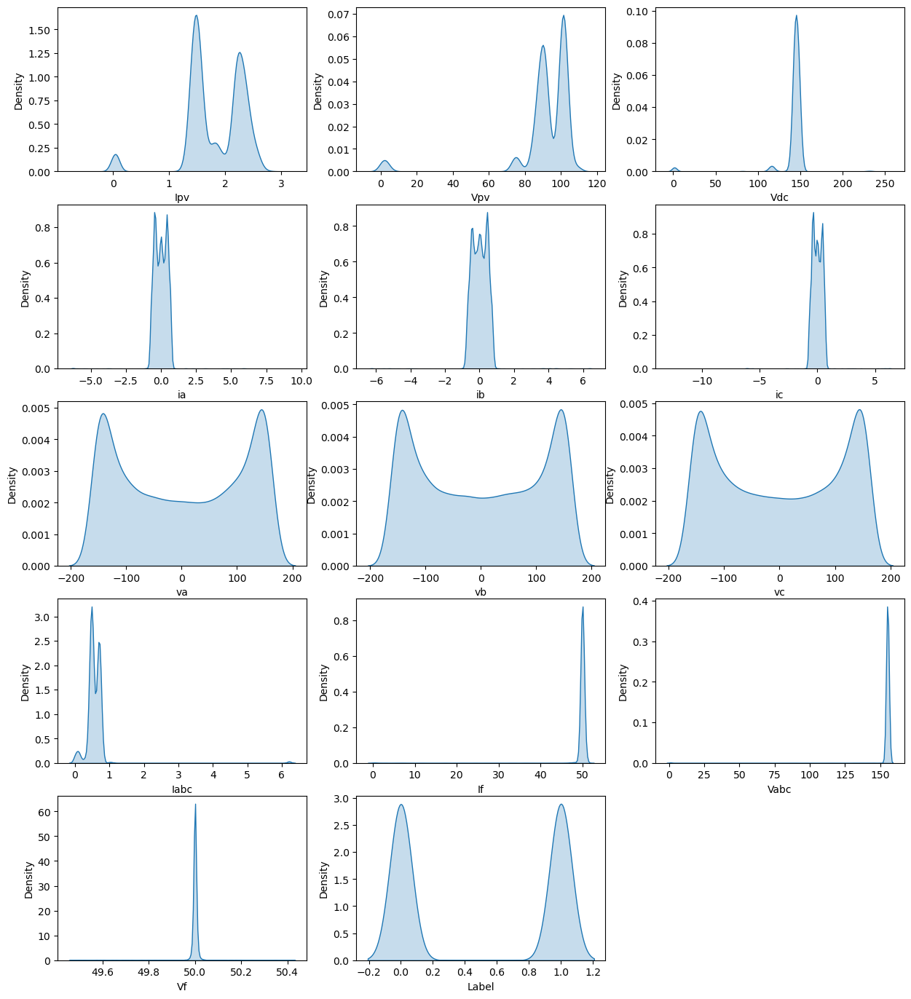

In [12]:
#checking for data distrubution
plt.figure(figsize=(15,17))
i =1
for col in df.columns:
    plt.subplot(5,3,i)
    sns.kdeplot(df[col] ,fill= True)
    i+=1 

### Kernel density estimate observations
    1 Unimodel Columns:
        Vf : Positive-sequence estimated vurrent frequency
        Vdc : DC voltage measurement
        Vabc : Positive-sequence estimated voltage magnitude.
        If : Positive-sequence estimated current frequency
    2 Bimodel Columns :
        Ipv : PV array current measurement.
        Vpv : PV array voltage measurement.
        Va : Phase_A voltage measurement.
        Vb : Phase_B voltage measurement.
        Vc : Phase_C voltage measurement
        Iabc : Positive-sequence estimated current magnitude
    3 multimodel Columns :
        Ia: Phase_A current measurement.
        Ib: Phase_B current measurement.
        Ic: Phase_C current measurement.
        
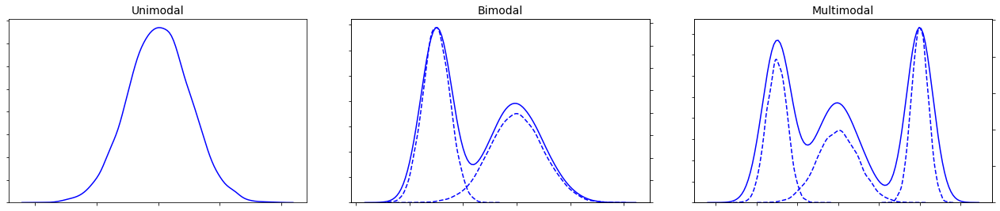


        

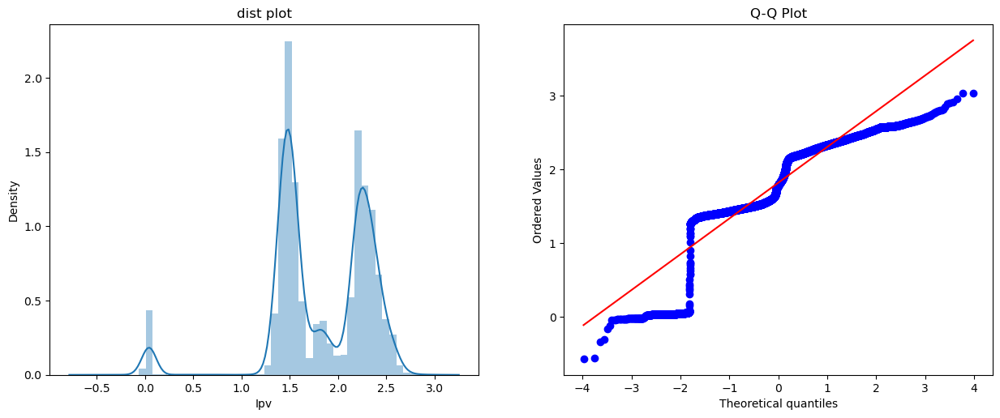

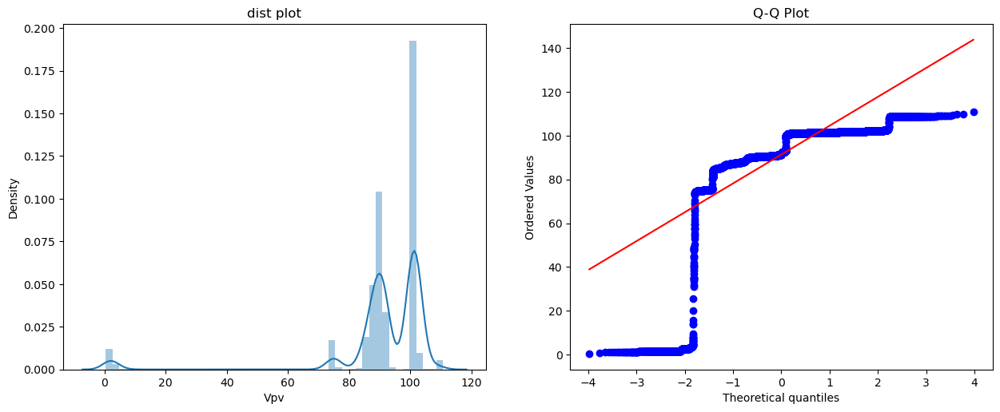

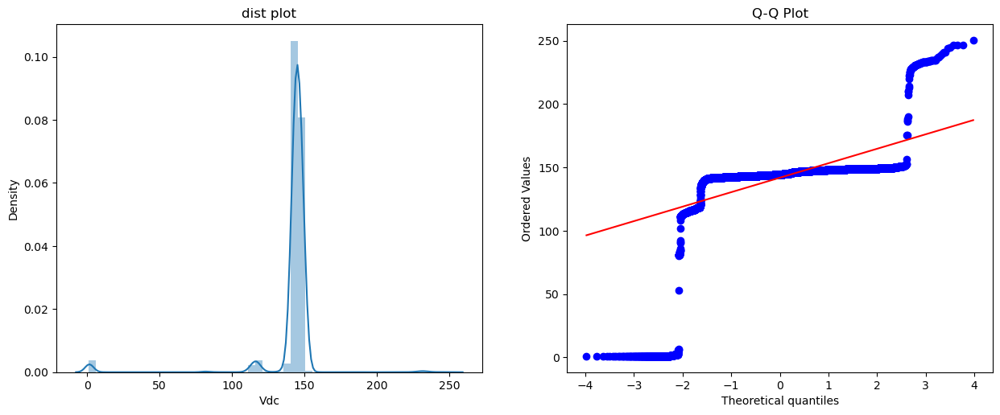

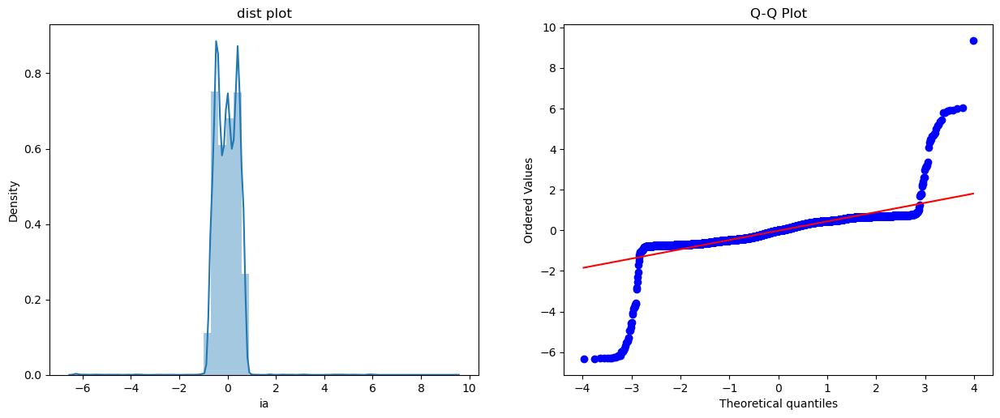

...

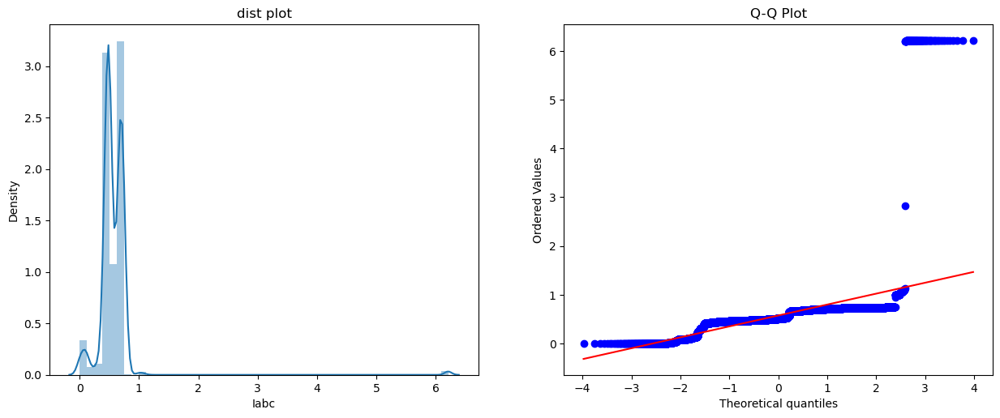

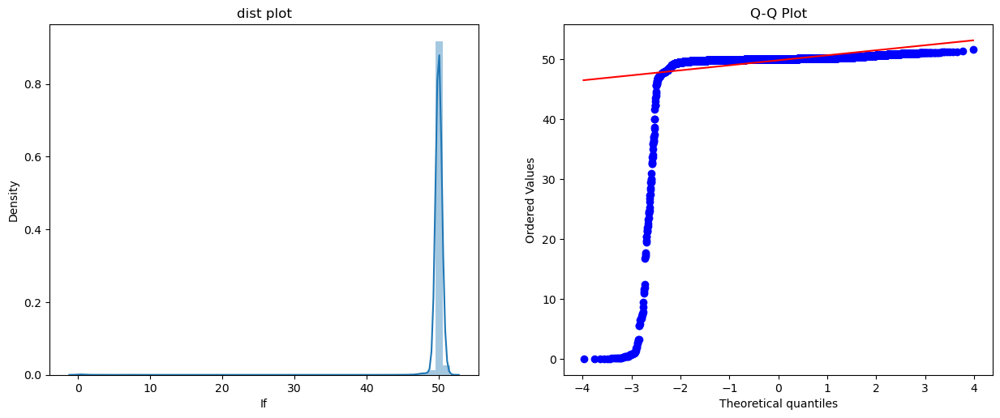

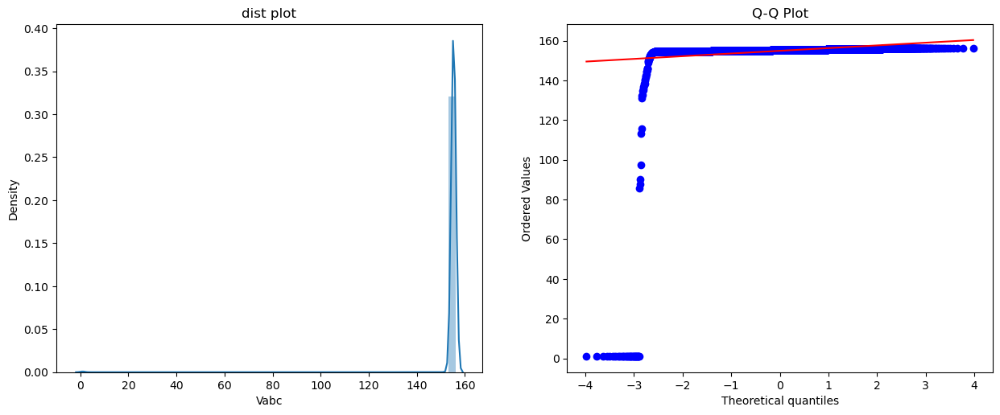

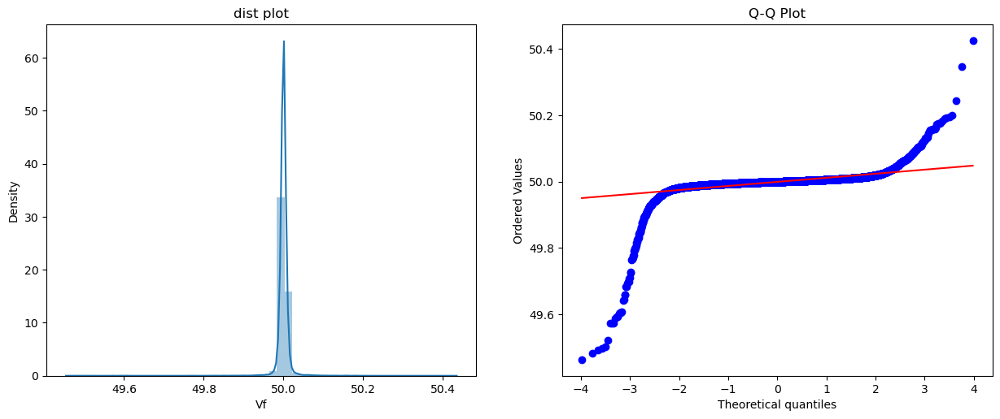

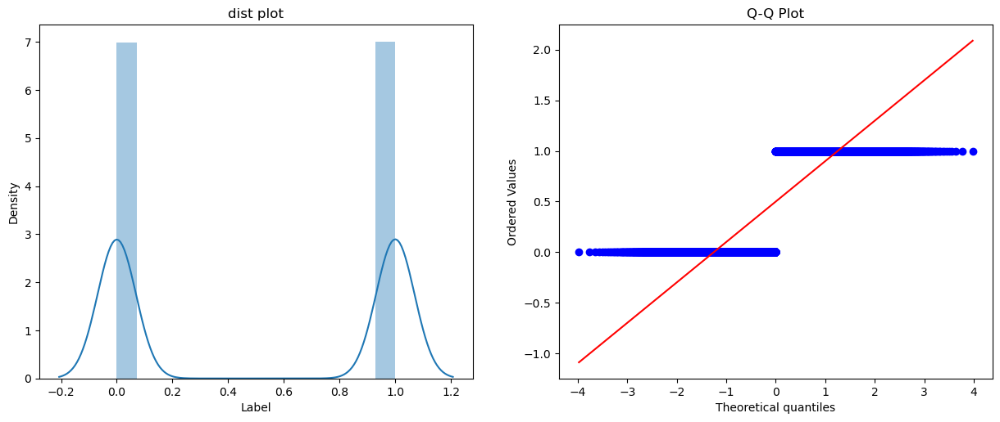

In [13]:
#checking the data distrubution using distwnce plot and Q - Q plot :
for col in df.columns:
    plt.figure(figsize=(15,100))
    plt.subplot(15, 2, 1)
    sns.distplot(df[col])
    plt.title("dist plot")
    plt.subplot(15, 2, 2)
    stats.probplot(df[col], dist="norm", plot=plt )
    plt.title("Q-Q Plot")
    plt.show()

In [14]:
df.corr()

,Ipv,Vpv,Vdc,ia,ib,ic,va,vb,vc,Iabc,If,Vabc,Vf,Label
Ipv,1.000000,0.002175,0.151260,-0.000705,-0.012911,0.003934,-0.000911,0.004095,-0.005180,0.379936,0.138196,-0.006793,-0.023456,-0.115003
Vpv,0.002175,1.000000,0.688443,0.017808,-0.001179,-0.021955,-0.006173,0.015283,-0.010796,-0.197944,0.174138,-0.010552,0.002485,-0.247696
Vdc,0.151260,0.688443,1.000000,0.032896,-0.012382,-0.022552,-0.000011,0.012008,-0.012795,-0.268743,0.103659,-0.008159,-0.005559,-0.153283
ia,-0.000705,0.017808,0.032896,1.000000,-0.488352,-0.491629,-0.753644,0.428756,0.329763,-0.075918,-0.002991,0.003119,0.005240,-0.022880
ib,-0.012911,-0.001179,-0.012382,-0.488352,1.000000,-0.494390,0.354584,-0.738629,0.388459,0.025991,-0.000188,-0.009692,-0.011460,0.007479
ic,0.003934,-0.021955,-0.022552,-0.491629,-0.494390,1.000000,0.385521,0.313963,-0.709000,0.059051,0.000229,0.004748,0.007187,0.018530
va,-0.000911,-0.006173,-0.000011,-0.753644,0.354584,0.385521,1.000000,-0.512953,-0.494240,-0.001253,-0.005687,-0.001632,-0.004056,0.005246
vb,0.004095,0.015283,0.012008,0.428756,-0.738629,0.313963,-0.512953,1.000000,-0.492387,-0.003720,0.000115,0.009175,0.011220,-0.004825
vc,-0.005180,-0.010796,-0.012795,0.329763,0.388459,-0.709000,-0.494240,-0.492387,1.000000,0.005347,0.005620,-0.006516,-0.006939,0.002317
Iabc,0.379936,-0.197944,-0.268743,-0.075918,0.025991,0.059051,-0.001253,-0.003720,0.005347,1.000000,0.103397,-0.041169,-0.001055,-0.038565


<AxesSubplot:>

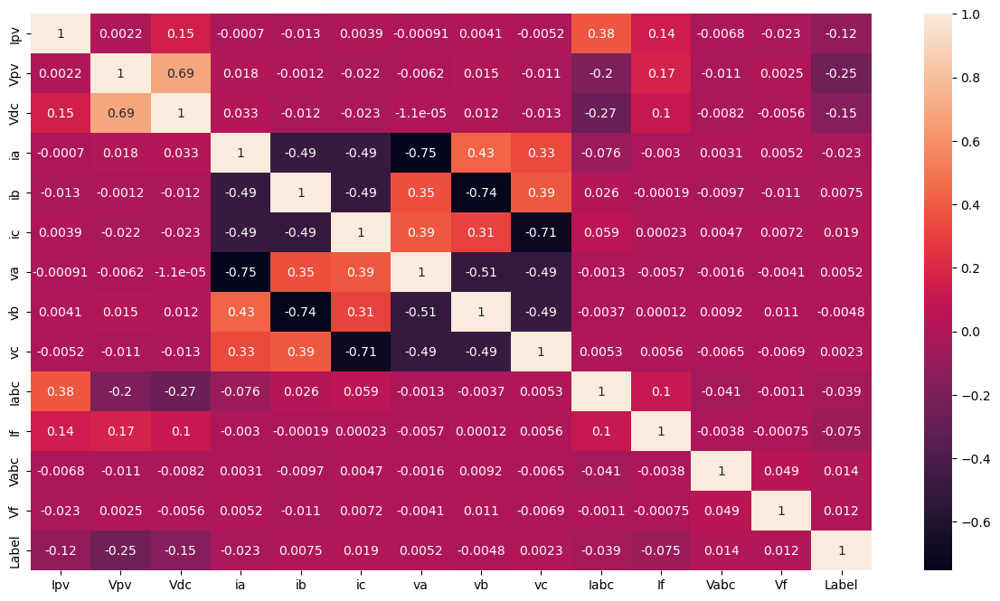

In [15]:
# ploting heatmap for finding Correlation
plt.figure(figsize=(15,8))
sns.heatmap(df.corr() ,annot=True)

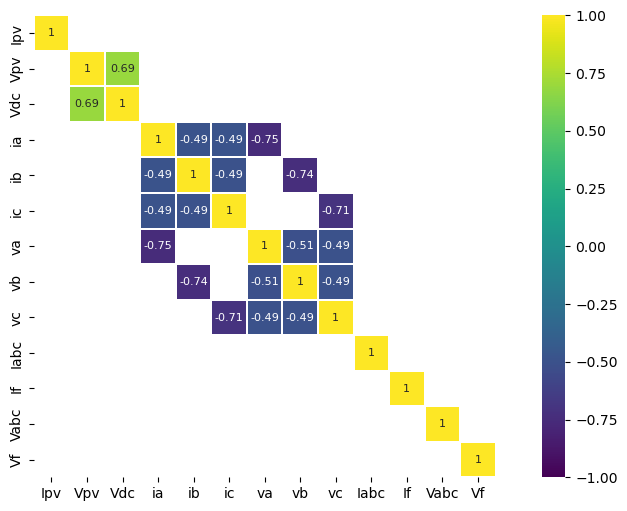

In [16]:
corr = df.drop('Label', axis=1).corr()
plt.figure(figsize=(12,6))

sns.heatmap(corr[(corr >= 0.5) | (corr <= -0.4)], 
            cmap='viridis', vmax=1.0, vmin=-1.0, linewidths=0.1,
            annot=True, annot_kws={"size": 8}, square=True);

#### Heatmap Observations:

    1. Phase_A voltage measurement (va) has strong negative Correlation with Phase_A 
       current measurement (ia) of -0.75
    
    2. Phase_B voltage measurement (vb) has strong negative Correlation with Phase_B 
       current measurement (ib) of -0.74
    
    3. Phase_C voltage measurement (vc) has strong negative Correlation with Phase_c 
       current measurement (ic) of -0.71
    
    4. DC voltage measurement (vdc) has strong positive Correlation with PV array voltage
       measurement (Vpv) of 0.69

### Handeling Outliers

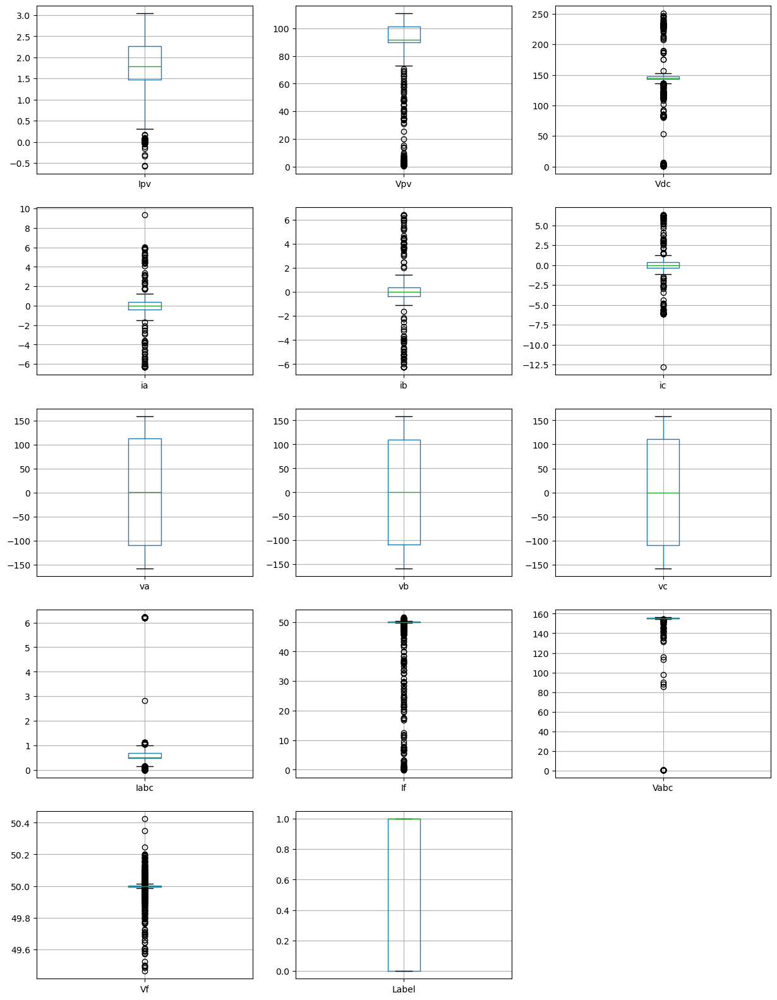

In [17]:
# finding Outliers :
# ploting boxplot
plt.figure(figsize=(15,20))
i = 1
for col in df.columns:
    plt.subplot(5,3,i)
    df[[col]].boxplot()
    i+=1

### Choosing outlier handeling  stratagy

In [18]:
# function to check outlier percentage
def check_outlier_percent(col):
    q1 = df[col].quantile(0.25)
    q3 = df[col].quantile(0.75)
    IQR = q3-q1
    upper_limit = q3 + 1.5*IQR
    lower_limit = q1 - 1.5*IQR
    percent_u = len(df[(df[col]>upper_limit)])/len(df*100)
    percent_l = len(df[(df[col]<lower_limit)])/len(df*100)
    return percent_u , percent_l

In [19]:
#creating dataframe of outliers record
out_df = pd.DataFrame()
for col in df.columns:
    column = col
    percent = check_outlier_percent(col)
    total_records = percent[0]*(len(df))+ percent[1]*(len(df))
    total_percent = (total_records /len(df)) *100
    out_df = out_df.append({"column name" :column ,"Upper":percent[0] ,"Lower":percent[1],"total_percent":total_percent ,"total_records":total_records } ,ignore_index=True)

In [20]:
# dataframe
out_df

,column name,Upper,Lower,total_percent,total_records
0,Ipv,0.000000,0.034948,3.494825,699.0
1,Vpv,0.000000,0.036548,3.654817,731.0
2,Vdc,0.004550,0.053297,5.784711,1157.0
3,ia,0.001950,0.002150,0.409980,82.0
4,ib,0.002250,0.001950,0.419979,84.0
5,ic,0.002450,0.001950,0.439978,88.0
6,va,0.000000,0.000000,0.000000,0.0
7,vb,0.000000,0.000000,0.000000,0.0
8,vc,0.000000,0.000000,0.000000,0.0
9,Iabc,0.006600,0.046198,5.279736,1056.0


### finding that is all outliers are faulty records ?

#### Vf - voltage frequency 

In [21]:
q1 = df["Vf"].quantile(0.25)
q3 = df["Vf"].quantile(0.75)
IQR = q3 - q1
upper_limit = q3 + 1.5*IQR
lower_limit = q1 - 1.5*IQR

In [22]:
len(df.loc[(df["Vf"] > upper_limit) & (df["Label"]  == 0)])

237

In [23]:
len(df.loc[(df["Vf"] < lower_limit) &  (df["Label"]  == 0)])

270

In [24]:
len(df.loc[(df["Vf"] > upper_limit) & (df["Label"]  == 1)])

468

In [25]:
len(df.loc[(df["Vf"] < lower_limit) &  (df["Label"]  == 1)])

441

#### If current frequency

In [26]:
q1 = df["If"].quantile(0.25)
q3 = df["If"].quantile(0.75)
IQR = q3 - q1
upper_limit = q3 + 1.5*IQR
lower_limit = q1 - 1.5*IQR

In [27]:
len(df.loc[(df["If"] > upper_limit) & (df["Label"]  == 1)])

716

In [28]:
len(df.loc[(df["If"] < lower_limit) &  (df["Label"]  == 1)])

570

#### Vdc 

In [29]:
q1 = df["Vdc"].quantile(0.25)
q3 = df["Vdc"].quantile(0.75)
IQR = q3 - q1
upper_limit = q3 + 1.5*IQR
lower_limit = q1 - 1.5*IQR

In [30]:
len(df.loc[(df["Vdc"] > upper_limit) & (df["Label"]  == 1)])

91

In [31]:
len(df.loc[(df["Vdc"] < lower_limit) &  (df["Label"]  == 1)])

1062

#### Ipv

In [32]:
q1 = df["Ipv"].quantile(0.25)
q3 = df["Ipv"].quantile(0.75)
IQR = q3 - q1
upper_limit = q3 + 1.5*IQR
lower_limit = q1 - 1.5*IQR

In [33]:
len(df.loc[(df["Ipv"] > upper_limit) & (df["Label"]  == 1)])

0

In [34]:
len(df.loc[(df["Ipv"] < lower_limit) &  (df["Label"]  == 1)])

699

#### Vpv

In [35]:
q1 = df["Vpv"].quantile(0.25)
q3 = df["Vpv"].quantile(0.75)
IQR = q3 - q1
upper_limit = q3 + 1.5*IQR
lower_limit = q1 - 1.5*IQR

In [36]:
len(df.loc[(df["Vpv"] > upper_limit) & (df["Label"]  == 1)])

0

In [37]:
len(df.loc[(df["Vpv"] < lower_limit) &  (df["Label"]  == 1)])

731

#### ia 

In [38]:
q1 = df["ia"].quantile(0.25)
q3 = df["ia"].quantile(0.75)
IQR = q3 - q1
upper_limit = q3 + 1.5*IQR
lower_limit = q1 - 1.5*IQR

In [39]:
len(df.loc[(df["ia"] > upper_limit) & (df["Label"]  == 1)])

39

In [40]:
len(df.loc[(df["ia"] < lower_limit) &  (df["Label"]  == 1)])

43

### Observations :
    1. Vf ,Vabc, If ,Iabc, ia ,ic, ib, Vdc, Vpv, Ipv  >>> columns has outliers
    2. va, vb, vc   >> columns dont have any outtliers
    3.the sum of faulty records is grater than 75 th quantile and less tha 25th quintile  is equal to   the number of outliers present in all columns
    
### strategy for outliers handling
    Solution:- for outliers treatment imputations and winsorization is not possible 

<Figure size 2000x2000 with 0 Axes>

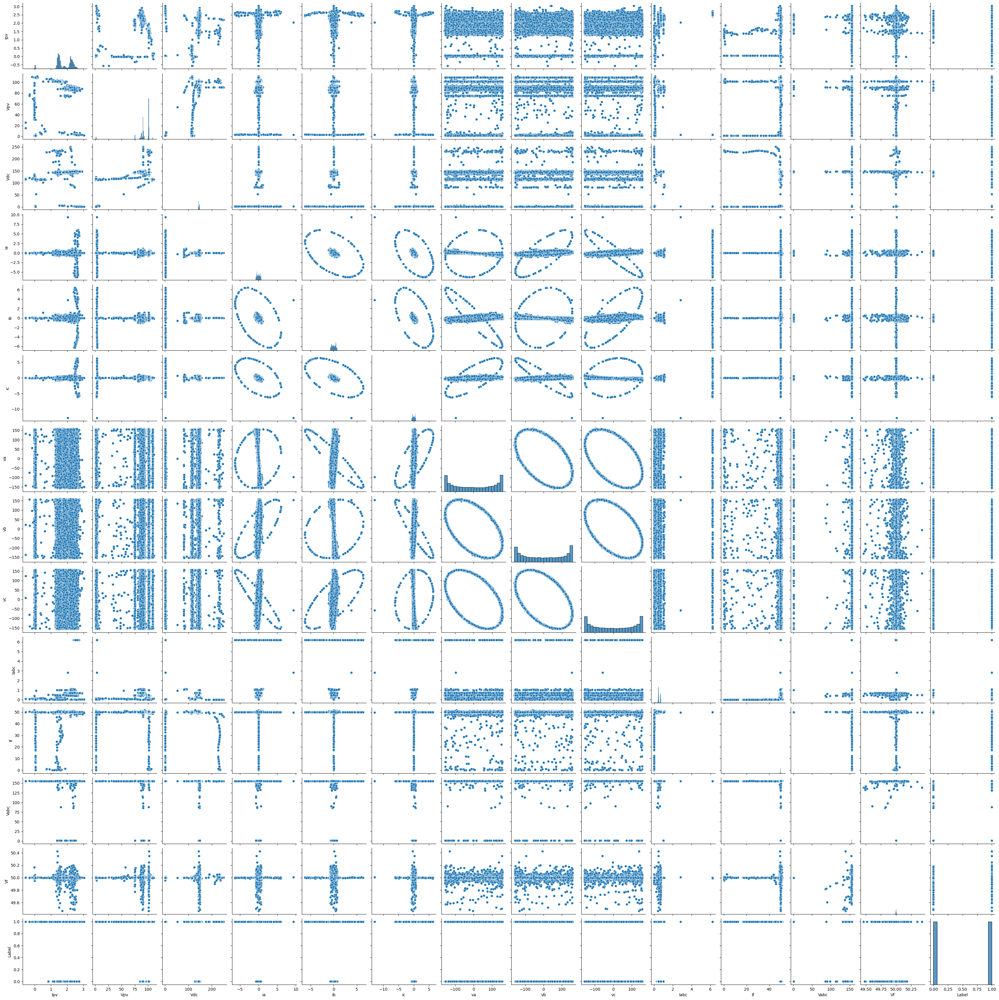

In [41]:
# pairplot
plt.figure(figsize=(20,20))
sns.pairplot(df)

In [42]:
# seprating output and input variable
x = df.drop("Label" ,axis =1)
# Label > output variable
y = df.Label

### IQR Robust Scaler Transform

In [43]:
from sklearn.preprocessing import RobustScaler

In [44]:
# perform a robust scaler transform of the dataset
trans = RobustScaler()
data = trans.fit_transform(x)
# convert the array back to a dataframe
x = pd.DataFrame(data ,columns= x.columns)

In [45]:
with open("scaler.pickle","wb") as f:
    pickle.dump(trans,f)

### Model Building

#### Models used :
    1.Logistic Regression
    2.Random Forest Classifier
    3.XG Boost Classifier
    
#### CrossValidation
     1.Grid Search Cv
     2.Randomized Search cv

### 1. LogisticRegression

In [46]:
# spliting dataset train test 
x_train,x_test,y_train,y_test =train_test_split(x ,y,random_state = 42)

In [47]:
# LogisticRegression model treaning
lg_model = LogisticRegression()
lg_model.fit(x_train,y_train)
y_pred_te = lg_model.predict(x_test)

##### Evaluating  Model On  Test Data

In [48]:
print("classification_report")
print(classification_report(y_test,y_pred_te))
print("Precision :",precision_score(y_test,y_pred_te))
print("Recall :",recall_score(y_test,y_pred_te))
print("F1 :",f1_score(y_test ,y_pred_te))

classification_report
              precision    recall  f1-score   support

           0       0.68      0.85      0.75      2460
           1       0.81      0.61      0.69      2541

    accuracy                           0.73      5001
   macro avg       0.74      0.73      0.72      5001
weighted avg       0.74      0.73      0.72      5001

Precision : 0.8095739084692267
Recall : 0.6056670602125147
F1 : 0.6929311121116614


##### Evaluating Model On Train data 

In [49]:
y_pred_tr = lg_model.predict(x_train)

In [50]:
print("classification_report")
print(classification_report(y_train,y_pred_tr))
print("Precision :",precision_score(y_train,y_pred_tr))
print("Recall :",recall_score(y_train,y_pred_tr))
print("F1 :",f1_score(y_train,y_pred_tr))

classification_report
              precision    recall  f1-score   support

           0       0.69      0.86      0.77      7531
           1       0.81      0.61      0.70      7469

    accuracy                           0.73     15000
   macro avg       0.75      0.73      0.73     15000
weighted avg       0.75      0.73      0.73     15000

Precision : 0.8122653316645807
Recall : 0.6082474226804123
F1 : 0.6956055734190781


In [51]:
# ploting ROC curve
from sklearn.metrics import roc_curve
from sklearn.metrics import RocCurveDisplay

In [52]:
# Prediction Of probablity
y_proba = lg_model.predict_proba(x_test)
fpr ,tpr ,threshold = roc_curve(y_test,y_proba[:,1])

In [53]:
# importing plot_roc_curve :
from sklearn.metrics import plot_roc_curve

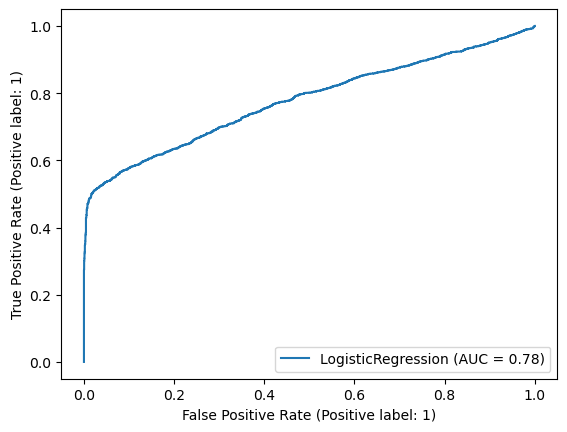

In [54]:
plot_roc_curve(lg_model,x_test,y_test)

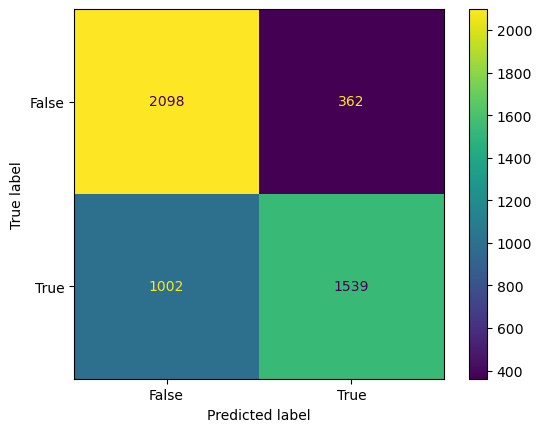

In [55]:
# Visual representation of Confusion metrics
from sklearn.metrics import confusion_matrix
from sklearn import metrics
confusion_matrix = metrics.confusion_matrix(y_test,y_pred_te)
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, 
                                            display_labels = [False, True])
cm_display.plot()
plt.show()

### 2.  Random Forest Classifier

In [56]:
# importing  RandomForestClassifier
from sklearn.ensemble import RandomForestClassifier

In [57]:
# Training RandomForestClassifier
rf_model = RandomForestClassifier(n_estimators=100 ,max_depth = 10 ,
                                  max_features= 10 ,max_leaf_nodes= 8 ,n_jobs= 4)
rf_model.fit(x_train,y_train)
y_pred_te = rf_model.predict(x_test)

#### Model evaluation on Test data 

In [58]:
print("classification_report")
print(classification_report(y_test,y_pred_te))
print("Precision :",precision_score(y_test,y_pred_te))
print("Recall :",recall_score(y_test,y_pred_te))
print("F1 :",f1_score(y_test ,y_pred_te))

classification_report
              precision    recall  f1-score   support

           0       0.84      0.98      0.90      2460
           1       0.97      0.82      0.89      2541

    accuracy                           0.90      5001
   macro avg       0.91      0.90      0.90      5001
weighted avg       0.91      0.90      0.90      5001

Precision : 0.9721448467966574
Recall : 0.8240850059031877
F1 : 0.8920127795527156


#### Model evaluation on Train data

In [59]:
y_pred_tr = rf_model.predict(x_train)

In [60]:
print("classification_report")
print(classification_report(y_train,y_pred_tr))
print("Precision :",precision_score(y_train,y_pred_tr))
print("Recall :",recall_score(y_train,y_pred_tr))
print("F1 :",f1_score(y_train,y_pred_tr))

classification_report
              precision    recall  f1-score   support

           0       0.86      0.98      0.91      7531
           1       0.97      0.83      0.90      7469

    accuracy                           0.91     15000
   macro avg       0.91      0.91      0.91     15000
weighted avg       0.91      0.91      0.91     15000

Precision : 0.9738899312070044
Recall : 0.8339804525371536
F1 : 0.8985214569058781


####  Cross Validation On Random Forest Using Randomized Search Cv

In [61]:
# Parameter Grid :
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 1000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 90, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
param_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

In [62]:
import time
from sklearn.model_selection import RandomizedSearchCV

In [63]:
start_time = time.time()
# Cross Validation
rf_model = RandomForestClassifier()
gscv_rf_model = RandomizedSearchCV(rf_model ,param_grid,cv=5,n_jobs=-1)
gscv_rf_model.fit(x_train,y_train)

end_time = time.time()
total_time = end_time - start_time 
print(total_time/60)

3.749495800336202


In [64]:
# Best estimator
gscv_rf_model.best_estimator_

RandomForestClassifier(bootstrap=False, max_depth=82, min_samples_split=10,
                       n_estimators=200)

### Training Random Forest Classifier  With Best Estimators

In [66]:
rf_model = RandomForestClassifier(bootstrap= False ,max_depth=82 ,min_samples_leaf=7 ,min_samples_split=10,
                                 n_estimators =200,max_features='sqrt' )
rf_model.fit(x_train,y_train)
y_pred_te = rf_model.predict(x_test)

#### Model evaluation on test data

In [67]:
print("classification_report")
print(classification_report(y_test,y_pred_te))
print("Precision :",precision_score(y_test,y_pred_te))
print("Recall :",recall_score(y_test,y_pred_te))
print("F1 :",f1_score(y_test ,y_pred_te))

classification_report
              precision    recall  f1-score   support

           0       0.94      0.98      0.96      2460
           1       0.98      0.94      0.96      2541

    accuracy                           0.96      5001
   macro avg       0.96      0.96      0.96      5001
weighted avg       0.96      0.96      0.96      5001

Precision : 0.978688524590164
Recall : 0.9397874852420307
F1 : 0.9588436057016664


#### Model evaluation on Train data

In [68]:
y_pred_tr = rf_model.predict(x_train)

In [69]:
print("classification_report")
print(classification_report(y_train,y_pred_tr))
print("Precision :",precision_score(y_train,y_pred_tr))
print("Recall :",recall_score(y_train,y_pred_tr))
print("F1 :",f1_score(y_train,y_pred_tr))

classification_report
              precision    recall  f1-score   support

           0       0.98      0.99      0.99      7531
           1       0.99      0.98      0.99      7469

    accuracy                           0.99     15000
   macro avg       0.99      0.99      0.99     15000
weighted avg       0.99      0.99      0.99     15000

Precision : 0.9940176750509857
Recall : 0.9788458963716695
F1 : 0.9863734484619536


### Observations :
    After doing crossvalidation on Random Forest Classifier our score jumped from 90 % to 96 %

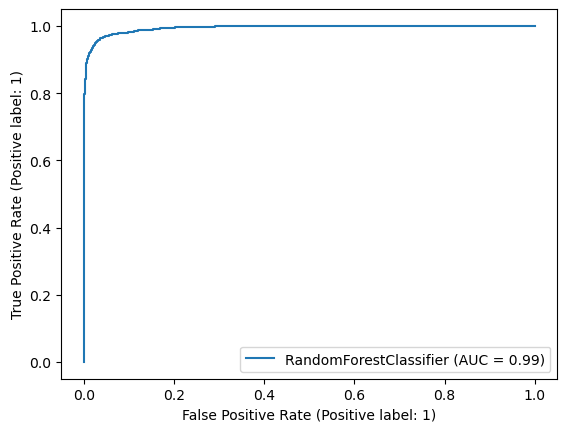

In [70]:
# Ploting ROC curve :
plot_roc_curve(rf_model,x_test,y_test)

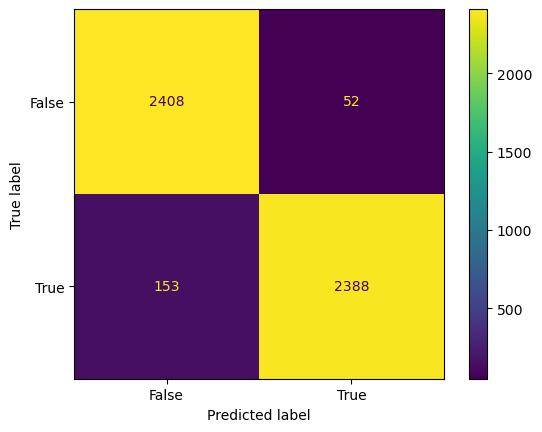

In [71]:
# Visulizing Confuson Metricies
from sklearn.metrics import confusion_matrix
from sklearn import metrics
confusion_matrix = metrics.confusion_matrix(y_test,y_pred_te)
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, 
                                            display_labels = [False, True])
cm_display.plot()
plt.show()

### 3. XG Boost Classifier

In [73]:
#!pip install xgboost
from xgboost import XGBClassifier

     ---------------------------------------- 89.1/89.1 MB 8.6 MB/s eta 0:00:00


In [75]:
xgb = XGBClassifier()
xgb.fit(x_train,y_train)
y_pred_te =xgb.predict(x_test)

#### Model evaluation on test data

In [76]:
print("classification_report")
print(classification_report(y_test,y_pred_te))
print("Precision :",precision_score(y_test,y_pred_te))
print("Recall :",recall_score(y_test,y_pred_te))
print("F1 :",f1_score(y_test ,y_pred_te))

classification_report
              precision    recall  f1-score   support

           0       0.95      0.98      0.97      2460
           1       0.98      0.95      0.97      2541

    accuracy                           0.97      5001
   macro avg       0.97      0.97      0.97      5001
weighted avg       0.97      0.97      0.97      5001

Precision : 0.98413344182262
Recall : 0.9519874065328611
F1 : 0.9677935587117423


#### Model evaluation on Test data

In [77]:
y_pred_tr = xgb.predict(x_train)

In [78]:
print("classification_report")
print(classification_report(y_train,y_pred_tr))
print("Precision :",precision_score(y_train,y_pred_tr))
print("Recall :",recall_score(y_train,y_pred_tr))
print("F1 :",f1_score(y_train,y_pred_tr))

classification_report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      7531
           1       1.00      1.00      1.00      7469

    accuracy                           1.00     15000
   macro avg       1.00      1.00      1.00     15000
weighted avg       1.00      1.00      1.00     15000

Precision : 0.9995976934424031
Recall : 0.9979916990226269
F1 : 0.9987940506498727


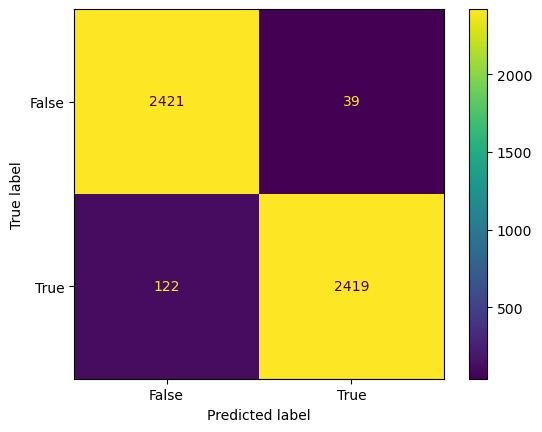

In [79]:
# Visulizing Confuson Metricies
from sklearn.metrics import confusion_matrix
from sklearn import metrics
confusion_matrix = metrics.confusion_matrix(y_test,y_pred_te)
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, 
                                            display_labels = [False, True])
cm_display.plot()
plt.show()

### Cross Validation On XGBoost Using Randomized Search Cv

In [80]:
from sklearn.model_selection import StratifiedKFold
# A parameter grid for XGBoost
params = {
        'min_child_weight': [1, 5, 10],
        'gamma': [0.5, 1, 1.5, 2, 5],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [3, 4, 5]
        }
folds = 3
param_comb = 5

In [81]:
random_search = RandomizedSearchCV(xgb, param_distributions=params, n_iter=param_comb, 
                                   scoring='roc_auc', n_jobs=4)
random_search.fit(x_train,y_train)

RandomizedSearchCV(estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=None, gpu_id=None,
                                           grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate=None...
                                           max_leaves=None,
                                           min_child_we

In [82]:
random_search.best_estimator_

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=1, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=10, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

### Training XGBoost with best estimators

In [83]:
xgb = XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=0.8,
              enable_categorical=False, gamma=1, gpu_id=-1,
              grow_policy='depthwise',interaction_constraints='', learning_rate=0.300000012,
              max_bin=256, max_cat_threshold=64, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=5, max_leaves=0, min_child_weight=1,
              monotone_constraints='()', n_estimators=100, num_parallel_tree=1, predictor='auto',
              random_state=0)

In [84]:
xgb.fit(x_train,y_train) 
y_pred_te = xgb.predict(x_test)

#### Model evaluation on test data¶

In [85]:
print("classification_report")
print(classification_report(y_test,y_pred_te))
print("Precision :",precision_score(y_test,y_pred_te))
print("Recall :",recall_score(y_test,y_pred_te))
print("F1 :",f1_score(y_test ,y_pred_te))

classification_report
              precision    recall  f1-score   support

           0       0.95      0.98      0.97      2460
           1       0.98      0.95      0.97      2541

    accuracy                           0.97      5001
   macro avg       0.97      0.97      0.97      5001
weighted avg       0.97      0.97      0.97      5001

Precision : 0.9844961240310077
Recall : 0.9496261314443133
F1 : 0.9667467948717948


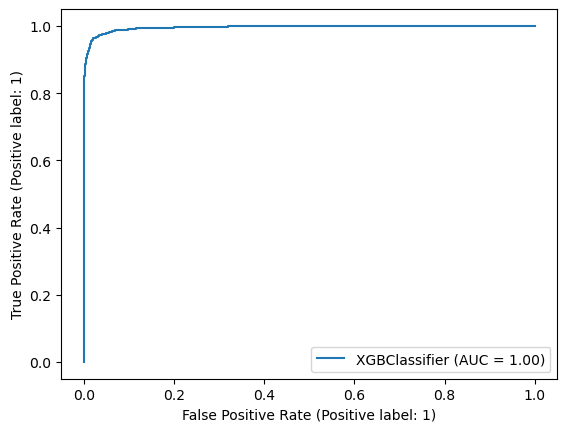

In [86]:
# ploting Roc curve with best estima
plot_roc_curve(xgb,x_test,y_test)

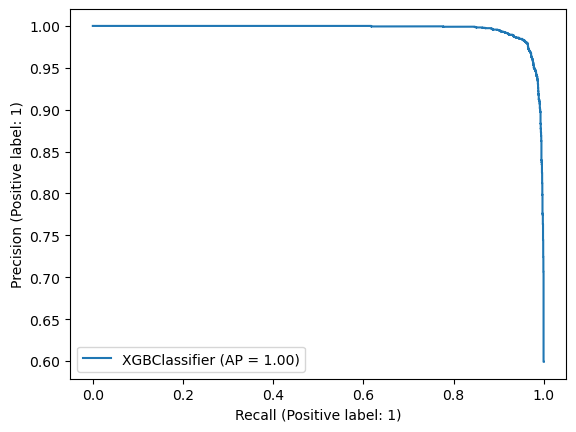

In [87]:
# ploting precision recall curve
from sklearn.metrics import plot_precision_recall_curve
plot_precision_recall_curve(xgb ,x_test ,y_test)

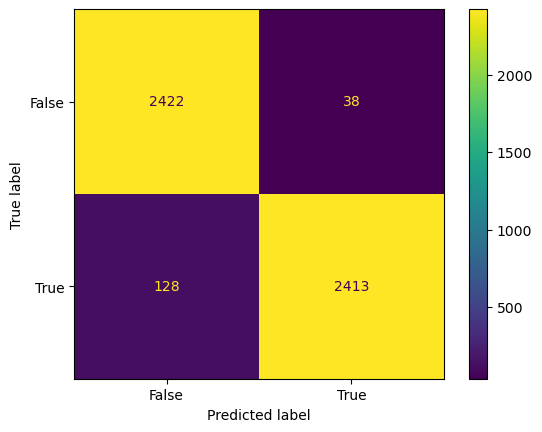

In [88]:
# Visulizing Confuson Metricies
from sklearn.metrics import confusion_matrix
from sklearn import metrics
confusion_matrix = metrics.confusion_matrix(y_test,y_pred_te)
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, 
                                            display_labels = [False, True])
cm_display.plot()
plt.show()

The Confusion Matrix created has four different quadrants:

    True Negative (Top-Left Quadrant)

    False Positive (Top-Right Quadrant)

    False Negative (Bottom-Left Quadrant)

    True Positive (Bottom-Right Quadrant)

### Cross Validation On XGBoost Using Grid Search CV

In [89]:
from sklearn.model_selection import GridSearchCV

# Define the hyperparameters and their range
param_grid = {'max_depth': [3, 5, 7],
              'min_child_weight': [1, 3, 5],
              'gamma': [0, 0.1, 0.2],
              'subsample': [0.8, 0.9, 1.0],
              'max_depth': [3, 4, 5],
              'colsample_bytree': [0.8, 0.9, 1.0]}

grid_search = GridSearchCV(xgb, param_grid, cv=5, scoring='accuracy')
grid_search.fit(x_train, y_train)

# The best hyperparameters
print("Best hyperparameters: ", grid_search.best_params_)
folds = 3
param_comb = 5

Best hyperparameters:  {'colsample_bytree': 0.9, 'gamma': 0, 'max_depth': 5, 'min_child_weight': 1, 'subsample': 0.8}


In [90]:
# training XGBoost with best parameters 
xgb = XGBClassifier(colsample_bytree = 0.9 ,gamma = 0 ,max_depth =5 ,min_child_weight =1 ,subsample =0.8)
xgb.fit(x_train,y_train)
y_pred_te = xgb.predict(x_test)

#### Model evaluation on test data

In [91]:

print("classification_report")
print(classification_report(y_test,y_pred_te))
print("Precision :",precision_score(y_test,y_pred_te))
print("Recall :",recall_score(y_test,y_pred_te))
print("F1 :",f1_score(y_test ,y_pred_te))

classification_report
              precision    recall  f1-score   support

           0       0.95      0.98      0.97      2460
           1       0.98      0.95      0.97      2541

    accuracy                           0.97      5001
   macro avg       0.97      0.97      0.97      5001
weighted avg       0.97      0.97      0.97      5001

Precision : 0.982933766761479
Recall : 0.9519874065328611
F1 : 0.9672131147540983


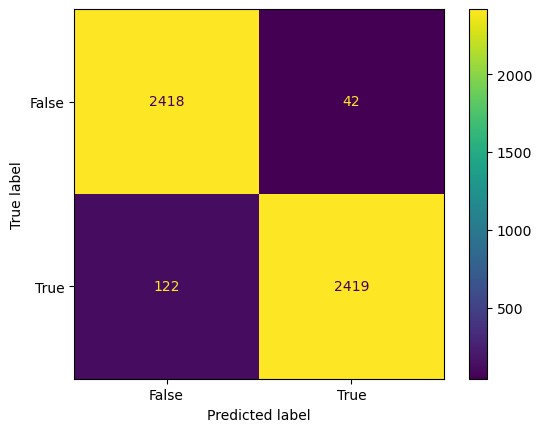

In [92]:
from sklearn.metrics import confusion_matrix
from sklearn import metrics
confusion_matrix = metrics.confusion_matrix(y_test,y_pred_te)
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, 
                                            display_labels = [False, True])
cm_display.plot()
plt.show()

### Tune XGBoost Model Using Learning Curves

[0]	validation_0-logloss:0.66127	validation_1-logloss:0.66183
[1]	validation_0-logloss:0.63640	validation_1-logloss:0.63769
[2]	validation_0-logloss:0.60904	validation_1-logloss:0.61078
[3]	validation_0-logloss:0.58826	validation_1-logloss:0.59037
[4]	validation_0-logloss:0.56312	validation_1-logloss:0.56574
[5]	validation_0-logloss:0.54022	validation_1-logloss:0.54310
[6]	validation_0-logloss:0.52322	validation_1-logloss:0.52663
[7]	validation_0-logloss:0.50269	validation_1-logloss:0.50649
[8]	validation_0-logloss:0.48400	validation_1-logloss:0.48819
[9]	validation_0-logloss:0.46367	validation_1-logloss:0.46803
[10]	validation_0-logloss:0.44426	validation_1-logloss:0.44898
[11]	validation_0-logloss:0.42844	validation_1-logloss:0.43360
[12]	validation_0-logloss:0.41260	validation_1-logloss:0.41806
[13]	validation_0-logloss:0.39682	validation_1-logloss:0.40259
[14]	validation_0-logloss:0.38710	validation_1-logloss:0.39325
[15]	validation_0-logloss:0.37328	validation_1-logloss:0.37984
[1

[130]	validation_0-logloss:0.10014	validation_1-logloss:0.12206
[131]	validation_0-logloss:0.09940	validation_1-logloss:0.12153
[132]	validation_0-logloss:0.09904	validation_1-logloss:0.12122
[133]	validation_0-logloss:0.09850	validation_1-logloss:0.12092
[134]	validation_0-logloss:0.09814	validation_1-logloss:0.12060
[135]	validation_0-logloss:0.09768	validation_1-logloss:0.12023
[136]	validation_0-logloss:0.09724	validation_1-logloss:0.11988
[137]	validation_0-logloss:0.09675	validation_1-logloss:0.11954
[138]	validation_0-logloss:0.09647	validation_1-logloss:0.11929
[139]	validation_0-logloss:0.09626	validation_1-logloss:0.11909
[140]	validation_0-logloss:0.09582	validation_1-logloss:0.11865
[141]	validation_0-logloss:0.09478	validation_1-logloss:0.11782
[142]	validation_0-logloss:0.09434	validation_1-logloss:0.11746
[143]	validation_0-logloss:0.09409	validation_1-logloss:0.11720
[144]	validation_0-logloss:0.09389	validation_1-logloss:0.11701
[145]	validation_0-logloss:0.09349	valid

[259]	validation_0-logloss:0.06450	validation_1-logloss:0.09767
[260]	validation_0-logloss:0.06434	validation_1-logloss:0.09760
[261]	validation_0-logloss:0.06407	validation_1-logloss:0.09753
[262]	validation_0-logloss:0.06384	validation_1-logloss:0.09749
[263]	validation_0-logloss:0.06348	validation_1-logloss:0.09719
[264]	validation_0-logloss:0.06325	validation_1-logloss:0.09700
[265]	validation_0-logloss:0.06296	validation_1-logloss:0.09689
[266]	validation_0-logloss:0.06282	validation_1-logloss:0.09685
[267]	validation_0-logloss:0.06277	validation_1-logloss:0.09682
[268]	validation_0-logloss:0.06266	validation_1-logloss:0.09679
[269]	validation_0-logloss:0.06245	validation_1-logloss:0.09664
[270]	validation_0-logloss:0.06232	validation_1-logloss:0.09656
[271]	validation_0-logloss:0.06222	validation_1-logloss:0.09646
[272]	validation_0-logloss:0.06186	validation_1-logloss:0.09631
[273]	validation_0-logloss:0.06172	validation_1-logloss:0.09620
[274]	validation_0-logloss:0.06160	valid

[388]	validation_0-logloss:0.04587	validation_1-logloss:0.08818
[389]	validation_0-logloss:0.04575	validation_1-logloss:0.08816
[390]	validation_0-logloss:0.04565	validation_1-logloss:0.08813
[391]	validation_0-logloss:0.04559	validation_1-logloss:0.08816
[392]	validation_0-logloss:0.04551	validation_1-logloss:0.08815
[393]	validation_0-logloss:0.04547	validation_1-logloss:0.08812
[394]	validation_0-logloss:0.04534	validation_1-logloss:0.08811
[395]	validation_0-logloss:0.04527	validation_1-logloss:0.08810
[396]	validation_0-logloss:0.04512	validation_1-logloss:0.08802
[397]	validation_0-logloss:0.04499	validation_1-logloss:0.08783
[398]	validation_0-logloss:0.04488	validation_1-logloss:0.08777
[399]	validation_0-logloss:0.04475	validation_1-logloss:0.08765
[400]	validation_0-logloss:0.04467	validation_1-logloss:0.08766
[401]	validation_0-logloss:0.04458	validation_1-logloss:0.08764
[402]	validation_0-logloss:0.04451	validation_1-logloss:0.08764
[403]	validation_0-logloss:0.04441	valid

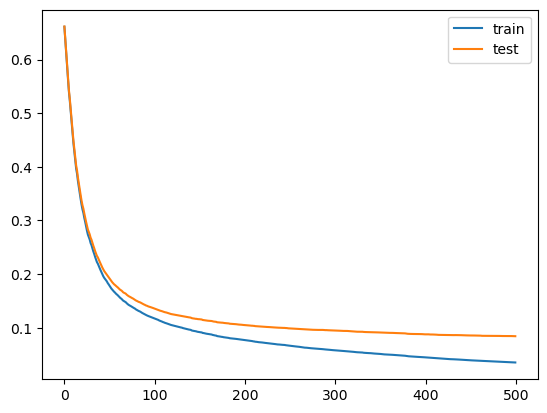

In [93]:
model = XGBClassifier(n_estimators=500, eta=0.05 ,colsample_bytree = 0.9 ,gamma = 0 ,max_depth =5 ,
                      min_child_weight =1 ,subsample =0.8)
# define the datasets to evaluate each iteration
evalset = [(x_train, y_train), (x_test,y_test)]
# fit the model
model.fit(x_train, y_train, eval_metric='logloss', eval_set=evalset)
# evaluate performance
y_pred_te = model.predict(x_test)
score = accuracy_score(y_test, y_pred_te)
print('Accuracy: %.3f' % score)
# retrieve performance metrics
results = model.evals_result()
# plot learning curves
plt.plot(results['validation_0']['logloss'], label='train')
plt.plot(results['validation_1']['logloss'], label='test')
# show the legend
plt.legend()
# show the plot
plt.show()

    ### Accuracy: 0.967

In [95]:
# trying with  n_estimators=2000

[0]	validation_0-logloss:0.66127	validation_1-logloss:0.66183
[1]	validation_0-logloss:0.63640	validation_1-logloss:0.63769
[2]	validation_0-logloss:0.60904	validation_1-logloss:0.61078
[3]	validation_0-logloss:0.58826	validation_1-logloss:0.59037
[4]	validation_0-logloss:0.56312	validation_1-logloss:0.56574
[5]	validation_0-logloss:0.54022	validation_1-logloss:0.54310
[6]	validation_0-logloss:0.52322	validation_1-logloss:0.52663
[7]	validation_0-logloss:0.50269	validation_1-logloss:0.50649
[8]	validation_0-logloss:0.48400	validation_1-logloss:0.48819
[9]	validation_0-logloss:0.46367	validation_1-logloss:0.46803
[10]	validation_0-logloss:0.44426	validation_1-logloss:0.44898
[11]	validation_0-logloss:0.42844	validation_1-logloss:0.43360
[12]	validation_0-logloss:0.41260	validation_1-logloss:0.41806
[13]	validation_0-logloss:0.39682	validation_1-logloss:0.40259
[14]	validation_0-logloss:0.38710	validation_1-logloss:0.39325
[15]	validation_0-logloss:0.37328	validation_1-logloss:0.37984
[1

[130]	validation_0-logloss:0.10014	validation_1-logloss:0.12206
[131]	validation_0-logloss:0.09940	validation_1-logloss:0.12153
[132]	validation_0-logloss:0.09904	validation_1-logloss:0.12122
[133]	validation_0-logloss:0.09850	validation_1-logloss:0.12092
[134]	validation_0-logloss:0.09814	validation_1-logloss:0.12060
[135]	validation_0-logloss:0.09768	validation_1-logloss:0.12023
[136]	validation_0-logloss:0.09724	validation_1-logloss:0.11988
[137]	validation_0-logloss:0.09675	validation_1-logloss:0.11954
[138]	validation_0-logloss:0.09647	validation_1-logloss:0.11929
[139]	validation_0-logloss:0.09626	validation_1-logloss:0.11909
[140]	validation_0-logloss:0.09582	validation_1-logloss:0.11865
[141]	validation_0-logloss:0.09478	validation_1-logloss:0.11782
[142]	validation_0-logloss:0.09434	validation_1-logloss:0.11746
[143]	validation_0-logloss:0.09409	validation_1-logloss:0.11720
[144]	validation_0-logloss:0.09389	validation_1-logloss:0.11701
[145]	validation_0-logloss:0.09349	valid

[259]	validation_0-logloss:0.06450	validation_1-logloss:0.09767
[260]	validation_0-logloss:0.06434	validation_1-logloss:0.09760
[261]	validation_0-logloss:0.06407	validation_1-logloss:0.09753
[262]	validation_0-logloss:0.06384	validation_1-logloss:0.09749
[263]	validation_0-logloss:0.06348	validation_1-logloss:0.09719
[264]	validation_0-logloss:0.06325	validation_1-logloss:0.09700
[265]	validation_0-logloss:0.06296	validation_1-logloss:0.09689
[266]	validation_0-logloss:0.06282	validation_1-logloss:0.09685
[267]	validation_0-logloss:0.06277	validation_1-logloss:0.09682
[268]	validation_0-logloss:0.06266	validation_1-logloss:0.09679
[269]	validation_0-logloss:0.06245	validation_1-logloss:0.09664
[270]	validation_0-logloss:0.06232	validation_1-logloss:0.09656
[271]	validation_0-logloss:0.06222	validation_1-logloss:0.09646
[272]	validation_0-logloss:0.06186	validation_1-logloss:0.09631
[273]	validation_0-logloss:0.06172	validation_1-logloss:0.09620
[274]	validation_0-logloss:0.06160	valid

[388]	validation_0-logloss:0.04587	validation_1-logloss:0.08818
[389]	validation_0-logloss:0.04575	validation_1-logloss:0.08816
[390]	validation_0-logloss:0.04565	validation_1-logloss:0.08813
[391]	validation_0-logloss:0.04559	validation_1-logloss:0.08816
[392]	validation_0-logloss:0.04551	validation_1-logloss:0.08815
[393]	validation_0-logloss:0.04547	validation_1-logloss:0.08812
[394]	validation_0-logloss:0.04534	validation_1-logloss:0.08811
[395]	validation_0-logloss:0.04527	validation_1-logloss:0.08810
[396]	validation_0-logloss:0.04512	validation_1-logloss:0.08802
[397]	validation_0-logloss:0.04499	validation_1-logloss:0.08783
[398]	validation_0-logloss:0.04488	validation_1-logloss:0.08777
[399]	validation_0-logloss:0.04475	validation_1-logloss:0.08765
[400]	validation_0-logloss:0.04467	validation_1-logloss:0.08766
[401]	validation_0-logloss:0.04458	validation_1-logloss:0.08764
[402]	validation_0-logloss:0.04451	validation_1-logloss:0.08764
[403]	validation_0-logloss:0.04441	valid

[517]	validation_0-logloss:0.03391	validation_1-logloss:0.08368
[518]	validation_0-logloss:0.03380	validation_1-logloss:0.08370
[519]	validation_0-logloss:0.03369	validation_1-logloss:0.08358
[520]	validation_0-logloss:0.03355	validation_1-logloss:0.08350
[521]	validation_0-logloss:0.03342	validation_1-logloss:0.08336
[522]	validation_0-logloss:0.03335	validation_1-logloss:0.08333
[523]	validation_0-logloss:0.03323	validation_1-logloss:0.08325
[524]	validation_0-logloss:0.03316	validation_1-logloss:0.08319
[525]	validation_0-logloss:0.03308	validation_1-logloss:0.08321
[526]	validation_0-logloss:0.03296	validation_1-logloss:0.08314
[527]	validation_0-logloss:0.03287	validation_1-logloss:0.08315
[528]	validation_0-logloss:0.03279	validation_1-logloss:0.08309
[529]	validation_0-logloss:0.03268	validation_1-logloss:0.08321
[530]	validation_0-logloss:0.03257	validation_1-logloss:0.08324
[531]	validation_0-logloss:0.03254	validation_1-logloss:0.08323
[532]	validation_0-logloss:0.03249	valid

[646]	validation_0-logloss:0.02528	validation_1-logloss:0.08058
[647]	validation_0-logloss:0.02522	validation_1-logloss:0.08057
[648]	validation_0-logloss:0.02518	validation_1-logloss:0.08055
[649]	validation_0-logloss:0.02513	validation_1-logloss:0.08052
[650]	validation_0-logloss:0.02505	validation_1-logloss:0.08043
[651]	validation_0-logloss:0.02499	validation_1-logloss:0.08038
[652]	validation_0-logloss:0.02493	validation_1-logloss:0.08031
[653]	validation_0-logloss:0.02487	validation_1-logloss:0.08031
[654]	validation_0-logloss:0.02482	validation_1-logloss:0.08030
[655]	validation_0-logloss:0.02478	validation_1-logloss:0.08038
[656]	validation_0-logloss:0.02469	validation_1-logloss:0.08039
[657]	validation_0-logloss:0.02460	validation_1-logloss:0.08040
[658]	validation_0-logloss:0.02458	validation_1-logloss:0.08043
[659]	validation_0-logloss:0.02454	validation_1-logloss:0.08045
[660]	validation_0-logloss:0.02451	validation_1-logloss:0.08048
[661]	validation_0-logloss:0.02442	valid

[903]	validation_0-logloss:0.01504	validation_1-logloss:0.07910
[904]	validation_0-logloss:0.01502	validation_1-logloss:0.07913
[905]	validation_0-logloss:0.01499	validation_1-logloss:0.07908
[906]	validation_0-logloss:0.01498	validation_1-logloss:0.07909
[907]	validation_0-logloss:0.01494	validation_1-logloss:0.07909
[908]	validation_0-logloss:0.01491	validation_1-logloss:0.07908
[909]	validation_0-logloss:0.01488	validation_1-logloss:0.07913
[910]	validation_0-logloss:0.01485	validation_1-logloss:0.07913
[911]	validation_0-logloss:0.01483	validation_1-logloss:0.07916
[912]	validation_0-logloss:0.01479	validation_1-logloss:0.07916
[913]	validation_0-logloss:0.01474	validation_1-logloss:0.07911
[914]	validation_0-logloss:0.01472	validation_1-logloss:0.07908
[915]	validation_0-logloss:0.01467	validation_1-logloss:0.07902
[916]	validation_0-logloss:0.01465	validation_1-logloss:0.07901
[917]	validation_0-logloss:0.01462	validation_1-logloss:0.07911
[918]	validation_0-logloss:0.01461	valid

[1031]	validation_0-logloss:0.01224	validation_1-logloss:0.07930
[1032]	validation_0-logloss:0.01223	validation_1-logloss:0.07932
[1033]	validation_0-logloss:0.01219	validation_1-logloss:0.07934
[1034]	validation_0-logloss:0.01218	validation_1-logloss:0.07934
[1035]	validation_0-logloss:0.01215	validation_1-logloss:0.07936
[1036]	validation_0-logloss:0.01214	validation_1-logloss:0.07938
[1037]	validation_0-logloss:0.01212	validation_1-logloss:0.07939
[1038]	validation_0-logloss:0.01211	validation_1-logloss:0.07939
[1039]	validation_0-logloss:0.01209	validation_1-logloss:0.07941
[1040]	validation_0-logloss:0.01208	validation_1-logloss:0.07938
[1041]	validation_0-logloss:0.01205	validation_1-logloss:0.07941
[1042]	validation_0-logloss:0.01203	validation_1-logloss:0.07947
[1043]	validation_0-logloss:0.01202	validation_1-logloss:0.07950
[1044]	validation_0-logloss:0.01200	validation_1-logloss:0.07950
[1045]	validation_0-logloss:0.01197	validation_1-logloss:0.07951
[1046]	validation_0-loglo

[1158]	validation_0-logloss:0.00996	validation_1-logloss:0.07947
[1159]	validation_0-logloss:0.00994	validation_1-logloss:0.07944
[1160]	validation_0-logloss:0.00994	validation_1-logloss:0.07942
[1161]	validation_0-logloss:0.00992	validation_1-logloss:0.07945
[1162]	validation_0-logloss:0.00991	validation_1-logloss:0.07946
[1163]	validation_0-logloss:0.00989	validation_1-logloss:0.07945
[1164]	validation_0-logloss:0.00986	validation_1-logloss:0.07943
[1165]	validation_0-logloss:0.00984	validation_1-logloss:0.07944
[1166]	validation_0-logloss:0.00983	validation_1-logloss:0.07948
[1167]	validation_0-logloss:0.00981	validation_1-logloss:0.07947
[1168]	validation_0-logloss:0.00980	validation_1-logloss:0.07943
[1169]	validation_0-logloss:0.00978	validation_1-logloss:0.07944
[1170]	validation_0-logloss:0.00977	validation_1-logloss:0.07946
[1171]	validation_0-logloss:0.00975	validation_1-logloss:0.07947
[1172]	validation_0-logloss:0.00973	validation_1-logloss:0.07950
[1173]	validation_0-loglo

[1285]	validation_0-logloss:0.00833	validation_1-logloss:0.07997
[1286]	validation_0-logloss:0.00831	validation_1-logloss:0.07992
[1287]	validation_0-logloss:0.00830	validation_1-logloss:0.07993
[1288]	validation_0-logloss:0.00829	validation_1-logloss:0.07994
[1289]	validation_0-logloss:0.00829	validation_1-logloss:0.07992
[1290]	validation_0-logloss:0.00827	validation_1-logloss:0.07990
[1291]	validation_0-logloss:0.00826	validation_1-logloss:0.07988
[1292]	validation_0-logloss:0.00824	validation_1-logloss:0.07990
[1293]	validation_0-logloss:0.00823	validation_1-logloss:0.07986
[1294]	validation_0-logloss:0.00822	validation_1-logloss:0.07990
[1295]	validation_0-logloss:0.00821	validation_1-logloss:0.07990
[1296]	validation_0-logloss:0.00820	validation_1-logloss:0.07988
[1297]	validation_0-logloss:0.00819	validation_1-logloss:0.07988
[1298]	validation_0-logloss:0.00818	validation_1-logloss:0.07988
[1299]	validation_0-logloss:0.00817	validation_1-logloss:0.07988
[1300]	validation_0-loglo

[1412]	validation_0-logloss:0.00696	validation_1-logloss:0.08054
[1413]	validation_0-logloss:0.00695	validation_1-logloss:0.08046
[1414]	validation_0-logloss:0.00694	validation_1-logloss:0.08048
[1415]	validation_0-logloss:0.00693	validation_1-logloss:0.08051
[1416]	validation_0-logloss:0.00693	validation_1-logloss:0.08048
[1417]	validation_0-logloss:0.00692	validation_1-logloss:0.08046
[1418]	validation_0-logloss:0.00692	validation_1-logloss:0.08043
[1419]	validation_0-logloss:0.00690	validation_1-logloss:0.08038
[1420]	validation_0-logloss:0.00690	validation_1-logloss:0.08038
[1421]	validation_0-logloss:0.00689	validation_1-logloss:0.08039
[1422]	validation_0-logloss:0.00689	validation_1-logloss:0.08043
[1423]	validation_0-logloss:0.00687	validation_1-logloss:0.08047
[1424]	validation_0-logloss:0.00687	validation_1-logloss:0.08049
[1425]	validation_0-logloss:0.00687	validation_1-logloss:0.08049
[1426]	validation_0-logloss:0.00686	validation_1-logloss:0.08047
[1427]	validation_0-loglo

[1539]	validation_0-logloss:0.00597	validation_1-logloss:0.08065
[1540]	validation_0-logloss:0.00596	validation_1-logloss:0.08067
[1541]	validation_0-logloss:0.00595	validation_1-logloss:0.08066
[1542]	validation_0-logloss:0.00595	validation_1-logloss:0.08067
[1543]	validation_0-logloss:0.00595	validation_1-logloss:0.08070
[1544]	validation_0-logloss:0.00595	validation_1-logloss:0.08071
[1545]	validation_0-logloss:0.00594	validation_1-logloss:0.08077
[1546]	validation_0-logloss:0.00593	validation_1-logloss:0.08076
[1547]	validation_0-logloss:0.00593	validation_1-logloss:0.08077
[1548]	validation_0-logloss:0.00592	validation_1-logloss:0.08077
[1549]	validation_0-logloss:0.00591	validation_1-logloss:0.08076
[1550]	validation_0-logloss:0.00590	validation_1-logloss:0.08081
[1551]	validation_0-logloss:0.00589	validation_1-logloss:0.08079
[1552]	validation_0-logloss:0.00588	validation_1-logloss:0.08080
[1553]	validation_0-logloss:0.00588	validation_1-logloss:0.08080
[1554]	validation_0-loglo

[1666]	validation_0-logloss:0.00518	validation_1-logloss:0.08130
[1667]	validation_0-logloss:0.00518	validation_1-logloss:0.08130
[1668]	validation_0-logloss:0.00518	validation_1-logloss:0.08128
[1669]	validation_0-logloss:0.00517	validation_1-logloss:0.08129
[1670]	validation_0-logloss:0.00516	validation_1-logloss:0.08129
[1671]	validation_0-logloss:0.00516	validation_1-logloss:0.08133
[1672]	validation_0-logloss:0.00515	validation_1-logloss:0.08134
[1673]	validation_0-logloss:0.00514	validation_1-logloss:0.08134
[1674]	validation_0-logloss:0.00514	validation_1-logloss:0.08133
[1675]	validation_0-logloss:0.00513	validation_1-logloss:0.08132
[1676]	validation_0-logloss:0.00513	validation_1-logloss:0.08131
[1677]	validation_0-logloss:0.00512	validation_1-logloss:0.08128
[1678]	validation_0-logloss:0.00512	validation_1-logloss:0.08130
[1679]	validation_0-logloss:0.00512	validation_1-logloss:0.08133
[1680]	validation_0-logloss:0.00511	validation_1-logloss:0.08133
[1681]	validation_0-loglo

[1793]	validation_0-logloss:0.00454	validation_1-logloss:0.08187
[1794]	validation_0-logloss:0.00454	validation_1-logloss:0.08189
[1795]	validation_0-logloss:0.00453	validation_1-logloss:0.08194
[1796]	validation_0-logloss:0.00453	validation_1-logloss:0.08189
[1797]	validation_0-logloss:0.00453	validation_1-logloss:0.08188
[1798]	validation_0-logloss:0.00452	validation_1-logloss:0.08185
[1799]	validation_0-logloss:0.00451	validation_1-logloss:0.08186
[1800]	validation_0-logloss:0.00451	validation_1-logloss:0.08186
[1801]	validation_0-logloss:0.00450	validation_1-logloss:0.08190
[1802]	validation_0-logloss:0.00450	validation_1-logloss:0.08185
[1803]	validation_0-logloss:0.00449	validation_1-logloss:0.08185
[1804]	validation_0-logloss:0.00449	validation_1-logloss:0.08188
[1805]	validation_0-logloss:0.00449	validation_1-logloss:0.08188
[1806]	validation_0-logloss:0.00448	validation_1-logloss:0.08189
[1807]	validation_0-logloss:0.00448	validation_1-logloss:0.08190
[1808]	validation_0-loglo

[1920]	validation_0-logloss:0.00403	validation_1-logloss:0.08252
[1921]	validation_0-logloss:0.00403	validation_1-logloss:0.08253
[1922]	validation_0-logloss:0.00402	validation_1-logloss:0.08253
[1923]	validation_0-logloss:0.00402	validation_1-logloss:0.08256
[1924]	validation_0-logloss:0.00402	validation_1-logloss:0.08252
[1925]	validation_0-logloss:0.00401	validation_1-logloss:0.08254
[1926]	validation_0-logloss:0.00401	validation_1-logloss:0.08258
[1927]	validation_0-logloss:0.00401	validation_1-logloss:0.08258
[1928]	validation_0-logloss:0.00400	validation_1-logloss:0.08260
[1929]	validation_0-logloss:0.00399	validation_1-logloss:0.08258
[1930]	validation_0-logloss:0.00399	validation_1-logloss:0.08257
[1931]	validation_0-logloss:0.00398	validation_1-logloss:0.08257
[1932]	validation_0-logloss:0.00398	validation_1-logloss:0.08257
[1933]	validation_0-logloss:0.00398	validation_1-logloss:0.08259
[1934]	validation_0-logloss:0.00397	validation_1-logloss:0.08260
[1935]	validation_0-loglo

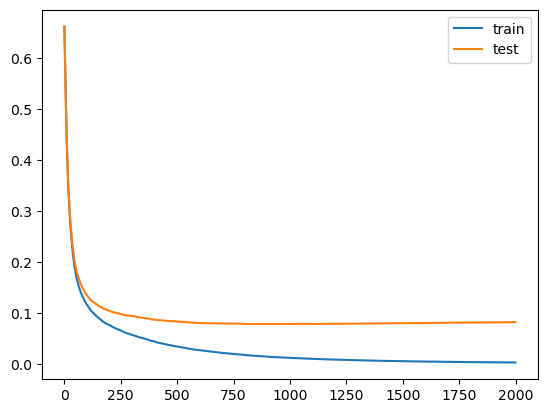

In [94]:
model = XGBClassifier(n_estimators=2000, eta=0.05 ,colsample_bytree = 0.9 ,gamma = 0 ,max_depth =5 ,
                      min_child_weight =1 ,subsample =0.8)
# define the datasets to evaluate each iteration
evalset = [(x_train, y_train), (x_test,y_test)]
# fit the model
model.fit(x_train, y_train, eval_metric='logloss', eval_set=evalset)
# evaluate performance
y_pred_te = model.predict(x_test)
score = accuracy_score(y_test, y_pred_te)
print('Accuracy: %.3f' % score)
# retrieve performance metrics
results = model.evals_result()
# plot learning curves
plt.plot(results['validation_0']['logloss'], label='train')
plt.plot(results['validation_1']['logloss'], label='test')
# show the legend
plt.legend()
# show the plot
plt.show()

    ### Accuracy: 0.970

In [96]:
# trying with  n_estimators=20000

[0]	validation_0-logloss:0.66127	validation_1-logloss:0.66183
[1]	validation_0-logloss:0.63640	validation_1-logloss:0.63769
[2]	validation_0-logloss:0.60904	validation_1-logloss:0.61078
[3]	validation_0-logloss:0.58826	validation_1-logloss:0.59037
[4]	validation_0-logloss:0.56312	validation_1-logloss:0.56574
[5]	validation_0-logloss:0.54022	validation_1-logloss:0.54310
[6]	validation_0-logloss:0.52322	validation_1-logloss:0.52663
[7]	validation_0-logloss:0.50269	validation_1-logloss:0.50649
[8]	validation_0-logloss:0.48400	validation_1-logloss:0.48819
[9]	validation_0-logloss:0.46367	validation_1-logloss:0.46803
[10]	validation_0-logloss:0.44426	validation_1-logloss:0.44898
[11]	validation_0-logloss:0.42844	validation_1-logloss:0.43360
[12]	validation_0-logloss:0.41260	validation_1-logloss:0.41806
[13]	validation_0-logloss:0.39682	validation_1-logloss:0.40259
[14]	validation_0-logloss:0.38710	validation_1-logloss:0.39325
[15]	validation_0-logloss:0.37328	validation_1-logloss:0.37984
[1

[130]	validation_0-logloss:0.10014	validation_1-logloss:0.12206
[131]	validation_0-logloss:0.09940	validation_1-logloss:0.12153
[132]	validation_0-logloss:0.09904	validation_1-logloss:0.12122
[133]	validation_0-logloss:0.09850	validation_1-logloss:0.12092
[134]	validation_0-logloss:0.09814	validation_1-logloss:0.12060
[135]	validation_0-logloss:0.09768	validation_1-logloss:0.12023
[136]	validation_0-logloss:0.09724	validation_1-logloss:0.11988
[137]	validation_0-logloss:0.09675	validation_1-logloss:0.11954
[138]	validation_0-logloss:0.09647	validation_1-logloss:0.11929
[139]	validation_0-logloss:0.09626	validation_1-logloss:0.11909
[140]	validation_0-logloss:0.09582	validation_1-logloss:0.11865
[141]	validation_0-logloss:0.09478	validation_1-logloss:0.11782
[142]	validation_0-logloss:0.09434	validation_1-logloss:0.11746
[143]	validation_0-logloss:0.09409	validation_1-logloss:0.11720
[144]	validation_0-logloss:0.09389	validation_1-logloss:0.11701
[145]	validation_0-logloss:0.09349	valid

[259]	validation_0-logloss:0.06450	validation_1-logloss:0.09767
[260]	validation_0-logloss:0.06434	validation_1-logloss:0.09760
[261]	validation_0-logloss:0.06407	validation_1-logloss:0.09753
[262]	validation_0-logloss:0.06384	validation_1-logloss:0.09749
[263]	validation_0-logloss:0.06348	validation_1-logloss:0.09719
[264]	validation_0-logloss:0.06325	validation_1-logloss:0.09700
[265]	validation_0-logloss:0.06296	validation_1-logloss:0.09689
[266]	validation_0-logloss:0.06282	validation_1-logloss:0.09685
[267]	validation_0-logloss:0.06277	validation_1-logloss:0.09682
[268]	validation_0-logloss:0.06266	validation_1-logloss:0.09679
[269]	validation_0-logloss:0.06245	validation_1-logloss:0.09664
[270]	validation_0-logloss:0.06232	validation_1-logloss:0.09656
[271]	validation_0-logloss:0.06222	validation_1-logloss:0.09646
[272]	validation_0-logloss:0.06186	validation_1-logloss:0.09631
[273]	validation_0-logloss:0.06172	validation_1-logloss:0.09620
[274]	validation_0-logloss:0.06160	valid

[388]	validation_0-logloss:0.04587	validation_1-logloss:0.08818
[389]	validation_0-logloss:0.04575	validation_1-logloss:0.08816
[390]	validation_0-logloss:0.04565	validation_1-logloss:0.08813
[391]	validation_0-logloss:0.04559	validation_1-logloss:0.08816
[392]	validation_0-logloss:0.04551	validation_1-logloss:0.08815
[393]	validation_0-logloss:0.04547	validation_1-logloss:0.08812
[394]	validation_0-logloss:0.04534	validation_1-logloss:0.08811
[395]	validation_0-logloss:0.04527	validation_1-logloss:0.08810
[396]	validation_0-logloss:0.04512	validation_1-logloss:0.08802
[397]	validation_0-logloss:0.04499	validation_1-logloss:0.08783
[398]	validation_0-logloss:0.04488	validation_1-logloss:0.08777
[399]	validation_0-logloss:0.04475	validation_1-logloss:0.08765
[400]	validation_0-logloss:0.04467	validation_1-logloss:0.08766
[401]	validation_0-logloss:0.04458	validation_1-logloss:0.08764
[402]	validation_0-logloss:0.04451	validation_1-logloss:0.08764
[403]	validation_0-logloss:0.04441	valid

[645]	validation_0-logloss:0.02534	validation_1-logloss:0.08064
[646]	validation_0-logloss:0.02528	validation_1-logloss:0.08058
[647]	validation_0-logloss:0.02522	validation_1-logloss:0.08057
[648]	validation_0-logloss:0.02518	validation_1-logloss:0.08055
[649]	validation_0-logloss:0.02513	validation_1-logloss:0.08052
[650]	validation_0-logloss:0.02505	validation_1-logloss:0.08043
[651]	validation_0-logloss:0.02499	validation_1-logloss:0.08038
[652]	validation_0-logloss:0.02493	validation_1-logloss:0.08031
[653]	validation_0-logloss:0.02487	validation_1-logloss:0.08031
[654]	validation_0-logloss:0.02482	validation_1-logloss:0.08030
[655]	validation_0-logloss:0.02478	validation_1-logloss:0.08038
[656]	validation_0-logloss:0.02469	validation_1-logloss:0.08039
[657]	validation_0-logloss:0.02460	validation_1-logloss:0.08040
[658]	validation_0-logloss:0.02458	validation_1-logloss:0.08043
[659]	validation_0-logloss:0.02454	validation_1-logloss:0.08045
[660]	validation_0-logloss:0.02451	valid

[774]	validation_0-logloss:0.01949	validation_1-logloss:0.07990
[775]	validation_0-logloss:0.01946	validation_1-logloss:0.07989
[776]	validation_0-logloss:0.01944	validation_1-logloss:0.07987
[777]	validation_0-logloss:0.01935	validation_1-logloss:0.07982
[778]	validation_0-logloss:0.01922	validation_1-logloss:0.07965
[779]	validation_0-logloss:0.01921	validation_1-logloss:0.07963
[780]	validation_0-logloss:0.01919	validation_1-logloss:0.07958
[781]	validation_0-logloss:0.01917	validation_1-logloss:0.07961
[782]	validation_0-logloss:0.01915	validation_1-logloss:0.07956
[783]	validation_0-logloss:0.01911	validation_1-logloss:0.07952
[784]	validation_0-logloss:0.01908	validation_1-logloss:0.07956
[785]	validation_0-logloss:0.01905	validation_1-logloss:0.07960
[786]	validation_0-logloss:0.01902	validation_1-logloss:0.07957
[787]	validation_0-logloss:0.01897	validation_1-logloss:0.07956
[788]	validation_0-logloss:0.01891	validation_1-logloss:0.07948
[789]	validation_0-logloss:0.01887	valid

[903]	validation_0-logloss:0.01504	validation_1-logloss:0.07910
[904]	validation_0-logloss:0.01502	validation_1-logloss:0.07913
[905]	validation_0-logloss:0.01499	validation_1-logloss:0.07908
[906]	validation_0-logloss:0.01498	validation_1-logloss:0.07909
[907]	validation_0-logloss:0.01494	validation_1-logloss:0.07909
[908]	validation_0-logloss:0.01491	validation_1-logloss:0.07908
[909]	validation_0-logloss:0.01488	validation_1-logloss:0.07913
[910]	validation_0-logloss:0.01485	validation_1-logloss:0.07913
[911]	validation_0-logloss:0.01483	validation_1-logloss:0.07916
[912]	validation_0-logloss:0.01479	validation_1-logloss:0.07916
[913]	validation_0-logloss:0.01474	validation_1-logloss:0.07911
[914]	validation_0-logloss:0.01472	validation_1-logloss:0.07908
[915]	validation_0-logloss:0.01467	validation_1-logloss:0.07902
[916]	validation_0-logloss:0.01465	validation_1-logloss:0.07901
[917]	validation_0-logloss:0.01462	validation_1-logloss:0.07911
[918]	validation_0-logloss:0.01461	valid

[1157]	validation_0-logloss:0.00998	validation_1-logloss:0.07945
[1158]	validation_0-logloss:0.00996	validation_1-logloss:0.07947
[1159]	validation_0-logloss:0.00994	validation_1-logloss:0.07944
[1160]	validation_0-logloss:0.00994	validation_1-logloss:0.07942
[1161]	validation_0-logloss:0.00992	validation_1-logloss:0.07945
[1162]	validation_0-logloss:0.00991	validation_1-logloss:0.07946
[1163]	validation_0-logloss:0.00989	validation_1-logloss:0.07945
[1164]	validation_0-logloss:0.00986	validation_1-logloss:0.07943
[1165]	validation_0-logloss:0.00984	validation_1-logloss:0.07944
[1166]	validation_0-logloss:0.00983	validation_1-logloss:0.07948
[1167]	validation_0-logloss:0.00981	validation_1-logloss:0.07947
[1168]	validation_0-logloss:0.00980	validation_1-logloss:0.07943
[1169]	validation_0-logloss:0.00978	validation_1-logloss:0.07944
[1170]	validation_0-logloss:0.00977	validation_1-logloss:0.07946
[1171]	validation_0-logloss:0.00975	validation_1-logloss:0.07947
[1172]	validation_0-loglo

[1284]	validation_0-logloss:0.00834	validation_1-logloss:0.07993
[1285]	validation_0-logloss:0.00833	validation_1-logloss:0.07997
[1286]	validation_0-logloss:0.00831	validation_1-logloss:0.07992
[1287]	validation_0-logloss:0.00830	validation_1-logloss:0.07993
[1288]	validation_0-logloss:0.00829	validation_1-logloss:0.07994
[1289]	validation_0-logloss:0.00829	validation_1-logloss:0.07992
[1290]	validation_0-logloss:0.00827	validation_1-logloss:0.07990
[1291]	validation_0-logloss:0.00826	validation_1-logloss:0.07988
[1292]	validation_0-logloss:0.00824	validation_1-logloss:0.07990
[1293]	validation_0-logloss:0.00823	validation_1-logloss:0.07986
[1294]	validation_0-logloss:0.00822	validation_1-logloss:0.07990
[1295]	validation_0-logloss:0.00821	validation_1-logloss:0.07990
[1296]	validation_0-logloss:0.00820	validation_1-logloss:0.07988
[1297]	validation_0-logloss:0.00819	validation_1-logloss:0.07988
[1298]	validation_0-logloss:0.00818	validation_1-logloss:0.07988
[1299]	validation_0-loglo

[1411]	validation_0-logloss:0.00697	validation_1-logloss:0.08051
[1412]	validation_0-logloss:0.00696	validation_1-logloss:0.08054
[1413]	validation_0-logloss:0.00695	validation_1-logloss:0.08046
[1414]	validation_0-logloss:0.00694	validation_1-logloss:0.08048
[1415]	validation_0-logloss:0.00693	validation_1-logloss:0.08051
[1416]	validation_0-logloss:0.00693	validation_1-logloss:0.08048
[1417]	validation_0-logloss:0.00692	validation_1-logloss:0.08046
[1418]	validation_0-logloss:0.00692	validation_1-logloss:0.08043
[1419]	validation_0-logloss:0.00690	validation_1-logloss:0.08038
[1420]	validation_0-logloss:0.00690	validation_1-logloss:0.08038
[1421]	validation_0-logloss:0.00689	validation_1-logloss:0.08039
[1422]	validation_0-logloss:0.00689	validation_1-logloss:0.08043
[1423]	validation_0-logloss:0.00687	validation_1-logloss:0.08047
[1424]	validation_0-logloss:0.00687	validation_1-logloss:0.08049
[1425]	validation_0-logloss:0.00687	validation_1-logloss:0.08049
[1426]	validation_0-loglo

[1538]	validation_0-logloss:0.00598	validation_1-logloss:0.08065
[1539]	validation_0-logloss:0.00597	validation_1-logloss:0.08065
[1540]	validation_0-logloss:0.00596	validation_1-logloss:0.08067
[1541]	validation_0-logloss:0.00595	validation_1-logloss:0.08066
[1542]	validation_0-logloss:0.00595	validation_1-logloss:0.08067
[1543]	validation_0-logloss:0.00595	validation_1-logloss:0.08070
[1544]	validation_0-logloss:0.00595	validation_1-logloss:0.08071
[1545]	validation_0-logloss:0.00594	validation_1-logloss:0.08077
[1546]	validation_0-logloss:0.00593	validation_1-logloss:0.08076
[1547]	validation_0-logloss:0.00593	validation_1-logloss:0.08077
[1548]	validation_0-logloss:0.00592	validation_1-logloss:0.08077
[1549]	validation_0-logloss:0.00591	validation_1-logloss:0.08076
[1550]	validation_0-logloss:0.00590	validation_1-logloss:0.08081
[1551]	validation_0-logloss:0.00589	validation_1-logloss:0.08079
[1552]	validation_0-logloss:0.00588	validation_1-logloss:0.08080
[1553]	validation_0-loglo

[1665]	validation_0-logloss:0.00519	validation_1-logloss:0.08133
[1666]	validation_0-logloss:0.00518	validation_1-logloss:0.08130
[1667]	validation_0-logloss:0.00518	validation_1-logloss:0.08130
[1668]	validation_0-logloss:0.00518	validation_1-logloss:0.08128
[1669]	validation_0-logloss:0.00517	validation_1-logloss:0.08129
[1670]	validation_0-logloss:0.00516	validation_1-logloss:0.08129
[1671]	validation_0-logloss:0.00516	validation_1-logloss:0.08133
[1672]	validation_0-logloss:0.00515	validation_1-logloss:0.08134
[1673]	validation_0-logloss:0.00514	validation_1-logloss:0.08134
[1674]	validation_0-logloss:0.00514	validation_1-logloss:0.08133
[1675]	validation_0-logloss:0.00513	validation_1-logloss:0.08132
[1676]	validation_0-logloss:0.00513	validation_1-logloss:0.08131
[1677]	validation_0-logloss:0.00512	validation_1-logloss:0.08128
[1678]	validation_0-logloss:0.00512	validation_1-logloss:0.08130
[1679]	validation_0-logloss:0.00512	validation_1-logloss:0.08133
[1680]	validation_0-loglo

[1792]	validation_0-logloss:0.00454	validation_1-logloss:0.08189
[1793]	validation_0-logloss:0.00454	validation_1-logloss:0.08187
[1794]	validation_0-logloss:0.00454	validation_1-logloss:0.08189
[1795]	validation_0-logloss:0.00453	validation_1-logloss:0.08194
[1796]	validation_0-logloss:0.00453	validation_1-logloss:0.08189
[1797]	validation_0-logloss:0.00453	validation_1-logloss:0.08188
[1798]	validation_0-logloss:0.00452	validation_1-logloss:0.08185
[1799]	validation_0-logloss:0.00451	validation_1-logloss:0.08186
[1800]	validation_0-logloss:0.00451	validation_1-logloss:0.08186
[1801]	validation_0-logloss:0.00450	validation_1-logloss:0.08190
[1802]	validation_0-logloss:0.00450	validation_1-logloss:0.08185
[1803]	validation_0-logloss:0.00449	validation_1-logloss:0.08185
[1804]	validation_0-logloss:0.00449	validation_1-logloss:0.08188
[1805]	validation_0-logloss:0.00449	validation_1-logloss:0.08188
[1806]	validation_0-logloss:0.00448	validation_1-logloss:0.08189
[1807]	validation_0-loglo

[1919]	validation_0-logloss:0.00403	validation_1-logloss:0.08254
[1920]	validation_0-logloss:0.00403	validation_1-logloss:0.08252
[1921]	validation_0-logloss:0.00403	validation_1-logloss:0.08253
[1922]	validation_0-logloss:0.00402	validation_1-logloss:0.08253
[1923]	validation_0-logloss:0.00402	validation_1-logloss:0.08256
[1924]	validation_0-logloss:0.00402	validation_1-logloss:0.08252
[1925]	validation_0-logloss:0.00401	validation_1-logloss:0.08254
[1926]	validation_0-logloss:0.00401	validation_1-logloss:0.08258
[1927]	validation_0-logloss:0.00401	validation_1-logloss:0.08258
[1928]	validation_0-logloss:0.00400	validation_1-logloss:0.08260
[1929]	validation_0-logloss:0.00399	validation_1-logloss:0.08258
[1930]	validation_0-logloss:0.00399	validation_1-logloss:0.08257
[1931]	validation_0-logloss:0.00398	validation_1-logloss:0.08257
[1932]	validation_0-logloss:0.00398	validation_1-logloss:0.08257
[1933]	validation_0-logloss:0.00398	validation_1-logloss:0.08259
[1934]	validation_0-loglo

[2046]	validation_0-logloss:0.00362	validation_1-logloss:0.08309
[2047]	validation_0-logloss:0.00362	validation_1-logloss:0.08309
[2048]	validation_0-logloss:0.00361	validation_1-logloss:0.08311
[2049]	validation_0-logloss:0.00361	validation_1-logloss:0.08311
[2050]	validation_0-logloss:0.00361	validation_1-logloss:0.08312
[2051]	validation_0-logloss:0.00360	validation_1-logloss:0.08310
[2052]	validation_0-logloss:0.00360	validation_1-logloss:0.08311
[2053]	validation_0-logloss:0.00360	validation_1-logloss:0.08310
[2054]	validation_0-logloss:0.00360	validation_1-logloss:0.08313
[2055]	validation_0-logloss:0.00360	validation_1-logloss:0.08316
[2056]	validation_0-logloss:0.00359	validation_1-logloss:0.08319
[2057]	validation_0-logloss:0.00359	validation_1-logloss:0.08315
[2058]	validation_0-logloss:0.00359	validation_1-logloss:0.08314
[2059]	validation_0-logloss:0.00359	validation_1-logloss:0.08313
[2060]	validation_0-logloss:0.00358	validation_1-logloss:0.08316
[2061]	validation_0-loglo

[2173]	validation_0-logloss:0.00327	validation_1-logloss:0.08363
[2174]	validation_0-logloss:0.00327	validation_1-logloss:0.08366
[2175]	validation_0-logloss:0.00326	validation_1-logloss:0.08371
[2176]	validation_0-logloss:0.00326	validation_1-logloss:0.08374
[2177]	validation_0-logloss:0.00326	validation_1-logloss:0.08377
[2178]	validation_0-logloss:0.00325	validation_1-logloss:0.08376
[2179]	validation_0-logloss:0.00325	validation_1-logloss:0.08374
[2180]	validation_0-logloss:0.00324	validation_1-logloss:0.08371
[2181]	validation_0-logloss:0.00324	validation_1-logloss:0.08371
[2182]	validation_0-logloss:0.00324	validation_1-logloss:0.08371
[2183]	validation_0-logloss:0.00324	validation_1-logloss:0.08370
[2184]	validation_0-logloss:0.00324	validation_1-logloss:0.08368
[2185]	validation_0-logloss:0.00323	validation_1-logloss:0.08370
[2186]	validation_0-logloss:0.00323	validation_1-logloss:0.08370
[2187]	validation_0-logloss:0.00323	validation_1-logloss:0.08367
[2188]	validation_0-loglo

[2300]	validation_0-logloss:0.00297	validation_1-logloss:0.08418
[2301]	validation_0-logloss:0.00297	validation_1-logloss:0.08419
[2302]	validation_0-logloss:0.00297	validation_1-logloss:0.08418
[2303]	validation_0-logloss:0.00296	validation_1-logloss:0.08417
[2304]	validation_0-logloss:0.00296	validation_1-logloss:0.08424
[2305]	validation_0-logloss:0.00296	validation_1-logloss:0.08421
[2306]	validation_0-logloss:0.00296	validation_1-logloss:0.08419
[2307]	validation_0-logloss:0.00295	validation_1-logloss:0.08420
[2308]	validation_0-logloss:0.00295	validation_1-logloss:0.08420
[2309]	validation_0-logloss:0.00295	validation_1-logloss:0.08421
[2310]	validation_0-logloss:0.00295	validation_1-logloss:0.08422
[2311]	validation_0-logloss:0.00294	validation_1-logloss:0.08420
[2312]	validation_0-logloss:0.00294	validation_1-logloss:0.08421
[2313]	validation_0-logloss:0.00294	validation_1-logloss:0.08417
[2314]	validation_0-logloss:0.00294	validation_1-logloss:0.08418
[2315]	validation_0-loglo

[2553]	validation_0-logloss:0.00251	validation_1-logloss:0.08561
[2554]	validation_0-logloss:0.00251	validation_1-logloss:0.08558
[2555]	validation_0-logloss:0.00251	validation_1-logloss:0.08557
[2556]	validation_0-logloss:0.00250	validation_1-logloss:0.08556
[2557]	validation_0-logloss:0.00250	validation_1-logloss:0.08557
[2558]	validation_0-logloss:0.00250	validation_1-logloss:0.08557
[2559]	validation_0-logloss:0.00250	validation_1-logloss:0.08559
[2560]	validation_0-logloss:0.00249	validation_1-logloss:0.08557
[2561]	validation_0-logloss:0.00249	validation_1-logloss:0.08557
[2562]	validation_0-logloss:0.00249	validation_1-logloss:0.08557
[2563]	validation_0-logloss:0.00249	validation_1-logloss:0.08557
[2564]	validation_0-logloss:0.00249	validation_1-logloss:0.08556
[2565]	validation_0-logloss:0.00249	validation_1-logloss:0.08555
[2566]	validation_0-logloss:0.00249	validation_1-logloss:0.08556
[2567]	validation_0-logloss:0.00249	validation_1-logloss:0.08558
[2568]	validation_0-loglo

[2680]	validation_0-logloss:0.00232	validation_1-logloss:0.08598
[2681]	validation_0-logloss:0.00232	validation_1-logloss:0.08600
[2682]	validation_0-logloss:0.00232	validation_1-logloss:0.08601
[2683]	validation_0-logloss:0.00232	validation_1-logloss:0.08600
[2684]	validation_0-logloss:0.00232	validation_1-logloss:0.08602
[2685]	validation_0-logloss:0.00232	validation_1-logloss:0.08602
[2686]	validation_0-logloss:0.00231	validation_1-logloss:0.08599
[2687]	validation_0-logloss:0.00231	validation_1-logloss:0.08603
[2688]	validation_0-logloss:0.00231	validation_1-logloss:0.08604
[2689]	validation_0-logloss:0.00231	validation_1-logloss:0.08604
[2690]	validation_0-logloss:0.00231	validation_1-logloss:0.08602
[2691]	validation_0-logloss:0.00231	validation_1-logloss:0.08607
[2692]	validation_0-logloss:0.00231	validation_1-logloss:0.08604
[2693]	validation_0-logloss:0.00231	validation_1-logloss:0.08606
[2694]	validation_0-logloss:0.00230	validation_1-logloss:0.08606
[2695]	validation_0-loglo

[2807]	validation_0-logloss:0.00216	validation_1-logloss:0.08648
[2808]	validation_0-logloss:0.00216	validation_1-logloss:0.08648
[2809]	validation_0-logloss:0.00216	validation_1-logloss:0.08649
[2810]	validation_0-logloss:0.00216	validation_1-logloss:0.08650
[2811]	validation_0-logloss:0.00216	validation_1-logloss:0.08651
[2812]	validation_0-logloss:0.00216	validation_1-logloss:0.08653
[2813]	validation_0-logloss:0.00215	validation_1-logloss:0.08653
[2814]	validation_0-logloss:0.00215	validation_1-logloss:0.08653
[2815]	validation_0-logloss:0.00215	validation_1-logloss:0.08653
[2816]	validation_0-logloss:0.00215	validation_1-logloss:0.08653
[2817]	validation_0-logloss:0.00215	validation_1-logloss:0.08654
[2818]	validation_0-logloss:0.00215	validation_1-logloss:0.08651
[2819]	validation_0-logloss:0.00215	validation_1-logloss:0.08651
[2820]	validation_0-logloss:0.00215	validation_1-logloss:0.08652
[2821]	validation_0-logloss:0.00215	validation_1-logloss:0.08653
[2822]	validation_0-loglo

[2934]	validation_0-logloss:0.00202	validation_1-logloss:0.08708
[2935]	validation_0-logloss:0.00202	validation_1-logloss:0.08709
[2936]	validation_0-logloss:0.00201	validation_1-logloss:0.08709
[2937]	validation_0-logloss:0.00201	validation_1-logloss:0.08709
[2938]	validation_0-logloss:0.00201	validation_1-logloss:0.08710
[2939]	validation_0-logloss:0.00201	validation_1-logloss:0.08710
[2940]	validation_0-logloss:0.00201	validation_1-logloss:0.08706
[2941]	validation_0-logloss:0.00201	validation_1-logloss:0.08705
[2942]	validation_0-logloss:0.00201	validation_1-logloss:0.08704
[2943]	validation_0-logloss:0.00201	validation_1-logloss:0.08705
[2944]	validation_0-logloss:0.00201	validation_1-logloss:0.08703
[2945]	validation_0-logloss:0.00201	validation_1-logloss:0.08703
[2946]	validation_0-logloss:0.00200	validation_1-logloss:0.08706
[2947]	validation_0-logloss:0.00200	validation_1-logloss:0.08710
[2948]	validation_0-logloss:0.00200	validation_1-logloss:0.08713
[2949]	validation_0-loglo

[3187]	validation_0-logloss:0.00179	validation_1-logloss:0.08776
[3188]	validation_0-logloss:0.00179	validation_1-logloss:0.08773
[3189]	validation_0-logloss:0.00179	validation_1-logloss:0.08774
[3190]	validation_0-logloss:0.00179	validation_1-logloss:0.08776
[3191]	validation_0-logloss:0.00179	validation_1-logloss:0.08779
[3192]	validation_0-logloss:0.00179	validation_1-logloss:0.08781
[3193]	validation_0-logloss:0.00179	validation_1-logloss:0.08782
[3194]	validation_0-logloss:0.00179	validation_1-logloss:0.08783
[3195]	validation_0-logloss:0.00179	validation_1-logloss:0.08783
[3196]	validation_0-logloss:0.00179	validation_1-logloss:0.08784
[3197]	validation_0-logloss:0.00178	validation_1-logloss:0.08784
[3198]	validation_0-logloss:0.00178	validation_1-logloss:0.08785
[3199]	validation_0-logloss:0.00178	validation_1-logloss:0.08784
[3200]	validation_0-logloss:0.00178	validation_1-logloss:0.08783
[3201]	validation_0-logloss:0.00178	validation_1-logloss:0.08782
[3202]	validation_0-loglo

[3314]	validation_0-logloss:0.00170	validation_1-logloss:0.08822
[3315]	validation_0-logloss:0.00170	validation_1-logloss:0.08821
[3316]	validation_0-logloss:0.00170	validation_1-logloss:0.08821
[3317]	validation_0-logloss:0.00170	validation_1-logloss:0.08821
[3318]	validation_0-logloss:0.00170	validation_1-logloss:0.08821
[3319]	validation_0-logloss:0.00170	validation_1-logloss:0.08823
[3320]	validation_0-logloss:0.00170	validation_1-logloss:0.08823
[3321]	validation_0-logloss:0.00170	validation_1-logloss:0.08821
[3322]	validation_0-logloss:0.00169	validation_1-logloss:0.08823
[3323]	validation_0-logloss:0.00169	validation_1-logloss:0.08821
[3324]	validation_0-logloss:0.00169	validation_1-logloss:0.08820
[3325]	validation_0-logloss:0.00169	validation_1-logloss:0.08819
[3326]	validation_0-logloss:0.00169	validation_1-logloss:0.08819
[3327]	validation_0-logloss:0.00169	validation_1-logloss:0.08821
[3328]	validation_0-logloss:0.00169	validation_1-logloss:0.08823
[3329]	validation_0-loglo

[3441]	validation_0-logloss:0.00162	validation_1-logloss:0.08865
[3442]	validation_0-logloss:0.00162	validation_1-logloss:0.08867
[3443]	validation_0-logloss:0.00162	validation_1-logloss:0.08867
[3444]	validation_0-logloss:0.00161	validation_1-logloss:0.08867
[3445]	validation_0-logloss:0.00161	validation_1-logloss:0.08869
[3446]	validation_0-logloss:0.00161	validation_1-logloss:0.08868
[3447]	validation_0-logloss:0.00161	validation_1-logloss:0.08866
[3448]	validation_0-logloss:0.00161	validation_1-logloss:0.08867
[3449]	validation_0-logloss:0.00161	validation_1-logloss:0.08870
[3450]	validation_0-logloss:0.00161	validation_1-logloss:0.08872
[3451]	validation_0-logloss:0.00161	validation_1-logloss:0.08873
[3452]	validation_0-logloss:0.00161	validation_1-logloss:0.08872
[3453]	validation_0-logloss:0.00161	validation_1-logloss:0.08870
[3454]	validation_0-logloss:0.00161	validation_1-logloss:0.08868
[3455]	validation_0-logloss:0.00161	validation_1-logloss:0.08870
[3456]	validation_0-loglo

[3568]	validation_0-logloss:0.00155	validation_1-logloss:0.08899
[3569]	validation_0-logloss:0.00155	validation_1-logloss:0.08897
[3570]	validation_0-logloss:0.00155	validation_1-logloss:0.08897
[3571]	validation_0-logloss:0.00154	validation_1-logloss:0.08900
[3572]	validation_0-logloss:0.00154	validation_1-logloss:0.08901
[3573]	validation_0-logloss:0.00154	validation_1-logloss:0.08900
[3574]	validation_0-logloss:0.00154	validation_1-logloss:0.08900
[3575]	validation_0-logloss:0.00154	validation_1-logloss:0.08903
[3576]	validation_0-logloss:0.00154	validation_1-logloss:0.08903
[3577]	validation_0-logloss:0.00154	validation_1-logloss:0.08906
[3578]	validation_0-logloss:0.00154	validation_1-logloss:0.08906
[3579]	validation_0-logloss:0.00154	validation_1-logloss:0.08906
[3580]	validation_0-logloss:0.00154	validation_1-logloss:0.08905
[3581]	validation_0-logloss:0.00154	validation_1-logloss:0.08903
[3582]	validation_0-logloss:0.00154	validation_1-logloss:0.08902
[3583]	validation_0-loglo

[3695]	validation_0-logloss:0.00148	validation_1-logloss:0.08950
[3696]	validation_0-logloss:0.00148	validation_1-logloss:0.08951
[3697]	validation_0-logloss:0.00148	validation_1-logloss:0.08952
[3698]	validation_0-logloss:0.00148	validation_1-logloss:0.08950
[3699]	validation_0-logloss:0.00148	validation_1-logloss:0.08955
[3700]	validation_0-logloss:0.00148	validation_1-logloss:0.08956
[3701]	validation_0-logloss:0.00148	validation_1-logloss:0.08955
[3702]	validation_0-logloss:0.00148	validation_1-logloss:0.08956
[3703]	validation_0-logloss:0.00148	validation_1-logloss:0.08955
[3704]	validation_0-logloss:0.00148	validation_1-logloss:0.08954
[3705]	validation_0-logloss:0.00148	validation_1-logloss:0.08955
[3706]	validation_0-logloss:0.00147	validation_1-logloss:0.08954
[3707]	validation_0-logloss:0.00147	validation_1-logloss:0.08955
[3708]	validation_0-logloss:0.00147	validation_1-logloss:0.08954
[3709]	validation_0-logloss:0.00147	validation_1-logloss:0.08956
[3710]	validation_0-loglo

[3948]	validation_0-logloss:0.00137	validation_1-logloss:0.09018
[3949]	validation_0-logloss:0.00137	validation_1-logloss:0.09019
[3950]	validation_0-logloss:0.00137	validation_1-logloss:0.09020
[3951]	validation_0-logloss:0.00137	validation_1-logloss:0.09022
[3952]	validation_0-logloss:0.00137	validation_1-logloss:0.09022
[3953]	validation_0-logloss:0.00137	validation_1-logloss:0.09022
[3954]	validation_0-logloss:0.00137	validation_1-logloss:0.09022
[3955]	validation_0-logloss:0.00136	validation_1-logloss:0.09023
[3956]	validation_0-logloss:0.00136	validation_1-logloss:0.09024
[3957]	validation_0-logloss:0.00136	validation_1-logloss:0.09025
[3958]	validation_0-logloss:0.00136	validation_1-logloss:0.09024
[3959]	validation_0-logloss:0.00136	validation_1-logloss:0.09024
[3960]	validation_0-logloss:0.00136	validation_1-logloss:0.09025
[3961]	validation_0-logloss:0.00136	validation_1-logloss:0.09026
[3962]	validation_0-logloss:0.00136	validation_1-logloss:0.09026
[3963]	validation_0-loglo

[4075]	validation_0-logloss:0.00132	validation_1-logloss:0.09051
[4076]	validation_0-logloss:0.00132	validation_1-logloss:0.09050
[4077]	validation_0-logloss:0.00132	validation_1-logloss:0.09050
[4078]	validation_0-logloss:0.00132	validation_1-logloss:0.09049
[4079]	validation_0-logloss:0.00132	validation_1-logloss:0.09049
[4080]	validation_0-logloss:0.00132	validation_1-logloss:0.09050
[4081]	validation_0-logloss:0.00132	validation_1-logloss:0.09050
[4082]	validation_0-logloss:0.00132	validation_1-logloss:0.09050
[4083]	validation_0-logloss:0.00132	validation_1-logloss:0.09049
[4084]	validation_0-logloss:0.00132	validation_1-logloss:0.09050
[4085]	validation_0-logloss:0.00132	validation_1-logloss:0.09049
[4086]	validation_0-logloss:0.00132	validation_1-logloss:0.09052
[4087]	validation_0-logloss:0.00132	validation_1-logloss:0.09053
[4088]	validation_0-logloss:0.00132	validation_1-logloss:0.09053
[4089]	validation_0-logloss:0.00132	validation_1-logloss:0.09051
[4090]	validation_0-loglo

[4202]	validation_0-logloss:0.00128	validation_1-logloss:0.09071
[4203]	validation_0-logloss:0.00128	validation_1-logloss:0.09071
[4204]	validation_0-logloss:0.00127	validation_1-logloss:0.09071
[4205]	validation_0-logloss:0.00127	validation_1-logloss:0.09072
[4206]	validation_0-logloss:0.00127	validation_1-logloss:0.09072
[4207]	validation_0-logloss:0.00127	validation_1-logloss:0.09072
[4208]	validation_0-logloss:0.00127	validation_1-logloss:0.09075
[4209]	validation_0-logloss:0.00127	validation_1-logloss:0.09075
[4210]	validation_0-logloss:0.00127	validation_1-logloss:0.09074
[4211]	validation_0-logloss:0.00127	validation_1-logloss:0.09072
[4212]	validation_0-logloss:0.00127	validation_1-logloss:0.09074
[4213]	validation_0-logloss:0.00127	validation_1-logloss:0.09075
[4214]	validation_0-logloss:0.00127	validation_1-logloss:0.09074
[4215]	validation_0-logloss:0.00127	validation_1-logloss:0.09073
[4216]	validation_0-logloss:0.00127	validation_1-logloss:0.09075
[4217]	validation_0-loglo

[4329]	validation_0-logloss:0.00123	validation_1-logloss:0.09112
[4330]	validation_0-logloss:0.00123	validation_1-logloss:0.09111
[4331]	validation_0-logloss:0.00123	validation_1-logloss:0.09110
[4332]	validation_0-logloss:0.00123	validation_1-logloss:0.09110
[4333]	validation_0-logloss:0.00123	validation_1-logloss:0.09111
[4334]	validation_0-logloss:0.00123	validation_1-logloss:0.09111
[4335]	validation_0-logloss:0.00123	validation_1-logloss:0.09112
[4336]	validation_0-logloss:0.00123	validation_1-logloss:0.09112
[4337]	validation_0-logloss:0.00123	validation_1-logloss:0.09111
[4338]	validation_0-logloss:0.00123	validation_1-logloss:0.09112
[4339]	validation_0-logloss:0.00123	validation_1-logloss:0.09114
[4340]	validation_0-logloss:0.00123	validation_1-logloss:0.09115
[4341]	validation_0-logloss:0.00123	validation_1-logloss:0.09115
[4342]	validation_0-logloss:0.00123	validation_1-logloss:0.09116
[4343]	validation_0-logloss:0.00123	validation_1-logloss:0.09117
[4344]	validation_0-loglo

[4456]	validation_0-logloss:0.00120	validation_1-logloss:0.09148
[4457]	validation_0-logloss:0.00120	validation_1-logloss:0.09148
[4458]	validation_0-logloss:0.00120	validation_1-logloss:0.09149
[4459]	validation_0-logloss:0.00120	validation_1-logloss:0.09151
[4460]	validation_0-logloss:0.00120	validation_1-logloss:0.09153
[4461]	validation_0-logloss:0.00120	validation_1-logloss:0.09153
[4462]	validation_0-logloss:0.00119	validation_1-logloss:0.09156
[4463]	validation_0-logloss:0.00119	validation_1-logloss:0.09156
[4464]	validation_0-logloss:0.00119	validation_1-logloss:0.09156
[4465]	validation_0-logloss:0.00119	validation_1-logloss:0.09156
[4466]	validation_0-logloss:0.00119	validation_1-logloss:0.09158
[4467]	validation_0-logloss:0.00119	validation_1-logloss:0.09157
[4468]	validation_0-logloss:0.00119	validation_1-logloss:0.09156
[4469]	validation_0-logloss:0.00119	validation_1-logloss:0.09157
[4470]	validation_0-logloss:0.00119	validation_1-logloss:0.09157
[4471]	validation_0-loglo

[4583]	validation_0-logloss:0.00116	validation_1-logloss:0.09180
[4584]	validation_0-logloss:0.00116	validation_1-logloss:0.09179
[4585]	validation_0-logloss:0.00116	validation_1-logloss:0.09179
[4586]	validation_0-logloss:0.00116	validation_1-logloss:0.09178
[4587]	validation_0-logloss:0.00116	validation_1-logloss:0.09179
[4588]	validation_0-logloss:0.00116	validation_1-logloss:0.09177
[4589]	validation_0-logloss:0.00116	validation_1-logloss:0.09177
[4590]	validation_0-logloss:0.00116	validation_1-logloss:0.09179
[4591]	validation_0-logloss:0.00116	validation_1-logloss:0.09179
[4592]	validation_0-logloss:0.00116	validation_1-logloss:0.09179
[4593]	validation_0-logloss:0.00116	validation_1-logloss:0.09179
[4594]	validation_0-logloss:0.00116	validation_1-logloss:0.09178
[4595]	validation_0-logloss:0.00116	validation_1-logloss:0.09179
[4596]	validation_0-logloss:0.00116	validation_1-logloss:0.09180
[4597]	validation_0-logloss:0.00116	validation_1-logloss:0.09179
[4598]	validation_0-loglo

[4836]	validation_0-logloss:0.00110	validation_1-logloss:0.09241
[4837]	validation_0-logloss:0.00110	validation_1-logloss:0.09240
[4838]	validation_0-logloss:0.00110	validation_1-logloss:0.09240
[4839]	validation_0-logloss:0.00110	validation_1-logloss:0.09240
[4840]	validation_0-logloss:0.00110	validation_1-logloss:0.09240
[4841]	validation_0-logloss:0.00110	validation_1-logloss:0.09241
[4842]	validation_0-logloss:0.00110	validation_1-logloss:0.09241
[4843]	validation_0-logloss:0.00110	validation_1-logloss:0.09241
[4844]	validation_0-logloss:0.00110	validation_1-logloss:0.09244
[4845]	validation_0-logloss:0.00110	validation_1-logloss:0.09243
[4846]	validation_0-logloss:0.00110	validation_1-logloss:0.09243
[4847]	validation_0-logloss:0.00110	validation_1-logloss:0.09242
[4848]	validation_0-logloss:0.00110	validation_1-logloss:0.09240
[4849]	validation_0-logloss:0.00110	validation_1-logloss:0.09241
[4850]	validation_0-logloss:0.00110	validation_1-logloss:0.09240
[4851]	validation_0-loglo

[4963]	validation_0-logloss:0.00107	validation_1-logloss:0.09278
[4964]	validation_0-logloss:0.00107	validation_1-logloss:0.09276
[4965]	validation_0-logloss:0.00107	validation_1-logloss:0.09276
[4966]	validation_0-logloss:0.00107	validation_1-logloss:0.09277
[4967]	validation_0-logloss:0.00107	validation_1-logloss:0.09278
[4968]	validation_0-logloss:0.00107	validation_1-logloss:0.09277
[4969]	validation_0-logloss:0.00107	validation_1-logloss:0.09277
[4970]	validation_0-logloss:0.00107	validation_1-logloss:0.09278
[4971]	validation_0-logloss:0.00107	validation_1-logloss:0.09281
[4972]	validation_0-logloss:0.00107	validation_1-logloss:0.09281
[4973]	validation_0-logloss:0.00107	validation_1-logloss:0.09280
[4974]	validation_0-logloss:0.00107	validation_1-logloss:0.09280
[4975]	validation_0-logloss:0.00107	validation_1-logloss:0.09279
[4976]	validation_0-logloss:0.00107	validation_1-logloss:0.09279
[4977]	validation_0-logloss:0.00107	validation_1-logloss:0.09277
[4978]	validation_0-loglo

[5090]	validation_0-logloss:0.00105	validation_1-logloss:0.09293
[5091]	validation_0-logloss:0.00105	validation_1-logloss:0.09293
[5092]	validation_0-logloss:0.00105	validation_1-logloss:0.09293
[5093]	validation_0-logloss:0.00105	validation_1-logloss:0.09291
[5094]	validation_0-logloss:0.00104	validation_1-logloss:0.09292
[5095]	validation_0-logloss:0.00104	validation_1-logloss:0.09291
[5096]	validation_0-logloss:0.00104	validation_1-logloss:0.09291
[5097]	validation_0-logloss:0.00104	validation_1-logloss:0.09292
[5098]	validation_0-logloss:0.00104	validation_1-logloss:0.09291
[5099]	validation_0-logloss:0.00104	validation_1-logloss:0.09291
[5100]	validation_0-logloss:0.00104	validation_1-logloss:0.09291
[5101]	validation_0-logloss:0.00104	validation_1-logloss:0.09293
[5102]	validation_0-logloss:0.00104	validation_1-logloss:0.09294
[5103]	validation_0-logloss:0.00104	validation_1-logloss:0.09294
[5104]	validation_0-logloss:0.00104	validation_1-logloss:0.09294
[5105]	validation_0-loglo

[5217]	validation_0-logloss:0.00102	validation_1-logloss:0.09316
[5218]	validation_0-logloss:0.00102	validation_1-logloss:0.09317
[5219]	validation_0-logloss:0.00102	validation_1-logloss:0.09318
[5220]	validation_0-logloss:0.00102	validation_1-logloss:0.09316
[5221]	validation_0-logloss:0.00102	validation_1-logloss:0.09316
[5222]	validation_0-logloss:0.00102	validation_1-logloss:0.09317
[5223]	validation_0-logloss:0.00102	validation_1-logloss:0.09317
[5224]	validation_0-logloss:0.00102	validation_1-logloss:0.09319
[5225]	validation_0-logloss:0.00102	validation_1-logloss:0.09319
[5226]	validation_0-logloss:0.00102	validation_1-logloss:0.09318
[5227]	validation_0-logloss:0.00102	validation_1-logloss:0.09319
[5228]	validation_0-logloss:0.00102	validation_1-logloss:0.09319
[5229]	validation_0-logloss:0.00102	validation_1-logloss:0.09320
[5230]	validation_0-logloss:0.00102	validation_1-logloss:0.09322
[5231]	validation_0-logloss:0.00102	validation_1-logloss:0.09321
[5232]	validation_0-loglo

[5344]	validation_0-logloss:0.00100	validation_1-logloss:0.09343
[5345]	validation_0-logloss:0.00100	validation_1-logloss:0.09343
[5346]	validation_0-logloss:0.00100	validation_1-logloss:0.09343
[5347]	validation_0-logloss:0.00100	validation_1-logloss:0.09345
[5348]	validation_0-logloss:0.00100	validation_1-logloss:0.09347
[5349]	validation_0-logloss:0.00100	validation_1-logloss:0.09349
[5350]	validation_0-logloss:0.00100	validation_1-logloss:0.09350
[5351]	validation_0-logloss:0.00100	validation_1-logloss:0.09350
[5352]	validation_0-logloss:0.00100	validation_1-logloss:0.09351
[5353]	validation_0-logloss:0.00100	validation_1-logloss:0.09352
[5354]	validation_0-logloss:0.00100	validation_1-logloss:0.09353
[5355]	validation_0-logloss:0.00100	validation_1-logloss:0.09354
[5356]	validation_0-logloss:0.00100	validation_1-logloss:0.09354
[5357]	validation_0-logloss:0.00100	validation_1-logloss:0.09356
[5358]	validation_0-logloss:0.00100	validation_1-logloss:0.09358
[5359]	validation_0-loglo

[5471]	validation_0-logloss:0.00098	validation_1-logloss:0.09370
[5472]	validation_0-logloss:0.00098	validation_1-logloss:0.09370
[5473]	validation_0-logloss:0.00098	validation_1-logloss:0.09370
[5474]	validation_0-logloss:0.00098	validation_1-logloss:0.09371
[5475]	validation_0-logloss:0.00098	validation_1-logloss:0.09371
[5476]	validation_0-logloss:0.00098	validation_1-logloss:0.09373
[5477]	validation_0-logloss:0.00098	validation_1-logloss:0.09374
[5478]	validation_0-logloss:0.00098	validation_1-logloss:0.09372
[5479]	validation_0-logloss:0.00098	validation_1-logloss:0.09372
[5480]	validation_0-logloss:0.00098	validation_1-logloss:0.09373
[5481]	validation_0-logloss:0.00098	validation_1-logloss:0.09371
[5482]	validation_0-logloss:0.00098	validation_1-logloss:0.09370
[5483]	validation_0-logloss:0.00098	validation_1-logloss:0.09370
[5484]	validation_0-logloss:0.00098	validation_1-logloss:0.09373
[5485]	validation_0-logloss:0.00098	validation_1-logloss:0.09373
[5486]	validation_0-loglo

[5598]	validation_0-logloss:0.00096	validation_1-logloss:0.09379
[5599]	validation_0-logloss:0.00096	validation_1-logloss:0.09379
[5600]	validation_0-logloss:0.00096	validation_1-logloss:0.09377
[5601]	validation_0-logloss:0.00096	validation_1-logloss:0.09377
[5602]	validation_0-logloss:0.00096	validation_1-logloss:0.09378
[5603]	validation_0-logloss:0.00096	validation_1-logloss:0.09377
[5604]	validation_0-logloss:0.00096	validation_1-logloss:0.09377
[5605]	validation_0-logloss:0.00096	validation_1-logloss:0.09377
[5606]	validation_0-logloss:0.00096	validation_1-logloss:0.09376
[5607]	validation_0-logloss:0.00096	validation_1-logloss:0.09377
[5608]	validation_0-logloss:0.00096	validation_1-logloss:0.09376
[5609]	validation_0-logloss:0.00096	validation_1-logloss:0.09375
[5610]	validation_0-logloss:0.00096	validation_1-logloss:0.09375
[5611]	validation_0-logloss:0.00096	validation_1-logloss:0.09373
[5612]	validation_0-logloss:0.00096	validation_1-logloss:0.09373
[5613]	validation_0-loglo

[5725]	validation_0-logloss:0.00094	validation_1-logloss:0.09393
[5726]	validation_0-logloss:0.00094	validation_1-logloss:0.09394
[5727]	validation_0-logloss:0.00094	validation_1-logloss:0.09392
[5728]	validation_0-logloss:0.00094	validation_1-logloss:0.09393
[5729]	validation_0-logloss:0.00094	validation_1-logloss:0.09393
[5730]	validation_0-logloss:0.00094	validation_1-logloss:0.09391
[5731]	validation_0-logloss:0.00094	validation_1-logloss:0.09390
[5732]	validation_0-logloss:0.00094	validation_1-logloss:0.09389
[5733]	validation_0-logloss:0.00094	validation_1-logloss:0.09390
[5734]	validation_0-logloss:0.00094	validation_1-logloss:0.09391
[5735]	validation_0-logloss:0.00094	validation_1-logloss:0.09392
[5736]	validation_0-logloss:0.00094	validation_1-logloss:0.09394
[5737]	validation_0-logloss:0.00094	validation_1-logloss:0.09393
[5738]	validation_0-logloss:0.00094	validation_1-logloss:0.09395
[5739]	validation_0-logloss:0.00094	validation_1-logloss:0.09394
[5740]	validation_0-loglo

[5852]	validation_0-logloss:0.00092	validation_1-logloss:0.09414
[5853]	validation_0-logloss:0.00092	validation_1-logloss:0.09412
[5854]	validation_0-logloss:0.00092	validation_1-logloss:0.09413
[5855]	validation_0-logloss:0.00092	validation_1-logloss:0.09413
[5856]	validation_0-logloss:0.00092	validation_1-logloss:0.09413
[5857]	validation_0-logloss:0.00092	validation_1-logloss:0.09413
[5858]	validation_0-logloss:0.00092	validation_1-logloss:0.09411
[5859]	validation_0-logloss:0.00092	validation_1-logloss:0.09410
[5860]	validation_0-logloss:0.00092	validation_1-logloss:0.09410
[5861]	validation_0-logloss:0.00092	validation_1-logloss:0.09409
[5862]	validation_0-logloss:0.00092	validation_1-logloss:0.09409
[5863]	validation_0-logloss:0.00092	validation_1-logloss:0.09407
[5864]	validation_0-logloss:0.00092	validation_1-logloss:0.09407
[5865]	validation_0-logloss:0.00092	validation_1-logloss:0.09405
[5866]	validation_0-logloss:0.00092	validation_1-logloss:0.09407
[5867]	validation_0-loglo

[6105]	validation_0-logloss:0.00089	validation_1-logloss:0.09441
[6106]	validation_0-logloss:0.00089	validation_1-logloss:0.09443
[6107]	validation_0-logloss:0.00089	validation_1-logloss:0.09441
[6108]	validation_0-logloss:0.00089	validation_1-logloss:0.09442
[6109]	validation_0-logloss:0.00089	validation_1-logloss:0.09443
[6110]	validation_0-logloss:0.00089	validation_1-logloss:0.09443
[6111]	validation_0-logloss:0.00089	validation_1-logloss:0.09442
[6112]	validation_0-logloss:0.00089	validation_1-logloss:0.09441
[6113]	validation_0-logloss:0.00089	validation_1-logloss:0.09441
[6114]	validation_0-logloss:0.00089	validation_1-logloss:0.09442
[6115]	validation_0-logloss:0.00089	validation_1-logloss:0.09442
[6116]	validation_0-logloss:0.00089	validation_1-logloss:0.09442
[6117]	validation_0-logloss:0.00089	validation_1-logloss:0.09443
[6118]	validation_0-logloss:0.00089	validation_1-logloss:0.09444
[6119]	validation_0-logloss:0.00089	validation_1-logloss:0.09445
[6120]	validation_0-loglo

[6232]	validation_0-logloss:0.00087	validation_1-logloss:0.09465
[6233]	validation_0-logloss:0.00087	validation_1-logloss:0.09465
[6234]	validation_0-logloss:0.00087	validation_1-logloss:0.09464
[6235]	validation_0-logloss:0.00087	validation_1-logloss:0.09463
[6236]	validation_0-logloss:0.00087	validation_1-logloss:0.09463
[6237]	validation_0-logloss:0.00087	validation_1-logloss:0.09463
[6238]	validation_0-logloss:0.00087	validation_1-logloss:0.09464
[6239]	validation_0-logloss:0.00087	validation_1-logloss:0.09464
[6240]	validation_0-logloss:0.00087	validation_1-logloss:0.09465
[6241]	validation_0-logloss:0.00087	validation_1-logloss:0.09466
[6242]	validation_0-logloss:0.00087	validation_1-logloss:0.09466
[6243]	validation_0-logloss:0.00087	validation_1-logloss:0.09465
[6244]	validation_0-logloss:0.00087	validation_1-logloss:0.09467
[6245]	validation_0-logloss:0.00087	validation_1-logloss:0.09466
[6246]	validation_0-logloss:0.00087	validation_1-logloss:0.09466
[6247]	validation_0-loglo

[6359]	validation_0-logloss:0.00086	validation_1-logloss:0.09473
[6360]	validation_0-logloss:0.00086	validation_1-logloss:0.09475
[6361]	validation_0-logloss:0.00086	validation_1-logloss:0.09474
[6362]	validation_0-logloss:0.00086	validation_1-logloss:0.09476
[6363]	validation_0-logloss:0.00086	validation_1-logloss:0.09476
[6364]	validation_0-logloss:0.00086	validation_1-logloss:0.09477
[6365]	validation_0-logloss:0.00086	validation_1-logloss:0.09478
[6366]	validation_0-logloss:0.00086	validation_1-logloss:0.09477
[6367]	validation_0-logloss:0.00086	validation_1-logloss:0.09479
[6368]	validation_0-logloss:0.00086	validation_1-logloss:0.09478
[6369]	validation_0-logloss:0.00086	validation_1-logloss:0.09479
[6370]	validation_0-logloss:0.00086	validation_1-logloss:0.09479
[6371]	validation_0-logloss:0.00086	validation_1-logloss:0.09480
[6372]	validation_0-logloss:0.00086	validation_1-logloss:0.09480
[6373]	validation_0-logloss:0.00086	validation_1-logloss:0.09481
[6374]	validation_0-loglo

[6486]	validation_0-logloss:0.00085	validation_1-logloss:0.09503
[6487]	validation_0-logloss:0.00085	validation_1-logloss:0.09503
[6488]	validation_0-logloss:0.00085	validation_1-logloss:0.09502
[6489]	validation_0-logloss:0.00085	validation_1-logloss:0.09501
[6490]	validation_0-logloss:0.00084	validation_1-logloss:0.09503
[6491]	validation_0-logloss:0.00084	validation_1-logloss:0.09505
[6492]	validation_0-logloss:0.00084	validation_1-logloss:0.09507
[6493]	validation_0-logloss:0.00084	validation_1-logloss:0.09508
[6494]	validation_0-logloss:0.00084	validation_1-logloss:0.09509
[6495]	validation_0-logloss:0.00084	validation_1-logloss:0.09507
[6496]	validation_0-logloss:0.00084	validation_1-logloss:0.09509
[6497]	validation_0-logloss:0.00084	validation_1-logloss:0.09509
[6498]	validation_0-logloss:0.00084	validation_1-logloss:0.09511
[6499]	validation_0-logloss:0.00084	validation_1-logloss:0.09508
[6500]	validation_0-logloss:0.00084	validation_1-logloss:0.09507
[6501]	validation_0-loglo

[6613]	validation_0-logloss:0.00083	validation_1-logloss:0.09517
[6614]	validation_0-logloss:0.00083	validation_1-logloss:0.09516
[6615]	validation_0-logloss:0.00083	validation_1-logloss:0.09516
[6616]	validation_0-logloss:0.00083	validation_1-logloss:0.09517
[6617]	validation_0-logloss:0.00083	validation_1-logloss:0.09516
[6618]	validation_0-logloss:0.00083	validation_1-logloss:0.09514
[6619]	validation_0-logloss:0.00083	validation_1-logloss:0.09515
[6620]	validation_0-logloss:0.00083	validation_1-logloss:0.09514
[6621]	validation_0-logloss:0.00083	validation_1-logloss:0.09515
[6622]	validation_0-logloss:0.00083	validation_1-logloss:0.09513
[6623]	validation_0-logloss:0.00083	validation_1-logloss:0.09513
[6624]	validation_0-logloss:0.00083	validation_1-logloss:0.09515
[6625]	validation_0-logloss:0.00083	validation_1-logloss:0.09516
[6626]	validation_0-logloss:0.00083	validation_1-logloss:0.09517
[6627]	validation_0-logloss:0.00083	validation_1-logloss:0.09517
[6628]	validation_0-loglo

[6740]	validation_0-logloss:0.00082	validation_1-logloss:0.09534
[6741]	validation_0-logloss:0.00082	validation_1-logloss:0.09535
[6742]	validation_0-logloss:0.00082	validation_1-logloss:0.09536
[6743]	validation_0-logloss:0.00082	validation_1-logloss:0.09536
[6744]	validation_0-logloss:0.00082	validation_1-logloss:0.09537
[6745]	validation_0-logloss:0.00082	validation_1-logloss:0.09536
[6746]	validation_0-logloss:0.00082	validation_1-logloss:0.09536
[6747]	validation_0-logloss:0.00082	validation_1-logloss:0.09535
[6748]	validation_0-logloss:0.00082	validation_1-logloss:0.09534
[6749]	validation_0-logloss:0.00082	validation_1-logloss:0.09536
[6750]	validation_0-logloss:0.00082	validation_1-logloss:0.09535
[6751]	validation_0-logloss:0.00082	validation_1-logloss:0.09534
[6752]	validation_0-logloss:0.00082	validation_1-logloss:0.09535
[6753]	validation_0-logloss:0.00082	validation_1-logloss:0.09535
[6754]	validation_0-logloss:0.00082	validation_1-logloss:0.09533
[6755]	validation_0-loglo

[6993]	validation_0-logloss:0.00080	validation_1-logloss:0.09555
[6994]	validation_0-logloss:0.00080	validation_1-logloss:0.09553
[6995]	validation_0-logloss:0.00080	validation_1-logloss:0.09554
[6996]	validation_0-logloss:0.00080	validation_1-logloss:0.09554
[6997]	validation_0-logloss:0.00080	validation_1-logloss:0.09554
[6998]	validation_0-logloss:0.00080	validation_1-logloss:0.09556
[6999]	validation_0-logloss:0.00080	validation_1-logloss:0.09555
[7000]	validation_0-logloss:0.00080	validation_1-logloss:0.09556
[7001]	validation_0-logloss:0.00080	validation_1-logloss:0.09555
[7002]	validation_0-logloss:0.00080	validation_1-logloss:0.09555
[7003]	validation_0-logloss:0.00080	validation_1-logloss:0.09555
[7004]	validation_0-logloss:0.00080	validation_1-logloss:0.09557
[7005]	validation_0-logloss:0.00080	validation_1-logloss:0.09557
[7006]	validation_0-logloss:0.00080	validation_1-logloss:0.09557
[7007]	validation_0-logloss:0.00080	validation_1-logloss:0.09558
[7008]	validation_0-loglo

[7120]	validation_0-logloss:0.00079	validation_1-logloss:0.09575
[7121]	validation_0-logloss:0.00079	validation_1-logloss:0.09576
[7122]	validation_0-logloss:0.00079	validation_1-logloss:0.09578
[7123]	validation_0-logloss:0.00079	validation_1-logloss:0.09577
[7124]	validation_0-logloss:0.00079	validation_1-logloss:0.09578
[7125]	validation_0-logloss:0.00079	validation_1-logloss:0.09578
[7126]	validation_0-logloss:0.00079	validation_1-logloss:0.09577
[7127]	validation_0-logloss:0.00079	validation_1-logloss:0.09577
[7128]	validation_0-logloss:0.00079	validation_1-logloss:0.09577
[7129]	validation_0-logloss:0.00079	validation_1-logloss:0.09577
[7130]	validation_0-logloss:0.00079	validation_1-logloss:0.09575
[7131]	validation_0-logloss:0.00079	validation_1-logloss:0.09575
[7132]	validation_0-logloss:0.00079	validation_1-logloss:0.09575
[7133]	validation_0-logloss:0.00079	validation_1-logloss:0.09576
[7134]	validation_0-logloss:0.00079	validation_1-logloss:0.09577
[7135]	validation_0-loglo

[7247]	validation_0-logloss:0.00078	validation_1-logloss:0.09588
[7248]	validation_0-logloss:0.00078	validation_1-logloss:0.09588
[7249]	validation_0-logloss:0.00078	validation_1-logloss:0.09588
[7250]	validation_0-logloss:0.00078	validation_1-logloss:0.09587
[7251]	validation_0-logloss:0.00078	validation_1-logloss:0.09588
[7252]	validation_0-logloss:0.00078	validation_1-logloss:0.09587
[7253]	validation_0-logloss:0.00078	validation_1-logloss:0.09587
[7254]	validation_0-logloss:0.00078	validation_1-logloss:0.09587
[7255]	validation_0-logloss:0.00078	validation_1-logloss:0.09587
[7256]	validation_0-logloss:0.00078	validation_1-logloss:0.09586
[7257]	validation_0-logloss:0.00078	validation_1-logloss:0.09588
[7258]	validation_0-logloss:0.00078	validation_1-logloss:0.09587
[7259]	validation_0-logloss:0.00078	validation_1-logloss:0.09588
[7260]	validation_0-logloss:0.00077	validation_1-logloss:0.09590
[7261]	validation_0-logloss:0.00077	validation_1-logloss:0.09590
[7262]	validation_0-loglo

[7374]	validation_0-logloss:0.00077	validation_1-logloss:0.09596
[7375]	validation_0-logloss:0.00077	validation_1-logloss:0.09598
[7376]	validation_0-logloss:0.00077	validation_1-logloss:0.09597
[7377]	validation_0-logloss:0.00077	validation_1-logloss:0.09597
[7378]	validation_0-logloss:0.00077	validation_1-logloss:0.09597
[7379]	validation_0-logloss:0.00077	validation_1-logloss:0.09598
[7380]	validation_0-logloss:0.00077	validation_1-logloss:0.09598
[7381]	validation_0-logloss:0.00077	validation_1-logloss:0.09596
[7382]	validation_0-logloss:0.00077	validation_1-logloss:0.09597
[7383]	validation_0-logloss:0.00077	validation_1-logloss:0.09597
[7384]	validation_0-logloss:0.00077	validation_1-logloss:0.09597
[7385]	validation_0-logloss:0.00077	validation_1-logloss:0.09597
[7386]	validation_0-logloss:0.00077	validation_1-logloss:0.09597
[7387]	validation_0-logloss:0.00077	validation_1-logloss:0.09598
[7388]	validation_0-logloss:0.00077	validation_1-logloss:0.09598
[7389]	validation_0-loglo

[7627]	validation_0-logloss:0.00075	validation_1-logloss:0.09620
[7628]	validation_0-logloss:0.00075	validation_1-logloss:0.09620
[7629]	validation_0-logloss:0.00075	validation_1-logloss:0.09621
[7630]	validation_0-logloss:0.00075	validation_1-logloss:0.09621
[7631]	validation_0-logloss:0.00075	validation_1-logloss:0.09621
[7632]	validation_0-logloss:0.00075	validation_1-logloss:0.09620
[7633]	validation_0-logloss:0.00075	validation_1-logloss:0.09619
[7634]	validation_0-logloss:0.00075	validation_1-logloss:0.09620
[7635]	validation_0-logloss:0.00075	validation_1-logloss:0.09620
[7636]	validation_0-logloss:0.00075	validation_1-logloss:0.09620
[7637]	validation_0-logloss:0.00075	validation_1-logloss:0.09620
[7638]	validation_0-logloss:0.00075	validation_1-logloss:0.09620
[7639]	validation_0-logloss:0.00075	validation_1-logloss:0.09620
[7640]	validation_0-logloss:0.00075	validation_1-logloss:0.09621
[7641]	validation_0-logloss:0.00075	validation_1-logloss:0.09622
[7642]	validation_0-loglo

[7754]	validation_0-logloss:0.00074	validation_1-logloss:0.09633
[7755]	validation_0-logloss:0.00074	validation_1-logloss:0.09635
[7756]	validation_0-logloss:0.00074	validation_1-logloss:0.09635
[7757]	validation_0-logloss:0.00074	validation_1-logloss:0.09634
[7758]	validation_0-logloss:0.00074	validation_1-logloss:0.09632
[7759]	validation_0-logloss:0.00074	validation_1-logloss:0.09632
[7760]	validation_0-logloss:0.00074	validation_1-logloss:0.09632
[7761]	validation_0-logloss:0.00074	validation_1-logloss:0.09630
[7762]	validation_0-logloss:0.00074	validation_1-logloss:0.09631
[7763]	validation_0-logloss:0.00074	validation_1-logloss:0.09631
[7764]	validation_0-logloss:0.00074	validation_1-logloss:0.09631
[7765]	validation_0-logloss:0.00074	validation_1-logloss:0.09629
[7766]	validation_0-logloss:0.00074	validation_1-logloss:0.09629
[7767]	validation_0-logloss:0.00074	validation_1-logloss:0.09629
[7768]	validation_0-logloss:0.00074	validation_1-logloss:0.09630
[7769]	validation_0-loglo

[7881]	validation_0-logloss:0.00073	validation_1-logloss:0.09637
[7882]	validation_0-logloss:0.00073	validation_1-logloss:0.09638
[7883]	validation_0-logloss:0.00073	validation_1-logloss:0.09640
[7884]	validation_0-logloss:0.00073	validation_1-logloss:0.09640
[7885]	validation_0-logloss:0.00073	validation_1-logloss:0.09639
[7886]	validation_0-logloss:0.00073	validation_1-logloss:0.09639
[7887]	validation_0-logloss:0.00073	validation_1-logloss:0.09638
[7888]	validation_0-logloss:0.00073	validation_1-logloss:0.09638
[7889]	validation_0-logloss:0.00073	validation_1-logloss:0.09636
[7890]	validation_0-logloss:0.00073	validation_1-logloss:0.09636
[7891]	validation_0-logloss:0.00073	validation_1-logloss:0.09637
[7892]	validation_0-logloss:0.00073	validation_1-logloss:0.09636
[7893]	validation_0-logloss:0.00073	validation_1-logloss:0.09635
[7894]	validation_0-logloss:0.00073	validation_1-logloss:0.09635
[7895]	validation_0-logloss:0.00073	validation_1-logloss:0.09635
[7896]	validation_0-loglo

[8134]	validation_0-logloss:0.00071	validation_1-logloss:0.09657
[8135]	validation_0-logloss:0.00071	validation_1-logloss:0.09658
[8136]	validation_0-logloss:0.00071	validation_1-logloss:0.09658
[8137]	validation_0-logloss:0.00071	validation_1-logloss:0.09657
[8138]	validation_0-logloss:0.00071	validation_1-logloss:0.09657
[8139]	validation_0-logloss:0.00071	validation_1-logloss:0.09656
[8140]	validation_0-logloss:0.00071	validation_1-logloss:0.09657
[8141]	validation_0-logloss:0.00071	validation_1-logloss:0.09658
[8142]	validation_0-logloss:0.00071	validation_1-logloss:0.09658
[8143]	validation_0-logloss:0.00071	validation_1-logloss:0.09657
[8144]	validation_0-logloss:0.00071	validation_1-logloss:0.09657
[8145]	validation_0-logloss:0.00071	validation_1-logloss:0.09655
[8146]	validation_0-logloss:0.00071	validation_1-logloss:0.09655
[8147]	validation_0-logloss:0.00071	validation_1-logloss:0.09654
[8148]	validation_0-logloss:0.00071	validation_1-logloss:0.09655
[8149]	validation_0-loglo

[8261]	validation_0-logloss:0.00071	validation_1-logloss:0.09665
[8262]	validation_0-logloss:0.00071	validation_1-logloss:0.09666
[8263]	validation_0-logloss:0.00071	validation_1-logloss:0.09666
[8264]	validation_0-logloss:0.00071	validation_1-logloss:0.09665
[8265]	validation_0-logloss:0.00071	validation_1-logloss:0.09665
[8266]	validation_0-logloss:0.00071	validation_1-logloss:0.09665
[8267]	validation_0-logloss:0.00071	validation_1-logloss:0.09664
[8268]	validation_0-logloss:0.00071	validation_1-logloss:0.09664
[8269]	validation_0-logloss:0.00071	validation_1-logloss:0.09662
[8270]	validation_0-logloss:0.00071	validation_1-logloss:0.09661
[8271]	validation_0-logloss:0.00071	validation_1-logloss:0.09662
[8272]	validation_0-logloss:0.00071	validation_1-logloss:0.09661
[8273]	validation_0-logloss:0.00070	validation_1-logloss:0.09661
[8274]	validation_0-logloss:0.00070	validation_1-logloss:0.09661
[8275]	validation_0-logloss:0.00070	validation_1-logloss:0.09660
[8276]	validation_0-loglo

[8388]	validation_0-logloss:0.00070	validation_1-logloss:0.09674
[8389]	validation_0-logloss:0.00070	validation_1-logloss:0.09674
[8390]	validation_0-logloss:0.00070	validation_1-logloss:0.09674
[8391]	validation_0-logloss:0.00070	validation_1-logloss:0.09676
[8392]	validation_0-logloss:0.00070	validation_1-logloss:0.09677
[8393]	validation_0-logloss:0.00070	validation_1-logloss:0.09676
[8394]	validation_0-logloss:0.00070	validation_1-logloss:0.09676
[8395]	validation_0-logloss:0.00070	validation_1-logloss:0.09675
[8396]	validation_0-logloss:0.00070	validation_1-logloss:0.09675
[8397]	validation_0-logloss:0.00070	validation_1-logloss:0.09675
[8398]	validation_0-logloss:0.00070	validation_1-logloss:0.09676
[8399]	validation_0-logloss:0.00070	validation_1-logloss:0.09677
[8400]	validation_0-logloss:0.00070	validation_1-logloss:0.09678
[8401]	validation_0-logloss:0.00070	validation_1-logloss:0.09679
[8402]	validation_0-logloss:0.00070	validation_1-logloss:0.09680
[8403]	validation_0-loglo

[8515]	validation_0-logloss:0.00069	validation_1-logloss:0.09690
[8516]	validation_0-logloss:0.00069	validation_1-logloss:0.09689
[8517]	validation_0-logloss:0.00069	validation_1-logloss:0.09689
[8518]	validation_0-logloss:0.00069	validation_1-logloss:0.09688
[8519]	validation_0-logloss:0.00069	validation_1-logloss:0.09688
[8520]	validation_0-logloss:0.00069	validation_1-logloss:0.09687
[8521]	validation_0-logloss:0.00069	validation_1-logloss:0.09688
[8522]	validation_0-logloss:0.00069	validation_1-logloss:0.09689
[8523]	validation_0-logloss:0.00069	validation_1-logloss:0.09689
[8524]	validation_0-logloss:0.00069	validation_1-logloss:0.09688
[8525]	validation_0-logloss:0.00069	validation_1-logloss:0.09687
[8526]	validation_0-logloss:0.00069	validation_1-logloss:0.09688
[8527]	validation_0-logloss:0.00069	validation_1-logloss:0.09689
[8528]	validation_0-logloss:0.00069	validation_1-logloss:0.09686
[8529]	validation_0-logloss:0.00069	validation_1-logloss:0.09687
[8530]	validation_0-loglo

[8642]	validation_0-logloss:0.00068	validation_1-logloss:0.09692
[8643]	validation_0-logloss:0.00068	validation_1-logloss:0.09692
[8644]	validation_0-logloss:0.00068	validation_1-logloss:0.09693
[8645]	validation_0-logloss:0.00068	validation_1-logloss:0.09694
[8646]	validation_0-logloss:0.00068	validation_1-logloss:0.09694
[8647]	validation_0-logloss:0.00068	validation_1-logloss:0.09692
[8648]	validation_0-logloss:0.00068	validation_1-logloss:0.09693
[8649]	validation_0-logloss:0.00068	validation_1-logloss:0.09692
[8650]	validation_0-logloss:0.00068	validation_1-logloss:0.09692
[8651]	validation_0-logloss:0.00068	validation_1-logloss:0.09692
[8652]	validation_0-logloss:0.00068	validation_1-logloss:0.09693
[8653]	validation_0-logloss:0.00068	validation_1-logloss:0.09691
[8654]	validation_0-logloss:0.00068	validation_1-logloss:0.09690
[8655]	validation_0-logloss:0.00068	validation_1-logloss:0.09689
[8656]	validation_0-logloss:0.00068	validation_1-logloss:0.09688
[8657]	validation_0-loglo

[8769]	validation_0-logloss:0.00068	validation_1-logloss:0.09688
[8770]	validation_0-logloss:0.00068	validation_1-logloss:0.09688
[8771]	validation_0-logloss:0.00068	validation_1-logloss:0.09690
[8772]	validation_0-logloss:0.00068	validation_1-logloss:0.09689
[8773]	validation_0-logloss:0.00068	validation_1-logloss:0.09688
[8774]	validation_0-logloss:0.00068	validation_1-logloss:0.09689
[8775]	validation_0-logloss:0.00068	validation_1-logloss:0.09690
[8776]	validation_0-logloss:0.00068	validation_1-logloss:0.09691
[8777]	validation_0-logloss:0.00068	validation_1-logloss:0.09691
[8778]	validation_0-logloss:0.00068	validation_1-logloss:0.09693
[8779]	validation_0-logloss:0.00068	validation_1-logloss:0.09692
[8780]	validation_0-logloss:0.00068	validation_1-logloss:0.09693
[8781]	validation_0-logloss:0.00068	validation_1-logloss:0.09692
[8782]	validation_0-logloss:0.00068	validation_1-logloss:0.09691
[8783]	validation_0-logloss:0.00068	validation_1-logloss:0.09691
[8784]	validation_0-loglo

[8896]	validation_0-logloss:0.00067	validation_1-logloss:0.09700
[8897]	validation_0-logloss:0.00067	validation_1-logloss:0.09701
[8898]	validation_0-logloss:0.00067	validation_1-logloss:0.09701
[8899]	validation_0-logloss:0.00067	validation_1-logloss:0.09704
[8900]	validation_0-logloss:0.00067	validation_1-logloss:0.09704
[8901]	validation_0-logloss:0.00067	validation_1-logloss:0.09703
[8902]	validation_0-logloss:0.00067	validation_1-logloss:0.09704
[8903]	validation_0-logloss:0.00067	validation_1-logloss:0.09705
[8904]	validation_0-logloss:0.00067	validation_1-logloss:0.09704
[8905]	validation_0-logloss:0.00067	validation_1-logloss:0.09705
[8906]	validation_0-logloss:0.00067	validation_1-logloss:0.09705
[8907]	validation_0-logloss:0.00067	validation_1-logloss:0.09706
[8908]	validation_0-logloss:0.00067	validation_1-logloss:0.09707
[8909]	validation_0-logloss:0.00067	validation_1-logloss:0.09708
[8910]	validation_0-logloss:0.00067	validation_1-logloss:0.09708
[8911]	validation_0-loglo

[9149]	validation_0-logloss:0.00066	validation_1-logloss:0.09719
[9150]	validation_0-logloss:0.00066	validation_1-logloss:0.09718
[9151]	validation_0-logloss:0.00066	validation_1-logloss:0.09718
[9152]	validation_0-logloss:0.00066	validation_1-logloss:0.09718
[9153]	validation_0-logloss:0.00066	validation_1-logloss:0.09717
[9154]	validation_0-logloss:0.00066	validation_1-logloss:0.09720
[9155]	validation_0-logloss:0.00066	validation_1-logloss:0.09719
[9156]	validation_0-logloss:0.00066	validation_1-logloss:0.09719
[9157]	validation_0-logloss:0.00066	validation_1-logloss:0.09719
[9158]	validation_0-logloss:0.00066	validation_1-logloss:0.09719
[9159]	validation_0-logloss:0.00066	validation_1-logloss:0.09720
[9160]	validation_0-logloss:0.00066	validation_1-logloss:0.09718
[9161]	validation_0-logloss:0.00066	validation_1-logloss:0.09718
[9162]	validation_0-logloss:0.00066	validation_1-logloss:0.09717
[9163]	validation_0-logloss:0.00066	validation_1-logloss:0.09718
[9164]	validation_0-loglo

[9276]	validation_0-logloss:0.00065	validation_1-logloss:0.09720
[9277]	validation_0-logloss:0.00065	validation_1-logloss:0.09720
[9278]	validation_0-logloss:0.00065	validation_1-logloss:0.09720
[9279]	validation_0-logloss:0.00065	validation_1-logloss:0.09720
[9280]	validation_0-logloss:0.00065	validation_1-logloss:0.09719
[9281]	validation_0-logloss:0.00065	validation_1-logloss:0.09720
[9282]	validation_0-logloss:0.00065	validation_1-logloss:0.09720
[9283]	validation_0-logloss:0.00065	validation_1-logloss:0.09721
[9284]	validation_0-logloss:0.00065	validation_1-logloss:0.09721
[9285]	validation_0-logloss:0.00065	validation_1-logloss:0.09720
[9286]	validation_0-logloss:0.00065	validation_1-logloss:0.09719
[9287]	validation_0-logloss:0.00065	validation_1-logloss:0.09719
[9288]	validation_0-logloss:0.00065	validation_1-logloss:0.09720
[9289]	validation_0-logloss:0.00065	validation_1-logloss:0.09719
[9290]	validation_0-logloss:0.00065	validation_1-logloss:0.09719
[9291]	validation_0-loglo

[9403]	validation_0-logloss:0.00065	validation_1-logloss:0.09720
[9404]	validation_0-logloss:0.00065	validation_1-logloss:0.09720
[9405]	validation_0-logloss:0.00065	validation_1-logloss:0.09720
[9406]	validation_0-logloss:0.00065	validation_1-logloss:0.09722
[9407]	validation_0-logloss:0.00065	validation_1-logloss:0.09721
[9408]	validation_0-logloss:0.00065	validation_1-logloss:0.09721
[9409]	validation_0-logloss:0.00065	validation_1-logloss:0.09721
[9410]	validation_0-logloss:0.00065	validation_1-logloss:0.09720
[9411]	validation_0-logloss:0.00065	validation_1-logloss:0.09719
[9412]	validation_0-logloss:0.00065	validation_1-logloss:0.09720
[9413]	validation_0-logloss:0.00065	validation_1-logloss:0.09721
[9414]	validation_0-logloss:0.00065	validation_1-logloss:0.09721
[9415]	validation_0-logloss:0.00065	validation_1-logloss:0.09721
[9416]	validation_0-logloss:0.00065	validation_1-logloss:0.09723
[9417]	validation_0-logloss:0.00065	validation_1-logloss:0.09723
[9418]	validation_0-loglo

[9530]	validation_0-logloss:0.00064	validation_1-logloss:0.09737
[9531]	validation_0-logloss:0.00064	validation_1-logloss:0.09738
[9532]	validation_0-logloss:0.00064	validation_1-logloss:0.09738
[9533]	validation_0-logloss:0.00064	validation_1-logloss:0.09738
[9534]	validation_0-logloss:0.00064	validation_1-logloss:0.09739
[9535]	validation_0-logloss:0.00064	validation_1-logloss:0.09740
[9536]	validation_0-logloss:0.00064	validation_1-logloss:0.09742
[9537]	validation_0-logloss:0.00064	validation_1-logloss:0.09742
[9538]	validation_0-logloss:0.00064	validation_1-logloss:0.09741
[9539]	validation_0-logloss:0.00064	validation_1-logloss:0.09742
[9540]	validation_0-logloss:0.00064	validation_1-logloss:0.09742
[9541]	validation_0-logloss:0.00064	validation_1-logloss:0.09742
[9542]	validation_0-logloss:0.00064	validation_1-logloss:0.09742
[9543]	validation_0-logloss:0.00064	validation_1-logloss:0.09742
[9544]	validation_0-logloss:0.00064	validation_1-logloss:0.09743
[9545]	validation_0-loglo

[9657]	validation_0-logloss:0.00064	validation_1-logloss:0.09755
[9658]	validation_0-logloss:0.00064	validation_1-logloss:0.09755
[9659]	validation_0-logloss:0.00064	validation_1-logloss:0.09756
[9660]	validation_0-logloss:0.00064	validation_1-logloss:0.09755
[9661]	validation_0-logloss:0.00064	validation_1-logloss:0.09755
[9662]	validation_0-logloss:0.00064	validation_1-logloss:0.09756
[9663]	validation_0-logloss:0.00064	validation_1-logloss:0.09754
[9664]	validation_0-logloss:0.00064	validation_1-logloss:0.09754
[9665]	validation_0-logloss:0.00064	validation_1-logloss:0.09754
[9666]	validation_0-logloss:0.00064	validation_1-logloss:0.09754
[9667]	validation_0-logloss:0.00064	validation_1-logloss:0.09756
[9668]	validation_0-logloss:0.00064	validation_1-logloss:0.09754
[9669]	validation_0-logloss:0.00064	validation_1-logloss:0.09754
[9670]	validation_0-logloss:0.00064	validation_1-logloss:0.09755
[9671]	validation_0-logloss:0.00064	validation_1-logloss:0.09754
[9672]	validation_0-loglo

[9784]	validation_0-logloss:0.00063	validation_1-logloss:0.09759
[9785]	validation_0-logloss:0.00063	validation_1-logloss:0.09758
[9786]	validation_0-logloss:0.00063	validation_1-logloss:0.09760
[9787]	validation_0-logloss:0.00063	validation_1-logloss:0.09760
[9788]	validation_0-logloss:0.00063	validation_1-logloss:0.09761
[9789]	validation_0-logloss:0.00063	validation_1-logloss:0.09762
[9790]	validation_0-logloss:0.00063	validation_1-logloss:0.09762
[9791]	validation_0-logloss:0.00063	validation_1-logloss:0.09761
[9792]	validation_0-logloss:0.00063	validation_1-logloss:0.09761
[9793]	validation_0-logloss:0.00063	validation_1-logloss:0.09761
[9794]	validation_0-logloss:0.00063	validation_1-logloss:0.09762
[9795]	validation_0-logloss:0.00063	validation_1-logloss:0.09762
[9796]	validation_0-logloss:0.00063	validation_1-logloss:0.09764
[9797]	validation_0-logloss:0.00063	validation_1-logloss:0.09765
[9798]	validation_0-logloss:0.00063	validation_1-logloss:0.09764
[9799]	validation_0-loglo

[9911]	validation_0-logloss:0.00063	validation_1-logloss:0.09774
[9912]	validation_0-logloss:0.00063	validation_1-logloss:0.09773
[9913]	validation_0-logloss:0.00063	validation_1-logloss:0.09773
[9914]	validation_0-logloss:0.00063	validation_1-logloss:0.09773
[9915]	validation_0-logloss:0.00063	validation_1-logloss:0.09773
[9916]	validation_0-logloss:0.00063	validation_1-logloss:0.09774
[9917]	validation_0-logloss:0.00063	validation_1-logloss:0.09773
[9918]	validation_0-logloss:0.00063	validation_1-logloss:0.09774
[9919]	validation_0-logloss:0.00063	validation_1-logloss:0.09774
[9920]	validation_0-logloss:0.00063	validation_1-logloss:0.09775
[9921]	validation_0-logloss:0.00063	validation_1-logloss:0.09774
[9922]	validation_0-logloss:0.00063	validation_1-logloss:0.09774
[9923]	validation_0-logloss:0.00063	validation_1-logloss:0.09774
[9924]	validation_0-logloss:0.00063	validation_1-logloss:0.09775
[9925]	validation_0-logloss:0.00063	validation_1-logloss:0.09777
[9926]	validation_0-loglo

[10037]	validation_0-logloss:0.00062	validation_1-logloss:0.09786
[10038]	validation_0-logloss:0.00062	validation_1-logloss:0.09787
[10039]	validation_0-logloss:0.00062	validation_1-logloss:0.09786
[10040]	validation_0-logloss:0.00062	validation_1-logloss:0.09789
[10041]	validation_0-logloss:0.00062	validation_1-logloss:0.09790
[10042]	validation_0-logloss:0.00062	validation_1-logloss:0.09790
[10043]	validation_0-logloss:0.00062	validation_1-logloss:0.09789
[10044]	validation_0-logloss:0.00062	validation_1-logloss:0.09788
[10045]	validation_0-logloss:0.00062	validation_1-logloss:0.09789
[10046]	validation_0-logloss:0.00062	validation_1-logloss:0.09787
[10047]	validation_0-logloss:0.00062	validation_1-logloss:0.09788
[10048]	validation_0-logloss:0.00062	validation_1-logloss:0.09787
[10049]	validation_0-logloss:0.00062	validation_1-logloss:0.09786
[10050]	validation_0-logloss:0.00062	validation_1-logloss:0.09786
[10051]	validation_0-logloss:0.00062	validation_1-logloss:0.09786
[10052]	va

[10162]	validation_0-logloss:0.00062	validation_1-logloss:0.09796
[10163]	validation_0-logloss:0.00062	validation_1-logloss:0.09797
[10164]	validation_0-logloss:0.00062	validation_1-logloss:0.09798
[10165]	validation_0-logloss:0.00062	validation_1-logloss:0.09797
[10166]	validation_0-logloss:0.00062	validation_1-logloss:0.09797
[10167]	validation_0-logloss:0.00062	validation_1-logloss:0.09796
[10168]	validation_0-logloss:0.00062	validation_1-logloss:0.09796
[10169]	validation_0-logloss:0.00062	validation_1-logloss:0.09795
[10170]	validation_0-logloss:0.00062	validation_1-logloss:0.09796
[10171]	validation_0-logloss:0.00062	validation_1-logloss:0.09797
[10172]	validation_0-logloss:0.00062	validation_1-logloss:0.09797
[10173]	validation_0-logloss:0.00062	validation_1-logloss:0.09798
[10174]	validation_0-logloss:0.00062	validation_1-logloss:0.09797
[10175]	validation_0-logloss:0.00062	validation_1-logloss:0.09798
[10176]	validation_0-logloss:0.00062	validation_1-logloss:0.09799
[10177]	va

[10287]	validation_0-logloss:0.00061	validation_1-logloss:0.09817
[10288]	validation_0-logloss:0.00061	validation_1-logloss:0.09816
[10289]	validation_0-logloss:0.00061	validation_1-logloss:0.09816
[10290]	validation_0-logloss:0.00061	validation_1-logloss:0.09816
[10291]	validation_0-logloss:0.00061	validation_1-logloss:0.09815
[10292]	validation_0-logloss:0.00061	validation_1-logloss:0.09816
[10293]	validation_0-logloss:0.00061	validation_1-logloss:0.09818
[10294]	validation_0-logloss:0.00061	validation_1-logloss:0.09818
[10295]	validation_0-logloss:0.00061	validation_1-logloss:0.09817
[10296]	validation_0-logloss:0.00061	validation_1-logloss:0.09817
[10297]	validation_0-logloss:0.00061	validation_1-logloss:0.09817
[10298]	validation_0-logloss:0.00061	validation_1-logloss:0.09817
[10299]	validation_0-logloss:0.00061	validation_1-logloss:0.09816
[10300]	validation_0-logloss:0.00061	validation_1-logloss:0.09815
[10301]	validation_0-logloss:0.00061	validation_1-logloss:0.09816
[10302]	va

[10412]	validation_0-logloss:0.00061	validation_1-logloss:0.09818
[10413]	validation_0-logloss:0.00061	validation_1-logloss:0.09818
[10414]	validation_0-logloss:0.00061	validation_1-logloss:0.09818
[10415]	validation_0-logloss:0.00061	validation_1-logloss:0.09818
[10416]	validation_0-logloss:0.00061	validation_1-logloss:0.09819
[10417]	validation_0-logloss:0.00061	validation_1-logloss:0.09820
[10418]	validation_0-logloss:0.00061	validation_1-logloss:0.09820
[10419]	validation_0-logloss:0.00061	validation_1-logloss:0.09820
[10420]	validation_0-logloss:0.00061	validation_1-logloss:0.09821
[10421]	validation_0-logloss:0.00061	validation_1-logloss:0.09821
[10422]	validation_0-logloss:0.00061	validation_1-logloss:0.09820
[10423]	validation_0-logloss:0.00061	validation_1-logloss:0.09818
[10424]	validation_0-logloss:0.00061	validation_1-logloss:0.09819
[10425]	validation_0-logloss:0.00061	validation_1-logloss:0.09819
[10426]	validation_0-logloss:0.00061	validation_1-logloss:0.09819
[10427]	va

[10661]	validation_0-logloss:0.00060	validation_1-logloss:0.09841
[10662]	validation_0-logloss:0.00060	validation_1-logloss:0.09840
[10663]	validation_0-logloss:0.00060	validation_1-logloss:0.09838
[10664]	validation_0-logloss:0.00060	validation_1-logloss:0.09839
[10665]	validation_0-logloss:0.00060	validation_1-logloss:0.09839
[10666]	validation_0-logloss:0.00060	validation_1-logloss:0.09840
[10667]	validation_0-logloss:0.00060	validation_1-logloss:0.09839
[10668]	validation_0-logloss:0.00060	validation_1-logloss:0.09839
[10669]	validation_0-logloss:0.00060	validation_1-logloss:0.09840
[10670]	validation_0-logloss:0.00060	validation_1-logloss:0.09839
[10671]	validation_0-logloss:0.00060	validation_1-logloss:0.09838
[10672]	validation_0-logloss:0.00060	validation_1-logloss:0.09838
[10673]	validation_0-logloss:0.00060	validation_1-logloss:0.09838
[10674]	validation_0-logloss:0.00060	validation_1-logloss:0.09837
[10675]	validation_0-logloss:0.00060	validation_1-logloss:0.09837
[10676]	va

[10786]	validation_0-logloss:0.00060	validation_1-logloss:0.09843
[10787]	validation_0-logloss:0.00060	validation_1-logloss:0.09843
[10788]	validation_0-logloss:0.00060	validation_1-logloss:0.09843
[10789]	validation_0-logloss:0.00060	validation_1-logloss:0.09843
[10790]	validation_0-logloss:0.00060	validation_1-logloss:0.09843
[10791]	validation_0-logloss:0.00060	validation_1-logloss:0.09843
[10792]	validation_0-logloss:0.00060	validation_1-logloss:0.09844
[10793]	validation_0-logloss:0.00060	validation_1-logloss:0.09843
[10794]	validation_0-logloss:0.00060	validation_1-logloss:0.09844
[10795]	validation_0-logloss:0.00060	validation_1-logloss:0.09844
[10796]	validation_0-logloss:0.00060	validation_1-logloss:0.09845
[10797]	validation_0-logloss:0.00060	validation_1-logloss:0.09845
[10798]	validation_0-logloss:0.00060	validation_1-logloss:0.09846
[10799]	validation_0-logloss:0.00060	validation_1-logloss:0.09846
[10800]	validation_0-logloss:0.00060	validation_1-logloss:0.09846
[10801]	va

[10911]	validation_0-logloss:0.00059	validation_1-logloss:0.09860
[10912]	validation_0-logloss:0.00059	validation_1-logloss:0.09860
[10913]	validation_0-logloss:0.00059	validation_1-logloss:0.09858
[10914]	validation_0-logloss:0.00059	validation_1-logloss:0.09858
[10915]	validation_0-logloss:0.00059	validation_1-logloss:0.09858
[10916]	validation_0-logloss:0.00059	validation_1-logloss:0.09859
[10917]	validation_0-logloss:0.00059	validation_1-logloss:0.09858
[10918]	validation_0-logloss:0.00059	validation_1-logloss:0.09859
[10919]	validation_0-logloss:0.00059	validation_1-logloss:0.09861
[10920]	validation_0-logloss:0.00059	validation_1-logloss:0.09860
[10921]	validation_0-logloss:0.00059	validation_1-logloss:0.09860
[10922]	validation_0-logloss:0.00059	validation_1-logloss:0.09860
[10923]	validation_0-logloss:0.00059	validation_1-logloss:0.09861
[10924]	validation_0-logloss:0.00059	validation_1-logloss:0.09860
[10925]	validation_0-logloss:0.00059	validation_1-logloss:0.09859
[10926]	va

[11036]	validation_0-logloss:0.00059	validation_1-logloss:0.09865
[11037]	validation_0-logloss:0.00059	validation_1-logloss:0.09865
[11038]	validation_0-logloss:0.00059	validation_1-logloss:0.09864
[11039]	validation_0-logloss:0.00059	validation_1-logloss:0.09864
[11040]	validation_0-logloss:0.00059	validation_1-logloss:0.09864
[11041]	validation_0-logloss:0.00059	validation_1-logloss:0.09865
[11042]	validation_0-logloss:0.00059	validation_1-logloss:0.09867
[11043]	validation_0-logloss:0.00059	validation_1-logloss:0.09867
[11044]	validation_0-logloss:0.00059	validation_1-logloss:0.09867
[11045]	validation_0-logloss:0.00059	validation_1-logloss:0.09866
[11046]	validation_0-logloss:0.00059	validation_1-logloss:0.09866
[11047]	validation_0-logloss:0.00059	validation_1-logloss:0.09865
[11048]	validation_0-logloss:0.00059	validation_1-logloss:0.09865
[11049]	validation_0-logloss:0.00059	validation_1-logloss:0.09864
[11050]	validation_0-logloss:0.00059	validation_1-logloss:0.09864
[11051]	va

[11161]	validation_0-logloss:0.00058	validation_1-logloss:0.09865
[11162]	validation_0-logloss:0.00058	validation_1-logloss:0.09866
[11163]	validation_0-logloss:0.00058	validation_1-logloss:0.09866
[11164]	validation_0-logloss:0.00058	validation_1-logloss:0.09866
[11165]	validation_0-logloss:0.00058	validation_1-logloss:0.09866
[11166]	validation_0-logloss:0.00058	validation_1-logloss:0.09867
[11167]	validation_0-logloss:0.00058	validation_1-logloss:0.09867
[11168]	validation_0-logloss:0.00058	validation_1-logloss:0.09866
[11169]	validation_0-logloss:0.00058	validation_1-logloss:0.09865
[11170]	validation_0-logloss:0.00058	validation_1-logloss:0.09864
[11171]	validation_0-logloss:0.00058	validation_1-logloss:0.09865
[11172]	validation_0-logloss:0.00058	validation_1-logloss:0.09866
[11173]	validation_0-logloss:0.00058	validation_1-logloss:0.09866
[11174]	validation_0-logloss:0.00058	validation_1-logloss:0.09866
[11175]	validation_0-logloss:0.00058	validation_1-logloss:0.09867
[11176]	va

[11286]	validation_0-logloss:0.00058	validation_1-logloss:0.09875
[11287]	validation_0-logloss:0.00058	validation_1-logloss:0.09875
[11288]	validation_0-logloss:0.00058	validation_1-logloss:0.09876
[11289]	validation_0-logloss:0.00058	validation_1-logloss:0.09877
[11290]	validation_0-logloss:0.00058	validation_1-logloss:0.09878
[11291]	validation_0-logloss:0.00058	validation_1-logloss:0.09879
[11292]	validation_0-logloss:0.00058	validation_1-logloss:0.09878
[11293]	validation_0-logloss:0.00058	validation_1-logloss:0.09880
[11294]	validation_0-logloss:0.00058	validation_1-logloss:0.09880
[11295]	validation_0-logloss:0.00058	validation_1-logloss:0.09881
[11296]	validation_0-logloss:0.00058	validation_1-logloss:0.09882
[11297]	validation_0-logloss:0.00058	validation_1-logloss:0.09883
[11298]	validation_0-logloss:0.00058	validation_1-logloss:0.09883
[11299]	validation_0-logloss:0.00058	validation_1-logloss:0.09883
[11300]	validation_0-logloss:0.00058	validation_1-logloss:0.09884
[11301]	va

[11411]	validation_0-logloss:0.00058	validation_1-logloss:0.09887
[11412]	validation_0-logloss:0.00058	validation_1-logloss:0.09887
[11413]	validation_0-logloss:0.00058	validation_1-logloss:0.09886
[11414]	validation_0-logloss:0.00058	validation_1-logloss:0.09885
[11415]	validation_0-logloss:0.00058	validation_1-logloss:0.09885
[11416]	validation_0-logloss:0.00058	validation_1-logloss:0.09885
[11417]	validation_0-logloss:0.00058	validation_1-logloss:0.09884
[11418]	validation_0-logloss:0.00058	validation_1-logloss:0.09883
[11419]	validation_0-logloss:0.00058	validation_1-logloss:0.09882
[11420]	validation_0-logloss:0.00058	validation_1-logloss:0.09882
[11421]	validation_0-logloss:0.00058	validation_1-logloss:0.09884
[11422]	validation_0-logloss:0.00058	validation_1-logloss:0.09885
[11423]	validation_0-logloss:0.00058	validation_1-logloss:0.09885
[11424]	validation_0-logloss:0.00058	validation_1-logloss:0.09886
[11425]	validation_0-logloss:0.00058	validation_1-logloss:0.09886
[11426]	va

[11536]	validation_0-logloss:0.00057	validation_1-logloss:0.09899
[11537]	validation_0-logloss:0.00057	validation_1-logloss:0.09899
[11538]	validation_0-logloss:0.00057	validation_1-logloss:0.09899
[11539]	validation_0-logloss:0.00057	validation_1-logloss:0.09901
[11540]	validation_0-logloss:0.00057	validation_1-logloss:0.09902
[11541]	validation_0-logloss:0.00057	validation_1-logloss:0.09903
[11542]	validation_0-logloss:0.00057	validation_1-logloss:0.09902
[11543]	validation_0-logloss:0.00057	validation_1-logloss:0.09901
[11544]	validation_0-logloss:0.00057	validation_1-logloss:0.09902
[11545]	validation_0-logloss:0.00057	validation_1-logloss:0.09903
[11546]	validation_0-logloss:0.00057	validation_1-logloss:0.09902
[11547]	validation_0-logloss:0.00057	validation_1-logloss:0.09902
[11548]	validation_0-logloss:0.00057	validation_1-logloss:0.09902
[11549]	validation_0-logloss:0.00057	validation_1-logloss:0.09902
[11550]	validation_0-logloss:0.00057	validation_1-logloss:0.09902
[11551]	va

[11661]	validation_0-logloss:0.00057	validation_1-logloss:0.09901
[11662]	validation_0-logloss:0.00057	validation_1-logloss:0.09902
[11663]	validation_0-logloss:0.00057	validation_1-logloss:0.09901
[11664]	validation_0-logloss:0.00057	validation_1-logloss:0.09901
[11665]	validation_0-logloss:0.00057	validation_1-logloss:0.09900
[11666]	validation_0-logloss:0.00057	validation_1-logloss:0.09901
[11667]	validation_0-logloss:0.00057	validation_1-logloss:0.09901
[11668]	validation_0-logloss:0.00057	validation_1-logloss:0.09901
[11669]	validation_0-logloss:0.00057	validation_1-logloss:0.09901
[11670]	validation_0-logloss:0.00057	validation_1-logloss:0.09901
[11671]	validation_0-logloss:0.00057	validation_1-logloss:0.09900
[11672]	validation_0-logloss:0.00057	validation_1-logloss:0.09901
[11673]	validation_0-logloss:0.00057	validation_1-logloss:0.09902
[11674]	validation_0-logloss:0.00057	validation_1-logloss:0.09901
[11675]	validation_0-logloss:0.00057	validation_1-logloss:0.09901
[11676]	va

[11786]	validation_0-logloss:0.00057	validation_1-logloss:0.09910
[11787]	validation_0-logloss:0.00057	validation_1-logloss:0.09909
[11788]	validation_0-logloss:0.00057	validation_1-logloss:0.09910
[11789]	validation_0-logloss:0.00057	validation_1-logloss:0.09910
[11790]	validation_0-logloss:0.00057	validation_1-logloss:0.09910
[11791]	validation_0-logloss:0.00057	validation_1-logloss:0.09911
[11792]	validation_0-logloss:0.00057	validation_1-logloss:0.09912
[11793]	validation_0-logloss:0.00057	validation_1-logloss:0.09912
[11794]	validation_0-logloss:0.00057	validation_1-logloss:0.09912
[11795]	validation_0-logloss:0.00057	validation_1-logloss:0.09912
[11796]	validation_0-logloss:0.00057	validation_1-logloss:0.09913
[11797]	validation_0-logloss:0.00057	validation_1-logloss:0.09913
[11798]	validation_0-logloss:0.00057	validation_1-logloss:0.09915
[11799]	validation_0-logloss:0.00057	validation_1-logloss:0.09914
[11800]	validation_0-logloss:0.00057	validation_1-logloss:0.09916
[11801]	va

[11911]	validation_0-logloss:0.00056	validation_1-logloss:0.09906
[11912]	validation_0-logloss:0.00056	validation_1-logloss:0.09905
[11913]	validation_0-logloss:0.00056	validation_1-logloss:0.09908
[11914]	validation_0-logloss:0.00056	validation_1-logloss:0.09909
[11915]	validation_0-logloss:0.00056	validation_1-logloss:0.09910
[11916]	validation_0-logloss:0.00056	validation_1-logloss:0.09910
[11917]	validation_0-logloss:0.00056	validation_1-logloss:0.09909
[11918]	validation_0-logloss:0.00056	validation_1-logloss:0.09909
[11919]	validation_0-logloss:0.00056	validation_1-logloss:0.09909
[11920]	validation_0-logloss:0.00056	validation_1-logloss:0.09909
[11921]	validation_0-logloss:0.00056	validation_1-logloss:0.09911
[11922]	validation_0-logloss:0.00056	validation_1-logloss:0.09911
[11923]	validation_0-logloss:0.00056	validation_1-logloss:0.09911
[11924]	validation_0-logloss:0.00056	validation_1-logloss:0.09911
[11925]	validation_0-logloss:0.00056	validation_1-logloss:0.09911
[11926]	va

[12160]	validation_0-logloss:0.00056	validation_1-logloss:0.09920
[12161]	validation_0-logloss:0.00056	validation_1-logloss:0.09920
[12162]	validation_0-logloss:0.00056	validation_1-logloss:0.09920
[12163]	validation_0-logloss:0.00056	validation_1-logloss:0.09920
[12164]	validation_0-logloss:0.00056	validation_1-logloss:0.09920
[12165]	validation_0-logloss:0.00056	validation_1-logloss:0.09919
[12166]	validation_0-logloss:0.00056	validation_1-logloss:0.09920
[12167]	validation_0-logloss:0.00056	validation_1-logloss:0.09919
[12168]	validation_0-logloss:0.00056	validation_1-logloss:0.09920
[12169]	validation_0-logloss:0.00056	validation_1-logloss:0.09919
[12170]	validation_0-logloss:0.00056	validation_1-logloss:0.09920
[12171]	validation_0-logloss:0.00056	validation_1-logloss:0.09919
[12172]	validation_0-logloss:0.00056	validation_1-logloss:0.09919
[12173]	validation_0-logloss:0.00056	validation_1-logloss:0.09920
[12174]	validation_0-logloss:0.00056	validation_1-logloss:0.09920
[12175]	va

[12285]	validation_0-logloss:0.00055	validation_1-logloss:0.09926
[12286]	validation_0-logloss:0.00055	validation_1-logloss:0.09926
[12287]	validation_0-logloss:0.00055	validation_1-logloss:0.09926
[12288]	validation_0-logloss:0.00055	validation_1-logloss:0.09924
[12289]	validation_0-logloss:0.00055	validation_1-logloss:0.09926
[12290]	validation_0-logloss:0.00055	validation_1-logloss:0.09926
[12291]	validation_0-logloss:0.00055	validation_1-logloss:0.09926
[12292]	validation_0-logloss:0.00055	validation_1-logloss:0.09927
[12293]	validation_0-logloss:0.00055	validation_1-logloss:0.09926
[12294]	validation_0-logloss:0.00055	validation_1-logloss:0.09925
[12295]	validation_0-logloss:0.00055	validation_1-logloss:0.09926
[12296]	validation_0-logloss:0.00055	validation_1-logloss:0.09927
[12297]	validation_0-logloss:0.00055	validation_1-logloss:0.09926
[12298]	validation_0-logloss:0.00055	validation_1-logloss:0.09926
[12299]	validation_0-logloss:0.00055	validation_1-logloss:0.09926
[12300]	va

[12410]	validation_0-logloss:0.00055	validation_1-logloss:0.09945
[12411]	validation_0-logloss:0.00055	validation_1-logloss:0.09946
[12412]	validation_0-logloss:0.00055	validation_1-logloss:0.09946
[12413]	validation_0-logloss:0.00055	validation_1-logloss:0.09947
[12414]	validation_0-logloss:0.00055	validation_1-logloss:0.09947
[12415]	validation_0-logloss:0.00055	validation_1-logloss:0.09948
[12416]	validation_0-logloss:0.00055	validation_1-logloss:0.09950
[12417]	validation_0-logloss:0.00055	validation_1-logloss:0.09951
[12418]	validation_0-logloss:0.00055	validation_1-logloss:0.09950
[12419]	validation_0-logloss:0.00055	validation_1-logloss:0.09951
[12420]	validation_0-logloss:0.00055	validation_1-logloss:0.09951
[12421]	validation_0-logloss:0.00055	validation_1-logloss:0.09952
[12422]	validation_0-logloss:0.00055	validation_1-logloss:0.09951
[12423]	validation_0-logloss:0.00055	validation_1-logloss:0.09951
[12424]	validation_0-logloss:0.00055	validation_1-logloss:0.09951
[12425]	va

[12535]	validation_0-logloss:0.00055	validation_1-logloss:0.09948
[12536]	validation_0-logloss:0.00055	validation_1-logloss:0.09949
[12537]	validation_0-logloss:0.00055	validation_1-logloss:0.09949
[12538]	validation_0-logloss:0.00055	validation_1-logloss:0.09948
[12539]	validation_0-logloss:0.00055	validation_1-logloss:0.09949
[12540]	validation_0-logloss:0.00055	validation_1-logloss:0.09950
[12541]	validation_0-logloss:0.00055	validation_1-logloss:0.09951
[12542]	validation_0-logloss:0.00055	validation_1-logloss:0.09951
[12543]	validation_0-logloss:0.00055	validation_1-logloss:0.09951
[12544]	validation_0-logloss:0.00055	validation_1-logloss:0.09950
[12545]	validation_0-logloss:0.00055	validation_1-logloss:0.09950
[12546]	validation_0-logloss:0.00055	validation_1-logloss:0.09949
[12547]	validation_0-logloss:0.00055	validation_1-logloss:0.09949
[12548]	validation_0-logloss:0.00055	validation_1-logloss:0.09949
[12549]	validation_0-logloss:0.00055	validation_1-logloss:0.09950
[12550]	va

[12660]	validation_0-logloss:0.00055	validation_1-logloss:0.09962
[12661]	validation_0-logloss:0.00055	validation_1-logloss:0.09962
[12662]	validation_0-logloss:0.00055	validation_1-logloss:0.09962
[12663]	validation_0-logloss:0.00055	validation_1-logloss:0.09962
[12664]	validation_0-logloss:0.00055	validation_1-logloss:0.09962
[12665]	validation_0-logloss:0.00055	validation_1-logloss:0.09961
[12666]	validation_0-logloss:0.00055	validation_1-logloss:0.09961
[12667]	validation_0-logloss:0.00055	validation_1-logloss:0.09961
[12668]	validation_0-logloss:0.00055	validation_1-logloss:0.09961
[12669]	validation_0-logloss:0.00055	validation_1-logloss:0.09961
[12670]	validation_0-logloss:0.00055	validation_1-logloss:0.09961
[12671]	validation_0-logloss:0.00055	validation_1-logloss:0.09961
[12672]	validation_0-logloss:0.00055	validation_1-logloss:0.09960
[12673]	validation_0-logloss:0.00055	validation_1-logloss:0.09958
[12674]	validation_0-logloss:0.00055	validation_1-logloss:0.09958
[12675]	va

[12785]	validation_0-logloss:0.00054	validation_1-logloss:0.09967
[12786]	validation_0-logloss:0.00054	validation_1-logloss:0.09967
[12787]	validation_0-logloss:0.00054	validation_1-logloss:0.09966
[12788]	validation_0-logloss:0.00054	validation_1-logloss:0.09965
[12789]	validation_0-logloss:0.00054	validation_1-logloss:0.09965
[12790]	validation_0-logloss:0.00054	validation_1-logloss:0.09965
[12791]	validation_0-logloss:0.00054	validation_1-logloss:0.09965
[12792]	validation_0-logloss:0.00054	validation_1-logloss:0.09965
[12793]	validation_0-logloss:0.00054	validation_1-logloss:0.09964
[12794]	validation_0-logloss:0.00054	validation_1-logloss:0.09964
[12795]	validation_0-logloss:0.00054	validation_1-logloss:0.09965
[12796]	validation_0-logloss:0.00054	validation_1-logloss:0.09964
[12797]	validation_0-logloss:0.00054	validation_1-logloss:0.09965
[12798]	validation_0-logloss:0.00054	validation_1-logloss:0.09966
[12799]	validation_0-logloss:0.00054	validation_1-logloss:0.09965
[12800]	va

[12910]	validation_0-logloss:0.00054	validation_1-logloss:0.09964
[12911]	validation_0-logloss:0.00054	validation_1-logloss:0.09963
[12912]	validation_0-logloss:0.00054	validation_1-logloss:0.09963
[12913]	validation_0-logloss:0.00054	validation_1-logloss:0.09963
[12914]	validation_0-logloss:0.00054	validation_1-logloss:0.09964
[12915]	validation_0-logloss:0.00054	validation_1-logloss:0.09965
[12916]	validation_0-logloss:0.00054	validation_1-logloss:0.09965
[12917]	validation_0-logloss:0.00054	validation_1-logloss:0.09966
[12918]	validation_0-logloss:0.00054	validation_1-logloss:0.09966
[12919]	validation_0-logloss:0.00054	validation_1-logloss:0.09966
[12920]	validation_0-logloss:0.00054	validation_1-logloss:0.09966
[12921]	validation_0-logloss:0.00054	validation_1-logloss:0.09967
[12922]	validation_0-logloss:0.00054	validation_1-logloss:0.09969
[12923]	validation_0-logloss:0.00054	validation_1-logloss:0.09968
[12924]	validation_0-logloss:0.00054	validation_1-logloss:0.09968
[12925]	va

[13035]	validation_0-logloss:0.00054	validation_1-logloss:0.09977
[13036]	validation_0-logloss:0.00054	validation_1-logloss:0.09976
[13037]	validation_0-logloss:0.00054	validation_1-logloss:0.09975
[13038]	validation_0-logloss:0.00054	validation_1-logloss:0.09976
[13039]	validation_0-logloss:0.00054	validation_1-logloss:0.09976
[13040]	validation_0-logloss:0.00054	validation_1-logloss:0.09977
[13041]	validation_0-logloss:0.00054	validation_1-logloss:0.09979
[13042]	validation_0-logloss:0.00054	validation_1-logloss:0.09979
[13043]	validation_0-logloss:0.00054	validation_1-logloss:0.09978
[13044]	validation_0-logloss:0.00054	validation_1-logloss:0.09979
[13045]	validation_0-logloss:0.00054	validation_1-logloss:0.09978
[13046]	validation_0-logloss:0.00054	validation_1-logloss:0.09977
[13047]	validation_0-logloss:0.00054	validation_1-logloss:0.09977
[13048]	validation_0-logloss:0.00054	validation_1-logloss:0.09977
[13049]	validation_0-logloss:0.00054	validation_1-logloss:0.09976
[13050]	va

[13284]	validation_0-logloss:0.00053	validation_1-logloss:0.09987
[13285]	validation_0-logloss:0.00053	validation_1-logloss:0.09989
[13286]	validation_0-logloss:0.00053	validation_1-logloss:0.09988
[13287]	validation_0-logloss:0.00053	validation_1-logloss:0.09987
[13288]	validation_0-logloss:0.00053	validation_1-logloss:0.09987
[13289]	validation_0-logloss:0.00053	validation_1-logloss:0.09987
[13290]	validation_0-logloss:0.00053	validation_1-logloss:0.09986
[13291]	validation_0-logloss:0.00053	validation_1-logloss:0.09985
[13292]	validation_0-logloss:0.00053	validation_1-logloss:0.09986
[13293]	validation_0-logloss:0.00053	validation_1-logloss:0.09985
[13294]	validation_0-logloss:0.00053	validation_1-logloss:0.09984
[13295]	validation_0-logloss:0.00053	validation_1-logloss:0.09984
[13296]	validation_0-logloss:0.00053	validation_1-logloss:0.09983
[13297]	validation_0-logloss:0.00053	validation_1-logloss:0.09984
[13298]	validation_0-logloss:0.00053	validation_1-logloss:0.09984
[13299]	va

[13409]	validation_0-logloss:0.00053	validation_1-logloss:0.09988
[13410]	validation_0-logloss:0.00053	validation_1-logloss:0.09989
[13411]	validation_0-logloss:0.00053	validation_1-logloss:0.09987
[13412]	validation_0-logloss:0.00053	validation_1-logloss:0.09986
[13413]	validation_0-logloss:0.00053	validation_1-logloss:0.09985
[13414]	validation_0-logloss:0.00053	validation_1-logloss:0.09987
[13415]	validation_0-logloss:0.00053	validation_1-logloss:0.09987
[13416]	validation_0-logloss:0.00053	validation_1-logloss:0.09985
[13417]	validation_0-logloss:0.00053	validation_1-logloss:0.09986
[13418]	validation_0-logloss:0.00053	validation_1-logloss:0.09985
[13419]	validation_0-logloss:0.00053	validation_1-logloss:0.09986
[13420]	validation_0-logloss:0.00053	validation_1-logloss:0.09985
[13421]	validation_0-logloss:0.00053	validation_1-logloss:0.09985
[13422]	validation_0-logloss:0.00053	validation_1-logloss:0.09984
[13423]	validation_0-logloss:0.00053	validation_1-logloss:0.09985
[13424]	va

[13534]	validation_0-logloss:0.00053	validation_1-logloss:0.09989
[13535]	validation_0-logloss:0.00053	validation_1-logloss:0.09988
[13536]	validation_0-logloss:0.00053	validation_1-logloss:0.09987
[13537]	validation_0-logloss:0.00053	validation_1-logloss:0.09987
[13538]	validation_0-logloss:0.00053	validation_1-logloss:0.09987
[13539]	validation_0-logloss:0.00053	validation_1-logloss:0.09986
[13540]	validation_0-logloss:0.00053	validation_1-logloss:0.09986
[13541]	validation_0-logloss:0.00053	validation_1-logloss:0.09988
[13542]	validation_0-logloss:0.00053	validation_1-logloss:0.09988
[13543]	validation_0-logloss:0.00053	validation_1-logloss:0.09988
[13544]	validation_0-logloss:0.00053	validation_1-logloss:0.09987
[13545]	validation_0-logloss:0.00053	validation_1-logloss:0.09987
[13546]	validation_0-logloss:0.00053	validation_1-logloss:0.09988
[13547]	validation_0-logloss:0.00053	validation_1-logloss:0.09988
[13548]	validation_0-logloss:0.00053	validation_1-logloss:0.09988
[13549]	va

[13783]	validation_0-logloss:0.00052	validation_1-logloss:0.09999
[13784]	validation_0-logloss:0.00052	validation_1-logloss:0.10000
[13785]	validation_0-logloss:0.00052	validation_1-logloss:0.09999
[13786]	validation_0-logloss:0.00052	validation_1-logloss:0.10000
[13787]	validation_0-logloss:0.00052	validation_1-logloss:0.09999
[13788]	validation_0-logloss:0.00052	validation_1-logloss:0.10000
[13789]	validation_0-logloss:0.00052	validation_1-logloss:0.09999
[13790]	validation_0-logloss:0.00052	validation_1-logloss:0.09998
[13791]	validation_0-logloss:0.00052	validation_1-logloss:0.10000
[13792]	validation_0-logloss:0.00052	validation_1-logloss:0.09999
[13793]	validation_0-logloss:0.00052	validation_1-logloss:0.09999
[13794]	validation_0-logloss:0.00052	validation_1-logloss:0.10000
[13795]	validation_0-logloss:0.00052	validation_1-logloss:0.09999
[13796]	validation_0-logloss:0.00052	validation_1-logloss:0.09998
[13797]	validation_0-logloss:0.00052	validation_1-logloss:0.09998
[13798]	va

[13908]	validation_0-logloss:0.00052	validation_1-logloss:0.10007
[13909]	validation_0-logloss:0.00052	validation_1-logloss:0.10006
[13910]	validation_0-logloss:0.00052	validation_1-logloss:0.10006
[13911]	validation_0-logloss:0.00052	validation_1-logloss:0.10003
[13912]	validation_0-logloss:0.00052	validation_1-logloss:0.10003
[13913]	validation_0-logloss:0.00052	validation_1-logloss:0.10003
[13914]	validation_0-logloss:0.00052	validation_1-logloss:0.10003
[13915]	validation_0-logloss:0.00052	validation_1-logloss:0.10002
[13916]	validation_0-logloss:0.00052	validation_1-logloss:0.10002
[13917]	validation_0-logloss:0.00052	validation_1-logloss:0.10001
[13918]	validation_0-logloss:0.00052	validation_1-logloss:0.10002
[13919]	validation_0-logloss:0.00052	validation_1-logloss:0.10003
[13920]	validation_0-logloss:0.00052	validation_1-logloss:0.10003
[13921]	validation_0-logloss:0.00052	validation_1-logloss:0.10002
[13922]	validation_0-logloss:0.00052	validation_1-logloss:0.10000
[13923]	va

[14157]	validation_0-logloss:0.00051	validation_1-logloss:0.10015
[14158]	validation_0-logloss:0.00051	validation_1-logloss:0.10015
[14159]	validation_0-logloss:0.00051	validation_1-logloss:0.10015
[14160]	validation_0-logloss:0.00051	validation_1-logloss:0.10015
[14161]	validation_0-logloss:0.00051	validation_1-logloss:0.10015
[14162]	validation_0-logloss:0.00051	validation_1-logloss:0.10016
[14163]	validation_0-logloss:0.00051	validation_1-logloss:0.10015
[14164]	validation_0-logloss:0.00051	validation_1-logloss:0.10015
[14165]	validation_0-logloss:0.00051	validation_1-logloss:0.10015
[14166]	validation_0-logloss:0.00051	validation_1-logloss:0.10017
[14167]	validation_0-logloss:0.00051	validation_1-logloss:0.10018
[14168]	validation_0-logloss:0.00051	validation_1-logloss:0.10020
[14169]	validation_0-logloss:0.00051	validation_1-logloss:0.10020
[14170]	validation_0-logloss:0.00051	validation_1-logloss:0.10020
[14171]	validation_0-logloss:0.00051	validation_1-logloss:0.10019
[14172]	va

[14282]	validation_0-logloss:0.00051	validation_1-logloss:0.10019
[14283]	validation_0-logloss:0.00051	validation_1-logloss:0.10020
[14284]	validation_0-logloss:0.00051	validation_1-logloss:0.10020
[14285]	validation_0-logloss:0.00051	validation_1-logloss:0.10020
[14286]	validation_0-logloss:0.00051	validation_1-logloss:0.10021
[14287]	validation_0-logloss:0.00051	validation_1-logloss:0.10022
[14288]	validation_0-logloss:0.00051	validation_1-logloss:0.10021
[14289]	validation_0-logloss:0.00051	validation_1-logloss:0.10021
[14290]	validation_0-logloss:0.00051	validation_1-logloss:0.10021
[14291]	validation_0-logloss:0.00051	validation_1-logloss:0.10021
[14292]	validation_0-logloss:0.00051	validation_1-logloss:0.10021
[14293]	validation_0-logloss:0.00051	validation_1-logloss:0.10022
[14294]	validation_0-logloss:0.00051	validation_1-logloss:0.10022
[14295]	validation_0-logloss:0.00051	validation_1-logloss:0.10021
[14296]	validation_0-logloss:0.00051	validation_1-logloss:0.10022
[14297]	va

[14530]	validation_0-logloss:0.00051	validation_1-logloss:0.10037
[14531]	validation_0-logloss:0.00051	validation_1-logloss:0.10036
[14532]	validation_0-logloss:0.00051	validation_1-logloss:0.10036
[14533]	validation_0-logloss:0.00051	validation_1-logloss:0.10036
[14534]	validation_0-logloss:0.00051	validation_1-logloss:0.10036
[14535]	validation_0-logloss:0.00051	validation_1-logloss:0.10036
[14536]	validation_0-logloss:0.00051	validation_1-logloss:0.10037
[14537]	validation_0-logloss:0.00051	validation_1-logloss:0.10036
[14538]	validation_0-logloss:0.00051	validation_1-logloss:0.10036
[14539]	validation_0-logloss:0.00051	validation_1-logloss:0.10036
[14540]	validation_0-logloss:0.00051	validation_1-logloss:0.10035
[14541]	validation_0-logloss:0.00051	validation_1-logloss:0.10037
[14542]	validation_0-logloss:0.00051	validation_1-logloss:0.10037
[14543]	validation_0-logloss:0.00051	validation_1-logloss:0.10037
[14544]	validation_0-logloss:0.00051	validation_1-logloss:0.10036
[14545]	va

[14655]	validation_0-logloss:0.00051	validation_1-logloss:0.10032
[14656]	validation_0-logloss:0.00051	validation_1-logloss:0.10032
[14657]	validation_0-logloss:0.00051	validation_1-logloss:0.10033
[14658]	validation_0-logloss:0.00051	validation_1-logloss:0.10033
[14659]	validation_0-logloss:0.00051	validation_1-logloss:0.10035
[14660]	validation_0-logloss:0.00051	validation_1-logloss:0.10034
[14661]	validation_0-logloss:0.00051	validation_1-logloss:0.10034
[14662]	validation_0-logloss:0.00051	validation_1-logloss:0.10033
[14663]	validation_0-logloss:0.00051	validation_1-logloss:0.10034
[14664]	validation_0-logloss:0.00051	validation_1-logloss:0.10035
[14665]	validation_0-logloss:0.00051	validation_1-logloss:0.10036
[14666]	validation_0-logloss:0.00051	validation_1-logloss:0.10036
[14667]	validation_0-logloss:0.00051	validation_1-logloss:0.10037
[14668]	validation_0-logloss:0.00051	validation_1-logloss:0.10036
[14669]	validation_0-logloss:0.00051	validation_1-logloss:0.10036
[14670]	va

[14780]	validation_0-logloss:0.00050	validation_1-logloss:0.10043
[14781]	validation_0-logloss:0.00050	validation_1-logloss:0.10043
[14782]	validation_0-logloss:0.00050	validation_1-logloss:0.10043
[14783]	validation_0-logloss:0.00050	validation_1-logloss:0.10044
[14784]	validation_0-logloss:0.00050	validation_1-logloss:0.10043
[14785]	validation_0-logloss:0.00050	validation_1-logloss:0.10043
[14786]	validation_0-logloss:0.00050	validation_1-logloss:0.10042
[14787]	validation_0-logloss:0.00050	validation_1-logloss:0.10042
[14788]	validation_0-logloss:0.00050	validation_1-logloss:0.10042
[14789]	validation_0-logloss:0.00050	validation_1-logloss:0.10042
[14790]	validation_0-logloss:0.00050	validation_1-logloss:0.10040
[14791]	validation_0-logloss:0.00050	validation_1-logloss:0.10041
[14792]	validation_0-logloss:0.00050	validation_1-logloss:0.10042
[14793]	validation_0-logloss:0.00050	validation_1-logloss:0.10041
[14794]	validation_0-logloss:0.00050	validation_1-logloss:0.10041
[14795]	va

[14905]	validation_0-logloss:0.00050	validation_1-logloss:0.10066
[14906]	validation_0-logloss:0.00050	validation_1-logloss:0.10064
[14907]	validation_0-logloss:0.00050	validation_1-logloss:0.10065
[14908]	validation_0-logloss:0.00050	validation_1-logloss:0.10064
[14909]	validation_0-logloss:0.00050	validation_1-logloss:0.10065
[14910]	validation_0-logloss:0.00050	validation_1-logloss:0.10066
[14911]	validation_0-logloss:0.00050	validation_1-logloss:0.10067
[14912]	validation_0-logloss:0.00050	validation_1-logloss:0.10066
[14913]	validation_0-logloss:0.00050	validation_1-logloss:0.10066
[14914]	validation_0-logloss:0.00050	validation_1-logloss:0.10066
[14915]	validation_0-logloss:0.00050	validation_1-logloss:0.10065
[14916]	validation_0-logloss:0.00050	validation_1-logloss:0.10065
[14917]	validation_0-logloss:0.00050	validation_1-logloss:0.10065
[14918]	validation_0-logloss:0.00050	validation_1-logloss:0.10064
[14919]	validation_0-logloss:0.00050	validation_1-logloss:0.10064
[14920]	va

[15030]	validation_0-logloss:0.00050	validation_1-logloss:0.10063
[15031]	validation_0-logloss:0.00050	validation_1-logloss:0.10062
[15032]	validation_0-logloss:0.00050	validation_1-logloss:0.10060
[15033]	validation_0-logloss:0.00050	validation_1-logloss:0.10061
[15034]	validation_0-logloss:0.00050	validation_1-logloss:0.10060
[15035]	validation_0-logloss:0.00050	validation_1-logloss:0.10061
[15036]	validation_0-logloss:0.00050	validation_1-logloss:0.10060
[15037]	validation_0-logloss:0.00050	validation_1-logloss:0.10061
[15038]	validation_0-logloss:0.00050	validation_1-logloss:0.10062
[15039]	validation_0-logloss:0.00050	validation_1-logloss:0.10060
[15040]	validation_0-logloss:0.00050	validation_1-logloss:0.10060
[15041]	validation_0-logloss:0.00050	validation_1-logloss:0.10060
[15042]	validation_0-logloss:0.00050	validation_1-logloss:0.10059
[15043]	validation_0-logloss:0.00050	validation_1-logloss:0.10058
[15044]	validation_0-logloss:0.00050	validation_1-logloss:0.10059
[15045]	va

[15155]	validation_0-logloss:0.00050	validation_1-logloss:0.10061
[15156]	validation_0-logloss:0.00050	validation_1-logloss:0.10063
[15157]	validation_0-logloss:0.00050	validation_1-logloss:0.10062
[15158]	validation_0-logloss:0.00050	validation_1-logloss:0.10062
[15159]	validation_0-logloss:0.00050	validation_1-logloss:0.10062
[15160]	validation_0-logloss:0.00050	validation_1-logloss:0.10061
[15161]	validation_0-logloss:0.00050	validation_1-logloss:0.10062
[15162]	validation_0-logloss:0.00050	validation_1-logloss:0.10062
[15163]	validation_0-logloss:0.00050	validation_1-logloss:0.10062
[15164]	validation_0-logloss:0.00050	validation_1-logloss:0.10063
[15165]	validation_0-logloss:0.00050	validation_1-logloss:0.10062
[15166]	validation_0-logloss:0.00050	validation_1-logloss:0.10063
[15167]	validation_0-logloss:0.00050	validation_1-logloss:0.10064
[15168]	validation_0-logloss:0.00050	validation_1-logloss:0.10064
[15169]	validation_0-logloss:0.00050	validation_1-logloss:0.10065
[15170]	va

[15280]	validation_0-logloss:0.00050	validation_1-logloss:0.10067
[15281]	validation_0-logloss:0.00050	validation_1-logloss:0.10066
[15282]	validation_0-logloss:0.00050	validation_1-logloss:0.10067
[15283]	validation_0-logloss:0.00050	validation_1-logloss:0.10068
[15284]	validation_0-logloss:0.00050	validation_1-logloss:0.10067
[15285]	validation_0-logloss:0.00050	validation_1-logloss:0.10067
[15286]	validation_0-logloss:0.00050	validation_1-logloss:0.10066
[15287]	validation_0-logloss:0.00050	validation_1-logloss:0.10065
[15288]	validation_0-logloss:0.00050	validation_1-logloss:0.10065
[15289]	validation_0-logloss:0.00050	validation_1-logloss:0.10065
[15290]	validation_0-logloss:0.00050	validation_1-logloss:0.10066
[15291]	validation_0-logloss:0.00050	validation_1-logloss:0.10065
[15292]	validation_0-logloss:0.00050	validation_1-logloss:0.10067
[15293]	validation_0-logloss:0.00050	validation_1-logloss:0.10065
[15294]	validation_0-logloss:0.00050	validation_1-logloss:0.10063
[15295]	va

[15405]	validation_0-logloss:0.00049	validation_1-logloss:0.10077
[15406]	validation_0-logloss:0.00049	validation_1-logloss:0.10078
[15407]	validation_0-logloss:0.00049	validation_1-logloss:0.10078
[15408]	validation_0-logloss:0.00049	validation_1-logloss:0.10077
[15409]	validation_0-logloss:0.00049	validation_1-logloss:0.10079
[15410]	validation_0-logloss:0.00049	validation_1-logloss:0.10078
[15411]	validation_0-logloss:0.00049	validation_1-logloss:0.10079
[15412]	validation_0-logloss:0.00049	validation_1-logloss:0.10078
[15413]	validation_0-logloss:0.00049	validation_1-logloss:0.10078
[15414]	validation_0-logloss:0.00049	validation_1-logloss:0.10077
[15415]	validation_0-logloss:0.00049	validation_1-logloss:0.10076
[15416]	validation_0-logloss:0.00049	validation_1-logloss:0.10075
[15417]	validation_0-logloss:0.00049	validation_1-logloss:0.10076
[15418]	validation_0-logloss:0.00049	validation_1-logloss:0.10076
[15419]	validation_0-logloss:0.00049	validation_1-logloss:0.10076
[15420]	va

[15530]	validation_0-logloss:0.00049	validation_1-logloss:0.10083
[15531]	validation_0-logloss:0.00049	validation_1-logloss:0.10084
[15532]	validation_0-logloss:0.00049	validation_1-logloss:0.10084
[15533]	validation_0-logloss:0.00049	validation_1-logloss:0.10083
[15534]	validation_0-logloss:0.00049	validation_1-logloss:0.10083
[15535]	validation_0-logloss:0.00049	validation_1-logloss:0.10083
[15536]	validation_0-logloss:0.00049	validation_1-logloss:0.10081
[15537]	validation_0-logloss:0.00049	validation_1-logloss:0.10080
[15538]	validation_0-logloss:0.00049	validation_1-logloss:0.10079
[15539]	validation_0-logloss:0.00049	validation_1-logloss:0.10080
[15540]	validation_0-logloss:0.00049	validation_1-logloss:0.10081
[15541]	validation_0-logloss:0.00049	validation_1-logloss:0.10081
[15542]	validation_0-logloss:0.00049	validation_1-logloss:0.10081
[15543]	validation_0-logloss:0.00049	validation_1-logloss:0.10081
[15544]	validation_0-logloss:0.00049	validation_1-logloss:0.10081
[15545]	va

[15655]	validation_0-logloss:0.00049	validation_1-logloss:0.10086
[15656]	validation_0-logloss:0.00049	validation_1-logloss:0.10087
[15657]	validation_0-logloss:0.00049	validation_1-logloss:0.10087
[15658]	validation_0-logloss:0.00049	validation_1-logloss:0.10087
[15659]	validation_0-logloss:0.00049	validation_1-logloss:0.10087
[15660]	validation_0-logloss:0.00049	validation_1-logloss:0.10088
[15661]	validation_0-logloss:0.00049	validation_1-logloss:0.10087
[15662]	validation_0-logloss:0.00049	validation_1-logloss:0.10088
[15663]	validation_0-logloss:0.00049	validation_1-logloss:0.10090
[15664]	validation_0-logloss:0.00049	validation_1-logloss:0.10090
[15665]	validation_0-logloss:0.00049	validation_1-logloss:0.10091
[15666]	validation_0-logloss:0.00049	validation_1-logloss:0.10091
[15667]	validation_0-logloss:0.00049	validation_1-logloss:0.10091
[15668]	validation_0-logloss:0.00049	validation_1-logloss:0.10091
[15669]	validation_0-logloss:0.00049	validation_1-logloss:0.10092
[15670]	va

[15780]	validation_0-logloss:0.00049	validation_1-logloss:0.10095
[15781]	validation_0-logloss:0.00049	validation_1-logloss:0.10096
[15782]	validation_0-logloss:0.00049	validation_1-logloss:0.10096
[15783]	validation_0-logloss:0.00049	validation_1-logloss:0.10097
[15784]	validation_0-logloss:0.00049	validation_1-logloss:0.10098
[15785]	validation_0-logloss:0.00049	validation_1-logloss:0.10097
[15786]	validation_0-logloss:0.00049	validation_1-logloss:0.10096
[15787]	validation_0-logloss:0.00049	validation_1-logloss:0.10096
[15788]	validation_0-logloss:0.00049	validation_1-logloss:0.10095
[15789]	validation_0-logloss:0.00049	validation_1-logloss:0.10095
[15790]	validation_0-logloss:0.00049	validation_1-logloss:0.10095
[15791]	validation_0-logloss:0.00049	validation_1-logloss:0.10094
[15792]	validation_0-logloss:0.00049	validation_1-logloss:0.10095
[15793]	validation_0-logloss:0.00049	validation_1-logloss:0.10096
[15794]	validation_0-logloss:0.00049	validation_1-logloss:0.10096
[15795]	va

[16029]	validation_0-logloss:0.00048	validation_1-logloss:0.10099
[16030]	validation_0-logloss:0.00048	validation_1-logloss:0.10099
[16031]	validation_0-logloss:0.00048	validation_1-logloss:0.10099
[16032]	validation_0-logloss:0.00048	validation_1-logloss:0.10099
[16033]	validation_0-logloss:0.00048	validation_1-logloss:0.10101
[16034]	validation_0-logloss:0.00048	validation_1-logloss:0.10101
[16035]	validation_0-logloss:0.00048	validation_1-logloss:0.10100
[16036]	validation_0-logloss:0.00048	validation_1-logloss:0.10100
[16037]	validation_0-logloss:0.00048	validation_1-logloss:0.10099
[16038]	validation_0-logloss:0.00048	validation_1-logloss:0.10099
[16039]	validation_0-logloss:0.00048	validation_1-logloss:0.10100
[16040]	validation_0-logloss:0.00048	validation_1-logloss:0.10101
[16041]	validation_0-logloss:0.00048	validation_1-logloss:0.10100
[16042]	validation_0-logloss:0.00048	validation_1-logloss:0.10100
[16043]	validation_0-logloss:0.00048	validation_1-logloss:0.10101
[16044]	va

[16154]	validation_0-logloss:0.00048	validation_1-logloss:0.10110
[16155]	validation_0-logloss:0.00048	validation_1-logloss:0.10111
[16156]	validation_0-logloss:0.00048	validation_1-logloss:0.10111
[16157]	validation_0-logloss:0.00048	validation_1-logloss:0.10111
[16158]	validation_0-logloss:0.00048	validation_1-logloss:0.10111
[16159]	validation_0-logloss:0.00048	validation_1-logloss:0.10110
[16160]	validation_0-logloss:0.00048	validation_1-logloss:0.10109
[16161]	validation_0-logloss:0.00048	validation_1-logloss:0.10110
[16162]	validation_0-logloss:0.00048	validation_1-logloss:0.10110
[16163]	validation_0-logloss:0.00048	validation_1-logloss:0.10109
[16164]	validation_0-logloss:0.00048	validation_1-logloss:0.10109
[16165]	validation_0-logloss:0.00048	validation_1-logloss:0.10109
[16166]	validation_0-logloss:0.00048	validation_1-logloss:0.10110
[16167]	validation_0-logloss:0.00048	validation_1-logloss:0.10109
[16168]	validation_0-logloss:0.00048	validation_1-logloss:0.10108
[16169]	va

[16403]	validation_0-logloss:0.00048	validation_1-logloss:0.10114
[16404]	validation_0-logloss:0.00048	validation_1-logloss:0.10115
[16405]	validation_0-logloss:0.00048	validation_1-logloss:0.10114
[16406]	validation_0-logloss:0.00048	validation_1-logloss:0.10114
[16407]	validation_0-logloss:0.00048	validation_1-logloss:0.10114
[16408]	validation_0-logloss:0.00048	validation_1-logloss:0.10113
[16409]	validation_0-logloss:0.00048	validation_1-logloss:0.10112
[16410]	validation_0-logloss:0.00048	validation_1-logloss:0.10112
[16411]	validation_0-logloss:0.00048	validation_1-logloss:0.10112
[16412]	validation_0-logloss:0.00048	validation_1-logloss:0.10112
[16413]	validation_0-logloss:0.00048	validation_1-logloss:0.10111
[16414]	validation_0-logloss:0.00048	validation_1-logloss:0.10110
[16415]	validation_0-logloss:0.00048	validation_1-logloss:0.10109
[16416]	validation_0-logloss:0.00048	validation_1-logloss:0.10111
[16417]	validation_0-logloss:0.00048	validation_1-logloss:0.10111
[16418]	va

[16528]	validation_0-logloss:0.00048	validation_1-logloss:0.10111
[16529]	validation_0-logloss:0.00048	validation_1-logloss:0.10111
[16530]	validation_0-logloss:0.00048	validation_1-logloss:0.10112
[16531]	validation_0-logloss:0.00048	validation_1-logloss:0.10111
[16532]	validation_0-logloss:0.00048	validation_1-logloss:0.10111
[16533]	validation_0-logloss:0.00048	validation_1-logloss:0.10111
[16534]	validation_0-logloss:0.00048	validation_1-logloss:0.10109
[16535]	validation_0-logloss:0.00048	validation_1-logloss:0.10108
[16536]	validation_0-logloss:0.00048	validation_1-logloss:0.10109
[16537]	validation_0-logloss:0.00048	validation_1-logloss:0.10107
[16538]	validation_0-logloss:0.00048	validation_1-logloss:0.10107
[16539]	validation_0-logloss:0.00048	validation_1-logloss:0.10108
[16540]	validation_0-logloss:0.00048	validation_1-logloss:0.10108
[16541]	validation_0-logloss:0.00048	validation_1-logloss:0.10107
[16542]	validation_0-logloss:0.00048	validation_1-logloss:0.10107
[16543]	va

[16653]	validation_0-logloss:0.00048	validation_1-logloss:0.10112
[16654]	validation_0-logloss:0.00048	validation_1-logloss:0.10111
[16655]	validation_0-logloss:0.00048	validation_1-logloss:0.10112
[16656]	validation_0-logloss:0.00048	validation_1-logloss:0.10114
[16657]	validation_0-logloss:0.00048	validation_1-logloss:0.10114
[16658]	validation_0-logloss:0.00048	validation_1-logloss:0.10115
[16659]	validation_0-logloss:0.00048	validation_1-logloss:0.10115
[16660]	validation_0-logloss:0.00048	validation_1-logloss:0.10115
[16661]	validation_0-logloss:0.00048	validation_1-logloss:0.10116
[16662]	validation_0-logloss:0.00048	validation_1-logloss:0.10117
[16663]	validation_0-logloss:0.00048	validation_1-logloss:0.10116
[16664]	validation_0-logloss:0.00048	validation_1-logloss:0.10118
[16665]	validation_0-logloss:0.00048	validation_1-logloss:0.10119
[16666]	validation_0-logloss:0.00048	validation_1-logloss:0.10119
[16667]	validation_0-logloss:0.00048	validation_1-logloss:0.10120
[16668]	va

[16778]	validation_0-logloss:0.00047	validation_1-logloss:0.10122
[16779]	validation_0-logloss:0.00047	validation_1-logloss:0.10122
[16780]	validation_0-logloss:0.00047	validation_1-logloss:0.10122
[16781]	validation_0-logloss:0.00047	validation_1-logloss:0.10122
[16782]	validation_0-logloss:0.00047	validation_1-logloss:0.10122
[16783]	validation_0-logloss:0.00047	validation_1-logloss:0.10122
[16784]	validation_0-logloss:0.00047	validation_1-logloss:0.10121
[16785]	validation_0-logloss:0.00047	validation_1-logloss:0.10122
[16786]	validation_0-logloss:0.00047	validation_1-logloss:0.10122
[16787]	validation_0-logloss:0.00047	validation_1-logloss:0.10122
[16788]	validation_0-logloss:0.00047	validation_1-logloss:0.10121
[16789]	validation_0-logloss:0.00047	validation_1-logloss:0.10121
[16790]	validation_0-logloss:0.00047	validation_1-logloss:0.10122
[16791]	validation_0-logloss:0.00047	validation_1-logloss:0.10121
[16792]	validation_0-logloss:0.00047	validation_1-logloss:0.10120
[16793]	va

[16903]	validation_0-logloss:0.00047	validation_1-logloss:0.10121
[16904]	validation_0-logloss:0.00047	validation_1-logloss:0.10121
[16905]	validation_0-logloss:0.00047	validation_1-logloss:0.10121
[16906]	validation_0-logloss:0.00047	validation_1-logloss:0.10121
[16907]	validation_0-logloss:0.00047	validation_1-logloss:0.10120
[16908]	validation_0-logloss:0.00047	validation_1-logloss:0.10120
[16909]	validation_0-logloss:0.00047	validation_1-logloss:0.10120
[16910]	validation_0-logloss:0.00047	validation_1-logloss:0.10119
[16911]	validation_0-logloss:0.00047	validation_1-logloss:0.10120
[16912]	validation_0-logloss:0.00047	validation_1-logloss:0.10119
[16913]	validation_0-logloss:0.00047	validation_1-logloss:0.10118
[16914]	validation_0-logloss:0.00047	validation_1-logloss:0.10119
[16915]	validation_0-logloss:0.00047	validation_1-logloss:0.10118
[16916]	validation_0-logloss:0.00047	validation_1-logloss:0.10118
[16917]	validation_0-logloss:0.00047	validation_1-logloss:0.10117
[16918]	va

[17028]	validation_0-logloss:0.00047	validation_1-logloss:0.10128
[17029]	validation_0-logloss:0.00047	validation_1-logloss:0.10127
[17030]	validation_0-logloss:0.00047	validation_1-logloss:0.10128
[17031]	validation_0-logloss:0.00047	validation_1-logloss:0.10130
[17032]	validation_0-logloss:0.00047	validation_1-logloss:0.10131
[17033]	validation_0-logloss:0.00047	validation_1-logloss:0.10131
[17034]	validation_0-logloss:0.00047	validation_1-logloss:0.10131
[17035]	validation_0-logloss:0.00047	validation_1-logloss:0.10133
[17036]	validation_0-logloss:0.00047	validation_1-logloss:0.10132
[17037]	validation_0-logloss:0.00047	validation_1-logloss:0.10131
[17038]	validation_0-logloss:0.00047	validation_1-logloss:0.10130
[17039]	validation_0-logloss:0.00047	validation_1-logloss:0.10129
[17040]	validation_0-logloss:0.00047	validation_1-logloss:0.10129
[17041]	validation_0-logloss:0.00047	validation_1-logloss:0.10129
[17042]	validation_0-logloss:0.00047	validation_1-logloss:0.10130
[17043]	va

[17153]	validation_0-logloss:0.00047	validation_1-logloss:0.10143
[17154]	validation_0-logloss:0.00047	validation_1-logloss:0.10143
[17155]	validation_0-logloss:0.00047	validation_1-logloss:0.10143
[17156]	validation_0-logloss:0.00047	validation_1-logloss:0.10143
[17157]	validation_0-logloss:0.00047	validation_1-logloss:0.10143
[17158]	validation_0-logloss:0.00047	validation_1-logloss:0.10142
[17159]	validation_0-logloss:0.00047	validation_1-logloss:0.10142
[17160]	validation_0-logloss:0.00047	validation_1-logloss:0.10141
[17161]	validation_0-logloss:0.00047	validation_1-logloss:0.10140
[17162]	validation_0-logloss:0.00047	validation_1-logloss:0.10142
[17163]	validation_0-logloss:0.00047	validation_1-logloss:0.10142
[17164]	validation_0-logloss:0.00047	validation_1-logloss:0.10142
[17165]	validation_0-logloss:0.00047	validation_1-logloss:0.10143
[17166]	validation_0-logloss:0.00047	validation_1-logloss:0.10143
[17167]	validation_0-logloss:0.00047	validation_1-logloss:0.10143
[17168]	va

[17278]	validation_0-logloss:0.00047	validation_1-logloss:0.10147
[17279]	validation_0-logloss:0.00047	validation_1-logloss:0.10147
[17280]	validation_0-logloss:0.00047	validation_1-logloss:0.10146
[17281]	validation_0-logloss:0.00047	validation_1-logloss:0.10146
[17282]	validation_0-logloss:0.00047	validation_1-logloss:0.10144
[17283]	validation_0-logloss:0.00047	validation_1-logloss:0.10145
[17284]	validation_0-logloss:0.00047	validation_1-logloss:0.10144
[17285]	validation_0-logloss:0.00047	validation_1-logloss:0.10143
[17286]	validation_0-logloss:0.00047	validation_1-logloss:0.10144
[17287]	validation_0-logloss:0.00047	validation_1-logloss:0.10144
[17288]	validation_0-logloss:0.00047	validation_1-logloss:0.10143
[17289]	validation_0-logloss:0.00047	validation_1-logloss:0.10143
[17290]	validation_0-logloss:0.00047	validation_1-logloss:0.10142
[17291]	validation_0-logloss:0.00047	validation_1-logloss:0.10142
[17292]	validation_0-logloss:0.00047	validation_1-logloss:0.10143
[17293]	va

[17403]	validation_0-logloss:0.00047	validation_1-logloss:0.10160
[17404]	validation_0-logloss:0.00047	validation_1-logloss:0.10159
[17405]	validation_0-logloss:0.00047	validation_1-logloss:0.10158
[17406]	validation_0-logloss:0.00047	validation_1-logloss:0.10157
[17407]	validation_0-logloss:0.00047	validation_1-logloss:0.10157
[17408]	validation_0-logloss:0.00047	validation_1-logloss:0.10158
[17409]	validation_0-logloss:0.00047	validation_1-logloss:0.10159
[17410]	validation_0-logloss:0.00047	validation_1-logloss:0.10161
[17411]	validation_0-logloss:0.00047	validation_1-logloss:0.10161
[17412]	validation_0-logloss:0.00047	validation_1-logloss:0.10161
[17413]	validation_0-logloss:0.00047	validation_1-logloss:0.10162
[17414]	validation_0-logloss:0.00047	validation_1-logloss:0.10161
[17415]	validation_0-logloss:0.00047	validation_1-logloss:0.10162
[17416]	validation_0-logloss:0.00047	validation_1-logloss:0.10162
[17417]	validation_0-logloss:0.00047	validation_1-logloss:0.10161
[17418]	va

[17528]	validation_0-logloss:0.00046	validation_1-logloss:0.10154
[17529]	validation_0-logloss:0.00046	validation_1-logloss:0.10155
[17530]	validation_0-logloss:0.00046	validation_1-logloss:0.10156
[17531]	validation_0-logloss:0.00046	validation_1-logloss:0.10156
[17532]	validation_0-logloss:0.00046	validation_1-logloss:0.10156
[17533]	validation_0-logloss:0.00046	validation_1-logloss:0.10156
[17534]	validation_0-logloss:0.00046	validation_1-logloss:0.10155
[17535]	validation_0-logloss:0.00046	validation_1-logloss:0.10156
[17536]	validation_0-logloss:0.00046	validation_1-logloss:0.10156
[17537]	validation_0-logloss:0.00046	validation_1-logloss:0.10156
[17538]	validation_0-logloss:0.00046	validation_1-logloss:0.10156
[17539]	validation_0-logloss:0.00046	validation_1-logloss:0.10157
[17540]	validation_0-logloss:0.00046	validation_1-logloss:0.10156
[17541]	validation_0-logloss:0.00046	validation_1-logloss:0.10156
[17542]	validation_0-logloss:0.00046	validation_1-logloss:0.10157
[17543]	va

[17653]	validation_0-logloss:0.00046	validation_1-logloss:0.10155
[17654]	validation_0-logloss:0.00046	validation_1-logloss:0.10155
[17655]	validation_0-logloss:0.00046	validation_1-logloss:0.10155
[17656]	validation_0-logloss:0.00046	validation_1-logloss:0.10155
[17657]	validation_0-logloss:0.00046	validation_1-logloss:0.10156
[17658]	validation_0-logloss:0.00046	validation_1-logloss:0.10155
[17659]	validation_0-logloss:0.00046	validation_1-logloss:0.10155
[17660]	validation_0-logloss:0.00046	validation_1-logloss:0.10155
[17661]	validation_0-logloss:0.00046	validation_1-logloss:0.10154
[17662]	validation_0-logloss:0.00046	validation_1-logloss:0.10153
[17663]	validation_0-logloss:0.00046	validation_1-logloss:0.10152
[17664]	validation_0-logloss:0.00046	validation_1-logloss:0.10151
[17665]	validation_0-logloss:0.00046	validation_1-logloss:0.10151
[17666]	validation_0-logloss:0.00046	validation_1-logloss:0.10151
[17667]	validation_0-logloss:0.00046	validation_1-logloss:0.10151
[17668]	va

[17902]	validation_0-logloss:0.00046	validation_1-logloss:0.10169
[17903]	validation_0-logloss:0.00046	validation_1-logloss:0.10170
[17904]	validation_0-logloss:0.00046	validation_1-logloss:0.10171
[17905]	validation_0-logloss:0.00046	validation_1-logloss:0.10171
[17906]	validation_0-logloss:0.00046	validation_1-logloss:0.10168
[17907]	validation_0-logloss:0.00046	validation_1-logloss:0.10168
[17908]	validation_0-logloss:0.00046	validation_1-logloss:0.10169
[17909]	validation_0-logloss:0.00046	validation_1-logloss:0.10170
[17910]	validation_0-logloss:0.00046	validation_1-logloss:0.10171
[17911]	validation_0-logloss:0.00046	validation_1-logloss:0.10172
[17912]	validation_0-logloss:0.00046	validation_1-logloss:0.10172
[17913]	validation_0-logloss:0.00046	validation_1-logloss:0.10171
[17914]	validation_0-logloss:0.00046	validation_1-logloss:0.10171
[17915]	validation_0-logloss:0.00046	validation_1-logloss:0.10170
[17916]	validation_0-logloss:0.00046	validation_1-logloss:0.10170
[17917]	va

[18027]	validation_0-logloss:0.00046	validation_1-logloss:0.10175
[18028]	validation_0-logloss:0.00046	validation_1-logloss:0.10174
[18029]	validation_0-logloss:0.00046	validation_1-logloss:0.10174
[18030]	validation_0-logloss:0.00046	validation_1-logloss:0.10174
[18031]	validation_0-logloss:0.00046	validation_1-logloss:0.10175
[18032]	validation_0-logloss:0.00046	validation_1-logloss:0.10175
[18033]	validation_0-logloss:0.00046	validation_1-logloss:0.10174
[18034]	validation_0-logloss:0.00046	validation_1-logloss:0.10173
[18035]	validation_0-logloss:0.00046	validation_1-logloss:0.10174
[18036]	validation_0-logloss:0.00046	validation_1-logloss:0.10174
[18037]	validation_0-logloss:0.00046	validation_1-logloss:0.10176
[18038]	validation_0-logloss:0.00046	validation_1-logloss:0.10176
[18039]	validation_0-logloss:0.00046	validation_1-logloss:0.10176
[18040]	validation_0-logloss:0.00046	validation_1-logloss:0.10177
[18041]	validation_0-logloss:0.00046	validation_1-logloss:0.10177
[18042]	va

[18152]	validation_0-logloss:0.00046	validation_1-logloss:0.10172
[18153]	validation_0-logloss:0.00046	validation_1-logloss:0.10172
[18154]	validation_0-logloss:0.00046	validation_1-logloss:0.10173
[18155]	validation_0-logloss:0.00046	validation_1-logloss:0.10174
[18156]	validation_0-logloss:0.00046	validation_1-logloss:0.10173
[18157]	validation_0-logloss:0.00046	validation_1-logloss:0.10173
[18158]	validation_0-logloss:0.00046	validation_1-logloss:0.10173
[18159]	validation_0-logloss:0.00046	validation_1-logloss:0.10172
[18160]	validation_0-logloss:0.00046	validation_1-logloss:0.10172
[18161]	validation_0-logloss:0.00046	validation_1-logloss:0.10172
[18162]	validation_0-logloss:0.00046	validation_1-logloss:0.10171
[18163]	validation_0-logloss:0.00046	validation_1-logloss:0.10173
[18164]	validation_0-logloss:0.00046	validation_1-logloss:0.10172
[18165]	validation_0-logloss:0.00046	validation_1-logloss:0.10174
[18166]	validation_0-logloss:0.00046	validation_1-logloss:0.10172
[18167]	va

[18400]	validation_0-logloss:0.00045	validation_1-logloss:0.10185
[18401]	validation_0-logloss:0.00045	validation_1-logloss:0.10185
[18402]	validation_0-logloss:0.00045	validation_1-logloss:0.10185
[18403]	validation_0-logloss:0.00045	validation_1-logloss:0.10185
[18404]	validation_0-logloss:0.00045	validation_1-logloss:0.10186
[18405]	validation_0-logloss:0.00045	validation_1-logloss:0.10186
[18406]	validation_0-logloss:0.00045	validation_1-logloss:0.10186
[18407]	validation_0-logloss:0.00045	validation_1-logloss:0.10187
[18408]	validation_0-logloss:0.00045	validation_1-logloss:0.10187
[18409]	validation_0-logloss:0.00045	validation_1-logloss:0.10188
[18410]	validation_0-logloss:0.00045	validation_1-logloss:0.10187
[18411]	validation_0-logloss:0.00045	validation_1-logloss:0.10188
[18412]	validation_0-logloss:0.00045	validation_1-logloss:0.10187
[18413]	validation_0-logloss:0.00045	validation_1-logloss:0.10187
[18414]	validation_0-logloss:0.00045	validation_1-logloss:0.10188
[18415]	va

[18525]	validation_0-logloss:0.00045	validation_1-logloss:0.10191
[18526]	validation_0-logloss:0.00045	validation_1-logloss:0.10192
[18527]	validation_0-logloss:0.00045	validation_1-logloss:0.10193
[18528]	validation_0-logloss:0.00045	validation_1-logloss:0.10193
[18529]	validation_0-logloss:0.00045	validation_1-logloss:0.10193
[18530]	validation_0-logloss:0.00045	validation_1-logloss:0.10194
[18531]	validation_0-logloss:0.00045	validation_1-logloss:0.10194
[18532]	validation_0-logloss:0.00045	validation_1-logloss:0.10193
[18533]	validation_0-logloss:0.00045	validation_1-logloss:0.10194
[18534]	validation_0-logloss:0.00045	validation_1-logloss:0.10193
[18535]	validation_0-logloss:0.00045	validation_1-logloss:0.10192
[18536]	validation_0-logloss:0.00045	validation_1-logloss:0.10192
[18537]	validation_0-logloss:0.00045	validation_1-logloss:0.10192
[18538]	validation_0-logloss:0.00045	validation_1-logloss:0.10192
[18539]	validation_0-logloss:0.00045	validation_1-logloss:0.10192
[18540]	va

[18650]	validation_0-logloss:0.00045	validation_1-logloss:0.10205
[18651]	validation_0-logloss:0.00045	validation_1-logloss:0.10206
[18652]	validation_0-logloss:0.00045	validation_1-logloss:0.10206
[18653]	validation_0-logloss:0.00045	validation_1-logloss:0.10206
[18654]	validation_0-logloss:0.00045	validation_1-logloss:0.10206
[18655]	validation_0-logloss:0.00045	validation_1-logloss:0.10207
[18656]	validation_0-logloss:0.00045	validation_1-logloss:0.10205
[18657]	validation_0-logloss:0.00045	validation_1-logloss:0.10206
[18658]	validation_0-logloss:0.00045	validation_1-logloss:0.10206
[18659]	validation_0-logloss:0.00045	validation_1-logloss:0.10204
[18660]	validation_0-logloss:0.00045	validation_1-logloss:0.10203
[18661]	validation_0-logloss:0.00045	validation_1-logloss:0.10202
[18662]	validation_0-logloss:0.00045	validation_1-logloss:0.10203
[18663]	validation_0-logloss:0.00045	validation_1-logloss:0.10204
[18664]	validation_0-logloss:0.00045	validation_1-logloss:0.10205
[18665]	va

[18775]	validation_0-logloss:0.00045	validation_1-logloss:0.10200
[18776]	validation_0-logloss:0.00045	validation_1-logloss:0.10200
[18777]	validation_0-logloss:0.00045	validation_1-logloss:0.10201
[18778]	validation_0-logloss:0.00045	validation_1-logloss:0.10201
[18779]	validation_0-logloss:0.00045	validation_1-logloss:0.10202
[18780]	validation_0-logloss:0.00045	validation_1-logloss:0.10201
[18781]	validation_0-logloss:0.00045	validation_1-logloss:0.10201
[18782]	validation_0-logloss:0.00045	validation_1-logloss:0.10200
[18783]	validation_0-logloss:0.00045	validation_1-logloss:0.10200
[18784]	validation_0-logloss:0.00045	validation_1-logloss:0.10199
[18785]	validation_0-logloss:0.00045	validation_1-logloss:0.10199
[18786]	validation_0-logloss:0.00045	validation_1-logloss:0.10198
[18787]	validation_0-logloss:0.00045	validation_1-logloss:0.10199
[18788]	validation_0-logloss:0.00045	validation_1-logloss:0.10198
[18789]	validation_0-logloss:0.00045	validation_1-logloss:0.10196
[18790]	va

[19023]	validation_0-logloss:0.00045	validation_1-logloss:0.10205
[19024]	validation_0-logloss:0.00045	validation_1-logloss:0.10204
[19025]	validation_0-logloss:0.00045	validation_1-logloss:0.10206
[19026]	validation_0-logloss:0.00045	validation_1-logloss:0.10207
[19027]	validation_0-logloss:0.00045	validation_1-logloss:0.10209
[19028]	validation_0-logloss:0.00045	validation_1-logloss:0.10209
[19029]	validation_0-logloss:0.00045	validation_1-logloss:0.10209
[19030]	validation_0-logloss:0.00045	validation_1-logloss:0.10211
[19031]	validation_0-logloss:0.00045	validation_1-logloss:0.10212
[19032]	validation_0-logloss:0.00045	validation_1-logloss:0.10211
[19033]	validation_0-logloss:0.00045	validation_1-logloss:0.10211
[19034]	validation_0-logloss:0.00045	validation_1-logloss:0.10213
[19035]	validation_0-logloss:0.00045	validation_1-logloss:0.10214
[19036]	validation_0-logloss:0.00045	validation_1-logloss:0.10214
[19037]	validation_0-logloss:0.00045	validation_1-logloss:0.10215
[19038]	va

[19148]	validation_0-logloss:0.00045	validation_1-logloss:0.10221
[19149]	validation_0-logloss:0.00045	validation_1-logloss:0.10220
[19150]	validation_0-logloss:0.00045	validation_1-logloss:0.10220
[19151]	validation_0-logloss:0.00045	validation_1-logloss:0.10221
[19152]	validation_0-logloss:0.00045	validation_1-logloss:0.10222
[19153]	validation_0-logloss:0.00045	validation_1-logloss:0.10222
[19154]	validation_0-logloss:0.00045	validation_1-logloss:0.10221
[19155]	validation_0-logloss:0.00045	validation_1-logloss:0.10220
[19156]	validation_0-logloss:0.00045	validation_1-logloss:0.10221
[19157]	validation_0-logloss:0.00045	validation_1-logloss:0.10222
[19158]	validation_0-logloss:0.00045	validation_1-logloss:0.10221
[19159]	validation_0-logloss:0.00045	validation_1-logloss:0.10221
[19160]	validation_0-logloss:0.00045	validation_1-logloss:0.10220
[19161]	validation_0-logloss:0.00045	validation_1-logloss:0.10221
[19162]	validation_0-logloss:0.00045	validation_1-logloss:0.10221
[19163]	va

[19273]	validation_0-logloss:0.00045	validation_1-logloss:0.10224
[19274]	validation_0-logloss:0.00045	validation_1-logloss:0.10223
[19275]	validation_0-logloss:0.00045	validation_1-logloss:0.10222
[19276]	validation_0-logloss:0.00045	validation_1-logloss:0.10221
[19277]	validation_0-logloss:0.00045	validation_1-logloss:0.10222
[19278]	validation_0-logloss:0.00045	validation_1-logloss:0.10222
[19279]	validation_0-logloss:0.00045	validation_1-logloss:0.10223
[19280]	validation_0-logloss:0.00045	validation_1-logloss:0.10222
[19281]	validation_0-logloss:0.00045	validation_1-logloss:0.10223
[19282]	validation_0-logloss:0.00045	validation_1-logloss:0.10222
[19283]	validation_0-logloss:0.00045	validation_1-logloss:0.10223
[19284]	validation_0-logloss:0.00045	validation_1-logloss:0.10224
[19285]	validation_0-logloss:0.00045	validation_1-logloss:0.10224
[19286]	validation_0-logloss:0.00045	validation_1-logloss:0.10226
[19287]	validation_0-logloss:0.00045	validation_1-logloss:0.10227
[19288]	va

[19398]	validation_0-logloss:0.00044	validation_1-logloss:0.10222
[19399]	validation_0-logloss:0.00044	validation_1-logloss:0.10222
[19400]	validation_0-logloss:0.00044	validation_1-logloss:0.10223
[19401]	validation_0-logloss:0.00044	validation_1-logloss:0.10222
[19402]	validation_0-logloss:0.00044	validation_1-logloss:0.10223
[19403]	validation_0-logloss:0.00044	validation_1-logloss:0.10224
[19404]	validation_0-logloss:0.00044	validation_1-logloss:0.10223
[19405]	validation_0-logloss:0.00044	validation_1-logloss:0.10225
[19406]	validation_0-logloss:0.00044	validation_1-logloss:0.10226
[19407]	validation_0-logloss:0.00044	validation_1-logloss:0.10225
[19408]	validation_0-logloss:0.00044	validation_1-logloss:0.10224
[19409]	validation_0-logloss:0.00044	validation_1-logloss:0.10225
[19410]	validation_0-logloss:0.00044	validation_1-logloss:0.10225
[19411]	validation_0-logloss:0.00044	validation_1-logloss:0.10226
[19412]	validation_0-logloss:0.00044	validation_1-logloss:0.10226
[19413]	va

[19523]	validation_0-logloss:0.00044	validation_1-logloss:0.10228
[19524]	validation_0-logloss:0.00044	validation_1-logloss:0.10229
[19525]	validation_0-logloss:0.00044	validation_1-logloss:0.10229
[19526]	validation_0-logloss:0.00044	validation_1-logloss:0.10228
[19527]	validation_0-logloss:0.00044	validation_1-logloss:0.10228
[19528]	validation_0-logloss:0.00044	validation_1-logloss:0.10228
[19529]	validation_0-logloss:0.00044	validation_1-logloss:0.10228
[19530]	validation_0-logloss:0.00044	validation_1-logloss:0.10229
[19531]	validation_0-logloss:0.00044	validation_1-logloss:0.10229
[19532]	validation_0-logloss:0.00044	validation_1-logloss:0.10230
[19533]	validation_0-logloss:0.00044	validation_1-logloss:0.10229
[19534]	validation_0-logloss:0.00044	validation_1-logloss:0.10229
[19535]	validation_0-logloss:0.00044	validation_1-logloss:0.10228
[19536]	validation_0-logloss:0.00044	validation_1-logloss:0.10228
[19537]	validation_0-logloss:0.00044	validation_1-logloss:0.10227
[19538]	va

[19648]	validation_0-logloss:0.00044	validation_1-logloss:0.10229
[19649]	validation_0-logloss:0.00044	validation_1-logloss:0.10229
[19650]	validation_0-logloss:0.00044	validation_1-logloss:0.10229
[19651]	validation_0-logloss:0.00044	validation_1-logloss:0.10228
[19652]	validation_0-logloss:0.00044	validation_1-logloss:0.10227
[19653]	validation_0-logloss:0.00044	validation_1-logloss:0.10228
[19654]	validation_0-logloss:0.00044	validation_1-logloss:0.10229
[19655]	validation_0-logloss:0.00044	validation_1-logloss:0.10229
[19656]	validation_0-logloss:0.00044	validation_1-logloss:0.10230
[19657]	validation_0-logloss:0.00044	validation_1-logloss:0.10230
[19658]	validation_0-logloss:0.00044	validation_1-logloss:0.10230
[19659]	validation_0-logloss:0.00044	validation_1-logloss:0.10229
[19660]	validation_0-logloss:0.00044	validation_1-logloss:0.10229
[19661]	validation_0-logloss:0.00044	validation_1-logloss:0.10228
[19662]	validation_0-logloss:0.00044	validation_1-logloss:0.10228
[19663]	va

[19773]	validation_0-logloss:0.00044	validation_1-logloss:0.10237
[19774]	validation_0-logloss:0.00044	validation_1-logloss:0.10236
[19775]	validation_0-logloss:0.00044	validation_1-logloss:0.10237
[19776]	validation_0-logloss:0.00044	validation_1-logloss:0.10237
[19777]	validation_0-logloss:0.00044	validation_1-logloss:0.10239
[19778]	validation_0-logloss:0.00044	validation_1-logloss:0.10237
[19779]	validation_0-logloss:0.00044	validation_1-logloss:0.10238
[19780]	validation_0-logloss:0.00044	validation_1-logloss:0.10238
[19781]	validation_0-logloss:0.00044	validation_1-logloss:0.10239
[19782]	validation_0-logloss:0.00044	validation_1-logloss:0.10239
[19783]	validation_0-logloss:0.00044	validation_1-logloss:0.10238
[19784]	validation_0-logloss:0.00044	validation_1-logloss:0.10239
[19785]	validation_0-logloss:0.00044	validation_1-logloss:0.10240
[19786]	validation_0-logloss:0.00044	validation_1-logloss:0.10242
[19787]	validation_0-logloss:0.00044	validation_1-logloss:0.10243
[19788]	va

[19898]	validation_0-logloss:0.00044	validation_1-logloss:0.10237
[19899]	validation_0-logloss:0.00044	validation_1-logloss:0.10237
[19900]	validation_0-logloss:0.00044	validation_1-logloss:0.10237
[19901]	validation_0-logloss:0.00044	validation_1-logloss:0.10238
[19902]	validation_0-logloss:0.00044	validation_1-logloss:0.10239
[19903]	validation_0-logloss:0.00044	validation_1-logloss:0.10240
[19904]	validation_0-logloss:0.00044	validation_1-logloss:0.10240
[19905]	validation_0-logloss:0.00044	validation_1-logloss:0.10239
[19906]	validation_0-logloss:0.00044	validation_1-logloss:0.10239
[19907]	validation_0-logloss:0.00044	validation_1-logloss:0.10241
[19908]	validation_0-logloss:0.00044	validation_1-logloss:0.10243
[19909]	validation_0-logloss:0.00044	validation_1-logloss:0.10243
[19910]	validation_0-logloss:0.00044	validation_1-logloss:0.10242
[19911]	validation_0-logloss:0.00044	validation_1-logloss:0.10241
[19912]	validation_0-logloss:0.00044	validation_1-logloss:0.10240
[19913]	va

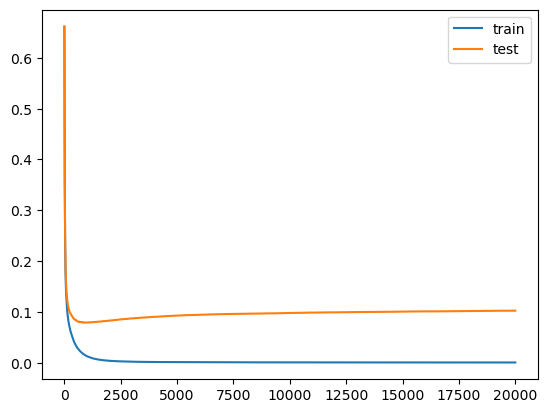

In [97]:
model = XGBClassifier(n_estimators=20000, eta=0.05 ,colsample_bytree = 0.9 ,gamma = 0 ,max_depth =5 ,
                      min_child_weight =1 ,subsample =0.8)
# define the datasets to evaluate each iteration
evalset = [(x_train, y_train), (x_test,y_test)]
# fit the model
model.fit(x_train, y_train, eval_metric='logloss', eval_set=evalset)
# evaluate performance
y_pred_te = model.predict(x_test)
score = accuracy_score(y_test, y_pred_te)
print('Accuracy: %.3f' % score)
# retrieve performance metrics
results = model.evals_result()
# plot learning curves
plt.plot(results['validation_0']['logloss'], label='train')
plt.plot(results['validation_1']['logloss'], label='test')
# show the legend
plt.legend()
# show the plot
plt.show()

    ### Accuracy: 0.971

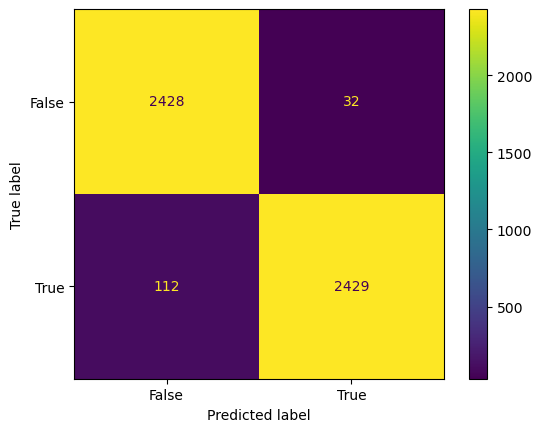

In [98]:
from sklearn.metrics import confusion_matrix
from sklearn import metrics
confusion_matrix = metrics.confusion_matrix(y_test,y_pred_te)
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, 
                                            display_labels = [False, True])
cm_display.plot()
plt.show()

[0]	validation_0-logloss:0.66127	validation_1-logloss:0.66183
[1]	validation_0-logloss:0.63640	validation_1-logloss:0.63769
[2]	validation_0-logloss:0.60904	validation_1-logloss:0.61078
[3]	validation_0-logloss:0.58826	validation_1-logloss:0.59037
[4]	validation_0-logloss:0.56312	validation_1-logloss:0.56574
[5]	validation_0-logloss:0.54022	validation_1-logloss:0.54310
[6]	validation_0-logloss:0.52322	validation_1-logloss:0.52663
[7]	validation_0-logloss:0.50269	validation_1-logloss:0.50649
[8]	validation_0-logloss:0.48400	validation_1-logloss:0.48819
[9]	validation_0-logloss:0.46367	validation_1-logloss:0.46803
[10]	validation_0-logloss:0.44426	validation_1-logloss:0.44898
[11]	validation_0-logloss:0.42844	validation_1-logloss:0.43360
[12]	validation_0-logloss:0.41260	validation_1-logloss:0.41806
[13]	validation_0-logloss:0.39682	validation_1-logloss:0.40259
[14]	validation_0-logloss:0.38710	validation_1-logloss:0.39325
[15]	validation_0-logloss:0.37328	validation_1-logloss:0.37984
[1

[130]	validation_0-logloss:0.10014	validation_1-logloss:0.12206
[131]	validation_0-logloss:0.09940	validation_1-logloss:0.12153
[132]	validation_0-logloss:0.09904	validation_1-logloss:0.12122
[133]	validation_0-logloss:0.09850	validation_1-logloss:0.12092
[134]	validation_0-logloss:0.09814	validation_1-logloss:0.12060
[135]	validation_0-logloss:0.09768	validation_1-logloss:0.12023
[136]	validation_0-logloss:0.09724	validation_1-logloss:0.11988
[137]	validation_0-logloss:0.09675	validation_1-logloss:0.11954
[138]	validation_0-logloss:0.09647	validation_1-logloss:0.11929
[139]	validation_0-logloss:0.09626	validation_1-logloss:0.11909
[140]	validation_0-logloss:0.09582	validation_1-logloss:0.11865
[141]	validation_0-logloss:0.09478	validation_1-logloss:0.11782
[142]	validation_0-logloss:0.09434	validation_1-logloss:0.11746
[143]	validation_0-logloss:0.09409	validation_1-logloss:0.11720
[144]	validation_0-logloss:0.09389	validation_1-logloss:0.11701
[145]	validation_0-logloss:0.09349	valid

[387]	validation_0-logloss:0.04599	validation_1-logloss:0.08826
[388]	validation_0-logloss:0.04587	validation_1-logloss:0.08818
[389]	validation_0-logloss:0.04575	validation_1-logloss:0.08816
[390]	validation_0-logloss:0.04565	validation_1-logloss:0.08813
[391]	validation_0-logloss:0.04559	validation_1-logloss:0.08816
[392]	validation_0-logloss:0.04551	validation_1-logloss:0.08815
[393]	validation_0-logloss:0.04547	validation_1-logloss:0.08812
[394]	validation_0-logloss:0.04534	validation_1-logloss:0.08811
[395]	validation_0-logloss:0.04527	validation_1-logloss:0.08810
[396]	validation_0-logloss:0.04512	validation_1-logloss:0.08802
[397]	validation_0-logloss:0.04499	validation_1-logloss:0.08783
[398]	validation_0-logloss:0.04488	validation_1-logloss:0.08777
[399]	validation_0-logloss:0.04475	validation_1-logloss:0.08765
[400]	validation_0-logloss:0.04467	validation_1-logloss:0.08766
[401]	validation_0-logloss:0.04458	validation_1-logloss:0.08764
[402]	validation_0-logloss:0.04451	valid

[516]	validation_0-logloss:0.03396	validation_1-logloss:0.08368
[517]	validation_0-logloss:0.03391	validation_1-logloss:0.08368
[518]	validation_0-logloss:0.03380	validation_1-logloss:0.08370
[519]	validation_0-logloss:0.03369	validation_1-logloss:0.08358
[520]	validation_0-logloss:0.03355	validation_1-logloss:0.08350
[521]	validation_0-logloss:0.03342	validation_1-logloss:0.08336
[522]	validation_0-logloss:0.03335	validation_1-logloss:0.08333
[523]	validation_0-logloss:0.03323	validation_1-logloss:0.08325
[524]	validation_0-logloss:0.03316	validation_1-logloss:0.08319
[525]	validation_0-logloss:0.03308	validation_1-logloss:0.08321
[526]	validation_0-logloss:0.03296	validation_1-logloss:0.08314
[527]	validation_0-logloss:0.03287	validation_1-logloss:0.08315
[528]	validation_0-logloss:0.03279	validation_1-logloss:0.08309
[529]	validation_0-logloss:0.03268	validation_1-logloss:0.08321
[530]	validation_0-logloss:0.03257	validation_1-logloss:0.08324
[531]	validation_0-logloss:0.03254	valid

[645]	validation_0-logloss:0.02534	validation_1-logloss:0.08064
[646]	validation_0-logloss:0.02528	validation_1-logloss:0.08058
[647]	validation_0-logloss:0.02522	validation_1-logloss:0.08057
[648]	validation_0-logloss:0.02518	validation_1-logloss:0.08055
[649]	validation_0-logloss:0.02513	validation_1-logloss:0.08052
[650]	validation_0-logloss:0.02505	validation_1-logloss:0.08043
[651]	validation_0-logloss:0.02499	validation_1-logloss:0.08038
[652]	validation_0-logloss:0.02493	validation_1-logloss:0.08031
[653]	validation_0-logloss:0.02487	validation_1-logloss:0.08031
[654]	validation_0-logloss:0.02482	validation_1-logloss:0.08030
[655]	validation_0-logloss:0.02478	validation_1-logloss:0.08038
[656]	validation_0-logloss:0.02469	validation_1-logloss:0.08039
[657]	validation_0-logloss:0.02460	validation_1-logloss:0.08040
[658]	validation_0-logloss:0.02458	validation_1-logloss:0.08043
[659]	validation_0-logloss:0.02454	validation_1-logloss:0.08045
[660]	validation_0-logloss:0.02451	valid

[902]	validation_0-logloss:0.01506	validation_1-logloss:0.07912
[903]	validation_0-logloss:0.01504	validation_1-logloss:0.07910
[904]	validation_0-logloss:0.01502	validation_1-logloss:0.07913
[905]	validation_0-logloss:0.01499	validation_1-logloss:0.07908
[906]	validation_0-logloss:0.01498	validation_1-logloss:0.07909
[907]	validation_0-logloss:0.01494	validation_1-logloss:0.07909
[908]	validation_0-logloss:0.01491	validation_1-logloss:0.07908
[909]	validation_0-logloss:0.01488	validation_1-logloss:0.07913
[910]	validation_0-logloss:0.01485	validation_1-logloss:0.07913
[911]	validation_0-logloss:0.01483	validation_1-logloss:0.07916
[912]	validation_0-logloss:0.01479	validation_1-logloss:0.07916
[913]	validation_0-logloss:0.01474	validation_1-logloss:0.07911
[914]	validation_0-logloss:0.01472	validation_1-logloss:0.07908
[915]	validation_0-logloss:0.01467	validation_1-logloss:0.07902
[916]	validation_0-logloss:0.01465	validation_1-logloss:0.07901
[917]	validation_0-logloss:0.01462	valid

[1030]	validation_0-logloss:0.01225	validation_1-logloss:0.07931
[1031]	validation_0-logloss:0.01224	validation_1-logloss:0.07930
[1032]	validation_0-logloss:0.01223	validation_1-logloss:0.07932
[1033]	validation_0-logloss:0.01219	validation_1-logloss:0.07934
[1034]	validation_0-logloss:0.01218	validation_1-logloss:0.07934
[1035]	validation_0-logloss:0.01215	validation_1-logloss:0.07936
[1036]	validation_0-logloss:0.01214	validation_1-logloss:0.07938
[1037]	validation_0-logloss:0.01212	validation_1-logloss:0.07939
[1038]	validation_0-logloss:0.01211	validation_1-logloss:0.07939
[1039]	validation_0-logloss:0.01209	validation_1-logloss:0.07941
[1040]	validation_0-logloss:0.01208	validation_1-logloss:0.07938
[1041]	validation_0-logloss:0.01205	validation_1-logloss:0.07941
[1042]	validation_0-logloss:0.01203	validation_1-logloss:0.07947
[1043]	validation_0-logloss:0.01202	validation_1-logloss:0.07950
[1044]	validation_0-logloss:0.01200	validation_1-logloss:0.07950
[1045]	validation_0-loglo

[1283]	validation_0-logloss:0.00835	validation_1-logloss:0.07994
[1284]	validation_0-logloss:0.00834	validation_1-logloss:0.07993
[1285]	validation_0-logloss:0.00833	validation_1-logloss:0.07997
[1286]	validation_0-logloss:0.00831	validation_1-logloss:0.07992
[1287]	validation_0-logloss:0.00830	validation_1-logloss:0.07993
[1288]	validation_0-logloss:0.00829	validation_1-logloss:0.07994
[1289]	validation_0-logloss:0.00829	validation_1-logloss:0.07992
[1290]	validation_0-logloss:0.00827	validation_1-logloss:0.07990
[1291]	validation_0-logloss:0.00826	validation_1-logloss:0.07988
[1292]	validation_0-logloss:0.00824	validation_1-logloss:0.07990
[1293]	validation_0-logloss:0.00823	validation_1-logloss:0.07986
[1294]	validation_0-logloss:0.00822	validation_1-logloss:0.07990
[1295]	validation_0-logloss:0.00821	validation_1-logloss:0.07990
[1296]	validation_0-logloss:0.00820	validation_1-logloss:0.07988
[1297]	validation_0-logloss:0.00819	validation_1-logloss:0.07988
[1298]	validation_0-loglo

[1410]	validation_0-logloss:0.00698	validation_1-logloss:0.08052
[1411]	validation_0-logloss:0.00697	validation_1-logloss:0.08051
[1412]	validation_0-logloss:0.00696	validation_1-logloss:0.08054
[1413]	validation_0-logloss:0.00695	validation_1-logloss:0.08046
[1414]	validation_0-logloss:0.00694	validation_1-logloss:0.08048
[1415]	validation_0-logloss:0.00693	validation_1-logloss:0.08051
[1416]	validation_0-logloss:0.00693	validation_1-logloss:0.08048
[1417]	validation_0-logloss:0.00692	validation_1-logloss:0.08046
[1418]	validation_0-logloss:0.00692	validation_1-logloss:0.08043
[1419]	validation_0-logloss:0.00690	validation_1-logloss:0.08038
[1420]	validation_0-logloss:0.00690	validation_1-logloss:0.08038
[1421]	validation_0-logloss:0.00689	validation_1-logloss:0.08039
[1422]	validation_0-logloss:0.00689	validation_1-logloss:0.08043
[1423]	validation_0-logloss:0.00687	validation_1-logloss:0.08047
[1424]	validation_0-logloss:0.00687	validation_1-logloss:0.08049
[1425]	validation_0-loglo

[1537]	validation_0-logloss:0.00599	validation_1-logloss:0.08066
[1538]	validation_0-logloss:0.00598	validation_1-logloss:0.08065
[1539]	validation_0-logloss:0.00597	validation_1-logloss:0.08065
[1540]	validation_0-logloss:0.00596	validation_1-logloss:0.08067
[1541]	validation_0-logloss:0.00595	validation_1-logloss:0.08066
[1542]	validation_0-logloss:0.00595	validation_1-logloss:0.08067
[1543]	validation_0-logloss:0.00595	validation_1-logloss:0.08070
[1544]	validation_0-logloss:0.00595	validation_1-logloss:0.08071
[1545]	validation_0-logloss:0.00594	validation_1-logloss:0.08077
[1546]	validation_0-logloss:0.00593	validation_1-logloss:0.08076
[1547]	validation_0-logloss:0.00593	validation_1-logloss:0.08077
[1548]	validation_0-logloss:0.00592	validation_1-logloss:0.08077
[1549]	validation_0-logloss:0.00591	validation_1-logloss:0.08076
[1550]	validation_0-logloss:0.00590	validation_1-logloss:0.08081
[1551]	validation_0-logloss:0.00589	validation_1-logloss:0.08079
[1552]	validation_0-loglo

[1664]	validation_0-logloss:0.00519	validation_1-logloss:0.08133
[1665]	validation_0-logloss:0.00519	validation_1-logloss:0.08133
[1666]	validation_0-logloss:0.00518	validation_1-logloss:0.08130
[1667]	validation_0-logloss:0.00518	validation_1-logloss:0.08130
[1668]	validation_0-logloss:0.00518	validation_1-logloss:0.08128
[1669]	validation_0-logloss:0.00517	validation_1-logloss:0.08129
[1670]	validation_0-logloss:0.00516	validation_1-logloss:0.08129
[1671]	validation_0-logloss:0.00516	validation_1-logloss:0.08133
[1672]	validation_0-logloss:0.00515	validation_1-logloss:0.08134
[1673]	validation_0-logloss:0.00514	validation_1-logloss:0.08134
[1674]	validation_0-logloss:0.00514	validation_1-logloss:0.08133
[1675]	validation_0-logloss:0.00513	validation_1-logloss:0.08132
[1676]	validation_0-logloss:0.00513	validation_1-logloss:0.08131
[1677]	validation_0-logloss:0.00512	validation_1-logloss:0.08128
[1678]	validation_0-logloss:0.00512	validation_1-logloss:0.08130
[1679]	validation_0-loglo

[1791]	validation_0-logloss:0.00455	validation_1-logloss:0.08190
[1792]	validation_0-logloss:0.00454	validation_1-logloss:0.08189
[1793]	validation_0-logloss:0.00454	validation_1-logloss:0.08187
[1794]	validation_0-logloss:0.00454	validation_1-logloss:0.08189
[1795]	validation_0-logloss:0.00453	validation_1-logloss:0.08194
[1796]	validation_0-logloss:0.00453	validation_1-logloss:0.08189
[1797]	validation_0-logloss:0.00453	validation_1-logloss:0.08188
[1798]	validation_0-logloss:0.00452	validation_1-logloss:0.08185
[1799]	validation_0-logloss:0.00451	validation_1-logloss:0.08186
[1800]	validation_0-logloss:0.00451	validation_1-logloss:0.08186
[1801]	validation_0-logloss:0.00450	validation_1-logloss:0.08190
[1802]	validation_0-logloss:0.00450	validation_1-logloss:0.08185
[1803]	validation_0-logloss:0.00449	validation_1-logloss:0.08185
[1804]	validation_0-logloss:0.00449	validation_1-logloss:0.08188
[1805]	validation_0-logloss:0.00449	validation_1-logloss:0.08188
[1806]	validation_0-loglo

[1918]	validation_0-logloss:0.00404	validation_1-logloss:0.08252
[1919]	validation_0-logloss:0.00403	validation_1-logloss:0.08254
[1920]	validation_0-logloss:0.00403	validation_1-logloss:0.08252
[1921]	validation_0-logloss:0.00403	validation_1-logloss:0.08253
[1922]	validation_0-logloss:0.00402	validation_1-logloss:0.08253
[1923]	validation_0-logloss:0.00402	validation_1-logloss:0.08256
[1924]	validation_0-logloss:0.00402	validation_1-logloss:0.08252
[1925]	validation_0-logloss:0.00401	validation_1-logloss:0.08254
[1926]	validation_0-logloss:0.00401	validation_1-logloss:0.08258
[1927]	validation_0-logloss:0.00401	validation_1-logloss:0.08258
[1928]	validation_0-logloss:0.00400	validation_1-logloss:0.08260
[1929]	validation_0-logloss:0.00399	validation_1-logloss:0.08258
[1930]	validation_0-logloss:0.00399	validation_1-logloss:0.08257
[1931]	validation_0-logloss:0.00398	validation_1-logloss:0.08257
[1932]	validation_0-logloss:0.00398	validation_1-logloss:0.08257
[1933]	validation_0-loglo

[2045]	validation_0-logloss:0.00362	validation_1-logloss:0.08309
[2046]	validation_0-logloss:0.00362	validation_1-logloss:0.08309
[2047]	validation_0-logloss:0.00362	validation_1-logloss:0.08309
[2048]	validation_0-logloss:0.00361	validation_1-logloss:0.08311
[2049]	validation_0-logloss:0.00361	validation_1-logloss:0.08311
[2050]	validation_0-logloss:0.00361	validation_1-logloss:0.08312
[2051]	validation_0-logloss:0.00360	validation_1-logloss:0.08310
[2052]	validation_0-logloss:0.00360	validation_1-logloss:0.08311
[2053]	validation_0-logloss:0.00360	validation_1-logloss:0.08310
[2054]	validation_0-logloss:0.00360	validation_1-logloss:0.08313
[2055]	validation_0-logloss:0.00360	validation_1-logloss:0.08316
[2056]	validation_0-logloss:0.00359	validation_1-logloss:0.08319
[2057]	validation_0-logloss:0.00359	validation_1-logloss:0.08315
[2058]	validation_0-logloss:0.00359	validation_1-logloss:0.08314
[2059]	validation_0-logloss:0.00359	validation_1-logloss:0.08313
[2060]	validation_0-loglo

[2172]	validation_0-logloss:0.00327	validation_1-logloss:0.08363
[2173]	validation_0-logloss:0.00327	validation_1-logloss:0.08363
[2174]	validation_0-logloss:0.00327	validation_1-logloss:0.08366
[2175]	validation_0-logloss:0.00326	validation_1-logloss:0.08371
[2176]	validation_0-logloss:0.00326	validation_1-logloss:0.08374
[2177]	validation_0-logloss:0.00326	validation_1-logloss:0.08377
[2178]	validation_0-logloss:0.00325	validation_1-logloss:0.08376
[2179]	validation_0-logloss:0.00325	validation_1-logloss:0.08374
[2180]	validation_0-logloss:0.00324	validation_1-logloss:0.08371
[2181]	validation_0-logloss:0.00324	validation_1-logloss:0.08371
[2182]	validation_0-logloss:0.00324	validation_1-logloss:0.08371
[2183]	validation_0-logloss:0.00324	validation_1-logloss:0.08370
[2184]	validation_0-logloss:0.00324	validation_1-logloss:0.08368
[2185]	validation_0-logloss:0.00323	validation_1-logloss:0.08370
[2186]	validation_0-logloss:0.00323	validation_1-logloss:0.08370
[2187]	validation_0-loglo

[2299]	validation_0-logloss:0.00297	validation_1-logloss:0.08418
[2300]	validation_0-logloss:0.00297	validation_1-logloss:0.08418
[2301]	validation_0-logloss:0.00297	validation_1-logloss:0.08419
[2302]	validation_0-logloss:0.00297	validation_1-logloss:0.08418
[2303]	validation_0-logloss:0.00296	validation_1-logloss:0.08417
[2304]	validation_0-logloss:0.00296	validation_1-logloss:0.08424
[2305]	validation_0-logloss:0.00296	validation_1-logloss:0.08421
[2306]	validation_0-logloss:0.00296	validation_1-logloss:0.08419
[2307]	validation_0-logloss:0.00295	validation_1-logloss:0.08420
[2308]	validation_0-logloss:0.00295	validation_1-logloss:0.08420
[2309]	validation_0-logloss:0.00295	validation_1-logloss:0.08421
[2310]	validation_0-logloss:0.00295	validation_1-logloss:0.08422
[2311]	validation_0-logloss:0.00294	validation_1-logloss:0.08420
[2312]	validation_0-logloss:0.00294	validation_1-logloss:0.08421
[2313]	validation_0-logloss:0.00294	validation_1-logloss:0.08417
[2314]	validation_0-loglo

[2426]	validation_0-logloss:0.00273	validation_1-logloss:0.08482
[2427]	validation_0-logloss:0.00272	validation_1-logloss:0.08483
[2428]	validation_0-logloss:0.00272	validation_1-logloss:0.08485
[2429]	validation_0-logloss:0.00272	validation_1-logloss:0.08485
[2430]	validation_0-logloss:0.00272	validation_1-logloss:0.08485
[2431]	validation_0-logloss:0.00272	validation_1-logloss:0.08485
[2432]	validation_0-logloss:0.00272	validation_1-logloss:0.08487
[2433]	validation_0-logloss:0.00272	validation_1-logloss:0.08488
[2434]	validation_0-logloss:0.00271	validation_1-logloss:0.08489
[2435]	validation_0-logloss:0.00271	validation_1-logloss:0.08490
[2436]	validation_0-logloss:0.00271	validation_1-logloss:0.08491
[2437]	validation_0-logloss:0.00271	validation_1-logloss:0.08495
[2438]	validation_0-logloss:0.00271	validation_1-logloss:0.08494
[2439]	validation_0-logloss:0.00271	validation_1-logloss:0.08492
[2440]	validation_0-logloss:0.00270	validation_1-logloss:0.08495
[2441]	validation_0-loglo

[2553]	validation_0-logloss:0.00251	validation_1-logloss:0.08561
[2554]	validation_0-logloss:0.00251	validation_1-logloss:0.08558
[2555]	validation_0-logloss:0.00251	validation_1-logloss:0.08557
[2556]	validation_0-logloss:0.00250	validation_1-logloss:0.08556
[2557]	validation_0-logloss:0.00250	validation_1-logloss:0.08557
[2558]	validation_0-logloss:0.00250	validation_1-logloss:0.08557
[2559]	validation_0-logloss:0.00250	validation_1-logloss:0.08559
[2560]	validation_0-logloss:0.00249	validation_1-logloss:0.08557
[2561]	validation_0-logloss:0.00249	validation_1-logloss:0.08557
[2562]	validation_0-logloss:0.00249	validation_1-logloss:0.08557
[2563]	validation_0-logloss:0.00249	validation_1-logloss:0.08557
[2564]	validation_0-logloss:0.00249	validation_1-logloss:0.08556
[2565]	validation_0-logloss:0.00249	validation_1-logloss:0.08555
[2566]	validation_0-logloss:0.00249	validation_1-logloss:0.08556
[2567]	validation_0-logloss:0.00249	validation_1-logloss:0.08558
[2568]	validation_0-loglo

[2680]	validation_0-logloss:0.00232	validation_1-logloss:0.08598
[2681]	validation_0-logloss:0.00232	validation_1-logloss:0.08600
[2682]	validation_0-logloss:0.00232	validation_1-logloss:0.08601
[2683]	validation_0-logloss:0.00232	validation_1-logloss:0.08600
[2684]	validation_0-logloss:0.00232	validation_1-logloss:0.08602
[2685]	validation_0-logloss:0.00232	validation_1-logloss:0.08602
[2686]	validation_0-logloss:0.00231	validation_1-logloss:0.08599
[2687]	validation_0-logloss:0.00231	validation_1-logloss:0.08603
[2688]	validation_0-logloss:0.00231	validation_1-logloss:0.08604
[2689]	validation_0-logloss:0.00231	validation_1-logloss:0.08604
[2690]	validation_0-logloss:0.00231	validation_1-logloss:0.08602
[2691]	validation_0-logloss:0.00231	validation_1-logloss:0.08607
[2692]	validation_0-logloss:0.00231	validation_1-logloss:0.08604
[2693]	validation_0-logloss:0.00231	validation_1-logloss:0.08606
[2694]	validation_0-logloss:0.00230	validation_1-logloss:0.08606
[2695]	validation_0-loglo

[2807]	validation_0-logloss:0.00216	validation_1-logloss:0.08648
[2808]	validation_0-logloss:0.00216	validation_1-logloss:0.08648
[2809]	validation_0-logloss:0.00216	validation_1-logloss:0.08649
[2810]	validation_0-logloss:0.00216	validation_1-logloss:0.08650
[2811]	validation_0-logloss:0.00216	validation_1-logloss:0.08651
[2812]	validation_0-logloss:0.00216	validation_1-logloss:0.08653
[2813]	validation_0-logloss:0.00215	validation_1-logloss:0.08653
[2814]	validation_0-logloss:0.00215	validation_1-logloss:0.08653
[2815]	validation_0-logloss:0.00215	validation_1-logloss:0.08653
[2816]	validation_0-logloss:0.00215	validation_1-logloss:0.08653
[2817]	validation_0-logloss:0.00215	validation_1-logloss:0.08654
[2818]	validation_0-logloss:0.00215	validation_1-logloss:0.08651
[2819]	validation_0-logloss:0.00215	validation_1-logloss:0.08651
[2820]	validation_0-logloss:0.00215	validation_1-logloss:0.08652
[2821]	validation_0-logloss:0.00215	validation_1-logloss:0.08653
[2822]	validation_0-loglo

[2934]	validation_0-logloss:0.00202	validation_1-logloss:0.08708
[2935]	validation_0-logloss:0.00202	validation_1-logloss:0.08709
[2936]	validation_0-logloss:0.00201	validation_1-logloss:0.08709
[2937]	validation_0-logloss:0.00201	validation_1-logloss:0.08709
[2938]	validation_0-logloss:0.00201	validation_1-logloss:0.08710
[2939]	validation_0-logloss:0.00201	validation_1-logloss:0.08710
[2940]	validation_0-logloss:0.00201	validation_1-logloss:0.08706
[2941]	validation_0-logloss:0.00201	validation_1-logloss:0.08705
[2942]	validation_0-logloss:0.00201	validation_1-logloss:0.08704
[2943]	validation_0-logloss:0.00201	validation_1-logloss:0.08705
[2944]	validation_0-logloss:0.00201	validation_1-logloss:0.08703
[2945]	validation_0-logloss:0.00201	validation_1-logloss:0.08703
[2946]	validation_0-logloss:0.00200	validation_1-logloss:0.08706
[2947]	validation_0-logloss:0.00200	validation_1-logloss:0.08710
[2948]	validation_0-logloss:0.00200	validation_1-logloss:0.08713
[2949]	validation_0-loglo

[3061]	validation_0-logloss:0.00190	validation_1-logloss:0.08736
[3062]	validation_0-logloss:0.00190	validation_1-logloss:0.08735
[3063]	validation_0-logloss:0.00190	validation_1-logloss:0.08734
[3064]	validation_0-logloss:0.00190	validation_1-logloss:0.08737
[3065]	validation_0-logloss:0.00190	validation_1-logloss:0.08737
[3066]	validation_0-logloss:0.00190	validation_1-logloss:0.08737
[3067]	validation_0-logloss:0.00189	validation_1-logloss:0.08736
[3068]	validation_0-logloss:0.00189	validation_1-logloss:0.08739
[3069]	validation_0-logloss:0.00189	validation_1-logloss:0.08740
[3070]	validation_0-logloss:0.00189	validation_1-logloss:0.08740
[3071]	validation_0-logloss:0.00189	validation_1-logloss:0.08743
[3072]	validation_0-logloss:0.00189	validation_1-logloss:0.08744
[3073]	validation_0-logloss:0.00189	validation_1-logloss:0.08745
[3074]	validation_0-logloss:0.00189	validation_1-logloss:0.08747
[3075]	validation_0-logloss:0.00189	validation_1-logloss:0.08745
[3076]	validation_0-loglo

[3188]	validation_0-logloss:0.00179	validation_1-logloss:0.08773
[3189]	validation_0-logloss:0.00179	validation_1-logloss:0.08774
[3190]	validation_0-logloss:0.00179	validation_1-logloss:0.08776
[3191]	validation_0-logloss:0.00179	validation_1-logloss:0.08779
[3192]	validation_0-logloss:0.00179	validation_1-logloss:0.08781
[3193]	validation_0-logloss:0.00179	validation_1-logloss:0.08782
[3194]	validation_0-logloss:0.00179	validation_1-logloss:0.08783
[3195]	validation_0-logloss:0.00179	validation_1-logloss:0.08783
[3196]	validation_0-logloss:0.00179	validation_1-logloss:0.08784
[3197]	validation_0-logloss:0.00178	validation_1-logloss:0.08784
[3198]	validation_0-logloss:0.00178	validation_1-logloss:0.08785
[3199]	validation_0-logloss:0.00178	validation_1-logloss:0.08784
[3200]	validation_0-logloss:0.00178	validation_1-logloss:0.08783
[3201]	validation_0-logloss:0.00178	validation_1-logloss:0.08782
[3202]	validation_0-logloss:0.00178	validation_1-logloss:0.08780
[3203]	validation_0-loglo

[3315]	validation_0-logloss:0.00170	validation_1-logloss:0.08821
[3316]	validation_0-logloss:0.00170	validation_1-logloss:0.08821
[3317]	validation_0-logloss:0.00170	validation_1-logloss:0.08821
[3318]	validation_0-logloss:0.00170	validation_1-logloss:0.08821
[3319]	validation_0-logloss:0.00170	validation_1-logloss:0.08823
[3320]	validation_0-logloss:0.00170	validation_1-logloss:0.08823
[3321]	validation_0-logloss:0.00170	validation_1-logloss:0.08821
[3322]	validation_0-logloss:0.00169	validation_1-logloss:0.08823
[3323]	validation_0-logloss:0.00169	validation_1-logloss:0.08821
[3324]	validation_0-logloss:0.00169	validation_1-logloss:0.08820
[3325]	validation_0-logloss:0.00169	validation_1-logloss:0.08819
[3326]	validation_0-logloss:0.00169	validation_1-logloss:0.08819
[3327]	validation_0-logloss:0.00169	validation_1-logloss:0.08821
[3328]	validation_0-logloss:0.00169	validation_1-logloss:0.08823
[3329]	validation_0-logloss:0.00169	validation_1-logloss:0.08822
[3330]	validation_0-loglo

[3442]	validation_0-logloss:0.00162	validation_1-logloss:0.08867
[3443]	validation_0-logloss:0.00162	validation_1-logloss:0.08867
[3444]	validation_0-logloss:0.00161	validation_1-logloss:0.08867
[3445]	validation_0-logloss:0.00161	validation_1-logloss:0.08869
[3446]	validation_0-logloss:0.00161	validation_1-logloss:0.08868
[3447]	validation_0-logloss:0.00161	validation_1-logloss:0.08866
[3448]	validation_0-logloss:0.00161	validation_1-logloss:0.08867
[3449]	validation_0-logloss:0.00161	validation_1-logloss:0.08870
[3450]	validation_0-logloss:0.00161	validation_1-logloss:0.08872
[3451]	validation_0-logloss:0.00161	validation_1-logloss:0.08873
[3452]	validation_0-logloss:0.00161	validation_1-logloss:0.08872
[3453]	validation_0-logloss:0.00161	validation_1-logloss:0.08870
[3454]	validation_0-logloss:0.00161	validation_1-logloss:0.08868
[3455]	validation_0-logloss:0.00161	validation_1-logloss:0.08870
[3456]	validation_0-logloss:0.00161	validation_1-logloss:0.08870
[3457]	validation_0-loglo

[3569]	validation_0-logloss:0.00155	validation_1-logloss:0.08897
[3570]	validation_0-logloss:0.00155	validation_1-logloss:0.08897
[3571]	validation_0-logloss:0.00154	validation_1-logloss:0.08900
[3572]	validation_0-logloss:0.00154	validation_1-logloss:0.08901
[3573]	validation_0-logloss:0.00154	validation_1-logloss:0.08900
[3574]	validation_0-logloss:0.00154	validation_1-logloss:0.08900
[3575]	validation_0-logloss:0.00154	validation_1-logloss:0.08903
[3576]	validation_0-logloss:0.00154	validation_1-logloss:0.08903
[3577]	validation_0-logloss:0.00154	validation_1-logloss:0.08906
[3578]	validation_0-logloss:0.00154	validation_1-logloss:0.08906
[3579]	validation_0-logloss:0.00154	validation_1-logloss:0.08906
[3580]	validation_0-logloss:0.00154	validation_1-logloss:0.08905
[3581]	validation_0-logloss:0.00154	validation_1-logloss:0.08903
[3582]	validation_0-logloss:0.00154	validation_1-logloss:0.08902
[3583]	validation_0-logloss:0.00154	validation_1-logloss:0.08903
[3584]	validation_0-loglo

[3696]	validation_0-logloss:0.00148	validation_1-logloss:0.08951
[3697]	validation_0-logloss:0.00148	validation_1-logloss:0.08952
[3698]	validation_0-logloss:0.00148	validation_1-logloss:0.08950
[3699]	validation_0-logloss:0.00148	validation_1-logloss:0.08955
[3700]	validation_0-logloss:0.00148	validation_1-logloss:0.08956
[3701]	validation_0-logloss:0.00148	validation_1-logloss:0.08955
[3702]	validation_0-logloss:0.00148	validation_1-logloss:0.08956
[3703]	validation_0-logloss:0.00148	validation_1-logloss:0.08955
[3704]	validation_0-logloss:0.00148	validation_1-logloss:0.08954
[3705]	validation_0-logloss:0.00148	validation_1-logloss:0.08955
[3706]	validation_0-logloss:0.00147	validation_1-logloss:0.08954
[3707]	validation_0-logloss:0.00147	validation_1-logloss:0.08955
[3708]	validation_0-logloss:0.00147	validation_1-logloss:0.08954
[3709]	validation_0-logloss:0.00147	validation_1-logloss:0.08956
[3710]	validation_0-logloss:0.00147	validation_1-logloss:0.08955
[3711]	validation_0-loglo

[3823]	validation_0-logloss:0.00142	validation_1-logloss:0.08985
[3824]	validation_0-logloss:0.00142	validation_1-logloss:0.08986
[3825]	validation_0-logloss:0.00142	validation_1-logloss:0.08985
[3826]	validation_0-logloss:0.00142	validation_1-logloss:0.08988
[3827]	validation_0-logloss:0.00142	validation_1-logloss:0.08985
[3828]	validation_0-logloss:0.00142	validation_1-logloss:0.08987
[3829]	validation_0-logloss:0.00142	validation_1-logloss:0.08989
[3830]	validation_0-logloss:0.00142	validation_1-logloss:0.08989
[3831]	validation_0-logloss:0.00142	validation_1-logloss:0.08990
[3832]	validation_0-logloss:0.00142	validation_1-logloss:0.08989
[3833]	validation_0-logloss:0.00142	validation_1-logloss:0.08992
[3834]	validation_0-logloss:0.00142	validation_1-logloss:0.08990
[3835]	validation_0-logloss:0.00142	validation_1-logloss:0.08990
[3836]	validation_0-logloss:0.00142	validation_1-logloss:0.08988
[3837]	validation_0-logloss:0.00142	validation_1-logloss:0.08986
[3838]	validation_0-loglo

[3950]	validation_0-logloss:0.00137	validation_1-logloss:0.09020
[3951]	validation_0-logloss:0.00137	validation_1-logloss:0.09022
[3952]	validation_0-logloss:0.00137	validation_1-logloss:0.09022
[3953]	validation_0-logloss:0.00137	validation_1-logloss:0.09022
[3954]	validation_0-logloss:0.00137	validation_1-logloss:0.09022
[3955]	validation_0-logloss:0.00136	validation_1-logloss:0.09023
[3956]	validation_0-logloss:0.00136	validation_1-logloss:0.09024
[3957]	validation_0-logloss:0.00136	validation_1-logloss:0.09025
[3958]	validation_0-logloss:0.00136	validation_1-logloss:0.09024
[3959]	validation_0-logloss:0.00136	validation_1-logloss:0.09024
[3960]	validation_0-logloss:0.00136	validation_1-logloss:0.09025
[3961]	validation_0-logloss:0.00136	validation_1-logloss:0.09026
[3962]	validation_0-logloss:0.00136	validation_1-logloss:0.09026
[3963]	validation_0-logloss:0.00136	validation_1-logloss:0.09027
[3964]	validation_0-logloss:0.00136	validation_1-logloss:0.09028
[3965]	validation_0-loglo

[4077]	validation_0-logloss:0.00132	validation_1-logloss:0.09050
[4078]	validation_0-logloss:0.00132	validation_1-logloss:0.09049
[4079]	validation_0-logloss:0.00132	validation_1-logloss:0.09049
[4080]	validation_0-logloss:0.00132	validation_1-logloss:0.09050
[4081]	validation_0-logloss:0.00132	validation_1-logloss:0.09050
[4082]	validation_0-logloss:0.00132	validation_1-logloss:0.09050
[4083]	validation_0-logloss:0.00132	validation_1-logloss:0.09049
[4084]	validation_0-logloss:0.00132	validation_1-logloss:0.09050
[4085]	validation_0-logloss:0.00132	validation_1-logloss:0.09049
[4086]	validation_0-logloss:0.00132	validation_1-logloss:0.09052
[4087]	validation_0-logloss:0.00132	validation_1-logloss:0.09053
[4088]	validation_0-logloss:0.00132	validation_1-logloss:0.09053
[4089]	validation_0-logloss:0.00132	validation_1-logloss:0.09051
[4090]	validation_0-logloss:0.00132	validation_1-logloss:0.09049
[4091]	validation_0-logloss:0.00131	validation_1-logloss:0.09048
[4092]	validation_0-loglo

[4204]	validation_0-logloss:0.00127	validation_1-logloss:0.09071
[4205]	validation_0-logloss:0.00127	validation_1-logloss:0.09072
[4206]	validation_0-logloss:0.00127	validation_1-logloss:0.09072
[4207]	validation_0-logloss:0.00127	validation_1-logloss:0.09072
[4208]	validation_0-logloss:0.00127	validation_1-logloss:0.09075
[4209]	validation_0-logloss:0.00127	validation_1-logloss:0.09075
[4210]	validation_0-logloss:0.00127	validation_1-logloss:0.09074
[4211]	validation_0-logloss:0.00127	validation_1-logloss:0.09072
[4212]	validation_0-logloss:0.00127	validation_1-logloss:0.09074
[4213]	validation_0-logloss:0.00127	validation_1-logloss:0.09075
[4214]	validation_0-logloss:0.00127	validation_1-logloss:0.09074
[4215]	validation_0-logloss:0.00127	validation_1-logloss:0.09073
[4216]	validation_0-logloss:0.00127	validation_1-logloss:0.09075
[4217]	validation_0-logloss:0.00127	validation_1-logloss:0.09076
[4218]	validation_0-logloss:0.00127	validation_1-logloss:0.09076
[4219]	validation_0-loglo

[4331]	validation_0-logloss:0.00123	validation_1-logloss:0.09110
[4332]	validation_0-logloss:0.00123	validation_1-logloss:0.09110
[4333]	validation_0-logloss:0.00123	validation_1-logloss:0.09111
[4334]	validation_0-logloss:0.00123	validation_1-logloss:0.09111
[4335]	validation_0-logloss:0.00123	validation_1-logloss:0.09112
[4336]	validation_0-logloss:0.00123	validation_1-logloss:0.09112
[4337]	validation_0-logloss:0.00123	validation_1-logloss:0.09111
[4338]	validation_0-logloss:0.00123	validation_1-logloss:0.09112
[4339]	validation_0-logloss:0.00123	validation_1-logloss:0.09114
[4340]	validation_0-logloss:0.00123	validation_1-logloss:0.09115
[4341]	validation_0-logloss:0.00123	validation_1-logloss:0.09115
[4342]	validation_0-logloss:0.00123	validation_1-logloss:0.09116
[4343]	validation_0-logloss:0.00123	validation_1-logloss:0.09117
[4344]	validation_0-logloss:0.00123	validation_1-logloss:0.09117
[4345]	validation_0-logloss:0.00123	validation_1-logloss:0.09116
[4346]	validation_0-loglo

[4458]	validation_0-logloss:0.00120	validation_1-logloss:0.09149
[4459]	validation_0-logloss:0.00120	validation_1-logloss:0.09151
[4460]	validation_0-logloss:0.00120	validation_1-logloss:0.09153
[4461]	validation_0-logloss:0.00120	validation_1-logloss:0.09153
[4462]	validation_0-logloss:0.00119	validation_1-logloss:0.09156
[4463]	validation_0-logloss:0.00119	validation_1-logloss:0.09156
[4464]	validation_0-logloss:0.00119	validation_1-logloss:0.09156
[4465]	validation_0-logloss:0.00119	validation_1-logloss:0.09156
[4466]	validation_0-logloss:0.00119	validation_1-logloss:0.09158
[4467]	validation_0-logloss:0.00119	validation_1-logloss:0.09157
[4468]	validation_0-logloss:0.00119	validation_1-logloss:0.09156
[4469]	validation_0-logloss:0.00119	validation_1-logloss:0.09157
[4470]	validation_0-logloss:0.00119	validation_1-logloss:0.09157
[4471]	validation_0-logloss:0.00119	validation_1-logloss:0.09158
[4472]	validation_0-logloss:0.00119	validation_1-logloss:0.09157
[4473]	validation_0-loglo

[4711]	validation_0-logloss:0.00113	validation_1-logloss:0.09204
[4712]	validation_0-logloss:0.00113	validation_1-logloss:0.09204
[4713]	validation_0-logloss:0.00113	validation_1-logloss:0.09204
[4714]	validation_0-logloss:0.00113	validation_1-logloss:0.09206
[4715]	validation_0-logloss:0.00113	validation_1-logloss:0.09204
[4716]	validation_0-logloss:0.00113	validation_1-logloss:0.09204
[4717]	validation_0-logloss:0.00113	validation_1-logloss:0.09204
[4718]	validation_0-logloss:0.00113	validation_1-logloss:0.09204
[4719]	validation_0-logloss:0.00113	validation_1-logloss:0.09203
[4720]	validation_0-logloss:0.00113	validation_1-logloss:0.09203
[4721]	validation_0-logloss:0.00113	validation_1-logloss:0.09205
[4722]	validation_0-logloss:0.00113	validation_1-logloss:0.09205
[4723]	validation_0-logloss:0.00113	validation_1-logloss:0.09204
[4724]	validation_0-logloss:0.00113	validation_1-logloss:0.09205
[4725]	validation_0-logloss:0.00113	validation_1-logloss:0.09209
[4726]	validation_0-loglo

[4838]	validation_0-logloss:0.00110	validation_1-logloss:0.09240
[4839]	validation_0-logloss:0.00110	validation_1-logloss:0.09240
[4840]	validation_0-logloss:0.00110	validation_1-logloss:0.09240
[4841]	validation_0-logloss:0.00110	validation_1-logloss:0.09241
[4842]	validation_0-logloss:0.00110	validation_1-logloss:0.09241
[4843]	validation_0-logloss:0.00110	validation_1-logloss:0.09241
[4844]	validation_0-logloss:0.00110	validation_1-logloss:0.09244
[4845]	validation_0-logloss:0.00110	validation_1-logloss:0.09243
[4846]	validation_0-logloss:0.00110	validation_1-logloss:0.09243
[4847]	validation_0-logloss:0.00110	validation_1-logloss:0.09242
[4848]	validation_0-logloss:0.00110	validation_1-logloss:0.09240
[4849]	validation_0-logloss:0.00110	validation_1-logloss:0.09241
[4850]	validation_0-logloss:0.00110	validation_1-logloss:0.09240
[4851]	validation_0-logloss:0.00110	validation_1-logloss:0.09239
[4852]	validation_0-logloss:0.00110	validation_1-logloss:0.09239
[4853]	validation_0-loglo

[5091]	validation_0-logloss:0.00105	validation_1-logloss:0.09293
[5092]	validation_0-logloss:0.00105	validation_1-logloss:0.09293
[5093]	validation_0-logloss:0.00105	validation_1-logloss:0.09291
[5094]	validation_0-logloss:0.00104	validation_1-logloss:0.09292
[5095]	validation_0-logloss:0.00104	validation_1-logloss:0.09291
[5096]	validation_0-logloss:0.00104	validation_1-logloss:0.09291
[5097]	validation_0-logloss:0.00104	validation_1-logloss:0.09292
[5098]	validation_0-logloss:0.00104	validation_1-logloss:0.09291
[5099]	validation_0-logloss:0.00104	validation_1-logloss:0.09291
[5100]	validation_0-logloss:0.00104	validation_1-logloss:0.09291
[5101]	validation_0-logloss:0.00104	validation_1-logloss:0.09293
[5102]	validation_0-logloss:0.00104	validation_1-logloss:0.09294
[5103]	validation_0-logloss:0.00104	validation_1-logloss:0.09294
[5104]	validation_0-logloss:0.00104	validation_1-logloss:0.09294
[5105]	validation_0-logloss:0.00104	validation_1-logloss:0.09296
[5106]	validation_0-loglo

[5218]	validation_0-logloss:0.00102	validation_1-logloss:0.09317
[5219]	validation_0-logloss:0.00102	validation_1-logloss:0.09318
[5220]	validation_0-logloss:0.00102	validation_1-logloss:0.09316
[5221]	validation_0-logloss:0.00102	validation_1-logloss:0.09316
[5222]	validation_0-logloss:0.00102	validation_1-logloss:0.09317
[5223]	validation_0-logloss:0.00102	validation_1-logloss:0.09317
[5224]	validation_0-logloss:0.00102	validation_1-logloss:0.09319
[5225]	validation_0-logloss:0.00102	validation_1-logloss:0.09319
[5226]	validation_0-logloss:0.00102	validation_1-logloss:0.09318
[5227]	validation_0-logloss:0.00102	validation_1-logloss:0.09319
[5228]	validation_0-logloss:0.00102	validation_1-logloss:0.09319
[5229]	validation_0-logloss:0.00102	validation_1-logloss:0.09320
[5230]	validation_0-logloss:0.00102	validation_1-logloss:0.09322
[5231]	validation_0-logloss:0.00102	validation_1-logloss:0.09321
[5232]	validation_0-logloss:0.00102	validation_1-logloss:0.09322
[5233]	validation_0-loglo

[5471]	validation_0-logloss:0.00098	validation_1-logloss:0.09370
[5472]	validation_0-logloss:0.00098	validation_1-logloss:0.09370
[5473]	validation_0-logloss:0.00098	validation_1-logloss:0.09370
[5474]	validation_0-logloss:0.00098	validation_1-logloss:0.09371
[5475]	validation_0-logloss:0.00098	validation_1-logloss:0.09371
[5476]	validation_0-logloss:0.00098	validation_1-logloss:0.09373
[5477]	validation_0-logloss:0.00098	validation_1-logloss:0.09374
[5478]	validation_0-logloss:0.00098	validation_1-logloss:0.09372
[5479]	validation_0-logloss:0.00098	validation_1-logloss:0.09372
[5480]	validation_0-logloss:0.00098	validation_1-logloss:0.09373
[5481]	validation_0-logloss:0.00098	validation_1-logloss:0.09371
[5482]	validation_0-logloss:0.00098	validation_1-logloss:0.09370
[5483]	validation_0-logloss:0.00098	validation_1-logloss:0.09370
[5484]	validation_0-logloss:0.00098	validation_1-logloss:0.09373
[5485]	validation_0-logloss:0.00098	validation_1-logloss:0.09373
[5486]	validation_0-loglo

[5598]	validation_0-logloss:0.00096	validation_1-logloss:0.09379
[5599]	validation_0-logloss:0.00096	validation_1-logloss:0.09379
[5600]	validation_0-logloss:0.00096	validation_1-logloss:0.09377
[5601]	validation_0-logloss:0.00096	validation_1-logloss:0.09377
[5602]	validation_0-logloss:0.00096	validation_1-logloss:0.09378
[5603]	validation_0-logloss:0.00096	validation_1-logloss:0.09377
[5604]	validation_0-logloss:0.00096	validation_1-logloss:0.09377
[5605]	validation_0-logloss:0.00096	validation_1-logloss:0.09377
[5606]	validation_0-logloss:0.00096	validation_1-logloss:0.09376
[5607]	validation_0-logloss:0.00096	validation_1-logloss:0.09377
[5608]	validation_0-logloss:0.00096	validation_1-logloss:0.09376
[5609]	validation_0-logloss:0.00096	validation_1-logloss:0.09375
[5610]	validation_0-logloss:0.00096	validation_1-logloss:0.09375
[5611]	validation_0-logloss:0.00096	validation_1-logloss:0.09373
[5612]	validation_0-logloss:0.00096	validation_1-logloss:0.09373
[5613]	validation_0-loglo

[5725]	validation_0-logloss:0.00094	validation_1-logloss:0.09393
[5726]	validation_0-logloss:0.00094	validation_1-logloss:0.09394
[5727]	validation_0-logloss:0.00094	validation_1-logloss:0.09392
[5728]	validation_0-logloss:0.00094	validation_1-logloss:0.09393
[5729]	validation_0-logloss:0.00094	validation_1-logloss:0.09393
[5730]	validation_0-logloss:0.00094	validation_1-logloss:0.09391
[5731]	validation_0-logloss:0.00094	validation_1-logloss:0.09390
[5732]	validation_0-logloss:0.00094	validation_1-logloss:0.09389
[5733]	validation_0-logloss:0.00094	validation_1-logloss:0.09390
[5734]	validation_0-logloss:0.00094	validation_1-logloss:0.09391
[5735]	validation_0-logloss:0.00094	validation_1-logloss:0.09392
[5736]	validation_0-logloss:0.00094	validation_1-logloss:0.09394
[5737]	validation_0-logloss:0.00094	validation_1-logloss:0.09393
[5738]	validation_0-logloss:0.00094	validation_1-logloss:0.09395
[5739]	validation_0-logloss:0.00094	validation_1-logloss:0.09394
[5740]	validation_0-loglo

[5852]	validation_0-logloss:0.00092	validation_1-logloss:0.09414
[5853]	validation_0-logloss:0.00092	validation_1-logloss:0.09412
[5854]	validation_0-logloss:0.00092	validation_1-logloss:0.09413
[5855]	validation_0-logloss:0.00092	validation_1-logloss:0.09413
[5856]	validation_0-logloss:0.00092	validation_1-logloss:0.09413
[5857]	validation_0-logloss:0.00092	validation_1-logloss:0.09413
[5858]	validation_0-logloss:0.00092	validation_1-logloss:0.09411
[5859]	validation_0-logloss:0.00092	validation_1-logloss:0.09410
[5860]	validation_0-logloss:0.00092	validation_1-logloss:0.09410
[5861]	validation_0-logloss:0.00092	validation_1-logloss:0.09409
[5862]	validation_0-logloss:0.00092	validation_1-logloss:0.09409
[5863]	validation_0-logloss:0.00092	validation_1-logloss:0.09407
[5864]	validation_0-logloss:0.00092	validation_1-logloss:0.09407
[5865]	validation_0-logloss:0.00092	validation_1-logloss:0.09405
[5866]	validation_0-logloss:0.00092	validation_1-logloss:0.09407
[5867]	validation_0-loglo

[6105]	validation_0-logloss:0.00089	validation_1-logloss:0.09441
[6106]	validation_0-logloss:0.00089	validation_1-logloss:0.09443
[6107]	validation_0-logloss:0.00089	validation_1-logloss:0.09441
[6108]	validation_0-logloss:0.00089	validation_1-logloss:0.09442
[6109]	validation_0-logloss:0.00089	validation_1-logloss:0.09443
[6110]	validation_0-logloss:0.00089	validation_1-logloss:0.09443
[6111]	validation_0-logloss:0.00089	validation_1-logloss:0.09442
[6112]	validation_0-logloss:0.00089	validation_1-logloss:0.09441
[6113]	validation_0-logloss:0.00089	validation_1-logloss:0.09441
[6114]	validation_0-logloss:0.00089	validation_1-logloss:0.09442
[6115]	validation_0-logloss:0.00089	validation_1-logloss:0.09442
[6116]	validation_0-logloss:0.00089	validation_1-logloss:0.09442
[6117]	validation_0-logloss:0.00089	validation_1-logloss:0.09443
[6118]	validation_0-logloss:0.00089	validation_1-logloss:0.09444
[6119]	validation_0-logloss:0.00089	validation_1-logloss:0.09445
[6120]	validation_0-loglo

[6232]	validation_0-logloss:0.00087	validation_1-logloss:0.09465
[6233]	validation_0-logloss:0.00087	validation_1-logloss:0.09465
[6234]	validation_0-logloss:0.00087	validation_1-logloss:0.09464
[6235]	validation_0-logloss:0.00087	validation_1-logloss:0.09463
[6236]	validation_0-logloss:0.00087	validation_1-logloss:0.09463
[6237]	validation_0-logloss:0.00087	validation_1-logloss:0.09463
[6238]	validation_0-logloss:0.00087	validation_1-logloss:0.09464
[6239]	validation_0-logloss:0.00087	validation_1-logloss:0.09464
[6240]	validation_0-logloss:0.00087	validation_1-logloss:0.09465
[6241]	validation_0-logloss:0.00087	validation_1-logloss:0.09466
[6242]	validation_0-logloss:0.00087	validation_1-logloss:0.09466
[6243]	validation_0-logloss:0.00087	validation_1-logloss:0.09465
[6244]	validation_0-logloss:0.00087	validation_1-logloss:0.09467
[6245]	validation_0-logloss:0.00087	validation_1-logloss:0.09466
[6246]	validation_0-logloss:0.00087	validation_1-logloss:0.09466
[6247]	validation_0-loglo

[6359]	validation_0-logloss:0.00086	validation_1-logloss:0.09473
[6360]	validation_0-logloss:0.00086	validation_1-logloss:0.09475
[6361]	validation_0-logloss:0.00086	validation_1-logloss:0.09474
[6362]	validation_0-logloss:0.00086	validation_1-logloss:0.09476
[6363]	validation_0-logloss:0.00086	validation_1-logloss:0.09476
[6364]	validation_0-logloss:0.00086	validation_1-logloss:0.09477
[6365]	validation_0-logloss:0.00086	validation_1-logloss:0.09478
[6366]	validation_0-logloss:0.00086	validation_1-logloss:0.09477
[6367]	validation_0-logloss:0.00086	validation_1-logloss:0.09479
[6368]	validation_0-logloss:0.00086	validation_1-logloss:0.09478
[6369]	validation_0-logloss:0.00086	validation_1-logloss:0.09479
[6370]	validation_0-logloss:0.00086	validation_1-logloss:0.09479
[6371]	validation_0-logloss:0.00086	validation_1-logloss:0.09480
[6372]	validation_0-logloss:0.00086	validation_1-logloss:0.09480
[6373]	validation_0-logloss:0.00086	validation_1-logloss:0.09481
[6374]	validation_0-loglo

[6612]	validation_0-logloss:0.00083	validation_1-logloss:0.09517
[6613]	validation_0-logloss:0.00083	validation_1-logloss:0.09517
[6614]	validation_0-logloss:0.00083	validation_1-logloss:0.09516
[6615]	validation_0-logloss:0.00083	validation_1-logloss:0.09516
[6616]	validation_0-logloss:0.00083	validation_1-logloss:0.09517
[6617]	validation_0-logloss:0.00083	validation_1-logloss:0.09516
[6618]	validation_0-logloss:0.00083	validation_1-logloss:0.09514
[6619]	validation_0-logloss:0.00083	validation_1-logloss:0.09515
[6620]	validation_0-logloss:0.00083	validation_1-logloss:0.09514
[6621]	validation_0-logloss:0.00083	validation_1-logloss:0.09515
[6622]	validation_0-logloss:0.00083	validation_1-logloss:0.09513
[6623]	validation_0-logloss:0.00083	validation_1-logloss:0.09513
[6624]	validation_0-logloss:0.00083	validation_1-logloss:0.09515
[6625]	validation_0-logloss:0.00083	validation_1-logloss:0.09516
[6626]	validation_0-logloss:0.00083	validation_1-logloss:0.09517
[6627]	validation_0-loglo

[6739]	validation_0-logloss:0.00082	validation_1-logloss:0.09535
[6740]	validation_0-logloss:0.00082	validation_1-logloss:0.09534
[6741]	validation_0-logloss:0.00082	validation_1-logloss:0.09535
[6742]	validation_0-logloss:0.00082	validation_1-logloss:0.09536
[6743]	validation_0-logloss:0.00082	validation_1-logloss:0.09536
[6744]	validation_0-logloss:0.00082	validation_1-logloss:0.09537
[6745]	validation_0-logloss:0.00082	validation_1-logloss:0.09536
[6746]	validation_0-logloss:0.00082	validation_1-logloss:0.09536
[6747]	validation_0-logloss:0.00082	validation_1-logloss:0.09535
[6748]	validation_0-logloss:0.00082	validation_1-logloss:0.09534
[6749]	validation_0-logloss:0.00082	validation_1-logloss:0.09536
[6750]	validation_0-logloss:0.00082	validation_1-logloss:0.09535
[6751]	validation_0-logloss:0.00082	validation_1-logloss:0.09534
[6752]	validation_0-logloss:0.00082	validation_1-logloss:0.09535
[6753]	validation_0-logloss:0.00082	validation_1-logloss:0.09535
[6754]	validation_0-loglo

[6866]	validation_0-logloss:0.00081	validation_1-logloss:0.09540
[6867]	validation_0-logloss:0.00081	validation_1-logloss:0.09540
[6868]	validation_0-logloss:0.00081	validation_1-logloss:0.09539
[6869]	validation_0-logloss:0.00081	validation_1-logloss:0.09539
[6870]	validation_0-logloss:0.00081	validation_1-logloss:0.09539
[6871]	validation_0-logloss:0.00081	validation_1-logloss:0.09542
[6872]	validation_0-logloss:0.00081	validation_1-logloss:0.09541
[6873]	validation_0-logloss:0.00081	validation_1-logloss:0.09540
[6874]	validation_0-logloss:0.00081	validation_1-logloss:0.09542
[6875]	validation_0-logloss:0.00081	validation_1-logloss:0.09542
[6876]	validation_0-logloss:0.00081	validation_1-logloss:0.09540
[6877]	validation_0-logloss:0.00081	validation_1-logloss:0.09541
[6878]	validation_0-logloss:0.00081	validation_1-logloss:0.09540
[6879]	validation_0-logloss:0.00081	validation_1-logloss:0.09541
[6880]	validation_0-logloss:0.00081	validation_1-logloss:0.09540
[6881]	validation_0-loglo

[6993]	validation_0-logloss:0.00080	validation_1-logloss:0.09555
[6994]	validation_0-logloss:0.00080	validation_1-logloss:0.09553
[6995]	validation_0-logloss:0.00080	validation_1-logloss:0.09554
[6996]	validation_0-logloss:0.00080	validation_1-logloss:0.09554
[6997]	validation_0-logloss:0.00080	validation_1-logloss:0.09554
[6998]	validation_0-logloss:0.00080	validation_1-logloss:0.09556
[6999]	validation_0-logloss:0.00080	validation_1-logloss:0.09555
[7000]	validation_0-logloss:0.00080	validation_1-logloss:0.09556
[7001]	validation_0-logloss:0.00080	validation_1-logloss:0.09555
[7002]	validation_0-logloss:0.00080	validation_1-logloss:0.09555
[7003]	validation_0-logloss:0.00080	validation_1-logloss:0.09555
[7004]	validation_0-logloss:0.00080	validation_1-logloss:0.09557
[7005]	validation_0-logloss:0.00080	validation_1-logloss:0.09557
[7006]	validation_0-logloss:0.00080	validation_1-logloss:0.09557
[7007]	validation_0-logloss:0.00080	validation_1-logloss:0.09558
[7008]	validation_0-loglo

[7120]	validation_0-logloss:0.00079	validation_1-logloss:0.09575
[7121]	validation_0-logloss:0.00079	validation_1-logloss:0.09576
[7122]	validation_0-logloss:0.00079	validation_1-logloss:0.09578
[7123]	validation_0-logloss:0.00079	validation_1-logloss:0.09577
[7124]	validation_0-logloss:0.00079	validation_1-logloss:0.09578
[7125]	validation_0-logloss:0.00079	validation_1-logloss:0.09578
[7126]	validation_0-logloss:0.00079	validation_1-logloss:0.09577
[7127]	validation_0-logloss:0.00079	validation_1-logloss:0.09577
[7128]	validation_0-logloss:0.00079	validation_1-logloss:0.09577
[7129]	validation_0-logloss:0.00079	validation_1-logloss:0.09577
[7130]	validation_0-logloss:0.00079	validation_1-logloss:0.09575
[7131]	validation_0-logloss:0.00079	validation_1-logloss:0.09575
[7132]	validation_0-logloss:0.00079	validation_1-logloss:0.09575
[7133]	validation_0-logloss:0.00079	validation_1-logloss:0.09576
[7134]	validation_0-logloss:0.00079	validation_1-logloss:0.09577
[7135]	validation_0-loglo

[7247]	validation_0-logloss:0.00078	validation_1-logloss:0.09588
[7248]	validation_0-logloss:0.00078	validation_1-logloss:0.09588
[7249]	validation_0-logloss:0.00078	validation_1-logloss:0.09588
[7250]	validation_0-logloss:0.00078	validation_1-logloss:0.09587
[7251]	validation_0-logloss:0.00078	validation_1-logloss:0.09588
[7252]	validation_0-logloss:0.00078	validation_1-logloss:0.09587
[7253]	validation_0-logloss:0.00078	validation_1-logloss:0.09587
[7254]	validation_0-logloss:0.00078	validation_1-logloss:0.09587
[7255]	validation_0-logloss:0.00078	validation_1-logloss:0.09587
[7256]	validation_0-logloss:0.00078	validation_1-logloss:0.09586
[7257]	validation_0-logloss:0.00078	validation_1-logloss:0.09588
[7258]	validation_0-logloss:0.00078	validation_1-logloss:0.09587
[7259]	validation_0-logloss:0.00078	validation_1-logloss:0.09588
[7260]	validation_0-logloss:0.00077	validation_1-logloss:0.09590
[7261]	validation_0-logloss:0.00077	validation_1-logloss:0.09590
[7262]	validation_0-loglo

[7374]	validation_0-logloss:0.00077	validation_1-logloss:0.09596
[7375]	validation_0-logloss:0.00077	validation_1-logloss:0.09598
[7376]	validation_0-logloss:0.00077	validation_1-logloss:0.09597
[7377]	validation_0-logloss:0.00077	validation_1-logloss:0.09597
[7378]	validation_0-logloss:0.00077	validation_1-logloss:0.09597
[7379]	validation_0-logloss:0.00077	validation_1-logloss:0.09598
[7380]	validation_0-logloss:0.00077	validation_1-logloss:0.09598
[7381]	validation_0-logloss:0.00077	validation_1-logloss:0.09596
[7382]	validation_0-logloss:0.00077	validation_1-logloss:0.09597
[7383]	validation_0-logloss:0.00077	validation_1-logloss:0.09597
[7384]	validation_0-logloss:0.00077	validation_1-logloss:0.09597
[7385]	validation_0-logloss:0.00077	validation_1-logloss:0.09597
[7386]	validation_0-logloss:0.00077	validation_1-logloss:0.09597
[7387]	validation_0-logloss:0.00077	validation_1-logloss:0.09598
[7388]	validation_0-logloss:0.00077	validation_1-logloss:0.09598
[7389]	validation_0-loglo

[7501]	validation_0-logloss:0.00076	validation_1-logloss:0.09612
[7502]	validation_0-logloss:0.00076	validation_1-logloss:0.09612
[7503]	validation_0-logloss:0.00076	validation_1-logloss:0.09613
[7504]	validation_0-logloss:0.00076	validation_1-logloss:0.09613
[7505]	validation_0-logloss:0.00076	validation_1-logloss:0.09613
[7506]	validation_0-logloss:0.00076	validation_1-logloss:0.09615
[7507]	validation_0-logloss:0.00076	validation_1-logloss:0.09616
[7508]	validation_0-logloss:0.00076	validation_1-logloss:0.09616
[7509]	validation_0-logloss:0.00076	validation_1-logloss:0.09618
[7510]	validation_0-logloss:0.00076	validation_1-logloss:0.09618
[7511]	validation_0-logloss:0.00076	validation_1-logloss:0.09619
[7512]	validation_0-logloss:0.00076	validation_1-logloss:0.09618
[7513]	validation_0-logloss:0.00076	validation_1-logloss:0.09618
[7514]	validation_0-logloss:0.00076	validation_1-logloss:0.09618
[7515]	validation_0-logloss:0.00076	validation_1-logloss:0.09616
[7516]	validation_0-loglo

[7628]	validation_0-logloss:0.00075	validation_1-logloss:0.09620
[7629]	validation_0-logloss:0.00075	validation_1-logloss:0.09621
[7630]	validation_0-logloss:0.00075	validation_1-logloss:0.09621
[7631]	validation_0-logloss:0.00075	validation_1-logloss:0.09621
[7632]	validation_0-logloss:0.00075	validation_1-logloss:0.09620
[7633]	validation_0-logloss:0.00075	validation_1-logloss:0.09619
[7634]	validation_0-logloss:0.00075	validation_1-logloss:0.09620
[7635]	validation_0-logloss:0.00075	validation_1-logloss:0.09620
[7636]	validation_0-logloss:0.00075	validation_1-logloss:0.09620
[7637]	validation_0-logloss:0.00075	validation_1-logloss:0.09620
[7638]	validation_0-logloss:0.00075	validation_1-logloss:0.09620
[7639]	validation_0-logloss:0.00075	validation_1-logloss:0.09620
[7640]	validation_0-logloss:0.00075	validation_1-logloss:0.09621
[7641]	validation_0-logloss:0.00075	validation_1-logloss:0.09622
[7642]	validation_0-logloss:0.00075	validation_1-logloss:0.09622
[7643]	validation_0-loglo

[7755]	validation_0-logloss:0.00074	validation_1-logloss:0.09635
[7756]	validation_0-logloss:0.00074	validation_1-logloss:0.09635
[7757]	validation_0-logloss:0.00074	validation_1-logloss:0.09634
[7758]	validation_0-logloss:0.00074	validation_1-logloss:0.09632
[7759]	validation_0-logloss:0.00074	validation_1-logloss:0.09632
[7760]	validation_0-logloss:0.00074	validation_1-logloss:0.09632
[7761]	validation_0-logloss:0.00074	validation_1-logloss:0.09630
[7762]	validation_0-logloss:0.00074	validation_1-logloss:0.09631
[7763]	validation_0-logloss:0.00074	validation_1-logloss:0.09631
[7764]	validation_0-logloss:0.00074	validation_1-logloss:0.09631
[7765]	validation_0-logloss:0.00074	validation_1-logloss:0.09629
[7766]	validation_0-logloss:0.00074	validation_1-logloss:0.09629
[7767]	validation_0-logloss:0.00074	validation_1-logloss:0.09629
[7768]	validation_0-logloss:0.00074	validation_1-logloss:0.09630
[7769]	validation_0-logloss:0.00074	validation_1-logloss:0.09629
[7770]	validation_0-loglo

[7882]	validation_0-logloss:0.00073	validation_1-logloss:0.09638
[7883]	validation_0-logloss:0.00073	validation_1-logloss:0.09640
[7884]	validation_0-logloss:0.00073	validation_1-logloss:0.09640
[7885]	validation_0-logloss:0.00073	validation_1-logloss:0.09639
[7886]	validation_0-logloss:0.00073	validation_1-logloss:0.09639
[7887]	validation_0-logloss:0.00073	validation_1-logloss:0.09638
[7888]	validation_0-logloss:0.00073	validation_1-logloss:0.09638
[7889]	validation_0-logloss:0.00073	validation_1-logloss:0.09636
[7890]	validation_0-logloss:0.00073	validation_1-logloss:0.09636
[7891]	validation_0-logloss:0.00073	validation_1-logloss:0.09637
[7892]	validation_0-logloss:0.00073	validation_1-logloss:0.09636
[7893]	validation_0-logloss:0.00073	validation_1-logloss:0.09635
[7894]	validation_0-logloss:0.00073	validation_1-logloss:0.09635
[7895]	validation_0-logloss:0.00073	validation_1-logloss:0.09635
[7896]	validation_0-logloss:0.00073	validation_1-logloss:0.09636
[7897]	validation_0-loglo

[8009]	validation_0-logloss:0.00072	validation_1-logloss:0.09649
[8010]	validation_0-logloss:0.00072	validation_1-logloss:0.09649
[8011]	validation_0-logloss:0.00072	validation_1-logloss:0.09649
[8012]	validation_0-logloss:0.00072	validation_1-logloss:0.09649
[8013]	validation_0-logloss:0.00072	validation_1-logloss:0.09650
[8014]	validation_0-logloss:0.00072	validation_1-logloss:0.09648
[8015]	validation_0-logloss:0.00072	validation_1-logloss:0.09647
[8016]	validation_0-logloss:0.00072	validation_1-logloss:0.09648
[8017]	validation_0-logloss:0.00072	validation_1-logloss:0.09650
[8018]	validation_0-logloss:0.00072	validation_1-logloss:0.09650
[8019]	validation_0-logloss:0.00072	validation_1-logloss:0.09651
[8020]	validation_0-logloss:0.00072	validation_1-logloss:0.09650
[8021]	validation_0-logloss:0.00072	validation_1-logloss:0.09651
[8022]	validation_0-logloss:0.00072	validation_1-logloss:0.09650
[8023]	validation_0-logloss:0.00072	validation_1-logloss:0.09651
[8024]	validation_0-loglo

[8136]	validation_0-logloss:0.00071	validation_1-logloss:0.09658
[8137]	validation_0-logloss:0.00071	validation_1-logloss:0.09657
[8138]	validation_0-logloss:0.00071	validation_1-logloss:0.09657
[8139]	validation_0-logloss:0.00071	validation_1-logloss:0.09656
[8140]	validation_0-logloss:0.00071	validation_1-logloss:0.09657
[8141]	validation_0-logloss:0.00071	validation_1-logloss:0.09658
[8142]	validation_0-logloss:0.00071	validation_1-logloss:0.09658
[8143]	validation_0-logloss:0.00071	validation_1-logloss:0.09657
[8144]	validation_0-logloss:0.00071	validation_1-logloss:0.09657
[8145]	validation_0-logloss:0.00071	validation_1-logloss:0.09655
[8146]	validation_0-logloss:0.00071	validation_1-logloss:0.09655
[8147]	validation_0-logloss:0.00071	validation_1-logloss:0.09654
[8148]	validation_0-logloss:0.00071	validation_1-logloss:0.09655
[8149]	validation_0-logloss:0.00071	validation_1-logloss:0.09654
[8150]	validation_0-logloss:0.00071	validation_1-logloss:0.09656
[8151]	validation_0-loglo

[8263]	validation_0-logloss:0.00071	validation_1-logloss:0.09666
[8264]	validation_0-logloss:0.00071	validation_1-logloss:0.09665
[8265]	validation_0-logloss:0.00071	validation_1-logloss:0.09665
[8266]	validation_0-logloss:0.00071	validation_1-logloss:0.09665
[8267]	validation_0-logloss:0.00071	validation_1-logloss:0.09664
[8268]	validation_0-logloss:0.00071	validation_1-logloss:0.09664
[8269]	validation_0-logloss:0.00071	validation_1-logloss:0.09662
[8270]	validation_0-logloss:0.00071	validation_1-logloss:0.09661
[8271]	validation_0-logloss:0.00071	validation_1-logloss:0.09662
[8272]	validation_0-logloss:0.00071	validation_1-logloss:0.09661
[8273]	validation_0-logloss:0.00070	validation_1-logloss:0.09661
[8274]	validation_0-logloss:0.00070	validation_1-logloss:0.09661
[8275]	validation_0-logloss:0.00070	validation_1-logloss:0.09660
[8276]	validation_0-logloss:0.00070	validation_1-logloss:0.09659
[8277]	validation_0-logloss:0.00070	validation_1-logloss:0.09659
[8278]	validation_0-loglo

[8390]	validation_0-logloss:0.00070	validation_1-logloss:0.09674
[8391]	validation_0-logloss:0.00070	validation_1-logloss:0.09676
[8392]	validation_0-logloss:0.00070	validation_1-logloss:0.09677
[8393]	validation_0-logloss:0.00070	validation_1-logloss:0.09676
[8394]	validation_0-logloss:0.00070	validation_1-logloss:0.09676
[8395]	validation_0-logloss:0.00070	validation_1-logloss:0.09675
[8396]	validation_0-logloss:0.00070	validation_1-logloss:0.09675
[8397]	validation_0-logloss:0.00070	validation_1-logloss:0.09675
[8398]	validation_0-logloss:0.00070	validation_1-logloss:0.09676
[8399]	validation_0-logloss:0.00070	validation_1-logloss:0.09677
[8400]	validation_0-logloss:0.00070	validation_1-logloss:0.09678
[8401]	validation_0-logloss:0.00070	validation_1-logloss:0.09679
[8402]	validation_0-logloss:0.00070	validation_1-logloss:0.09680
[8403]	validation_0-logloss:0.00070	validation_1-logloss:0.09681
[8404]	validation_0-logloss:0.00070	validation_1-logloss:0.09682
[8405]	validation_0-loglo

[8643]	validation_0-logloss:0.00068	validation_1-logloss:0.09692
[8644]	validation_0-logloss:0.00068	validation_1-logloss:0.09693
[8645]	validation_0-logloss:0.00068	validation_1-logloss:0.09694
[8646]	validation_0-logloss:0.00068	validation_1-logloss:0.09694
[8647]	validation_0-logloss:0.00068	validation_1-logloss:0.09692
[8648]	validation_0-logloss:0.00068	validation_1-logloss:0.09693
[8649]	validation_0-logloss:0.00068	validation_1-logloss:0.09692
[8650]	validation_0-logloss:0.00068	validation_1-logloss:0.09692
[8651]	validation_0-logloss:0.00068	validation_1-logloss:0.09692
[8652]	validation_0-logloss:0.00068	validation_1-logloss:0.09693
[8653]	validation_0-logloss:0.00068	validation_1-logloss:0.09691
[8654]	validation_0-logloss:0.00068	validation_1-logloss:0.09690
[8655]	validation_0-logloss:0.00068	validation_1-logloss:0.09689
[8656]	validation_0-logloss:0.00068	validation_1-logloss:0.09688
[8657]	validation_0-logloss:0.00068	validation_1-logloss:0.09688
[8658]	validation_0-loglo

[8770]	validation_0-logloss:0.00068	validation_1-logloss:0.09688
[8771]	validation_0-logloss:0.00068	validation_1-logloss:0.09690
[8772]	validation_0-logloss:0.00068	validation_1-logloss:0.09689
[8773]	validation_0-logloss:0.00068	validation_1-logloss:0.09688
[8774]	validation_0-logloss:0.00068	validation_1-logloss:0.09689
[8775]	validation_0-logloss:0.00068	validation_1-logloss:0.09690
[8776]	validation_0-logloss:0.00068	validation_1-logloss:0.09691
[8777]	validation_0-logloss:0.00068	validation_1-logloss:0.09691
[8778]	validation_0-logloss:0.00068	validation_1-logloss:0.09693
[8779]	validation_0-logloss:0.00068	validation_1-logloss:0.09692
[8780]	validation_0-logloss:0.00068	validation_1-logloss:0.09693
[8781]	validation_0-logloss:0.00068	validation_1-logloss:0.09692
[8782]	validation_0-logloss:0.00068	validation_1-logloss:0.09691
[8783]	validation_0-logloss:0.00068	validation_1-logloss:0.09691
[8784]	validation_0-logloss:0.00068	validation_1-logloss:0.09692
[8785]	validation_0-loglo

[8897]	validation_0-logloss:0.00067	validation_1-logloss:0.09701
[8898]	validation_0-logloss:0.00067	validation_1-logloss:0.09701
[8899]	validation_0-logloss:0.00067	validation_1-logloss:0.09704
[8900]	validation_0-logloss:0.00067	validation_1-logloss:0.09704
[8901]	validation_0-logloss:0.00067	validation_1-logloss:0.09703
[8902]	validation_0-logloss:0.00067	validation_1-logloss:0.09704
[8903]	validation_0-logloss:0.00067	validation_1-logloss:0.09705
[8904]	validation_0-logloss:0.00067	validation_1-logloss:0.09704
[8905]	validation_0-logloss:0.00067	validation_1-logloss:0.09705
[8906]	validation_0-logloss:0.00067	validation_1-logloss:0.09705
[8907]	validation_0-logloss:0.00067	validation_1-logloss:0.09706
[8908]	validation_0-logloss:0.00067	validation_1-logloss:0.09707
[8909]	validation_0-logloss:0.00067	validation_1-logloss:0.09708
[8910]	validation_0-logloss:0.00067	validation_1-logloss:0.09708
[8911]	validation_0-logloss:0.00067	validation_1-logloss:0.09708
[8912]	validation_0-loglo

[9024]	validation_0-logloss:0.00066	validation_1-logloss:0.09718
[9025]	validation_0-logloss:0.00066	validation_1-logloss:0.09720
[9026]	validation_0-logloss:0.00066	validation_1-logloss:0.09721
[9027]	validation_0-logloss:0.00066	validation_1-logloss:0.09720
[9028]	validation_0-logloss:0.00066	validation_1-logloss:0.09719
[9029]	validation_0-logloss:0.00066	validation_1-logloss:0.09721
[9030]	validation_0-logloss:0.00066	validation_1-logloss:0.09720
[9031]	validation_0-logloss:0.00066	validation_1-logloss:0.09720
[9032]	validation_0-logloss:0.00066	validation_1-logloss:0.09720
[9033]	validation_0-logloss:0.00066	validation_1-logloss:0.09718
[9034]	validation_0-logloss:0.00066	validation_1-logloss:0.09719
[9035]	validation_0-logloss:0.00066	validation_1-logloss:0.09719
[9036]	validation_0-logloss:0.00066	validation_1-logloss:0.09719
[9037]	validation_0-logloss:0.00066	validation_1-logloss:0.09719
[9038]	validation_0-logloss:0.00066	validation_1-logloss:0.09719
[9039]	validation_0-loglo

[9151]	validation_0-logloss:0.00066	validation_1-logloss:0.09718
[9152]	validation_0-logloss:0.00066	validation_1-logloss:0.09718
[9153]	validation_0-logloss:0.00066	validation_1-logloss:0.09717
[9154]	validation_0-logloss:0.00066	validation_1-logloss:0.09720
[9155]	validation_0-logloss:0.00066	validation_1-logloss:0.09719
[9156]	validation_0-logloss:0.00066	validation_1-logloss:0.09719
[9157]	validation_0-logloss:0.00066	validation_1-logloss:0.09719
[9158]	validation_0-logloss:0.00066	validation_1-logloss:0.09719
[9159]	validation_0-logloss:0.00066	validation_1-logloss:0.09720
[9160]	validation_0-logloss:0.00066	validation_1-logloss:0.09718
[9161]	validation_0-logloss:0.00066	validation_1-logloss:0.09718
[9162]	validation_0-logloss:0.00066	validation_1-logloss:0.09717
[9163]	validation_0-logloss:0.00066	validation_1-logloss:0.09718
[9164]	validation_0-logloss:0.00066	validation_1-logloss:0.09719
[9165]	validation_0-logloss:0.00066	validation_1-logloss:0.09718
[9166]	validation_0-loglo

[9278]	validation_0-logloss:0.00065	validation_1-logloss:0.09720
[9279]	validation_0-logloss:0.00065	validation_1-logloss:0.09720
[9280]	validation_0-logloss:0.00065	validation_1-logloss:0.09719
[9281]	validation_0-logloss:0.00065	validation_1-logloss:0.09720
[9282]	validation_0-logloss:0.00065	validation_1-logloss:0.09720
[9283]	validation_0-logloss:0.00065	validation_1-logloss:0.09721
[9284]	validation_0-logloss:0.00065	validation_1-logloss:0.09721
[9285]	validation_0-logloss:0.00065	validation_1-logloss:0.09720
[9286]	validation_0-logloss:0.00065	validation_1-logloss:0.09719
[9287]	validation_0-logloss:0.00065	validation_1-logloss:0.09719
[9288]	validation_0-logloss:0.00065	validation_1-logloss:0.09720
[9289]	validation_0-logloss:0.00065	validation_1-logloss:0.09719
[9290]	validation_0-logloss:0.00065	validation_1-logloss:0.09719
[9291]	validation_0-logloss:0.00065	validation_1-logloss:0.09720
[9292]	validation_0-logloss:0.00065	validation_1-logloss:0.09720
[9293]	validation_0-loglo

[9405]	validation_0-logloss:0.00065	validation_1-logloss:0.09720
[9406]	validation_0-logloss:0.00065	validation_1-logloss:0.09722
[9407]	validation_0-logloss:0.00065	validation_1-logloss:0.09721
[9408]	validation_0-logloss:0.00065	validation_1-logloss:0.09721
[9409]	validation_0-logloss:0.00065	validation_1-logloss:0.09721
[9410]	validation_0-logloss:0.00065	validation_1-logloss:0.09720
[9411]	validation_0-logloss:0.00065	validation_1-logloss:0.09719
[9412]	validation_0-logloss:0.00065	validation_1-logloss:0.09720
[9413]	validation_0-logloss:0.00065	validation_1-logloss:0.09721
[9414]	validation_0-logloss:0.00065	validation_1-logloss:0.09721
[9415]	validation_0-logloss:0.00065	validation_1-logloss:0.09721
[9416]	validation_0-logloss:0.00065	validation_1-logloss:0.09723
[9417]	validation_0-logloss:0.00065	validation_1-logloss:0.09723
[9418]	validation_0-logloss:0.00065	validation_1-logloss:0.09723
[9419]	validation_0-logloss:0.00065	validation_1-logloss:0.09723
[9420]	validation_0-loglo

[9532]	validation_0-logloss:0.00064	validation_1-logloss:0.09738
[9533]	validation_0-logloss:0.00064	validation_1-logloss:0.09738
[9534]	validation_0-logloss:0.00064	validation_1-logloss:0.09739
[9535]	validation_0-logloss:0.00064	validation_1-logloss:0.09740
[9536]	validation_0-logloss:0.00064	validation_1-logloss:0.09742
[9537]	validation_0-logloss:0.00064	validation_1-logloss:0.09742
[9538]	validation_0-logloss:0.00064	validation_1-logloss:0.09741
[9539]	validation_0-logloss:0.00064	validation_1-logloss:0.09742
[9540]	validation_0-logloss:0.00064	validation_1-logloss:0.09742
[9541]	validation_0-logloss:0.00064	validation_1-logloss:0.09742
[9542]	validation_0-logloss:0.00064	validation_1-logloss:0.09742
[9543]	validation_0-logloss:0.00064	validation_1-logloss:0.09742
[9544]	validation_0-logloss:0.00064	validation_1-logloss:0.09743
[9545]	validation_0-logloss:0.00064	validation_1-logloss:0.09743
[9546]	validation_0-logloss:0.00064	validation_1-logloss:0.09743
[9547]	validation_0-loglo

[9659]	validation_0-logloss:0.00064	validation_1-logloss:0.09756
[9660]	validation_0-logloss:0.00064	validation_1-logloss:0.09755
[9661]	validation_0-logloss:0.00064	validation_1-logloss:0.09755
[9662]	validation_0-logloss:0.00064	validation_1-logloss:0.09756
[9663]	validation_0-logloss:0.00064	validation_1-logloss:0.09754
[9664]	validation_0-logloss:0.00064	validation_1-logloss:0.09754
[9665]	validation_0-logloss:0.00064	validation_1-logloss:0.09754
[9666]	validation_0-logloss:0.00064	validation_1-logloss:0.09754
[9667]	validation_0-logloss:0.00064	validation_1-logloss:0.09756
[9668]	validation_0-logloss:0.00064	validation_1-logloss:0.09754
[9669]	validation_0-logloss:0.00064	validation_1-logloss:0.09754
[9670]	validation_0-logloss:0.00064	validation_1-logloss:0.09755
[9671]	validation_0-logloss:0.00064	validation_1-logloss:0.09754
[9672]	validation_0-logloss:0.00064	validation_1-logloss:0.09754
[9673]	validation_0-logloss:0.00064	validation_1-logloss:0.09755
[9674]	validation_0-loglo

[9786]	validation_0-logloss:0.00063	validation_1-logloss:0.09760
[9787]	validation_0-logloss:0.00063	validation_1-logloss:0.09760
[9788]	validation_0-logloss:0.00063	validation_1-logloss:0.09761
[9789]	validation_0-logloss:0.00063	validation_1-logloss:0.09762
[9790]	validation_0-logloss:0.00063	validation_1-logloss:0.09762
[9791]	validation_0-logloss:0.00063	validation_1-logloss:0.09761
[9792]	validation_0-logloss:0.00063	validation_1-logloss:0.09761
[9793]	validation_0-logloss:0.00063	validation_1-logloss:0.09761
[9794]	validation_0-logloss:0.00063	validation_1-logloss:0.09762
[9795]	validation_0-logloss:0.00063	validation_1-logloss:0.09762
[9796]	validation_0-logloss:0.00063	validation_1-logloss:0.09764
[9797]	validation_0-logloss:0.00063	validation_1-logloss:0.09765
[9798]	validation_0-logloss:0.00063	validation_1-logloss:0.09764
[9799]	validation_0-logloss:0.00063	validation_1-logloss:0.09764
[9800]	validation_0-logloss:0.00063	validation_1-logloss:0.09765
[9801]	validation_0-loglo

[10038]	validation_0-logloss:0.00062	validation_1-logloss:0.09787
[10039]	validation_0-logloss:0.00062	validation_1-logloss:0.09786
[10040]	validation_0-logloss:0.00062	validation_1-logloss:0.09789
[10041]	validation_0-logloss:0.00062	validation_1-logloss:0.09790
[10042]	validation_0-logloss:0.00062	validation_1-logloss:0.09790
[10043]	validation_0-logloss:0.00062	validation_1-logloss:0.09789
[10044]	validation_0-logloss:0.00062	validation_1-logloss:0.09788
[10045]	validation_0-logloss:0.00062	validation_1-logloss:0.09789
[10046]	validation_0-logloss:0.00062	validation_1-logloss:0.09787
[10047]	validation_0-logloss:0.00062	validation_1-logloss:0.09788
[10048]	validation_0-logloss:0.00062	validation_1-logloss:0.09787
[10049]	validation_0-logloss:0.00062	validation_1-logloss:0.09786
[10050]	validation_0-logloss:0.00062	validation_1-logloss:0.09786
[10051]	validation_0-logloss:0.00062	validation_1-logloss:0.09786
[10052]	validation_0-logloss:0.00062	validation_1-logloss:0.09785
[10053]	va

[10287]	validation_0-logloss:0.00061	validation_1-logloss:0.09817
[10288]	validation_0-logloss:0.00061	validation_1-logloss:0.09816
[10289]	validation_0-logloss:0.00061	validation_1-logloss:0.09816
[10290]	validation_0-logloss:0.00061	validation_1-logloss:0.09816
[10291]	validation_0-logloss:0.00061	validation_1-logloss:0.09815
[10292]	validation_0-logloss:0.00061	validation_1-logloss:0.09816
[10293]	validation_0-logloss:0.00061	validation_1-logloss:0.09818
[10294]	validation_0-logloss:0.00061	validation_1-logloss:0.09818
[10295]	validation_0-logloss:0.00061	validation_1-logloss:0.09817
[10296]	validation_0-logloss:0.00061	validation_1-logloss:0.09817
[10297]	validation_0-logloss:0.00061	validation_1-logloss:0.09817
[10298]	validation_0-logloss:0.00061	validation_1-logloss:0.09817
[10299]	validation_0-logloss:0.00061	validation_1-logloss:0.09816
[10300]	validation_0-logloss:0.00061	validation_1-logloss:0.09815
[10301]	validation_0-logloss:0.00061	validation_1-logloss:0.09816
[10302]	va

[10412]	validation_0-logloss:0.00061	validation_1-logloss:0.09818
[10413]	validation_0-logloss:0.00061	validation_1-logloss:0.09818
[10414]	validation_0-logloss:0.00061	validation_1-logloss:0.09818
[10415]	validation_0-logloss:0.00061	validation_1-logloss:0.09818
[10416]	validation_0-logloss:0.00061	validation_1-logloss:0.09819
[10417]	validation_0-logloss:0.00061	validation_1-logloss:0.09820
[10418]	validation_0-logloss:0.00061	validation_1-logloss:0.09820
[10419]	validation_0-logloss:0.00061	validation_1-logloss:0.09820
[10420]	validation_0-logloss:0.00061	validation_1-logloss:0.09821
[10421]	validation_0-logloss:0.00061	validation_1-logloss:0.09821
[10422]	validation_0-logloss:0.00061	validation_1-logloss:0.09820
[10423]	validation_0-logloss:0.00061	validation_1-logloss:0.09818
[10424]	validation_0-logloss:0.00061	validation_1-logloss:0.09819
[10425]	validation_0-logloss:0.00061	validation_1-logloss:0.09819
[10426]	validation_0-logloss:0.00061	validation_1-logloss:0.09819
[10427]	va

[10537]	validation_0-logloss:0.00060	validation_1-logloss:0.09831
[10538]	validation_0-logloss:0.00060	validation_1-logloss:0.09830
[10539]	validation_0-logloss:0.00060	validation_1-logloss:0.09830
[10540]	validation_0-logloss:0.00060	validation_1-logloss:0.09830
[10541]	validation_0-logloss:0.00060	validation_1-logloss:0.09830
[10542]	validation_0-logloss:0.00060	validation_1-logloss:0.09830
[10543]	validation_0-logloss:0.00060	validation_1-logloss:0.09830
[10544]	validation_0-logloss:0.00060	validation_1-logloss:0.09830
[10545]	validation_0-logloss:0.00060	validation_1-logloss:0.09830
[10546]	validation_0-logloss:0.00060	validation_1-logloss:0.09830
[10547]	validation_0-logloss:0.00060	validation_1-logloss:0.09830
[10548]	validation_0-logloss:0.00060	validation_1-logloss:0.09830
[10549]	validation_0-logloss:0.00060	validation_1-logloss:0.09831
[10550]	validation_0-logloss:0.00060	validation_1-logloss:0.09831
[10551]	validation_0-logloss:0.00060	validation_1-logloss:0.09830
[10552]	va

[10662]	validation_0-logloss:0.00060	validation_1-logloss:0.09840
[10663]	validation_0-logloss:0.00060	validation_1-logloss:0.09838
[10664]	validation_0-logloss:0.00060	validation_1-logloss:0.09839
[10665]	validation_0-logloss:0.00060	validation_1-logloss:0.09839
[10666]	validation_0-logloss:0.00060	validation_1-logloss:0.09840
[10667]	validation_0-logloss:0.00060	validation_1-logloss:0.09839
[10668]	validation_0-logloss:0.00060	validation_1-logloss:0.09839
[10669]	validation_0-logloss:0.00060	validation_1-logloss:0.09840
[10670]	validation_0-logloss:0.00060	validation_1-logloss:0.09839
[10671]	validation_0-logloss:0.00060	validation_1-logloss:0.09838
[10672]	validation_0-logloss:0.00060	validation_1-logloss:0.09838
[10673]	validation_0-logloss:0.00060	validation_1-logloss:0.09838
[10674]	validation_0-logloss:0.00060	validation_1-logloss:0.09837
[10675]	validation_0-logloss:0.00060	validation_1-logloss:0.09837
[10676]	validation_0-logloss:0.00060	validation_1-logloss:0.09836
[10677]	va

[10787]	validation_0-logloss:0.00060	validation_1-logloss:0.09843
[10788]	validation_0-logloss:0.00060	validation_1-logloss:0.09843
[10789]	validation_0-logloss:0.00060	validation_1-logloss:0.09843
[10790]	validation_0-logloss:0.00060	validation_1-logloss:0.09843
[10791]	validation_0-logloss:0.00060	validation_1-logloss:0.09843
[10792]	validation_0-logloss:0.00060	validation_1-logloss:0.09844
[10793]	validation_0-logloss:0.00060	validation_1-logloss:0.09843
[10794]	validation_0-logloss:0.00060	validation_1-logloss:0.09844
[10795]	validation_0-logloss:0.00060	validation_1-logloss:0.09844
[10796]	validation_0-logloss:0.00060	validation_1-logloss:0.09845
[10797]	validation_0-logloss:0.00060	validation_1-logloss:0.09845
[10798]	validation_0-logloss:0.00060	validation_1-logloss:0.09846
[10799]	validation_0-logloss:0.00060	validation_1-logloss:0.09846
[10800]	validation_0-logloss:0.00060	validation_1-logloss:0.09846
[10801]	validation_0-logloss:0.00060	validation_1-logloss:0.09847
[10802]	va

[10912]	validation_0-logloss:0.00059	validation_1-logloss:0.09860
[10913]	validation_0-logloss:0.00059	validation_1-logloss:0.09858
[10914]	validation_0-logloss:0.00059	validation_1-logloss:0.09858
[10915]	validation_0-logloss:0.00059	validation_1-logloss:0.09858
[10916]	validation_0-logloss:0.00059	validation_1-logloss:0.09859
[10917]	validation_0-logloss:0.00059	validation_1-logloss:0.09858
[10918]	validation_0-logloss:0.00059	validation_1-logloss:0.09859
[10919]	validation_0-logloss:0.00059	validation_1-logloss:0.09861
[10920]	validation_0-logloss:0.00059	validation_1-logloss:0.09860
[10921]	validation_0-logloss:0.00059	validation_1-logloss:0.09860
[10922]	validation_0-logloss:0.00059	validation_1-logloss:0.09860
[10923]	validation_0-logloss:0.00059	validation_1-logloss:0.09861
[10924]	validation_0-logloss:0.00059	validation_1-logloss:0.09860
[10925]	validation_0-logloss:0.00059	validation_1-logloss:0.09859
[10926]	validation_0-logloss:0.00059	validation_1-logloss:0.09858
[10927]	va

[11037]	validation_0-logloss:0.00059	validation_1-logloss:0.09865
[11038]	validation_0-logloss:0.00059	validation_1-logloss:0.09864
[11039]	validation_0-logloss:0.00059	validation_1-logloss:0.09864
[11040]	validation_0-logloss:0.00059	validation_1-logloss:0.09864
[11041]	validation_0-logloss:0.00059	validation_1-logloss:0.09865
[11042]	validation_0-logloss:0.00059	validation_1-logloss:0.09867
[11043]	validation_0-logloss:0.00059	validation_1-logloss:0.09867
[11044]	validation_0-logloss:0.00059	validation_1-logloss:0.09867
[11045]	validation_0-logloss:0.00059	validation_1-logloss:0.09866
[11046]	validation_0-logloss:0.00059	validation_1-logloss:0.09866
[11047]	validation_0-logloss:0.00059	validation_1-logloss:0.09865
[11048]	validation_0-logloss:0.00059	validation_1-logloss:0.09865
[11049]	validation_0-logloss:0.00059	validation_1-logloss:0.09864
[11050]	validation_0-logloss:0.00059	validation_1-logloss:0.09864
[11051]	validation_0-logloss:0.00059	validation_1-logloss:0.09863
[11052]	va

[11286]	validation_0-logloss:0.00058	validation_1-logloss:0.09875
[11287]	validation_0-logloss:0.00058	validation_1-logloss:0.09875
[11288]	validation_0-logloss:0.00058	validation_1-logloss:0.09876
[11289]	validation_0-logloss:0.00058	validation_1-logloss:0.09877
[11290]	validation_0-logloss:0.00058	validation_1-logloss:0.09878
[11291]	validation_0-logloss:0.00058	validation_1-logloss:0.09879
[11292]	validation_0-logloss:0.00058	validation_1-logloss:0.09878
[11293]	validation_0-logloss:0.00058	validation_1-logloss:0.09880
[11294]	validation_0-logloss:0.00058	validation_1-logloss:0.09880
[11295]	validation_0-logloss:0.00058	validation_1-logloss:0.09881
[11296]	validation_0-logloss:0.00058	validation_1-logloss:0.09882
[11297]	validation_0-logloss:0.00058	validation_1-logloss:0.09883
[11298]	validation_0-logloss:0.00058	validation_1-logloss:0.09883
[11299]	validation_0-logloss:0.00058	validation_1-logloss:0.09883
[11300]	validation_0-logloss:0.00058	validation_1-logloss:0.09884
[11301]	va

[11411]	validation_0-logloss:0.00058	validation_1-logloss:0.09887
[11412]	validation_0-logloss:0.00058	validation_1-logloss:0.09887
[11413]	validation_0-logloss:0.00058	validation_1-logloss:0.09886
[11414]	validation_0-logloss:0.00058	validation_1-logloss:0.09885
[11415]	validation_0-logloss:0.00058	validation_1-logloss:0.09885
[11416]	validation_0-logloss:0.00058	validation_1-logloss:0.09885
[11417]	validation_0-logloss:0.00058	validation_1-logloss:0.09884
[11418]	validation_0-logloss:0.00058	validation_1-logloss:0.09883
[11419]	validation_0-logloss:0.00058	validation_1-logloss:0.09882
[11420]	validation_0-logloss:0.00058	validation_1-logloss:0.09882
[11421]	validation_0-logloss:0.00058	validation_1-logloss:0.09884
[11422]	validation_0-logloss:0.00058	validation_1-logloss:0.09885
[11423]	validation_0-logloss:0.00058	validation_1-logloss:0.09885
[11424]	validation_0-logloss:0.00058	validation_1-logloss:0.09886
[11425]	validation_0-logloss:0.00058	validation_1-logloss:0.09886
[11426]	va

[11536]	validation_0-logloss:0.00057	validation_1-logloss:0.09899
[11537]	validation_0-logloss:0.00057	validation_1-logloss:0.09899
[11538]	validation_0-logloss:0.00057	validation_1-logloss:0.09899
[11539]	validation_0-logloss:0.00057	validation_1-logloss:0.09901
[11540]	validation_0-logloss:0.00057	validation_1-logloss:0.09902
[11541]	validation_0-logloss:0.00057	validation_1-logloss:0.09903
[11542]	validation_0-logloss:0.00057	validation_1-logloss:0.09902
[11543]	validation_0-logloss:0.00057	validation_1-logloss:0.09901
[11544]	validation_0-logloss:0.00057	validation_1-logloss:0.09902
[11545]	validation_0-logloss:0.00057	validation_1-logloss:0.09903
[11546]	validation_0-logloss:0.00057	validation_1-logloss:0.09902
[11547]	validation_0-logloss:0.00057	validation_1-logloss:0.09902
[11548]	validation_0-logloss:0.00057	validation_1-logloss:0.09902
[11549]	validation_0-logloss:0.00057	validation_1-logloss:0.09902
[11550]	validation_0-logloss:0.00057	validation_1-logloss:0.09902
[11551]	va

[11785]	validation_0-logloss:0.00057	validation_1-logloss:0.09910
[11786]	validation_0-logloss:0.00057	validation_1-logloss:0.09910
[11787]	validation_0-logloss:0.00057	validation_1-logloss:0.09909
[11788]	validation_0-logloss:0.00057	validation_1-logloss:0.09910
[11789]	validation_0-logloss:0.00057	validation_1-logloss:0.09910
[11790]	validation_0-logloss:0.00057	validation_1-logloss:0.09910
[11791]	validation_0-logloss:0.00057	validation_1-logloss:0.09911
[11792]	validation_0-logloss:0.00057	validation_1-logloss:0.09912
[11793]	validation_0-logloss:0.00057	validation_1-logloss:0.09912
[11794]	validation_0-logloss:0.00057	validation_1-logloss:0.09912
[11795]	validation_0-logloss:0.00057	validation_1-logloss:0.09912
[11796]	validation_0-logloss:0.00057	validation_1-logloss:0.09913
[11797]	validation_0-logloss:0.00057	validation_1-logloss:0.09913
[11798]	validation_0-logloss:0.00057	validation_1-logloss:0.09915
[11799]	validation_0-logloss:0.00057	validation_1-logloss:0.09914
[11800]	va

[11910]	validation_0-logloss:0.00056	validation_1-logloss:0.09905
[11911]	validation_0-logloss:0.00056	validation_1-logloss:0.09906
[11912]	validation_0-logloss:0.00056	validation_1-logloss:0.09905
[11913]	validation_0-logloss:0.00056	validation_1-logloss:0.09908
[11914]	validation_0-logloss:0.00056	validation_1-logloss:0.09909
[11915]	validation_0-logloss:0.00056	validation_1-logloss:0.09910
[11916]	validation_0-logloss:0.00056	validation_1-logloss:0.09910
[11917]	validation_0-logloss:0.00056	validation_1-logloss:0.09909
[11918]	validation_0-logloss:0.00056	validation_1-logloss:0.09909
[11919]	validation_0-logloss:0.00056	validation_1-logloss:0.09909
[11920]	validation_0-logloss:0.00056	validation_1-logloss:0.09909
[11921]	validation_0-logloss:0.00056	validation_1-logloss:0.09911
[11922]	validation_0-logloss:0.00056	validation_1-logloss:0.09911
[11923]	validation_0-logloss:0.00056	validation_1-logloss:0.09911
[11924]	validation_0-logloss:0.00056	validation_1-logloss:0.09911
[11925]	va

[12035]	validation_0-logloss:0.00056	validation_1-logloss:0.09919
[12036]	validation_0-logloss:0.00056	validation_1-logloss:0.09918
[12037]	validation_0-logloss:0.00056	validation_1-logloss:0.09918
[12038]	validation_0-logloss:0.00056	validation_1-logloss:0.09918
[12039]	validation_0-logloss:0.00056	validation_1-logloss:0.09919
[12040]	validation_0-logloss:0.00056	validation_1-logloss:0.09918
[12041]	validation_0-logloss:0.00056	validation_1-logloss:0.09917
[12042]	validation_0-logloss:0.00056	validation_1-logloss:0.09918
[12043]	validation_0-logloss:0.00056	validation_1-logloss:0.09919
[12044]	validation_0-logloss:0.00056	validation_1-logloss:0.09918
[12045]	validation_0-logloss:0.00056	validation_1-logloss:0.09917
[12046]	validation_0-logloss:0.00056	validation_1-logloss:0.09917
[12047]	validation_0-logloss:0.00056	validation_1-logloss:0.09916
[12048]	validation_0-logloss:0.00056	validation_1-logloss:0.09916
[12049]	validation_0-logloss:0.00056	validation_1-logloss:0.09916
[12050]	va

[12284]	validation_0-logloss:0.00055	validation_1-logloss:0.09925
[12285]	validation_0-logloss:0.00055	validation_1-logloss:0.09926
[12286]	validation_0-logloss:0.00055	validation_1-logloss:0.09926
[12287]	validation_0-logloss:0.00055	validation_1-logloss:0.09926
[12288]	validation_0-logloss:0.00055	validation_1-logloss:0.09924
[12289]	validation_0-logloss:0.00055	validation_1-logloss:0.09926
[12290]	validation_0-logloss:0.00055	validation_1-logloss:0.09926
[12291]	validation_0-logloss:0.00055	validation_1-logloss:0.09926
[12292]	validation_0-logloss:0.00055	validation_1-logloss:0.09927
[12293]	validation_0-logloss:0.00055	validation_1-logloss:0.09926
[12294]	validation_0-logloss:0.00055	validation_1-logloss:0.09925
[12295]	validation_0-logloss:0.00055	validation_1-logloss:0.09926
[12296]	validation_0-logloss:0.00055	validation_1-logloss:0.09927
[12297]	validation_0-logloss:0.00055	validation_1-logloss:0.09926
[12298]	validation_0-logloss:0.00055	validation_1-logloss:0.09926
[12299]	va

[12409]	validation_0-logloss:0.00055	validation_1-logloss:0.09946
[12410]	validation_0-logloss:0.00055	validation_1-logloss:0.09945
[12411]	validation_0-logloss:0.00055	validation_1-logloss:0.09946
[12412]	validation_0-logloss:0.00055	validation_1-logloss:0.09946
[12413]	validation_0-logloss:0.00055	validation_1-logloss:0.09947
[12414]	validation_0-logloss:0.00055	validation_1-logloss:0.09947
[12415]	validation_0-logloss:0.00055	validation_1-logloss:0.09948
[12416]	validation_0-logloss:0.00055	validation_1-logloss:0.09950
[12417]	validation_0-logloss:0.00055	validation_1-logloss:0.09951
[12418]	validation_0-logloss:0.00055	validation_1-logloss:0.09950
[12419]	validation_0-logloss:0.00055	validation_1-logloss:0.09951
[12420]	validation_0-logloss:0.00055	validation_1-logloss:0.09951
[12421]	validation_0-logloss:0.00055	validation_1-logloss:0.09952
[12422]	validation_0-logloss:0.00055	validation_1-logloss:0.09951
[12423]	validation_0-logloss:0.00055	validation_1-logloss:0.09951
[12424]	va

[12534]	validation_0-logloss:0.00055	validation_1-logloss:0.09948
[12535]	validation_0-logloss:0.00055	validation_1-logloss:0.09948
[12536]	validation_0-logloss:0.00055	validation_1-logloss:0.09949
[12537]	validation_0-logloss:0.00055	validation_1-logloss:0.09949
[12538]	validation_0-logloss:0.00055	validation_1-logloss:0.09948
[12539]	validation_0-logloss:0.00055	validation_1-logloss:0.09949
[12540]	validation_0-logloss:0.00055	validation_1-logloss:0.09950
[12541]	validation_0-logloss:0.00055	validation_1-logloss:0.09951
[12542]	validation_0-logloss:0.00055	validation_1-logloss:0.09951
[12543]	validation_0-logloss:0.00055	validation_1-logloss:0.09951
[12544]	validation_0-logloss:0.00055	validation_1-logloss:0.09950
[12545]	validation_0-logloss:0.00055	validation_1-logloss:0.09950
[12546]	validation_0-logloss:0.00055	validation_1-logloss:0.09949
[12547]	validation_0-logloss:0.00055	validation_1-logloss:0.09949
[12548]	validation_0-logloss:0.00055	validation_1-logloss:0.09949
[12549]	va

[12659]	validation_0-logloss:0.00055	validation_1-logloss:0.09961
[12660]	validation_0-logloss:0.00055	validation_1-logloss:0.09962
[12661]	validation_0-logloss:0.00055	validation_1-logloss:0.09962
[12662]	validation_0-logloss:0.00055	validation_1-logloss:0.09962
[12663]	validation_0-logloss:0.00055	validation_1-logloss:0.09962
[12664]	validation_0-logloss:0.00055	validation_1-logloss:0.09962
[12665]	validation_0-logloss:0.00055	validation_1-logloss:0.09961
[12666]	validation_0-logloss:0.00055	validation_1-logloss:0.09961
[12667]	validation_0-logloss:0.00055	validation_1-logloss:0.09961
[12668]	validation_0-logloss:0.00055	validation_1-logloss:0.09961
[12669]	validation_0-logloss:0.00055	validation_1-logloss:0.09961
[12670]	validation_0-logloss:0.00055	validation_1-logloss:0.09961
[12671]	validation_0-logloss:0.00055	validation_1-logloss:0.09961
[12672]	validation_0-logloss:0.00055	validation_1-logloss:0.09960
[12673]	validation_0-logloss:0.00055	validation_1-logloss:0.09958
[12674]	va

[12908]	validation_0-logloss:0.00054	validation_1-logloss:0.09963
[12909]	validation_0-logloss:0.00054	validation_1-logloss:0.09964
[12910]	validation_0-logloss:0.00054	validation_1-logloss:0.09964
[12911]	validation_0-logloss:0.00054	validation_1-logloss:0.09963
[12912]	validation_0-logloss:0.00054	validation_1-logloss:0.09963
[12913]	validation_0-logloss:0.00054	validation_1-logloss:0.09963
[12914]	validation_0-logloss:0.00054	validation_1-logloss:0.09964
[12915]	validation_0-logloss:0.00054	validation_1-logloss:0.09965
[12916]	validation_0-logloss:0.00054	validation_1-logloss:0.09965
[12917]	validation_0-logloss:0.00054	validation_1-logloss:0.09966
[12918]	validation_0-logloss:0.00054	validation_1-logloss:0.09966
[12919]	validation_0-logloss:0.00054	validation_1-logloss:0.09966
[12920]	validation_0-logloss:0.00054	validation_1-logloss:0.09966
[12921]	validation_0-logloss:0.00054	validation_1-logloss:0.09967
[12922]	validation_0-logloss:0.00054	validation_1-logloss:0.09969
[12923]	va

[13157]	validation_0-logloss:0.00053	validation_1-logloss:0.09979
[13158]	validation_0-logloss:0.00053	validation_1-logloss:0.09980
[13159]	validation_0-logloss:0.00053	validation_1-logloss:0.09980
[13160]	validation_0-logloss:0.00053	validation_1-logloss:0.09980
[13161]	validation_0-logloss:0.00053	validation_1-logloss:0.09979
[13162]	validation_0-logloss:0.00053	validation_1-logloss:0.09980
[13163]	validation_0-logloss:0.00053	validation_1-logloss:0.09980
[13164]	validation_0-logloss:0.00053	validation_1-logloss:0.09980
[13165]	validation_0-logloss:0.00053	validation_1-logloss:0.09980
[13166]	validation_0-logloss:0.00053	validation_1-logloss:0.09979
[13167]	validation_0-logloss:0.00053	validation_1-logloss:0.09978
[13168]	validation_0-logloss:0.00053	validation_1-logloss:0.09979
[13169]	validation_0-logloss:0.00053	validation_1-logloss:0.09979
[13170]	validation_0-logloss:0.00053	validation_1-logloss:0.09978
[13171]	validation_0-logloss:0.00053	validation_1-logloss:0.09979
[13172]	va

[13282]	validation_0-logloss:0.00053	validation_1-logloss:0.09987
[13283]	validation_0-logloss:0.00053	validation_1-logloss:0.09987
[13284]	validation_0-logloss:0.00053	validation_1-logloss:0.09987
[13285]	validation_0-logloss:0.00053	validation_1-logloss:0.09989
[13286]	validation_0-logloss:0.00053	validation_1-logloss:0.09988
[13287]	validation_0-logloss:0.00053	validation_1-logloss:0.09987
[13288]	validation_0-logloss:0.00053	validation_1-logloss:0.09987
[13289]	validation_0-logloss:0.00053	validation_1-logloss:0.09987
[13290]	validation_0-logloss:0.00053	validation_1-logloss:0.09986
[13291]	validation_0-logloss:0.00053	validation_1-logloss:0.09985
[13292]	validation_0-logloss:0.00053	validation_1-logloss:0.09986
[13293]	validation_0-logloss:0.00053	validation_1-logloss:0.09985
[13294]	validation_0-logloss:0.00053	validation_1-logloss:0.09984
[13295]	validation_0-logloss:0.00053	validation_1-logloss:0.09984
[13296]	validation_0-logloss:0.00053	validation_1-logloss:0.09983
[13297]	va

[13407]	validation_0-logloss:0.00053	validation_1-logloss:0.09989
[13408]	validation_0-logloss:0.00053	validation_1-logloss:0.09988
[13409]	validation_0-logloss:0.00053	validation_1-logloss:0.09988
[13410]	validation_0-logloss:0.00053	validation_1-logloss:0.09989
[13411]	validation_0-logloss:0.00053	validation_1-logloss:0.09987
[13412]	validation_0-logloss:0.00053	validation_1-logloss:0.09986
[13413]	validation_0-logloss:0.00053	validation_1-logloss:0.09985
[13414]	validation_0-logloss:0.00053	validation_1-logloss:0.09987
[13415]	validation_0-logloss:0.00053	validation_1-logloss:0.09987
[13416]	validation_0-logloss:0.00053	validation_1-logloss:0.09985
[13417]	validation_0-logloss:0.00053	validation_1-logloss:0.09986
[13418]	validation_0-logloss:0.00053	validation_1-logloss:0.09985
[13419]	validation_0-logloss:0.00053	validation_1-logloss:0.09986
[13420]	validation_0-logloss:0.00053	validation_1-logloss:0.09985
[13421]	validation_0-logloss:0.00053	validation_1-logloss:0.09985
[13422]	va

[13532]	validation_0-logloss:0.00053	validation_1-logloss:0.09990
[13533]	validation_0-logloss:0.00053	validation_1-logloss:0.09990
[13534]	validation_0-logloss:0.00053	validation_1-logloss:0.09989
[13535]	validation_0-logloss:0.00053	validation_1-logloss:0.09988
[13536]	validation_0-logloss:0.00053	validation_1-logloss:0.09987
[13537]	validation_0-logloss:0.00053	validation_1-logloss:0.09987
[13538]	validation_0-logloss:0.00053	validation_1-logloss:0.09987
[13539]	validation_0-logloss:0.00053	validation_1-logloss:0.09986
[13540]	validation_0-logloss:0.00053	validation_1-logloss:0.09986
[13541]	validation_0-logloss:0.00053	validation_1-logloss:0.09988
[13542]	validation_0-logloss:0.00053	validation_1-logloss:0.09988
[13543]	validation_0-logloss:0.00053	validation_1-logloss:0.09988
[13544]	validation_0-logloss:0.00053	validation_1-logloss:0.09987
[13545]	validation_0-logloss:0.00053	validation_1-logloss:0.09987
[13546]	validation_0-logloss:0.00053	validation_1-logloss:0.09988
[13547]	va

[13657]	validation_0-logloss:0.00052	validation_1-logloss:0.09997
[13658]	validation_0-logloss:0.00052	validation_1-logloss:0.09997
[13659]	validation_0-logloss:0.00052	validation_1-logloss:0.09998
[13660]	validation_0-logloss:0.00052	validation_1-logloss:0.09998
[13661]	validation_0-logloss:0.00052	validation_1-logloss:0.09997
[13662]	validation_0-logloss:0.00052	validation_1-logloss:0.09997
[13663]	validation_0-logloss:0.00052	validation_1-logloss:0.09997
[13664]	validation_0-logloss:0.00052	validation_1-logloss:0.09997
[13665]	validation_0-logloss:0.00052	validation_1-logloss:0.09997
[13666]	validation_0-logloss:0.00052	validation_1-logloss:0.09996
[13667]	validation_0-logloss:0.00052	validation_1-logloss:0.09995
[13668]	validation_0-logloss:0.00052	validation_1-logloss:0.09995
[13669]	validation_0-logloss:0.00052	validation_1-logloss:0.09994
[13670]	validation_0-logloss:0.00052	validation_1-logloss:0.09994
[13671]	validation_0-logloss:0.00052	validation_1-logloss:0.09994
[13672]	va

[13782]	validation_0-logloss:0.00052	validation_1-logloss:0.09999
[13783]	validation_0-logloss:0.00052	validation_1-logloss:0.09999
[13784]	validation_0-logloss:0.00052	validation_1-logloss:0.10000
[13785]	validation_0-logloss:0.00052	validation_1-logloss:0.09999
[13786]	validation_0-logloss:0.00052	validation_1-logloss:0.10000
[13787]	validation_0-logloss:0.00052	validation_1-logloss:0.09999
[13788]	validation_0-logloss:0.00052	validation_1-logloss:0.10000
[13789]	validation_0-logloss:0.00052	validation_1-logloss:0.09999
[13790]	validation_0-logloss:0.00052	validation_1-logloss:0.09998
[13791]	validation_0-logloss:0.00052	validation_1-logloss:0.10000
[13792]	validation_0-logloss:0.00052	validation_1-logloss:0.09999
[13793]	validation_0-logloss:0.00052	validation_1-logloss:0.09999
[13794]	validation_0-logloss:0.00052	validation_1-logloss:0.10000
[13795]	validation_0-logloss:0.00052	validation_1-logloss:0.09999
[13796]	validation_0-logloss:0.00052	validation_1-logloss:0.09998
[13797]	va

[13907]	validation_0-logloss:0.00052	validation_1-logloss:0.10006
[13908]	validation_0-logloss:0.00052	validation_1-logloss:0.10007
[13909]	validation_0-logloss:0.00052	validation_1-logloss:0.10006
[13910]	validation_0-logloss:0.00052	validation_1-logloss:0.10006
[13911]	validation_0-logloss:0.00052	validation_1-logloss:0.10003
[13912]	validation_0-logloss:0.00052	validation_1-logloss:0.10003
[13913]	validation_0-logloss:0.00052	validation_1-logloss:0.10003
[13914]	validation_0-logloss:0.00052	validation_1-logloss:0.10003
[13915]	validation_0-logloss:0.00052	validation_1-logloss:0.10002
[13916]	validation_0-logloss:0.00052	validation_1-logloss:0.10002
[13917]	validation_0-logloss:0.00052	validation_1-logloss:0.10001
[13918]	validation_0-logloss:0.00052	validation_1-logloss:0.10002
[13919]	validation_0-logloss:0.00052	validation_1-logloss:0.10003
[13920]	validation_0-logloss:0.00052	validation_1-logloss:0.10003
[13921]	validation_0-logloss:0.00052	validation_1-logloss:0.10002
[13922]	va

[14032]	validation_0-logloss:0.00052	validation_1-logloss:0.10017
[14033]	validation_0-logloss:0.00052	validation_1-logloss:0.10017
[14034]	validation_0-logloss:0.00052	validation_1-logloss:0.10017
[14035]	validation_0-logloss:0.00052	validation_1-logloss:0.10018
[14036]	validation_0-logloss:0.00052	validation_1-logloss:0.10018
[14037]	validation_0-logloss:0.00052	validation_1-logloss:0.10017
[14038]	validation_0-logloss:0.00052	validation_1-logloss:0.10017
[14039]	validation_0-logloss:0.00052	validation_1-logloss:0.10017
[14040]	validation_0-logloss:0.00052	validation_1-logloss:0.10016
[14041]	validation_0-logloss:0.00052	validation_1-logloss:0.10016
[14042]	validation_0-logloss:0.00052	validation_1-logloss:0.10015
[14043]	validation_0-logloss:0.00052	validation_1-logloss:0.10015
[14044]	validation_0-logloss:0.00052	validation_1-logloss:0.10015
[14045]	validation_0-logloss:0.00052	validation_1-logloss:0.10015
[14046]	validation_0-logloss:0.00052	validation_1-logloss:0.10015
[14047]	va

[14157]	validation_0-logloss:0.00051	validation_1-logloss:0.10015
[14158]	validation_0-logloss:0.00051	validation_1-logloss:0.10015
[14159]	validation_0-logloss:0.00051	validation_1-logloss:0.10015
[14160]	validation_0-logloss:0.00051	validation_1-logloss:0.10015
[14161]	validation_0-logloss:0.00051	validation_1-logloss:0.10015
[14162]	validation_0-logloss:0.00051	validation_1-logloss:0.10016
[14163]	validation_0-logloss:0.00051	validation_1-logloss:0.10015
[14164]	validation_0-logloss:0.00051	validation_1-logloss:0.10015
[14165]	validation_0-logloss:0.00051	validation_1-logloss:0.10015
[14166]	validation_0-logloss:0.00051	validation_1-logloss:0.10017
[14167]	validation_0-logloss:0.00051	validation_1-logloss:0.10018
[14168]	validation_0-logloss:0.00051	validation_1-logloss:0.10020
[14169]	validation_0-logloss:0.00051	validation_1-logloss:0.10020
[14170]	validation_0-logloss:0.00051	validation_1-logloss:0.10020
[14171]	validation_0-logloss:0.00051	validation_1-logloss:0.10019
[14172]	va

[14282]	validation_0-logloss:0.00051	validation_1-logloss:0.10019
[14283]	validation_0-logloss:0.00051	validation_1-logloss:0.10020
[14284]	validation_0-logloss:0.00051	validation_1-logloss:0.10020
[14285]	validation_0-logloss:0.00051	validation_1-logloss:0.10020
[14286]	validation_0-logloss:0.00051	validation_1-logloss:0.10021
[14287]	validation_0-logloss:0.00051	validation_1-logloss:0.10022
[14288]	validation_0-logloss:0.00051	validation_1-logloss:0.10021
[14289]	validation_0-logloss:0.00051	validation_1-logloss:0.10021
[14290]	validation_0-logloss:0.00051	validation_1-logloss:0.10021
[14291]	validation_0-logloss:0.00051	validation_1-logloss:0.10021
[14292]	validation_0-logloss:0.00051	validation_1-logloss:0.10021
[14293]	validation_0-logloss:0.00051	validation_1-logloss:0.10022
[14294]	validation_0-logloss:0.00051	validation_1-logloss:0.10022
[14295]	validation_0-logloss:0.00051	validation_1-logloss:0.10021
[14296]	validation_0-logloss:0.00051	validation_1-logloss:0.10022
[14297]	va

[14407]	validation_0-logloss:0.00051	validation_1-logloss:0.10028
[14408]	validation_0-logloss:0.00051	validation_1-logloss:0.10028
[14409]	validation_0-logloss:0.00051	validation_1-logloss:0.10027
[14410]	validation_0-logloss:0.00051	validation_1-logloss:0.10026
[14411]	validation_0-logloss:0.00051	validation_1-logloss:0.10026
[14412]	validation_0-logloss:0.00051	validation_1-logloss:0.10027
[14413]	validation_0-logloss:0.00051	validation_1-logloss:0.10027
[14414]	validation_0-logloss:0.00051	validation_1-logloss:0.10029
[14415]	validation_0-logloss:0.00051	validation_1-logloss:0.10029
[14416]	validation_0-logloss:0.00051	validation_1-logloss:0.10028
[14417]	validation_0-logloss:0.00051	validation_1-logloss:0.10029
[14418]	validation_0-logloss:0.00051	validation_1-logloss:0.10029
[14419]	validation_0-logloss:0.00051	validation_1-logloss:0.10029
[14420]	validation_0-logloss:0.00051	validation_1-logloss:0.10028
[14421]	validation_0-logloss:0.00051	validation_1-logloss:0.10028
[14422]	va

[14532]	validation_0-logloss:0.00051	validation_1-logloss:0.10036
[14533]	validation_0-logloss:0.00051	validation_1-logloss:0.10036
[14534]	validation_0-logloss:0.00051	validation_1-logloss:0.10036
[14535]	validation_0-logloss:0.00051	validation_1-logloss:0.10036
[14536]	validation_0-logloss:0.00051	validation_1-logloss:0.10037
[14537]	validation_0-logloss:0.00051	validation_1-logloss:0.10036
[14538]	validation_0-logloss:0.00051	validation_1-logloss:0.10036
[14539]	validation_0-logloss:0.00051	validation_1-logloss:0.10036
[14540]	validation_0-logloss:0.00051	validation_1-logloss:0.10035
[14541]	validation_0-logloss:0.00051	validation_1-logloss:0.10037
[14542]	validation_0-logloss:0.00051	validation_1-logloss:0.10037
[14543]	validation_0-logloss:0.00051	validation_1-logloss:0.10037
[14544]	validation_0-logloss:0.00051	validation_1-logloss:0.10036
[14545]	validation_0-logloss:0.00051	validation_1-logloss:0.10037
[14546]	validation_0-logloss:0.00051	validation_1-logloss:0.10036
[14547]	va

[14657]	validation_0-logloss:0.00051	validation_1-logloss:0.10033
[14658]	validation_0-logloss:0.00051	validation_1-logloss:0.10033
[14659]	validation_0-logloss:0.00051	validation_1-logloss:0.10035
[14660]	validation_0-logloss:0.00051	validation_1-logloss:0.10034
[14661]	validation_0-logloss:0.00051	validation_1-logloss:0.10034
[14662]	validation_0-logloss:0.00051	validation_1-logloss:0.10033
[14663]	validation_0-logloss:0.00051	validation_1-logloss:0.10034
[14664]	validation_0-logloss:0.00051	validation_1-logloss:0.10035
[14665]	validation_0-logloss:0.00051	validation_1-logloss:0.10036
[14666]	validation_0-logloss:0.00051	validation_1-logloss:0.10036
[14667]	validation_0-logloss:0.00051	validation_1-logloss:0.10037
[14668]	validation_0-logloss:0.00051	validation_1-logloss:0.10036
[14669]	validation_0-logloss:0.00051	validation_1-logloss:0.10036
[14670]	validation_0-logloss:0.00051	validation_1-logloss:0.10037
[14671]	validation_0-logloss:0.00051	validation_1-logloss:0.10037
[14672]	va

[14906]	validation_0-logloss:0.00050	validation_1-logloss:0.10064
[14907]	validation_0-logloss:0.00050	validation_1-logloss:0.10065
[14908]	validation_0-logloss:0.00050	validation_1-logloss:0.10064
[14909]	validation_0-logloss:0.00050	validation_1-logloss:0.10065
[14910]	validation_0-logloss:0.00050	validation_1-logloss:0.10066
[14911]	validation_0-logloss:0.00050	validation_1-logloss:0.10067
[14912]	validation_0-logloss:0.00050	validation_1-logloss:0.10066
[14913]	validation_0-logloss:0.00050	validation_1-logloss:0.10066
[14914]	validation_0-logloss:0.00050	validation_1-logloss:0.10066
[14915]	validation_0-logloss:0.00050	validation_1-logloss:0.10065
[14916]	validation_0-logloss:0.00050	validation_1-logloss:0.10065
[14917]	validation_0-logloss:0.00050	validation_1-logloss:0.10065
[14918]	validation_0-logloss:0.00050	validation_1-logloss:0.10064
[14919]	validation_0-logloss:0.00050	validation_1-logloss:0.10064
[14920]	validation_0-logloss:0.00050	validation_1-logloss:0.10065
[14921]	va

[15031]	validation_0-logloss:0.00050	validation_1-logloss:0.10062
[15032]	validation_0-logloss:0.00050	validation_1-logloss:0.10060
[15033]	validation_0-logloss:0.00050	validation_1-logloss:0.10061
[15034]	validation_0-logloss:0.00050	validation_1-logloss:0.10060
[15035]	validation_0-logloss:0.00050	validation_1-logloss:0.10061
[15036]	validation_0-logloss:0.00050	validation_1-logloss:0.10060
[15037]	validation_0-logloss:0.00050	validation_1-logloss:0.10061
[15038]	validation_0-logloss:0.00050	validation_1-logloss:0.10062
[15039]	validation_0-logloss:0.00050	validation_1-logloss:0.10060
[15040]	validation_0-logloss:0.00050	validation_1-logloss:0.10060
[15041]	validation_0-logloss:0.00050	validation_1-logloss:0.10060
[15042]	validation_0-logloss:0.00050	validation_1-logloss:0.10059
[15043]	validation_0-logloss:0.00050	validation_1-logloss:0.10058
[15044]	validation_0-logloss:0.00050	validation_1-logloss:0.10059
[15045]	validation_0-logloss:0.00050	validation_1-logloss:0.10058
[15046]	va

[15156]	validation_0-logloss:0.00050	validation_1-logloss:0.10063
[15157]	validation_0-logloss:0.00050	validation_1-logloss:0.10062
[15158]	validation_0-logloss:0.00050	validation_1-logloss:0.10062
[15159]	validation_0-logloss:0.00050	validation_1-logloss:0.10062
[15160]	validation_0-logloss:0.00050	validation_1-logloss:0.10061
[15161]	validation_0-logloss:0.00050	validation_1-logloss:0.10062
[15162]	validation_0-logloss:0.00050	validation_1-logloss:0.10062
[15163]	validation_0-logloss:0.00050	validation_1-logloss:0.10062
[15164]	validation_0-logloss:0.00050	validation_1-logloss:0.10063
[15165]	validation_0-logloss:0.00050	validation_1-logloss:0.10062
[15166]	validation_0-logloss:0.00050	validation_1-logloss:0.10063
[15167]	validation_0-logloss:0.00050	validation_1-logloss:0.10064
[15168]	validation_0-logloss:0.00050	validation_1-logloss:0.10064
[15169]	validation_0-logloss:0.00050	validation_1-logloss:0.10065
[15170]	validation_0-logloss:0.00050	validation_1-logloss:0.10066
[15171]	va

[15281]	validation_0-logloss:0.00050	validation_1-logloss:0.10066
[15282]	validation_0-logloss:0.00050	validation_1-logloss:0.10067
[15283]	validation_0-logloss:0.00050	validation_1-logloss:0.10068
[15284]	validation_0-logloss:0.00050	validation_1-logloss:0.10067
[15285]	validation_0-logloss:0.00050	validation_1-logloss:0.10067
[15286]	validation_0-logloss:0.00050	validation_1-logloss:0.10066
[15287]	validation_0-logloss:0.00050	validation_1-logloss:0.10065
[15288]	validation_0-logloss:0.00050	validation_1-logloss:0.10065
[15289]	validation_0-logloss:0.00050	validation_1-logloss:0.10065
[15290]	validation_0-logloss:0.00050	validation_1-logloss:0.10066
[15291]	validation_0-logloss:0.00050	validation_1-logloss:0.10065
[15292]	validation_0-logloss:0.00050	validation_1-logloss:0.10067
[15293]	validation_0-logloss:0.00050	validation_1-logloss:0.10065
[15294]	validation_0-logloss:0.00050	validation_1-logloss:0.10063
[15295]	validation_0-logloss:0.00050	validation_1-logloss:0.10063
[15296]	va

[15406]	validation_0-logloss:0.00049	validation_1-logloss:0.10078
[15407]	validation_0-logloss:0.00049	validation_1-logloss:0.10078
[15408]	validation_0-logloss:0.00049	validation_1-logloss:0.10077
[15409]	validation_0-logloss:0.00049	validation_1-logloss:0.10079
[15410]	validation_0-logloss:0.00049	validation_1-logloss:0.10078
[15411]	validation_0-logloss:0.00049	validation_1-logloss:0.10079
[15412]	validation_0-logloss:0.00049	validation_1-logloss:0.10078
[15413]	validation_0-logloss:0.00049	validation_1-logloss:0.10078
[15414]	validation_0-logloss:0.00049	validation_1-logloss:0.10077
[15415]	validation_0-logloss:0.00049	validation_1-logloss:0.10076
[15416]	validation_0-logloss:0.00049	validation_1-logloss:0.10075
[15417]	validation_0-logloss:0.00049	validation_1-logloss:0.10076
[15418]	validation_0-logloss:0.00049	validation_1-logloss:0.10076
[15419]	validation_0-logloss:0.00049	validation_1-logloss:0.10076
[15420]	validation_0-logloss:0.00049	validation_1-logloss:0.10076
[15421]	va

[15531]	validation_0-logloss:0.00049	validation_1-logloss:0.10084
[15532]	validation_0-logloss:0.00049	validation_1-logloss:0.10084
[15533]	validation_0-logloss:0.00049	validation_1-logloss:0.10083
[15534]	validation_0-logloss:0.00049	validation_1-logloss:0.10083
[15535]	validation_0-logloss:0.00049	validation_1-logloss:0.10083
[15536]	validation_0-logloss:0.00049	validation_1-logloss:0.10081
[15537]	validation_0-logloss:0.00049	validation_1-logloss:0.10080
[15538]	validation_0-logloss:0.00049	validation_1-logloss:0.10079
[15539]	validation_0-logloss:0.00049	validation_1-logloss:0.10080
[15540]	validation_0-logloss:0.00049	validation_1-logloss:0.10081
[15541]	validation_0-logloss:0.00049	validation_1-logloss:0.10081
[15542]	validation_0-logloss:0.00049	validation_1-logloss:0.10081
[15543]	validation_0-logloss:0.00049	validation_1-logloss:0.10081
[15544]	validation_0-logloss:0.00049	validation_1-logloss:0.10081
[15545]	validation_0-logloss:0.00049	validation_1-logloss:0.10082
[15546]	va

[15656]	validation_0-logloss:0.00049	validation_1-logloss:0.10087
[15657]	validation_0-logloss:0.00049	validation_1-logloss:0.10087
[15658]	validation_0-logloss:0.00049	validation_1-logloss:0.10087
[15659]	validation_0-logloss:0.00049	validation_1-logloss:0.10087
[15660]	validation_0-logloss:0.00049	validation_1-logloss:0.10088
[15661]	validation_0-logloss:0.00049	validation_1-logloss:0.10087
[15662]	validation_0-logloss:0.00049	validation_1-logloss:0.10088
[15663]	validation_0-logloss:0.00049	validation_1-logloss:0.10090
[15664]	validation_0-logloss:0.00049	validation_1-logloss:0.10090
[15665]	validation_0-logloss:0.00049	validation_1-logloss:0.10091
[15666]	validation_0-logloss:0.00049	validation_1-logloss:0.10091
[15667]	validation_0-logloss:0.00049	validation_1-logloss:0.10091
[15668]	validation_0-logloss:0.00049	validation_1-logloss:0.10091
[15669]	validation_0-logloss:0.00049	validation_1-logloss:0.10092
[15670]	validation_0-logloss:0.00049	validation_1-logloss:0.10092
[15671]	va

[15781]	validation_0-logloss:0.00049	validation_1-logloss:0.10096
[15782]	validation_0-logloss:0.00049	validation_1-logloss:0.10096
[15783]	validation_0-logloss:0.00049	validation_1-logloss:0.10097
[15784]	validation_0-logloss:0.00049	validation_1-logloss:0.10098
[15785]	validation_0-logloss:0.00049	validation_1-logloss:0.10097
[15786]	validation_0-logloss:0.00049	validation_1-logloss:0.10096
[15787]	validation_0-logloss:0.00049	validation_1-logloss:0.10096
[15788]	validation_0-logloss:0.00049	validation_1-logloss:0.10095
[15789]	validation_0-logloss:0.00049	validation_1-logloss:0.10095
[15790]	validation_0-logloss:0.00049	validation_1-logloss:0.10095
[15791]	validation_0-logloss:0.00049	validation_1-logloss:0.10094
[15792]	validation_0-logloss:0.00049	validation_1-logloss:0.10095
[15793]	validation_0-logloss:0.00049	validation_1-logloss:0.10096
[15794]	validation_0-logloss:0.00049	validation_1-logloss:0.10096
[15795]	validation_0-logloss:0.00049	validation_1-logloss:0.10095
[15796]	va

[15906]	validation_0-logloss:0.00049	validation_1-logloss:0.10102
[15907]	validation_0-logloss:0.00049	validation_1-logloss:0.10102
[15908]	validation_0-logloss:0.00049	validation_1-logloss:0.10102
[15909]	validation_0-logloss:0.00049	validation_1-logloss:0.10101
[15910]	validation_0-logloss:0.00049	validation_1-logloss:0.10102
[15911]	validation_0-logloss:0.00049	validation_1-logloss:0.10101
[15912]	validation_0-logloss:0.00049	validation_1-logloss:0.10100
[15913]	validation_0-logloss:0.00049	validation_1-logloss:0.10101
[15914]	validation_0-logloss:0.00049	validation_1-logloss:0.10101
[15915]	validation_0-logloss:0.00049	validation_1-logloss:0.10104
[15916]	validation_0-logloss:0.00049	validation_1-logloss:0.10104
[15917]	validation_0-logloss:0.00049	validation_1-logloss:0.10105
[15918]	validation_0-logloss:0.00049	validation_1-logloss:0.10106
[15919]	validation_0-logloss:0.00049	validation_1-logloss:0.10107
[15920]	validation_0-logloss:0.00049	validation_1-logloss:0.10107
[15921]	va

[16031]	validation_0-logloss:0.00048	validation_1-logloss:0.10099
[16032]	validation_0-logloss:0.00048	validation_1-logloss:0.10099
[16033]	validation_0-logloss:0.00048	validation_1-logloss:0.10101
[16034]	validation_0-logloss:0.00048	validation_1-logloss:0.10101
[16035]	validation_0-logloss:0.00048	validation_1-logloss:0.10100
[16036]	validation_0-logloss:0.00048	validation_1-logloss:0.10100
[16037]	validation_0-logloss:0.00048	validation_1-logloss:0.10099
[16038]	validation_0-logloss:0.00048	validation_1-logloss:0.10099
[16039]	validation_0-logloss:0.00048	validation_1-logloss:0.10100
[16040]	validation_0-logloss:0.00048	validation_1-logloss:0.10101
[16041]	validation_0-logloss:0.00048	validation_1-logloss:0.10100
[16042]	validation_0-logloss:0.00048	validation_1-logloss:0.10100
[16043]	validation_0-logloss:0.00048	validation_1-logloss:0.10101
[16044]	validation_0-logloss:0.00048	validation_1-logloss:0.10101
[16045]	validation_0-logloss:0.00048	validation_1-logloss:0.10101
[16046]	va

[16156]	validation_0-logloss:0.00048	validation_1-logloss:0.10111
[16157]	validation_0-logloss:0.00048	validation_1-logloss:0.10111
[16158]	validation_0-logloss:0.00048	validation_1-logloss:0.10111
[16159]	validation_0-logloss:0.00048	validation_1-logloss:0.10110
[16160]	validation_0-logloss:0.00048	validation_1-logloss:0.10109
[16161]	validation_0-logloss:0.00048	validation_1-logloss:0.10110
[16162]	validation_0-logloss:0.00048	validation_1-logloss:0.10110
[16163]	validation_0-logloss:0.00048	validation_1-logloss:0.10109
[16164]	validation_0-logloss:0.00048	validation_1-logloss:0.10109
[16165]	validation_0-logloss:0.00048	validation_1-logloss:0.10109
[16166]	validation_0-logloss:0.00048	validation_1-logloss:0.10110
[16167]	validation_0-logloss:0.00048	validation_1-logloss:0.10109
[16168]	validation_0-logloss:0.00048	validation_1-logloss:0.10108
[16169]	validation_0-logloss:0.00048	validation_1-logloss:0.10109
[16170]	validation_0-logloss:0.00048	validation_1-logloss:0.10110
[16171]	va

[16281]	validation_0-logloss:0.00048	validation_1-logloss:0.10110
[16282]	validation_0-logloss:0.00048	validation_1-logloss:0.10111
[16283]	validation_0-logloss:0.00048	validation_1-logloss:0.10110
[16284]	validation_0-logloss:0.00048	validation_1-logloss:0.10109
[16285]	validation_0-logloss:0.00048	validation_1-logloss:0.10108
[16286]	validation_0-logloss:0.00048	validation_1-logloss:0.10107
[16287]	validation_0-logloss:0.00048	validation_1-logloss:0.10106
[16288]	validation_0-logloss:0.00048	validation_1-logloss:0.10106
[16289]	validation_0-logloss:0.00048	validation_1-logloss:0.10107
[16290]	validation_0-logloss:0.00048	validation_1-logloss:0.10107
[16291]	validation_0-logloss:0.00048	validation_1-logloss:0.10108
[16292]	validation_0-logloss:0.00048	validation_1-logloss:0.10109
[16293]	validation_0-logloss:0.00048	validation_1-logloss:0.10110
[16294]	validation_0-logloss:0.00048	validation_1-logloss:0.10110
[16295]	validation_0-logloss:0.00048	validation_1-logloss:0.10110
[16296]	va

[16406]	validation_0-logloss:0.00048	validation_1-logloss:0.10114
[16407]	validation_0-logloss:0.00048	validation_1-logloss:0.10114
[16408]	validation_0-logloss:0.00048	validation_1-logloss:0.10113
[16409]	validation_0-logloss:0.00048	validation_1-logloss:0.10112
[16410]	validation_0-logloss:0.00048	validation_1-logloss:0.10112
[16411]	validation_0-logloss:0.00048	validation_1-logloss:0.10112
[16412]	validation_0-logloss:0.00048	validation_1-logloss:0.10112
[16413]	validation_0-logloss:0.00048	validation_1-logloss:0.10111
[16414]	validation_0-logloss:0.00048	validation_1-logloss:0.10110
[16415]	validation_0-logloss:0.00048	validation_1-logloss:0.10109
[16416]	validation_0-logloss:0.00048	validation_1-logloss:0.10111
[16417]	validation_0-logloss:0.00048	validation_1-logloss:0.10111
[16418]	validation_0-logloss:0.00048	validation_1-logloss:0.10112
[16419]	validation_0-logloss:0.00048	validation_1-logloss:0.10114
[16420]	validation_0-logloss:0.00048	validation_1-logloss:0.10113
[16421]	va

[16531]	validation_0-logloss:0.00048	validation_1-logloss:0.10111
[16532]	validation_0-logloss:0.00048	validation_1-logloss:0.10111
[16533]	validation_0-logloss:0.00048	validation_1-logloss:0.10111
[16534]	validation_0-logloss:0.00048	validation_1-logloss:0.10109
[16535]	validation_0-logloss:0.00048	validation_1-logloss:0.10108
[16536]	validation_0-logloss:0.00048	validation_1-logloss:0.10109
[16537]	validation_0-logloss:0.00048	validation_1-logloss:0.10107
[16538]	validation_0-logloss:0.00048	validation_1-logloss:0.10107
[16539]	validation_0-logloss:0.00048	validation_1-logloss:0.10108
[16540]	validation_0-logloss:0.00048	validation_1-logloss:0.10108
[16541]	validation_0-logloss:0.00048	validation_1-logloss:0.10107
[16542]	validation_0-logloss:0.00048	validation_1-logloss:0.10107
[16543]	validation_0-logloss:0.00048	validation_1-logloss:0.10107
[16544]	validation_0-logloss:0.00048	validation_1-logloss:0.10108
[16545]	validation_0-logloss:0.00048	validation_1-logloss:0.10107
[16546]	va

[16656]	validation_0-logloss:0.00048	validation_1-logloss:0.10114
[16657]	validation_0-logloss:0.00048	validation_1-logloss:0.10114
[16658]	validation_0-logloss:0.00048	validation_1-logloss:0.10115
[16659]	validation_0-logloss:0.00048	validation_1-logloss:0.10115
[16660]	validation_0-logloss:0.00048	validation_1-logloss:0.10115
[16661]	validation_0-logloss:0.00048	validation_1-logloss:0.10116
[16662]	validation_0-logloss:0.00048	validation_1-logloss:0.10117
[16663]	validation_0-logloss:0.00048	validation_1-logloss:0.10116
[16664]	validation_0-logloss:0.00048	validation_1-logloss:0.10118
[16665]	validation_0-logloss:0.00048	validation_1-logloss:0.10119
[16666]	validation_0-logloss:0.00048	validation_1-logloss:0.10119
[16667]	validation_0-logloss:0.00048	validation_1-logloss:0.10120
[16668]	validation_0-logloss:0.00048	validation_1-logloss:0.10121
[16669]	validation_0-logloss:0.00048	validation_1-logloss:0.10120
[16670]	validation_0-logloss:0.00048	validation_1-logloss:0.10122
[16671]	va

[16781]	validation_0-logloss:0.00047	validation_1-logloss:0.10122
[16782]	validation_0-logloss:0.00047	validation_1-logloss:0.10122
[16783]	validation_0-logloss:0.00047	validation_1-logloss:0.10122
[16784]	validation_0-logloss:0.00047	validation_1-logloss:0.10121
[16785]	validation_0-logloss:0.00047	validation_1-logloss:0.10122
[16786]	validation_0-logloss:0.00047	validation_1-logloss:0.10122
[16787]	validation_0-logloss:0.00047	validation_1-logloss:0.10122
[16788]	validation_0-logloss:0.00047	validation_1-logloss:0.10121
[16789]	validation_0-logloss:0.00047	validation_1-logloss:0.10121
[16790]	validation_0-logloss:0.00047	validation_1-logloss:0.10122
[16791]	validation_0-logloss:0.00047	validation_1-logloss:0.10121
[16792]	validation_0-logloss:0.00047	validation_1-logloss:0.10120
[16793]	validation_0-logloss:0.00047	validation_1-logloss:0.10119
[16794]	validation_0-logloss:0.00047	validation_1-logloss:0.10120
[16795]	validation_0-logloss:0.00047	validation_1-logloss:0.10119
[16796]	va

[16906]	validation_0-logloss:0.00047	validation_1-logloss:0.10121
[16907]	validation_0-logloss:0.00047	validation_1-logloss:0.10120
[16908]	validation_0-logloss:0.00047	validation_1-logloss:0.10120
[16909]	validation_0-logloss:0.00047	validation_1-logloss:0.10120
[16910]	validation_0-logloss:0.00047	validation_1-logloss:0.10119
[16911]	validation_0-logloss:0.00047	validation_1-logloss:0.10120
[16912]	validation_0-logloss:0.00047	validation_1-logloss:0.10119
[16913]	validation_0-logloss:0.00047	validation_1-logloss:0.10118
[16914]	validation_0-logloss:0.00047	validation_1-logloss:0.10119
[16915]	validation_0-logloss:0.00047	validation_1-logloss:0.10118
[16916]	validation_0-logloss:0.00047	validation_1-logloss:0.10118
[16917]	validation_0-logloss:0.00047	validation_1-logloss:0.10117
[16918]	validation_0-logloss:0.00047	validation_1-logloss:0.10117
[16919]	validation_0-logloss:0.00047	validation_1-logloss:0.10116
[16920]	validation_0-logloss:0.00047	validation_1-logloss:0.10118
[16921]	va

[17031]	validation_0-logloss:0.00047	validation_1-logloss:0.10130
[17032]	validation_0-logloss:0.00047	validation_1-logloss:0.10131
[17033]	validation_0-logloss:0.00047	validation_1-logloss:0.10131
[17034]	validation_0-logloss:0.00047	validation_1-logloss:0.10131
[17035]	validation_0-logloss:0.00047	validation_1-logloss:0.10133
[17036]	validation_0-logloss:0.00047	validation_1-logloss:0.10132
[17037]	validation_0-logloss:0.00047	validation_1-logloss:0.10131
[17038]	validation_0-logloss:0.00047	validation_1-logloss:0.10130
[17039]	validation_0-logloss:0.00047	validation_1-logloss:0.10129
[17040]	validation_0-logloss:0.00047	validation_1-logloss:0.10129
[17041]	validation_0-logloss:0.00047	validation_1-logloss:0.10129
[17042]	validation_0-logloss:0.00047	validation_1-logloss:0.10130
[17043]	validation_0-logloss:0.00047	validation_1-logloss:0.10130
[17044]	validation_0-logloss:0.00047	validation_1-logloss:0.10129
[17045]	validation_0-logloss:0.00047	validation_1-logloss:0.10129
[17046]	va

[17156]	validation_0-logloss:0.00047	validation_1-logloss:0.10143
[17157]	validation_0-logloss:0.00047	validation_1-logloss:0.10143
[17158]	validation_0-logloss:0.00047	validation_1-logloss:0.10142
[17159]	validation_0-logloss:0.00047	validation_1-logloss:0.10142
[17160]	validation_0-logloss:0.00047	validation_1-logloss:0.10141
[17161]	validation_0-logloss:0.00047	validation_1-logloss:0.10140
[17162]	validation_0-logloss:0.00047	validation_1-logloss:0.10142
[17163]	validation_0-logloss:0.00047	validation_1-logloss:0.10142
[17164]	validation_0-logloss:0.00047	validation_1-logloss:0.10142
[17165]	validation_0-logloss:0.00047	validation_1-logloss:0.10143
[17166]	validation_0-logloss:0.00047	validation_1-logloss:0.10143
[17167]	validation_0-logloss:0.00047	validation_1-logloss:0.10143
[17168]	validation_0-logloss:0.00047	validation_1-logloss:0.10144
[17169]	validation_0-logloss:0.00047	validation_1-logloss:0.10143
[17170]	validation_0-logloss:0.00047	validation_1-logloss:0.10143
[17171]	va

[17281]	validation_0-logloss:0.00047	validation_1-logloss:0.10146
[17282]	validation_0-logloss:0.00047	validation_1-logloss:0.10144
[17283]	validation_0-logloss:0.00047	validation_1-logloss:0.10145
[17284]	validation_0-logloss:0.00047	validation_1-logloss:0.10144
[17285]	validation_0-logloss:0.00047	validation_1-logloss:0.10143
[17286]	validation_0-logloss:0.00047	validation_1-logloss:0.10144
[17287]	validation_0-logloss:0.00047	validation_1-logloss:0.10144
[17288]	validation_0-logloss:0.00047	validation_1-logloss:0.10143
[17289]	validation_0-logloss:0.00047	validation_1-logloss:0.10143
[17290]	validation_0-logloss:0.00047	validation_1-logloss:0.10142
[17291]	validation_0-logloss:0.00047	validation_1-logloss:0.10142
[17292]	validation_0-logloss:0.00047	validation_1-logloss:0.10143
[17293]	validation_0-logloss:0.00047	validation_1-logloss:0.10143
[17294]	validation_0-logloss:0.00047	validation_1-logloss:0.10143
[17295]	validation_0-logloss:0.00047	validation_1-logloss:0.10144
[17296]	va

[17530]	validation_0-logloss:0.00046	validation_1-logloss:0.10156
[17531]	validation_0-logloss:0.00046	validation_1-logloss:0.10156
[17532]	validation_0-logloss:0.00046	validation_1-logloss:0.10156
[17533]	validation_0-logloss:0.00046	validation_1-logloss:0.10156
[17534]	validation_0-logloss:0.00046	validation_1-logloss:0.10155
[17535]	validation_0-logloss:0.00046	validation_1-logloss:0.10156
[17536]	validation_0-logloss:0.00046	validation_1-logloss:0.10156
[17537]	validation_0-logloss:0.00046	validation_1-logloss:0.10156
[17538]	validation_0-logloss:0.00046	validation_1-logloss:0.10156
[17539]	validation_0-logloss:0.00046	validation_1-logloss:0.10157
[17540]	validation_0-logloss:0.00046	validation_1-logloss:0.10156
[17541]	validation_0-logloss:0.00046	validation_1-logloss:0.10156
[17542]	validation_0-logloss:0.00046	validation_1-logloss:0.10157
[17543]	validation_0-logloss:0.00046	validation_1-logloss:0.10156
[17544]	validation_0-logloss:0.00046	validation_1-logloss:0.10156
[17545]	va

[17655]	validation_0-logloss:0.00046	validation_1-logloss:0.10155
[17656]	validation_0-logloss:0.00046	validation_1-logloss:0.10155
[17657]	validation_0-logloss:0.00046	validation_1-logloss:0.10156
[17658]	validation_0-logloss:0.00046	validation_1-logloss:0.10155
[17659]	validation_0-logloss:0.00046	validation_1-logloss:0.10155
[17660]	validation_0-logloss:0.00046	validation_1-logloss:0.10155
[17661]	validation_0-logloss:0.00046	validation_1-logloss:0.10154
[17662]	validation_0-logloss:0.00046	validation_1-logloss:0.10153
[17663]	validation_0-logloss:0.00046	validation_1-logloss:0.10152
[17664]	validation_0-logloss:0.00046	validation_1-logloss:0.10151
[17665]	validation_0-logloss:0.00046	validation_1-logloss:0.10151
[17666]	validation_0-logloss:0.00046	validation_1-logloss:0.10151
[17667]	validation_0-logloss:0.00046	validation_1-logloss:0.10151
[17668]	validation_0-logloss:0.00046	validation_1-logloss:0.10151
[17669]	validation_0-logloss:0.00046	validation_1-logloss:0.10152
[17670]	va

[17904]	validation_0-logloss:0.00046	validation_1-logloss:0.10171
[17905]	validation_0-logloss:0.00046	validation_1-logloss:0.10171
[17906]	validation_0-logloss:0.00046	validation_1-logloss:0.10168
[17907]	validation_0-logloss:0.00046	validation_1-logloss:0.10168
[17908]	validation_0-logloss:0.00046	validation_1-logloss:0.10169
[17909]	validation_0-logloss:0.00046	validation_1-logloss:0.10170
[17910]	validation_0-logloss:0.00046	validation_1-logloss:0.10171
[17911]	validation_0-logloss:0.00046	validation_1-logloss:0.10172
[17912]	validation_0-logloss:0.00046	validation_1-logloss:0.10172
[17913]	validation_0-logloss:0.00046	validation_1-logloss:0.10171
[17914]	validation_0-logloss:0.00046	validation_1-logloss:0.10171
[17915]	validation_0-logloss:0.00046	validation_1-logloss:0.10170
[17916]	validation_0-logloss:0.00046	validation_1-logloss:0.10170
[17917]	validation_0-logloss:0.00046	validation_1-logloss:0.10171
[17918]	validation_0-logloss:0.00046	validation_1-logloss:0.10171
[17919]	va

[18029]	validation_0-logloss:0.00046	validation_1-logloss:0.10174
[18030]	validation_0-logloss:0.00046	validation_1-logloss:0.10174
[18031]	validation_0-logloss:0.00046	validation_1-logloss:0.10175
[18032]	validation_0-logloss:0.00046	validation_1-logloss:0.10175
[18033]	validation_0-logloss:0.00046	validation_1-logloss:0.10174
[18034]	validation_0-logloss:0.00046	validation_1-logloss:0.10173
[18035]	validation_0-logloss:0.00046	validation_1-logloss:0.10174
[18036]	validation_0-logloss:0.00046	validation_1-logloss:0.10174
[18037]	validation_0-logloss:0.00046	validation_1-logloss:0.10176
[18038]	validation_0-logloss:0.00046	validation_1-logloss:0.10176
[18039]	validation_0-logloss:0.00046	validation_1-logloss:0.10176
[18040]	validation_0-logloss:0.00046	validation_1-logloss:0.10177
[18041]	validation_0-logloss:0.00046	validation_1-logloss:0.10177
[18042]	validation_0-logloss:0.00046	validation_1-logloss:0.10177
[18043]	validation_0-logloss:0.00046	validation_1-logloss:0.10176
[18044]	va

[18154]	validation_0-logloss:0.00046	validation_1-logloss:0.10173
[18155]	validation_0-logloss:0.00046	validation_1-logloss:0.10174
[18156]	validation_0-logloss:0.00046	validation_1-logloss:0.10173
[18157]	validation_0-logloss:0.00046	validation_1-logloss:0.10173
[18158]	validation_0-logloss:0.00046	validation_1-logloss:0.10173
[18159]	validation_0-logloss:0.00046	validation_1-logloss:0.10172
[18160]	validation_0-logloss:0.00046	validation_1-logloss:0.10172
[18161]	validation_0-logloss:0.00046	validation_1-logloss:0.10172
[18162]	validation_0-logloss:0.00046	validation_1-logloss:0.10171
[18163]	validation_0-logloss:0.00046	validation_1-logloss:0.10173
[18164]	validation_0-logloss:0.00046	validation_1-logloss:0.10172
[18165]	validation_0-logloss:0.00046	validation_1-logloss:0.10174
[18166]	validation_0-logloss:0.00046	validation_1-logloss:0.10172
[18167]	validation_0-logloss:0.00046	validation_1-logloss:0.10173
[18168]	validation_0-logloss:0.00046	validation_1-logloss:0.10171
[18169]	va

[18279]	validation_0-logloss:0.00046	validation_1-logloss:0.10178
[18280]	validation_0-logloss:0.00046	validation_1-logloss:0.10177
[18281]	validation_0-logloss:0.00046	validation_1-logloss:0.10178
[18282]	validation_0-logloss:0.00046	validation_1-logloss:0.10178
[18283]	validation_0-logloss:0.00046	validation_1-logloss:0.10178
[18284]	validation_0-logloss:0.00046	validation_1-logloss:0.10178
[18285]	validation_0-logloss:0.00046	validation_1-logloss:0.10179
[18286]	validation_0-logloss:0.00046	validation_1-logloss:0.10180
[18287]	validation_0-logloss:0.00046	validation_1-logloss:0.10180
[18288]	validation_0-logloss:0.00046	validation_1-logloss:0.10181
[18289]	validation_0-logloss:0.00046	validation_1-logloss:0.10181
[18290]	validation_0-logloss:0.00046	validation_1-logloss:0.10180
[18291]	validation_0-logloss:0.00046	validation_1-logloss:0.10180
[18292]	validation_0-logloss:0.00046	validation_1-logloss:0.10179
[18293]	validation_0-logloss:0.00046	validation_1-logloss:0.10178
[18294]	va

[18528]	validation_0-logloss:0.00045	validation_1-logloss:0.10193
[18529]	validation_0-logloss:0.00045	validation_1-logloss:0.10193
[18530]	validation_0-logloss:0.00045	validation_1-logloss:0.10194
[18531]	validation_0-logloss:0.00045	validation_1-logloss:0.10194
[18532]	validation_0-logloss:0.00045	validation_1-logloss:0.10193
[18533]	validation_0-logloss:0.00045	validation_1-logloss:0.10194
[18534]	validation_0-logloss:0.00045	validation_1-logloss:0.10193
[18535]	validation_0-logloss:0.00045	validation_1-logloss:0.10192
[18536]	validation_0-logloss:0.00045	validation_1-logloss:0.10192
[18537]	validation_0-logloss:0.00045	validation_1-logloss:0.10192
[18538]	validation_0-logloss:0.00045	validation_1-logloss:0.10192
[18539]	validation_0-logloss:0.00045	validation_1-logloss:0.10192
[18540]	validation_0-logloss:0.00045	validation_1-logloss:0.10194
[18541]	validation_0-logloss:0.00045	validation_1-logloss:0.10194
[18542]	validation_0-logloss:0.00045	validation_1-logloss:0.10193
[18543]	va

[18653]	validation_0-logloss:0.00045	validation_1-logloss:0.10206
[18654]	validation_0-logloss:0.00045	validation_1-logloss:0.10206
[18655]	validation_0-logloss:0.00045	validation_1-logloss:0.10207
[18656]	validation_0-logloss:0.00045	validation_1-logloss:0.10205
[18657]	validation_0-logloss:0.00045	validation_1-logloss:0.10206
[18658]	validation_0-logloss:0.00045	validation_1-logloss:0.10206
[18659]	validation_0-logloss:0.00045	validation_1-logloss:0.10204
[18660]	validation_0-logloss:0.00045	validation_1-logloss:0.10203
[18661]	validation_0-logloss:0.00045	validation_1-logloss:0.10202
[18662]	validation_0-logloss:0.00045	validation_1-logloss:0.10203
[18663]	validation_0-logloss:0.00045	validation_1-logloss:0.10204
[18664]	validation_0-logloss:0.00045	validation_1-logloss:0.10205
[18665]	validation_0-logloss:0.00045	validation_1-logloss:0.10204
[18666]	validation_0-logloss:0.00045	validation_1-logloss:0.10205
[18667]	validation_0-logloss:0.00045	validation_1-logloss:0.10205
[18668]	va

[18778]	validation_0-logloss:0.00045	validation_1-logloss:0.10201
[18779]	validation_0-logloss:0.00045	validation_1-logloss:0.10202
[18780]	validation_0-logloss:0.00045	validation_1-logloss:0.10201
[18781]	validation_0-logloss:0.00045	validation_1-logloss:0.10201
[18782]	validation_0-logloss:0.00045	validation_1-logloss:0.10200
[18783]	validation_0-logloss:0.00045	validation_1-logloss:0.10200
[18784]	validation_0-logloss:0.00045	validation_1-logloss:0.10199
[18785]	validation_0-logloss:0.00045	validation_1-logloss:0.10199
[18786]	validation_0-logloss:0.00045	validation_1-logloss:0.10198
[18787]	validation_0-logloss:0.00045	validation_1-logloss:0.10199
[18788]	validation_0-logloss:0.00045	validation_1-logloss:0.10198
[18789]	validation_0-logloss:0.00045	validation_1-logloss:0.10196
[18790]	validation_0-logloss:0.00045	validation_1-logloss:0.10196
[18791]	validation_0-logloss:0.00045	validation_1-logloss:0.10196
[18792]	validation_0-logloss:0.00045	validation_1-logloss:0.10196
[18793]	va

[18903]	validation_0-logloss:0.00045	validation_1-logloss:0.10208
[18904]	validation_0-logloss:0.00045	validation_1-logloss:0.10208
[18905]	validation_0-logloss:0.00045	validation_1-logloss:0.10207
[18906]	validation_0-logloss:0.00045	validation_1-logloss:0.10208
[18907]	validation_0-logloss:0.00045	validation_1-logloss:0.10208
[18908]	validation_0-logloss:0.00045	validation_1-logloss:0.10207
[18909]	validation_0-logloss:0.00045	validation_1-logloss:0.10208
[18910]	validation_0-logloss:0.00045	validation_1-logloss:0.10209
[18911]	validation_0-logloss:0.00045	validation_1-logloss:0.10209
[18912]	validation_0-logloss:0.00045	validation_1-logloss:0.10209
[18913]	validation_0-logloss:0.00045	validation_1-logloss:0.10209
[18914]	validation_0-logloss:0.00045	validation_1-logloss:0.10209
[18915]	validation_0-logloss:0.00045	validation_1-logloss:0.10209
[18916]	validation_0-logloss:0.00045	validation_1-logloss:0.10210
[18917]	validation_0-logloss:0.00045	validation_1-logloss:0.10210
[18918]	va

[19028]	validation_0-logloss:0.00045	validation_1-logloss:0.10209
[19029]	validation_0-logloss:0.00045	validation_1-logloss:0.10209
[19030]	validation_0-logloss:0.00045	validation_1-logloss:0.10211
[19031]	validation_0-logloss:0.00045	validation_1-logloss:0.10212
[19032]	validation_0-logloss:0.00045	validation_1-logloss:0.10211
[19033]	validation_0-logloss:0.00045	validation_1-logloss:0.10211
[19034]	validation_0-logloss:0.00045	validation_1-logloss:0.10213
[19035]	validation_0-logloss:0.00045	validation_1-logloss:0.10214
[19036]	validation_0-logloss:0.00045	validation_1-logloss:0.10214
[19037]	validation_0-logloss:0.00045	validation_1-logloss:0.10215
[19038]	validation_0-logloss:0.00045	validation_1-logloss:0.10215
[19039]	validation_0-logloss:0.00045	validation_1-logloss:0.10215
[19040]	validation_0-logloss:0.00045	validation_1-logloss:0.10214
[19041]	validation_0-logloss:0.00045	validation_1-logloss:0.10213
[19042]	validation_0-logloss:0.00045	validation_1-logloss:0.10212
[19043]	va

[19153]	validation_0-logloss:0.00045	validation_1-logloss:0.10222
[19154]	validation_0-logloss:0.00045	validation_1-logloss:0.10221
[19155]	validation_0-logloss:0.00045	validation_1-logloss:0.10220
[19156]	validation_0-logloss:0.00045	validation_1-logloss:0.10221
[19157]	validation_0-logloss:0.00045	validation_1-logloss:0.10222
[19158]	validation_0-logloss:0.00045	validation_1-logloss:0.10221
[19159]	validation_0-logloss:0.00045	validation_1-logloss:0.10221
[19160]	validation_0-logloss:0.00045	validation_1-logloss:0.10220
[19161]	validation_0-logloss:0.00045	validation_1-logloss:0.10221
[19162]	validation_0-logloss:0.00045	validation_1-logloss:0.10221
[19163]	validation_0-logloss:0.00045	validation_1-logloss:0.10220
[19164]	validation_0-logloss:0.00045	validation_1-logloss:0.10221
[19165]	validation_0-logloss:0.00045	validation_1-logloss:0.10221
[19166]	validation_0-logloss:0.00045	validation_1-logloss:0.10221
[19167]	validation_0-logloss:0.00045	validation_1-logloss:0.10222
[19168]	va

[19278]	validation_0-logloss:0.00045	validation_1-logloss:0.10222
[19279]	validation_0-logloss:0.00045	validation_1-logloss:0.10223
[19280]	validation_0-logloss:0.00045	validation_1-logloss:0.10222
[19281]	validation_0-logloss:0.00045	validation_1-logloss:0.10223
[19282]	validation_0-logloss:0.00045	validation_1-logloss:0.10222
[19283]	validation_0-logloss:0.00045	validation_1-logloss:0.10223
[19284]	validation_0-logloss:0.00045	validation_1-logloss:0.10224
[19285]	validation_0-logloss:0.00045	validation_1-logloss:0.10224
[19286]	validation_0-logloss:0.00045	validation_1-logloss:0.10226
[19287]	validation_0-logloss:0.00045	validation_1-logloss:0.10227
[19288]	validation_0-logloss:0.00045	validation_1-logloss:0.10226
[19289]	validation_0-logloss:0.00045	validation_1-logloss:0.10226
[19290]	validation_0-logloss:0.00045	validation_1-logloss:0.10228
[19291]	validation_0-logloss:0.00045	validation_1-logloss:0.10228
[19292]	validation_0-logloss:0.00045	validation_1-logloss:0.10227
[19293]	va

[19403]	validation_0-logloss:0.00044	validation_1-logloss:0.10224
[19404]	validation_0-logloss:0.00044	validation_1-logloss:0.10223
[19405]	validation_0-logloss:0.00044	validation_1-logloss:0.10225
[19406]	validation_0-logloss:0.00044	validation_1-logloss:0.10226
[19407]	validation_0-logloss:0.00044	validation_1-logloss:0.10225
[19408]	validation_0-logloss:0.00044	validation_1-logloss:0.10224
[19409]	validation_0-logloss:0.00044	validation_1-logloss:0.10225
[19410]	validation_0-logloss:0.00044	validation_1-logloss:0.10225
[19411]	validation_0-logloss:0.00044	validation_1-logloss:0.10226
[19412]	validation_0-logloss:0.00044	validation_1-logloss:0.10226
[19413]	validation_0-logloss:0.00044	validation_1-logloss:0.10226
[19414]	validation_0-logloss:0.00044	validation_1-logloss:0.10228
[19415]	validation_0-logloss:0.00044	validation_1-logloss:0.10228
[19416]	validation_0-logloss:0.00044	validation_1-logloss:0.10228
[19417]	validation_0-logloss:0.00044	validation_1-logloss:0.10227
[19418]	va

[19528]	validation_0-logloss:0.00044	validation_1-logloss:0.10228
[19529]	validation_0-logloss:0.00044	validation_1-logloss:0.10228
[19530]	validation_0-logloss:0.00044	validation_1-logloss:0.10229
[19531]	validation_0-logloss:0.00044	validation_1-logloss:0.10229
[19532]	validation_0-logloss:0.00044	validation_1-logloss:0.10230
[19533]	validation_0-logloss:0.00044	validation_1-logloss:0.10229
[19534]	validation_0-logloss:0.00044	validation_1-logloss:0.10229
[19535]	validation_0-logloss:0.00044	validation_1-logloss:0.10228
[19536]	validation_0-logloss:0.00044	validation_1-logloss:0.10228
[19537]	validation_0-logloss:0.00044	validation_1-logloss:0.10227
[19538]	validation_0-logloss:0.00044	validation_1-logloss:0.10225
[19539]	validation_0-logloss:0.00044	validation_1-logloss:0.10225
[19540]	validation_0-logloss:0.00044	validation_1-logloss:0.10224
[19541]	validation_0-logloss:0.00044	validation_1-logloss:0.10224
[19542]	validation_0-logloss:0.00044	validation_1-logloss:0.10224
[19543]	va

[19777]	validation_0-logloss:0.00044	validation_1-logloss:0.10239
[19778]	validation_0-logloss:0.00044	validation_1-logloss:0.10237
[19779]	validation_0-logloss:0.00044	validation_1-logloss:0.10238
[19780]	validation_0-logloss:0.00044	validation_1-logloss:0.10238
[19781]	validation_0-logloss:0.00044	validation_1-logloss:0.10239
[19782]	validation_0-logloss:0.00044	validation_1-logloss:0.10239
[19783]	validation_0-logloss:0.00044	validation_1-logloss:0.10238
[19784]	validation_0-logloss:0.00044	validation_1-logloss:0.10239
[19785]	validation_0-logloss:0.00044	validation_1-logloss:0.10240
[19786]	validation_0-logloss:0.00044	validation_1-logloss:0.10242
[19787]	validation_0-logloss:0.00044	validation_1-logloss:0.10243
[19788]	validation_0-logloss:0.00044	validation_1-logloss:0.10242
[19789]	validation_0-logloss:0.00044	validation_1-logloss:0.10241
[19790]	validation_0-logloss:0.00044	validation_1-logloss:0.10239
[19791]	validation_0-logloss:0.00044	validation_1-logloss:0.10239
[19792]	va

[20026]	validation_0-logloss:0.00044	validation_1-logloss:0.10244
[20027]	validation_0-logloss:0.00044	validation_1-logloss:0.10244
[20028]	validation_0-logloss:0.00044	validation_1-logloss:0.10244
[20029]	validation_0-logloss:0.00044	validation_1-logloss:0.10246
[20030]	validation_0-logloss:0.00044	validation_1-logloss:0.10247
[20031]	validation_0-logloss:0.00044	validation_1-logloss:0.10246
[20032]	validation_0-logloss:0.00044	validation_1-logloss:0.10247
[20033]	validation_0-logloss:0.00044	validation_1-logloss:0.10246
[20034]	validation_0-logloss:0.00044	validation_1-logloss:0.10247
[20035]	validation_0-logloss:0.00044	validation_1-logloss:0.10247
[20036]	validation_0-logloss:0.00044	validation_1-logloss:0.10246
[20037]	validation_0-logloss:0.00044	validation_1-logloss:0.10246
[20038]	validation_0-logloss:0.00044	validation_1-logloss:0.10246
[20039]	validation_0-logloss:0.00044	validation_1-logloss:0.10246
[20040]	validation_0-logloss:0.00044	validation_1-logloss:0.10246
[20041]	va

[20151]	validation_0-logloss:0.00044	validation_1-logloss:0.10243
[20152]	validation_0-logloss:0.00044	validation_1-logloss:0.10242
[20153]	validation_0-logloss:0.00044	validation_1-logloss:0.10243
[20154]	validation_0-logloss:0.00044	validation_1-logloss:0.10244
[20155]	validation_0-logloss:0.00044	validation_1-logloss:0.10244
[20156]	validation_0-logloss:0.00044	validation_1-logloss:0.10244
[20157]	validation_0-logloss:0.00044	validation_1-logloss:0.10244
[20158]	validation_0-logloss:0.00044	validation_1-logloss:0.10244
[20159]	validation_0-logloss:0.00044	validation_1-logloss:0.10246
[20160]	validation_0-logloss:0.00044	validation_1-logloss:0.10246
[20161]	validation_0-logloss:0.00044	validation_1-logloss:0.10246
[20162]	validation_0-logloss:0.00044	validation_1-logloss:0.10247
[20163]	validation_0-logloss:0.00044	validation_1-logloss:0.10247
[20164]	validation_0-logloss:0.00044	validation_1-logloss:0.10246
[20165]	validation_0-logloss:0.00044	validation_1-logloss:0.10248
[20166]	va

[20400]	validation_0-logloss:0.00043	validation_1-logloss:0.10250
[20401]	validation_0-logloss:0.00043	validation_1-logloss:0.10251
[20402]	validation_0-logloss:0.00043	validation_1-logloss:0.10252
[20403]	validation_0-logloss:0.00043	validation_1-logloss:0.10252
[20404]	validation_0-logloss:0.00043	validation_1-logloss:0.10253
[20405]	validation_0-logloss:0.00043	validation_1-logloss:0.10253
[20406]	validation_0-logloss:0.00043	validation_1-logloss:0.10253
[20407]	validation_0-logloss:0.00043	validation_1-logloss:0.10253
[20408]	validation_0-logloss:0.00043	validation_1-logloss:0.10253
[20409]	validation_0-logloss:0.00043	validation_1-logloss:0.10254
[20410]	validation_0-logloss:0.00043	validation_1-logloss:0.10254
[20411]	validation_0-logloss:0.00043	validation_1-logloss:0.10253
[20412]	validation_0-logloss:0.00043	validation_1-logloss:0.10252
[20413]	validation_0-logloss:0.00043	validation_1-logloss:0.10253
[20414]	validation_0-logloss:0.00043	validation_1-logloss:0.10253
[20415]	va

[20525]	validation_0-logloss:0.00043	validation_1-logloss:0.10258
[20526]	validation_0-logloss:0.00043	validation_1-logloss:0.10259
[20527]	validation_0-logloss:0.00043	validation_1-logloss:0.10259
[20528]	validation_0-logloss:0.00043	validation_1-logloss:0.10260
[20529]	validation_0-logloss:0.00043	validation_1-logloss:0.10260
[20530]	validation_0-logloss:0.00043	validation_1-logloss:0.10261
[20531]	validation_0-logloss:0.00043	validation_1-logloss:0.10261
[20532]	validation_0-logloss:0.00043	validation_1-logloss:0.10260
[20533]	validation_0-logloss:0.00043	validation_1-logloss:0.10258
[20534]	validation_0-logloss:0.00043	validation_1-logloss:0.10258
[20535]	validation_0-logloss:0.00043	validation_1-logloss:0.10258
[20536]	validation_0-logloss:0.00043	validation_1-logloss:0.10258
[20537]	validation_0-logloss:0.00043	validation_1-logloss:0.10259
[20538]	validation_0-logloss:0.00043	validation_1-logloss:0.10258
[20539]	validation_0-logloss:0.00043	validation_1-logloss:0.10259
[20540]	va

[20650]	validation_0-logloss:0.00043	validation_1-logloss:0.10262
[20651]	validation_0-logloss:0.00043	validation_1-logloss:0.10262
[20652]	validation_0-logloss:0.00043	validation_1-logloss:0.10263
[20653]	validation_0-logloss:0.00043	validation_1-logloss:0.10262
[20654]	validation_0-logloss:0.00043	validation_1-logloss:0.10263
[20655]	validation_0-logloss:0.00043	validation_1-logloss:0.10262
[20656]	validation_0-logloss:0.00043	validation_1-logloss:0.10262
[20657]	validation_0-logloss:0.00043	validation_1-logloss:0.10262
[20658]	validation_0-logloss:0.00043	validation_1-logloss:0.10262
[20659]	validation_0-logloss:0.00043	validation_1-logloss:0.10262
[20660]	validation_0-logloss:0.00043	validation_1-logloss:0.10261
[20661]	validation_0-logloss:0.00043	validation_1-logloss:0.10262
[20662]	validation_0-logloss:0.00043	validation_1-logloss:0.10260
[20663]	validation_0-logloss:0.00043	validation_1-logloss:0.10261
[20664]	validation_0-logloss:0.00043	validation_1-logloss:0.10262
[20665]	va

[20775]	validation_0-logloss:0.00043	validation_1-logloss:0.10265
[20776]	validation_0-logloss:0.00043	validation_1-logloss:0.10264
[20777]	validation_0-logloss:0.00043	validation_1-logloss:0.10264
[20778]	validation_0-logloss:0.00043	validation_1-logloss:0.10264
[20779]	validation_0-logloss:0.00043	validation_1-logloss:0.10263
[20780]	validation_0-logloss:0.00043	validation_1-logloss:0.10263
[20781]	validation_0-logloss:0.00043	validation_1-logloss:0.10263
[20782]	validation_0-logloss:0.00043	validation_1-logloss:0.10264
[20783]	validation_0-logloss:0.00043	validation_1-logloss:0.10264
[20784]	validation_0-logloss:0.00043	validation_1-logloss:0.10263
[20785]	validation_0-logloss:0.00043	validation_1-logloss:0.10263
[20786]	validation_0-logloss:0.00043	validation_1-logloss:0.10264
[20787]	validation_0-logloss:0.00043	validation_1-logloss:0.10264
[20788]	validation_0-logloss:0.00043	validation_1-logloss:0.10264
[20789]	validation_0-logloss:0.00043	validation_1-logloss:0.10264
[20790]	va

[20900]	validation_0-logloss:0.00043	validation_1-logloss:0.10272
[20901]	validation_0-logloss:0.00043	validation_1-logloss:0.10273
[20902]	validation_0-logloss:0.00043	validation_1-logloss:0.10273
[20903]	validation_0-logloss:0.00043	validation_1-logloss:0.10274
[20904]	validation_0-logloss:0.00043	validation_1-logloss:0.10274
[20905]	validation_0-logloss:0.00043	validation_1-logloss:0.10274
[20906]	validation_0-logloss:0.00043	validation_1-logloss:0.10273
[20907]	validation_0-logloss:0.00043	validation_1-logloss:0.10272
[20908]	validation_0-logloss:0.00043	validation_1-logloss:0.10272
[20909]	validation_0-logloss:0.00043	validation_1-logloss:0.10272
[20910]	validation_0-logloss:0.00043	validation_1-logloss:0.10272
[20911]	validation_0-logloss:0.00043	validation_1-logloss:0.10272
[20912]	validation_0-logloss:0.00043	validation_1-logloss:0.10274
[20913]	validation_0-logloss:0.00043	validation_1-logloss:0.10276
[20914]	validation_0-logloss:0.00043	validation_1-logloss:0.10276
[20915]	va

[21025]	validation_0-logloss:0.00043	validation_1-logloss:0.10272
[21026]	validation_0-logloss:0.00043	validation_1-logloss:0.10272
[21027]	validation_0-logloss:0.00043	validation_1-logloss:0.10272
[21028]	validation_0-logloss:0.00043	validation_1-logloss:0.10272
[21029]	validation_0-logloss:0.00043	validation_1-logloss:0.10273
[21030]	validation_0-logloss:0.00043	validation_1-logloss:0.10273
[21031]	validation_0-logloss:0.00043	validation_1-logloss:0.10274
[21032]	validation_0-logloss:0.00043	validation_1-logloss:0.10273
[21033]	validation_0-logloss:0.00043	validation_1-logloss:0.10273
[21034]	validation_0-logloss:0.00043	validation_1-logloss:0.10273
[21035]	validation_0-logloss:0.00043	validation_1-logloss:0.10273
[21036]	validation_0-logloss:0.00043	validation_1-logloss:0.10273
[21037]	validation_0-logloss:0.00043	validation_1-logloss:0.10273
[21038]	validation_0-logloss:0.00043	validation_1-logloss:0.10273
[21039]	validation_0-logloss:0.00043	validation_1-logloss:0.10273
[21040]	va

[21150]	validation_0-logloss:0.00043	validation_1-logloss:0.10276
[21151]	validation_0-logloss:0.00043	validation_1-logloss:0.10277
[21152]	validation_0-logloss:0.00043	validation_1-logloss:0.10277
[21153]	validation_0-logloss:0.00043	validation_1-logloss:0.10278
[21154]	validation_0-logloss:0.00043	validation_1-logloss:0.10278
[21155]	validation_0-logloss:0.00043	validation_1-logloss:0.10277
[21156]	validation_0-logloss:0.00043	validation_1-logloss:0.10276
[21157]	validation_0-logloss:0.00043	validation_1-logloss:0.10275
[21158]	validation_0-logloss:0.00043	validation_1-logloss:0.10275
[21159]	validation_0-logloss:0.00043	validation_1-logloss:0.10275
[21160]	validation_0-logloss:0.00043	validation_1-logloss:0.10274
[21161]	validation_0-logloss:0.00043	validation_1-logloss:0.10273
[21162]	validation_0-logloss:0.00043	validation_1-logloss:0.10273
[21163]	validation_0-logloss:0.00043	validation_1-logloss:0.10273
[21164]	validation_0-logloss:0.00043	validation_1-logloss:0.10271
[21165]	va

[21275]	validation_0-logloss:0.00043	validation_1-logloss:0.10280
[21276]	validation_0-logloss:0.00043	validation_1-logloss:0.10279
[21277]	validation_0-logloss:0.00043	validation_1-logloss:0.10279
[21278]	validation_0-logloss:0.00043	validation_1-logloss:0.10279
[21279]	validation_0-logloss:0.00043	validation_1-logloss:0.10278
[21280]	validation_0-logloss:0.00043	validation_1-logloss:0.10277
[21281]	validation_0-logloss:0.00043	validation_1-logloss:0.10276
[21282]	validation_0-logloss:0.00043	validation_1-logloss:0.10276
[21283]	validation_0-logloss:0.00043	validation_1-logloss:0.10275
[21284]	validation_0-logloss:0.00043	validation_1-logloss:0.10276
[21285]	validation_0-logloss:0.00043	validation_1-logloss:0.10276
[21286]	validation_0-logloss:0.00043	validation_1-logloss:0.10277
[21287]	validation_0-logloss:0.00043	validation_1-logloss:0.10278
[21288]	validation_0-logloss:0.00043	validation_1-logloss:0.10277
[21289]	validation_0-logloss:0.00043	validation_1-logloss:0.10277
[21290]	va

[21524]	validation_0-logloss:0.00042	validation_1-logloss:0.10282
[21525]	validation_0-logloss:0.00042	validation_1-logloss:0.10282
[21526]	validation_0-logloss:0.00042	validation_1-logloss:0.10283
[21527]	validation_0-logloss:0.00042	validation_1-logloss:0.10282
[21528]	validation_0-logloss:0.00042	validation_1-logloss:0.10282
[21529]	validation_0-logloss:0.00042	validation_1-logloss:0.10283
[21530]	validation_0-logloss:0.00042	validation_1-logloss:0.10282
[21531]	validation_0-logloss:0.00042	validation_1-logloss:0.10282
[21532]	validation_0-logloss:0.00042	validation_1-logloss:0.10283
[21533]	validation_0-logloss:0.00042	validation_1-logloss:0.10282
[21534]	validation_0-logloss:0.00042	validation_1-logloss:0.10282
[21535]	validation_0-logloss:0.00042	validation_1-logloss:0.10281
[21536]	validation_0-logloss:0.00042	validation_1-logloss:0.10282
[21537]	validation_0-logloss:0.00042	validation_1-logloss:0.10282
[21538]	validation_0-logloss:0.00042	validation_1-logloss:0.10283
[21539]	va

[21649]	validation_0-logloss:0.00042	validation_1-logloss:0.10295
[21650]	validation_0-logloss:0.00042	validation_1-logloss:0.10295
[21651]	validation_0-logloss:0.00042	validation_1-logloss:0.10294
[21652]	validation_0-logloss:0.00042	validation_1-logloss:0.10294
[21653]	validation_0-logloss:0.00042	validation_1-logloss:0.10294
[21654]	validation_0-logloss:0.00042	validation_1-logloss:0.10295
[21655]	validation_0-logloss:0.00042	validation_1-logloss:0.10297
[21656]	validation_0-logloss:0.00042	validation_1-logloss:0.10297
[21657]	validation_0-logloss:0.00042	validation_1-logloss:0.10296
[21658]	validation_0-logloss:0.00042	validation_1-logloss:0.10295
[21659]	validation_0-logloss:0.00042	validation_1-logloss:0.10294
[21660]	validation_0-logloss:0.00042	validation_1-logloss:0.10294
[21661]	validation_0-logloss:0.00042	validation_1-logloss:0.10293
[21662]	validation_0-logloss:0.00042	validation_1-logloss:0.10293
[21663]	validation_0-logloss:0.00042	validation_1-logloss:0.10294
[21664]	va

[21774]	validation_0-logloss:0.00042	validation_1-logloss:0.10290
[21775]	validation_0-logloss:0.00042	validation_1-logloss:0.10291
[21776]	validation_0-logloss:0.00042	validation_1-logloss:0.10290
[21777]	validation_0-logloss:0.00042	validation_1-logloss:0.10291
[21778]	validation_0-logloss:0.00042	validation_1-logloss:0.10291
[21779]	validation_0-logloss:0.00042	validation_1-logloss:0.10292
[21780]	validation_0-logloss:0.00042	validation_1-logloss:0.10292
[21781]	validation_0-logloss:0.00042	validation_1-logloss:0.10293
[21782]	validation_0-logloss:0.00042	validation_1-logloss:0.10292
[21783]	validation_0-logloss:0.00042	validation_1-logloss:0.10292
[21784]	validation_0-logloss:0.00042	validation_1-logloss:0.10295
[21785]	validation_0-logloss:0.00042	validation_1-logloss:0.10294
[21786]	validation_0-logloss:0.00042	validation_1-logloss:0.10294
[21787]	validation_0-logloss:0.00042	validation_1-logloss:0.10295
[21788]	validation_0-logloss:0.00042	validation_1-logloss:0.10297
[21789]	va

[21899]	validation_0-logloss:0.00042	validation_1-logloss:0.10298
[21900]	validation_0-logloss:0.00042	validation_1-logloss:0.10299
[21901]	validation_0-logloss:0.00042	validation_1-logloss:0.10298
[21902]	validation_0-logloss:0.00042	validation_1-logloss:0.10297
[21903]	validation_0-logloss:0.00042	validation_1-logloss:0.10296
[21904]	validation_0-logloss:0.00042	validation_1-logloss:0.10296
[21905]	validation_0-logloss:0.00042	validation_1-logloss:0.10296
[21906]	validation_0-logloss:0.00042	validation_1-logloss:0.10296
[21907]	validation_0-logloss:0.00042	validation_1-logloss:0.10295
[21908]	validation_0-logloss:0.00042	validation_1-logloss:0.10294
[21909]	validation_0-logloss:0.00042	validation_1-logloss:0.10294
[21910]	validation_0-logloss:0.00042	validation_1-logloss:0.10294
[21911]	validation_0-logloss:0.00042	validation_1-logloss:0.10294
[21912]	validation_0-logloss:0.00042	validation_1-logloss:0.10294
[21913]	validation_0-logloss:0.00042	validation_1-logloss:0.10295
[21914]	va

[22024]	validation_0-logloss:0.00042	validation_1-logloss:0.10303
[22025]	validation_0-logloss:0.00042	validation_1-logloss:0.10303
[22026]	validation_0-logloss:0.00042	validation_1-logloss:0.10302
[22027]	validation_0-logloss:0.00042	validation_1-logloss:0.10302
[22028]	validation_0-logloss:0.00042	validation_1-logloss:0.10301
[22029]	validation_0-logloss:0.00042	validation_1-logloss:0.10303
[22030]	validation_0-logloss:0.00042	validation_1-logloss:0.10303
[22031]	validation_0-logloss:0.00042	validation_1-logloss:0.10304
[22032]	validation_0-logloss:0.00042	validation_1-logloss:0.10304
[22033]	validation_0-logloss:0.00042	validation_1-logloss:0.10303
[22034]	validation_0-logloss:0.00042	validation_1-logloss:0.10302
[22035]	validation_0-logloss:0.00042	validation_1-logloss:0.10302
[22036]	validation_0-logloss:0.00042	validation_1-logloss:0.10302
[22037]	validation_0-logloss:0.00042	validation_1-logloss:0.10302
[22038]	validation_0-logloss:0.00042	validation_1-logloss:0.10302
[22039]	va

[22149]	validation_0-logloss:0.00042	validation_1-logloss:0.10301
[22150]	validation_0-logloss:0.00042	validation_1-logloss:0.10301
[22151]	validation_0-logloss:0.00042	validation_1-logloss:0.10301
[22152]	validation_0-logloss:0.00042	validation_1-logloss:0.10300
[22153]	validation_0-logloss:0.00042	validation_1-logloss:0.10300
[22154]	validation_0-logloss:0.00042	validation_1-logloss:0.10299
[22155]	validation_0-logloss:0.00042	validation_1-logloss:0.10298
[22156]	validation_0-logloss:0.00042	validation_1-logloss:0.10299
[22157]	validation_0-logloss:0.00042	validation_1-logloss:0.10299
[22158]	validation_0-logloss:0.00042	validation_1-logloss:0.10299
[22159]	validation_0-logloss:0.00042	validation_1-logloss:0.10298
[22160]	validation_0-logloss:0.00042	validation_1-logloss:0.10298
[22161]	validation_0-logloss:0.00042	validation_1-logloss:0.10299
[22162]	validation_0-logloss:0.00042	validation_1-logloss:0.10300
[22163]	validation_0-logloss:0.00042	validation_1-logloss:0.10299
[22164]	va

[22274]	validation_0-logloss:0.00042	validation_1-logloss:0.10309
[22275]	validation_0-logloss:0.00042	validation_1-logloss:0.10309
[22276]	validation_0-logloss:0.00042	validation_1-logloss:0.10309
[22277]	validation_0-logloss:0.00042	validation_1-logloss:0.10310
[22278]	validation_0-logloss:0.00042	validation_1-logloss:0.10309
[22279]	validation_0-logloss:0.00042	validation_1-logloss:0.10308
[22280]	validation_0-logloss:0.00042	validation_1-logloss:0.10308
[22281]	validation_0-logloss:0.00042	validation_1-logloss:0.10308
[22282]	validation_0-logloss:0.00042	validation_1-logloss:0.10309
[22283]	validation_0-logloss:0.00042	validation_1-logloss:0.10309
[22284]	validation_0-logloss:0.00042	validation_1-logloss:0.10308
[22285]	validation_0-logloss:0.00042	validation_1-logloss:0.10309
[22286]	validation_0-logloss:0.00042	validation_1-logloss:0.10311
[22287]	validation_0-logloss:0.00042	validation_1-logloss:0.10312
[22288]	validation_0-logloss:0.00042	validation_1-logloss:0.10312
[22289]	va

[22399]	validation_0-logloss:0.00042	validation_1-logloss:0.10318
[22400]	validation_0-logloss:0.00042	validation_1-logloss:0.10317
[22401]	validation_0-logloss:0.00042	validation_1-logloss:0.10317
[22402]	validation_0-logloss:0.00042	validation_1-logloss:0.10316
[22403]	validation_0-logloss:0.00042	validation_1-logloss:0.10317
[22404]	validation_0-logloss:0.00042	validation_1-logloss:0.10316
[22405]	validation_0-logloss:0.00042	validation_1-logloss:0.10317
[22406]	validation_0-logloss:0.00042	validation_1-logloss:0.10316
[22407]	validation_0-logloss:0.00042	validation_1-logloss:0.10317
[22408]	validation_0-logloss:0.00042	validation_1-logloss:0.10317
[22409]	validation_0-logloss:0.00042	validation_1-logloss:0.10317
[22410]	validation_0-logloss:0.00042	validation_1-logloss:0.10317
[22411]	validation_0-logloss:0.00042	validation_1-logloss:0.10318
[22412]	validation_0-logloss:0.00042	validation_1-logloss:0.10318
[22413]	validation_0-logloss:0.00042	validation_1-logloss:0.10317
[22414]	va

[22524]	validation_0-logloss:0.00042	validation_1-logloss:0.10324
[22525]	validation_0-logloss:0.00042	validation_1-logloss:0.10323
[22526]	validation_0-logloss:0.00042	validation_1-logloss:0.10322
[22527]	validation_0-logloss:0.00042	validation_1-logloss:0.10323
[22528]	validation_0-logloss:0.00042	validation_1-logloss:0.10323
[22529]	validation_0-logloss:0.00042	validation_1-logloss:0.10323
[22530]	validation_0-logloss:0.00042	validation_1-logloss:0.10323
[22531]	validation_0-logloss:0.00042	validation_1-logloss:0.10324
[22532]	validation_0-logloss:0.00042	validation_1-logloss:0.10325
[22533]	validation_0-logloss:0.00042	validation_1-logloss:0.10325
[22534]	validation_0-logloss:0.00042	validation_1-logloss:0.10325
[22535]	validation_0-logloss:0.00042	validation_1-logloss:0.10323
[22536]	validation_0-logloss:0.00042	validation_1-logloss:0.10323
[22537]	validation_0-logloss:0.00042	validation_1-logloss:0.10323
[22538]	validation_0-logloss:0.00042	validation_1-logloss:0.10323
[22539]	va

[22649]	validation_0-logloss:0.00042	validation_1-logloss:0.10325
[22650]	validation_0-logloss:0.00042	validation_1-logloss:0.10325
[22651]	validation_0-logloss:0.00042	validation_1-logloss:0.10326
[22652]	validation_0-logloss:0.00042	validation_1-logloss:0.10325
[22653]	validation_0-logloss:0.00042	validation_1-logloss:0.10325
[22654]	validation_0-logloss:0.00042	validation_1-logloss:0.10323
[22655]	validation_0-logloss:0.00042	validation_1-logloss:0.10325
[22656]	validation_0-logloss:0.00042	validation_1-logloss:0.10323
[22657]	validation_0-logloss:0.00042	validation_1-logloss:0.10322
[22658]	validation_0-logloss:0.00042	validation_1-logloss:0.10322
[22659]	validation_0-logloss:0.00042	validation_1-logloss:0.10321
[22660]	validation_0-logloss:0.00042	validation_1-logloss:0.10323
[22661]	validation_0-logloss:0.00042	validation_1-logloss:0.10325
[22662]	validation_0-logloss:0.00042	validation_1-logloss:0.10324
[22663]	validation_0-logloss:0.00042	validation_1-logloss:0.10324
[22664]	va

[22774]	validation_0-logloss:0.00041	validation_1-logloss:0.10331
[22775]	validation_0-logloss:0.00041	validation_1-logloss:0.10331
[22776]	validation_0-logloss:0.00041	validation_1-logloss:0.10330
[22777]	validation_0-logloss:0.00041	validation_1-logloss:0.10331
[22778]	validation_0-logloss:0.00041	validation_1-logloss:0.10330
[22779]	validation_0-logloss:0.00041	validation_1-logloss:0.10330
[22780]	validation_0-logloss:0.00041	validation_1-logloss:0.10331
[22781]	validation_0-logloss:0.00041	validation_1-logloss:0.10331
[22782]	validation_0-logloss:0.00041	validation_1-logloss:0.10330
[22783]	validation_0-logloss:0.00041	validation_1-logloss:0.10331
[22784]	validation_0-logloss:0.00041	validation_1-logloss:0.10330
[22785]	validation_0-logloss:0.00041	validation_1-logloss:0.10330
[22786]	validation_0-logloss:0.00041	validation_1-logloss:0.10331
[22787]	validation_0-logloss:0.00041	validation_1-logloss:0.10331
[22788]	validation_0-logloss:0.00041	validation_1-logloss:0.10332
[22789]	va

[22899]	validation_0-logloss:0.00041	validation_1-logloss:0.10336
[22900]	validation_0-logloss:0.00041	validation_1-logloss:0.10336
[22901]	validation_0-logloss:0.00041	validation_1-logloss:0.10336
[22902]	validation_0-logloss:0.00041	validation_1-logloss:0.10336
[22903]	validation_0-logloss:0.00041	validation_1-logloss:0.10335
[22904]	validation_0-logloss:0.00041	validation_1-logloss:0.10336
[22905]	validation_0-logloss:0.00041	validation_1-logloss:0.10337
[22906]	validation_0-logloss:0.00041	validation_1-logloss:0.10337
[22907]	validation_0-logloss:0.00041	validation_1-logloss:0.10336
[22908]	validation_0-logloss:0.00041	validation_1-logloss:0.10336
[22909]	validation_0-logloss:0.00041	validation_1-logloss:0.10337
[22910]	validation_0-logloss:0.00041	validation_1-logloss:0.10337
[22911]	validation_0-logloss:0.00041	validation_1-logloss:0.10336
[22912]	validation_0-logloss:0.00041	validation_1-logloss:0.10336
[22913]	validation_0-logloss:0.00041	validation_1-logloss:0.10335
[22914]	va

[23024]	validation_0-logloss:0.00041	validation_1-logloss:0.10336
[23025]	validation_0-logloss:0.00041	validation_1-logloss:0.10336
[23026]	validation_0-logloss:0.00041	validation_1-logloss:0.10338
[23027]	validation_0-logloss:0.00041	validation_1-logloss:0.10336
[23028]	validation_0-logloss:0.00041	validation_1-logloss:0.10335
[23029]	validation_0-logloss:0.00041	validation_1-logloss:0.10335
[23030]	validation_0-logloss:0.00041	validation_1-logloss:0.10335
[23031]	validation_0-logloss:0.00041	validation_1-logloss:0.10335
[23032]	validation_0-logloss:0.00041	validation_1-logloss:0.10334
[23033]	validation_0-logloss:0.00041	validation_1-logloss:0.10333
[23034]	validation_0-logloss:0.00041	validation_1-logloss:0.10332
[23035]	validation_0-logloss:0.00041	validation_1-logloss:0.10334
[23036]	validation_0-logloss:0.00041	validation_1-logloss:0.10335
[23037]	validation_0-logloss:0.00041	validation_1-logloss:0.10336
[23038]	validation_0-logloss:0.00041	validation_1-logloss:0.10336
[23039]	va

[23149]	validation_0-logloss:0.00041	validation_1-logloss:0.10341
[23150]	validation_0-logloss:0.00041	validation_1-logloss:0.10340
[23151]	validation_0-logloss:0.00041	validation_1-logloss:0.10339
[23152]	validation_0-logloss:0.00041	validation_1-logloss:0.10339
[23153]	validation_0-logloss:0.00041	validation_1-logloss:0.10339
[23154]	validation_0-logloss:0.00041	validation_1-logloss:0.10340
[23155]	validation_0-logloss:0.00041	validation_1-logloss:0.10340
[23156]	validation_0-logloss:0.00041	validation_1-logloss:0.10340
[23157]	validation_0-logloss:0.00041	validation_1-logloss:0.10339
[23158]	validation_0-logloss:0.00041	validation_1-logloss:0.10339
[23159]	validation_0-logloss:0.00041	validation_1-logloss:0.10340
[23160]	validation_0-logloss:0.00041	validation_1-logloss:0.10339
[23161]	validation_0-logloss:0.00041	validation_1-logloss:0.10339
[23162]	validation_0-logloss:0.00041	validation_1-logloss:0.10338
[23163]	validation_0-logloss:0.00041	validation_1-logloss:0.10338
[23164]	va

[23274]	validation_0-logloss:0.00041	validation_1-logloss:0.10344
[23275]	validation_0-logloss:0.00041	validation_1-logloss:0.10344
[23276]	validation_0-logloss:0.00041	validation_1-logloss:0.10343
[23277]	validation_0-logloss:0.00041	validation_1-logloss:0.10344
[23278]	validation_0-logloss:0.00041	validation_1-logloss:0.10345
[23279]	validation_0-logloss:0.00041	validation_1-logloss:0.10346
[23280]	validation_0-logloss:0.00041	validation_1-logloss:0.10346
[23281]	validation_0-logloss:0.00041	validation_1-logloss:0.10346
[23282]	validation_0-logloss:0.00041	validation_1-logloss:0.10345
[23283]	validation_0-logloss:0.00041	validation_1-logloss:0.10345
[23284]	validation_0-logloss:0.00041	validation_1-logloss:0.10346
[23285]	validation_0-logloss:0.00041	validation_1-logloss:0.10347
[23286]	validation_0-logloss:0.00041	validation_1-logloss:0.10347
[23287]	validation_0-logloss:0.00041	validation_1-logloss:0.10347
[23288]	validation_0-logloss:0.00041	validation_1-logloss:0.10346
[23289]	va

[23399]	validation_0-logloss:0.00041	validation_1-logloss:0.10345
[23400]	validation_0-logloss:0.00041	validation_1-logloss:0.10345
[23401]	validation_0-logloss:0.00041	validation_1-logloss:0.10345
[23402]	validation_0-logloss:0.00041	validation_1-logloss:0.10346
[23403]	validation_0-logloss:0.00041	validation_1-logloss:0.10345
[23404]	validation_0-logloss:0.00041	validation_1-logloss:0.10345
[23405]	validation_0-logloss:0.00041	validation_1-logloss:0.10344
[23406]	validation_0-logloss:0.00041	validation_1-logloss:0.10345
[23407]	validation_0-logloss:0.00041	validation_1-logloss:0.10344
[23408]	validation_0-logloss:0.00041	validation_1-logloss:0.10345
[23409]	validation_0-logloss:0.00041	validation_1-logloss:0.10344
[23410]	validation_0-logloss:0.00041	validation_1-logloss:0.10344
[23411]	validation_0-logloss:0.00041	validation_1-logloss:0.10343
[23412]	validation_0-logloss:0.00041	validation_1-logloss:0.10344
[23413]	validation_0-logloss:0.00041	validation_1-logloss:0.10343
[23414]	va

[23524]	validation_0-logloss:0.00041	validation_1-logloss:0.10346
[23525]	validation_0-logloss:0.00041	validation_1-logloss:0.10346
[23526]	validation_0-logloss:0.00041	validation_1-logloss:0.10345
[23527]	validation_0-logloss:0.00041	validation_1-logloss:0.10344
[23528]	validation_0-logloss:0.00041	validation_1-logloss:0.10345
[23529]	validation_0-logloss:0.00041	validation_1-logloss:0.10345
[23530]	validation_0-logloss:0.00041	validation_1-logloss:0.10345
[23531]	validation_0-logloss:0.00041	validation_1-logloss:0.10346
[23532]	validation_0-logloss:0.00041	validation_1-logloss:0.10346
[23533]	validation_0-logloss:0.00041	validation_1-logloss:0.10347
[23534]	validation_0-logloss:0.00041	validation_1-logloss:0.10346
[23535]	validation_0-logloss:0.00041	validation_1-logloss:0.10346
[23536]	validation_0-logloss:0.00041	validation_1-logloss:0.10346
[23537]	validation_0-logloss:0.00041	validation_1-logloss:0.10346
[23538]	validation_0-logloss:0.00041	validation_1-logloss:0.10348
[23539]	va

[23773]	validation_0-logloss:0.00041	validation_1-logloss:0.10364
[23774]	validation_0-logloss:0.00041	validation_1-logloss:0.10363
[23775]	validation_0-logloss:0.00041	validation_1-logloss:0.10363
[23776]	validation_0-logloss:0.00041	validation_1-logloss:0.10363
[23777]	validation_0-logloss:0.00041	validation_1-logloss:0.10364
[23778]	validation_0-logloss:0.00041	validation_1-logloss:0.10365
[23779]	validation_0-logloss:0.00041	validation_1-logloss:0.10366
[23780]	validation_0-logloss:0.00041	validation_1-logloss:0.10366
[23781]	validation_0-logloss:0.00041	validation_1-logloss:0.10365
[23782]	validation_0-logloss:0.00041	validation_1-logloss:0.10364
[23783]	validation_0-logloss:0.00041	validation_1-logloss:0.10366
[23784]	validation_0-logloss:0.00041	validation_1-logloss:0.10365
[23785]	validation_0-logloss:0.00041	validation_1-logloss:0.10365
[23786]	validation_0-logloss:0.00041	validation_1-logloss:0.10366
[23787]	validation_0-logloss:0.00041	validation_1-logloss:0.10366
[23788]	va

[23898]	validation_0-logloss:0.00041	validation_1-logloss:0.10366
[23899]	validation_0-logloss:0.00041	validation_1-logloss:0.10367
[23900]	validation_0-logloss:0.00041	validation_1-logloss:0.10366
[23901]	validation_0-logloss:0.00041	validation_1-logloss:0.10366
[23902]	validation_0-logloss:0.00041	validation_1-logloss:0.10365
[23903]	validation_0-logloss:0.00041	validation_1-logloss:0.10366
[23904]	validation_0-logloss:0.00041	validation_1-logloss:0.10365
[23905]	validation_0-logloss:0.00041	validation_1-logloss:0.10366
[23906]	validation_0-logloss:0.00041	validation_1-logloss:0.10364
[23907]	validation_0-logloss:0.00041	validation_1-logloss:0.10365
[23908]	validation_0-logloss:0.00041	validation_1-logloss:0.10366
[23909]	validation_0-logloss:0.00041	validation_1-logloss:0.10366
[23910]	validation_0-logloss:0.00041	validation_1-logloss:0.10365
[23911]	validation_0-logloss:0.00041	validation_1-logloss:0.10364
[23912]	validation_0-logloss:0.00041	validation_1-logloss:0.10364
[23913]	va

[24023]	validation_0-logloss:0.00041	validation_1-logloss:0.10370
[24024]	validation_0-logloss:0.00041	validation_1-logloss:0.10370
[24025]	validation_0-logloss:0.00041	validation_1-logloss:0.10369
[24026]	validation_0-logloss:0.00041	validation_1-logloss:0.10369
[24027]	validation_0-logloss:0.00041	validation_1-logloss:0.10369
[24028]	validation_0-logloss:0.00041	validation_1-logloss:0.10369
[24029]	validation_0-logloss:0.00041	validation_1-logloss:0.10368
[24030]	validation_0-logloss:0.00041	validation_1-logloss:0.10370
[24031]	validation_0-logloss:0.00041	validation_1-logloss:0.10368
[24032]	validation_0-logloss:0.00041	validation_1-logloss:0.10369
[24033]	validation_0-logloss:0.00041	validation_1-logloss:0.10369
[24034]	validation_0-logloss:0.00041	validation_1-logloss:0.10369
[24035]	validation_0-logloss:0.00041	validation_1-logloss:0.10369
[24036]	validation_0-logloss:0.00041	validation_1-logloss:0.10368
[24037]	validation_0-logloss:0.00041	validation_1-logloss:0.10368
[24038]	va

[24148]	validation_0-logloss:0.00040	validation_1-logloss:0.10377
[24149]	validation_0-logloss:0.00040	validation_1-logloss:0.10377
[24150]	validation_0-logloss:0.00040	validation_1-logloss:0.10376
[24151]	validation_0-logloss:0.00040	validation_1-logloss:0.10376
[24152]	validation_0-logloss:0.00040	validation_1-logloss:0.10377
[24153]	validation_0-logloss:0.00040	validation_1-logloss:0.10377
[24154]	validation_0-logloss:0.00040	validation_1-logloss:0.10378
[24155]	validation_0-logloss:0.00040	validation_1-logloss:0.10378
[24156]	validation_0-logloss:0.00040	validation_1-logloss:0.10377
[24157]	validation_0-logloss:0.00040	validation_1-logloss:0.10377
[24158]	validation_0-logloss:0.00040	validation_1-logloss:0.10376
[24159]	validation_0-logloss:0.00040	validation_1-logloss:0.10376
[24160]	validation_0-logloss:0.00040	validation_1-logloss:0.10378
[24161]	validation_0-logloss:0.00040	validation_1-logloss:0.10378
[24162]	validation_0-logloss:0.00040	validation_1-logloss:0.10378
[24163]	va

[24273]	validation_0-logloss:0.00040	validation_1-logloss:0.10385
[24274]	validation_0-logloss:0.00040	validation_1-logloss:0.10384
[24275]	validation_0-logloss:0.00040	validation_1-logloss:0.10384
[24276]	validation_0-logloss:0.00040	validation_1-logloss:0.10384
[24277]	validation_0-logloss:0.00040	validation_1-logloss:0.10384
[24278]	validation_0-logloss:0.00040	validation_1-logloss:0.10383
[24279]	validation_0-logloss:0.00040	validation_1-logloss:0.10384
[24280]	validation_0-logloss:0.00040	validation_1-logloss:0.10383
[24281]	validation_0-logloss:0.00040	validation_1-logloss:0.10382
[24282]	validation_0-logloss:0.00040	validation_1-logloss:0.10382
[24283]	validation_0-logloss:0.00040	validation_1-logloss:0.10382
[24284]	validation_0-logloss:0.00040	validation_1-logloss:0.10381
[24285]	validation_0-logloss:0.00040	validation_1-logloss:0.10381
[24286]	validation_0-logloss:0.00040	validation_1-logloss:0.10381
[24287]	validation_0-logloss:0.00040	validation_1-logloss:0.10382
[24288]	va

[24398]	validation_0-logloss:0.00040	validation_1-logloss:0.10387
[24399]	validation_0-logloss:0.00040	validation_1-logloss:0.10387
[24400]	validation_0-logloss:0.00040	validation_1-logloss:0.10386
[24401]	validation_0-logloss:0.00040	validation_1-logloss:0.10386
[24402]	validation_0-logloss:0.00040	validation_1-logloss:0.10386
[24403]	validation_0-logloss:0.00040	validation_1-logloss:0.10386
[24404]	validation_0-logloss:0.00040	validation_1-logloss:0.10384
[24405]	validation_0-logloss:0.00040	validation_1-logloss:0.10384
[24406]	validation_0-logloss:0.00040	validation_1-logloss:0.10385
[24407]	validation_0-logloss:0.00040	validation_1-logloss:0.10384
[24408]	validation_0-logloss:0.00040	validation_1-logloss:0.10385
[24409]	validation_0-logloss:0.00040	validation_1-logloss:0.10385
[24410]	validation_0-logloss:0.00040	validation_1-logloss:0.10385
[24411]	validation_0-logloss:0.00040	validation_1-logloss:0.10384
[24412]	validation_0-logloss:0.00040	validation_1-logloss:0.10383
[24413]	va

[24523]	validation_0-logloss:0.00040	validation_1-logloss:0.10383
[24524]	validation_0-logloss:0.00040	validation_1-logloss:0.10383
[24525]	validation_0-logloss:0.00040	validation_1-logloss:0.10385
[24526]	validation_0-logloss:0.00040	validation_1-logloss:0.10385
[24527]	validation_0-logloss:0.00040	validation_1-logloss:0.10385
[24528]	validation_0-logloss:0.00040	validation_1-logloss:0.10387
[24529]	validation_0-logloss:0.00040	validation_1-logloss:0.10387
[24530]	validation_0-logloss:0.00040	validation_1-logloss:0.10387
[24531]	validation_0-logloss:0.00040	validation_1-logloss:0.10388
[24532]	validation_0-logloss:0.00040	validation_1-logloss:0.10387
[24533]	validation_0-logloss:0.00040	validation_1-logloss:0.10388
[24534]	validation_0-logloss:0.00040	validation_1-logloss:0.10388
[24535]	validation_0-logloss:0.00040	validation_1-logloss:0.10388
[24536]	validation_0-logloss:0.00040	validation_1-logloss:0.10388
[24537]	validation_0-logloss:0.00040	validation_1-logloss:0.10389
[24538]	va

[24648]	validation_0-logloss:0.00040	validation_1-logloss:0.10390
[24649]	validation_0-logloss:0.00040	validation_1-logloss:0.10390
[24650]	validation_0-logloss:0.00040	validation_1-logloss:0.10391
[24651]	validation_0-logloss:0.00040	validation_1-logloss:0.10392
[24652]	validation_0-logloss:0.00040	validation_1-logloss:0.10393
[24653]	validation_0-logloss:0.00040	validation_1-logloss:0.10394
[24654]	validation_0-logloss:0.00040	validation_1-logloss:0.10394
[24655]	validation_0-logloss:0.00040	validation_1-logloss:0.10393
[24656]	validation_0-logloss:0.00040	validation_1-logloss:0.10395
[24657]	validation_0-logloss:0.00040	validation_1-logloss:0.10396
[24658]	validation_0-logloss:0.00040	validation_1-logloss:0.10395
[24659]	validation_0-logloss:0.00040	validation_1-logloss:0.10393
[24660]	validation_0-logloss:0.00040	validation_1-logloss:0.10393
[24661]	validation_0-logloss:0.00040	validation_1-logloss:0.10392
[24662]	validation_0-logloss:0.00040	validation_1-logloss:0.10392
[24663]	va

[24773]	validation_0-logloss:0.00040	validation_1-logloss:0.10397
[24774]	validation_0-logloss:0.00040	validation_1-logloss:0.10396
[24775]	validation_0-logloss:0.00040	validation_1-logloss:0.10395
[24776]	validation_0-logloss:0.00040	validation_1-logloss:0.10395
[24777]	validation_0-logloss:0.00040	validation_1-logloss:0.10395
[24778]	validation_0-logloss:0.00040	validation_1-logloss:0.10395
[24779]	validation_0-logloss:0.00040	validation_1-logloss:0.10394
[24780]	validation_0-logloss:0.00040	validation_1-logloss:0.10393
[24781]	validation_0-logloss:0.00040	validation_1-logloss:0.10394
[24782]	validation_0-logloss:0.00040	validation_1-logloss:0.10394
[24783]	validation_0-logloss:0.00040	validation_1-logloss:0.10395
[24784]	validation_0-logloss:0.00040	validation_1-logloss:0.10396
[24785]	validation_0-logloss:0.00040	validation_1-logloss:0.10397
[24786]	validation_0-logloss:0.00040	validation_1-logloss:0.10396
[24787]	validation_0-logloss:0.00040	validation_1-logloss:0.10396
[24788]	va

[24898]	validation_0-logloss:0.00040	validation_1-logloss:0.10392
[24899]	validation_0-logloss:0.00040	validation_1-logloss:0.10392
[24900]	validation_0-logloss:0.00040	validation_1-logloss:0.10391
[24901]	validation_0-logloss:0.00040	validation_1-logloss:0.10392
[24902]	validation_0-logloss:0.00040	validation_1-logloss:0.10392
[24903]	validation_0-logloss:0.00040	validation_1-logloss:0.10391
[24904]	validation_0-logloss:0.00040	validation_1-logloss:0.10391
[24905]	validation_0-logloss:0.00040	validation_1-logloss:0.10391
[24906]	validation_0-logloss:0.00040	validation_1-logloss:0.10392
[24907]	validation_0-logloss:0.00040	validation_1-logloss:0.10394
[24908]	validation_0-logloss:0.00040	validation_1-logloss:0.10394
[24909]	validation_0-logloss:0.00040	validation_1-logloss:0.10395
[24910]	validation_0-logloss:0.00040	validation_1-logloss:0.10396
[24911]	validation_0-logloss:0.00040	validation_1-logloss:0.10398
[24912]	validation_0-logloss:0.00040	validation_1-logloss:0.10397
[24913]	va

[25023]	validation_0-logloss:0.00040	validation_1-logloss:0.10392
[25024]	validation_0-logloss:0.00040	validation_1-logloss:0.10393
[25025]	validation_0-logloss:0.00040	validation_1-logloss:0.10394
[25026]	validation_0-logloss:0.00040	validation_1-logloss:0.10394
[25027]	validation_0-logloss:0.00040	validation_1-logloss:0.10395
[25028]	validation_0-logloss:0.00040	validation_1-logloss:0.10396
[25029]	validation_0-logloss:0.00040	validation_1-logloss:0.10398
[25030]	validation_0-logloss:0.00040	validation_1-logloss:0.10398
[25031]	validation_0-logloss:0.00040	validation_1-logloss:0.10397
[25032]	validation_0-logloss:0.00040	validation_1-logloss:0.10397
[25033]	validation_0-logloss:0.00040	validation_1-logloss:0.10397
[25034]	validation_0-logloss:0.00040	validation_1-logloss:0.10397
[25035]	validation_0-logloss:0.00040	validation_1-logloss:0.10396
[25036]	validation_0-logloss:0.00040	validation_1-logloss:0.10397
[25037]	validation_0-logloss:0.00040	validation_1-logloss:0.10396
[25038]	va

[25148]	validation_0-logloss:0.00040	validation_1-logloss:0.10398
[25149]	validation_0-logloss:0.00040	validation_1-logloss:0.10398
[25150]	validation_0-logloss:0.00040	validation_1-logloss:0.10399
[25151]	validation_0-logloss:0.00040	validation_1-logloss:0.10400
[25152]	validation_0-logloss:0.00040	validation_1-logloss:0.10401
[25153]	validation_0-logloss:0.00040	validation_1-logloss:0.10401
[25154]	validation_0-logloss:0.00040	validation_1-logloss:0.10400
[25155]	validation_0-logloss:0.00040	validation_1-logloss:0.10402
[25156]	validation_0-logloss:0.00040	validation_1-logloss:0.10402
[25157]	validation_0-logloss:0.00040	validation_1-logloss:0.10401
[25158]	validation_0-logloss:0.00040	validation_1-logloss:0.10400
[25159]	validation_0-logloss:0.00040	validation_1-logloss:0.10399
[25160]	validation_0-logloss:0.00040	validation_1-logloss:0.10400
[25161]	validation_0-logloss:0.00040	validation_1-logloss:0.10399
[25162]	validation_0-logloss:0.00040	validation_1-logloss:0.10400
[25163]	va

[25273]	validation_0-logloss:0.00040	validation_1-logloss:0.10406
[25274]	validation_0-logloss:0.00040	validation_1-logloss:0.10407
[25275]	validation_0-logloss:0.00040	validation_1-logloss:0.10408
[25276]	validation_0-logloss:0.00040	validation_1-logloss:0.10408
[25277]	validation_0-logloss:0.00040	validation_1-logloss:0.10408
[25278]	validation_0-logloss:0.00040	validation_1-logloss:0.10408
[25279]	validation_0-logloss:0.00040	validation_1-logloss:0.10408
[25280]	validation_0-logloss:0.00040	validation_1-logloss:0.10408
[25281]	validation_0-logloss:0.00040	validation_1-logloss:0.10408
[25282]	validation_0-logloss:0.00040	validation_1-logloss:0.10408
[25283]	validation_0-logloss:0.00040	validation_1-logloss:0.10408
[25284]	validation_0-logloss:0.00040	validation_1-logloss:0.10408
[25285]	validation_0-logloss:0.00040	validation_1-logloss:0.10407
[25286]	validation_0-logloss:0.00040	validation_1-logloss:0.10407
[25287]	validation_0-logloss:0.00040	validation_1-logloss:0.10408
[25288]	va

[25398]	validation_0-logloss:0.00040	validation_1-logloss:0.10406
[25399]	validation_0-logloss:0.00040	validation_1-logloss:0.10404
[25400]	validation_0-logloss:0.00040	validation_1-logloss:0.10404
[25401]	validation_0-logloss:0.00040	validation_1-logloss:0.10403
[25402]	validation_0-logloss:0.00040	validation_1-logloss:0.10404
[25403]	validation_0-logloss:0.00040	validation_1-logloss:0.10404
[25404]	validation_0-logloss:0.00040	validation_1-logloss:0.10404
[25405]	validation_0-logloss:0.00040	validation_1-logloss:0.10405
[25406]	validation_0-logloss:0.00040	validation_1-logloss:0.10406
[25407]	validation_0-logloss:0.00040	validation_1-logloss:0.10406
[25408]	validation_0-logloss:0.00040	validation_1-logloss:0.10405
[25409]	validation_0-logloss:0.00040	validation_1-logloss:0.10404
[25410]	validation_0-logloss:0.00040	validation_1-logloss:0.10405
[25411]	validation_0-logloss:0.00040	validation_1-logloss:0.10405
[25412]	validation_0-logloss:0.00040	validation_1-logloss:0.10405
[25413]	va

[25523]	validation_0-logloss:0.00040	validation_1-logloss:0.10403
[25524]	validation_0-logloss:0.00040	validation_1-logloss:0.10404
[25525]	validation_0-logloss:0.00040	validation_1-logloss:0.10403
[25526]	validation_0-logloss:0.00040	validation_1-logloss:0.10403
[25527]	validation_0-logloss:0.00040	validation_1-logloss:0.10404
[25528]	validation_0-logloss:0.00040	validation_1-logloss:0.10405
[25529]	validation_0-logloss:0.00040	validation_1-logloss:0.10404
[25530]	validation_0-logloss:0.00040	validation_1-logloss:0.10405
[25531]	validation_0-logloss:0.00040	validation_1-logloss:0.10404
[25532]	validation_0-logloss:0.00040	validation_1-logloss:0.10404
[25533]	validation_0-logloss:0.00040	validation_1-logloss:0.10403
[25534]	validation_0-logloss:0.00040	validation_1-logloss:0.10403
[25535]	validation_0-logloss:0.00040	validation_1-logloss:0.10401
[25536]	validation_0-logloss:0.00040	validation_1-logloss:0.10401
[25537]	validation_0-logloss:0.00040	validation_1-logloss:0.10401
[25538]	va

[25648]	validation_0-logloss:0.00040	validation_1-logloss:0.10405
[25649]	validation_0-logloss:0.00039	validation_1-logloss:0.10406
[25650]	validation_0-logloss:0.00039	validation_1-logloss:0.10404
[25651]	validation_0-logloss:0.00039	validation_1-logloss:0.10404
[25652]	validation_0-logloss:0.00039	validation_1-logloss:0.10405
[25653]	validation_0-logloss:0.00039	validation_1-logloss:0.10405
[25654]	validation_0-logloss:0.00039	validation_1-logloss:0.10405
[25655]	validation_0-logloss:0.00039	validation_1-logloss:0.10404
[25656]	validation_0-logloss:0.00039	validation_1-logloss:0.10402
[25657]	validation_0-logloss:0.00039	validation_1-logloss:0.10401
[25658]	validation_0-logloss:0.00039	validation_1-logloss:0.10402
[25659]	validation_0-logloss:0.00039	validation_1-logloss:0.10402
[25660]	validation_0-logloss:0.00039	validation_1-logloss:0.10402
[25661]	validation_0-logloss:0.00039	validation_1-logloss:0.10402
[25662]	validation_0-logloss:0.00039	validation_1-logloss:0.10403
[25663]	va

[25773]	validation_0-logloss:0.00039	validation_1-logloss:0.10401
[25774]	validation_0-logloss:0.00039	validation_1-logloss:0.10401
[25775]	validation_0-logloss:0.00039	validation_1-logloss:0.10402
[25776]	validation_0-logloss:0.00039	validation_1-logloss:0.10403
[25777]	validation_0-logloss:0.00039	validation_1-logloss:0.10403
[25778]	validation_0-logloss:0.00039	validation_1-logloss:0.10403
[25779]	validation_0-logloss:0.00039	validation_1-logloss:0.10403
[25780]	validation_0-logloss:0.00039	validation_1-logloss:0.10403
[25781]	validation_0-logloss:0.00039	validation_1-logloss:0.10403
[25782]	validation_0-logloss:0.00039	validation_1-logloss:0.10403
[25783]	validation_0-logloss:0.00039	validation_1-logloss:0.10402
[25784]	validation_0-logloss:0.00039	validation_1-logloss:0.10403
[25785]	validation_0-logloss:0.00039	validation_1-logloss:0.10403
[25786]	validation_0-logloss:0.00039	validation_1-logloss:0.10402
[25787]	validation_0-logloss:0.00039	validation_1-logloss:0.10403
[25788]	va

[25898]	validation_0-logloss:0.00039	validation_1-logloss:0.10404
[25899]	validation_0-logloss:0.00039	validation_1-logloss:0.10404
[25900]	validation_0-logloss:0.00039	validation_1-logloss:0.10404
[25901]	validation_0-logloss:0.00039	validation_1-logloss:0.10404
[25902]	validation_0-logloss:0.00039	validation_1-logloss:0.10405
[25903]	validation_0-logloss:0.00039	validation_1-logloss:0.10404
[25904]	validation_0-logloss:0.00039	validation_1-logloss:0.10405
[25905]	validation_0-logloss:0.00039	validation_1-logloss:0.10406
[25906]	validation_0-logloss:0.00039	validation_1-logloss:0.10406
[25907]	validation_0-logloss:0.00039	validation_1-logloss:0.10407
[25908]	validation_0-logloss:0.00039	validation_1-logloss:0.10408
[25909]	validation_0-logloss:0.00039	validation_1-logloss:0.10408
[25910]	validation_0-logloss:0.00039	validation_1-logloss:0.10408
[25911]	validation_0-logloss:0.00039	validation_1-logloss:0.10407
[25912]	validation_0-logloss:0.00039	validation_1-logloss:0.10407
[25913]	va

[26023]	validation_0-logloss:0.00039	validation_1-logloss:0.10404
[26024]	validation_0-logloss:0.00039	validation_1-logloss:0.10405
[26025]	validation_0-logloss:0.00039	validation_1-logloss:0.10404
[26026]	validation_0-logloss:0.00039	validation_1-logloss:0.10405
[26027]	validation_0-logloss:0.00039	validation_1-logloss:0.10405
[26028]	validation_0-logloss:0.00039	validation_1-logloss:0.10405
[26029]	validation_0-logloss:0.00039	validation_1-logloss:0.10404
[26030]	validation_0-logloss:0.00039	validation_1-logloss:0.10404
[26031]	validation_0-logloss:0.00039	validation_1-logloss:0.10403
[26032]	validation_0-logloss:0.00039	validation_1-logloss:0.10403
[26033]	validation_0-logloss:0.00039	validation_1-logloss:0.10403
[26034]	validation_0-logloss:0.00039	validation_1-logloss:0.10403
[26035]	validation_0-logloss:0.00039	validation_1-logloss:0.10403
[26036]	validation_0-logloss:0.00039	validation_1-logloss:0.10403
[26037]	validation_0-logloss:0.00039	validation_1-logloss:0.10404
[26038]	va

[26148]	validation_0-logloss:0.00039	validation_1-logloss:0.10411
[26149]	validation_0-logloss:0.00039	validation_1-logloss:0.10411
[26150]	validation_0-logloss:0.00039	validation_1-logloss:0.10410
[26151]	validation_0-logloss:0.00039	validation_1-logloss:0.10410
[26152]	validation_0-logloss:0.00039	validation_1-logloss:0.10410
[26153]	validation_0-logloss:0.00039	validation_1-logloss:0.10410
[26154]	validation_0-logloss:0.00039	validation_1-logloss:0.10410
[26155]	validation_0-logloss:0.00039	validation_1-logloss:0.10410
[26156]	validation_0-logloss:0.00039	validation_1-logloss:0.10409
[26157]	validation_0-logloss:0.00039	validation_1-logloss:0.10411
[26158]	validation_0-logloss:0.00039	validation_1-logloss:0.10411
[26159]	validation_0-logloss:0.00039	validation_1-logloss:0.10413
[26160]	validation_0-logloss:0.00039	validation_1-logloss:0.10414
[26161]	validation_0-logloss:0.00039	validation_1-logloss:0.10415
[26162]	validation_0-logloss:0.00039	validation_1-logloss:0.10415
[26163]	va

[26273]	validation_0-logloss:0.00039	validation_1-logloss:0.10416
[26274]	validation_0-logloss:0.00039	validation_1-logloss:0.10415
[26275]	validation_0-logloss:0.00039	validation_1-logloss:0.10415
[26276]	validation_0-logloss:0.00039	validation_1-logloss:0.10415
[26277]	validation_0-logloss:0.00039	validation_1-logloss:0.10416
[26278]	validation_0-logloss:0.00039	validation_1-logloss:0.10416
[26279]	validation_0-logloss:0.00039	validation_1-logloss:0.10415
[26280]	validation_0-logloss:0.00039	validation_1-logloss:0.10415
[26281]	validation_0-logloss:0.00039	validation_1-logloss:0.10415
[26282]	validation_0-logloss:0.00039	validation_1-logloss:0.10415
[26283]	validation_0-logloss:0.00039	validation_1-logloss:0.10415
[26284]	validation_0-logloss:0.00039	validation_1-logloss:0.10415
[26285]	validation_0-logloss:0.00039	validation_1-logloss:0.10415
[26286]	validation_0-logloss:0.00039	validation_1-logloss:0.10415
[26287]	validation_0-logloss:0.00039	validation_1-logloss:0.10415
[26288]	va

[26398]	validation_0-logloss:0.00039	validation_1-logloss:0.10414
[26399]	validation_0-logloss:0.00039	validation_1-logloss:0.10413
[26400]	validation_0-logloss:0.00039	validation_1-logloss:0.10414
[26401]	validation_0-logloss:0.00039	validation_1-logloss:0.10413
[26402]	validation_0-logloss:0.00039	validation_1-logloss:0.10415
[26403]	validation_0-logloss:0.00039	validation_1-logloss:0.10416
[26404]	validation_0-logloss:0.00039	validation_1-logloss:0.10415
[26405]	validation_0-logloss:0.00039	validation_1-logloss:0.10416
[26406]	validation_0-logloss:0.00039	validation_1-logloss:0.10417
[26407]	validation_0-logloss:0.00039	validation_1-logloss:0.10416
[26408]	validation_0-logloss:0.00039	validation_1-logloss:0.10415
[26409]	validation_0-logloss:0.00039	validation_1-logloss:0.10416
[26410]	validation_0-logloss:0.00039	validation_1-logloss:0.10416
[26411]	validation_0-logloss:0.00039	validation_1-logloss:0.10414
[26412]	validation_0-logloss:0.00039	validation_1-logloss:0.10415
[26413]	va

[26523]	validation_0-logloss:0.00039	validation_1-logloss:0.10416
[26524]	validation_0-logloss:0.00039	validation_1-logloss:0.10416
[26525]	validation_0-logloss:0.00039	validation_1-logloss:0.10416
[26526]	validation_0-logloss:0.00039	validation_1-logloss:0.10417
[26527]	validation_0-logloss:0.00039	validation_1-logloss:0.10417
[26528]	validation_0-logloss:0.00039	validation_1-logloss:0.10418
[26529]	validation_0-logloss:0.00039	validation_1-logloss:0.10419
[26530]	validation_0-logloss:0.00039	validation_1-logloss:0.10419
[26531]	validation_0-logloss:0.00039	validation_1-logloss:0.10419
[26532]	validation_0-logloss:0.00039	validation_1-logloss:0.10420
[26533]	validation_0-logloss:0.00039	validation_1-logloss:0.10421
[26534]	validation_0-logloss:0.00039	validation_1-logloss:0.10422
[26535]	validation_0-logloss:0.00039	validation_1-logloss:0.10422
[26536]	validation_0-logloss:0.00039	validation_1-logloss:0.10423
[26537]	validation_0-logloss:0.00039	validation_1-logloss:0.10422
[26538]	va

[26648]	validation_0-logloss:0.00039	validation_1-logloss:0.10421
[26649]	validation_0-logloss:0.00039	validation_1-logloss:0.10421
[26650]	validation_0-logloss:0.00039	validation_1-logloss:0.10421
[26651]	validation_0-logloss:0.00039	validation_1-logloss:0.10421
[26652]	validation_0-logloss:0.00039	validation_1-logloss:0.10421
[26653]	validation_0-logloss:0.00039	validation_1-logloss:0.10421
[26654]	validation_0-logloss:0.00039	validation_1-logloss:0.10421
[26655]	validation_0-logloss:0.00039	validation_1-logloss:0.10422
[26656]	validation_0-logloss:0.00039	validation_1-logloss:0.10422
[26657]	validation_0-logloss:0.00039	validation_1-logloss:0.10422
[26658]	validation_0-logloss:0.00039	validation_1-logloss:0.10421
[26659]	validation_0-logloss:0.00039	validation_1-logloss:0.10421
[26660]	validation_0-logloss:0.00039	validation_1-logloss:0.10422
[26661]	validation_0-logloss:0.00039	validation_1-logloss:0.10423
[26662]	validation_0-logloss:0.00039	validation_1-logloss:0.10423
[26663]	va

[26773]	validation_0-logloss:0.00039	validation_1-logloss:0.10428
[26774]	validation_0-logloss:0.00039	validation_1-logloss:0.10427
[26775]	validation_0-logloss:0.00039	validation_1-logloss:0.10428
[26776]	validation_0-logloss:0.00039	validation_1-logloss:0.10428
[26777]	validation_0-logloss:0.00039	validation_1-logloss:0.10429
[26778]	validation_0-logloss:0.00039	validation_1-logloss:0.10428
[26779]	validation_0-logloss:0.00039	validation_1-logloss:0.10428
[26780]	validation_0-logloss:0.00039	validation_1-logloss:0.10428
[26781]	validation_0-logloss:0.00039	validation_1-logloss:0.10428
[26782]	validation_0-logloss:0.00039	validation_1-logloss:0.10428
[26783]	validation_0-logloss:0.00039	validation_1-logloss:0.10428
[26784]	validation_0-logloss:0.00039	validation_1-logloss:0.10429
[26785]	validation_0-logloss:0.00039	validation_1-logloss:0.10428
[26786]	validation_0-logloss:0.00039	validation_1-logloss:0.10429
[26787]	validation_0-logloss:0.00039	validation_1-logloss:0.10428
[26788]	va

[26898]	validation_0-logloss:0.00039	validation_1-logloss:0.10425
[26899]	validation_0-logloss:0.00039	validation_1-logloss:0.10424
[26900]	validation_0-logloss:0.00039	validation_1-logloss:0.10424
[26901]	validation_0-logloss:0.00039	validation_1-logloss:0.10423
[26902]	validation_0-logloss:0.00039	validation_1-logloss:0.10423
[26903]	validation_0-logloss:0.00039	validation_1-logloss:0.10423
[26904]	validation_0-logloss:0.00039	validation_1-logloss:0.10422
[26905]	validation_0-logloss:0.00039	validation_1-logloss:0.10422
[26906]	validation_0-logloss:0.00039	validation_1-logloss:0.10423
[26907]	validation_0-logloss:0.00039	validation_1-logloss:0.10424
[26908]	validation_0-logloss:0.00039	validation_1-logloss:0.10424
[26909]	validation_0-logloss:0.00039	validation_1-logloss:0.10424
[26910]	validation_0-logloss:0.00039	validation_1-logloss:0.10424
[26911]	validation_0-logloss:0.00039	validation_1-logloss:0.10423
[26912]	validation_0-logloss:0.00039	validation_1-logloss:0.10424
[26913]	va

[27023]	validation_0-logloss:0.00039	validation_1-logloss:0.10433
[27024]	validation_0-logloss:0.00039	validation_1-logloss:0.10432
[27025]	validation_0-logloss:0.00039	validation_1-logloss:0.10431
[27026]	validation_0-logloss:0.00039	validation_1-logloss:0.10431
[27027]	validation_0-logloss:0.00039	validation_1-logloss:0.10432
[27028]	validation_0-logloss:0.00039	validation_1-logloss:0.10431
[27029]	validation_0-logloss:0.00039	validation_1-logloss:0.10430
[27030]	validation_0-logloss:0.00039	validation_1-logloss:0.10429
[27031]	validation_0-logloss:0.00039	validation_1-logloss:0.10430
[27032]	validation_0-logloss:0.00039	validation_1-logloss:0.10430
[27033]	validation_0-logloss:0.00039	validation_1-logloss:0.10429
[27034]	validation_0-logloss:0.00039	validation_1-logloss:0.10428
[27035]	validation_0-logloss:0.00039	validation_1-logloss:0.10427
[27036]	validation_0-logloss:0.00039	validation_1-logloss:0.10429
[27037]	validation_0-logloss:0.00039	validation_1-logloss:0.10429
[27038]	va

[27148]	validation_0-logloss:0.00039	validation_1-logloss:0.10433
[27149]	validation_0-logloss:0.00039	validation_1-logloss:0.10433
[27150]	validation_0-logloss:0.00039	validation_1-logloss:0.10432
[27151]	validation_0-logloss:0.00039	validation_1-logloss:0.10433
[27152]	validation_0-logloss:0.00039	validation_1-logloss:0.10432
[27153]	validation_0-logloss:0.00039	validation_1-logloss:0.10432
[27154]	validation_0-logloss:0.00039	validation_1-logloss:0.10432
[27155]	validation_0-logloss:0.00039	validation_1-logloss:0.10433
[27156]	validation_0-logloss:0.00039	validation_1-logloss:0.10433
[27157]	validation_0-logloss:0.00039	validation_1-logloss:0.10432
[27158]	validation_0-logloss:0.00039	validation_1-logloss:0.10430
[27159]	validation_0-logloss:0.00039	validation_1-logloss:0.10431
[27160]	validation_0-logloss:0.00039	validation_1-logloss:0.10431
[27161]	validation_0-logloss:0.00039	validation_1-logloss:0.10430
[27162]	validation_0-logloss:0.00039	validation_1-logloss:0.10431
[27163]	va

[27397]	validation_0-logloss:0.00038	validation_1-logloss:0.10431
[27398]	validation_0-logloss:0.00038	validation_1-logloss:0.10431
[27399]	validation_0-logloss:0.00038	validation_1-logloss:0.10432
[27400]	validation_0-logloss:0.00038	validation_1-logloss:0.10432
[27401]	validation_0-logloss:0.00038	validation_1-logloss:0.10432
[27402]	validation_0-logloss:0.00038	validation_1-logloss:0.10432
[27403]	validation_0-logloss:0.00038	validation_1-logloss:0.10431
[27404]	validation_0-logloss:0.00038	validation_1-logloss:0.10431
[27405]	validation_0-logloss:0.00038	validation_1-logloss:0.10431
[27406]	validation_0-logloss:0.00038	validation_1-logloss:0.10431
[27407]	validation_0-logloss:0.00038	validation_1-logloss:0.10430
[27408]	validation_0-logloss:0.00038	validation_1-logloss:0.10431
[27409]	validation_0-logloss:0.00038	validation_1-logloss:0.10431
[27410]	validation_0-logloss:0.00038	validation_1-logloss:0.10431
[27411]	validation_0-logloss:0.00038	validation_1-logloss:0.10431
[27412]	va

[27522]	validation_0-logloss:0.00038	validation_1-logloss:0.10437
[27523]	validation_0-logloss:0.00038	validation_1-logloss:0.10437
[27524]	validation_0-logloss:0.00038	validation_1-logloss:0.10436
[27525]	validation_0-logloss:0.00038	validation_1-logloss:0.10436
[27526]	validation_0-logloss:0.00038	validation_1-logloss:0.10435
[27527]	validation_0-logloss:0.00038	validation_1-logloss:0.10436
[27528]	validation_0-logloss:0.00038	validation_1-logloss:0.10437
[27529]	validation_0-logloss:0.00038	validation_1-logloss:0.10436
[27530]	validation_0-logloss:0.00038	validation_1-logloss:0.10435
[27531]	validation_0-logloss:0.00038	validation_1-logloss:0.10436
[27532]	validation_0-logloss:0.00038	validation_1-logloss:0.10436
[27533]	validation_0-logloss:0.00038	validation_1-logloss:0.10436
[27534]	validation_0-logloss:0.00038	validation_1-logloss:0.10436
[27535]	validation_0-logloss:0.00038	validation_1-logloss:0.10437
[27536]	validation_0-logloss:0.00038	validation_1-logloss:0.10437
[27537]	va

[27647]	validation_0-logloss:0.00038	validation_1-logloss:0.10442
[27648]	validation_0-logloss:0.00038	validation_1-logloss:0.10441
[27649]	validation_0-logloss:0.00038	validation_1-logloss:0.10440
[27650]	validation_0-logloss:0.00038	validation_1-logloss:0.10440
[27651]	validation_0-logloss:0.00038	validation_1-logloss:0.10439
[27652]	validation_0-logloss:0.00038	validation_1-logloss:0.10440
[27653]	validation_0-logloss:0.00038	validation_1-logloss:0.10440
[27654]	validation_0-logloss:0.00038	validation_1-logloss:0.10440
[27655]	validation_0-logloss:0.00038	validation_1-logloss:0.10441
[27656]	validation_0-logloss:0.00038	validation_1-logloss:0.10441
[27657]	validation_0-logloss:0.00038	validation_1-logloss:0.10441
[27658]	validation_0-logloss:0.00038	validation_1-logloss:0.10442
[27659]	validation_0-logloss:0.00038	validation_1-logloss:0.10443
[27660]	validation_0-logloss:0.00038	validation_1-logloss:0.10443
[27661]	validation_0-logloss:0.00038	validation_1-logloss:0.10444
[27662]	va

[27772]	validation_0-logloss:0.00038	validation_1-logloss:0.10439
[27773]	validation_0-logloss:0.00038	validation_1-logloss:0.10439
[27774]	validation_0-logloss:0.00038	validation_1-logloss:0.10438
[27775]	validation_0-logloss:0.00038	validation_1-logloss:0.10438
[27776]	validation_0-logloss:0.00038	validation_1-logloss:0.10438
[27777]	validation_0-logloss:0.00038	validation_1-logloss:0.10438
[27778]	validation_0-logloss:0.00038	validation_1-logloss:0.10438
[27779]	validation_0-logloss:0.00038	validation_1-logloss:0.10438
[27780]	validation_0-logloss:0.00038	validation_1-logloss:0.10438
[27781]	validation_0-logloss:0.00038	validation_1-logloss:0.10440
[27782]	validation_0-logloss:0.00038	validation_1-logloss:0.10440
[27783]	validation_0-logloss:0.00038	validation_1-logloss:0.10440
[27784]	validation_0-logloss:0.00038	validation_1-logloss:0.10440
[27785]	validation_0-logloss:0.00038	validation_1-logloss:0.10440
[27786]	validation_0-logloss:0.00038	validation_1-logloss:0.10442
[27787]	va

[27897]	validation_0-logloss:0.00038	validation_1-logloss:0.10440
[27898]	validation_0-logloss:0.00038	validation_1-logloss:0.10439
[27899]	validation_0-logloss:0.00038	validation_1-logloss:0.10438
[27900]	validation_0-logloss:0.00038	validation_1-logloss:0.10438
[27901]	validation_0-logloss:0.00038	validation_1-logloss:0.10438
[27902]	validation_0-logloss:0.00038	validation_1-logloss:0.10438
[27903]	validation_0-logloss:0.00038	validation_1-logloss:0.10437
[27904]	validation_0-logloss:0.00038	validation_1-logloss:0.10438
[27905]	validation_0-logloss:0.00038	validation_1-logloss:0.10439
[27906]	validation_0-logloss:0.00038	validation_1-logloss:0.10439
[27907]	validation_0-logloss:0.00038	validation_1-logloss:0.10439
[27908]	validation_0-logloss:0.00038	validation_1-logloss:0.10439
[27909]	validation_0-logloss:0.00038	validation_1-logloss:0.10440
[27910]	validation_0-logloss:0.00038	validation_1-logloss:0.10441
[27911]	validation_0-logloss:0.00038	validation_1-logloss:0.10440
[27912]	va

[28022]	validation_0-logloss:0.00038	validation_1-logloss:0.10441
[28023]	validation_0-logloss:0.00038	validation_1-logloss:0.10441
[28024]	validation_0-logloss:0.00038	validation_1-logloss:0.10441
[28025]	validation_0-logloss:0.00038	validation_1-logloss:0.10444
[28026]	validation_0-logloss:0.00038	validation_1-logloss:0.10443
[28027]	validation_0-logloss:0.00038	validation_1-logloss:0.10444
[28028]	validation_0-logloss:0.00038	validation_1-logloss:0.10444
[28029]	validation_0-logloss:0.00038	validation_1-logloss:0.10442
[28030]	validation_0-logloss:0.00038	validation_1-logloss:0.10443
[28031]	validation_0-logloss:0.00038	validation_1-logloss:0.10442
[28032]	validation_0-logloss:0.00038	validation_1-logloss:0.10442
[28033]	validation_0-logloss:0.00038	validation_1-logloss:0.10442
[28034]	validation_0-logloss:0.00038	validation_1-logloss:0.10440
[28035]	validation_0-logloss:0.00038	validation_1-logloss:0.10439
[28036]	validation_0-logloss:0.00038	validation_1-logloss:0.10439
[28037]	va

[28147]	validation_0-logloss:0.00038	validation_1-logloss:0.10446
[28148]	validation_0-logloss:0.00038	validation_1-logloss:0.10445
[28149]	validation_0-logloss:0.00038	validation_1-logloss:0.10446
[28150]	validation_0-logloss:0.00038	validation_1-logloss:0.10447
[28151]	validation_0-logloss:0.00038	validation_1-logloss:0.10446
[28152]	validation_0-logloss:0.00038	validation_1-logloss:0.10448
[28153]	validation_0-logloss:0.00038	validation_1-logloss:0.10448
[28154]	validation_0-logloss:0.00038	validation_1-logloss:0.10447
[28155]	validation_0-logloss:0.00038	validation_1-logloss:0.10448
[28156]	validation_0-logloss:0.00038	validation_1-logloss:0.10449
[28157]	validation_0-logloss:0.00038	validation_1-logloss:0.10449
[28158]	validation_0-logloss:0.00038	validation_1-logloss:0.10449
[28159]	validation_0-logloss:0.00038	validation_1-logloss:0.10449
[28160]	validation_0-logloss:0.00038	validation_1-logloss:0.10449
[28161]	validation_0-logloss:0.00038	validation_1-logloss:0.10449
[28162]	va

[28272]	validation_0-logloss:0.00038	validation_1-logloss:0.10446
[28273]	validation_0-logloss:0.00038	validation_1-logloss:0.10446
[28274]	validation_0-logloss:0.00038	validation_1-logloss:0.10446
[28275]	validation_0-logloss:0.00038	validation_1-logloss:0.10446
[28276]	validation_0-logloss:0.00038	validation_1-logloss:0.10444
[28277]	validation_0-logloss:0.00038	validation_1-logloss:0.10444
[28278]	validation_0-logloss:0.00038	validation_1-logloss:0.10444
[28279]	validation_0-logloss:0.00038	validation_1-logloss:0.10444
[28280]	validation_0-logloss:0.00038	validation_1-logloss:0.10444
[28281]	validation_0-logloss:0.00038	validation_1-logloss:0.10443
[28282]	validation_0-logloss:0.00038	validation_1-logloss:0.10444
[28283]	validation_0-logloss:0.00038	validation_1-logloss:0.10444
[28284]	validation_0-logloss:0.00038	validation_1-logloss:0.10443
[28285]	validation_0-logloss:0.00038	validation_1-logloss:0.10443
[28286]	validation_0-logloss:0.00038	validation_1-logloss:0.10444
[28287]	va

[28397]	validation_0-logloss:0.00038	validation_1-logloss:0.10446
[28398]	validation_0-logloss:0.00038	validation_1-logloss:0.10447
[28399]	validation_0-logloss:0.00038	validation_1-logloss:0.10447
[28400]	validation_0-logloss:0.00038	validation_1-logloss:0.10447
[28401]	validation_0-logloss:0.00038	validation_1-logloss:0.10447
[28402]	validation_0-logloss:0.00038	validation_1-logloss:0.10447
[28403]	validation_0-logloss:0.00038	validation_1-logloss:0.10449
[28404]	validation_0-logloss:0.00038	validation_1-logloss:0.10448
[28405]	validation_0-logloss:0.00038	validation_1-logloss:0.10449
[28406]	validation_0-logloss:0.00038	validation_1-logloss:0.10448
[28407]	validation_0-logloss:0.00038	validation_1-logloss:0.10449
[28408]	validation_0-logloss:0.00038	validation_1-logloss:0.10450
[28409]	validation_0-logloss:0.00038	validation_1-logloss:0.10450
[28410]	validation_0-logloss:0.00038	validation_1-logloss:0.10449
[28411]	validation_0-logloss:0.00038	validation_1-logloss:0.10450
[28412]	va

[28522]	validation_0-logloss:0.00038	validation_1-logloss:0.10452
[28523]	validation_0-logloss:0.00038	validation_1-logloss:0.10451
[28524]	validation_0-logloss:0.00038	validation_1-logloss:0.10451
[28525]	validation_0-logloss:0.00038	validation_1-logloss:0.10451
[28526]	validation_0-logloss:0.00038	validation_1-logloss:0.10452
[28527]	validation_0-logloss:0.00038	validation_1-logloss:0.10453
[28528]	validation_0-logloss:0.00038	validation_1-logloss:0.10453
[28529]	validation_0-logloss:0.00038	validation_1-logloss:0.10453
[28530]	validation_0-logloss:0.00038	validation_1-logloss:0.10453
[28531]	validation_0-logloss:0.00038	validation_1-logloss:0.10454
[28532]	validation_0-logloss:0.00038	validation_1-logloss:0.10454
[28533]	validation_0-logloss:0.00038	validation_1-logloss:0.10454
[28534]	validation_0-logloss:0.00038	validation_1-logloss:0.10454
[28535]	validation_0-logloss:0.00038	validation_1-logloss:0.10453
[28536]	validation_0-logloss:0.00038	validation_1-logloss:0.10453
[28537]	va

[28647]	validation_0-logloss:0.00038	validation_1-logloss:0.10452
[28648]	validation_0-logloss:0.00038	validation_1-logloss:0.10452
[28649]	validation_0-logloss:0.00038	validation_1-logloss:0.10452
[28650]	validation_0-logloss:0.00038	validation_1-logloss:0.10452
[28651]	validation_0-logloss:0.00038	validation_1-logloss:0.10452
[28652]	validation_0-logloss:0.00038	validation_1-logloss:0.10452
[28653]	validation_0-logloss:0.00038	validation_1-logloss:0.10452
[28654]	validation_0-logloss:0.00038	validation_1-logloss:0.10452
[28655]	validation_0-logloss:0.00038	validation_1-logloss:0.10451
[28656]	validation_0-logloss:0.00038	validation_1-logloss:0.10452
[28657]	validation_0-logloss:0.00038	validation_1-logloss:0.10451
[28658]	validation_0-logloss:0.00038	validation_1-logloss:0.10452
[28659]	validation_0-logloss:0.00038	validation_1-logloss:0.10451
[28660]	validation_0-logloss:0.00038	validation_1-logloss:0.10453
[28661]	validation_0-logloss:0.00038	validation_1-logloss:0.10454
[28662]	va

[28772]	validation_0-logloss:0.00038	validation_1-logloss:0.10455
[28773]	validation_0-logloss:0.00038	validation_1-logloss:0.10456
[28774]	validation_0-logloss:0.00038	validation_1-logloss:0.10456
[28775]	validation_0-logloss:0.00038	validation_1-logloss:0.10456
[28776]	validation_0-logloss:0.00038	validation_1-logloss:0.10456
[28777]	validation_0-logloss:0.00038	validation_1-logloss:0.10456
[28778]	validation_0-logloss:0.00038	validation_1-logloss:0.10454
[28779]	validation_0-logloss:0.00038	validation_1-logloss:0.10455
[28780]	validation_0-logloss:0.00038	validation_1-logloss:0.10454
[28781]	validation_0-logloss:0.00038	validation_1-logloss:0.10453
[28782]	validation_0-logloss:0.00038	validation_1-logloss:0.10452
[28783]	validation_0-logloss:0.00038	validation_1-logloss:0.10452
[28784]	validation_0-logloss:0.00038	validation_1-logloss:0.10454
[28785]	validation_0-logloss:0.00038	validation_1-logloss:0.10455
[28786]	validation_0-logloss:0.00038	validation_1-logloss:0.10455
[28787]	va

[28897]	validation_0-logloss:0.00038	validation_1-logloss:0.10450
[28898]	validation_0-logloss:0.00038	validation_1-logloss:0.10451
[28899]	validation_0-logloss:0.00038	validation_1-logloss:0.10451
[28900]	validation_0-logloss:0.00038	validation_1-logloss:0.10451
[28901]	validation_0-logloss:0.00038	validation_1-logloss:0.10453
[28902]	validation_0-logloss:0.00038	validation_1-logloss:0.10452
[28903]	validation_0-logloss:0.00038	validation_1-logloss:0.10453
[28904]	validation_0-logloss:0.00038	validation_1-logloss:0.10453
[28905]	validation_0-logloss:0.00038	validation_1-logloss:0.10452
[28906]	validation_0-logloss:0.00038	validation_1-logloss:0.10452
[28907]	validation_0-logloss:0.00038	validation_1-logloss:0.10452
[28908]	validation_0-logloss:0.00038	validation_1-logloss:0.10451
[28909]	validation_0-logloss:0.00038	validation_1-logloss:0.10450
[28910]	validation_0-logloss:0.00038	validation_1-logloss:0.10451
[28911]	validation_0-logloss:0.00038	validation_1-logloss:0.10450
[28912]	va

[29022]	validation_0-logloss:0.00038	validation_1-logloss:0.10449
[29023]	validation_0-logloss:0.00038	validation_1-logloss:0.10449
[29024]	validation_0-logloss:0.00038	validation_1-logloss:0.10448
[29025]	validation_0-logloss:0.00038	validation_1-logloss:0.10448
[29026]	validation_0-logloss:0.00038	validation_1-logloss:0.10448
[29027]	validation_0-logloss:0.00038	validation_1-logloss:0.10448
[29028]	validation_0-logloss:0.00038	validation_1-logloss:0.10448
[29029]	validation_0-logloss:0.00038	validation_1-logloss:0.10447
[29030]	validation_0-logloss:0.00038	validation_1-logloss:0.10448
[29031]	validation_0-logloss:0.00038	validation_1-logloss:0.10448
[29032]	validation_0-logloss:0.00038	validation_1-logloss:0.10448
[29033]	validation_0-logloss:0.00038	validation_1-logloss:0.10449
[29034]	validation_0-logloss:0.00038	validation_1-logloss:0.10450
[29035]	validation_0-logloss:0.00038	validation_1-logloss:0.10449
[29036]	validation_0-logloss:0.00038	validation_1-logloss:0.10449
[29037]	va

[29147]	validation_0-logloss:0.00038	validation_1-logloss:0.10455
[29148]	validation_0-logloss:0.00038	validation_1-logloss:0.10454
[29149]	validation_0-logloss:0.00038	validation_1-logloss:0.10454
[29150]	validation_0-logloss:0.00038	validation_1-logloss:0.10454
[29151]	validation_0-logloss:0.00038	validation_1-logloss:0.10454
[29152]	validation_0-logloss:0.00038	validation_1-logloss:0.10455
[29153]	validation_0-logloss:0.00038	validation_1-logloss:0.10454
[29154]	validation_0-logloss:0.00038	validation_1-logloss:0.10454
[29155]	validation_0-logloss:0.00038	validation_1-logloss:0.10453
[29156]	validation_0-logloss:0.00038	validation_1-logloss:0.10452
[29157]	validation_0-logloss:0.00038	validation_1-logloss:0.10450
[29158]	validation_0-logloss:0.00038	validation_1-logloss:0.10451
[29159]	validation_0-logloss:0.00038	validation_1-logloss:0.10449
[29160]	validation_0-logloss:0.00038	validation_1-logloss:0.10450
[29161]	validation_0-logloss:0.00038	validation_1-logloss:0.10451
[29162]	va

[29272]	validation_0-logloss:0.00038	validation_1-logloss:0.10452
[29273]	validation_0-logloss:0.00038	validation_1-logloss:0.10452
[29274]	validation_0-logloss:0.00038	validation_1-logloss:0.10453
[29275]	validation_0-logloss:0.00038	validation_1-logloss:0.10453
[29276]	validation_0-logloss:0.00038	validation_1-logloss:0.10452
[29277]	validation_0-logloss:0.00038	validation_1-logloss:0.10452
[29278]	validation_0-logloss:0.00038	validation_1-logloss:0.10452
[29279]	validation_0-logloss:0.00038	validation_1-logloss:0.10452
[29280]	validation_0-logloss:0.00038	validation_1-logloss:0.10452
[29281]	validation_0-logloss:0.00038	validation_1-logloss:0.10452
[29282]	validation_0-logloss:0.00038	validation_1-logloss:0.10453
[29283]	validation_0-logloss:0.00038	validation_1-logloss:0.10452
[29284]	validation_0-logloss:0.00038	validation_1-logloss:0.10452
[29285]	validation_0-logloss:0.00038	validation_1-logloss:0.10451
[29286]	validation_0-logloss:0.00038	validation_1-logloss:0.10451
[29287]	va

[29397]	validation_0-logloss:0.00037	validation_1-logloss:0.10454
[29398]	validation_0-logloss:0.00037	validation_1-logloss:0.10454
[29399]	validation_0-logloss:0.00037	validation_1-logloss:0.10454
[29400]	validation_0-logloss:0.00037	validation_1-logloss:0.10454
[29401]	validation_0-logloss:0.00037	validation_1-logloss:0.10454
[29402]	validation_0-logloss:0.00037	validation_1-logloss:0.10453
[29403]	validation_0-logloss:0.00037	validation_1-logloss:0.10454
[29404]	validation_0-logloss:0.00037	validation_1-logloss:0.10455
[29405]	validation_0-logloss:0.00037	validation_1-logloss:0.10455
[29406]	validation_0-logloss:0.00037	validation_1-logloss:0.10456
[29407]	validation_0-logloss:0.00037	validation_1-logloss:0.10456
[29408]	validation_0-logloss:0.00037	validation_1-logloss:0.10455
[29409]	validation_0-logloss:0.00037	validation_1-logloss:0.10456
[29410]	validation_0-logloss:0.00037	validation_1-logloss:0.10455
[29411]	validation_0-logloss:0.00037	validation_1-logloss:0.10456
[29412]	va

[29646]	validation_0-logloss:0.00037	validation_1-logloss:0.10460
[29647]	validation_0-logloss:0.00037	validation_1-logloss:0.10461
[29648]	validation_0-logloss:0.00037	validation_1-logloss:0.10462
[29649]	validation_0-logloss:0.00037	validation_1-logloss:0.10463
[29650]	validation_0-logloss:0.00037	validation_1-logloss:0.10463
[29651]	validation_0-logloss:0.00037	validation_1-logloss:0.10463
[29652]	validation_0-logloss:0.00037	validation_1-logloss:0.10463
[29653]	validation_0-logloss:0.00037	validation_1-logloss:0.10463
[29654]	validation_0-logloss:0.00037	validation_1-logloss:0.10464
[29655]	validation_0-logloss:0.00037	validation_1-logloss:0.10463
[29656]	validation_0-logloss:0.00037	validation_1-logloss:0.10463
[29657]	validation_0-logloss:0.00037	validation_1-logloss:0.10463
[29658]	validation_0-logloss:0.00037	validation_1-logloss:0.10464
[29659]	validation_0-logloss:0.00037	validation_1-logloss:0.10465
[29660]	validation_0-logloss:0.00037	validation_1-logloss:0.10464
[29661]	va

[29771]	validation_0-logloss:0.00037	validation_1-logloss:0.10461
[29772]	validation_0-logloss:0.00037	validation_1-logloss:0.10461
[29773]	validation_0-logloss:0.00037	validation_1-logloss:0.10462
[29774]	validation_0-logloss:0.00037	validation_1-logloss:0.10462
[29775]	validation_0-logloss:0.00037	validation_1-logloss:0.10462
[29776]	validation_0-logloss:0.00037	validation_1-logloss:0.10463
[29777]	validation_0-logloss:0.00037	validation_1-logloss:0.10462
[29778]	validation_0-logloss:0.00037	validation_1-logloss:0.10462
[29779]	validation_0-logloss:0.00037	validation_1-logloss:0.10463
[29780]	validation_0-logloss:0.00037	validation_1-logloss:0.10462
[29781]	validation_0-logloss:0.00037	validation_1-logloss:0.10461
[29782]	validation_0-logloss:0.00037	validation_1-logloss:0.10461
[29783]	validation_0-logloss:0.00037	validation_1-logloss:0.10461
[29784]	validation_0-logloss:0.00037	validation_1-logloss:0.10461
[29785]	validation_0-logloss:0.00037	validation_1-logloss:0.10461
[29786]	va

[29896]	validation_0-logloss:0.00037	validation_1-logloss:0.10462
[29897]	validation_0-logloss:0.00037	validation_1-logloss:0.10461
[29898]	validation_0-logloss:0.00037	validation_1-logloss:0.10461
[29899]	validation_0-logloss:0.00037	validation_1-logloss:0.10461
[29900]	validation_0-logloss:0.00037	validation_1-logloss:0.10461
[29901]	validation_0-logloss:0.00037	validation_1-logloss:0.10461
[29902]	validation_0-logloss:0.00037	validation_1-logloss:0.10462
[29903]	validation_0-logloss:0.00037	validation_1-logloss:0.10461
[29904]	validation_0-logloss:0.00037	validation_1-logloss:0.10461
[29905]	validation_0-logloss:0.00037	validation_1-logloss:0.10462
[29906]	validation_0-logloss:0.00037	validation_1-logloss:0.10462
[29907]	validation_0-logloss:0.00037	validation_1-logloss:0.10461
[29908]	validation_0-logloss:0.00037	validation_1-logloss:0.10462
[29909]	validation_0-logloss:0.00037	validation_1-logloss:0.10462
[29910]	validation_0-logloss:0.00037	validation_1-logloss:0.10462
[29911]	va

[30021]	validation_0-logloss:0.00037	validation_1-logloss:0.10476
[30022]	validation_0-logloss:0.00037	validation_1-logloss:0.10476
[30023]	validation_0-logloss:0.00037	validation_1-logloss:0.10477
[30024]	validation_0-logloss:0.00037	validation_1-logloss:0.10477
[30025]	validation_0-logloss:0.00037	validation_1-logloss:0.10477
[30026]	validation_0-logloss:0.00037	validation_1-logloss:0.10476
[30027]	validation_0-logloss:0.00037	validation_1-logloss:0.10475
[30028]	validation_0-logloss:0.00037	validation_1-logloss:0.10475
[30029]	validation_0-logloss:0.00037	validation_1-logloss:0.10474
[30030]	validation_0-logloss:0.00037	validation_1-logloss:0.10474
[30031]	validation_0-logloss:0.00037	validation_1-logloss:0.10474
[30032]	validation_0-logloss:0.00037	validation_1-logloss:0.10474
[30033]	validation_0-logloss:0.00037	validation_1-logloss:0.10474
[30034]	validation_0-logloss:0.00037	validation_1-logloss:0.10473
[30035]	validation_0-logloss:0.00037	validation_1-logloss:0.10473
[30036]	va

[30146]	validation_0-logloss:0.00037	validation_1-logloss:0.10470
[30147]	validation_0-logloss:0.00037	validation_1-logloss:0.10470
[30148]	validation_0-logloss:0.00037	validation_1-logloss:0.10471
[30149]	validation_0-logloss:0.00037	validation_1-logloss:0.10471
[30150]	validation_0-logloss:0.00037	validation_1-logloss:0.10470
[30151]	validation_0-logloss:0.00037	validation_1-logloss:0.10469
[30152]	validation_0-logloss:0.00037	validation_1-logloss:0.10470
[30153]	validation_0-logloss:0.00037	validation_1-logloss:0.10469
[30154]	validation_0-logloss:0.00037	validation_1-logloss:0.10469
[30155]	validation_0-logloss:0.00037	validation_1-logloss:0.10470
[30156]	validation_0-logloss:0.00037	validation_1-logloss:0.10471
[30157]	validation_0-logloss:0.00037	validation_1-logloss:0.10471
[30158]	validation_0-logloss:0.00037	validation_1-logloss:0.10471
[30159]	validation_0-logloss:0.00037	validation_1-logloss:0.10471
[30160]	validation_0-logloss:0.00037	validation_1-logloss:0.10471
[30161]	va

[30394]	validation_0-logloss:0.00037	validation_1-logloss:0.10484
[30395]	validation_0-logloss:0.00037	validation_1-logloss:0.10483
[30396]	validation_0-logloss:0.00037	validation_1-logloss:0.10483
[30397]	validation_0-logloss:0.00037	validation_1-logloss:0.10484
[30398]	validation_0-logloss:0.00037	validation_1-logloss:0.10485
[30399]	validation_0-logloss:0.00037	validation_1-logloss:0.10485
[30400]	validation_0-logloss:0.00037	validation_1-logloss:0.10485
[30401]	validation_0-logloss:0.00037	validation_1-logloss:0.10484
[30402]	validation_0-logloss:0.00037	validation_1-logloss:0.10484
[30403]	validation_0-logloss:0.00037	validation_1-logloss:0.10485
[30404]	validation_0-logloss:0.00037	validation_1-logloss:0.10485
[30405]	validation_0-logloss:0.00037	validation_1-logloss:0.10486
[30406]	validation_0-logloss:0.00037	validation_1-logloss:0.10486
[30407]	validation_0-logloss:0.00037	validation_1-logloss:0.10487
[30408]	validation_0-logloss:0.00037	validation_1-logloss:0.10488
[30409]	va

[30519]	validation_0-logloss:0.00037	validation_1-logloss:0.10488
[30520]	validation_0-logloss:0.00037	validation_1-logloss:0.10488
[30521]	validation_0-logloss:0.00037	validation_1-logloss:0.10488
[30522]	validation_0-logloss:0.00037	validation_1-logloss:0.10488
[30523]	validation_0-logloss:0.00037	validation_1-logloss:0.10487
[30524]	validation_0-logloss:0.00037	validation_1-logloss:0.10487
[30525]	validation_0-logloss:0.00037	validation_1-logloss:0.10486
[30526]	validation_0-logloss:0.00037	validation_1-logloss:0.10486
[30527]	validation_0-logloss:0.00037	validation_1-logloss:0.10485
[30528]	validation_0-logloss:0.00037	validation_1-logloss:0.10485
[30529]	validation_0-logloss:0.00037	validation_1-logloss:0.10485
[30530]	validation_0-logloss:0.00037	validation_1-logloss:0.10485
[30531]	validation_0-logloss:0.00037	validation_1-logloss:0.10484
[30532]	validation_0-logloss:0.00037	validation_1-logloss:0.10484
[30533]	validation_0-logloss:0.00037	validation_1-logloss:0.10482
[30534]	va

[30644]	validation_0-logloss:0.00037	validation_1-logloss:0.10487
[30645]	validation_0-logloss:0.00037	validation_1-logloss:0.10489
[30646]	validation_0-logloss:0.00037	validation_1-logloss:0.10488
[30647]	validation_0-logloss:0.00037	validation_1-logloss:0.10488
[30648]	validation_0-logloss:0.00037	validation_1-logloss:0.10489
[30649]	validation_0-logloss:0.00037	validation_1-logloss:0.10489
[30650]	validation_0-logloss:0.00037	validation_1-logloss:0.10489
[30651]	validation_0-logloss:0.00037	validation_1-logloss:0.10490
[30652]	validation_0-logloss:0.00037	validation_1-logloss:0.10490
[30653]	validation_0-logloss:0.00037	validation_1-logloss:0.10489
[30654]	validation_0-logloss:0.00037	validation_1-logloss:0.10489
[30655]	validation_0-logloss:0.00037	validation_1-logloss:0.10489
[30656]	validation_0-logloss:0.00037	validation_1-logloss:0.10488
[30657]	validation_0-logloss:0.00037	validation_1-logloss:0.10488
[30658]	validation_0-logloss:0.00037	validation_1-logloss:0.10489
[30659]	va

[30769]	validation_0-logloss:0.00037	validation_1-logloss:0.10494
[30770]	validation_0-logloss:0.00037	validation_1-logloss:0.10494
[30771]	validation_0-logloss:0.00037	validation_1-logloss:0.10494
[30772]	validation_0-logloss:0.00037	validation_1-logloss:0.10493
[30773]	validation_0-logloss:0.00037	validation_1-logloss:0.10492
[30774]	validation_0-logloss:0.00037	validation_1-logloss:0.10492
[30775]	validation_0-logloss:0.00037	validation_1-logloss:0.10492
[30776]	validation_0-logloss:0.00037	validation_1-logloss:0.10492
[30777]	validation_0-logloss:0.00037	validation_1-logloss:0.10492
[30778]	validation_0-logloss:0.00037	validation_1-logloss:0.10492
[30779]	validation_0-logloss:0.00037	validation_1-logloss:0.10491
[30780]	validation_0-logloss:0.00037	validation_1-logloss:0.10492
[30781]	validation_0-logloss:0.00037	validation_1-logloss:0.10491
[30782]	validation_0-logloss:0.00037	validation_1-logloss:0.10489
[30783]	validation_0-logloss:0.00037	validation_1-logloss:0.10489
[30784]	va

[30894]	validation_0-logloss:0.00037	validation_1-logloss:0.10490
[30895]	validation_0-logloss:0.00037	validation_1-logloss:0.10489
[30896]	validation_0-logloss:0.00037	validation_1-logloss:0.10489
[30897]	validation_0-logloss:0.00037	validation_1-logloss:0.10488
[30898]	validation_0-logloss:0.00037	validation_1-logloss:0.10490
[30899]	validation_0-logloss:0.00037	validation_1-logloss:0.10490
[30900]	validation_0-logloss:0.00037	validation_1-logloss:0.10489
[30901]	validation_0-logloss:0.00037	validation_1-logloss:0.10489
[30902]	validation_0-logloss:0.00037	validation_1-logloss:0.10487
[30903]	validation_0-logloss:0.00037	validation_1-logloss:0.10486
[30904]	validation_0-logloss:0.00037	validation_1-logloss:0.10486
[30905]	validation_0-logloss:0.00037	validation_1-logloss:0.10486
[30906]	validation_0-logloss:0.00037	validation_1-logloss:0.10488
[30907]	validation_0-logloss:0.00037	validation_1-logloss:0.10486
[30908]	validation_0-logloss:0.00037	validation_1-logloss:0.10486
[30909]	va

[31019]	validation_0-logloss:0.00037	validation_1-logloss:0.10497
[31020]	validation_0-logloss:0.00037	validation_1-logloss:0.10496
[31021]	validation_0-logloss:0.00037	validation_1-logloss:0.10496
[31022]	validation_0-logloss:0.00037	validation_1-logloss:0.10496
[31023]	validation_0-logloss:0.00037	validation_1-logloss:0.10495
[31024]	validation_0-logloss:0.00037	validation_1-logloss:0.10494
[31025]	validation_0-logloss:0.00037	validation_1-logloss:0.10494
[31026]	validation_0-logloss:0.00037	validation_1-logloss:0.10494
[31027]	validation_0-logloss:0.00037	validation_1-logloss:0.10493
[31028]	validation_0-logloss:0.00037	validation_1-logloss:0.10492
[31029]	validation_0-logloss:0.00037	validation_1-logloss:0.10492
[31030]	validation_0-logloss:0.00037	validation_1-logloss:0.10493
[31031]	validation_0-logloss:0.00037	validation_1-logloss:0.10493
[31032]	validation_0-logloss:0.00037	validation_1-logloss:0.10494
[31033]	validation_0-logloss:0.00037	validation_1-logloss:0.10494
[31034]	va

[31144]	validation_0-logloss:0.00037	validation_1-logloss:0.10500
[31145]	validation_0-logloss:0.00037	validation_1-logloss:0.10499
[31146]	validation_0-logloss:0.00037	validation_1-logloss:0.10500
[31147]	validation_0-logloss:0.00037	validation_1-logloss:0.10500
[31148]	validation_0-logloss:0.00037	validation_1-logloss:0.10499
[31149]	validation_0-logloss:0.00037	validation_1-logloss:0.10498
[31150]	validation_0-logloss:0.00037	validation_1-logloss:0.10498
[31151]	validation_0-logloss:0.00037	validation_1-logloss:0.10498
[31152]	validation_0-logloss:0.00037	validation_1-logloss:0.10498
[31153]	validation_0-logloss:0.00037	validation_1-logloss:0.10499
[31154]	validation_0-logloss:0.00037	validation_1-logloss:0.10499
[31155]	validation_0-logloss:0.00037	validation_1-logloss:0.10499
[31156]	validation_0-logloss:0.00037	validation_1-logloss:0.10498
[31157]	validation_0-logloss:0.00037	validation_1-logloss:0.10498
[31158]	validation_0-logloss:0.00037	validation_1-logloss:0.10497
[31159]	va

[31269]	validation_0-logloss:0.00037	validation_1-logloss:0.10497
[31270]	validation_0-logloss:0.00037	validation_1-logloss:0.10497
[31271]	validation_0-logloss:0.00037	validation_1-logloss:0.10497
[31272]	validation_0-logloss:0.00037	validation_1-logloss:0.10497
[31273]	validation_0-logloss:0.00037	validation_1-logloss:0.10497
[31274]	validation_0-logloss:0.00037	validation_1-logloss:0.10497
[31275]	validation_0-logloss:0.00037	validation_1-logloss:0.10498
[31276]	validation_0-logloss:0.00037	validation_1-logloss:0.10498
[31277]	validation_0-logloss:0.00037	validation_1-logloss:0.10498
[31278]	validation_0-logloss:0.00037	validation_1-logloss:0.10499
[31279]	validation_0-logloss:0.00037	validation_1-logloss:0.10500
[31280]	validation_0-logloss:0.00037	validation_1-logloss:0.10499
[31281]	validation_0-logloss:0.00037	validation_1-logloss:0.10498
[31282]	validation_0-logloss:0.00037	validation_1-logloss:0.10497
[31283]	validation_0-logloss:0.00037	validation_1-logloss:0.10497
[31284]	va

[31518]	validation_0-logloss:0.00037	validation_1-logloss:0.10500
[31519]	validation_0-logloss:0.00037	validation_1-logloss:0.10501
[31520]	validation_0-logloss:0.00037	validation_1-logloss:0.10501
[31521]	validation_0-logloss:0.00037	validation_1-logloss:0.10501
[31522]	validation_0-logloss:0.00037	validation_1-logloss:0.10501
[31523]	validation_0-logloss:0.00037	validation_1-logloss:0.10501
[31524]	validation_0-logloss:0.00037	validation_1-logloss:0.10501
[31525]	validation_0-logloss:0.00037	validation_1-logloss:0.10500
[31526]	validation_0-logloss:0.00037	validation_1-logloss:0.10499
[31527]	validation_0-logloss:0.00037	validation_1-logloss:0.10499
[31528]	validation_0-logloss:0.00037	validation_1-logloss:0.10500
[31529]	validation_0-logloss:0.00037	validation_1-logloss:0.10500
[31530]	validation_0-logloss:0.00037	validation_1-logloss:0.10500
[31531]	validation_0-logloss:0.00037	validation_1-logloss:0.10501
[31532]	validation_0-logloss:0.00037	validation_1-logloss:0.10501
[31533]	va

[31767]	validation_0-logloss:0.00036	validation_1-logloss:0.10509
[31768]	validation_0-logloss:0.00036	validation_1-logloss:0.10508
[31769]	validation_0-logloss:0.00036	validation_1-logloss:0.10509
[31770]	validation_0-logloss:0.00036	validation_1-logloss:0.10510
[31771]	validation_0-logloss:0.00036	validation_1-logloss:0.10510
[31772]	validation_0-logloss:0.00036	validation_1-logloss:0.10509
[31773]	validation_0-logloss:0.00036	validation_1-logloss:0.10510
[31774]	validation_0-logloss:0.00036	validation_1-logloss:0.10510
[31775]	validation_0-logloss:0.00036	validation_1-logloss:0.10510
[31776]	validation_0-logloss:0.00036	validation_1-logloss:0.10509
[31777]	validation_0-logloss:0.00036	validation_1-logloss:0.10509
[31778]	validation_0-logloss:0.00036	validation_1-logloss:0.10510
[31779]	validation_0-logloss:0.00036	validation_1-logloss:0.10510
[31780]	validation_0-logloss:0.00036	validation_1-logloss:0.10509
[31781]	validation_0-logloss:0.00036	validation_1-logloss:0.10508
[31782]	va

[31892]	validation_0-logloss:0.00036	validation_1-logloss:0.10508
[31893]	validation_0-logloss:0.00036	validation_1-logloss:0.10509
[31894]	validation_0-logloss:0.00036	validation_1-logloss:0.10509
[31895]	validation_0-logloss:0.00036	validation_1-logloss:0.10509
[31896]	validation_0-logloss:0.00036	validation_1-logloss:0.10508
[31897]	validation_0-logloss:0.00036	validation_1-logloss:0.10507
[31898]	validation_0-logloss:0.00036	validation_1-logloss:0.10506
[31899]	validation_0-logloss:0.00036	validation_1-logloss:0.10506
[31900]	validation_0-logloss:0.00036	validation_1-logloss:0.10505
[31901]	validation_0-logloss:0.00036	validation_1-logloss:0.10505
[31902]	validation_0-logloss:0.00036	validation_1-logloss:0.10505
[31903]	validation_0-logloss:0.00036	validation_1-logloss:0.10505
[31904]	validation_0-logloss:0.00036	validation_1-logloss:0.10505
[31905]	validation_0-logloss:0.00036	validation_1-logloss:0.10506
[31906]	validation_0-logloss:0.00036	validation_1-logloss:0.10506
[31907]	va

[32017]	validation_0-logloss:0.00036	validation_1-logloss:0.10509
[32018]	validation_0-logloss:0.00036	validation_1-logloss:0.10509
[32019]	validation_0-logloss:0.00036	validation_1-logloss:0.10508
[32020]	validation_0-logloss:0.00036	validation_1-logloss:0.10508
[32021]	validation_0-logloss:0.00036	validation_1-logloss:0.10508
[32022]	validation_0-logloss:0.00036	validation_1-logloss:0.10508
[32023]	validation_0-logloss:0.00036	validation_1-logloss:0.10507
[32024]	validation_0-logloss:0.00036	validation_1-logloss:0.10508
[32025]	validation_0-logloss:0.00036	validation_1-logloss:0.10509
[32026]	validation_0-logloss:0.00036	validation_1-logloss:0.10508
[32027]	validation_0-logloss:0.00036	validation_1-logloss:0.10508
[32028]	validation_0-logloss:0.00036	validation_1-logloss:0.10509
[32029]	validation_0-logloss:0.00036	validation_1-logloss:0.10509
[32030]	validation_0-logloss:0.00036	validation_1-logloss:0.10509
[32031]	validation_0-logloss:0.00036	validation_1-logloss:0.10509
[32032]	va

[32142]	validation_0-logloss:0.00036	validation_1-logloss:0.10508
[32143]	validation_0-logloss:0.00036	validation_1-logloss:0.10508
[32144]	validation_0-logloss:0.00036	validation_1-logloss:0.10507
[32145]	validation_0-logloss:0.00036	validation_1-logloss:0.10507
[32146]	validation_0-logloss:0.00036	validation_1-logloss:0.10507
[32147]	validation_0-logloss:0.00036	validation_1-logloss:0.10506
[32148]	validation_0-logloss:0.00036	validation_1-logloss:0.10506
[32149]	validation_0-logloss:0.00036	validation_1-logloss:0.10507
[32150]	validation_0-logloss:0.00036	validation_1-logloss:0.10507
[32151]	validation_0-logloss:0.00036	validation_1-logloss:0.10507
[32152]	validation_0-logloss:0.00036	validation_1-logloss:0.10506
[32153]	validation_0-logloss:0.00036	validation_1-logloss:0.10507
[32154]	validation_0-logloss:0.00036	validation_1-logloss:0.10507
[32155]	validation_0-logloss:0.00036	validation_1-logloss:0.10506
[32156]	validation_0-logloss:0.00036	validation_1-logloss:0.10506
[32157]	va

[32267]	validation_0-logloss:0.00036	validation_1-logloss:0.10508
[32268]	validation_0-logloss:0.00036	validation_1-logloss:0.10509
[32269]	validation_0-logloss:0.00036	validation_1-logloss:0.10508
[32270]	validation_0-logloss:0.00036	validation_1-logloss:0.10508
[32271]	validation_0-logloss:0.00036	validation_1-logloss:0.10509
[32272]	validation_0-logloss:0.00036	validation_1-logloss:0.10510
[32273]	validation_0-logloss:0.00036	validation_1-logloss:0.10510
[32274]	validation_0-logloss:0.00036	validation_1-logloss:0.10509
[32275]	validation_0-logloss:0.00036	validation_1-logloss:0.10510
[32276]	validation_0-logloss:0.00036	validation_1-logloss:0.10510
[32277]	validation_0-logloss:0.00036	validation_1-logloss:0.10511
[32278]	validation_0-logloss:0.00036	validation_1-logloss:0.10512
[32279]	validation_0-logloss:0.00036	validation_1-logloss:0.10511
[32280]	validation_0-logloss:0.00036	validation_1-logloss:0.10511
[32281]	validation_0-logloss:0.00036	validation_1-logloss:0.10511
[32282]	va

[32516]	validation_0-logloss:0.00036	validation_1-logloss:0.10512
[32517]	validation_0-logloss:0.00036	validation_1-logloss:0.10512
[32518]	validation_0-logloss:0.00036	validation_1-logloss:0.10513
[32519]	validation_0-logloss:0.00036	validation_1-logloss:0.10512
[32520]	validation_0-logloss:0.00036	validation_1-logloss:0.10512
[32521]	validation_0-logloss:0.00036	validation_1-logloss:0.10513
[32522]	validation_0-logloss:0.00036	validation_1-logloss:0.10513
[32523]	validation_0-logloss:0.00036	validation_1-logloss:0.10514
[32524]	validation_0-logloss:0.00036	validation_1-logloss:0.10514
[32525]	validation_0-logloss:0.00036	validation_1-logloss:0.10514
[32526]	validation_0-logloss:0.00036	validation_1-logloss:0.10513
[32527]	validation_0-logloss:0.00036	validation_1-logloss:0.10513
[32528]	validation_0-logloss:0.00036	validation_1-logloss:0.10513
[32529]	validation_0-logloss:0.00036	validation_1-logloss:0.10512
[32530]	validation_0-logloss:0.00036	validation_1-logloss:0.10512
[32531]	va

[32765]	validation_0-logloss:0.00036	validation_1-logloss:0.10516
[32766]	validation_0-logloss:0.00036	validation_1-logloss:0.10516
[32767]	validation_0-logloss:0.00036	validation_1-logloss:0.10516
[32768]	validation_0-logloss:0.00036	validation_1-logloss:0.10514
[32769]	validation_0-logloss:0.00036	validation_1-logloss:0.10515
[32770]	validation_0-logloss:0.00036	validation_1-logloss:0.10514
[32771]	validation_0-logloss:0.00036	validation_1-logloss:0.10513
[32772]	validation_0-logloss:0.00036	validation_1-logloss:0.10513
[32773]	validation_0-logloss:0.00036	validation_1-logloss:0.10512
[32774]	validation_0-logloss:0.00036	validation_1-logloss:0.10513
[32775]	validation_0-logloss:0.00036	validation_1-logloss:0.10513
[32776]	validation_0-logloss:0.00036	validation_1-logloss:0.10513
[32777]	validation_0-logloss:0.00036	validation_1-logloss:0.10515
[32778]	validation_0-logloss:0.00036	validation_1-logloss:0.10516
[32779]	validation_0-logloss:0.00036	validation_1-logloss:0.10514
[32780]	va

[32890]	validation_0-logloss:0.00036	validation_1-logloss:0.10519
[32891]	validation_0-logloss:0.00036	validation_1-logloss:0.10520
[32892]	validation_0-logloss:0.00036	validation_1-logloss:0.10520
[32893]	validation_0-logloss:0.00036	validation_1-logloss:0.10520
[32894]	validation_0-logloss:0.00036	validation_1-logloss:0.10520
[32895]	validation_0-logloss:0.00036	validation_1-logloss:0.10519
[32896]	validation_0-logloss:0.00036	validation_1-logloss:0.10518
[32897]	validation_0-logloss:0.00036	validation_1-logloss:0.10517
[32898]	validation_0-logloss:0.00036	validation_1-logloss:0.10518
[32899]	validation_0-logloss:0.00036	validation_1-logloss:0.10518
[32900]	validation_0-logloss:0.00036	validation_1-logloss:0.10516
[32901]	validation_0-logloss:0.00036	validation_1-logloss:0.10518
[32902]	validation_0-logloss:0.00036	validation_1-logloss:0.10518
[32903]	validation_0-logloss:0.00036	validation_1-logloss:0.10517
[32904]	validation_0-logloss:0.00036	validation_1-logloss:0.10518
[32905]	va

[33015]	validation_0-logloss:0.00036	validation_1-logloss:0.10517
[33016]	validation_0-logloss:0.00036	validation_1-logloss:0.10515
[33017]	validation_0-logloss:0.00036	validation_1-logloss:0.10515
[33018]	validation_0-logloss:0.00036	validation_1-logloss:0.10514
[33019]	validation_0-logloss:0.00036	validation_1-logloss:0.10514
[33020]	validation_0-logloss:0.00036	validation_1-logloss:0.10515
[33021]	validation_0-logloss:0.00036	validation_1-logloss:0.10515
[33022]	validation_0-logloss:0.00036	validation_1-logloss:0.10516
[33023]	validation_0-logloss:0.00036	validation_1-logloss:0.10516
[33024]	validation_0-logloss:0.00036	validation_1-logloss:0.10515
[33025]	validation_0-logloss:0.00036	validation_1-logloss:0.10515
[33026]	validation_0-logloss:0.00036	validation_1-logloss:0.10515
[33027]	validation_0-logloss:0.00036	validation_1-logloss:0.10513
[33028]	validation_0-logloss:0.00036	validation_1-logloss:0.10512
[33029]	validation_0-logloss:0.00036	validation_1-logloss:0.10513
[33030]	va

[33140]	validation_0-logloss:0.00036	validation_1-logloss:0.10515
[33141]	validation_0-logloss:0.00036	validation_1-logloss:0.10516
[33142]	validation_0-logloss:0.00036	validation_1-logloss:0.10516
[33143]	validation_0-logloss:0.00036	validation_1-logloss:0.10516
[33144]	validation_0-logloss:0.00036	validation_1-logloss:0.10516
[33145]	validation_0-logloss:0.00036	validation_1-logloss:0.10515
[33146]	validation_0-logloss:0.00036	validation_1-logloss:0.10516
[33147]	validation_0-logloss:0.00036	validation_1-logloss:0.10517
[33148]	validation_0-logloss:0.00036	validation_1-logloss:0.10516
[33149]	validation_0-logloss:0.00036	validation_1-logloss:0.10517
[33150]	validation_0-logloss:0.00036	validation_1-logloss:0.10517
[33151]	validation_0-logloss:0.00036	validation_1-logloss:0.10518
[33152]	validation_0-logloss:0.00036	validation_1-logloss:0.10518
[33153]	validation_0-logloss:0.00036	validation_1-logloss:0.10518
[33154]	validation_0-logloss:0.00036	validation_1-logloss:0.10518
[33155]	va

[33265]	validation_0-logloss:0.00036	validation_1-logloss:0.10517
[33266]	validation_0-logloss:0.00036	validation_1-logloss:0.10517
[33267]	validation_0-logloss:0.00036	validation_1-logloss:0.10516
[33268]	validation_0-logloss:0.00036	validation_1-logloss:0.10517
[33269]	validation_0-logloss:0.00036	validation_1-logloss:0.10517
[33270]	validation_0-logloss:0.00036	validation_1-logloss:0.10518
[33271]	validation_0-logloss:0.00036	validation_1-logloss:0.10518
[33272]	validation_0-logloss:0.00036	validation_1-logloss:0.10518
[33273]	validation_0-logloss:0.00036	validation_1-logloss:0.10517
[33274]	validation_0-logloss:0.00036	validation_1-logloss:0.10518
[33275]	validation_0-logloss:0.00036	validation_1-logloss:0.10517
[33276]	validation_0-logloss:0.00036	validation_1-logloss:0.10517
[33277]	validation_0-logloss:0.00036	validation_1-logloss:0.10517
[33278]	validation_0-logloss:0.00036	validation_1-logloss:0.10517
[33279]	validation_0-logloss:0.00036	validation_1-logloss:0.10518
[33280]	va

[33390]	validation_0-logloss:0.00036	validation_1-logloss:0.10523
[33391]	validation_0-logloss:0.00036	validation_1-logloss:0.10523
[33392]	validation_0-logloss:0.00036	validation_1-logloss:0.10522
[33393]	validation_0-logloss:0.00036	validation_1-logloss:0.10522
[33394]	validation_0-logloss:0.00036	validation_1-logloss:0.10522
[33395]	validation_0-logloss:0.00036	validation_1-logloss:0.10522
[33396]	validation_0-logloss:0.00036	validation_1-logloss:0.10521
[33397]	validation_0-logloss:0.00036	validation_1-logloss:0.10521
[33398]	validation_0-logloss:0.00036	validation_1-logloss:0.10521
[33399]	validation_0-logloss:0.00036	validation_1-logloss:0.10521
[33400]	validation_0-logloss:0.00036	validation_1-logloss:0.10521
[33401]	validation_0-logloss:0.00036	validation_1-logloss:0.10522
[33402]	validation_0-logloss:0.00036	validation_1-logloss:0.10523
[33403]	validation_0-logloss:0.00036	validation_1-logloss:0.10523
[33404]	validation_0-logloss:0.00036	validation_1-logloss:0.10523
[33405]	va

[33639]	validation_0-logloss:0.00036	validation_1-logloss:0.10524
[33640]	validation_0-logloss:0.00036	validation_1-logloss:0.10525
[33641]	validation_0-logloss:0.00036	validation_1-logloss:0.10526
[33642]	validation_0-logloss:0.00036	validation_1-logloss:0.10526
[33643]	validation_0-logloss:0.00036	validation_1-logloss:0.10527
[33644]	validation_0-logloss:0.00036	validation_1-logloss:0.10527
[33645]	validation_0-logloss:0.00036	validation_1-logloss:0.10527
[33646]	validation_0-logloss:0.00036	validation_1-logloss:0.10526
[33647]	validation_0-logloss:0.00036	validation_1-logloss:0.10526
[33648]	validation_0-logloss:0.00036	validation_1-logloss:0.10526
[33649]	validation_0-logloss:0.00036	validation_1-logloss:0.10526
[33650]	validation_0-logloss:0.00036	validation_1-logloss:0.10527
[33651]	validation_0-logloss:0.00036	validation_1-logloss:0.10526
[33652]	validation_0-logloss:0.00036	validation_1-logloss:0.10525
[33653]	validation_0-logloss:0.00036	validation_1-logloss:0.10526
[33654]	va

[33764]	validation_0-logloss:0.00036	validation_1-logloss:0.10528
[33765]	validation_0-logloss:0.00036	validation_1-logloss:0.10528
[33766]	validation_0-logloss:0.00036	validation_1-logloss:0.10528
[33767]	validation_0-logloss:0.00036	validation_1-logloss:0.10528
[33768]	validation_0-logloss:0.00036	validation_1-logloss:0.10528
[33769]	validation_0-logloss:0.00036	validation_1-logloss:0.10528
[33770]	validation_0-logloss:0.00036	validation_1-logloss:0.10529
[33771]	validation_0-logloss:0.00036	validation_1-logloss:0.10529
[33772]	validation_0-logloss:0.00036	validation_1-logloss:0.10530
[33773]	validation_0-logloss:0.00036	validation_1-logloss:0.10530
[33774]	validation_0-logloss:0.00036	validation_1-logloss:0.10530
[33775]	validation_0-logloss:0.00036	validation_1-logloss:0.10530
[33776]	validation_0-logloss:0.00036	validation_1-logloss:0.10529
[33777]	validation_0-logloss:0.00036	validation_1-logloss:0.10530
[33778]	validation_0-logloss:0.00036	validation_1-logloss:0.10530
[33779]	va

[33889]	validation_0-logloss:0.00036	validation_1-logloss:0.10524
[33890]	validation_0-logloss:0.00036	validation_1-logloss:0.10524
[33891]	validation_0-logloss:0.00036	validation_1-logloss:0.10524
[33892]	validation_0-logloss:0.00036	validation_1-logloss:0.10525
[33893]	validation_0-logloss:0.00036	validation_1-logloss:0.10524
[33894]	validation_0-logloss:0.00036	validation_1-logloss:0.10523
[33895]	validation_0-logloss:0.00036	validation_1-logloss:0.10524
[33896]	validation_0-logloss:0.00036	validation_1-logloss:0.10523
[33897]	validation_0-logloss:0.00036	validation_1-logloss:0.10523
[33898]	validation_0-logloss:0.00036	validation_1-logloss:0.10523
[33899]	validation_0-logloss:0.00036	validation_1-logloss:0.10524
[33900]	validation_0-logloss:0.00036	validation_1-logloss:0.10524
[33901]	validation_0-logloss:0.00036	validation_1-logloss:0.10524
[33902]	validation_0-logloss:0.00036	validation_1-logloss:0.10525
[33903]	validation_0-logloss:0.00036	validation_1-logloss:0.10524
[33904]	va

[34014]	validation_0-logloss:0.00036	validation_1-logloss:0.10532
[34015]	validation_0-logloss:0.00036	validation_1-logloss:0.10533
[34016]	validation_0-logloss:0.00036	validation_1-logloss:0.10533
[34017]	validation_0-logloss:0.00036	validation_1-logloss:0.10533
[34018]	validation_0-logloss:0.00036	validation_1-logloss:0.10533
[34019]	validation_0-logloss:0.00036	validation_1-logloss:0.10534
[34020]	validation_0-logloss:0.00036	validation_1-logloss:0.10533
[34021]	validation_0-logloss:0.00036	validation_1-logloss:0.10533
[34022]	validation_0-logloss:0.00036	validation_1-logloss:0.10533
[34023]	validation_0-logloss:0.00036	validation_1-logloss:0.10532
[34024]	validation_0-logloss:0.00036	validation_1-logloss:0.10532
[34025]	validation_0-logloss:0.00036	validation_1-logloss:0.10532
[34026]	validation_0-logloss:0.00036	validation_1-logloss:0.10532
[34027]	validation_0-logloss:0.00036	validation_1-logloss:0.10532
[34028]	validation_0-logloss:0.00036	validation_1-logloss:0.10531
[34029]	va

[34139]	validation_0-logloss:0.00035	validation_1-logloss:0.10525
[34140]	validation_0-logloss:0.00035	validation_1-logloss:0.10524
[34141]	validation_0-logloss:0.00035	validation_1-logloss:0.10524
[34142]	validation_0-logloss:0.00035	validation_1-logloss:0.10525
[34143]	validation_0-logloss:0.00035	validation_1-logloss:0.10524
[34144]	validation_0-logloss:0.00035	validation_1-logloss:0.10524
[34145]	validation_0-logloss:0.00035	validation_1-logloss:0.10523
[34146]	validation_0-logloss:0.00035	validation_1-logloss:0.10523
[34147]	validation_0-logloss:0.00035	validation_1-logloss:0.10524
[34148]	validation_0-logloss:0.00035	validation_1-logloss:0.10523
[34149]	validation_0-logloss:0.00035	validation_1-logloss:0.10524
[34150]	validation_0-logloss:0.00035	validation_1-logloss:0.10524
[34151]	validation_0-logloss:0.00035	validation_1-logloss:0.10526
[34152]	validation_0-logloss:0.00035	validation_1-logloss:0.10526
[34153]	validation_0-logloss:0.00035	validation_1-logloss:0.10525
[34154]	va

[34264]	validation_0-logloss:0.00035	validation_1-logloss:0.10531
[34265]	validation_0-logloss:0.00035	validation_1-logloss:0.10531
[34266]	validation_0-logloss:0.00035	validation_1-logloss:0.10530
[34267]	validation_0-logloss:0.00035	validation_1-logloss:0.10531
[34268]	validation_0-logloss:0.00035	validation_1-logloss:0.10532
[34269]	validation_0-logloss:0.00035	validation_1-logloss:0.10533
[34270]	validation_0-logloss:0.00035	validation_1-logloss:0.10533
[34271]	validation_0-logloss:0.00035	validation_1-logloss:0.10534
[34272]	validation_0-logloss:0.00035	validation_1-logloss:0.10534
[34273]	validation_0-logloss:0.00035	validation_1-logloss:0.10534
[34274]	validation_0-logloss:0.00035	validation_1-logloss:0.10533
[34275]	validation_0-logloss:0.00035	validation_1-logloss:0.10534
[34276]	validation_0-logloss:0.00035	validation_1-logloss:0.10533
[34277]	validation_0-logloss:0.00035	validation_1-logloss:0.10533
[34278]	validation_0-logloss:0.00035	validation_1-logloss:0.10532
[34279]	va

[34389]	validation_0-logloss:0.00035	validation_1-logloss:0.10530
[34390]	validation_0-logloss:0.00035	validation_1-logloss:0.10530
[34391]	validation_0-logloss:0.00035	validation_1-logloss:0.10530
[34392]	validation_0-logloss:0.00035	validation_1-logloss:0.10530
[34393]	validation_0-logloss:0.00035	validation_1-logloss:0.10530
[34394]	validation_0-logloss:0.00035	validation_1-logloss:0.10530
[34395]	validation_0-logloss:0.00035	validation_1-logloss:0.10530
[34396]	validation_0-logloss:0.00035	validation_1-logloss:0.10530
[34397]	validation_0-logloss:0.00035	validation_1-logloss:0.10530
[34398]	validation_0-logloss:0.00035	validation_1-logloss:0.10530
[34399]	validation_0-logloss:0.00035	validation_1-logloss:0.10529
[34400]	validation_0-logloss:0.00035	validation_1-logloss:0.10529
[34401]	validation_0-logloss:0.00035	validation_1-logloss:0.10528
[34402]	validation_0-logloss:0.00035	validation_1-logloss:0.10528
[34403]	validation_0-logloss:0.00035	validation_1-logloss:0.10529
[34404]	va

[34514]	validation_0-logloss:0.00035	validation_1-logloss:0.10531
[34515]	validation_0-logloss:0.00035	validation_1-logloss:0.10532
[34516]	validation_0-logloss:0.00035	validation_1-logloss:0.10532
[34517]	validation_0-logloss:0.00035	validation_1-logloss:0.10532
[34518]	validation_0-logloss:0.00035	validation_1-logloss:0.10533
[34519]	validation_0-logloss:0.00035	validation_1-logloss:0.10531
[34520]	validation_0-logloss:0.00035	validation_1-logloss:0.10532
[34521]	validation_0-logloss:0.00035	validation_1-logloss:0.10532
[34522]	validation_0-logloss:0.00035	validation_1-logloss:0.10531
[34523]	validation_0-logloss:0.00035	validation_1-logloss:0.10531
[34524]	validation_0-logloss:0.00035	validation_1-logloss:0.10530
[34525]	validation_0-logloss:0.00035	validation_1-logloss:0.10529
[34526]	validation_0-logloss:0.00035	validation_1-logloss:0.10529
[34527]	validation_0-logloss:0.00035	validation_1-logloss:0.10529
[34528]	validation_0-logloss:0.00035	validation_1-logloss:0.10529
[34529]	va

[34639]	validation_0-logloss:0.00035	validation_1-logloss:0.10539
[34640]	validation_0-logloss:0.00035	validation_1-logloss:0.10539
[34641]	validation_0-logloss:0.00035	validation_1-logloss:0.10538
[34642]	validation_0-logloss:0.00035	validation_1-logloss:0.10537
[34643]	validation_0-logloss:0.00035	validation_1-logloss:0.10536
[34644]	validation_0-logloss:0.00035	validation_1-logloss:0.10536
[34645]	validation_0-logloss:0.00035	validation_1-logloss:0.10536
[34646]	validation_0-logloss:0.00035	validation_1-logloss:0.10536
[34647]	validation_0-logloss:0.00035	validation_1-logloss:0.10536
[34648]	validation_0-logloss:0.00035	validation_1-logloss:0.10535
[34649]	validation_0-logloss:0.00035	validation_1-logloss:0.10534
[34650]	validation_0-logloss:0.00035	validation_1-logloss:0.10534
[34651]	validation_0-logloss:0.00035	validation_1-logloss:0.10535
[34652]	validation_0-logloss:0.00035	validation_1-logloss:0.10536
[34653]	validation_0-logloss:0.00035	validation_1-logloss:0.10535
[34654]	va

[34764]	validation_0-logloss:0.00035	validation_1-logloss:0.10529
[34765]	validation_0-logloss:0.00035	validation_1-logloss:0.10529
[34766]	validation_0-logloss:0.00035	validation_1-logloss:0.10529
[34767]	validation_0-logloss:0.00035	validation_1-logloss:0.10529
[34768]	validation_0-logloss:0.00035	validation_1-logloss:0.10529
[34769]	validation_0-logloss:0.00035	validation_1-logloss:0.10529
[34770]	validation_0-logloss:0.00035	validation_1-logloss:0.10531
[34771]	validation_0-logloss:0.00035	validation_1-logloss:0.10531
[34772]	validation_0-logloss:0.00035	validation_1-logloss:0.10531
[34773]	validation_0-logloss:0.00035	validation_1-logloss:0.10530
[34774]	validation_0-logloss:0.00035	validation_1-logloss:0.10530
[34775]	validation_0-logloss:0.00035	validation_1-logloss:0.10531
[34776]	validation_0-logloss:0.00035	validation_1-logloss:0.10531
[34777]	validation_0-logloss:0.00035	validation_1-logloss:0.10530
[34778]	validation_0-logloss:0.00035	validation_1-logloss:0.10530
[34779]	va

[34889]	validation_0-logloss:0.00035	validation_1-logloss:0.10529
[34890]	validation_0-logloss:0.00035	validation_1-logloss:0.10528
[34891]	validation_0-logloss:0.00035	validation_1-logloss:0.10528
[34892]	validation_0-logloss:0.00035	validation_1-logloss:0.10528
[34893]	validation_0-logloss:0.00035	validation_1-logloss:0.10528
[34894]	validation_0-logloss:0.00035	validation_1-logloss:0.10529
[34895]	validation_0-logloss:0.00035	validation_1-logloss:0.10529
[34896]	validation_0-logloss:0.00035	validation_1-logloss:0.10529
[34897]	validation_0-logloss:0.00035	validation_1-logloss:0.10528
[34898]	validation_0-logloss:0.00035	validation_1-logloss:0.10528
[34899]	validation_0-logloss:0.00035	validation_1-logloss:0.10529
[34900]	validation_0-logloss:0.00035	validation_1-logloss:0.10529
[34901]	validation_0-logloss:0.00035	validation_1-logloss:0.10531
[34902]	validation_0-logloss:0.00035	validation_1-logloss:0.10531
[34903]	validation_0-logloss:0.00035	validation_1-logloss:0.10531
[34904]	va

[35014]	validation_0-logloss:0.00035	validation_1-logloss:0.10536
[35015]	validation_0-logloss:0.00035	validation_1-logloss:0.10535
[35016]	validation_0-logloss:0.00035	validation_1-logloss:0.10535
[35017]	validation_0-logloss:0.00035	validation_1-logloss:0.10535
[35018]	validation_0-logloss:0.00035	validation_1-logloss:0.10535
[35019]	validation_0-logloss:0.00035	validation_1-logloss:0.10535
[35020]	validation_0-logloss:0.00035	validation_1-logloss:0.10534
[35021]	validation_0-logloss:0.00035	validation_1-logloss:0.10534
[35022]	validation_0-logloss:0.00035	validation_1-logloss:0.10535
[35023]	validation_0-logloss:0.00035	validation_1-logloss:0.10535
[35024]	validation_0-logloss:0.00035	validation_1-logloss:0.10535
[35025]	validation_0-logloss:0.00035	validation_1-logloss:0.10535
[35026]	validation_0-logloss:0.00035	validation_1-logloss:0.10535
[35027]	validation_0-logloss:0.00035	validation_1-logloss:0.10535
[35028]	validation_0-logloss:0.00035	validation_1-logloss:0.10535
[35029]	va

[35139]	validation_0-logloss:0.00035	validation_1-logloss:0.10540
[35140]	validation_0-logloss:0.00035	validation_1-logloss:0.10539
[35141]	validation_0-logloss:0.00035	validation_1-logloss:0.10540
[35142]	validation_0-logloss:0.00035	validation_1-logloss:0.10541
[35143]	validation_0-logloss:0.00035	validation_1-logloss:0.10541
[35144]	validation_0-logloss:0.00035	validation_1-logloss:0.10542
[35145]	validation_0-logloss:0.00035	validation_1-logloss:0.10542
[35146]	validation_0-logloss:0.00035	validation_1-logloss:0.10542
[35147]	validation_0-logloss:0.00035	validation_1-logloss:0.10543
[35148]	validation_0-logloss:0.00035	validation_1-logloss:0.10542
[35149]	validation_0-logloss:0.00035	validation_1-logloss:0.10542
[35150]	validation_0-logloss:0.00035	validation_1-logloss:0.10543
[35151]	validation_0-logloss:0.00035	validation_1-logloss:0.10542
[35152]	validation_0-logloss:0.00035	validation_1-logloss:0.10542
[35153]	validation_0-logloss:0.00035	validation_1-logloss:0.10542
[35154]	va

[35264]	validation_0-logloss:0.00035	validation_1-logloss:0.10539
[35265]	validation_0-logloss:0.00035	validation_1-logloss:0.10539
[35266]	validation_0-logloss:0.00035	validation_1-logloss:0.10539
[35267]	validation_0-logloss:0.00035	validation_1-logloss:0.10538
[35268]	validation_0-logloss:0.00035	validation_1-logloss:0.10538
[35269]	validation_0-logloss:0.00035	validation_1-logloss:0.10538
[35270]	validation_0-logloss:0.00035	validation_1-logloss:0.10537
[35271]	validation_0-logloss:0.00035	validation_1-logloss:0.10537
[35272]	validation_0-logloss:0.00035	validation_1-logloss:0.10537
[35273]	validation_0-logloss:0.00035	validation_1-logloss:0.10538
[35274]	validation_0-logloss:0.00035	validation_1-logloss:0.10538
[35275]	validation_0-logloss:0.00035	validation_1-logloss:0.10538
[35276]	validation_0-logloss:0.00035	validation_1-logloss:0.10537
[35277]	validation_0-logloss:0.00035	validation_1-logloss:0.10537
[35278]	validation_0-logloss:0.00035	validation_1-logloss:0.10537
[35279]	va

[35513]	validation_0-logloss:0.00035	validation_1-logloss:0.10543
[35514]	validation_0-logloss:0.00035	validation_1-logloss:0.10543
[35515]	validation_0-logloss:0.00035	validation_1-logloss:0.10543
[35516]	validation_0-logloss:0.00035	validation_1-logloss:0.10543
[35517]	validation_0-logloss:0.00035	validation_1-logloss:0.10543
[35518]	validation_0-logloss:0.00035	validation_1-logloss:0.10542
[35519]	validation_0-logloss:0.00035	validation_1-logloss:0.10542
[35520]	validation_0-logloss:0.00035	validation_1-logloss:0.10541
[35521]	validation_0-logloss:0.00035	validation_1-logloss:0.10542
[35522]	validation_0-logloss:0.00035	validation_1-logloss:0.10542
[35523]	validation_0-logloss:0.00035	validation_1-logloss:0.10542
[35524]	validation_0-logloss:0.00035	validation_1-logloss:0.10543
[35525]	validation_0-logloss:0.00035	validation_1-logloss:0.10543
[35526]	validation_0-logloss:0.00035	validation_1-logloss:0.10543
[35527]	validation_0-logloss:0.00035	validation_1-logloss:0.10543
[35528]	va

[35638]	validation_0-logloss:0.00035	validation_1-logloss:0.10550
[35639]	validation_0-logloss:0.00035	validation_1-logloss:0.10550
[35640]	validation_0-logloss:0.00035	validation_1-logloss:0.10550
[35641]	validation_0-logloss:0.00035	validation_1-logloss:0.10550
[35642]	validation_0-logloss:0.00035	validation_1-logloss:0.10549
[35643]	validation_0-logloss:0.00035	validation_1-logloss:0.10549
[35644]	validation_0-logloss:0.00035	validation_1-logloss:0.10548
[35645]	validation_0-logloss:0.00035	validation_1-logloss:0.10549
[35646]	validation_0-logloss:0.00035	validation_1-logloss:0.10550
[35647]	validation_0-logloss:0.00035	validation_1-logloss:0.10550
[35648]	validation_0-logloss:0.00035	validation_1-logloss:0.10550
[35649]	validation_0-logloss:0.00035	validation_1-logloss:0.10550
[35650]	validation_0-logloss:0.00035	validation_1-logloss:0.10550
[35651]	validation_0-logloss:0.00035	validation_1-logloss:0.10549
[35652]	validation_0-logloss:0.00035	validation_1-logloss:0.10548
[35653]	va

[35763]	validation_0-logloss:0.00035	validation_1-logloss:0.10550
[35764]	validation_0-logloss:0.00035	validation_1-logloss:0.10550
[35765]	validation_0-logloss:0.00035	validation_1-logloss:0.10549
[35766]	validation_0-logloss:0.00035	validation_1-logloss:0.10549
[35767]	validation_0-logloss:0.00035	validation_1-logloss:0.10547
[35768]	validation_0-logloss:0.00035	validation_1-logloss:0.10548
[35769]	validation_0-logloss:0.00035	validation_1-logloss:0.10549
[35770]	validation_0-logloss:0.00035	validation_1-logloss:0.10550
[35771]	validation_0-logloss:0.00035	validation_1-logloss:0.10549
[35772]	validation_0-logloss:0.00035	validation_1-logloss:0.10549
[35773]	validation_0-logloss:0.00035	validation_1-logloss:0.10550
[35774]	validation_0-logloss:0.00035	validation_1-logloss:0.10549
[35775]	validation_0-logloss:0.00035	validation_1-logloss:0.10549
[35776]	validation_0-logloss:0.00035	validation_1-logloss:0.10549
[35777]	validation_0-logloss:0.00035	validation_1-logloss:0.10550
[35778]	va

[36012]	validation_0-logloss:0.00035	validation_1-logloss:0.10552
[36013]	validation_0-logloss:0.00035	validation_1-logloss:0.10551
[36014]	validation_0-logloss:0.00035	validation_1-logloss:0.10551
[36015]	validation_0-logloss:0.00035	validation_1-logloss:0.10551
[36016]	validation_0-logloss:0.00035	validation_1-logloss:0.10551
[36017]	validation_0-logloss:0.00035	validation_1-logloss:0.10551
[36018]	validation_0-logloss:0.00035	validation_1-logloss:0.10552
[36019]	validation_0-logloss:0.00035	validation_1-logloss:0.10552
[36020]	validation_0-logloss:0.00035	validation_1-logloss:0.10551
[36021]	validation_0-logloss:0.00035	validation_1-logloss:0.10550
[36022]	validation_0-logloss:0.00035	validation_1-logloss:0.10549
[36023]	validation_0-logloss:0.00035	validation_1-logloss:0.10548
[36024]	validation_0-logloss:0.00035	validation_1-logloss:0.10549
[36025]	validation_0-logloss:0.00035	validation_1-logloss:0.10549
[36026]	validation_0-logloss:0.00035	validation_1-logloss:0.10549
[36027]	va

[36261]	validation_0-logloss:0.00035	validation_1-logloss:0.10563
[36262]	validation_0-logloss:0.00035	validation_1-logloss:0.10563
[36263]	validation_0-logloss:0.00035	validation_1-logloss:0.10562
[36264]	validation_0-logloss:0.00035	validation_1-logloss:0.10561
[36265]	validation_0-logloss:0.00035	validation_1-logloss:0.10562
[36266]	validation_0-logloss:0.00035	validation_1-logloss:0.10562
[36267]	validation_0-logloss:0.00035	validation_1-logloss:0.10562
[36268]	validation_0-logloss:0.00035	validation_1-logloss:0.10563
[36269]	validation_0-logloss:0.00035	validation_1-logloss:0.10563
[36270]	validation_0-logloss:0.00035	validation_1-logloss:0.10563
[36271]	validation_0-logloss:0.00035	validation_1-logloss:0.10563
[36272]	validation_0-logloss:0.00035	validation_1-logloss:0.10563
[36273]	validation_0-logloss:0.00035	validation_1-logloss:0.10563
[36274]	validation_0-logloss:0.00035	validation_1-logloss:0.10563
[36275]	validation_0-logloss:0.00035	validation_1-logloss:0.10563
[36276]	va

[36386]	validation_0-logloss:0.00035	validation_1-logloss:0.10557
[36387]	validation_0-logloss:0.00035	validation_1-logloss:0.10557
[36388]	validation_0-logloss:0.00035	validation_1-logloss:0.10556
[36389]	validation_0-logloss:0.00035	validation_1-logloss:0.10556
[36390]	validation_0-logloss:0.00035	validation_1-logloss:0.10556
[36391]	validation_0-logloss:0.00035	validation_1-logloss:0.10556
[36392]	validation_0-logloss:0.00035	validation_1-logloss:0.10556
[36393]	validation_0-logloss:0.00035	validation_1-logloss:0.10557
[36394]	validation_0-logloss:0.00035	validation_1-logloss:0.10557
[36395]	validation_0-logloss:0.00035	validation_1-logloss:0.10557
[36396]	validation_0-logloss:0.00035	validation_1-logloss:0.10557
[36397]	validation_0-logloss:0.00035	validation_1-logloss:0.10556
[36398]	validation_0-logloss:0.00035	validation_1-logloss:0.10555
[36399]	validation_0-logloss:0.00035	validation_1-logloss:0.10555
[36400]	validation_0-logloss:0.00035	validation_1-logloss:0.10554
[36401]	va

[36511]	validation_0-logloss:0.00035	validation_1-logloss:0.10557
[36512]	validation_0-logloss:0.00035	validation_1-logloss:0.10557
[36513]	validation_0-logloss:0.00035	validation_1-logloss:0.10557
[36514]	validation_0-logloss:0.00035	validation_1-logloss:0.10559
[36515]	validation_0-logloss:0.00035	validation_1-logloss:0.10558
[36516]	validation_0-logloss:0.00035	validation_1-logloss:0.10559
[36517]	validation_0-logloss:0.00035	validation_1-logloss:0.10558
[36518]	validation_0-logloss:0.00035	validation_1-logloss:0.10557
[36519]	validation_0-logloss:0.00035	validation_1-logloss:0.10557
[36520]	validation_0-logloss:0.00035	validation_1-logloss:0.10557
[36521]	validation_0-logloss:0.00035	validation_1-logloss:0.10558
[36522]	validation_0-logloss:0.00035	validation_1-logloss:0.10559
[36523]	validation_0-logloss:0.00035	validation_1-logloss:0.10559
[36524]	validation_0-logloss:0.00035	validation_1-logloss:0.10558
[36525]	validation_0-logloss:0.00035	validation_1-logloss:0.10559
[36526]	va

[36636]	validation_0-logloss:0.00035	validation_1-logloss:0.10563
[36637]	validation_0-logloss:0.00035	validation_1-logloss:0.10562
[36638]	validation_0-logloss:0.00035	validation_1-logloss:0.10561
[36639]	validation_0-logloss:0.00035	validation_1-logloss:0.10561
[36640]	validation_0-logloss:0.00035	validation_1-logloss:0.10561
[36641]	validation_0-logloss:0.00035	validation_1-logloss:0.10561
[36642]	validation_0-logloss:0.00035	validation_1-logloss:0.10561
[36643]	validation_0-logloss:0.00035	validation_1-logloss:0.10562
[36644]	validation_0-logloss:0.00035	validation_1-logloss:0.10562
[36645]	validation_0-logloss:0.00035	validation_1-logloss:0.10562
[36646]	validation_0-logloss:0.00035	validation_1-logloss:0.10560
[36647]	validation_0-logloss:0.00035	validation_1-logloss:0.10561
[36648]	validation_0-logloss:0.00035	validation_1-logloss:0.10562
[36649]	validation_0-logloss:0.00035	validation_1-logloss:0.10562
[36650]	validation_0-logloss:0.00035	validation_1-logloss:0.10562
[36651]	va

[36761]	validation_0-logloss:0.00035	validation_1-logloss:0.10556
[36762]	validation_0-logloss:0.00035	validation_1-logloss:0.10556
[36763]	validation_0-logloss:0.00035	validation_1-logloss:0.10555
[36764]	validation_0-logloss:0.00035	validation_1-logloss:0.10556
[36765]	validation_0-logloss:0.00035	validation_1-logloss:0.10556
[36766]	validation_0-logloss:0.00035	validation_1-logloss:0.10556
[36767]	validation_0-logloss:0.00035	validation_1-logloss:0.10556
[36768]	validation_0-logloss:0.00035	validation_1-logloss:0.10556
[36769]	validation_0-logloss:0.00035	validation_1-logloss:0.10557
[36770]	validation_0-logloss:0.00035	validation_1-logloss:0.10557
[36771]	validation_0-logloss:0.00035	validation_1-logloss:0.10557
[36772]	validation_0-logloss:0.00035	validation_1-logloss:0.10557
[36773]	validation_0-logloss:0.00035	validation_1-logloss:0.10558
[36774]	validation_0-logloss:0.00035	validation_1-logloss:0.10558
[36775]	validation_0-logloss:0.00035	validation_1-logloss:0.10558
[36776]	va

[36886]	validation_0-logloss:0.00035	validation_1-logloss:0.10562
[36887]	validation_0-logloss:0.00035	validation_1-logloss:0.10562
[36888]	validation_0-logloss:0.00035	validation_1-logloss:0.10561
[36889]	validation_0-logloss:0.00035	validation_1-logloss:0.10560
[36890]	validation_0-logloss:0.00035	validation_1-logloss:0.10559
[36891]	validation_0-logloss:0.00035	validation_1-logloss:0.10560
[36892]	validation_0-logloss:0.00035	validation_1-logloss:0.10560
[36893]	validation_0-logloss:0.00035	validation_1-logloss:0.10561
[36894]	validation_0-logloss:0.00035	validation_1-logloss:0.10561
[36895]	validation_0-logloss:0.00035	validation_1-logloss:0.10560
[36896]	validation_0-logloss:0.00035	validation_1-logloss:0.10561
[36897]	validation_0-logloss:0.00035	validation_1-logloss:0.10562
[36898]	validation_0-logloss:0.00035	validation_1-logloss:0.10562
[36899]	validation_0-logloss:0.00035	validation_1-logloss:0.10562
[36900]	validation_0-logloss:0.00035	validation_1-logloss:0.10561
[36901]	va

[37011]	validation_0-logloss:0.00034	validation_1-logloss:0.10566
[37012]	validation_0-logloss:0.00034	validation_1-logloss:0.10566
[37013]	validation_0-logloss:0.00034	validation_1-logloss:0.10566
[37014]	validation_0-logloss:0.00034	validation_1-logloss:0.10566
[37015]	validation_0-logloss:0.00034	validation_1-logloss:0.10566
[37016]	validation_0-logloss:0.00034	validation_1-logloss:0.10567
[37017]	validation_0-logloss:0.00034	validation_1-logloss:0.10567
[37018]	validation_0-logloss:0.00034	validation_1-logloss:0.10566
[37019]	validation_0-logloss:0.00034	validation_1-logloss:0.10566
[37020]	validation_0-logloss:0.00034	validation_1-logloss:0.10566
[37021]	validation_0-logloss:0.00034	validation_1-logloss:0.10566
[37022]	validation_0-logloss:0.00034	validation_1-logloss:0.10565
[37023]	validation_0-logloss:0.00034	validation_1-logloss:0.10565
[37024]	validation_0-logloss:0.00034	validation_1-logloss:0.10566
[37025]	validation_0-logloss:0.00034	validation_1-logloss:0.10567
[37026]	va

[37136]	validation_0-logloss:0.00034	validation_1-logloss:0.10574
[37137]	validation_0-logloss:0.00034	validation_1-logloss:0.10574
[37138]	validation_0-logloss:0.00034	validation_1-logloss:0.10574
[37139]	validation_0-logloss:0.00034	validation_1-logloss:0.10575
[37140]	validation_0-logloss:0.00034	validation_1-logloss:0.10574
[37141]	validation_0-logloss:0.00034	validation_1-logloss:0.10574
[37142]	validation_0-logloss:0.00034	validation_1-logloss:0.10572
[37143]	validation_0-logloss:0.00034	validation_1-logloss:0.10571
[37144]	validation_0-logloss:0.00034	validation_1-logloss:0.10570
[37145]	validation_0-logloss:0.00034	validation_1-logloss:0.10570
[37146]	validation_0-logloss:0.00034	validation_1-logloss:0.10569
[37147]	validation_0-logloss:0.00034	validation_1-logloss:0.10570
[37148]	validation_0-logloss:0.00034	validation_1-logloss:0.10569
[37149]	validation_0-logloss:0.00034	validation_1-logloss:0.10569
[37150]	validation_0-logloss:0.00034	validation_1-logloss:0.10570
[37151]	va

[37261]	validation_0-logloss:0.00034	validation_1-logloss:0.10575
[37262]	validation_0-logloss:0.00034	validation_1-logloss:0.10576
[37263]	validation_0-logloss:0.00034	validation_1-logloss:0.10576
[37264]	validation_0-logloss:0.00034	validation_1-logloss:0.10576
[37265]	validation_0-logloss:0.00034	validation_1-logloss:0.10576
[37266]	validation_0-logloss:0.00034	validation_1-logloss:0.10576
[37267]	validation_0-logloss:0.00034	validation_1-logloss:0.10577
[37268]	validation_0-logloss:0.00034	validation_1-logloss:0.10578
[37269]	validation_0-logloss:0.00034	validation_1-logloss:0.10577
[37270]	validation_0-logloss:0.00034	validation_1-logloss:0.10577
[37271]	validation_0-logloss:0.00034	validation_1-logloss:0.10577
[37272]	validation_0-logloss:0.00034	validation_1-logloss:0.10576
[37273]	validation_0-logloss:0.00034	validation_1-logloss:0.10576
[37274]	validation_0-logloss:0.00034	validation_1-logloss:0.10577
[37275]	validation_0-logloss:0.00034	validation_1-logloss:0.10577
[37276]	va

[37386]	validation_0-logloss:0.00034	validation_1-logloss:0.10573
[37387]	validation_0-logloss:0.00034	validation_1-logloss:0.10573
[37388]	validation_0-logloss:0.00034	validation_1-logloss:0.10573
[37389]	validation_0-logloss:0.00034	validation_1-logloss:0.10572
[37390]	validation_0-logloss:0.00034	validation_1-logloss:0.10573
[37391]	validation_0-logloss:0.00034	validation_1-logloss:0.10573
[37392]	validation_0-logloss:0.00034	validation_1-logloss:0.10575
[37393]	validation_0-logloss:0.00034	validation_1-logloss:0.10574
[37394]	validation_0-logloss:0.00034	validation_1-logloss:0.10574
[37395]	validation_0-logloss:0.00034	validation_1-logloss:0.10574
[37396]	validation_0-logloss:0.00034	validation_1-logloss:0.10574
[37397]	validation_0-logloss:0.00034	validation_1-logloss:0.10574
[37398]	validation_0-logloss:0.00034	validation_1-logloss:0.10574
[37399]	validation_0-logloss:0.00034	validation_1-logloss:0.10574
[37400]	validation_0-logloss:0.00034	validation_1-logloss:0.10574
[37401]	va

[37511]	validation_0-logloss:0.00034	validation_1-logloss:0.10577
[37512]	validation_0-logloss:0.00034	validation_1-logloss:0.10577
[37513]	validation_0-logloss:0.00034	validation_1-logloss:0.10577
[37514]	validation_0-logloss:0.00034	validation_1-logloss:0.10577
[37515]	validation_0-logloss:0.00034	validation_1-logloss:0.10577
[37516]	validation_0-logloss:0.00034	validation_1-logloss:0.10578
[37517]	validation_0-logloss:0.00034	validation_1-logloss:0.10579
[37518]	validation_0-logloss:0.00034	validation_1-logloss:0.10578
[37519]	validation_0-logloss:0.00034	validation_1-logloss:0.10578
[37520]	validation_0-logloss:0.00034	validation_1-logloss:0.10579
[37521]	validation_0-logloss:0.00034	validation_1-logloss:0.10579
[37522]	validation_0-logloss:0.00034	validation_1-logloss:0.10580
[37523]	validation_0-logloss:0.00034	validation_1-logloss:0.10580
[37524]	validation_0-logloss:0.00034	validation_1-logloss:0.10580
[37525]	validation_0-logloss:0.00034	validation_1-logloss:0.10579
[37526]	va

[37636]	validation_0-logloss:0.00034	validation_1-logloss:0.10578
[37637]	validation_0-logloss:0.00034	validation_1-logloss:0.10577
[37638]	validation_0-logloss:0.00034	validation_1-logloss:0.10577
[37639]	validation_0-logloss:0.00034	validation_1-logloss:0.10578
[37640]	validation_0-logloss:0.00034	validation_1-logloss:0.10578
[37641]	validation_0-logloss:0.00034	validation_1-logloss:0.10578
[37642]	validation_0-logloss:0.00034	validation_1-logloss:0.10578
[37643]	validation_0-logloss:0.00034	validation_1-logloss:0.10578
[37644]	validation_0-logloss:0.00034	validation_1-logloss:0.10577
[37645]	validation_0-logloss:0.00034	validation_1-logloss:0.10576
[37646]	validation_0-logloss:0.00034	validation_1-logloss:0.10575
[37647]	validation_0-logloss:0.00034	validation_1-logloss:0.10575
[37648]	validation_0-logloss:0.00034	validation_1-logloss:0.10575
[37649]	validation_0-logloss:0.00034	validation_1-logloss:0.10576
[37650]	validation_0-logloss:0.00034	validation_1-logloss:0.10577
[37651]	va

[37761]	validation_0-logloss:0.00034	validation_1-logloss:0.10575
[37762]	validation_0-logloss:0.00034	validation_1-logloss:0.10574
[37763]	validation_0-logloss:0.00034	validation_1-logloss:0.10574
[37764]	validation_0-logloss:0.00034	validation_1-logloss:0.10575
[37765]	validation_0-logloss:0.00034	validation_1-logloss:0.10575
[37766]	validation_0-logloss:0.00034	validation_1-logloss:0.10574
[37767]	validation_0-logloss:0.00034	validation_1-logloss:0.10574
[37768]	validation_0-logloss:0.00034	validation_1-logloss:0.10574
[37769]	validation_0-logloss:0.00034	validation_1-logloss:0.10574
[37770]	validation_0-logloss:0.00034	validation_1-logloss:0.10574
[37771]	validation_0-logloss:0.00034	validation_1-logloss:0.10574
[37772]	validation_0-logloss:0.00034	validation_1-logloss:0.10574
[37773]	validation_0-logloss:0.00034	validation_1-logloss:0.10574
[37774]	validation_0-logloss:0.00034	validation_1-logloss:0.10574
[37775]	validation_0-logloss:0.00034	validation_1-logloss:0.10574
[37776]	va

[38010]	validation_0-logloss:0.00034	validation_1-logloss:0.10577
[38011]	validation_0-logloss:0.00034	validation_1-logloss:0.10577
[38012]	validation_0-logloss:0.00034	validation_1-logloss:0.10577
[38013]	validation_0-logloss:0.00034	validation_1-logloss:0.10576
[38014]	validation_0-logloss:0.00034	validation_1-logloss:0.10576
[38015]	validation_0-logloss:0.00034	validation_1-logloss:0.10578
[38016]	validation_0-logloss:0.00034	validation_1-logloss:0.10577
[38017]	validation_0-logloss:0.00034	validation_1-logloss:0.10577
[38018]	validation_0-logloss:0.00034	validation_1-logloss:0.10578
[38019]	validation_0-logloss:0.00034	validation_1-logloss:0.10578
[38020]	validation_0-logloss:0.00034	validation_1-logloss:0.10578
[38021]	validation_0-logloss:0.00034	validation_1-logloss:0.10578
[38022]	validation_0-logloss:0.00034	validation_1-logloss:0.10579
[38023]	validation_0-logloss:0.00034	validation_1-logloss:0.10580
[38024]	validation_0-logloss:0.00034	validation_1-logloss:0.10580
[38025]	va

[38135]	validation_0-logloss:0.00034	validation_1-logloss:0.10580
[38136]	validation_0-logloss:0.00034	validation_1-logloss:0.10580
[38137]	validation_0-logloss:0.00034	validation_1-logloss:0.10580
[38138]	validation_0-logloss:0.00034	validation_1-logloss:0.10580
[38139]	validation_0-logloss:0.00034	validation_1-logloss:0.10580
[38140]	validation_0-logloss:0.00034	validation_1-logloss:0.10580
[38141]	validation_0-logloss:0.00034	validation_1-logloss:0.10580
[38142]	validation_0-logloss:0.00034	validation_1-logloss:0.10580
[38143]	validation_0-logloss:0.00034	validation_1-logloss:0.10579
[38144]	validation_0-logloss:0.00034	validation_1-logloss:0.10579
[38145]	validation_0-logloss:0.00034	validation_1-logloss:0.10579
[38146]	validation_0-logloss:0.00034	validation_1-logloss:0.10578
[38147]	validation_0-logloss:0.00034	validation_1-logloss:0.10578
[38148]	validation_0-logloss:0.00034	validation_1-logloss:0.10578
[38149]	validation_0-logloss:0.00034	validation_1-logloss:0.10577
[38150]	va

[38260]	validation_0-logloss:0.00034	validation_1-logloss:0.10586
[38261]	validation_0-logloss:0.00034	validation_1-logloss:0.10586
[38262]	validation_0-logloss:0.00034	validation_1-logloss:0.10586
[38263]	validation_0-logloss:0.00034	validation_1-logloss:0.10586
[38264]	validation_0-logloss:0.00034	validation_1-logloss:0.10586
[38265]	validation_0-logloss:0.00034	validation_1-logloss:0.10586
[38266]	validation_0-logloss:0.00034	validation_1-logloss:0.10587
[38267]	validation_0-logloss:0.00034	validation_1-logloss:0.10586
[38268]	validation_0-logloss:0.00034	validation_1-logloss:0.10586
[38269]	validation_0-logloss:0.00034	validation_1-logloss:0.10585
[38270]	validation_0-logloss:0.00034	validation_1-logloss:0.10586
[38271]	validation_0-logloss:0.00034	validation_1-logloss:0.10585
[38272]	validation_0-logloss:0.00034	validation_1-logloss:0.10585
[38273]	validation_0-logloss:0.00034	validation_1-logloss:0.10585
[38274]	validation_0-logloss:0.00034	validation_1-logloss:0.10586
[38275]	va

[38385]	validation_0-logloss:0.00034	validation_1-logloss:0.10577
[38386]	validation_0-logloss:0.00034	validation_1-logloss:0.10577
[38387]	validation_0-logloss:0.00034	validation_1-logloss:0.10577
[38388]	validation_0-logloss:0.00034	validation_1-logloss:0.10578
[38389]	validation_0-logloss:0.00034	validation_1-logloss:0.10578
[38390]	validation_0-logloss:0.00034	validation_1-logloss:0.10578
[38391]	validation_0-logloss:0.00034	validation_1-logloss:0.10578
[38392]	validation_0-logloss:0.00034	validation_1-logloss:0.10579
[38393]	validation_0-logloss:0.00034	validation_1-logloss:0.10579
[38394]	validation_0-logloss:0.00034	validation_1-logloss:0.10579
[38395]	validation_0-logloss:0.00034	validation_1-logloss:0.10579
[38396]	validation_0-logloss:0.00034	validation_1-logloss:0.10579
[38397]	validation_0-logloss:0.00034	validation_1-logloss:0.10579
[38398]	validation_0-logloss:0.00034	validation_1-logloss:0.10580
[38399]	validation_0-logloss:0.00034	validation_1-logloss:0.10581
[38400]	va

[38634]	validation_0-logloss:0.00034	validation_1-logloss:0.10587
[38635]	validation_0-logloss:0.00034	validation_1-logloss:0.10587
[38636]	validation_0-logloss:0.00034	validation_1-logloss:0.10587
[38637]	validation_0-logloss:0.00034	validation_1-logloss:0.10587
[38638]	validation_0-logloss:0.00034	validation_1-logloss:0.10586
[38639]	validation_0-logloss:0.00034	validation_1-logloss:0.10587
[38640]	validation_0-logloss:0.00034	validation_1-logloss:0.10588
[38641]	validation_0-logloss:0.00034	validation_1-logloss:0.10590
[38642]	validation_0-logloss:0.00034	validation_1-logloss:0.10590
[38643]	validation_0-logloss:0.00034	validation_1-logloss:0.10590
[38644]	validation_0-logloss:0.00034	validation_1-logloss:0.10589
[38645]	validation_0-logloss:0.00034	validation_1-logloss:0.10589
[38646]	validation_0-logloss:0.00034	validation_1-logloss:0.10589
[38647]	validation_0-logloss:0.00034	validation_1-logloss:0.10589
[38648]	validation_0-logloss:0.00034	validation_1-logloss:0.10589
[38649]	va

[38759]	validation_0-logloss:0.00034	validation_1-logloss:0.10592
[38760]	validation_0-logloss:0.00034	validation_1-logloss:0.10591
[38761]	validation_0-logloss:0.00034	validation_1-logloss:0.10591
[38762]	validation_0-logloss:0.00034	validation_1-logloss:0.10591
[38763]	validation_0-logloss:0.00034	validation_1-logloss:0.10591
[38764]	validation_0-logloss:0.00034	validation_1-logloss:0.10592
[38765]	validation_0-logloss:0.00034	validation_1-logloss:0.10592
[38766]	validation_0-logloss:0.00034	validation_1-logloss:0.10591
[38767]	validation_0-logloss:0.00034	validation_1-logloss:0.10592
[38768]	validation_0-logloss:0.00034	validation_1-logloss:0.10591
[38769]	validation_0-logloss:0.00034	validation_1-logloss:0.10591
[38770]	validation_0-logloss:0.00034	validation_1-logloss:0.10591
[38771]	validation_0-logloss:0.00034	validation_1-logloss:0.10592
[38772]	validation_0-logloss:0.00034	validation_1-logloss:0.10591
[38773]	validation_0-logloss:0.00034	validation_1-logloss:0.10592
[38774]	va

[38884]	validation_0-logloss:0.00034	validation_1-logloss:0.10594
[38885]	validation_0-logloss:0.00034	validation_1-logloss:0.10594
[38886]	validation_0-logloss:0.00034	validation_1-logloss:0.10593
[38887]	validation_0-logloss:0.00034	validation_1-logloss:0.10592
[38888]	validation_0-logloss:0.00034	validation_1-logloss:0.10593
[38889]	validation_0-logloss:0.00034	validation_1-logloss:0.10592
[38890]	validation_0-logloss:0.00034	validation_1-logloss:0.10592
[38891]	validation_0-logloss:0.00034	validation_1-logloss:0.10592
[38892]	validation_0-logloss:0.00034	validation_1-logloss:0.10590
[38893]	validation_0-logloss:0.00034	validation_1-logloss:0.10590
[38894]	validation_0-logloss:0.00034	validation_1-logloss:0.10591
[38895]	validation_0-logloss:0.00034	validation_1-logloss:0.10590
[38896]	validation_0-logloss:0.00034	validation_1-logloss:0.10589
[38897]	validation_0-logloss:0.00034	validation_1-logloss:0.10590
[38898]	validation_0-logloss:0.00034	validation_1-logloss:0.10589
[38899]	va

[39009]	validation_0-logloss:0.00034	validation_1-logloss:0.10592
[39010]	validation_0-logloss:0.00034	validation_1-logloss:0.10593
[39011]	validation_0-logloss:0.00034	validation_1-logloss:0.10593
[39012]	validation_0-logloss:0.00034	validation_1-logloss:0.10594
[39013]	validation_0-logloss:0.00034	validation_1-logloss:0.10594
[39014]	validation_0-logloss:0.00034	validation_1-logloss:0.10593
[39015]	validation_0-logloss:0.00034	validation_1-logloss:0.10594
[39016]	validation_0-logloss:0.00034	validation_1-logloss:0.10595
[39017]	validation_0-logloss:0.00034	validation_1-logloss:0.10595
[39018]	validation_0-logloss:0.00034	validation_1-logloss:0.10595
[39019]	validation_0-logloss:0.00034	validation_1-logloss:0.10595
[39020]	validation_0-logloss:0.00034	validation_1-logloss:0.10594
[39021]	validation_0-logloss:0.00034	validation_1-logloss:0.10594
[39022]	validation_0-logloss:0.00034	validation_1-logloss:0.10596
[39023]	validation_0-logloss:0.00034	validation_1-logloss:0.10596
[39024]	va

[39134]	validation_0-logloss:0.00034	validation_1-logloss:0.10598
[39135]	validation_0-logloss:0.00034	validation_1-logloss:0.10599
[39136]	validation_0-logloss:0.00034	validation_1-logloss:0.10600
[39137]	validation_0-logloss:0.00034	validation_1-logloss:0.10600
[39138]	validation_0-logloss:0.00034	validation_1-logloss:0.10600
[39139]	validation_0-logloss:0.00034	validation_1-logloss:0.10600
[39140]	validation_0-logloss:0.00034	validation_1-logloss:0.10599
[39141]	validation_0-logloss:0.00034	validation_1-logloss:0.10600
[39142]	validation_0-logloss:0.00034	validation_1-logloss:0.10598
[39143]	validation_0-logloss:0.00034	validation_1-logloss:0.10597
[39144]	validation_0-logloss:0.00034	validation_1-logloss:0.10598
[39145]	validation_0-logloss:0.00034	validation_1-logloss:0.10597
[39146]	validation_0-logloss:0.00034	validation_1-logloss:0.10598
[39147]	validation_0-logloss:0.00034	validation_1-logloss:0.10597
[39148]	validation_0-logloss:0.00034	validation_1-logloss:0.10597
[39149]	va

[39259]	validation_0-logloss:0.00034	validation_1-logloss:0.10601
[39260]	validation_0-logloss:0.00034	validation_1-logloss:0.10601
[39261]	validation_0-logloss:0.00034	validation_1-logloss:0.10602
[39262]	validation_0-logloss:0.00034	validation_1-logloss:0.10602
[39263]	validation_0-logloss:0.00034	validation_1-logloss:0.10602
[39264]	validation_0-logloss:0.00034	validation_1-logloss:0.10603
[39265]	validation_0-logloss:0.00034	validation_1-logloss:0.10603
[39266]	validation_0-logloss:0.00034	validation_1-logloss:0.10603
[39267]	validation_0-logloss:0.00034	validation_1-logloss:0.10604
[39268]	validation_0-logloss:0.00034	validation_1-logloss:0.10605
[39269]	validation_0-logloss:0.00034	validation_1-logloss:0.10604
[39270]	validation_0-logloss:0.00034	validation_1-logloss:0.10604
[39271]	validation_0-logloss:0.00034	validation_1-logloss:0.10605
[39272]	validation_0-logloss:0.00034	validation_1-logloss:0.10606
[39273]	validation_0-logloss:0.00034	validation_1-logloss:0.10607
[39274]	va

[39384]	validation_0-logloss:0.00034	validation_1-logloss:0.10603
[39385]	validation_0-logloss:0.00034	validation_1-logloss:0.10603
[39386]	validation_0-logloss:0.00034	validation_1-logloss:0.10603
[39387]	validation_0-logloss:0.00034	validation_1-logloss:0.10603
[39388]	validation_0-logloss:0.00034	validation_1-logloss:0.10602
[39389]	validation_0-logloss:0.00034	validation_1-logloss:0.10602
[39390]	validation_0-logloss:0.00034	validation_1-logloss:0.10602
[39391]	validation_0-logloss:0.00034	validation_1-logloss:0.10602
[39392]	validation_0-logloss:0.00034	validation_1-logloss:0.10602
[39393]	validation_0-logloss:0.00034	validation_1-logloss:0.10602
[39394]	validation_0-logloss:0.00034	validation_1-logloss:0.10601
[39395]	validation_0-logloss:0.00034	validation_1-logloss:0.10602
[39396]	validation_0-logloss:0.00034	validation_1-logloss:0.10602
[39397]	validation_0-logloss:0.00034	validation_1-logloss:0.10603
[39398]	validation_0-logloss:0.00034	validation_1-logloss:0.10603
[39399]	va

[39509]	validation_0-logloss:0.00034	validation_1-logloss:0.10598
[39510]	validation_0-logloss:0.00034	validation_1-logloss:0.10598
[39511]	validation_0-logloss:0.00034	validation_1-logloss:0.10599
[39512]	validation_0-logloss:0.00034	validation_1-logloss:0.10599
[39513]	validation_0-logloss:0.00034	validation_1-logloss:0.10599
[39514]	validation_0-logloss:0.00034	validation_1-logloss:0.10599
[39515]	validation_0-logloss:0.00034	validation_1-logloss:0.10599
[39516]	validation_0-logloss:0.00034	validation_1-logloss:0.10599
[39517]	validation_0-logloss:0.00034	validation_1-logloss:0.10599
[39518]	validation_0-logloss:0.00034	validation_1-logloss:0.10599
[39519]	validation_0-logloss:0.00034	validation_1-logloss:0.10599
[39520]	validation_0-logloss:0.00034	validation_1-logloss:0.10600
[39521]	validation_0-logloss:0.00034	validation_1-logloss:0.10599
[39522]	validation_0-logloss:0.00034	validation_1-logloss:0.10599
[39523]	validation_0-logloss:0.00034	validation_1-logloss:0.10600
[39524]	va

[39634]	validation_0-logloss:0.00034	validation_1-logloss:0.10598
[39635]	validation_0-logloss:0.00034	validation_1-logloss:0.10598
[39636]	validation_0-logloss:0.00034	validation_1-logloss:0.10598
[39637]	validation_0-logloss:0.00034	validation_1-logloss:0.10599
[39638]	validation_0-logloss:0.00034	validation_1-logloss:0.10599
[39639]	validation_0-logloss:0.00034	validation_1-logloss:0.10601
[39640]	validation_0-logloss:0.00034	validation_1-logloss:0.10600
[39641]	validation_0-logloss:0.00034	validation_1-logloss:0.10600
[39642]	validation_0-logloss:0.00034	validation_1-logloss:0.10601
[39643]	validation_0-logloss:0.00034	validation_1-logloss:0.10601
[39644]	validation_0-logloss:0.00034	validation_1-logloss:0.10601
[39645]	validation_0-logloss:0.00034	validation_1-logloss:0.10600
[39646]	validation_0-logloss:0.00034	validation_1-logloss:0.10601
[39647]	validation_0-logloss:0.00034	validation_1-logloss:0.10600
[39648]	validation_0-logloss:0.00034	validation_1-logloss:0.10601
[39649]	va

[39759]	validation_0-logloss:0.00034	validation_1-logloss:0.10606
[39760]	validation_0-logloss:0.00034	validation_1-logloss:0.10606
[39761]	validation_0-logloss:0.00034	validation_1-logloss:0.10604
[39762]	validation_0-logloss:0.00034	validation_1-logloss:0.10604
[39763]	validation_0-logloss:0.00034	validation_1-logloss:0.10603
[39764]	validation_0-logloss:0.00034	validation_1-logloss:0.10603
[39765]	validation_0-logloss:0.00034	validation_1-logloss:0.10603
[39766]	validation_0-logloss:0.00034	validation_1-logloss:0.10603
[39767]	validation_0-logloss:0.00034	validation_1-logloss:0.10602
[39768]	validation_0-logloss:0.00034	validation_1-logloss:0.10603
[39769]	validation_0-logloss:0.00034	validation_1-logloss:0.10603
[39770]	validation_0-logloss:0.00034	validation_1-logloss:0.10605
[39771]	validation_0-logloss:0.00034	validation_1-logloss:0.10605
[39772]	validation_0-logloss:0.00034	validation_1-logloss:0.10605
[39773]	validation_0-logloss:0.00034	validation_1-logloss:0.10605
[39774]	va

[39884]	validation_0-logloss:0.00034	validation_1-logloss:0.10610
[39885]	validation_0-logloss:0.00034	validation_1-logloss:0.10610
[39886]	validation_0-logloss:0.00034	validation_1-logloss:0.10609
[39887]	validation_0-logloss:0.00034	validation_1-logloss:0.10610
[39888]	validation_0-logloss:0.00034	validation_1-logloss:0.10610
[39889]	validation_0-logloss:0.00034	validation_1-logloss:0.10610
[39890]	validation_0-logloss:0.00034	validation_1-logloss:0.10610
[39891]	validation_0-logloss:0.00034	validation_1-logloss:0.10611
[39892]	validation_0-logloss:0.00034	validation_1-logloss:0.10611
[39893]	validation_0-logloss:0.00034	validation_1-logloss:0.10612
[39894]	validation_0-logloss:0.00034	validation_1-logloss:0.10611
[39895]	validation_0-logloss:0.00034	validation_1-logloss:0.10612
[39896]	validation_0-logloss:0.00034	validation_1-logloss:0.10612
[39897]	validation_0-logloss:0.00034	validation_1-logloss:0.10611
[39898]	validation_0-logloss:0.00034	validation_1-logloss:0.10611
[39899]	va

[40009]	validation_0-logloss:0.00034	validation_1-logloss:0.10612
[40010]	validation_0-logloss:0.00034	validation_1-logloss:0.10612
[40011]	validation_0-logloss:0.00034	validation_1-logloss:0.10612
[40012]	validation_0-logloss:0.00034	validation_1-logloss:0.10612
[40013]	validation_0-logloss:0.00034	validation_1-logloss:0.10612
[40014]	validation_0-logloss:0.00034	validation_1-logloss:0.10611
[40015]	validation_0-logloss:0.00034	validation_1-logloss:0.10611
[40016]	validation_0-logloss:0.00034	validation_1-logloss:0.10611
[40017]	validation_0-logloss:0.00034	validation_1-logloss:0.10610
[40018]	validation_0-logloss:0.00034	validation_1-logloss:0.10609
[40019]	validation_0-logloss:0.00034	validation_1-logloss:0.10610
[40020]	validation_0-logloss:0.00034	validation_1-logloss:0.10610
[40021]	validation_0-logloss:0.00034	validation_1-logloss:0.10610
[40022]	validation_0-logloss:0.00034	validation_1-logloss:0.10608
[40023]	validation_0-logloss:0.00034	validation_1-logloss:0.10608
[40024]	va

[40134]	validation_0-logloss:0.00034	validation_1-logloss:0.10615
[40135]	validation_0-logloss:0.00034	validation_1-logloss:0.10614
[40136]	validation_0-logloss:0.00034	validation_1-logloss:0.10615
[40137]	validation_0-logloss:0.00034	validation_1-logloss:0.10614
[40138]	validation_0-logloss:0.00034	validation_1-logloss:0.10615
[40139]	validation_0-logloss:0.00034	validation_1-logloss:0.10614
[40140]	validation_0-logloss:0.00034	validation_1-logloss:0.10614
[40141]	validation_0-logloss:0.00034	validation_1-logloss:0.10613
[40142]	validation_0-logloss:0.00034	validation_1-logloss:0.10614
[40143]	validation_0-logloss:0.00034	validation_1-logloss:0.10614
[40144]	validation_0-logloss:0.00034	validation_1-logloss:0.10614
[40145]	validation_0-logloss:0.00034	validation_1-logloss:0.10613
[40146]	validation_0-logloss:0.00034	validation_1-logloss:0.10613
[40147]	validation_0-logloss:0.00034	validation_1-logloss:0.10612
[40148]	validation_0-logloss:0.00034	validation_1-logloss:0.10611
[40149]	va

[40259]	validation_0-logloss:0.00033	validation_1-logloss:0.10618
[40260]	validation_0-logloss:0.00033	validation_1-logloss:0.10618
[40261]	validation_0-logloss:0.00033	validation_1-logloss:0.10617
[40262]	validation_0-logloss:0.00033	validation_1-logloss:0.10618
[40263]	validation_0-logloss:0.00033	validation_1-logloss:0.10617
[40264]	validation_0-logloss:0.00033	validation_1-logloss:0.10616
[40265]	validation_0-logloss:0.00033	validation_1-logloss:0.10617
[40266]	validation_0-logloss:0.00033	validation_1-logloss:0.10616
[40267]	validation_0-logloss:0.00033	validation_1-logloss:0.10615
[40268]	validation_0-logloss:0.00033	validation_1-logloss:0.10615
[40269]	validation_0-logloss:0.00033	validation_1-logloss:0.10615
[40270]	validation_0-logloss:0.00033	validation_1-logloss:0.10614
[40271]	validation_0-logloss:0.00033	validation_1-logloss:0.10615
[40272]	validation_0-logloss:0.00033	validation_1-logloss:0.10614
[40273]	validation_0-logloss:0.00033	validation_1-logloss:0.10614
[40274]	va

[40384]	validation_0-logloss:0.00033	validation_1-logloss:0.10617
[40385]	validation_0-logloss:0.00033	validation_1-logloss:0.10616
[40386]	validation_0-logloss:0.00033	validation_1-logloss:0.10617
[40387]	validation_0-logloss:0.00033	validation_1-logloss:0.10617
[40388]	validation_0-logloss:0.00033	validation_1-logloss:0.10617
[40389]	validation_0-logloss:0.00033	validation_1-logloss:0.10617
[40390]	validation_0-logloss:0.00033	validation_1-logloss:0.10618
[40391]	validation_0-logloss:0.00033	validation_1-logloss:0.10619
[40392]	validation_0-logloss:0.00033	validation_1-logloss:0.10618
[40393]	validation_0-logloss:0.00033	validation_1-logloss:0.10617
[40394]	validation_0-logloss:0.00033	validation_1-logloss:0.10617
[40395]	validation_0-logloss:0.00033	validation_1-logloss:0.10615
[40396]	validation_0-logloss:0.00033	validation_1-logloss:0.10615
[40397]	validation_0-logloss:0.00033	validation_1-logloss:0.10615
[40398]	validation_0-logloss:0.00033	validation_1-logloss:0.10614
[40399]	va

[40633]	validation_0-logloss:0.00033	validation_1-logloss:0.10618
[40634]	validation_0-logloss:0.00033	validation_1-logloss:0.10617
[40635]	validation_0-logloss:0.00033	validation_1-logloss:0.10616
[40636]	validation_0-logloss:0.00033	validation_1-logloss:0.10617
[40637]	validation_0-logloss:0.00033	validation_1-logloss:0.10618
[40638]	validation_0-logloss:0.00033	validation_1-logloss:0.10617
[40639]	validation_0-logloss:0.00033	validation_1-logloss:0.10617
[40640]	validation_0-logloss:0.00033	validation_1-logloss:0.10617
[40641]	validation_0-logloss:0.00033	validation_1-logloss:0.10616
[40642]	validation_0-logloss:0.00033	validation_1-logloss:0.10617
[40643]	validation_0-logloss:0.00033	validation_1-logloss:0.10616
[40644]	validation_0-logloss:0.00033	validation_1-logloss:0.10616
[40645]	validation_0-logloss:0.00033	validation_1-logloss:0.10616
[40646]	validation_0-logloss:0.00033	validation_1-logloss:0.10615
[40647]	validation_0-logloss:0.00033	validation_1-logloss:0.10615
[40648]	va

[40758]	validation_0-logloss:0.00033	validation_1-logloss:0.10617
[40759]	validation_0-logloss:0.00033	validation_1-logloss:0.10617
[40760]	validation_0-logloss:0.00033	validation_1-logloss:0.10617
[40761]	validation_0-logloss:0.00033	validation_1-logloss:0.10617
[40762]	validation_0-logloss:0.00033	validation_1-logloss:0.10616
[40763]	validation_0-logloss:0.00033	validation_1-logloss:0.10617
[40764]	validation_0-logloss:0.00033	validation_1-logloss:0.10616
[40765]	validation_0-logloss:0.00033	validation_1-logloss:0.10616
[40766]	validation_0-logloss:0.00033	validation_1-logloss:0.10616
[40767]	validation_0-logloss:0.00033	validation_1-logloss:0.10617
[40768]	validation_0-logloss:0.00033	validation_1-logloss:0.10616
[40769]	validation_0-logloss:0.00033	validation_1-logloss:0.10616
[40770]	validation_0-logloss:0.00033	validation_1-logloss:0.10617
[40771]	validation_0-logloss:0.00033	validation_1-logloss:0.10617
[40772]	validation_0-logloss:0.00033	validation_1-logloss:0.10617
[40773]	va

[41007]	validation_0-logloss:0.00033	validation_1-logloss:0.10623
[41008]	validation_0-logloss:0.00033	validation_1-logloss:0.10622
[41009]	validation_0-logloss:0.00033	validation_1-logloss:0.10623
[41010]	validation_0-logloss:0.00033	validation_1-logloss:0.10623
[41011]	validation_0-logloss:0.00033	validation_1-logloss:0.10623
[41012]	validation_0-logloss:0.00033	validation_1-logloss:0.10623
[41013]	validation_0-logloss:0.00033	validation_1-logloss:0.10623
[41014]	validation_0-logloss:0.00033	validation_1-logloss:0.10624
[41015]	validation_0-logloss:0.00033	validation_1-logloss:0.10624
[41016]	validation_0-logloss:0.00033	validation_1-logloss:0.10626
[41017]	validation_0-logloss:0.00033	validation_1-logloss:0.10626
[41018]	validation_0-logloss:0.00033	validation_1-logloss:0.10626
[41019]	validation_0-logloss:0.00033	validation_1-logloss:0.10626
[41020]	validation_0-logloss:0.00033	validation_1-logloss:0.10625
[41021]	validation_0-logloss:0.00033	validation_1-logloss:0.10625
[41022]	va

[41132]	validation_0-logloss:0.00033	validation_1-logloss:0.10627
[41133]	validation_0-logloss:0.00033	validation_1-logloss:0.10627
[41134]	validation_0-logloss:0.00033	validation_1-logloss:0.10627
[41135]	validation_0-logloss:0.00033	validation_1-logloss:0.10626
[41136]	validation_0-logloss:0.00033	validation_1-logloss:0.10627
[41137]	validation_0-logloss:0.00033	validation_1-logloss:0.10627
[41138]	validation_0-logloss:0.00033	validation_1-logloss:0.10626
[41139]	validation_0-logloss:0.00033	validation_1-logloss:0.10626
[41140]	validation_0-logloss:0.00033	validation_1-logloss:0.10626
[41141]	validation_0-logloss:0.00033	validation_1-logloss:0.10627
[41142]	validation_0-logloss:0.00033	validation_1-logloss:0.10627
[41143]	validation_0-logloss:0.00033	validation_1-logloss:0.10627
[41144]	validation_0-logloss:0.00033	validation_1-logloss:0.10627
[41145]	validation_0-logloss:0.00033	validation_1-logloss:0.10627
[41146]	validation_0-logloss:0.00033	validation_1-logloss:0.10627
[41147]	va

[41257]	validation_0-logloss:0.00033	validation_1-logloss:0.10623
[41258]	validation_0-logloss:0.00033	validation_1-logloss:0.10623
[41259]	validation_0-logloss:0.00033	validation_1-logloss:0.10622
[41260]	validation_0-logloss:0.00033	validation_1-logloss:0.10623
[41261]	validation_0-logloss:0.00033	validation_1-logloss:0.10622
[41262]	validation_0-logloss:0.00033	validation_1-logloss:0.10622
[41263]	validation_0-logloss:0.00033	validation_1-logloss:0.10623
[41264]	validation_0-logloss:0.00033	validation_1-logloss:0.10622
[41265]	validation_0-logloss:0.00033	validation_1-logloss:0.10622
[41266]	validation_0-logloss:0.00033	validation_1-logloss:0.10623
[41267]	validation_0-logloss:0.00033	validation_1-logloss:0.10623
[41268]	validation_0-logloss:0.00033	validation_1-logloss:0.10623
[41269]	validation_0-logloss:0.00033	validation_1-logloss:0.10623
[41270]	validation_0-logloss:0.00033	validation_1-logloss:0.10624
[41271]	validation_0-logloss:0.00033	validation_1-logloss:0.10625
[41272]	va

[41382]	validation_0-logloss:0.00033	validation_1-logloss:0.10626
[41383]	validation_0-logloss:0.00033	validation_1-logloss:0.10626
[41384]	validation_0-logloss:0.00033	validation_1-logloss:0.10628
[41385]	validation_0-logloss:0.00033	validation_1-logloss:0.10627
[41386]	validation_0-logloss:0.00033	validation_1-logloss:0.10627
[41387]	validation_0-logloss:0.00033	validation_1-logloss:0.10628
[41388]	validation_0-logloss:0.00033	validation_1-logloss:0.10627
[41389]	validation_0-logloss:0.00033	validation_1-logloss:0.10626
[41390]	validation_0-logloss:0.00033	validation_1-logloss:0.10626
[41391]	validation_0-logloss:0.00033	validation_1-logloss:0.10626
[41392]	validation_0-logloss:0.00033	validation_1-logloss:0.10625
[41393]	validation_0-logloss:0.00033	validation_1-logloss:0.10625
[41394]	validation_0-logloss:0.00033	validation_1-logloss:0.10625
[41395]	validation_0-logloss:0.00033	validation_1-logloss:0.10624
[41396]	validation_0-logloss:0.00033	validation_1-logloss:0.10624
[41397]	va

[41631]	validation_0-logloss:0.00033	validation_1-logloss:0.10627
[41632]	validation_0-logloss:0.00033	validation_1-logloss:0.10627
[41633]	validation_0-logloss:0.00033	validation_1-logloss:0.10627
[41634]	validation_0-logloss:0.00033	validation_1-logloss:0.10627
[41635]	validation_0-logloss:0.00033	validation_1-logloss:0.10626
[41636]	validation_0-logloss:0.00033	validation_1-logloss:0.10627
[41637]	validation_0-logloss:0.00033	validation_1-logloss:0.10627
[41638]	validation_0-logloss:0.00033	validation_1-logloss:0.10626
[41639]	validation_0-logloss:0.00033	validation_1-logloss:0.10626
[41640]	validation_0-logloss:0.00033	validation_1-logloss:0.10625
[41641]	validation_0-logloss:0.00033	validation_1-logloss:0.10624
[41642]	validation_0-logloss:0.00033	validation_1-logloss:0.10625
[41643]	validation_0-logloss:0.00033	validation_1-logloss:0.10627
[41644]	validation_0-logloss:0.00033	validation_1-logloss:0.10627
[41645]	validation_0-logloss:0.00033	validation_1-logloss:0.10628
[41646]	va

[41756]	validation_0-logloss:0.00033	validation_1-logloss:0.10630
[41757]	validation_0-logloss:0.00033	validation_1-logloss:0.10629
[41758]	validation_0-logloss:0.00033	validation_1-logloss:0.10629
[41759]	validation_0-logloss:0.00033	validation_1-logloss:0.10628
[41760]	validation_0-logloss:0.00033	validation_1-logloss:0.10628
[41761]	validation_0-logloss:0.00033	validation_1-logloss:0.10627
[41762]	validation_0-logloss:0.00033	validation_1-logloss:0.10628
[41763]	validation_0-logloss:0.00033	validation_1-logloss:0.10628
[41764]	validation_0-logloss:0.00033	validation_1-logloss:0.10628
[41765]	validation_0-logloss:0.00033	validation_1-logloss:0.10628
[41766]	validation_0-logloss:0.00033	validation_1-logloss:0.10629
[41767]	validation_0-logloss:0.00033	validation_1-logloss:0.10629
[41768]	validation_0-logloss:0.00033	validation_1-logloss:0.10630
[41769]	validation_0-logloss:0.00033	validation_1-logloss:0.10630
[41770]	validation_0-logloss:0.00033	validation_1-logloss:0.10630
[41771]	va

[41881]	validation_0-logloss:0.00033	validation_1-logloss:0.10632
[41882]	validation_0-logloss:0.00033	validation_1-logloss:0.10632
[41883]	validation_0-logloss:0.00033	validation_1-logloss:0.10631
[41884]	validation_0-logloss:0.00033	validation_1-logloss:0.10632
[41885]	validation_0-logloss:0.00033	validation_1-logloss:0.10631
[41886]	validation_0-logloss:0.00033	validation_1-logloss:0.10630
[41887]	validation_0-logloss:0.00033	validation_1-logloss:0.10631
[41888]	validation_0-logloss:0.00033	validation_1-logloss:0.10631
[41889]	validation_0-logloss:0.00033	validation_1-logloss:0.10632
[41890]	validation_0-logloss:0.00033	validation_1-logloss:0.10632
[41891]	validation_0-logloss:0.00033	validation_1-logloss:0.10633
[41892]	validation_0-logloss:0.00033	validation_1-logloss:0.10632
[41893]	validation_0-logloss:0.00033	validation_1-logloss:0.10632
[41894]	validation_0-logloss:0.00033	validation_1-logloss:0.10632
[41895]	validation_0-logloss:0.00033	validation_1-logloss:0.10631
[41896]	va

[42006]	validation_0-logloss:0.00033	validation_1-logloss:0.10633
[42007]	validation_0-logloss:0.00033	validation_1-logloss:0.10633
[42008]	validation_0-logloss:0.00033	validation_1-logloss:0.10634
[42009]	validation_0-logloss:0.00033	validation_1-logloss:0.10634
[42010]	validation_0-logloss:0.00033	validation_1-logloss:0.10634
[42011]	validation_0-logloss:0.00033	validation_1-logloss:0.10633
[42012]	validation_0-logloss:0.00033	validation_1-logloss:0.10633
[42013]	validation_0-logloss:0.00033	validation_1-logloss:0.10632
[42014]	validation_0-logloss:0.00033	validation_1-logloss:0.10632
[42015]	validation_0-logloss:0.00033	validation_1-logloss:0.10632
[42016]	validation_0-logloss:0.00033	validation_1-logloss:0.10632
[42017]	validation_0-logloss:0.00033	validation_1-logloss:0.10632
[42018]	validation_0-logloss:0.00033	validation_1-logloss:0.10632
[42019]	validation_0-logloss:0.00033	validation_1-logloss:0.10631
[42020]	validation_0-logloss:0.00033	validation_1-logloss:0.10631
[42021]	va

[42131]	validation_0-logloss:0.00033	validation_1-logloss:0.10639
[42132]	validation_0-logloss:0.00033	validation_1-logloss:0.10639
[42133]	validation_0-logloss:0.00033	validation_1-logloss:0.10638
[42134]	validation_0-logloss:0.00033	validation_1-logloss:0.10637
[42135]	validation_0-logloss:0.00033	validation_1-logloss:0.10636
[42136]	validation_0-logloss:0.00033	validation_1-logloss:0.10637
[42137]	validation_0-logloss:0.00033	validation_1-logloss:0.10636
[42138]	validation_0-logloss:0.00033	validation_1-logloss:0.10637
[42139]	validation_0-logloss:0.00033	validation_1-logloss:0.10637
[42140]	validation_0-logloss:0.00033	validation_1-logloss:0.10638
[42141]	validation_0-logloss:0.00033	validation_1-logloss:0.10638
[42142]	validation_0-logloss:0.00033	validation_1-logloss:0.10638
[42143]	validation_0-logloss:0.00033	validation_1-logloss:0.10638
[42144]	validation_0-logloss:0.00033	validation_1-logloss:0.10637
[42145]	validation_0-logloss:0.00033	validation_1-logloss:0.10638
[42146]	va

[42256]	validation_0-logloss:0.00033	validation_1-logloss:0.10637
[42257]	validation_0-logloss:0.00033	validation_1-logloss:0.10636
[42258]	validation_0-logloss:0.00033	validation_1-logloss:0.10636
[42259]	validation_0-logloss:0.00033	validation_1-logloss:0.10635
[42260]	validation_0-logloss:0.00033	validation_1-logloss:0.10634
[42261]	validation_0-logloss:0.00033	validation_1-logloss:0.10634
[42262]	validation_0-logloss:0.00033	validation_1-logloss:0.10634
[42263]	validation_0-logloss:0.00033	validation_1-logloss:0.10634
[42264]	validation_0-logloss:0.00033	validation_1-logloss:0.10633
[42265]	validation_0-logloss:0.00033	validation_1-logloss:0.10633
[42266]	validation_0-logloss:0.00033	validation_1-logloss:0.10632
[42267]	validation_0-logloss:0.00033	validation_1-logloss:0.10632
[42268]	validation_0-logloss:0.00033	validation_1-logloss:0.10632
[42269]	validation_0-logloss:0.00033	validation_1-logloss:0.10632
[42270]	validation_0-logloss:0.00033	validation_1-logloss:0.10631
[42271]	va

[42381]	validation_0-logloss:0.00033	validation_1-logloss:0.10637
[42382]	validation_0-logloss:0.00033	validation_1-logloss:0.10637
[42383]	validation_0-logloss:0.00033	validation_1-logloss:0.10637
[42384]	validation_0-logloss:0.00033	validation_1-logloss:0.10637
[42385]	validation_0-logloss:0.00033	validation_1-logloss:0.10637
[42386]	validation_0-logloss:0.00033	validation_1-logloss:0.10637
[42387]	validation_0-logloss:0.00033	validation_1-logloss:0.10637
[42388]	validation_0-logloss:0.00033	validation_1-logloss:0.10637
[42389]	validation_0-logloss:0.00033	validation_1-logloss:0.10637
[42390]	validation_0-logloss:0.00033	validation_1-logloss:0.10637
[42391]	validation_0-logloss:0.00033	validation_1-logloss:0.10636
[42392]	validation_0-logloss:0.00033	validation_1-logloss:0.10637
[42393]	validation_0-logloss:0.00033	validation_1-logloss:0.10636
[42394]	validation_0-logloss:0.00033	validation_1-logloss:0.10635
[42395]	validation_0-logloss:0.00033	validation_1-logloss:0.10635
[42396]	va

[42506]	validation_0-logloss:0.00033	validation_1-logloss:0.10640
[42507]	validation_0-logloss:0.00033	validation_1-logloss:0.10640
[42508]	validation_0-logloss:0.00033	validation_1-logloss:0.10641
[42509]	validation_0-logloss:0.00033	validation_1-logloss:0.10640
[42510]	validation_0-logloss:0.00033	validation_1-logloss:0.10641
[42511]	validation_0-logloss:0.00033	validation_1-logloss:0.10641
[42512]	validation_0-logloss:0.00033	validation_1-logloss:0.10641
[42513]	validation_0-logloss:0.00033	validation_1-logloss:0.10642
[42514]	validation_0-logloss:0.00033	validation_1-logloss:0.10642
[42515]	validation_0-logloss:0.00033	validation_1-logloss:0.10642
[42516]	validation_0-logloss:0.00033	validation_1-logloss:0.10641
[42517]	validation_0-logloss:0.00033	validation_1-logloss:0.10642
[42518]	validation_0-logloss:0.00033	validation_1-logloss:0.10642
[42519]	validation_0-logloss:0.00033	validation_1-logloss:0.10641
[42520]	validation_0-logloss:0.00033	validation_1-logloss:0.10642
[42521]	va

[42631]	validation_0-logloss:0.00033	validation_1-logloss:0.10638
[42632]	validation_0-logloss:0.00033	validation_1-logloss:0.10638
[42633]	validation_0-logloss:0.00033	validation_1-logloss:0.10639
[42634]	validation_0-logloss:0.00033	validation_1-logloss:0.10640
[42635]	validation_0-logloss:0.00033	validation_1-logloss:0.10639
[42636]	validation_0-logloss:0.00033	validation_1-logloss:0.10640
[42637]	validation_0-logloss:0.00033	validation_1-logloss:0.10641
[42638]	validation_0-logloss:0.00033	validation_1-logloss:0.10642
[42639]	validation_0-logloss:0.00033	validation_1-logloss:0.10643
[42640]	validation_0-logloss:0.00033	validation_1-logloss:0.10642
[42641]	validation_0-logloss:0.00033	validation_1-logloss:0.10641
[42642]	validation_0-logloss:0.00033	validation_1-logloss:0.10641
[42643]	validation_0-logloss:0.00033	validation_1-logloss:0.10640
[42644]	validation_0-logloss:0.00033	validation_1-logloss:0.10641
[42645]	validation_0-logloss:0.00033	validation_1-logloss:0.10641
[42646]	va

[42879]	validation_0-logloss:0.00033	validation_1-logloss:0.10647
[42880]	validation_0-logloss:0.00033	validation_1-logloss:0.10646
[42881]	validation_0-logloss:0.00033	validation_1-logloss:0.10647
[42882]	validation_0-logloss:0.00033	validation_1-logloss:0.10648
[42883]	validation_0-logloss:0.00033	validation_1-logloss:0.10648
[42884]	validation_0-logloss:0.00033	validation_1-logloss:0.10648
[42885]	validation_0-logloss:0.00033	validation_1-logloss:0.10649
[42886]	validation_0-logloss:0.00033	validation_1-logloss:0.10649
[42887]	validation_0-logloss:0.00033	validation_1-logloss:0.10649
[42888]	validation_0-logloss:0.00033	validation_1-logloss:0.10650
[42889]	validation_0-logloss:0.00033	validation_1-logloss:0.10649
[42890]	validation_0-logloss:0.00033	validation_1-logloss:0.10649
[42891]	validation_0-logloss:0.00033	validation_1-logloss:0.10649
[42892]	validation_0-logloss:0.00033	validation_1-logloss:0.10650
[42893]	validation_0-logloss:0.00033	validation_1-logloss:0.10649
[42894]	va

[43004]	validation_0-logloss:0.00033	validation_1-logloss:0.10647
[43005]	validation_0-logloss:0.00033	validation_1-logloss:0.10647
[43006]	validation_0-logloss:0.00033	validation_1-logloss:0.10647
[43007]	validation_0-logloss:0.00033	validation_1-logloss:0.10647
[43008]	validation_0-logloss:0.00033	validation_1-logloss:0.10646
[43009]	validation_0-logloss:0.00033	validation_1-logloss:0.10646
[43010]	validation_0-logloss:0.00033	validation_1-logloss:0.10646
[43011]	validation_0-logloss:0.00033	validation_1-logloss:0.10647
[43012]	validation_0-logloss:0.00033	validation_1-logloss:0.10647
[43013]	validation_0-logloss:0.00033	validation_1-logloss:0.10646
[43014]	validation_0-logloss:0.00033	validation_1-logloss:0.10646
[43015]	validation_0-logloss:0.00033	validation_1-logloss:0.10646
[43016]	validation_0-logloss:0.00033	validation_1-logloss:0.10646
[43017]	validation_0-logloss:0.00033	validation_1-logloss:0.10646
[43018]	validation_0-logloss:0.00033	validation_1-logloss:0.10647
[43019]	va

[43129]	validation_0-logloss:0.00033	validation_1-logloss:0.10645
[43130]	validation_0-logloss:0.00033	validation_1-logloss:0.10645
[43131]	validation_0-logloss:0.00033	validation_1-logloss:0.10645
[43132]	validation_0-logloss:0.00033	validation_1-logloss:0.10645
[43133]	validation_0-logloss:0.00033	validation_1-logloss:0.10645
[43134]	validation_0-logloss:0.00033	validation_1-logloss:0.10646
[43135]	validation_0-logloss:0.00033	validation_1-logloss:0.10646
[43136]	validation_0-logloss:0.00033	validation_1-logloss:0.10646
[43137]	validation_0-logloss:0.00033	validation_1-logloss:0.10645
[43138]	validation_0-logloss:0.00033	validation_1-logloss:0.10645
[43139]	validation_0-logloss:0.00033	validation_1-logloss:0.10645
[43140]	validation_0-logloss:0.00033	validation_1-logloss:0.10644
[43141]	validation_0-logloss:0.00033	validation_1-logloss:0.10644
[43142]	validation_0-logloss:0.00033	validation_1-logloss:0.10643
[43143]	validation_0-logloss:0.00033	validation_1-logloss:0.10642
[43144]	va

[43254]	validation_0-logloss:0.00033	validation_1-logloss:0.10645
[43255]	validation_0-logloss:0.00033	validation_1-logloss:0.10645
[43256]	validation_0-logloss:0.00033	validation_1-logloss:0.10644
[43257]	validation_0-logloss:0.00033	validation_1-logloss:0.10645
[43258]	validation_0-logloss:0.00033	validation_1-logloss:0.10644
[43259]	validation_0-logloss:0.00033	validation_1-logloss:0.10645
[43260]	validation_0-logloss:0.00033	validation_1-logloss:0.10646
[43261]	validation_0-logloss:0.00033	validation_1-logloss:0.10645
[43262]	validation_0-logloss:0.00033	validation_1-logloss:0.10645
[43263]	validation_0-logloss:0.00033	validation_1-logloss:0.10645
[43264]	validation_0-logloss:0.00033	validation_1-logloss:0.10646
[43265]	validation_0-logloss:0.00033	validation_1-logloss:0.10646
[43266]	validation_0-logloss:0.00033	validation_1-logloss:0.10646
[43267]	validation_0-logloss:0.00033	validation_1-logloss:0.10646
[43268]	validation_0-logloss:0.00033	validation_1-logloss:0.10646
[43269]	va

[43379]	validation_0-logloss:0.00033	validation_1-logloss:0.10648
[43380]	validation_0-logloss:0.00033	validation_1-logloss:0.10647
[43381]	validation_0-logloss:0.00033	validation_1-logloss:0.10647
[43382]	validation_0-logloss:0.00033	validation_1-logloss:0.10647
[43383]	validation_0-logloss:0.00033	validation_1-logloss:0.10647
[43384]	validation_0-logloss:0.00033	validation_1-logloss:0.10648
[43385]	validation_0-logloss:0.00033	validation_1-logloss:0.10649
[43386]	validation_0-logloss:0.00033	validation_1-logloss:0.10649
[43387]	validation_0-logloss:0.00033	validation_1-logloss:0.10649
[43388]	validation_0-logloss:0.00033	validation_1-logloss:0.10649
[43389]	validation_0-logloss:0.00033	validation_1-logloss:0.10648
[43390]	validation_0-logloss:0.00033	validation_1-logloss:0.10647
[43391]	validation_0-logloss:0.00033	validation_1-logloss:0.10648
[43392]	validation_0-logloss:0.00033	validation_1-logloss:0.10649
[43393]	validation_0-logloss:0.00033	validation_1-logloss:0.10648
[43394]	va

[43504]	validation_0-logloss:0.00033	validation_1-logloss:0.10650
[43505]	validation_0-logloss:0.00033	validation_1-logloss:0.10649
[43506]	validation_0-logloss:0.00033	validation_1-logloss:0.10649
[43507]	validation_0-logloss:0.00033	validation_1-logloss:0.10649
[43508]	validation_0-logloss:0.00033	validation_1-logloss:0.10649
[43509]	validation_0-logloss:0.00033	validation_1-logloss:0.10649
[43510]	validation_0-logloss:0.00033	validation_1-logloss:0.10649
[43511]	validation_0-logloss:0.00033	validation_1-logloss:0.10649
[43512]	validation_0-logloss:0.00033	validation_1-logloss:0.10649
[43513]	validation_0-logloss:0.00033	validation_1-logloss:0.10649
[43514]	validation_0-logloss:0.00033	validation_1-logloss:0.10647
[43515]	validation_0-logloss:0.00033	validation_1-logloss:0.10647
[43516]	validation_0-logloss:0.00033	validation_1-logloss:0.10647
[43517]	validation_0-logloss:0.00033	validation_1-logloss:0.10647
[43518]	validation_0-logloss:0.00033	validation_1-logloss:0.10647
[43519]	va

[43629]	validation_0-logloss:0.00033	validation_1-logloss:0.10649
[43630]	validation_0-logloss:0.00033	validation_1-logloss:0.10650
[43631]	validation_0-logloss:0.00033	validation_1-logloss:0.10649
[43632]	validation_0-logloss:0.00033	validation_1-logloss:0.10649
[43633]	validation_0-logloss:0.00033	validation_1-logloss:0.10649
[43634]	validation_0-logloss:0.00033	validation_1-logloss:0.10649
[43635]	validation_0-logloss:0.00033	validation_1-logloss:0.10648
[43636]	validation_0-logloss:0.00033	validation_1-logloss:0.10648
[43637]	validation_0-logloss:0.00033	validation_1-logloss:0.10647
[43638]	validation_0-logloss:0.00033	validation_1-logloss:0.10648
[43639]	validation_0-logloss:0.00033	validation_1-logloss:0.10649
[43640]	validation_0-logloss:0.00033	validation_1-logloss:0.10648
[43641]	validation_0-logloss:0.00033	validation_1-logloss:0.10648
[43642]	validation_0-logloss:0.00033	validation_1-logloss:0.10648
[43643]	validation_0-logloss:0.00033	validation_1-logloss:0.10648
[43644]	va

[43754]	validation_0-logloss:0.00033	validation_1-logloss:0.10651
[43755]	validation_0-logloss:0.00033	validation_1-logloss:0.10651
[43756]	validation_0-logloss:0.00033	validation_1-logloss:0.10651
[43757]	validation_0-logloss:0.00033	validation_1-logloss:0.10651
[43758]	validation_0-logloss:0.00033	validation_1-logloss:0.10651
[43759]	validation_0-logloss:0.00033	validation_1-logloss:0.10650
[43760]	validation_0-logloss:0.00033	validation_1-logloss:0.10650
[43761]	validation_0-logloss:0.00033	validation_1-logloss:0.10649
[43762]	validation_0-logloss:0.00033	validation_1-logloss:0.10649
[43763]	validation_0-logloss:0.00033	validation_1-logloss:0.10649
[43764]	validation_0-logloss:0.00033	validation_1-logloss:0.10650
[43765]	validation_0-logloss:0.00033	validation_1-logloss:0.10649
[43766]	validation_0-logloss:0.00033	validation_1-logloss:0.10650
[43767]	validation_0-logloss:0.00033	validation_1-logloss:0.10650
[43768]	validation_0-logloss:0.00033	validation_1-logloss:0.10651
[43769]	va

[43879]	validation_0-logloss:0.00033	validation_1-logloss:0.10645
[43880]	validation_0-logloss:0.00033	validation_1-logloss:0.10646
[43881]	validation_0-logloss:0.00033	validation_1-logloss:0.10645
[43882]	validation_0-logloss:0.00033	validation_1-logloss:0.10646
[43883]	validation_0-logloss:0.00033	validation_1-logloss:0.10647
[43884]	validation_0-logloss:0.00033	validation_1-logloss:0.10646
[43885]	validation_0-logloss:0.00033	validation_1-logloss:0.10645
[43886]	validation_0-logloss:0.00033	validation_1-logloss:0.10645
[43887]	validation_0-logloss:0.00033	validation_1-logloss:0.10646
[43888]	validation_0-logloss:0.00033	validation_1-logloss:0.10645
[43889]	validation_0-logloss:0.00033	validation_1-logloss:0.10646
[43890]	validation_0-logloss:0.00033	validation_1-logloss:0.10647
[43891]	validation_0-logloss:0.00033	validation_1-logloss:0.10646
[43892]	validation_0-logloss:0.00033	validation_1-logloss:0.10646
[43893]	validation_0-logloss:0.00033	validation_1-logloss:0.10646
[43894]	va

[44004]	validation_0-logloss:0.00033	validation_1-logloss:0.10654
[44005]	validation_0-logloss:0.00033	validation_1-logloss:0.10654
[44006]	validation_0-logloss:0.00033	validation_1-logloss:0.10653
[44007]	validation_0-logloss:0.00033	validation_1-logloss:0.10653
[44008]	validation_0-logloss:0.00033	validation_1-logloss:0.10652
[44009]	validation_0-logloss:0.00033	validation_1-logloss:0.10653
[44010]	validation_0-logloss:0.00033	validation_1-logloss:0.10653
[44011]	validation_0-logloss:0.00033	validation_1-logloss:0.10652
[44012]	validation_0-logloss:0.00033	validation_1-logloss:0.10653
[44013]	validation_0-logloss:0.00033	validation_1-logloss:0.10653
[44014]	validation_0-logloss:0.00033	validation_1-logloss:0.10654
[44015]	validation_0-logloss:0.00033	validation_1-logloss:0.10654
[44016]	validation_0-logloss:0.00033	validation_1-logloss:0.10655
[44017]	validation_0-logloss:0.00033	validation_1-logloss:0.10654
[44018]	validation_0-logloss:0.00033	validation_1-logloss:0.10654
[44019]	va

[44129]	validation_0-logloss:0.00032	validation_1-logloss:0.10652
[44130]	validation_0-logloss:0.00032	validation_1-logloss:0.10651
[44131]	validation_0-logloss:0.00032	validation_1-logloss:0.10652
[44132]	validation_0-logloss:0.00032	validation_1-logloss:0.10652
[44133]	validation_0-logloss:0.00032	validation_1-logloss:0.10652
[44134]	validation_0-logloss:0.00032	validation_1-logloss:0.10652
[44135]	validation_0-logloss:0.00032	validation_1-logloss:0.10652
[44136]	validation_0-logloss:0.00032	validation_1-logloss:0.10653
[44137]	validation_0-logloss:0.00032	validation_1-logloss:0.10652
[44138]	validation_0-logloss:0.00032	validation_1-logloss:0.10652
[44139]	validation_0-logloss:0.00032	validation_1-logloss:0.10651
[44140]	validation_0-logloss:0.00032	validation_1-logloss:0.10651
[44141]	validation_0-logloss:0.00032	validation_1-logloss:0.10652
[44142]	validation_0-logloss:0.00032	validation_1-logloss:0.10652
[44143]	validation_0-logloss:0.00032	validation_1-logloss:0.10652
[44144]	va

[44254]	validation_0-logloss:0.00032	validation_1-logloss:0.10655
[44255]	validation_0-logloss:0.00032	validation_1-logloss:0.10655
[44256]	validation_0-logloss:0.00032	validation_1-logloss:0.10656
[44257]	validation_0-logloss:0.00032	validation_1-logloss:0.10657
[44258]	validation_0-logloss:0.00032	validation_1-logloss:0.10658
[44259]	validation_0-logloss:0.00032	validation_1-logloss:0.10657
[44260]	validation_0-logloss:0.00032	validation_1-logloss:0.10657
[44261]	validation_0-logloss:0.00032	validation_1-logloss:0.10657
[44262]	validation_0-logloss:0.00032	validation_1-logloss:0.10657
[44263]	validation_0-logloss:0.00032	validation_1-logloss:0.10657
[44264]	validation_0-logloss:0.00032	validation_1-logloss:0.10656
[44265]	validation_0-logloss:0.00032	validation_1-logloss:0.10656
[44266]	validation_0-logloss:0.00032	validation_1-logloss:0.10655
[44267]	validation_0-logloss:0.00032	validation_1-logloss:0.10655
[44268]	validation_0-logloss:0.00032	validation_1-logloss:0.10655
[44269]	va

[44379]	validation_0-logloss:0.00032	validation_1-logloss:0.10655
[44380]	validation_0-logloss:0.00032	validation_1-logloss:0.10654
[44381]	validation_0-logloss:0.00032	validation_1-logloss:0.10654
[44382]	validation_0-logloss:0.00032	validation_1-logloss:0.10655
[44383]	validation_0-logloss:0.00032	validation_1-logloss:0.10655
[44384]	validation_0-logloss:0.00032	validation_1-logloss:0.10655
[44385]	validation_0-logloss:0.00032	validation_1-logloss:0.10654
[44386]	validation_0-logloss:0.00032	validation_1-logloss:0.10655
[44387]	validation_0-logloss:0.00032	validation_1-logloss:0.10654
[44388]	validation_0-logloss:0.00032	validation_1-logloss:0.10654
[44389]	validation_0-logloss:0.00032	validation_1-logloss:0.10654
[44390]	validation_0-logloss:0.00032	validation_1-logloss:0.10654
[44391]	validation_0-logloss:0.00032	validation_1-logloss:0.10655
[44392]	validation_0-logloss:0.00032	validation_1-logloss:0.10655
[44393]	validation_0-logloss:0.00032	validation_1-logloss:0.10654
[44394]	va

[44504]	validation_0-logloss:0.00032	validation_1-logloss:0.10651
[44505]	validation_0-logloss:0.00032	validation_1-logloss:0.10652
[44506]	validation_0-logloss:0.00032	validation_1-logloss:0.10652
[44507]	validation_0-logloss:0.00032	validation_1-logloss:0.10652
[44508]	validation_0-logloss:0.00032	validation_1-logloss:0.10652
[44509]	validation_0-logloss:0.00032	validation_1-logloss:0.10652
[44510]	validation_0-logloss:0.00032	validation_1-logloss:0.10651
[44511]	validation_0-logloss:0.00032	validation_1-logloss:0.10650
[44512]	validation_0-logloss:0.00032	validation_1-logloss:0.10649
[44513]	validation_0-logloss:0.00032	validation_1-logloss:0.10649
[44514]	validation_0-logloss:0.00032	validation_1-logloss:0.10649
[44515]	validation_0-logloss:0.00032	validation_1-logloss:0.10648
[44516]	validation_0-logloss:0.00032	validation_1-logloss:0.10649
[44517]	validation_0-logloss:0.00032	validation_1-logloss:0.10649
[44518]	validation_0-logloss:0.00032	validation_1-logloss:0.10650
[44519]	va

[44629]	validation_0-logloss:0.00032	validation_1-logloss:0.10656
[44630]	validation_0-logloss:0.00032	validation_1-logloss:0.10656
[44631]	validation_0-logloss:0.00032	validation_1-logloss:0.10656
[44632]	validation_0-logloss:0.00032	validation_1-logloss:0.10655
[44633]	validation_0-logloss:0.00032	validation_1-logloss:0.10655
[44634]	validation_0-logloss:0.00032	validation_1-logloss:0.10655
[44635]	validation_0-logloss:0.00032	validation_1-logloss:0.10654
[44636]	validation_0-logloss:0.00032	validation_1-logloss:0.10655
[44637]	validation_0-logloss:0.00032	validation_1-logloss:0.10654
[44638]	validation_0-logloss:0.00032	validation_1-logloss:0.10654
[44639]	validation_0-logloss:0.00032	validation_1-logloss:0.10656
[44640]	validation_0-logloss:0.00032	validation_1-logloss:0.10656
[44641]	validation_0-logloss:0.00032	validation_1-logloss:0.10655
[44642]	validation_0-logloss:0.00032	validation_1-logloss:0.10654
[44643]	validation_0-logloss:0.00032	validation_1-logloss:0.10653
[44644]	va

[44754]	validation_0-logloss:0.00032	validation_1-logloss:0.10648
[44755]	validation_0-logloss:0.00032	validation_1-logloss:0.10647
[44756]	validation_0-logloss:0.00032	validation_1-logloss:0.10648
[44757]	validation_0-logloss:0.00032	validation_1-logloss:0.10647
[44758]	validation_0-logloss:0.00032	validation_1-logloss:0.10646
[44759]	validation_0-logloss:0.00032	validation_1-logloss:0.10647
[44760]	validation_0-logloss:0.00032	validation_1-logloss:0.10648
[44761]	validation_0-logloss:0.00032	validation_1-logloss:0.10648
[44762]	validation_0-logloss:0.00032	validation_1-logloss:0.10649
[44763]	validation_0-logloss:0.00032	validation_1-logloss:0.10649
[44764]	validation_0-logloss:0.00032	validation_1-logloss:0.10648
[44765]	validation_0-logloss:0.00032	validation_1-logloss:0.10648
[44766]	validation_0-logloss:0.00032	validation_1-logloss:0.10648
[44767]	validation_0-logloss:0.00032	validation_1-logloss:0.10649
[44768]	validation_0-logloss:0.00032	validation_1-logloss:0.10649
[44769]	va

[44879]	validation_0-logloss:0.00032	validation_1-logloss:0.10652
[44880]	validation_0-logloss:0.00032	validation_1-logloss:0.10653
[44881]	validation_0-logloss:0.00032	validation_1-logloss:0.10652
[44882]	validation_0-logloss:0.00032	validation_1-logloss:0.10652
[44883]	validation_0-logloss:0.00032	validation_1-logloss:0.10652
[44884]	validation_0-logloss:0.00032	validation_1-logloss:0.10652
[44885]	validation_0-logloss:0.00032	validation_1-logloss:0.10652
[44886]	validation_0-logloss:0.00032	validation_1-logloss:0.10652
[44887]	validation_0-logloss:0.00032	validation_1-logloss:0.10654
[44888]	validation_0-logloss:0.00032	validation_1-logloss:0.10654
[44889]	validation_0-logloss:0.00032	validation_1-logloss:0.10653
[44890]	validation_0-logloss:0.00032	validation_1-logloss:0.10653
[44891]	validation_0-logloss:0.00032	validation_1-logloss:0.10652
[44892]	validation_0-logloss:0.00032	validation_1-logloss:0.10652
[44893]	validation_0-logloss:0.00032	validation_1-logloss:0.10651
[44894]	va

[45004]	validation_0-logloss:0.00032	validation_1-logloss:0.10662
[45005]	validation_0-logloss:0.00032	validation_1-logloss:0.10662
[45006]	validation_0-logloss:0.00032	validation_1-logloss:0.10661
[45007]	validation_0-logloss:0.00032	validation_1-logloss:0.10660
[45008]	validation_0-logloss:0.00032	validation_1-logloss:0.10660
[45009]	validation_0-logloss:0.00032	validation_1-logloss:0.10659
[45010]	validation_0-logloss:0.00032	validation_1-logloss:0.10661
[45011]	validation_0-logloss:0.00032	validation_1-logloss:0.10659
[45012]	validation_0-logloss:0.00032	validation_1-logloss:0.10660
[45013]	validation_0-logloss:0.00032	validation_1-logloss:0.10659
[45014]	validation_0-logloss:0.00032	validation_1-logloss:0.10658
[45015]	validation_0-logloss:0.00032	validation_1-logloss:0.10659
[45016]	validation_0-logloss:0.00032	validation_1-logloss:0.10659
[45017]	validation_0-logloss:0.00032	validation_1-logloss:0.10658
[45018]	validation_0-logloss:0.00032	validation_1-logloss:0.10658
[45019]	va

[45129]	validation_0-logloss:0.00032	validation_1-logloss:0.10659
[45130]	validation_0-logloss:0.00032	validation_1-logloss:0.10660
[45131]	validation_0-logloss:0.00032	validation_1-logloss:0.10660
[45132]	validation_0-logloss:0.00032	validation_1-logloss:0.10661
[45133]	validation_0-logloss:0.00032	validation_1-logloss:0.10660
[45134]	validation_0-logloss:0.00032	validation_1-logloss:0.10659
[45135]	validation_0-logloss:0.00032	validation_1-logloss:0.10659
[45136]	validation_0-logloss:0.00032	validation_1-logloss:0.10658
[45137]	validation_0-logloss:0.00032	validation_1-logloss:0.10659
[45138]	validation_0-logloss:0.00032	validation_1-logloss:0.10659
[45139]	validation_0-logloss:0.00032	validation_1-logloss:0.10658
[45140]	validation_0-logloss:0.00032	validation_1-logloss:0.10658
[45141]	validation_0-logloss:0.00032	validation_1-logloss:0.10658
[45142]	validation_0-logloss:0.00032	validation_1-logloss:0.10659
[45143]	validation_0-logloss:0.00032	validation_1-logloss:0.10659
[45144]	va

[45254]	validation_0-logloss:0.00032	validation_1-logloss:0.10659
[45255]	validation_0-logloss:0.00032	validation_1-logloss:0.10660
[45256]	validation_0-logloss:0.00032	validation_1-logloss:0.10660
[45257]	validation_0-logloss:0.00032	validation_1-logloss:0.10660
[45258]	validation_0-logloss:0.00032	validation_1-logloss:0.10660
[45259]	validation_0-logloss:0.00032	validation_1-logloss:0.10659
[45260]	validation_0-logloss:0.00032	validation_1-logloss:0.10659
[45261]	validation_0-logloss:0.00032	validation_1-logloss:0.10659
[45262]	validation_0-logloss:0.00032	validation_1-logloss:0.10660
[45263]	validation_0-logloss:0.00032	validation_1-logloss:0.10660
[45264]	validation_0-logloss:0.00032	validation_1-logloss:0.10660
[45265]	validation_0-logloss:0.00032	validation_1-logloss:0.10659
[45266]	validation_0-logloss:0.00032	validation_1-logloss:0.10658
[45267]	validation_0-logloss:0.00032	validation_1-logloss:0.10658
[45268]	validation_0-logloss:0.00032	validation_1-logloss:0.10659
[45269]	va

[45379]	validation_0-logloss:0.00032	validation_1-logloss:0.10666
[45380]	validation_0-logloss:0.00032	validation_1-logloss:0.10667
[45381]	validation_0-logloss:0.00032	validation_1-logloss:0.10669
[45382]	validation_0-logloss:0.00032	validation_1-logloss:0.10669
[45383]	validation_0-logloss:0.00032	validation_1-logloss:0.10669
[45384]	validation_0-logloss:0.00032	validation_1-logloss:0.10668
[45385]	validation_0-logloss:0.00032	validation_1-logloss:0.10668
[45386]	validation_0-logloss:0.00032	validation_1-logloss:0.10667
[45387]	validation_0-logloss:0.00032	validation_1-logloss:0.10666
[45388]	validation_0-logloss:0.00032	validation_1-logloss:0.10666
[45389]	validation_0-logloss:0.00032	validation_1-logloss:0.10668
[45390]	validation_0-logloss:0.00032	validation_1-logloss:0.10667
[45391]	validation_0-logloss:0.00032	validation_1-logloss:0.10668
[45392]	validation_0-logloss:0.00032	validation_1-logloss:0.10667
[45393]	validation_0-logloss:0.00032	validation_1-logloss:0.10666
[45394]	va

[45504]	validation_0-logloss:0.00032	validation_1-logloss:0.10660
[45505]	validation_0-logloss:0.00032	validation_1-logloss:0.10660
[45506]	validation_0-logloss:0.00032	validation_1-logloss:0.10660
[45507]	validation_0-logloss:0.00032	validation_1-logloss:0.10661
[45508]	validation_0-logloss:0.00032	validation_1-logloss:0.10660
[45509]	validation_0-logloss:0.00032	validation_1-logloss:0.10660
[45510]	validation_0-logloss:0.00032	validation_1-logloss:0.10660
[45511]	validation_0-logloss:0.00032	validation_1-logloss:0.10661
[45512]	validation_0-logloss:0.00032	validation_1-logloss:0.10663
[45513]	validation_0-logloss:0.00032	validation_1-logloss:0.10664
[45514]	validation_0-logloss:0.00032	validation_1-logloss:0.10664
[45515]	validation_0-logloss:0.00032	validation_1-logloss:0.10664
[45516]	validation_0-logloss:0.00032	validation_1-logloss:0.10664
[45517]	validation_0-logloss:0.00032	validation_1-logloss:0.10664
[45518]	validation_0-logloss:0.00032	validation_1-logloss:0.10664
[45519]	va

[45629]	validation_0-logloss:0.00032	validation_1-logloss:0.10669
[45630]	validation_0-logloss:0.00032	validation_1-logloss:0.10669
[45631]	validation_0-logloss:0.00032	validation_1-logloss:0.10668
[45632]	validation_0-logloss:0.00032	validation_1-logloss:0.10668
[45633]	validation_0-logloss:0.00032	validation_1-logloss:0.10669
[45634]	validation_0-logloss:0.00032	validation_1-logloss:0.10670
[45635]	validation_0-logloss:0.00032	validation_1-logloss:0.10670
[45636]	validation_0-logloss:0.00032	validation_1-logloss:0.10670
[45637]	validation_0-logloss:0.00032	validation_1-logloss:0.10670
[45638]	validation_0-logloss:0.00032	validation_1-logloss:0.10670
[45639]	validation_0-logloss:0.00032	validation_1-logloss:0.10669
[45640]	validation_0-logloss:0.00032	validation_1-logloss:0.10668
[45641]	validation_0-logloss:0.00032	validation_1-logloss:0.10669
[45642]	validation_0-logloss:0.00032	validation_1-logloss:0.10669
[45643]	validation_0-logloss:0.00032	validation_1-logloss:0.10669
[45644]	va

[45754]	validation_0-logloss:0.00032	validation_1-logloss:0.10671
[45755]	validation_0-logloss:0.00032	validation_1-logloss:0.10672
[45756]	validation_0-logloss:0.00032	validation_1-logloss:0.10672
[45757]	validation_0-logloss:0.00032	validation_1-logloss:0.10673
[45758]	validation_0-logloss:0.00032	validation_1-logloss:0.10673
[45759]	validation_0-logloss:0.00032	validation_1-logloss:0.10672
[45760]	validation_0-logloss:0.00032	validation_1-logloss:0.10674
[45761]	validation_0-logloss:0.00032	validation_1-logloss:0.10675
[45762]	validation_0-logloss:0.00032	validation_1-logloss:0.10674
[45763]	validation_0-logloss:0.00032	validation_1-logloss:0.10674
[45764]	validation_0-logloss:0.00032	validation_1-logloss:0.10673
[45765]	validation_0-logloss:0.00032	validation_1-logloss:0.10674
[45766]	validation_0-logloss:0.00032	validation_1-logloss:0.10674
[45767]	validation_0-logloss:0.00032	validation_1-logloss:0.10674
[45768]	validation_0-logloss:0.00032	validation_1-logloss:0.10674
[45769]	va

[46003]	validation_0-logloss:0.00032	validation_1-logloss:0.10673
[46004]	validation_0-logloss:0.00032	validation_1-logloss:0.10672
[46005]	validation_0-logloss:0.00032	validation_1-logloss:0.10672
[46006]	validation_0-logloss:0.00032	validation_1-logloss:0.10672
[46007]	validation_0-logloss:0.00032	validation_1-logloss:0.10673
[46008]	validation_0-logloss:0.00032	validation_1-logloss:0.10673
[46009]	validation_0-logloss:0.00032	validation_1-logloss:0.10673
[46010]	validation_0-logloss:0.00032	validation_1-logloss:0.10672
[46011]	validation_0-logloss:0.00032	validation_1-logloss:0.10672
[46012]	validation_0-logloss:0.00032	validation_1-logloss:0.10671
[46013]	validation_0-logloss:0.00032	validation_1-logloss:0.10671
[46014]	validation_0-logloss:0.00032	validation_1-logloss:0.10672
[46015]	validation_0-logloss:0.00032	validation_1-logloss:0.10671
[46016]	validation_0-logloss:0.00032	validation_1-logloss:0.10672
[46017]	validation_0-logloss:0.00032	validation_1-logloss:0.10672
[46018]	va

[46128]	validation_0-logloss:0.00032	validation_1-logloss:0.10664
[46129]	validation_0-logloss:0.00032	validation_1-logloss:0.10665
[46130]	validation_0-logloss:0.00032	validation_1-logloss:0.10664
[46131]	validation_0-logloss:0.00032	validation_1-logloss:0.10664
[46132]	validation_0-logloss:0.00032	validation_1-logloss:0.10664
[46133]	validation_0-logloss:0.00032	validation_1-logloss:0.10664
[46134]	validation_0-logloss:0.00032	validation_1-logloss:0.10664
[46135]	validation_0-logloss:0.00032	validation_1-logloss:0.10664
[46136]	validation_0-logloss:0.00032	validation_1-logloss:0.10663
[46137]	validation_0-logloss:0.00032	validation_1-logloss:0.10663
[46138]	validation_0-logloss:0.00032	validation_1-logloss:0.10663
[46139]	validation_0-logloss:0.00032	validation_1-logloss:0.10664
[46140]	validation_0-logloss:0.00032	validation_1-logloss:0.10663
[46141]	validation_0-logloss:0.00032	validation_1-logloss:0.10662
[46142]	validation_0-logloss:0.00032	validation_1-logloss:0.10663
[46143]	va

[46377]	validation_0-logloss:0.00032	validation_1-logloss:0.10675
[46378]	validation_0-logloss:0.00032	validation_1-logloss:0.10674
[46379]	validation_0-logloss:0.00032	validation_1-logloss:0.10675
[46380]	validation_0-logloss:0.00032	validation_1-logloss:0.10675
[46381]	validation_0-logloss:0.00032	validation_1-logloss:0.10675
[46382]	validation_0-logloss:0.00032	validation_1-logloss:0.10675
[46383]	validation_0-logloss:0.00032	validation_1-logloss:0.10675
[46384]	validation_0-logloss:0.00032	validation_1-logloss:0.10674
[46385]	validation_0-logloss:0.00032	validation_1-logloss:0.10674
[46386]	validation_0-logloss:0.00032	validation_1-logloss:0.10674
[46387]	validation_0-logloss:0.00032	validation_1-logloss:0.10673
[46388]	validation_0-logloss:0.00032	validation_1-logloss:0.10674
[46389]	validation_0-logloss:0.00032	validation_1-logloss:0.10672
[46390]	validation_0-logloss:0.00032	validation_1-logloss:0.10672
[46391]	validation_0-logloss:0.00032	validation_1-logloss:0.10673
[46392]	va

[46502]	validation_0-logloss:0.00032	validation_1-logloss:0.10680
[46503]	validation_0-logloss:0.00032	validation_1-logloss:0.10679
[46504]	validation_0-logloss:0.00032	validation_1-logloss:0.10679
[46505]	validation_0-logloss:0.00032	validation_1-logloss:0.10680
[46506]	validation_0-logloss:0.00032	validation_1-logloss:0.10680
[46507]	validation_0-logloss:0.00032	validation_1-logloss:0.10679
[46508]	validation_0-logloss:0.00032	validation_1-logloss:0.10679
[46509]	validation_0-logloss:0.00032	validation_1-logloss:0.10678
[46510]	validation_0-logloss:0.00032	validation_1-logloss:0.10679
[46511]	validation_0-logloss:0.00032	validation_1-logloss:0.10679
[46512]	validation_0-logloss:0.00032	validation_1-logloss:0.10680
[46513]	validation_0-logloss:0.00032	validation_1-logloss:0.10679
[46514]	validation_0-logloss:0.00032	validation_1-logloss:0.10680
[46515]	validation_0-logloss:0.00032	validation_1-logloss:0.10680
[46516]	validation_0-logloss:0.00032	validation_1-logloss:0.10680
[46517]	va

[46627]	validation_0-logloss:0.00032	validation_1-logloss:0.10684
[46628]	validation_0-logloss:0.00032	validation_1-logloss:0.10684
[46629]	validation_0-logloss:0.00032	validation_1-logloss:0.10684
[46630]	validation_0-logloss:0.00032	validation_1-logloss:0.10685
[46631]	validation_0-logloss:0.00032	validation_1-logloss:0.10684
[46632]	validation_0-logloss:0.00032	validation_1-logloss:0.10686
[46633]	validation_0-logloss:0.00032	validation_1-logloss:0.10685
[46634]	validation_0-logloss:0.00032	validation_1-logloss:0.10685
[46635]	validation_0-logloss:0.00032	validation_1-logloss:0.10685
[46636]	validation_0-logloss:0.00032	validation_1-logloss:0.10684
[46637]	validation_0-logloss:0.00032	validation_1-logloss:0.10685
[46638]	validation_0-logloss:0.00032	validation_1-logloss:0.10683
[46639]	validation_0-logloss:0.00032	validation_1-logloss:0.10683
[46640]	validation_0-logloss:0.00032	validation_1-logloss:0.10682
[46641]	validation_0-logloss:0.00032	validation_1-logloss:0.10682
[46642]	va

[46752]	validation_0-logloss:0.00032	validation_1-logloss:0.10681
[46753]	validation_0-logloss:0.00032	validation_1-logloss:0.10681
[46754]	validation_0-logloss:0.00032	validation_1-logloss:0.10682
[46755]	validation_0-logloss:0.00032	validation_1-logloss:0.10681
[46756]	validation_0-logloss:0.00032	validation_1-logloss:0.10682
[46757]	validation_0-logloss:0.00032	validation_1-logloss:0.10682
[46758]	validation_0-logloss:0.00032	validation_1-logloss:0.10683
[46759]	validation_0-logloss:0.00032	validation_1-logloss:0.10682
[46760]	validation_0-logloss:0.00032	validation_1-logloss:0.10682
[46761]	validation_0-logloss:0.00032	validation_1-logloss:0.10681
[46762]	validation_0-logloss:0.00032	validation_1-logloss:0.10681
[46763]	validation_0-logloss:0.00032	validation_1-logloss:0.10682
[46764]	validation_0-logloss:0.00032	validation_1-logloss:0.10682
[46765]	validation_0-logloss:0.00032	validation_1-logloss:0.10683
[46766]	validation_0-logloss:0.00032	validation_1-logloss:0.10683
[46767]	va

[46877]	validation_0-logloss:0.00032	validation_1-logloss:0.10680
[46878]	validation_0-logloss:0.00032	validation_1-logloss:0.10679
[46879]	validation_0-logloss:0.00032	validation_1-logloss:0.10680
[46880]	validation_0-logloss:0.00032	validation_1-logloss:0.10680
[46881]	validation_0-logloss:0.00032	validation_1-logloss:0.10680
[46882]	validation_0-logloss:0.00032	validation_1-logloss:0.10679
[46883]	validation_0-logloss:0.00032	validation_1-logloss:0.10680
[46884]	validation_0-logloss:0.00032	validation_1-logloss:0.10681
[46885]	validation_0-logloss:0.00032	validation_1-logloss:0.10681
[46886]	validation_0-logloss:0.00032	validation_1-logloss:0.10681
[46887]	validation_0-logloss:0.00032	validation_1-logloss:0.10681
[46888]	validation_0-logloss:0.00032	validation_1-logloss:0.10681
[46889]	validation_0-logloss:0.00032	validation_1-logloss:0.10681
[46890]	validation_0-logloss:0.00032	validation_1-logloss:0.10680
[46891]	validation_0-logloss:0.00032	validation_1-logloss:0.10681
[46892]	va

[47002]	validation_0-logloss:0.00032	validation_1-logloss:0.10688
[47003]	validation_0-logloss:0.00032	validation_1-logloss:0.10688
[47004]	validation_0-logloss:0.00032	validation_1-logloss:0.10688
[47005]	validation_0-logloss:0.00032	validation_1-logloss:0.10688
[47006]	validation_0-logloss:0.00032	validation_1-logloss:0.10688
[47007]	validation_0-logloss:0.00032	validation_1-logloss:0.10688
[47008]	validation_0-logloss:0.00032	validation_1-logloss:0.10688
[47009]	validation_0-logloss:0.00032	validation_1-logloss:0.10688
[47010]	validation_0-logloss:0.00032	validation_1-logloss:0.10688
[47011]	validation_0-logloss:0.00032	validation_1-logloss:0.10688
[47012]	validation_0-logloss:0.00032	validation_1-logloss:0.10688
[47013]	validation_0-logloss:0.00032	validation_1-logloss:0.10687
[47014]	validation_0-logloss:0.00032	validation_1-logloss:0.10687
[47015]	validation_0-logloss:0.00032	validation_1-logloss:0.10687
[47016]	validation_0-logloss:0.00032	validation_1-logloss:0.10688
[47017]	va

[47127]	validation_0-logloss:0.00032	validation_1-logloss:0.10683
[47128]	validation_0-logloss:0.00032	validation_1-logloss:0.10683
[47129]	validation_0-logloss:0.00032	validation_1-logloss:0.10684
[47130]	validation_0-logloss:0.00032	validation_1-logloss:0.10683
[47131]	validation_0-logloss:0.00032	validation_1-logloss:0.10685
[47132]	validation_0-logloss:0.00032	validation_1-logloss:0.10684
[47133]	validation_0-logloss:0.00032	validation_1-logloss:0.10684
[47134]	validation_0-logloss:0.00032	validation_1-logloss:0.10684
[47135]	validation_0-logloss:0.00032	validation_1-logloss:0.10684
[47136]	validation_0-logloss:0.00032	validation_1-logloss:0.10684
[47137]	validation_0-logloss:0.00032	validation_1-logloss:0.10684
[47138]	validation_0-logloss:0.00032	validation_1-logloss:0.10684
[47139]	validation_0-logloss:0.00032	validation_1-logloss:0.10684
[47140]	validation_0-logloss:0.00032	validation_1-logloss:0.10685
[47141]	validation_0-logloss:0.00032	validation_1-logloss:0.10686
[47142]	va

[47252]	validation_0-logloss:0.00032	validation_1-logloss:0.10687
[47253]	validation_0-logloss:0.00032	validation_1-logloss:0.10688
[47254]	validation_0-logloss:0.00032	validation_1-logloss:0.10689
[47255]	validation_0-logloss:0.00032	validation_1-logloss:0.10689
[47256]	validation_0-logloss:0.00032	validation_1-logloss:0.10690
[47257]	validation_0-logloss:0.00032	validation_1-logloss:0.10691
[47258]	validation_0-logloss:0.00032	validation_1-logloss:0.10691
[47259]	validation_0-logloss:0.00032	validation_1-logloss:0.10691
[47260]	validation_0-logloss:0.00032	validation_1-logloss:0.10690
[47261]	validation_0-logloss:0.00032	validation_1-logloss:0.10690
[47262]	validation_0-logloss:0.00032	validation_1-logloss:0.10690
[47263]	validation_0-logloss:0.00032	validation_1-logloss:0.10690
[47264]	validation_0-logloss:0.00032	validation_1-logloss:0.10690
[47265]	validation_0-logloss:0.00032	validation_1-logloss:0.10690
[47266]	validation_0-logloss:0.00032	validation_1-logloss:0.10690
[47267]	va

[47377]	validation_0-logloss:0.00032	validation_1-logloss:0.10683
[47378]	validation_0-logloss:0.00032	validation_1-logloss:0.10683
[47379]	validation_0-logloss:0.00032	validation_1-logloss:0.10683
[47380]	validation_0-logloss:0.00032	validation_1-logloss:0.10685
[47381]	validation_0-logloss:0.00032	validation_1-logloss:0.10684
[47382]	validation_0-logloss:0.00032	validation_1-logloss:0.10685
[47383]	validation_0-logloss:0.00032	validation_1-logloss:0.10684
[47384]	validation_0-logloss:0.00032	validation_1-logloss:0.10683
[47385]	validation_0-logloss:0.00032	validation_1-logloss:0.10684
[47386]	validation_0-logloss:0.00032	validation_1-logloss:0.10684
[47387]	validation_0-logloss:0.00032	validation_1-logloss:0.10684
[47388]	validation_0-logloss:0.00032	validation_1-logloss:0.10684
[47389]	validation_0-logloss:0.00032	validation_1-logloss:0.10684
[47390]	validation_0-logloss:0.00032	validation_1-logloss:0.10685
[47391]	validation_0-logloss:0.00032	validation_1-logloss:0.10686
[47392]	va

[47502]	validation_0-logloss:0.00032	validation_1-logloss:0.10687
[47503]	validation_0-logloss:0.00032	validation_1-logloss:0.10686
[47504]	validation_0-logloss:0.00032	validation_1-logloss:0.10687
[47505]	validation_0-logloss:0.00032	validation_1-logloss:0.10687
[47506]	validation_0-logloss:0.00032	validation_1-logloss:0.10689
[47507]	validation_0-logloss:0.00032	validation_1-logloss:0.10689
[47508]	validation_0-logloss:0.00032	validation_1-logloss:0.10689
[47509]	validation_0-logloss:0.00032	validation_1-logloss:0.10689
[47510]	validation_0-logloss:0.00032	validation_1-logloss:0.10689
[47511]	validation_0-logloss:0.00032	validation_1-logloss:0.10690
[47512]	validation_0-logloss:0.00032	validation_1-logloss:0.10691
[47513]	validation_0-logloss:0.00032	validation_1-logloss:0.10692
[47514]	validation_0-logloss:0.00032	validation_1-logloss:0.10692
[47515]	validation_0-logloss:0.00032	validation_1-logloss:0.10691
[47516]	validation_0-logloss:0.00032	validation_1-logloss:0.10691
[47517]	va

[47627]	validation_0-logloss:0.00032	validation_1-logloss:0.10695
[47628]	validation_0-logloss:0.00032	validation_1-logloss:0.10695
[47629]	validation_0-logloss:0.00032	validation_1-logloss:0.10694
[47630]	validation_0-logloss:0.00032	validation_1-logloss:0.10693
[47631]	validation_0-logloss:0.00032	validation_1-logloss:0.10693
[47632]	validation_0-logloss:0.00032	validation_1-logloss:0.10693
[47633]	validation_0-logloss:0.00032	validation_1-logloss:0.10692
[47634]	validation_0-logloss:0.00032	validation_1-logloss:0.10693
[47635]	validation_0-logloss:0.00032	validation_1-logloss:0.10692
[47636]	validation_0-logloss:0.00032	validation_1-logloss:0.10692
[47637]	validation_0-logloss:0.00032	validation_1-logloss:0.10693
[47638]	validation_0-logloss:0.00032	validation_1-logloss:0.10693
[47639]	validation_0-logloss:0.00032	validation_1-logloss:0.10693
[47640]	validation_0-logloss:0.00032	validation_1-logloss:0.10692
[47641]	validation_0-logloss:0.00032	validation_1-logloss:0.10692
[47642]	va

[47876]	validation_0-logloss:0.00032	validation_1-logloss:0.10699
[47877]	validation_0-logloss:0.00032	validation_1-logloss:0.10700
[47878]	validation_0-logloss:0.00032	validation_1-logloss:0.10699
[47879]	validation_0-logloss:0.00032	validation_1-logloss:0.10698
[47880]	validation_0-logloss:0.00032	validation_1-logloss:0.10699
[47881]	validation_0-logloss:0.00032	validation_1-logloss:0.10699
[47882]	validation_0-logloss:0.00032	validation_1-logloss:0.10700
[47883]	validation_0-logloss:0.00032	validation_1-logloss:0.10700
[47884]	validation_0-logloss:0.00032	validation_1-logloss:0.10699
[47885]	validation_0-logloss:0.00032	validation_1-logloss:0.10698
[47886]	validation_0-logloss:0.00032	validation_1-logloss:0.10698
[47887]	validation_0-logloss:0.00032	validation_1-logloss:0.10697
[47888]	validation_0-logloss:0.00032	validation_1-logloss:0.10697
[47889]	validation_0-logloss:0.00032	validation_1-logloss:0.10698
[47890]	validation_0-logloss:0.00032	validation_1-logloss:0.10698
[47891]	va

[48001]	validation_0-logloss:0.00032	validation_1-logloss:0.10693
[48002]	validation_0-logloss:0.00032	validation_1-logloss:0.10693
[48003]	validation_0-logloss:0.00032	validation_1-logloss:0.10693
[48004]	validation_0-logloss:0.00032	validation_1-logloss:0.10695
[48005]	validation_0-logloss:0.00032	validation_1-logloss:0.10694
[48006]	validation_0-logloss:0.00032	validation_1-logloss:0.10695
[48007]	validation_0-logloss:0.00032	validation_1-logloss:0.10695
[48008]	validation_0-logloss:0.00032	validation_1-logloss:0.10695
[48009]	validation_0-logloss:0.00032	validation_1-logloss:0.10695
[48010]	validation_0-logloss:0.00032	validation_1-logloss:0.10695
[48011]	validation_0-logloss:0.00032	validation_1-logloss:0.10695
[48012]	validation_0-logloss:0.00032	validation_1-logloss:0.10694
[48013]	validation_0-logloss:0.00032	validation_1-logloss:0.10695
[48014]	validation_0-logloss:0.00032	validation_1-logloss:0.10696
[48015]	validation_0-logloss:0.00032	validation_1-logloss:0.10695
[48016]	va

[48126]	validation_0-logloss:0.00032	validation_1-logloss:0.10702
[48127]	validation_0-logloss:0.00032	validation_1-logloss:0.10703
[48128]	validation_0-logloss:0.00032	validation_1-logloss:0.10702
[48129]	validation_0-logloss:0.00032	validation_1-logloss:0.10702
[48130]	validation_0-logloss:0.00032	validation_1-logloss:0.10703
[48131]	validation_0-logloss:0.00032	validation_1-logloss:0.10703
[48132]	validation_0-logloss:0.00032	validation_1-logloss:0.10703
[48133]	validation_0-logloss:0.00032	validation_1-logloss:0.10702
[48134]	validation_0-logloss:0.00032	validation_1-logloss:0.10701
[48135]	validation_0-logloss:0.00032	validation_1-logloss:0.10702
[48136]	validation_0-logloss:0.00032	validation_1-logloss:0.10701
[48137]	validation_0-logloss:0.00032	validation_1-logloss:0.10701
[48138]	validation_0-logloss:0.00032	validation_1-logloss:0.10702
[48139]	validation_0-logloss:0.00032	validation_1-logloss:0.10701
[48140]	validation_0-logloss:0.00032	validation_1-logloss:0.10700
[48141]	va

[48251]	validation_0-logloss:0.00032	validation_1-logloss:0.10699
[48252]	validation_0-logloss:0.00032	validation_1-logloss:0.10699
[48253]	validation_0-logloss:0.00032	validation_1-logloss:0.10701
[48254]	validation_0-logloss:0.00032	validation_1-logloss:0.10701
[48255]	validation_0-logloss:0.00032	validation_1-logloss:0.10701
[48256]	validation_0-logloss:0.00032	validation_1-logloss:0.10700
[48257]	validation_0-logloss:0.00032	validation_1-logloss:0.10701
[48258]	validation_0-logloss:0.00032	validation_1-logloss:0.10700
[48259]	validation_0-logloss:0.00032	validation_1-logloss:0.10700
[48260]	validation_0-logloss:0.00032	validation_1-logloss:0.10700
[48261]	validation_0-logloss:0.00032	validation_1-logloss:0.10699
[48262]	validation_0-logloss:0.00032	validation_1-logloss:0.10698
[48263]	validation_0-logloss:0.00032	validation_1-logloss:0.10697
[48264]	validation_0-logloss:0.00032	validation_1-logloss:0.10697
[48265]	validation_0-logloss:0.00032	validation_1-logloss:0.10698
[48266]	va

[48376]	validation_0-logloss:0.00031	validation_1-logloss:0.10699
[48377]	validation_0-logloss:0.00031	validation_1-logloss:0.10699
[48378]	validation_0-logloss:0.00031	validation_1-logloss:0.10699
[48379]	validation_0-logloss:0.00031	validation_1-logloss:0.10700
[48380]	validation_0-logloss:0.00031	validation_1-logloss:0.10699
[48381]	validation_0-logloss:0.00031	validation_1-logloss:0.10699
[48382]	validation_0-logloss:0.00031	validation_1-logloss:0.10698
[48383]	validation_0-logloss:0.00031	validation_1-logloss:0.10699
[48384]	validation_0-logloss:0.00031	validation_1-logloss:0.10699
[48385]	validation_0-logloss:0.00031	validation_1-logloss:0.10699
[48386]	validation_0-logloss:0.00031	validation_1-logloss:0.10699
[48387]	validation_0-logloss:0.00031	validation_1-logloss:0.10701
[48388]	validation_0-logloss:0.00031	validation_1-logloss:0.10702
[48389]	validation_0-logloss:0.00031	validation_1-logloss:0.10703
[48390]	validation_0-logloss:0.00031	validation_1-logloss:0.10704
[48391]	va

[48501]	validation_0-logloss:0.00031	validation_1-logloss:0.10700
[48502]	validation_0-logloss:0.00031	validation_1-logloss:0.10701
[48503]	validation_0-logloss:0.00031	validation_1-logloss:0.10700
[48504]	validation_0-logloss:0.00031	validation_1-logloss:0.10700
[48505]	validation_0-logloss:0.00031	validation_1-logloss:0.10700
[48506]	validation_0-logloss:0.00031	validation_1-logloss:0.10700
[48507]	validation_0-logloss:0.00031	validation_1-logloss:0.10699
[48508]	validation_0-logloss:0.00031	validation_1-logloss:0.10700
[48509]	validation_0-logloss:0.00031	validation_1-logloss:0.10700
[48510]	validation_0-logloss:0.00031	validation_1-logloss:0.10699
[48511]	validation_0-logloss:0.00031	validation_1-logloss:0.10699
[48512]	validation_0-logloss:0.00031	validation_1-logloss:0.10699
[48513]	validation_0-logloss:0.00031	validation_1-logloss:0.10698
[48514]	validation_0-logloss:0.00031	validation_1-logloss:0.10698
[48515]	validation_0-logloss:0.00031	validation_1-logloss:0.10698
[48516]	va

[48626]	validation_0-logloss:0.00031	validation_1-logloss:0.10697
[48627]	validation_0-logloss:0.00031	validation_1-logloss:0.10697
[48628]	validation_0-logloss:0.00031	validation_1-logloss:0.10698
[48629]	validation_0-logloss:0.00031	validation_1-logloss:0.10699
[48630]	validation_0-logloss:0.00031	validation_1-logloss:0.10699
[48631]	validation_0-logloss:0.00031	validation_1-logloss:0.10700
[48632]	validation_0-logloss:0.00031	validation_1-logloss:0.10700
[48633]	validation_0-logloss:0.00031	validation_1-logloss:0.10700
[48634]	validation_0-logloss:0.00031	validation_1-logloss:0.10698
[48635]	validation_0-logloss:0.00031	validation_1-logloss:0.10699
[48636]	validation_0-logloss:0.00031	validation_1-logloss:0.10699
[48637]	validation_0-logloss:0.00031	validation_1-logloss:0.10699
[48638]	validation_0-logloss:0.00031	validation_1-logloss:0.10700
[48639]	validation_0-logloss:0.00031	validation_1-logloss:0.10700
[48640]	validation_0-logloss:0.00031	validation_1-logloss:0.10700
[48641]	va

[48751]	validation_0-logloss:0.00031	validation_1-logloss:0.10700
[48752]	validation_0-logloss:0.00031	validation_1-logloss:0.10701
[48753]	validation_0-logloss:0.00031	validation_1-logloss:0.10702
[48754]	validation_0-logloss:0.00031	validation_1-logloss:0.10702
[48755]	validation_0-logloss:0.00031	validation_1-logloss:0.10701
[48756]	validation_0-logloss:0.00031	validation_1-logloss:0.10702
[48757]	validation_0-logloss:0.00031	validation_1-logloss:0.10701
[48758]	validation_0-logloss:0.00031	validation_1-logloss:0.10702
[48759]	validation_0-logloss:0.00031	validation_1-logloss:0.10702
[48760]	validation_0-logloss:0.00031	validation_1-logloss:0.10701
[48761]	validation_0-logloss:0.00031	validation_1-logloss:0.10701
[48762]	validation_0-logloss:0.00031	validation_1-logloss:0.10701
[48763]	validation_0-logloss:0.00031	validation_1-logloss:0.10700
[48764]	validation_0-logloss:0.00031	validation_1-logloss:0.10702
[48765]	validation_0-logloss:0.00031	validation_1-logloss:0.10702
[48766]	va

[48876]	validation_0-logloss:0.00031	validation_1-logloss:0.10699
[48877]	validation_0-logloss:0.00031	validation_1-logloss:0.10698
[48878]	validation_0-logloss:0.00031	validation_1-logloss:0.10699
[48879]	validation_0-logloss:0.00031	validation_1-logloss:0.10699
[48880]	validation_0-logloss:0.00031	validation_1-logloss:0.10700
[48881]	validation_0-logloss:0.00031	validation_1-logloss:0.10701
[48882]	validation_0-logloss:0.00031	validation_1-logloss:0.10701
[48883]	validation_0-logloss:0.00031	validation_1-logloss:0.10700
[48884]	validation_0-logloss:0.00031	validation_1-logloss:0.10700
[48885]	validation_0-logloss:0.00031	validation_1-logloss:0.10700
[48886]	validation_0-logloss:0.00031	validation_1-logloss:0.10701
[48887]	validation_0-logloss:0.00031	validation_1-logloss:0.10701
[48888]	validation_0-logloss:0.00031	validation_1-logloss:0.10702
[48889]	validation_0-logloss:0.00031	validation_1-logloss:0.10701
[48890]	validation_0-logloss:0.00031	validation_1-logloss:0.10701
[48891]	va

[49001]	validation_0-logloss:0.00031	validation_1-logloss:0.10698
[49002]	validation_0-logloss:0.00031	validation_1-logloss:0.10697
[49003]	validation_0-logloss:0.00031	validation_1-logloss:0.10697
[49004]	validation_0-logloss:0.00031	validation_1-logloss:0.10697
[49005]	validation_0-logloss:0.00031	validation_1-logloss:0.10696
[49006]	validation_0-logloss:0.00031	validation_1-logloss:0.10696
[49007]	validation_0-logloss:0.00031	validation_1-logloss:0.10697
[49008]	validation_0-logloss:0.00031	validation_1-logloss:0.10697
[49009]	validation_0-logloss:0.00031	validation_1-logloss:0.10697
[49010]	validation_0-logloss:0.00031	validation_1-logloss:0.10698
[49011]	validation_0-logloss:0.00031	validation_1-logloss:0.10698
[49012]	validation_0-logloss:0.00031	validation_1-logloss:0.10698
[49013]	validation_0-logloss:0.00031	validation_1-logloss:0.10698
[49014]	validation_0-logloss:0.00031	validation_1-logloss:0.10698
[49015]	validation_0-logloss:0.00031	validation_1-logloss:0.10698
[49016]	va

[49126]	validation_0-logloss:0.00031	validation_1-logloss:0.10705
[49127]	validation_0-logloss:0.00031	validation_1-logloss:0.10706
[49128]	validation_0-logloss:0.00031	validation_1-logloss:0.10706
[49129]	validation_0-logloss:0.00031	validation_1-logloss:0.10707
[49130]	validation_0-logloss:0.00031	validation_1-logloss:0.10707
[49131]	validation_0-logloss:0.00031	validation_1-logloss:0.10706
[49132]	validation_0-logloss:0.00031	validation_1-logloss:0.10706
[49133]	validation_0-logloss:0.00031	validation_1-logloss:0.10706
[49134]	validation_0-logloss:0.00031	validation_1-logloss:0.10706
[49135]	validation_0-logloss:0.00031	validation_1-logloss:0.10706
[49136]	validation_0-logloss:0.00031	validation_1-logloss:0.10706
[49137]	validation_0-logloss:0.00031	validation_1-logloss:0.10706
[49138]	validation_0-logloss:0.00031	validation_1-logloss:0.10706
[49139]	validation_0-logloss:0.00031	validation_1-logloss:0.10706
[49140]	validation_0-logloss:0.00031	validation_1-logloss:0.10706
[49141]	va

[49251]	validation_0-logloss:0.00031	validation_1-logloss:0.10702
[49252]	validation_0-logloss:0.00031	validation_1-logloss:0.10701
[49253]	validation_0-logloss:0.00031	validation_1-logloss:0.10701
[49254]	validation_0-logloss:0.00031	validation_1-logloss:0.10701
[49255]	validation_0-logloss:0.00031	validation_1-logloss:0.10701
[49256]	validation_0-logloss:0.00031	validation_1-logloss:0.10702
[49257]	validation_0-logloss:0.00031	validation_1-logloss:0.10702
[49258]	validation_0-logloss:0.00031	validation_1-logloss:0.10703
[49259]	validation_0-logloss:0.00031	validation_1-logloss:0.10703
[49260]	validation_0-logloss:0.00031	validation_1-logloss:0.10704
[49261]	validation_0-logloss:0.00031	validation_1-logloss:0.10703
[49262]	validation_0-logloss:0.00031	validation_1-logloss:0.10703
[49263]	validation_0-logloss:0.00031	validation_1-logloss:0.10702
[49264]	validation_0-logloss:0.00031	validation_1-logloss:0.10702
[49265]	validation_0-logloss:0.00031	validation_1-logloss:0.10703
[49266]	va

[49376]	validation_0-logloss:0.00031	validation_1-logloss:0.10706
[49377]	validation_0-logloss:0.00031	validation_1-logloss:0.10706
[49378]	validation_0-logloss:0.00031	validation_1-logloss:0.10705
[49379]	validation_0-logloss:0.00031	validation_1-logloss:0.10705
[49380]	validation_0-logloss:0.00031	validation_1-logloss:0.10704
[49381]	validation_0-logloss:0.00031	validation_1-logloss:0.10705
[49382]	validation_0-logloss:0.00031	validation_1-logloss:0.10706
[49383]	validation_0-logloss:0.00031	validation_1-logloss:0.10706
[49384]	validation_0-logloss:0.00031	validation_1-logloss:0.10707
[49385]	validation_0-logloss:0.00031	validation_1-logloss:0.10706
[49386]	validation_0-logloss:0.00031	validation_1-logloss:0.10706
[49387]	validation_0-logloss:0.00031	validation_1-logloss:0.10706
[49388]	validation_0-logloss:0.00031	validation_1-logloss:0.10705
[49389]	validation_0-logloss:0.00031	validation_1-logloss:0.10705
[49390]	validation_0-logloss:0.00031	validation_1-logloss:0.10706
[49391]	va

[49625]	validation_0-logloss:0.00031	validation_1-logloss:0.10712
[49626]	validation_0-logloss:0.00031	validation_1-logloss:0.10711
[49627]	validation_0-logloss:0.00031	validation_1-logloss:0.10712
[49628]	validation_0-logloss:0.00031	validation_1-logloss:0.10712
[49629]	validation_0-logloss:0.00031	validation_1-logloss:0.10711
[49630]	validation_0-logloss:0.00031	validation_1-logloss:0.10712
[49631]	validation_0-logloss:0.00031	validation_1-logloss:0.10712
[49632]	validation_0-logloss:0.00031	validation_1-logloss:0.10713
[49633]	validation_0-logloss:0.00031	validation_1-logloss:0.10712
[49634]	validation_0-logloss:0.00031	validation_1-logloss:0.10713
[49635]	validation_0-logloss:0.00031	validation_1-logloss:0.10713
[49636]	validation_0-logloss:0.00031	validation_1-logloss:0.10712
[49637]	validation_0-logloss:0.00031	validation_1-logloss:0.10713
[49638]	validation_0-logloss:0.00031	validation_1-logloss:0.10712
[49639]	validation_0-logloss:0.00031	validation_1-logloss:0.10712
[49640]	va

[49750]	validation_0-logloss:0.00031	validation_1-logloss:0.10708
[49751]	validation_0-logloss:0.00031	validation_1-logloss:0.10709
[49752]	validation_0-logloss:0.00031	validation_1-logloss:0.10709
[49753]	validation_0-logloss:0.00031	validation_1-logloss:0.10709
[49754]	validation_0-logloss:0.00031	validation_1-logloss:0.10710
[49755]	validation_0-logloss:0.00031	validation_1-logloss:0.10710
[49756]	validation_0-logloss:0.00031	validation_1-logloss:0.10712
[49757]	validation_0-logloss:0.00031	validation_1-logloss:0.10711
[49758]	validation_0-logloss:0.00031	validation_1-logloss:0.10712
[49759]	validation_0-logloss:0.00031	validation_1-logloss:0.10712
[49760]	validation_0-logloss:0.00031	validation_1-logloss:0.10712
[49761]	validation_0-logloss:0.00031	validation_1-logloss:0.10711
[49762]	validation_0-logloss:0.00031	validation_1-logloss:0.10711
[49763]	validation_0-logloss:0.00031	validation_1-logloss:0.10711
[49764]	validation_0-logloss:0.00031	validation_1-logloss:0.10710
[49765]	va

[49999]	validation_0-logloss:0.00031	validation_1-logloss:0.10714
[50000]	validation_0-logloss:0.00031	validation_1-logloss:0.10714
[50001]	validation_0-logloss:0.00031	validation_1-logloss:0.10714
[50002]	validation_0-logloss:0.00031	validation_1-logloss:0.10715
[50003]	validation_0-logloss:0.00031	validation_1-logloss:0.10714
[50004]	validation_0-logloss:0.00031	validation_1-logloss:0.10714
[50005]	validation_0-logloss:0.00031	validation_1-logloss:0.10714
[50006]	validation_0-logloss:0.00031	validation_1-logloss:0.10714
[50007]	validation_0-logloss:0.00031	validation_1-logloss:0.10714
[50008]	validation_0-logloss:0.00031	validation_1-logloss:0.10714
[50009]	validation_0-logloss:0.00031	validation_1-logloss:0.10714
[50010]	validation_0-logloss:0.00031	validation_1-logloss:0.10713
[50011]	validation_0-logloss:0.00031	validation_1-logloss:0.10713
[50012]	validation_0-logloss:0.00031	validation_1-logloss:0.10713
[50013]	validation_0-logloss:0.00031	validation_1-logloss:0.10713
[50014]	va

[50248]	validation_0-logloss:0.00031	validation_1-logloss:0.10715
[50249]	validation_0-logloss:0.00031	validation_1-logloss:0.10714
[50250]	validation_0-logloss:0.00031	validation_1-logloss:0.10714
[50251]	validation_0-logloss:0.00031	validation_1-logloss:0.10715
[50252]	validation_0-logloss:0.00031	validation_1-logloss:0.10715
[50253]	validation_0-logloss:0.00031	validation_1-logloss:0.10715
[50254]	validation_0-logloss:0.00031	validation_1-logloss:0.10715
[50255]	validation_0-logloss:0.00031	validation_1-logloss:0.10715
[50256]	validation_0-logloss:0.00031	validation_1-logloss:0.10715
[50257]	validation_0-logloss:0.00031	validation_1-logloss:0.10715
[50258]	validation_0-logloss:0.00031	validation_1-logloss:0.10715
[50259]	validation_0-logloss:0.00031	validation_1-logloss:0.10715
[50260]	validation_0-logloss:0.00031	validation_1-logloss:0.10715
[50261]	validation_0-logloss:0.00031	validation_1-logloss:0.10714
[50262]	validation_0-logloss:0.00031	validation_1-logloss:0.10714
[50263]	va

[50373]	validation_0-logloss:0.00031	validation_1-logloss:0.10712
[50374]	validation_0-logloss:0.00031	validation_1-logloss:0.10713
[50375]	validation_0-logloss:0.00031	validation_1-logloss:0.10714
[50376]	validation_0-logloss:0.00031	validation_1-logloss:0.10714
[50377]	validation_0-logloss:0.00031	validation_1-logloss:0.10714
[50378]	validation_0-logloss:0.00031	validation_1-logloss:0.10714
[50379]	validation_0-logloss:0.00031	validation_1-logloss:0.10714
[50380]	validation_0-logloss:0.00031	validation_1-logloss:0.10715
[50381]	validation_0-logloss:0.00031	validation_1-logloss:0.10715
[50382]	validation_0-logloss:0.00031	validation_1-logloss:0.10716
[50383]	validation_0-logloss:0.00031	validation_1-logloss:0.10715
[50384]	validation_0-logloss:0.00031	validation_1-logloss:0.10715
[50385]	validation_0-logloss:0.00031	validation_1-logloss:0.10714
[50386]	validation_0-logloss:0.00031	validation_1-logloss:0.10715
[50387]	validation_0-logloss:0.00031	validation_1-logloss:0.10714
[50388]	va

[50498]	validation_0-logloss:0.00031	validation_1-logloss:0.10715
[50499]	validation_0-logloss:0.00031	validation_1-logloss:0.10716
[50500]	validation_0-logloss:0.00031	validation_1-logloss:0.10716
[50501]	validation_0-logloss:0.00031	validation_1-logloss:0.10716
[50502]	validation_0-logloss:0.00031	validation_1-logloss:0.10716
[50503]	validation_0-logloss:0.00031	validation_1-logloss:0.10715
[50504]	validation_0-logloss:0.00031	validation_1-logloss:0.10716
[50505]	validation_0-logloss:0.00031	validation_1-logloss:0.10717
[50506]	validation_0-logloss:0.00031	validation_1-logloss:0.10717
[50507]	validation_0-logloss:0.00031	validation_1-logloss:0.10717
[50508]	validation_0-logloss:0.00031	validation_1-logloss:0.10718
[50509]	validation_0-logloss:0.00031	validation_1-logloss:0.10718
[50510]	validation_0-logloss:0.00031	validation_1-logloss:0.10718
[50511]	validation_0-logloss:0.00031	validation_1-logloss:0.10718
[50512]	validation_0-logloss:0.00031	validation_1-logloss:0.10719
[50513]	va

[50623]	validation_0-logloss:0.00031	validation_1-logloss:0.10721
[50624]	validation_0-logloss:0.00031	validation_1-logloss:0.10721
[50625]	validation_0-logloss:0.00031	validation_1-logloss:0.10721
[50626]	validation_0-logloss:0.00031	validation_1-logloss:0.10721
[50627]	validation_0-logloss:0.00031	validation_1-logloss:0.10722
[50628]	validation_0-logloss:0.00031	validation_1-logloss:0.10722
[50629]	validation_0-logloss:0.00031	validation_1-logloss:0.10722
[50630]	validation_0-logloss:0.00031	validation_1-logloss:0.10722
[50631]	validation_0-logloss:0.00031	validation_1-logloss:0.10721
[50632]	validation_0-logloss:0.00031	validation_1-logloss:0.10721
[50633]	validation_0-logloss:0.00031	validation_1-logloss:0.10721
[50634]	validation_0-logloss:0.00031	validation_1-logloss:0.10720
[50635]	validation_0-logloss:0.00031	validation_1-logloss:0.10721
[50636]	validation_0-logloss:0.00031	validation_1-logloss:0.10721
[50637]	validation_0-logloss:0.00031	validation_1-logloss:0.10721
[50638]	va

[50748]	validation_0-logloss:0.00031	validation_1-logloss:0.10721
[50749]	validation_0-logloss:0.00031	validation_1-logloss:0.10721
[50750]	validation_0-logloss:0.00031	validation_1-logloss:0.10721
[50751]	validation_0-logloss:0.00031	validation_1-logloss:0.10720
[50752]	validation_0-logloss:0.00031	validation_1-logloss:0.10720
[50753]	validation_0-logloss:0.00031	validation_1-logloss:0.10720
[50754]	validation_0-logloss:0.00031	validation_1-logloss:0.10720
[50755]	validation_0-logloss:0.00031	validation_1-logloss:0.10721
[50756]	validation_0-logloss:0.00031	validation_1-logloss:0.10721
[50757]	validation_0-logloss:0.00031	validation_1-logloss:0.10721
[50758]	validation_0-logloss:0.00031	validation_1-logloss:0.10721
[50759]	validation_0-logloss:0.00031	validation_1-logloss:0.10721
[50760]	validation_0-logloss:0.00031	validation_1-logloss:0.10722
[50761]	validation_0-logloss:0.00031	validation_1-logloss:0.10722
[50762]	validation_0-logloss:0.00031	validation_1-logloss:0.10722
[50763]	va

[50873]	validation_0-logloss:0.00031	validation_1-logloss:0.10723
[50874]	validation_0-logloss:0.00031	validation_1-logloss:0.10723
[50875]	validation_0-logloss:0.00031	validation_1-logloss:0.10723
[50876]	validation_0-logloss:0.00031	validation_1-logloss:0.10723
[50877]	validation_0-logloss:0.00031	validation_1-logloss:0.10722
[50878]	validation_0-logloss:0.00031	validation_1-logloss:0.10722
[50879]	validation_0-logloss:0.00031	validation_1-logloss:0.10720
[50880]	validation_0-logloss:0.00031	validation_1-logloss:0.10720
[50881]	validation_0-logloss:0.00031	validation_1-logloss:0.10720
[50882]	validation_0-logloss:0.00031	validation_1-logloss:0.10721
[50883]	validation_0-logloss:0.00031	validation_1-logloss:0.10720
[50884]	validation_0-logloss:0.00031	validation_1-logloss:0.10720
[50885]	validation_0-logloss:0.00031	validation_1-logloss:0.10719
[50886]	validation_0-logloss:0.00031	validation_1-logloss:0.10720
[50887]	validation_0-logloss:0.00031	validation_1-logloss:0.10720
[50888]	va

[50998]	validation_0-logloss:0.00031	validation_1-logloss:0.10728
[50999]	validation_0-logloss:0.00031	validation_1-logloss:0.10728
[51000]	validation_0-logloss:0.00031	validation_1-logloss:0.10728
[51001]	validation_0-logloss:0.00031	validation_1-logloss:0.10727
[51002]	validation_0-logloss:0.00031	validation_1-logloss:0.10726
[51003]	validation_0-logloss:0.00031	validation_1-logloss:0.10728
[51004]	validation_0-logloss:0.00031	validation_1-logloss:0.10727
[51005]	validation_0-logloss:0.00031	validation_1-logloss:0.10726
[51006]	validation_0-logloss:0.00031	validation_1-logloss:0.10727
[51007]	validation_0-logloss:0.00031	validation_1-logloss:0.10727
[51008]	validation_0-logloss:0.00031	validation_1-logloss:0.10728
[51009]	validation_0-logloss:0.00031	validation_1-logloss:0.10727
[51010]	validation_0-logloss:0.00031	validation_1-logloss:0.10727
[51011]	validation_0-logloss:0.00031	validation_1-logloss:0.10726
[51012]	validation_0-logloss:0.00031	validation_1-logloss:0.10725
[51013]	va

[51123]	validation_0-logloss:0.00031	validation_1-logloss:0.10726
[51124]	validation_0-logloss:0.00031	validation_1-logloss:0.10726
[51125]	validation_0-logloss:0.00031	validation_1-logloss:0.10726
[51126]	validation_0-logloss:0.00031	validation_1-logloss:0.10726
[51127]	validation_0-logloss:0.00031	validation_1-logloss:0.10726
[51128]	validation_0-logloss:0.00031	validation_1-logloss:0.10726
[51129]	validation_0-logloss:0.00031	validation_1-logloss:0.10726
[51130]	validation_0-logloss:0.00031	validation_1-logloss:0.10726
[51131]	validation_0-logloss:0.00031	validation_1-logloss:0.10726
[51132]	validation_0-logloss:0.00031	validation_1-logloss:0.10726
[51133]	validation_0-logloss:0.00031	validation_1-logloss:0.10726
[51134]	validation_0-logloss:0.00031	validation_1-logloss:0.10726
[51135]	validation_0-logloss:0.00031	validation_1-logloss:0.10725
[51136]	validation_0-logloss:0.00031	validation_1-logloss:0.10726
[51137]	validation_0-logloss:0.00031	validation_1-logloss:0.10726
[51138]	va

[51248]	validation_0-logloss:0.00031	validation_1-logloss:0.10720
[51249]	validation_0-logloss:0.00031	validation_1-logloss:0.10720
[51250]	validation_0-logloss:0.00031	validation_1-logloss:0.10720
[51251]	validation_0-logloss:0.00031	validation_1-logloss:0.10720
[51252]	validation_0-logloss:0.00031	validation_1-logloss:0.10720
[51253]	validation_0-logloss:0.00031	validation_1-logloss:0.10721
[51254]	validation_0-logloss:0.00031	validation_1-logloss:0.10720
[51255]	validation_0-logloss:0.00031	validation_1-logloss:0.10719
[51256]	validation_0-logloss:0.00031	validation_1-logloss:0.10719
[51257]	validation_0-logloss:0.00031	validation_1-logloss:0.10720
[51258]	validation_0-logloss:0.00031	validation_1-logloss:0.10721
[51259]	validation_0-logloss:0.00031	validation_1-logloss:0.10720
[51260]	validation_0-logloss:0.00031	validation_1-logloss:0.10719
[51261]	validation_0-logloss:0.00031	validation_1-logloss:0.10719
[51262]	validation_0-logloss:0.00031	validation_1-logloss:0.10719
[51263]	va

[51373]	validation_0-logloss:0.00031	validation_1-logloss:0.10723
[51374]	validation_0-logloss:0.00031	validation_1-logloss:0.10721
[51375]	validation_0-logloss:0.00031	validation_1-logloss:0.10722
[51376]	validation_0-logloss:0.00031	validation_1-logloss:0.10722
[51377]	validation_0-logloss:0.00031	validation_1-logloss:0.10723
[51378]	validation_0-logloss:0.00031	validation_1-logloss:0.10723
[51379]	validation_0-logloss:0.00031	validation_1-logloss:0.10723
[51380]	validation_0-logloss:0.00031	validation_1-logloss:0.10722
[51381]	validation_0-logloss:0.00031	validation_1-logloss:0.10722
[51382]	validation_0-logloss:0.00031	validation_1-logloss:0.10722
[51383]	validation_0-logloss:0.00031	validation_1-logloss:0.10723
[51384]	validation_0-logloss:0.00031	validation_1-logloss:0.10723
[51385]	validation_0-logloss:0.00031	validation_1-logloss:0.10722
[51386]	validation_0-logloss:0.00031	validation_1-logloss:0.10722
[51387]	validation_0-logloss:0.00031	validation_1-logloss:0.10722
[51388]	va

[51498]	validation_0-logloss:0.00031	validation_1-logloss:0.10723
[51499]	validation_0-logloss:0.00031	validation_1-logloss:0.10724
[51500]	validation_0-logloss:0.00031	validation_1-logloss:0.10725
[51501]	validation_0-logloss:0.00031	validation_1-logloss:0.10725
[51502]	validation_0-logloss:0.00031	validation_1-logloss:0.10725
[51503]	validation_0-logloss:0.00031	validation_1-logloss:0.10725
[51504]	validation_0-logloss:0.00031	validation_1-logloss:0.10724
[51505]	validation_0-logloss:0.00031	validation_1-logloss:0.10725
[51506]	validation_0-logloss:0.00031	validation_1-logloss:0.10724
[51507]	validation_0-logloss:0.00031	validation_1-logloss:0.10726
[51508]	validation_0-logloss:0.00031	validation_1-logloss:0.10725
[51509]	validation_0-logloss:0.00031	validation_1-logloss:0.10725
[51510]	validation_0-logloss:0.00031	validation_1-logloss:0.10725
[51511]	validation_0-logloss:0.00031	validation_1-logloss:0.10726
[51512]	validation_0-logloss:0.00031	validation_1-logloss:0.10727
[51513]	va

[51623]	validation_0-logloss:0.00031	validation_1-logloss:0.10726
[51624]	validation_0-logloss:0.00031	validation_1-logloss:0.10726
[51625]	validation_0-logloss:0.00031	validation_1-logloss:0.10726
[51626]	validation_0-logloss:0.00031	validation_1-logloss:0.10727
[51627]	validation_0-logloss:0.00031	validation_1-logloss:0.10728
[51628]	validation_0-logloss:0.00031	validation_1-logloss:0.10728
[51629]	validation_0-logloss:0.00031	validation_1-logloss:0.10728
[51630]	validation_0-logloss:0.00031	validation_1-logloss:0.10728
[51631]	validation_0-logloss:0.00031	validation_1-logloss:0.10728
[51632]	validation_0-logloss:0.00031	validation_1-logloss:0.10728
[51633]	validation_0-logloss:0.00031	validation_1-logloss:0.10728
[51634]	validation_0-logloss:0.00031	validation_1-logloss:0.10729
[51635]	validation_0-logloss:0.00031	validation_1-logloss:0.10729
[51636]	validation_0-logloss:0.00031	validation_1-logloss:0.10729
[51637]	validation_0-logloss:0.00031	validation_1-logloss:0.10729
[51638]	va

[51748]	validation_0-logloss:0.00031	validation_1-logloss:0.10720
[51749]	validation_0-logloss:0.00031	validation_1-logloss:0.10720
[51750]	validation_0-logloss:0.00031	validation_1-logloss:0.10720
[51751]	validation_0-logloss:0.00031	validation_1-logloss:0.10719
[51752]	validation_0-logloss:0.00031	validation_1-logloss:0.10720
[51753]	validation_0-logloss:0.00031	validation_1-logloss:0.10720
[51754]	validation_0-logloss:0.00031	validation_1-logloss:0.10722
[51755]	validation_0-logloss:0.00031	validation_1-logloss:0.10723
[51756]	validation_0-logloss:0.00031	validation_1-logloss:0.10726
[51757]	validation_0-logloss:0.00031	validation_1-logloss:0.10725
[51758]	validation_0-logloss:0.00031	validation_1-logloss:0.10724
[51759]	validation_0-logloss:0.00031	validation_1-logloss:0.10724
[51760]	validation_0-logloss:0.00031	validation_1-logloss:0.10724
[51761]	validation_0-logloss:0.00031	validation_1-logloss:0.10725
[51762]	validation_0-logloss:0.00031	validation_1-logloss:0.10725
[51763]	va

[51873]	validation_0-logloss:0.00031	validation_1-logloss:0.10727
[51874]	validation_0-logloss:0.00031	validation_1-logloss:0.10727
[51875]	validation_0-logloss:0.00031	validation_1-logloss:0.10728
[51876]	validation_0-logloss:0.00031	validation_1-logloss:0.10727
[51877]	validation_0-logloss:0.00031	validation_1-logloss:0.10727
[51878]	validation_0-logloss:0.00031	validation_1-logloss:0.10727
[51879]	validation_0-logloss:0.00031	validation_1-logloss:0.10726
[51880]	validation_0-logloss:0.00031	validation_1-logloss:0.10725
[51881]	validation_0-logloss:0.00031	validation_1-logloss:0.10725
[51882]	validation_0-logloss:0.00031	validation_1-logloss:0.10726
[51883]	validation_0-logloss:0.00031	validation_1-logloss:0.10724
[51884]	validation_0-logloss:0.00031	validation_1-logloss:0.10725
[51885]	validation_0-logloss:0.00031	validation_1-logloss:0.10725
[51886]	validation_0-logloss:0.00031	validation_1-logloss:0.10726
[51887]	validation_0-logloss:0.00031	validation_1-logloss:0.10725
[51888]	va

[51998]	validation_0-logloss:0.00031	validation_1-logloss:0.10725
[51999]	validation_0-logloss:0.00031	validation_1-logloss:0.10724
[52000]	validation_0-logloss:0.00031	validation_1-logloss:0.10724
[52001]	validation_0-logloss:0.00031	validation_1-logloss:0.10723
[52002]	validation_0-logloss:0.00031	validation_1-logloss:0.10723
[52003]	validation_0-logloss:0.00031	validation_1-logloss:0.10722
[52004]	validation_0-logloss:0.00031	validation_1-logloss:0.10722
[52005]	validation_0-logloss:0.00031	validation_1-logloss:0.10722
[52006]	validation_0-logloss:0.00031	validation_1-logloss:0.10723
[52007]	validation_0-logloss:0.00031	validation_1-logloss:0.10723
[52008]	validation_0-logloss:0.00031	validation_1-logloss:0.10724
[52009]	validation_0-logloss:0.00031	validation_1-logloss:0.10725
[52010]	validation_0-logloss:0.00031	validation_1-logloss:0.10724
[52011]	validation_0-logloss:0.00031	validation_1-logloss:0.10725
[52012]	validation_0-logloss:0.00031	validation_1-logloss:0.10726
[52013]	va

[52123]	validation_0-logloss:0.00031	validation_1-logloss:0.10730
[52124]	validation_0-logloss:0.00031	validation_1-logloss:0.10730
[52125]	validation_0-logloss:0.00031	validation_1-logloss:0.10729
[52126]	validation_0-logloss:0.00031	validation_1-logloss:0.10730
[52127]	validation_0-logloss:0.00031	validation_1-logloss:0.10730
[52128]	validation_0-logloss:0.00031	validation_1-logloss:0.10732
[52129]	validation_0-logloss:0.00031	validation_1-logloss:0.10733
[52130]	validation_0-logloss:0.00031	validation_1-logloss:0.10733
[52131]	validation_0-logloss:0.00031	validation_1-logloss:0.10731
[52132]	validation_0-logloss:0.00031	validation_1-logloss:0.10731
[52133]	validation_0-logloss:0.00031	validation_1-logloss:0.10731
[52134]	validation_0-logloss:0.00031	validation_1-logloss:0.10732
[52135]	validation_0-logloss:0.00031	validation_1-logloss:0.10732
[52136]	validation_0-logloss:0.00031	validation_1-logloss:0.10732
[52137]	validation_0-logloss:0.00031	validation_1-logloss:0.10732
[52138]	va

[52372]	validation_0-logloss:0.00031	validation_1-logloss:0.10743
[52373]	validation_0-logloss:0.00031	validation_1-logloss:0.10744
[52374]	validation_0-logloss:0.00031	validation_1-logloss:0.10743
[52375]	validation_0-logloss:0.00031	validation_1-logloss:0.10743
[52376]	validation_0-logloss:0.00031	validation_1-logloss:0.10743
[52377]	validation_0-logloss:0.00031	validation_1-logloss:0.10741
[52378]	validation_0-logloss:0.00031	validation_1-logloss:0.10740
[52379]	validation_0-logloss:0.00031	validation_1-logloss:0.10741
[52380]	validation_0-logloss:0.00031	validation_1-logloss:0.10741
[52381]	validation_0-logloss:0.00031	validation_1-logloss:0.10741
[52382]	validation_0-logloss:0.00031	validation_1-logloss:0.10741
[52383]	validation_0-logloss:0.00031	validation_1-logloss:0.10742
[52384]	validation_0-logloss:0.00031	validation_1-logloss:0.10744
[52385]	validation_0-logloss:0.00031	validation_1-logloss:0.10745
[52386]	validation_0-logloss:0.00031	validation_1-logloss:0.10745
[52387]	va

[52497]	validation_0-logloss:0.00031	validation_1-logloss:0.10744
[52498]	validation_0-logloss:0.00031	validation_1-logloss:0.10744
[52499]	validation_0-logloss:0.00031	validation_1-logloss:0.10743
[52500]	validation_0-logloss:0.00031	validation_1-logloss:0.10743
[52501]	validation_0-logloss:0.00031	validation_1-logloss:0.10744
[52502]	validation_0-logloss:0.00031	validation_1-logloss:0.10745
[52503]	validation_0-logloss:0.00031	validation_1-logloss:0.10746
[52504]	validation_0-logloss:0.00031	validation_1-logloss:0.10747
[52505]	validation_0-logloss:0.00031	validation_1-logloss:0.10746
[52506]	validation_0-logloss:0.00031	validation_1-logloss:0.10745
[52507]	validation_0-logloss:0.00031	validation_1-logloss:0.10746
[52508]	validation_0-logloss:0.00031	validation_1-logloss:0.10745
[52509]	validation_0-logloss:0.00031	validation_1-logloss:0.10745
[52510]	validation_0-logloss:0.00031	validation_1-logloss:0.10746
[52511]	validation_0-logloss:0.00031	validation_1-logloss:0.10745
[52512]	va

[52622]	validation_0-logloss:0.00031	validation_1-logloss:0.10742
[52623]	validation_0-logloss:0.00031	validation_1-logloss:0.10741
[52624]	validation_0-logloss:0.00031	validation_1-logloss:0.10741
[52625]	validation_0-logloss:0.00031	validation_1-logloss:0.10740
[52626]	validation_0-logloss:0.00031	validation_1-logloss:0.10740
[52627]	validation_0-logloss:0.00031	validation_1-logloss:0.10740
[52628]	validation_0-logloss:0.00031	validation_1-logloss:0.10740
[52629]	validation_0-logloss:0.00031	validation_1-logloss:0.10741
[52630]	validation_0-logloss:0.00031	validation_1-logloss:0.10740
[52631]	validation_0-logloss:0.00031	validation_1-logloss:0.10741
[52632]	validation_0-logloss:0.00031	validation_1-logloss:0.10740
[52633]	validation_0-logloss:0.00031	validation_1-logloss:0.10741
[52634]	validation_0-logloss:0.00031	validation_1-logloss:0.10740
[52635]	validation_0-logloss:0.00031	validation_1-logloss:0.10740
[52636]	validation_0-logloss:0.00031	validation_1-logloss:0.10739
[52637]	va

[52747]	validation_0-logloss:0.00031	validation_1-logloss:0.10740
[52748]	validation_0-logloss:0.00031	validation_1-logloss:0.10741
[52749]	validation_0-logloss:0.00031	validation_1-logloss:0.10740
[52750]	validation_0-logloss:0.00031	validation_1-logloss:0.10740
[52751]	validation_0-logloss:0.00031	validation_1-logloss:0.10741
[52752]	validation_0-logloss:0.00031	validation_1-logloss:0.10741
[52753]	validation_0-logloss:0.00031	validation_1-logloss:0.10740
[52754]	validation_0-logloss:0.00031	validation_1-logloss:0.10740
[52755]	validation_0-logloss:0.00031	validation_1-logloss:0.10741
[52756]	validation_0-logloss:0.00031	validation_1-logloss:0.10742
[52757]	validation_0-logloss:0.00031	validation_1-logloss:0.10742
[52758]	validation_0-logloss:0.00031	validation_1-logloss:0.10743
[52759]	validation_0-logloss:0.00031	validation_1-logloss:0.10744
[52760]	validation_0-logloss:0.00031	validation_1-logloss:0.10744
[52761]	validation_0-logloss:0.00031	validation_1-logloss:0.10744
[52762]	va

[52872]	validation_0-logloss:0.00031	validation_1-logloss:0.10743
[52873]	validation_0-logloss:0.00031	validation_1-logloss:0.10744
[52874]	validation_0-logloss:0.00031	validation_1-logloss:0.10745
[52875]	validation_0-logloss:0.00031	validation_1-logloss:0.10744
[52876]	validation_0-logloss:0.00031	validation_1-logloss:0.10745
[52877]	validation_0-logloss:0.00031	validation_1-logloss:0.10745
[52878]	validation_0-logloss:0.00031	validation_1-logloss:0.10745
[52879]	validation_0-logloss:0.00031	validation_1-logloss:0.10744
[52880]	validation_0-logloss:0.00031	validation_1-logloss:0.10745
[52881]	validation_0-logloss:0.00031	validation_1-logloss:0.10745
[52882]	validation_0-logloss:0.00031	validation_1-logloss:0.10745
[52883]	validation_0-logloss:0.00031	validation_1-logloss:0.10745
[52884]	validation_0-logloss:0.00031	validation_1-logloss:0.10744
[52885]	validation_0-logloss:0.00031	validation_1-logloss:0.10745
[52886]	validation_0-logloss:0.00031	validation_1-logloss:0.10745
[52887]	va

[52997]	validation_0-logloss:0.00031	validation_1-logloss:0.10748
[52998]	validation_0-logloss:0.00031	validation_1-logloss:0.10749
[52999]	validation_0-logloss:0.00031	validation_1-logloss:0.10749
[53000]	validation_0-logloss:0.00031	validation_1-logloss:0.10749
[53001]	validation_0-logloss:0.00031	validation_1-logloss:0.10748
[53002]	validation_0-logloss:0.00031	validation_1-logloss:0.10748
[53003]	validation_0-logloss:0.00031	validation_1-logloss:0.10748
[53004]	validation_0-logloss:0.00031	validation_1-logloss:0.10748
[53005]	validation_0-logloss:0.00031	validation_1-logloss:0.10747
[53006]	validation_0-logloss:0.00031	validation_1-logloss:0.10747
[53007]	validation_0-logloss:0.00031	validation_1-logloss:0.10747
[53008]	validation_0-logloss:0.00031	validation_1-logloss:0.10746
[53009]	validation_0-logloss:0.00031	validation_1-logloss:0.10745
[53010]	validation_0-logloss:0.00031	validation_1-logloss:0.10744
[53011]	validation_0-logloss:0.00031	validation_1-logloss:0.10745
[53012]	va

[53122]	validation_0-logloss:0.00031	validation_1-logloss:0.10743
[53123]	validation_0-logloss:0.00031	validation_1-logloss:0.10743
[53124]	validation_0-logloss:0.00031	validation_1-logloss:0.10743
[53125]	validation_0-logloss:0.00031	validation_1-logloss:0.10744
[53126]	validation_0-logloss:0.00031	validation_1-logloss:0.10743
[53127]	validation_0-logloss:0.00031	validation_1-logloss:0.10743
[53128]	validation_0-logloss:0.00031	validation_1-logloss:0.10743
[53129]	validation_0-logloss:0.00031	validation_1-logloss:0.10743
[53130]	validation_0-logloss:0.00031	validation_1-logloss:0.10743
[53131]	validation_0-logloss:0.00031	validation_1-logloss:0.10743
[53132]	validation_0-logloss:0.00031	validation_1-logloss:0.10743
[53133]	validation_0-logloss:0.00031	validation_1-logloss:0.10742
[53134]	validation_0-logloss:0.00031	validation_1-logloss:0.10742
[53135]	validation_0-logloss:0.00031	validation_1-logloss:0.10742
[53136]	validation_0-logloss:0.00031	validation_1-logloss:0.10742
[53137]	va

[53247]	validation_0-logloss:0.00030	validation_1-logloss:0.10748
[53248]	validation_0-logloss:0.00030	validation_1-logloss:0.10748
[53249]	validation_0-logloss:0.00030	validation_1-logloss:0.10746
[53250]	validation_0-logloss:0.00030	validation_1-logloss:0.10746
[53251]	validation_0-logloss:0.00030	validation_1-logloss:0.10746
[53252]	validation_0-logloss:0.00030	validation_1-logloss:0.10746
[53253]	validation_0-logloss:0.00030	validation_1-logloss:0.10746
[53254]	validation_0-logloss:0.00030	validation_1-logloss:0.10746
[53255]	validation_0-logloss:0.00030	validation_1-logloss:0.10747
[53256]	validation_0-logloss:0.00030	validation_1-logloss:0.10747
[53257]	validation_0-logloss:0.00030	validation_1-logloss:0.10748
[53258]	validation_0-logloss:0.00030	validation_1-logloss:0.10747
[53259]	validation_0-logloss:0.00030	validation_1-logloss:0.10747
[53260]	validation_0-logloss:0.00030	validation_1-logloss:0.10747
[53261]	validation_0-logloss:0.00030	validation_1-logloss:0.10745
[53262]	va

[53372]	validation_0-logloss:0.00030	validation_1-logloss:0.10749
[53373]	validation_0-logloss:0.00030	validation_1-logloss:0.10749
[53374]	validation_0-logloss:0.00030	validation_1-logloss:0.10749
[53375]	validation_0-logloss:0.00030	validation_1-logloss:0.10748
[53376]	validation_0-logloss:0.00030	validation_1-logloss:0.10747
[53377]	validation_0-logloss:0.00030	validation_1-logloss:0.10747
[53378]	validation_0-logloss:0.00030	validation_1-logloss:0.10747
[53379]	validation_0-logloss:0.00030	validation_1-logloss:0.10749
[53380]	validation_0-logloss:0.00030	validation_1-logloss:0.10749
[53381]	validation_0-logloss:0.00030	validation_1-logloss:0.10749
[53382]	validation_0-logloss:0.00030	validation_1-logloss:0.10749
[53383]	validation_0-logloss:0.00030	validation_1-logloss:0.10748
[53384]	validation_0-logloss:0.00030	validation_1-logloss:0.10748
[53385]	validation_0-logloss:0.00030	validation_1-logloss:0.10747
[53386]	validation_0-logloss:0.00030	validation_1-logloss:0.10747
[53387]	va

[53621]	validation_0-logloss:0.00030	validation_1-logloss:0.10752
[53622]	validation_0-logloss:0.00030	validation_1-logloss:0.10751
[53623]	validation_0-logloss:0.00030	validation_1-logloss:0.10751
[53624]	validation_0-logloss:0.00030	validation_1-logloss:0.10751
[53625]	validation_0-logloss:0.00030	validation_1-logloss:0.10751
[53626]	validation_0-logloss:0.00030	validation_1-logloss:0.10750
[53627]	validation_0-logloss:0.00030	validation_1-logloss:0.10750
[53628]	validation_0-logloss:0.00030	validation_1-logloss:0.10750
[53629]	validation_0-logloss:0.00030	validation_1-logloss:0.10750
[53630]	validation_0-logloss:0.00030	validation_1-logloss:0.10749
[53631]	validation_0-logloss:0.00030	validation_1-logloss:0.10750
[53632]	validation_0-logloss:0.00030	validation_1-logloss:0.10750
[53633]	validation_0-logloss:0.00030	validation_1-logloss:0.10750
[53634]	validation_0-logloss:0.00030	validation_1-logloss:0.10749
[53635]	validation_0-logloss:0.00030	validation_1-logloss:0.10750
[53636]	va

[53746]	validation_0-logloss:0.00030	validation_1-logloss:0.10751
[53747]	validation_0-logloss:0.00030	validation_1-logloss:0.10752
[53748]	validation_0-logloss:0.00030	validation_1-logloss:0.10752
[53749]	validation_0-logloss:0.00030	validation_1-logloss:0.10752
[53750]	validation_0-logloss:0.00030	validation_1-logloss:0.10750
[53751]	validation_0-logloss:0.00030	validation_1-logloss:0.10749
[53752]	validation_0-logloss:0.00030	validation_1-logloss:0.10750
[53753]	validation_0-logloss:0.00030	validation_1-logloss:0.10750
[53754]	validation_0-logloss:0.00030	validation_1-logloss:0.10750
[53755]	validation_0-logloss:0.00030	validation_1-logloss:0.10749
[53756]	validation_0-logloss:0.00030	validation_1-logloss:0.10749
[53757]	validation_0-logloss:0.00030	validation_1-logloss:0.10750
[53758]	validation_0-logloss:0.00030	validation_1-logloss:0.10749
[53759]	validation_0-logloss:0.00030	validation_1-logloss:0.10749
[53760]	validation_0-logloss:0.00030	validation_1-logloss:0.10749
[53761]	va

[53871]	validation_0-logloss:0.00030	validation_1-logloss:0.10747
[53872]	validation_0-logloss:0.00030	validation_1-logloss:0.10747
[53873]	validation_0-logloss:0.00030	validation_1-logloss:0.10748
[53874]	validation_0-logloss:0.00030	validation_1-logloss:0.10749
[53875]	validation_0-logloss:0.00030	validation_1-logloss:0.10749
[53876]	validation_0-logloss:0.00030	validation_1-logloss:0.10748
[53877]	validation_0-logloss:0.00030	validation_1-logloss:0.10749
[53878]	validation_0-logloss:0.00030	validation_1-logloss:0.10749
[53879]	validation_0-logloss:0.00030	validation_1-logloss:0.10749
[53880]	validation_0-logloss:0.00030	validation_1-logloss:0.10749
[53881]	validation_0-logloss:0.00030	validation_1-logloss:0.10749
[53882]	validation_0-logloss:0.00030	validation_1-logloss:0.10748
[53883]	validation_0-logloss:0.00030	validation_1-logloss:0.10747
[53884]	validation_0-logloss:0.00030	validation_1-logloss:0.10747
[53885]	validation_0-logloss:0.00030	validation_1-logloss:0.10749
[53886]	va

[53996]	validation_0-logloss:0.00030	validation_1-logloss:0.10749
[53997]	validation_0-logloss:0.00030	validation_1-logloss:0.10749
[53998]	validation_0-logloss:0.00030	validation_1-logloss:0.10749
[53999]	validation_0-logloss:0.00030	validation_1-logloss:0.10749
[54000]	validation_0-logloss:0.00030	validation_1-logloss:0.10749
[54001]	validation_0-logloss:0.00030	validation_1-logloss:0.10750
[54002]	validation_0-logloss:0.00030	validation_1-logloss:0.10750
[54003]	validation_0-logloss:0.00030	validation_1-logloss:0.10750
[54004]	validation_0-logloss:0.00030	validation_1-logloss:0.10750
[54005]	validation_0-logloss:0.00030	validation_1-logloss:0.10750
[54006]	validation_0-logloss:0.00030	validation_1-logloss:0.10751
[54007]	validation_0-logloss:0.00030	validation_1-logloss:0.10750
[54008]	validation_0-logloss:0.00030	validation_1-logloss:0.10751
[54009]	validation_0-logloss:0.00030	validation_1-logloss:0.10751
[54010]	validation_0-logloss:0.00030	validation_1-logloss:0.10751
[54011]	va

[54121]	validation_0-logloss:0.00030	validation_1-logloss:0.10749
[54122]	validation_0-logloss:0.00030	validation_1-logloss:0.10749
[54123]	validation_0-logloss:0.00030	validation_1-logloss:0.10751
[54124]	validation_0-logloss:0.00030	validation_1-logloss:0.10752
[54125]	validation_0-logloss:0.00030	validation_1-logloss:0.10753
[54126]	validation_0-logloss:0.00030	validation_1-logloss:0.10754
[54127]	validation_0-logloss:0.00030	validation_1-logloss:0.10754
[54128]	validation_0-logloss:0.00030	validation_1-logloss:0.10754
[54129]	validation_0-logloss:0.00030	validation_1-logloss:0.10755
[54130]	validation_0-logloss:0.00030	validation_1-logloss:0.10755
[54131]	validation_0-logloss:0.00030	validation_1-logloss:0.10754
[54132]	validation_0-logloss:0.00030	validation_1-logloss:0.10754
[54133]	validation_0-logloss:0.00030	validation_1-logloss:0.10754
[54134]	validation_0-logloss:0.00030	validation_1-logloss:0.10753
[54135]	validation_0-logloss:0.00030	validation_1-logloss:0.10754
[54136]	va

[54246]	validation_0-logloss:0.00030	validation_1-logloss:0.10753
[54247]	validation_0-logloss:0.00030	validation_1-logloss:0.10754
[54248]	validation_0-logloss:0.00030	validation_1-logloss:0.10753
[54249]	validation_0-logloss:0.00030	validation_1-logloss:0.10754
[54250]	validation_0-logloss:0.00030	validation_1-logloss:0.10753
[54251]	validation_0-logloss:0.00030	validation_1-logloss:0.10752
[54252]	validation_0-logloss:0.00030	validation_1-logloss:0.10752
[54253]	validation_0-logloss:0.00030	validation_1-logloss:0.10752
[54254]	validation_0-logloss:0.00030	validation_1-logloss:0.10751
[54255]	validation_0-logloss:0.00030	validation_1-logloss:0.10751
[54256]	validation_0-logloss:0.00030	validation_1-logloss:0.10751
[54257]	validation_0-logloss:0.00030	validation_1-logloss:0.10750
[54258]	validation_0-logloss:0.00030	validation_1-logloss:0.10752
[54259]	validation_0-logloss:0.00030	validation_1-logloss:0.10752
[54260]	validation_0-logloss:0.00030	validation_1-logloss:0.10752
[54261]	va

[54371]	validation_0-logloss:0.00030	validation_1-logloss:0.10768
[54372]	validation_0-logloss:0.00030	validation_1-logloss:0.10767
[54373]	validation_0-logloss:0.00030	validation_1-logloss:0.10766
[54374]	validation_0-logloss:0.00030	validation_1-logloss:0.10767
[54375]	validation_0-logloss:0.00030	validation_1-logloss:0.10766
[54376]	validation_0-logloss:0.00030	validation_1-logloss:0.10766
[54377]	validation_0-logloss:0.00030	validation_1-logloss:0.10768
[54378]	validation_0-logloss:0.00030	validation_1-logloss:0.10767
[54379]	validation_0-logloss:0.00030	validation_1-logloss:0.10767
[54380]	validation_0-logloss:0.00030	validation_1-logloss:0.10767
[54381]	validation_0-logloss:0.00030	validation_1-logloss:0.10767
[54382]	validation_0-logloss:0.00030	validation_1-logloss:0.10767
[54383]	validation_0-logloss:0.00030	validation_1-logloss:0.10767
[54384]	validation_0-logloss:0.00030	validation_1-logloss:0.10767
[54385]	validation_0-logloss:0.00030	validation_1-logloss:0.10767
[54386]	va

[54496]	validation_0-logloss:0.00030	validation_1-logloss:0.10762
[54497]	validation_0-logloss:0.00030	validation_1-logloss:0.10763
[54498]	validation_0-logloss:0.00030	validation_1-logloss:0.10763
[54499]	validation_0-logloss:0.00030	validation_1-logloss:0.10763
[54500]	validation_0-logloss:0.00030	validation_1-logloss:0.10763
[54501]	validation_0-logloss:0.00030	validation_1-logloss:0.10762
[54502]	validation_0-logloss:0.00030	validation_1-logloss:0.10763
[54503]	validation_0-logloss:0.00030	validation_1-logloss:0.10762
[54504]	validation_0-logloss:0.00030	validation_1-logloss:0.10762
[54505]	validation_0-logloss:0.00030	validation_1-logloss:0.10762
[54506]	validation_0-logloss:0.00030	validation_1-logloss:0.10763
[54507]	validation_0-logloss:0.00030	validation_1-logloss:0.10763
[54508]	validation_0-logloss:0.00030	validation_1-logloss:0.10763
[54509]	validation_0-logloss:0.00030	validation_1-logloss:0.10764
[54510]	validation_0-logloss:0.00030	validation_1-logloss:0.10763
[54511]	va

[54621]	validation_0-logloss:0.00030	validation_1-logloss:0.10761
[54622]	validation_0-logloss:0.00030	validation_1-logloss:0.10761
[54623]	validation_0-logloss:0.00030	validation_1-logloss:0.10760
[54624]	validation_0-logloss:0.00030	validation_1-logloss:0.10760
[54625]	validation_0-logloss:0.00030	validation_1-logloss:0.10760
[54626]	validation_0-logloss:0.00030	validation_1-logloss:0.10759
[54627]	validation_0-logloss:0.00030	validation_1-logloss:0.10759
[54628]	validation_0-logloss:0.00030	validation_1-logloss:0.10760
[54629]	validation_0-logloss:0.00030	validation_1-logloss:0.10760
[54630]	validation_0-logloss:0.00030	validation_1-logloss:0.10761
[54631]	validation_0-logloss:0.00030	validation_1-logloss:0.10760
[54632]	validation_0-logloss:0.00030	validation_1-logloss:0.10760
[54633]	validation_0-logloss:0.00030	validation_1-logloss:0.10759
[54634]	validation_0-logloss:0.00030	validation_1-logloss:0.10758
[54635]	validation_0-logloss:0.00030	validation_1-logloss:0.10759
[54636]	va

[54870]	validation_0-logloss:0.00030	validation_1-logloss:0.10761
[54871]	validation_0-logloss:0.00030	validation_1-logloss:0.10762
[54872]	validation_0-logloss:0.00030	validation_1-logloss:0.10762
[54873]	validation_0-logloss:0.00030	validation_1-logloss:0.10761
[54874]	validation_0-logloss:0.00030	validation_1-logloss:0.10761
[54875]	validation_0-logloss:0.00030	validation_1-logloss:0.10761
[54876]	validation_0-logloss:0.00030	validation_1-logloss:0.10762
[54877]	validation_0-logloss:0.00030	validation_1-logloss:0.10762
[54878]	validation_0-logloss:0.00030	validation_1-logloss:0.10762
[54879]	validation_0-logloss:0.00030	validation_1-logloss:0.10762
[54880]	validation_0-logloss:0.00030	validation_1-logloss:0.10762
[54881]	validation_0-logloss:0.00030	validation_1-logloss:0.10763
[54882]	validation_0-logloss:0.00030	validation_1-logloss:0.10763
[54883]	validation_0-logloss:0.00030	validation_1-logloss:0.10763
[54884]	validation_0-logloss:0.00030	validation_1-logloss:0.10764
[54885]	va

[54995]	validation_0-logloss:0.00030	validation_1-logloss:0.10763
[54996]	validation_0-logloss:0.00030	validation_1-logloss:0.10763
[54997]	validation_0-logloss:0.00030	validation_1-logloss:0.10762
[54998]	validation_0-logloss:0.00030	validation_1-logloss:0.10762
[54999]	validation_0-logloss:0.00030	validation_1-logloss:0.10762
[55000]	validation_0-logloss:0.00030	validation_1-logloss:0.10762
[55001]	validation_0-logloss:0.00030	validation_1-logloss:0.10762
[55002]	validation_0-logloss:0.00030	validation_1-logloss:0.10762
[55003]	validation_0-logloss:0.00030	validation_1-logloss:0.10762
[55004]	validation_0-logloss:0.00030	validation_1-logloss:0.10761
[55005]	validation_0-logloss:0.00030	validation_1-logloss:0.10761
[55006]	validation_0-logloss:0.00030	validation_1-logloss:0.10760
[55007]	validation_0-logloss:0.00030	validation_1-logloss:0.10760
[55008]	validation_0-logloss:0.00030	validation_1-logloss:0.10761
[55009]	validation_0-logloss:0.00030	validation_1-logloss:0.10762
[55010]	va

[55120]	validation_0-logloss:0.00030	validation_1-logloss:0.10764
[55121]	validation_0-logloss:0.00030	validation_1-logloss:0.10764
[55122]	validation_0-logloss:0.00030	validation_1-logloss:0.10764
[55123]	validation_0-logloss:0.00030	validation_1-logloss:0.10763
[55124]	validation_0-logloss:0.00030	validation_1-logloss:0.10763
[55125]	validation_0-logloss:0.00030	validation_1-logloss:0.10763
[55126]	validation_0-logloss:0.00030	validation_1-logloss:0.10764
[55127]	validation_0-logloss:0.00030	validation_1-logloss:0.10763
[55128]	validation_0-logloss:0.00030	validation_1-logloss:0.10764
[55129]	validation_0-logloss:0.00030	validation_1-logloss:0.10764
[55130]	validation_0-logloss:0.00030	validation_1-logloss:0.10764
[55131]	validation_0-logloss:0.00030	validation_1-logloss:0.10765
[55132]	validation_0-logloss:0.00030	validation_1-logloss:0.10766
[55133]	validation_0-logloss:0.00030	validation_1-logloss:0.10765
[55134]	validation_0-logloss:0.00030	validation_1-logloss:0.10765
[55135]	va

[55245]	validation_0-logloss:0.00030	validation_1-logloss:0.10762
[55246]	validation_0-logloss:0.00030	validation_1-logloss:0.10760
[55247]	validation_0-logloss:0.00030	validation_1-logloss:0.10762
[55248]	validation_0-logloss:0.00030	validation_1-logloss:0.10762
[55249]	validation_0-logloss:0.00030	validation_1-logloss:0.10762
[55250]	validation_0-logloss:0.00030	validation_1-logloss:0.10762
[55251]	validation_0-logloss:0.00030	validation_1-logloss:0.10762
[55252]	validation_0-logloss:0.00030	validation_1-logloss:0.10762
[55253]	validation_0-logloss:0.00030	validation_1-logloss:0.10761
[55254]	validation_0-logloss:0.00030	validation_1-logloss:0.10762
[55255]	validation_0-logloss:0.00030	validation_1-logloss:0.10762
[55256]	validation_0-logloss:0.00030	validation_1-logloss:0.10762
[55257]	validation_0-logloss:0.00030	validation_1-logloss:0.10763
[55258]	validation_0-logloss:0.00030	validation_1-logloss:0.10764
[55259]	validation_0-logloss:0.00030	validation_1-logloss:0.10764
[55260]	va

[55370]	validation_0-logloss:0.00030	validation_1-logloss:0.10761
[55371]	validation_0-logloss:0.00030	validation_1-logloss:0.10761
[55372]	validation_0-logloss:0.00030	validation_1-logloss:0.10762
[55373]	validation_0-logloss:0.00030	validation_1-logloss:0.10763
[55374]	validation_0-logloss:0.00030	validation_1-logloss:0.10764
[55375]	validation_0-logloss:0.00030	validation_1-logloss:0.10764
[55376]	validation_0-logloss:0.00030	validation_1-logloss:0.10765
[55377]	validation_0-logloss:0.00030	validation_1-logloss:0.10763
[55378]	validation_0-logloss:0.00030	validation_1-logloss:0.10763
[55379]	validation_0-logloss:0.00030	validation_1-logloss:0.10764
[55380]	validation_0-logloss:0.00030	validation_1-logloss:0.10764
[55381]	validation_0-logloss:0.00030	validation_1-logloss:0.10764
[55382]	validation_0-logloss:0.00030	validation_1-logloss:0.10765
[55383]	validation_0-logloss:0.00030	validation_1-logloss:0.10765
[55384]	validation_0-logloss:0.00030	validation_1-logloss:0.10765
[55385]	va

[55495]	validation_0-logloss:0.00030	validation_1-logloss:0.10767
[55496]	validation_0-logloss:0.00030	validation_1-logloss:0.10768
[55497]	validation_0-logloss:0.00030	validation_1-logloss:0.10768
[55498]	validation_0-logloss:0.00030	validation_1-logloss:0.10768
[55499]	validation_0-logloss:0.00030	validation_1-logloss:0.10768
[55500]	validation_0-logloss:0.00030	validation_1-logloss:0.10768
[55501]	validation_0-logloss:0.00030	validation_1-logloss:0.10768
[55502]	validation_0-logloss:0.00030	validation_1-logloss:0.10768
[55503]	validation_0-logloss:0.00030	validation_1-logloss:0.10768
[55504]	validation_0-logloss:0.00030	validation_1-logloss:0.10768
[55505]	validation_0-logloss:0.00030	validation_1-logloss:0.10766
[55506]	validation_0-logloss:0.00030	validation_1-logloss:0.10767
[55507]	validation_0-logloss:0.00030	validation_1-logloss:0.10768
[55508]	validation_0-logloss:0.00030	validation_1-logloss:0.10768
[55509]	validation_0-logloss:0.00030	validation_1-logloss:0.10767
[55510]	va

[55620]	validation_0-logloss:0.00030	validation_1-logloss:0.10768
[55621]	validation_0-logloss:0.00030	validation_1-logloss:0.10768
[55622]	validation_0-logloss:0.00030	validation_1-logloss:0.10767
[55623]	validation_0-logloss:0.00030	validation_1-logloss:0.10768
[55624]	validation_0-logloss:0.00030	validation_1-logloss:0.10768
[55625]	validation_0-logloss:0.00030	validation_1-logloss:0.10768
[55626]	validation_0-logloss:0.00030	validation_1-logloss:0.10768
[55627]	validation_0-logloss:0.00030	validation_1-logloss:0.10768
[55628]	validation_0-logloss:0.00030	validation_1-logloss:0.10768
[55629]	validation_0-logloss:0.00030	validation_1-logloss:0.10767
[55630]	validation_0-logloss:0.00030	validation_1-logloss:0.10767
[55631]	validation_0-logloss:0.00030	validation_1-logloss:0.10767
[55632]	validation_0-logloss:0.00030	validation_1-logloss:0.10768
[55633]	validation_0-logloss:0.00030	validation_1-logloss:0.10768
[55634]	validation_0-logloss:0.00030	validation_1-logloss:0.10770
[55635]	va

[55745]	validation_0-logloss:0.00030	validation_1-logloss:0.10770
[55746]	validation_0-logloss:0.00030	validation_1-logloss:0.10771
[55747]	validation_0-logloss:0.00030	validation_1-logloss:0.10771
[55748]	validation_0-logloss:0.00030	validation_1-logloss:0.10770
[55749]	validation_0-logloss:0.00030	validation_1-logloss:0.10771
[55750]	validation_0-logloss:0.00030	validation_1-logloss:0.10771
[55751]	validation_0-logloss:0.00030	validation_1-logloss:0.10770
[55752]	validation_0-logloss:0.00030	validation_1-logloss:0.10770
[55753]	validation_0-logloss:0.00030	validation_1-logloss:0.10769
[55754]	validation_0-logloss:0.00030	validation_1-logloss:0.10769
[55755]	validation_0-logloss:0.00030	validation_1-logloss:0.10770
[55756]	validation_0-logloss:0.00030	validation_1-logloss:0.10771
[55757]	validation_0-logloss:0.00030	validation_1-logloss:0.10770
[55758]	validation_0-logloss:0.00030	validation_1-logloss:0.10769
[55759]	validation_0-logloss:0.00030	validation_1-logloss:0.10770
[55760]	va

[55870]	validation_0-logloss:0.00030	validation_1-logloss:0.10772
[55871]	validation_0-logloss:0.00030	validation_1-logloss:0.10772
[55872]	validation_0-logloss:0.00030	validation_1-logloss:0.10772
[55873]	validation_0-logloss:0.00030	validation_1-logloss:0.10772
[55874]	validation_0-logloss:0.00030	validation_1-logloss:0.10772
[55875]	validation_0-logloss:0.00030	validation_1-logloss:0.10772
[55876]	validation_0-logloss:0.00030	validation_1-logloss:0.10772
[55877]	validation_0-logloss:0.00030	validation_1-logloss:0.10772
[55878]	validation_0-logloss:0.00030	validation_1-logloss:0.10771
[55879]	validation_0-logloss:0.00030	validation_1-logloss:0.10771
[55880]	validation_0-logloss:0.00030	validation_1-logloss:0.10771
[55881]	validation_0-logloss:0.00030	validation_1-logloss:0.10770
[55882]	validation_0-logloss:0.00030	validation_1-logloss:0.10771
[55883]	validation_0-logloss:0.00030	validation_1-logloss:0.10772
[55884]	validation_0-logloss:0.00030	validation_1-logloss:0.10772
[55885]	va

[55995]	validation_0-logloss:0.00030	validation_1-logloss:0.10772
[55996]	validation_0-logloss:0.00030	validation_1-logloss:0.10772
[55997]	validation_0-logloss:0.00030	validation_1-logloss:0.10772
[55998]	validation_0-logloss:0.00030	validation_1-logloss:0.10774
[55999]	validation_0-logloss:0.00030	validation_1-logloss:0.10775
[56000]	validation_0-logloss:0.00030	validation_1-logloss:0.10775
[56001]	validation_0-logloss:0.00030	validation_1-logloss:0.10775
[56002]	validation_0-logloss:0.00030	validation_1-logloss:0.10774
[56003]	validation_0-logloss:0.00030	validation_1-logloss:0.10775
[56004]	validation_0-logloss:0.00030	validation_1-logloss:0.10774
[56005]	validation_0-logloss:0.00030	validation_1-logloss:0.10775
[56006]	validation_0-logloss:0.00030	validation_1-logloss:0.10775
[56007]	validation_0-logloss:0.00030	validation_1-logloss:0.10776
[56008]	validation_0-logloss:0.00030	validation_1-logloss:0.10774
[56009]	validation_0-logloss:0.00030	validation_1-logloss:0.10773
[56010]	va

[56120]	validation_0-logloss:0.00030	validation_1-logloss:0.10772
[56121]	validation_0-logloss:0.00030	validation_1-logloss:0.10771
[56122]	validation_0-logloss:0.00030	validation_1-logloss:0.10772
[56123]	validation_0-logloss:0.00030	validation_1-logloss:0.10772
[56124]	validation_0-logloss:0.00030	validation_1-logloss:0.10771
[56125]	validation_0-logloss:0.00030	validation_1-logloss:0.10772
[56126]	validation_0-logloss:0.00030	validation_1-logloss:0.10771
[56127]	validation_0-logloss:0.00030	validation_1-logloss:0.10772
[56128]	validation_0-logloss:0.00030	validation_1-logloss:0.10773
[56129]	validation_0-logloss:0.00030	validation_1-logloss:0.10774
[56130]	validation_0-logloss:0.00030	validation_1-logloss:0.10773
[56131]	validation_0-logloss:0.00030	validation_1-logloss:0.10773
[56132]	validation_0-logloss:0.00030	validation_1-logloss:0.10773
[56133]	validation_0-logloss:0.00030	validation_1-logloss:0.10773
[56134]	validation_0-logloss:0.00030	validation_1-logloss:0.10772
[56135]	va

[56245]	validation_0-logloss:0.00030	validation_1-logloss:0.10774
[56246]	validation_0-logloss:0.00030	validation_1-logloss:0.10774
[56247]	validation_0-logloss:0.00030	validation_1-logloss:0.10774
[56248]	validation_0-logloss:0.00030	validation_1-logloss:0.10773
[56249]	validation_0-logloss:0.00030	validation_1-logloss:0.10773
[56250]	validation_0-logloss:0.00030	validation_1-logloss:0.10774
[56251]	validation_0-logloss:0.00030	validation_1-logloss:0.10775
[56252]	validation_0-logloss:0.00030	validation_1-logloss:0.10775
[56253]	validation_0-logloss:0.00030	validation_1-logloss:0.10776
[56254]	validation_0-logloss:0.00030	validation_1-logloss:0.10776
[56255]	validation_0-logloss:0.00030	validation_1-logloss:0.10777
[56256]	validation_0-logloss:0.00030	validation_1-logloss:0.10777
[56257]	validation_0-logloss:0.00030	validation_1-logloss:0.10777
[56258]	validation_0-logloss:0.00030	validation_1-logloss:0.10777
[56259]	validation_0-logloss:0.00030	validation_1-logloss:0.10776
[56260]	va

[56370]	validation_0-logloss:0.00030	validation_1-logloss:0.10774
[56371]	validation_0-logloss:0.00030	validation_1-logloss:0.10773
[56372]	validation_0-logloss:0.00030	validation_1-logloss:0.10772
[56373]	validation_0-logloss:0.00030	validation_1-logloss:0.10773
[56374]	validation_0-logloss:0.00030	validation_1-logloss:0.10772
[56375]	validation_0-logloss:0.00030	validation_1-logloss:0.10772
[56376]	validation_0-logloss:0.00030	validation_1-logloss:0.10772
[56377]	validation_0-logloss:0.00030	validation_1-logloss:0.10772
[56378]	validation_0-logloss:0.00030	validation_1-logloss:0.10772
[56379]	validation_0-logloss:0.00030	validation_1-logloss:0.10772
[56380]	validation_0-logloss:0.00030	validation_1-logloss:0.10772
[56381]	validation_0-logloss:0.00030	validation_1-logloss:0.10773
[56382]	validation_0-logloss:0.00030	validation_1-logloss:0.10773
[56383]	validation_0-logloss:0.00030	validation_1-logloss:0.10774
[56384]	validation_0-logloss:0.00030	validation_1-logloss:0.10774
[56385]	va

[56495]	validation_0-logloss:0.00030	validation_1-logloss:0.10771
[56496]	validation_0-logloss:0.00030	validation_1-logloss:0.10770
[56497]	validation_0-logloss:0.00030	validation_1-logloss:0.10770
[56498]	validation_0-logloss:0.00030	validation_1-logloss:0.10769
[56499]	validation_0-logloss:0.00030	validation_1-logloss:0.10770
[56500]	validation_0-logloss:0.00030	validation_1-logloss:0.10771
[56501]	validation_0-logloss:0.00030	validation_1-logloss:0.10771
[56502]	validation_0-logloss:0.00030	validation_1-logloss:0.10771
[56503]	validation_0-logloss:0.00030	validation_1-logloss:0.10771
[56504]	validation_0-logloss:0.00030	validation_1-logloss:0.10771
[56505]	validation_0-logloss:0.00030	validation_1-logloss:0.10770
[56506]	validation_0-logloss:0.00030	validation_1-logloss:0.10770
[56507]	validation_0-logloss:0.00030	validation_1-logloss:0.10770
[56508]	validation_0-logloss:0.00030	validation_1-logloss:0.10769
[56509]	validation_0-logloss:0.00030	validation_1-logloss:0.10770
[56510]	va

[56620]	validation_0-logloss:0.00030	validation_1-logloss:0.10777
[56621]	validation_0-logloss:0.00030	validation_1-logloss:0.10778
[56622]	validation_0-logloss:0.00030	validation_1-logloss:0.10778
[56623]	validation_0-logloss:0.00030	validation_1-logloss:0.10778
[56624]	validation_0-logloss:0.00030	validation_1-logloss:0.10778
[56625]	validation_0-logloss:0.00030	validation_1-logloss:0.10778
[56626]	validation_0-logloss:0.00030	validation_1-logloss:0.10779
[56627]	validation_0-logloss:0.00030	validation_1-logloss:0.10779
[56628]	validation_0-logloss:0.00030	validation_1-logloss:0.10778
[56629]	validation_0-logloss:0.00030	validation_1-logloss:0.10778
[56630]	validation_0-logloss:0.00030	validation_1-logloss:0.10778
[56631]	validation_0-logloss:0.00030	validation_1-logloss:0.10778
[56632]	validation_0-logloss:0.00030	validation_1-logloss:0.10777
[56633]	validation_0-logloss:0.00030	validation_1-logloss:0.10777
[56634]	validation_0-logloss:0.00030	validation_1-logloss:0.10777
[56635]	va

[56745]	validation_0-logloss:0.00030	validation_1-logloss:0.10779
[56746]	validation_0-logloss:0.00030	validation_1-logloss:0.10779
[56747]	validation_0-logloss:0.00030	validation_1-logloss:0.10779
[56748]	validation_0-logloss:0.00030	validation_1-logloss:0.10780
[56749]	validation_0-logloss:0.00030	validation_1-logloss:0.10779
[56750]	validation_0-logloss:0.00030	validation_1-logloss:0.10778
[56751]	validation_0-logloss:0.00030	validation_1-logloss:0.10778
[56752]	validation_0-logloss:0.00030	validation_1-logloss:0.10779
[56753]	validation_0-logloss:0.00030	validation_1-logloss:0.10779
[56754]	validation_0-logloss:0.00030	validation_1-logloss:0.10780
[56755]	validation_0-logloss:0.00030	validation_1-logloss:0.10779
[56756]	validation_0-logloss:0.00030	validation_1-logloss:0.10779
[56757]	validation_0-logloss:0.00030	validation_1-logloss:0.10780
[56758]	validation_0-logloss:0.00030	validation_1-logloss:0.10780
[56759]	validation_0-logloss:0.00030	validation_1-logloss:0.10779
[56760]	va

[56870]	validation_0-logloss:0.00030	validation_1-logloss:0.10774
[56871]	validation_0-logloss:0.00030	validation_1-logloss:0.10775
[56872]	validation_0-logloss:0.00030	validation_1-logloss:0.10775
[56873]	validation_0-logloss:0.00030	validation_1-logloss:0.10775
[56874]	validation_0-logloss:0.00030	validation_1-logloss:0.10775
[56875]	validation_0-logloss:0.00030	validation_1-logloss:0.10774
[56876]	validation_0-logloss:0.00030	validation_1-logloss:0.10774
[56877]	validation_0-logloss:0.00030	validation_1-logloss:0.10775
[56878]	validation_0-logloss:0.00030	validation_1-logloss:0.10774
[56879]	validation_0-logloss:0.00030	validation_1-logloss:0.10774
[56880]	validation_0-logloss:0.00030	validation_1-logloss:0.10774
[56881]	validation_0-logloss:0.00030	validation_1-logloss:0.10775
[56882]	validation_0-logloss:0.00030	validation_1-logloss:0.10775
[56883]	validation_0-logloss:0.00030	validation_1-logloss:0.10774
[56884]	validation_0-logloss:0.00030	validation_1-logloss:0.10774
[56885]	va

[56995]	validation_0-logloss:0.00030	validation_1-logloss:0.10781
[56996]	validation_0-logloss:0.00030	validation_1-logloss:0.10780
[56997]	validation_0-logloss:0.00030	validation_1-logloss:0.10780
[56998]	validation_0-logloss:0.00030	validation_1-logloss:0.10780
[56999]	validation_0-logloss:0.00030	validation_1-logloss:0.10779
[57000]	validation_0-logloss:0.00030	validation_1-logloss:0.10778
[57001]	validation_0-logloss:0.00030	validation_1-logloss:0.10779
[57002]	validation_0-logloss:0.00030	validation_1-logloss:0.10779
[57003]	validation_0-logloss:0.00030	validation_1-logloss:0.10779
[57004]	validation_0-logloss:0.00030	validation_1-logloss:0.10778
[57005]	validation_0-logloss:0.00030	validation_1-logloss:0.10778
[57006]	validation_0-logloss:0.00030	validation_1-logloss:0.10777
[57007]	validation_0-logloss:0.00030	validation_1-logloss:0.10777
[57008]	validation_0-logloss:0.00030	validation_1-logloss:0.10776
[57009]	validation_0-logloss:0.00030	validation_1-logloss:0.10777
[57010]	va

[57120]	validation_0-logloss:0.00030	validation_1-logloss:0.10786
[57121]	validation_0-logloss:0.00030	validation_1-logloss:0.10785
[57122]	validation_0-logloss:0.00030	validation_1-logloss:0.10785
[57123]	validation_0-logloss:0.00030	validation_1-logloss:0.10784
[57124]	validation_0-logloss:0.00030	validation_1-logloss:0.10784
[57125]	validation_0-logloss:0.00030	validation_1-logloss:0.10784
[57126]	validation_0-logloss:0.00030	validation_1-logloss:0.10785
[57127]	validation_0-logloss:0.00030	validation_1-logloss:0.10784
[57128]	validation_0-logloss:0.00030	validation_1-logloss:0.10785
[57129]	validation_0-logloss:0.00030	validation_1-logloss:0.10784
[57130]	validation_0-logloss:0.00030	validation_1-logloss:0.10783
[57131]	validation_0-logloss:0.00030	validation_1-logloss:0.10783
[57132]	validation_0-logloss:0.00030	validation_1-logloss:0.10784
[57133]	validation_0-logloss:0.00030	validation_1-logloss:0.10783
[57134]	validation_0-logloss:0.00030	validation_1-logloss:0.10784
[57135]	va

[57245]	validation_0-logloss:0.00030	validation_1-logloss:0.10781
[57246]	validation_0-logloss:0.00030	validation_1-logloss:0.10781
[57247]	validation_0-logloss:0.00030	validation_1-logloss:0.10781
[57248]	validation_0-logloss:0.00030	validation_1-logloss:0.10781
[57249]	validation_0-logloss:0.00030	validation_1-logloss:0.10781
[57250]	validation_0-logloss:0.00030	validation_1-logloss:0.10782
[57251]	validation_0-logloss:0.00030	validation_1-logloss:0.10781
[57252]	validation_0-logloss:0.00030	validation_1-logloss:0.10781
[57253]	validation_0-logloss:0.00030	validation_1-logloss:0.10781
[57254]	validation_0-logloss:0.00030	validation_1-logloss:0.10781
[57255]	validation_0-logloss:0.00030	validation_1-logloss:0.10780
[57256]	validation_0-logloss:0.00030	validation_1-logloss:0.10780
[57257]	validation_0-logloss:0.00030	validation_1-logloss:0.10779
[57258]	validation_0-logloss:0.00030	validation_1-logloss:0.10779
[57259]	validation_0-logloss:0.00030	validation_1-logloss:0.10779
[57260]	va

[57370]	validation_0-logloss:0.00030	validation_1-logloss:0.10788
[57371]	validation_0-logloss:0.00030	validation_1-logloss:0.10789
[57372]	validation_0-logloss:0.00030	validation_1-logloss:0.10790
[57373]	validation_0-logloss:0.00030	validation_1-logloss:0.10790
[57374]	validation_0-logloss:0.00030	validation_1-logloss:0.10789
[57375]	validation_0-logloss:0.00030	validation_1-logloss:0.10789
[57376]	validation_0-logloss:0.00030	validation_1-logloss:0.10787
[57377]	validation_0-logloss:0.00030	validation_1-logloss:0.10787
[57378]	validation_0-logloss:0.00030	validation_1-logloss:0.10788
[57379]	validation_0-logloss:0.00030	validation_1-logloss:0.10788
[57380]	validation_0-logloss:0.00030	validation_1-logloss:0.10788
[57381]	validation_0-logloss:0.00030	validation_1-logloss:0.10788
[57382]	validation_0-logloss:0.00030	validation_1-logloss:0.10788
[57383]	validation_0-logloss:0.00030	validation_1-logloss:0.10788
[57384]	validation_0-logloss:0.00030	validation_1-logloss:0.10788
[57385]	va

[57495]	validation_0-logloss:0.00030	validation_1-logloss:0.10782
[57496]	validation_0-logloss:0.00030	validation_1-logloss:0.10781
[57497]	validation_0-logloss:0.00030	validation_1-logloss:0.10781
[57498]	validation_0-logloss:0.00030	validation_1-logloss:0.10781
[57499]	validation_0-logloss:0.00030	validation_1-logloss:0.10781
[57500]	validation_0-logloss:0.00030	validation_1-logloss:0.10781
[57501]	validation_0-logloss:0.00030	validation_1-logloss:0.10781
[57502]	validation_0-logloss:0.00030	validation_1-logloss:0.10781
[57503]	validation_0-logloss:0.00030	validation_1-logloss:0.10781
[57504]	validation_0-logloss:0.00030	validation_1-logloss:0.10780
[57505]	validation_0-logloss:0.00030	validation_1-logloss:0.10781
[57506]	validation_0-logloss:0.00030	validation_1-logloss:0.10781
[57507]	validation_0-logloss:0.00030	validation_1-logloss:0.10781
[57508]	validation_0-logloss:0.00030	validation_1-logloss:0.10781
[57509]	validation_0-logloss:0.00030	validation_1-logloss:0.10780
[57510]	va

[57620]	validation_0-logloss:0.00030	validation_1-logloss:0.10784
[57621]	validation_0-logloss:0.00030	validation_1-logloss:0.10785
[57622]	validation_0-logloss:0.00030	validation_1-logloss:0.10785
[57623]	validation_0-logloss:0.00030	validation_1-logloss:0.10786
[57624]	validation_0-logloss:0.00030	validation_1-logloss:0.10785
[57625]	validation_0-logloss:0.00030	validation_1-logloss:0.10785
[57626]	validation_0-logloss:0.00030	validation_1-logloss:0.10785
[57627]	validation_0-logloss:0.00030	validation_1-logloss:0.10784
[57628]	validation_0-logloss:0.00030	validation_1-logloss:0.10784
[57629]	validation_0-logloss:0.00030	validation_1-logloss:0.10785
[57630]	validation_0-logloss:0.00030	validation_1-logloss:0.10784
[57631]	validation_0-logloss:0.00030	validation_1-logloss:0.10784
[57632]	validation_0-logloss:0.00030	validation_1-logloss:0.10784
[57633]	validation_0-logloss:0.00030	validation_1-logloss:0.10784
[57634]	validation_0-logloss:0.00030	validation_1-logloss:0.10784
[57635]	va

[57869]	validation_0-logloss:0.00030	validation_1-logloss:0.10782
[57870]	validation_0-logloss:0.00030	validation_1-logloss:0.10781
[57871]	validation_0-logloss:0.00030	validation_1-logloss:0.10781
[57872]	validation_0-logloss:0.00030	validation_1-logloss:0.10781
[57873]	validation_0-logloss:0.00030	validation_1-logloss:0.10782
[57874]	validation_0-logloss:0.00030	validation_1-logloss:0.10782
[57875]	validation_0-logloss:0.00030	validation_1-logloss:0.10782
[57876]	validation_0-logloss:0.00030	validation_1-logloss:0.10781
[57877]	validation_0-logloss:0.00030	validation_1-logloss:0.10782
[57878]	validation_0-logloss:0.00030	validation_1-logloss:0.10782
[57879]	validation_0-logloss:0.00030	validation_1-logloss:0.10782
[57880]	validation_0-logloss:0.00030	validation_1-logloss:0.10782
[57881]	validation_0-logloss:0.00030	validation_1-logloss:0.10781
[57882]	validation_0-logloss:0.00030	validation_1-logloss:0.10781
[57883]	validation_0-logloss:0.00030	validation_1-logloss:0.10780
[57884]	va

[57994]	validation_0-logloss:0.00030	validation_1-logloss:0.10783
[57995]	validation_0-logloss:0.00030	validation_1-logloss:0.10783
[57996]	validation_0-logloss:0.00030	validation_1-logloss:0.10782
[57997]	validation_0-logloss:0.00030	validation_1-logloss:0.10782
[57998]	validation_0-logloss:0.00030	validation_1-logloss:0.10783
[57999]	validation_0-logloss:0.00030	validation_1-logloss:0.10784
[58000]	validation_0-logloss:0.00030	validation_1-logloss:0.10783
[58001]	validation_0-logloss:0.00030	validation_1-logloss:0.10783
[58002]	validation_0-logloss:0.00030	validation_1-logloss:0.10783
[58003]	validation_0-logloss:0.00030	validation_1-logloss:0.10783
[58004]	validation_0-logloss:0.00030	validation_1-logloss:0.10783
[58005]	validation_0-logloss:0.00030	validation_1-logloss:0.10783
[58006]	validation_0-logloss:0.00030	validation_1-logloss:0.10784
[58007]	validation_0-logloss:0.00030	validation_1-logloss:0.10783
[58008]	validation_0-logloss:0.00030	validation_1-logloss:0.10784
[58009]	va

[58119]	validation_0-logloss:0.00030	validation_1-logloss:0.10786
[58120]	validation_0-logloss:0.00030	validation_1-logloss:0.10785
[58121]	validation_0-logloss:0.00030	validation_1-logloss:0.10785
[58122]	validation_0-logloss:0.00030	validation_1-logloss:0.10786
[58123]	validation_0-logloss:0.00030	validation_1-logloss:0.10786
[58124]	validation_0-logloss:0.00030	validation_1-logloss:0.10786
[58125]	validation_0-logloss:0.00030	validation_1-logloss:0.10785
[58126]	validation_0-logloss:0.00030	validation_1-logloss:0.10787
[58127]	validation_0-logloss:0.00030	validation_1-logloss:0.10786
[58128]	validation_0-logloss:0.00030	validation_1-logloss:0.10786
[58129]	validation_0-logloss:0.00030	validation_1-logloss:0.10786
[58130]	validation_0-logloss:0.00030	validation_1-logloss:0.10787
[58131]	validation_0-logloss:0.00030	validation_1-logloss:0.10789
[58132]	validation_0-logloss:0.00030	validation_1-logloss:0.10789
[58133]	validation_0-logloss:0.00030	validation_1-logloss:0.10790
[58134]	va

[58244]	validation_0-logloss:0.00030	validation_1-logloss:0.10782
[58245]	validation_0-logloss:0.00030	validation_1-logloss:0.10783
[58246]	validation_0-logloss:0.00030	validation_1-logloss:0.10783
[58247]	validation_0-logloss:0.00030	validation_1-logloss:0.10784
[58248]	validation_0-logloss:0.00030	validation_1-logloss:0.10783
[58249]	validation_0-logloss:0.00030	validation_1-logloss:0.10784
[58250]	validation_0-logloss:0.00030	validation_1-logloss:0.10784
[58251]	validation_0-logloss:0.00030	validation_1-logloss:0.10784
[58252]	validation_0-logloss:0.00030	validation_1-logloss:0.10785
[58253]	validation_0-logloss:0.00030	validation_1-logloss:0.10785
[58254]	validation_0-logloss:0.00030	validation_1-logloss:0.10785
[58255]	validation_0-logloss:0.00030	validation_1-logloss:0.10785
[58256]	validation_0-logloss:0.00030	validation_1-logloss:0.10787
[58257]	validation_0-logloss:0.00030	validation_1-logloss:0.10787
[58258]	validation_0-logloss:0.00030	validation_1-logloss:0.10787
[58259]	va

[58369]	validation_0-logloss:0.00030	validation_1-logloss:0.10795
[58370]	validation_0-logloss:0.00030	validation_1-logloss:0.10795
[58371]	validation_0-logloss:0.00030	validation_1-logloss:0.10795
[58372]	validation_0-logloss:0.00030	validation_1-logloss:0.10795
[58373]	validation_0-logloss:0.00030	validation_1-logloss:0.10795
[58374]	validation_0-logloss:0.00030	validation_1-logloss:0.10795
[58375]	validation_0-logloss:0.00030	validation_1-logloss:0.10794
[58376]	validation_0-logloss:0.00030	validation_1-logloss:0.10794
[58377]	validation_0-logloss:0.00030	validation_1-logloss:0.10794
[58378]	validation_0-logloss:0.00030	validation_1-logloss:0.10793
[58379]	validation_0-logloss:0.00030	validation_1-logloss:0.10794
[58380]	validation_0-logloss:0.00030	validation_1-logloss:0.10794
[58381]	validation_0-logloss:0.00030	validation_1-logloss:0.10793
[58382]	validation_0-logloss:0.00030	validation_1-logloss:0.10793
[58383]	validation_0-logloss:0.00030	validation_1-logloss:0.10793
[58384]	va

[58494]	validation_0-logloss:0.00030	validation_1-logloss:0.10788
[58495]	validation_0-logloss:0.00030	validation_1-logloss:0.10788
[58496]	validation_0-logloss:0.00030	validation_1-logloss:0.10789
[58497]	validation_0-logloss:0.00030	validation_1-logloss:0.10789
[58498]	validation_0-logloss:0.00030	validation_1-logloss:0.10789
[58499]	validation_0-logloss:0.00030	validation_1-logloss:0.10790
[58500]	validation_0-logloss:0.00030	validation_1-logloss:0.10790
[58501]	validation_0-logloss:0.00030	validation_1-logloss:0.10790
[58502]	validation_0-logloss:0.00030	validation_1-logloss:0.10790
[58503]	validation_0-logloss:0.00030	validation_1-logloss:0.10789
[58504]	validation_0-logloss:0.00030	validation_1-logloss:0.10789
[58505]	validation_0-logloss:0.00030	validation_1-logloss:0.10789
[58506]	validation_0-logloss:0.00030	validation_1-logloss:0.10790
[58507]	validation_0-logloss:0.00030	validation_1-logloss:0.10791
[58508]	validation_0-logloss:0.00030	validation_1-logloss:0.10790
[58509]	va

[58619]	validation_0-logloss:0.00030	validation_1-logloss:0.10791
[58620]	validation_0-logloss:0.00030	validation_1-logloss:0.10791
[58621]	validation_0-logloss:0.00030	validation_1-logloss:0.10790
[58622]	validation_0-logloss:0.00030	validation_1-logloss:0.10790
[58623]	validation_0-logloss:0.00030	validation_1-logloss:0.10790
[58624]	validation_0-logloss:0.00030	validation_1-logloss:0.10790
[58625]	validation_0-logloss:0.00030	validation_1-logloss:0.10790
[58626]	validation_0-logloss:0.00030	validation_1-logloss:0.10790
[58627]	validation_0-logloss:0.00030	validation_1-logloss:0.10790
[58628]	validation_0-logloss:0.00030	validation_1-logloss:0.10790
[58629]	validation_0-logloss:0.00030	validation_1-logloss:0.10790
[58630]	validation_0-logloss:0.00030	validation_1-logloss:0.10790
[58631]	validation_0-logloss:0.00030	validation_1-logloss:0.10791
[58632]	validation_0-logloss:0.00030	validation_1-logloss:0.10791
[58633]	validation_0-logloss:0.00030	validation_1-logloss:0.10791
[58634]	va

[58744]	validation_0-logloss:0.00030	validation_1-logloss:0.10783
[58745]	validation_0-logloss:0.00030	validation_1-logloss:0.10783
[58746]	validation_0-logloss:0.00030	validation_1-logloss:0.10783
[58747]	validation_0-logloss:0.00030	validation_1-logloss:0.10782
[58748]	validation_0-logloss:0.00030	validation_1-logloss:0.10781
[58749]	validation_0-logloss:0.00030	validation_1-logloss:0.10783
[58750]	validation_0-logloss:0.00030	validation_1-logloss:0.10782
[58751]	validation_0-logloss:0.00030	validation_1-logloss:0.10781
[58752]	validation_0-logloss:0.00030	validation_1-logloss:0.10781
[58753]	validation_0-logloss:0.00030	validation_1-logloss:0.10782
[58754]	validation_0-logloss:0.00030	validation_1-logloss:0.10782
[58755]	validation_0-logloss:0.00030	validation_1-logloss:0.10781
[58756]	validation_0-logloss:0.00030	validation_1-logloss:0.10782
[58757]	validation_0-logloss:0.00030	validation_1-logloss:0.10782
[58758]	validation_0-logloss:0.00030	validation_1-logloss:0.10783
[58759]	va

[58869]	validation_0-logloss:0.00030	validation_1-logloss:0.10786
[58870]	validation_0-logloss:0.00030	validation_1-logloss:0.10787
[58871]	validation_0-logloss:0.00030	validation_1-logloss:0.10786
[58872]	validation_0-logloss:0.00030	validation_1-logloss:0.10786
[58873]	validation_0-logloss:0.00030	validation_1-logloss:0.10786
[58874]	validation_0-logloss:0.00030	validation_1-logloss:0.10787
[58875]	validation_0-logloss:0.00030	validation_1-logloss:0.10786
[58876]	validation_0-logloss:0.00030	validation_1-logloss:0.10786
[58877]	validation_0-logloss:0.00030	validation_1-logloss:0.10785
[58878]	validation_0-logloss:0.00030	validation_1-logloss:0.10786
[58879]	validation_0-logloss:0.00030	validation_1-logloss:0.10785
[58880]	validation_0-logloss:0.00030	validation_1-logloss:0.10786
[58881]	validation_0-logloss:0.00030	validation_1-logloss:0.10786
[58882]	validation_0-logloss:0.00030	validation_1-logloss:0.10787
[58883]	validation_0-logloss:0.00030	validation_1-logloss:0.10788
[58884]	va

[58994]	validation_0-logloss:0.00029	validation_1-logloss:0.10793
[58995]	validation_0-logloss:0.00029	validation_1-logloss:0.10793
[58996]	validation_0-logloss:0.00029	validation_1-logloss:0.10792
[58997]	validation_0-logloss:0.00029	validation_1-logloss:0.10793
[58998]	validation_0-logloss:0.00029	validation_1-logloss:0.10792
[58999]	validation_0-logloss:0.00029	validation_1-logloss:0.10793
[59000]	validation_0-logloss:0.00029	validation_1-logloss:0.10793
[59001]	validation_0-logloss:0.00029	validation_1-logloss:0.10794
[59002]	validation_0-logloss:0.00029	validation_1-logloss:0.10792
[59003]	validation_0-logloss:0.00029	validation_1-logloss:0.10791
[59004]	validation_0-logloss:0.00029	validation_1-logloss:0.10792
[59005]	validation_0-logloss:0.00029	validation_1-logloss:0.10792
[59006]	validation_0-logloss:0.00029	validation_1-logloss:0.10791
[59007]	validation_0-logloss:0.00029	validation_1-logloss:0.10791
[59008]	validation_0-logloss:0.00029	validation_1-logloss:0.10791
[59009]	va

[59119]	validation_0-logloss:0.00029	validation_1-logloss:0.10788
[59120]	validation_0-logloss:0.00029	validation_1-logloss:0.10788
[59121]	validation_0-logloss:0.00029	validation_1-logloss:0.10788
[59122]	validation_0-logloss:0.00029	validation_1-logloss:0.10788
[59123]	validation_0-logloss:0.00029	validation_1-logloss:0.10788
[59124]	validation_0-logloss:0.00029	validation_1-logloss:0.10789
[59125]	validation_0-logloss:0.00029	validation_1-logloss:0.10790
[59126]	validation_0-logloss:0.00029	validation_1-logloss:0.10789
[59127]	validation_0-logloss:0.00029	validation_1-logloss:0.10790
[59128]	validation_0-logloss:0.00029	validation_1-logloss:0.10790
[59129]	validation_0-logloss:0.00029	validation_1-logloss:0.10790
[59130]	validation_0-logloss:0.00029	validation_1-logloss:0.10789
[59131]	validation_0-logloss:0.00029	validation_1-logloss:0.10789
[59132]	validation_0-logloss:0.00029	validation_1-logloss:0.10788
[59133]	validation_0-logloss:0.00029	validation_1-logloss:0.10788
[59134]	va

[59368]	validation_0-logloss:0.00029	validation_1-logloss:0.10791
[59369]	validation_0-logloss:0.00029	validation_1-logloss:0.10791
[59370]	validation_0-logloss:0.00029	validation_1-logloss:0.10791
[59371]	validation_0-logloss:0.00029	validation_1-logloss:0.10792
[59372]	validation_0-logloss:0.00029	validation_1-logloss:0.10792
[59373]	validation_0-logloss:0.00029	validation_1-logloss:0.10792
[59374]	validation_0-logloss:0.00029	validation_1-logloss:0.10793
[59375]	validation_0-logloss:0.00029	validation_1-logloss:0.10792
[59376]	validation_0-logloss:0.00029	validation_1-logloss:0.10793
[59377]	validation_0-logloss:0.00029	validation_1-logloss:0.10792
[59378]	validation_0-logloss:0.00029	validation_1-logloss:0.10793
[59379]	validation_0-logloss:0.00029	validation_1-logloss:0.10793
[59380]	validation_0-logloss:0.00029	validation_1-logloss:0.10793
[59381]	validation_0-logloss:0.00029	validation_1-logloss:0.10792
[59382]	validation_0-logloss:0.00029	validation_1-logloss:0.10791
[59383]	va

[59493]	validation_0-logloss:0.00029	validation_1-logloss:0.10794
[59494]	validation_0-logloss:0.00029	validation_1-logloss:0.10794
[59495]	validation_0-logloss:0.00029	validation_1-logloss:0.10794
[59496]	validation_0-logloss:0.00029	validation_1-logloss:0.10793
[59497]	validation_0-logloss:0.00029	validation_1-logloss:0.10792
[59498]	validation_0-logloss:0.00029	validation_1-logloss:0.10792
[59499]	validation_0-logloss:0.00029	validation_1-logloss:0.10792
[59500]	validation_0-logloss:0.00029	validation_1-logloss:0.10793
[59501]	validation_0-logloss:0.00029	validation_1-logloss:0.10794
[59502]	validation_0-logloss:0.00029	validation_1-logloss:0.10793
[59503]	validation_0-logloss:0.00029	validation_1-logloss:0.10793
[59504]	validation_0-logloss:0.00029	validation_1-logloss:0.10794
[59505]	validation_0-logloss:0.00029	validation_1-logloss:0.10795
[59506]	validation_0-logloss:0.00029	validation_1-logloss:0.10795
[59507]	validation_0-logloss:0.00029	validation_1-logloss:0.10794
[59508]	va

[59618]	validation_0-logloss:0.00029	validation_1-logloss:0.10790
[59619]	validation_0-logloss:0.00029	validation_1-logloss:0.10792
[59620]	validation_0-logloss:0.00029	validation_1-logloss:0.10793
[59621]	validation_0-logloss:0.00029	validation_1-logloss:0.10792
[59622]	validation_0-logloss:0.00029	validation_1-logloss:0.10793
[59623]	validation_0-logloss:0.00029	validation_1-logloss:0.10794
[59624]	validation_0-logloss:0.00029	validation_1-logloss:0.10794
[59625]	validation_0-logloss:0.00029	validation_1-logloss:0.10794
[59626]	validation_0-logloss:0.00029	validation_1-logloss:0.10794
[59627]	validation_0-logloss:0.00029	validation_1-logloss:0.10794
[59628]	validation_0-logloss:0.00029	validation_1-logloss:0.10794
[59629]	validation_0-logloss:0.00029	validation_1-logloss:0.10794
[59630]	validation_0-logloss:0.00029	validation_1-logloss:0.10794
[59631]	validation_0-logloss:0.00029	validation_1-logloss:0.10794
[59632]	validation_0-logloss:0.00029	validation_1-logloss:0.10794
[59633]	va

[59743]	validation_0-logloss:0.00029	validation_1-logloss:0.10794
[59744]	validation_0-logloss:0.00029	validation_1-logloss:0.10794
[59745]	validation_0-logloss:0.00029	validation_1-logloss:0.10794
[59746]	validation_0-logloss:0.00029	validation_1-logloss:0.10794
[59747]	validation_0-logloss:0.00029	validation_1-logloss:0.10795
[59748]	validation_0-logloss:0.00029	validation_1-logloss:0.10795
[59749]	validation_0-logloss:0.00029	validation_1-logloss:0.10795
[59750]	validation_0-logloss:0.00029	validation_1-logloss:0.10794
[59751]	validation_0-logloss:0.00029	validation_1-logloss:0.10794
[59752]	validation_0-logloss:0.00029	validation_1-logloss:0.10793
[59753]	validation_0-logloss:0.00029	validation_1-logloss:0.10793
[59754]	validation_0-logloss:0.00029	validation_1-logloss:0.10794
[59755]	validation_0-logloss:0.00029	validation_1-logloss:0.10794
[59756]	validation_0-logloss:0.00029	validation_1-logloss:0.10795
[59757]	validation_0-logloss:0.00029	validation_1-logloss:0.10796
[59758]	va

[59868]	validation_0-logloss:0.00029	validation_1-logloss:0.10798
[59869]	validation_0-logloss:0.00029	validation_1-logloss:0.10799
[59870]	validation_0-logloss:0.00029	validation_1-logloss:0.10798
[59871]	validation_0-logloss:0.00029	validation_1-logloss:0.10798
[59872]	validation_0-logloss:0.00029	validation_1-logloss:0.10798
[59873]	validation_0-logloss:0.00029	validation_1-logloss:0.10798
[59874]	validation_0-logloss:0.00029	validation_1-logloss:0.10799
[59875]	validation_0-logloss:0.00029	validation_1-logloss:0.10800
[59876]	validation_0-logloss:0.00029	validation_1-logloss:0.10800
[59877]	validation_0-logloss:0.00029	validation_1-logloss:0.10800
[59878]	validation_0-logloss:0.00029	validation_1-logloss:0.10801
[59879]	validation_0-logloss:0.00029	validation_1-logloss:0.10801
[59880]	validation_0-logloss:0.00029	validation_1-logloss:0.10802
[59881]	validation_0-logloss:0.00029	validation_1-logloss:0.10801
[59882]	validation_0-logloss:0.00029	validation_1-logloss:0.10801
[59883]	va

[59993]	validation_0-logloss:0.00029	validation_1-logloss:0.10798
[59994]	validation_0-logloss:0.00029	validation_1-logloss:0.10798
[59995]	validation_0-logloss:0.00029	validation_1-logloss:0.10797
[59996]	validation_0-logloss:0.00029	validation_1-logloss:0.10797
[59997]	validation_0-logloss:0.00029	validation_1-logloss:0.10797
[59998]	validation_0-logloss:0.00029	validation_1-logloss:0.10797
[59999]	validation_0-logloss:0.00029	validation_1-logloss:0.10797
[60000]	validation_0-logloss:0.00029	validation_1-logloss:0.10796
[60001]	validation_0-logloss:0.00029	validation_1-logloss:0.10797
[60002]	validation_0-logloss:0.00029	validation_1-logloss:0.10797
[60003]	validation_0-logloss:0.00029	validation_1-logloss:0.10797
[60004]	validation_0-logloss:0.00029	validation_1-logloss:0.10797
[60005]	validation_0-logloss:0.00029	validation_1-logloss:0.10797
[60006]	validation_0-logloss:0.00029	validation_1-logloss:0.10797
[60007]	validation_0-logloss:0.00029	validation_1-logloss:0.10797
[60008]	va

[60118]	validation_0-logloss:0.00029	validation_1-logloss:0.10798
[60119]	validation_0-logloss:0.00029	validation_1-logloss:0.10798
[60120]	validation_0-logloss:0.00029	validation_1-logloss:0.10798
[60121]	validation_0-logloss:0.00029	validation_1-logloss:0.10798
[60122]	validation_0-logloss:0.00029	validation_1-logloss:0.10798
[60123]	validation_0-logloss:0.00029	validation_1-logloss:0.10797
[60124]	validation_0-logloss:0.00029	validation_1-logloss:0.10797
[60125]	validation_0-logloss:0.00029	validation_1-logloss:0.10797
[60126]	validation_0-logloss:0.00029	validation_1-logloss:0.10795
[60127]	validation_0-logloss:0.00029	validation_1-logloss:0.10795
[60128]	validation_0-logloss:0.00029	validation_1-logloss:0.10795
[60129]	validation_0-logloss:0.00029	validation_1-logloss:0.10795
[60130]	validation_0-logloss:0.00029	validation_1-logloss:0.10795
[60131]	validation_0-logloss:0.00029	validation_1-logloss:0.10796
[60132]	validation_0-logloss:0.00029	validation_1-logloss:0.10795
[60133]	va

[60367]	validation_0-logloss:0.00029	validation_1-logloss:0.10792
[60368]	validation_0-logloss:0.00029	validation_1-logloss:0.10792
[60369]	validation_0-logloss:0.00029	validation_1-logloss:0.10792
[60370]	validation_0-logloss:0.00029	validation_1-logloss:0.10791
[60371]	validation_0-logloss:0.00029	validation_1-logloss:0.10792
[60372]	validation_0-logloss:0.00029	validation_1-logloss:0.10792
[60373]	validation_0-logloss:0.00029	validation_1-logloss:0.10792
[60374]	validation_0-logloss:0.00029	validation_1-logloss:0.10792
[60375]	validation_0-logloss:0.00029	validation_1-logloss:0.10793
[60376]	validation_0-logloss:0.00029	validation_1-logloss:0.10793
[60377]	validation_0-logloss:0.00029	validation_1-logloss:0.10792
[60378]	validation_0-logloss:0.00029	validation_1-logloss:0.10792
[60379]	validation_0-logloss:0.00029	validation_1-logloss:0.10791
[60380]	validation_0-logloss:0.00029	validation_1-logloss:0.10793
[60381]	validation_0-logloss:0.00029	validation_1-logloss:0.10792
[60382]	va

[60492]	validation_0-logloss:0.00029	validation_1-logloss:0.10797
[60493]	validation_0-logloss:0.00029	validation_1-logloss:0.10796
[60494]	validation_0-logloss:0.00029	validation_1-logloss:0.10797
[60495]	validation_0-logloss:0.00029	validation_1-logloss:0.10796
[60496]	validation_0-logloss:0.00029	validation_1-logloss:0.10796
[60497]	validation_0-logloss:0.00029	validation_1-logloss:0.10795
[60498]	validation_0-logloss:0.00029	validation_1-logloss:0.10795
[60499]	validation_0-logloss:0.00029	validation_1-logloss:0.10794
[60500]	validation_0-logloss:0.00029	validation_1-logloss:0.10794
[60501]	validation_0-logloss:0.00029	validation_1-logloss:0.10795
[60502]	validation_0-logloss:0.00029	validation_1-logloss:0.10796
[60503]	validation_0-logloss:0.00029	validation_1-logloss:0.10796
[60504]	validation_0-logloss:0.00029	validation_1-logloss:0.10796
[60505]	validation_0-logloss:0.00029	validation_1-logloss:0.10796
[60506]	validation_0-logloss:0.00029	validation_1-logloss:0.10796
[60507]	va

[60617]	validation_0-logloss:0.00029	validation_1-logloss:0.10800
[60618]	validation_0-logloss:0.00029	validation_1-logloss:0.10801
[60619]	validation_0-logloss:0.00029	validation_1-logloss:0.10802
[60620]	validation_0-logloss:0.00029	validation_1-logloss:0.10802
[60621]	validation_0-logloss:0.00029	validation_1-logloss:0.10802
[60622]	validation_0-logloss:0.00029	validation_1-logloss:0.10800
[60623]	validation_0-logloss:0.00029	validation_1-logloss:0.10799
[60624]	validation_0-logloss:0.00029	validation_1-logloss:0.10799
[60625]	validation_0-logloss:0.00029	validation_1-logloss:0.10799
[60626]	validation_0-logloss:0.00029	validation_1-logloss:0.10800
[60627]	validation_0-logloss:0.00029	validation_1-logloss:0.10800
[60628]	validation_0-logloss:0.00029	validation_1-logloss:0.10800
[60629]	validation_0-logloss:0.00029	validation_1-logloss:0.10801
[60630]	validation_0-logloss:0.00029	validation_1-logloss:0.10801
[60631]	validation_0-logloss:0.00029	validation_1-logloss:0.10802
[60632]	va

[60866]	validation_0-logloss:0.00029	validation_1-logloss:0.10799
[60867]	validation_0-logloss:0.00029	validation_1-logloss:0.10798
[60868]	validation_0-logloss:0.00029	validation_1-logloss:0.10799
[60869]	validation_0-logloss:0.00029	validation_1-logloss:0.10799
[60870]	validation_0-logloss:0.00029	validation_1-logloss:0.10799
[60871]	validation_0-logloss:0.00029	validation_1-logloss:0.10799
[60872]	validation_0-logloss:0.00029	validation_1-logloss:0.10799
[60873]	validation_0-logloss:0.00029	validation_1-logloss:0.10800
[60874]	validation_0-logloss:0.00029	validation_1-logloss:0.10799
[60875]	validation_0-logloss:0.00029	validation_1-logloss:0.10799
[60876]	validation_0-logloss:0.00029	validation_1-logloss:0.10798
[60877]	validation_0-logloss:0.00029	validation_1-logloss:0.10798
[60878]	validation_0-logloss:0.00029	validation_1-logloss:0.10798
[60879]	validation_0-logloss:0.00029	validation_1-logloss:0.10798
[60880]	validation_0-logloss:0.00029	validation_1-logloss:0.10798
[60881]	va

[60991]	validation_0-logloss:0.00029	validation_1-logloss:0.10801
[60992]	validation_0-logloss:0.00029	validation_1-logloss:0.10802
[60993]	validation_0-logloss:0.00029	validation_1-logloss:0.10803
[60994]	validation_0-logloss:0.00029	validation_1-logloss:0.10802
[60995]	validation_0-logloss:0.00029	validation_1-logloss:0.10802
[60996]	validation_0-logloss:0.00029	validation_1-logloss:0.10802
[60997]	validation_0-logloss:0.00029	validation_1-logloss:0.10801
[60998]	validation_0-logloss:0.00029	validation_1-logloss:0.10802
[60999]	validation_0-logloss:0.00029	validation_1-logloss:0.10802
[61000]	validation_0-logloss:0.00029	validation_1-logloss:0.10802
[61001]	validation_0-logloss:0.00029	validation_1-logloss:0.10802
[61002]	validation_0-logloss:0.00029	validation_1-logloss:0.10802
[61003]	validation_0-logloss:0.00029	validation_1-logloss:0.10802
[61004]	validation_0-logloss:0.00029	validation_1-logloss:0.10801
[61005]	validation_0-logloss:0.00029	validation_1-logloss:0.10802
[61006]	va

[61116]	validation_0-logloss:0.00029	validation_1-logloss:0.10796
[61117]	validation_0-logloss:0.00029	validation_1-logloss:0.10795
[61118]	validation_0-logloss:0.00029	validation_1-logloss:0.10795
[61119]	validation_0-logloss:0.00029	validation_1-logloss:0.10796
[61120]	validation_0-logloss:0.00029	validation_1-logloss:0.10795
[61121]	validation_0-logloss:0.00029	validation_1-logloss:0.10795
[61122]	validation_0-logloss:0.00029	validation_1-logloss:0.10795
[61123]	validation_0-logloss:0.00029	validation_1-logloss:0.10795
[61124]	validation_0-logloss:0.00029	validation_1-logloss:0.10795
[61125]	validation_0-logloss:0.00029	validation_1-logloss:0.10796
[61126]	validation_0-logloss:0.00029	validation_1-logloss:0.10797
[61127]	validation_0-logloss:0.00029	validation_1-logloss:0.10797
[61128]	validation_0-logloss:0.00029	validation_1-logloss:0.10796
[61129]	validation_0-logloss:0.00029	validation_1-logloss:0.10796
[61130]	validation_0-logloss:0.00029	validation_1-logloss:0.10797
[61131]	va

[61241]	validation_0-logloss:0.00029	validation_1-logloss:0.10799
[61242]	validation_0-logloss:0.00029	validation_1-logloss:0.10800
[61243]	validation_0-logloss:0.00029	validation_1-logloss:0.10800
[61244]	validation_0-logloss:0.00029	validation_1-logloss:0.10800
[61245]	validation_0-logloss:0.00029	validation_1-logloss:0.10800
[61246]	validation_0-logloss:0.00029	validation_1-logloss:0.10799
[61247]	validation_0-logloss:0.00029	validation_1-logloss:0.10798
[61248]	validation_0-logloss:0.00029	validation_1-logloss:0.10799
[61249]	validation_0-logloss:0.00029	validation_1-logloss:0.10800
[61250]	validation_0-logloss:0.00029	validation_1-logloss:0.10799
[61251]	validation_0-logloss:0.00029	validation_1-logloss:0.10798
[61252]	validation_0-logloss:0.00029	validation_1-logloss:0.10798
[61253]	validation_0-logloss:0.00029	validation_1-logloss:0.10798
[61254]	validation_0-logloss:0.00029	validation_1-logloss:0.10798
[61255]	validation_0-logloss:0.00029	validation_1-logloss:0.10799
[61256]	va

[61366]	validation_0-logloss:0.00029	validation_1-logloss:0.10799
[61367]	validation_0-logloss:0.00029	validation_1-logloss:0.10799
[61368]	validation_0-logloss:0.00029	validation_1-logloss:0.10799
[61369]	validation_0-logloss:0.00029	validation_1-logloss:0.10799
[61370]	validation_0-logloss:0.00029	validation_1-logloss:0.10800
[61371]	validation_0-logloss:0.00029	validation_1-logloss:0.10800
[61372]	validation_0-logloss:0.00029	validation_1-logloss:0.10801
[61373]	validation_0-logloss:0.00029	validation_1-logloss:0.10801
[61374]	validation_0-logloss:0.00029	validation_1-logloss:0.10800
[61375]	validation_0-logloss:0.00029	validation_1-logloss:0.10800
[61376]	validation_0-logloss:0.00029	validation_1-logloss:0.10800
[61377]	validation_0-logloss:0.00029	validation_1-logloss:0.10800
[61378]	validation_0-logloss:0.00029	validation_1-logloss:0.10800
[61379]	validation_0-logloss:0.00029	validation_1-logloss:0.10800
[61380]	validation_0-logloss:0.00029	validation_1-logloss:0.10801
[61381]	va

[61491]	validation_0-logloss:0.00029	validation_1-logloss:0.10804
[61492]	validation_0-logloss:0.00029	validation_1-logloss:0.10804
[61493]	validation_0-logloss:0.00029	validation_1-logloss:0.10804
[61494]	validation_0-logloss:0.00029	validation_1-logloss:0.10805
[61495]	validation_0-logloss:0.00029	validation_1-logloss:0.10805
[61496]	validation_0-logloss:0.00029	validation_1-logloss:0.10805
[61497]	validation_0-logloss:0.00029	validation_1-logloss:0.10805
[61498]	validation_0-logloss:0.00029	validation_1-logloss:0.10806
[61499]	validation_0-logloss:0.00029	validation_1-logloss:0.10807
[61500]	validation_0-logloss:0.00029	validation_1-logloss:0.10807
[61501]	validation_0-logloss:0.00029	validation_1-logloss:0.10807
[61502]	validation_0-logloss:0.00029	validation_1-logloss:0.10807
[61503]	validation_0-logloss:0.00029	validation_1-logloss:0.10807
[61504]	validation_0-logloss:0.00029	validation_1-logloss:0.10807
[61505]	validation_0-logloss:0.00029	validation_1-logloss:0.10807
[61506]	va

[61616]	validation_0-logloss:0.00029	validation_1-logloss:0.10805
[61617]	validation_0-logloss:0.00029	validation_1-logloss:0.10806
[61618]	validation_0-logloss:0.00029	validation_1-logloss:0.10805
[61619]	validation_0-logloss:0.00029	validation_1-logloss:0.10805
[61620]	validation_0-logloss:0.00029	validation_1-logloss:0.10805
[61621]	validation_0-logloss:0.00029	validation_1-logloss:0.10805
[61622]	validation_0-logloss:0.00029	validation_1-logloss:0.10806
[61623]	validation_0-logloss:0.00029	validation_1-logloss:0.10807
[61624]	validation_0-logloss:0.00029	validation_1-logloss:0.10806
[61625]	validation_0-logloss:0.00029	validation_1-logloss:0.10807
[61626]	validation_0-logloss:0.00029	validation_1-logloss:0.10807
[61627]	validation_0-logloss:0.00029	validation_1-logloss:0.10808
[61628]	validation_0-logloss:0.00029	validation_1-logloss:0.10808
[61629]	validation_0-logloss:0.00029	validation_1-logloss:0.10807
[61630]	validation_0-logloss:0.00029	validation_1-logloss:0.10808
[61631]	va

[61741]	validation_0-logloss:0.00029	validation_1-logloss:0.10797
[61742]	validation_0-logloss:0.00029	validation_1-logloss:0.10796
[61743]	validation_0-logloss:0.00029	validation_1-logloss:0.10797
[61744]	validation_0-logloss:0.00029	validation_1-logloss:0.10797
[61745]	validation_0-logloss:0.00029	validation_1-logloss:0.10797
[61746]	validation_0-logloss:0.00029	validation_1-logloss:0.10798
[61747]	validation_0-logloss:0.00029	validation_1-logloss:0.10798
[61748]	validation_0-logloss:0.00029	validation_1-logloss:0.10798
[61749]	validation_0-logloss:0.00029	validation_1-logloss:0.10798
[61750]	validation_0-logloss:0.00029	validation_1-logloss:0.10798
[61751]	validation_0-logloss:0.00029	validation_1-logloss:0.10797
[61752]	validation_0-logloss:0.00029	validation_1-logloss:0.10798
[61753]	validation_0-logloss:0.00029	validation_1-logloss:0.10797
[61754]	validation_0-logloss:0.00029	validation_1-logloss:0.10798
[61755]	validation_0-logloss:0.00029	validation_1-logloss:0.10797
[61756]	va

[61866]	validation_0-logloss:0.00029	validation_1-logloss:0.10800
[61867]	validation_0-logloss:0.00029	validation_1-logloss:0.10800
[61868]	validation_0-logloss:0.00029	validation_1-logloss:0.10800
[61869]	validation_0-logloss:0.00029	validation_1-logloss:0.10800
[61870]	validation_0-logloss:0.00029	validation_1-logloss:0.10800
[61871]	validation_0-logloss:0.00029	validation_1-logloss:0.10800
[61872]	validation_0-logloss:0.00029	validation_1-logloss:0.10801
[61873]	validation_0-logloss:0.00029	validation_1-logloss:0.10801
[61874]	validation_0-logloss:0.00029	validation_1-logloss:0.10802
[61875]	validation_0-logloss:0.00029	validation_1-logloss:0.10802
[61876]	validation_0-logloss:0.00029	validation_1-logloss:0.10801
[61877]	validation_0-logloss:0.00029	validation_1-logloss:0.10802
[61878]	validation_0-logloss:0.00029	validation_1-logloss:0.10803
[61879]	validation_0-logloss:0.00029	validation_1-logloss:0.10803
[61880]	validation_0-logloss:0.00029	validation_1-logloss:0.10802
[61881]	va

[61991]	validation_0-logloss:0.00029	validation_1-logloss:0.10808
[61992]	validation_0-logloss:0.00029	validation_1-logloss:0.10808
[61993]	validation_0-logloss:0.00029	validation_1-logloss:0.10807
[61994]	validation_0-logloss:0.00029	validation_1-logloss:0.10808
[61995]	validation_0-logloss:0.00029	validation_1-logloss:0.10808
[61996]	validation_0-logloss:0.00029	validation_1-logloss:0.10807
[61997]	validation_0-logloss:0.00029	validation_1-logloss:0.10808
[61998]	validation_0-logloss:0.00029	validation_1-logloss:0.10807
[61999]	validation_0-logloss:0.00029	validation_1-logloss:0.10806
[62000]	validation_0-logloss:0.00029	validation_1-logloss:0.10805
[62001]	validation_0-logloss:0.00029	validation_1-logloss:0.10805
[62002]	validation_0-logloss:0.00029	validation_1-logloss:0.10805
[62003]	validation_0-logloss:0.00029	validation_1-logloss:0.10804
[62004]	validation_0-logloss:0.00029	validation_1-logloss:0.10804
[62005]	validation_0-logloss:0.00029	validation_1-logloss:0.10804
[62006]	va

[62116]	validation_0-logloss:0.00029	validation_1-logloss:0.10807
[62117]	validation_0-logloss:0.00029	validation_1-logloss:0.10808
[62118]	validation_0-logloss:0.00029	validation_1-logloss:0.10807
[62119]	validation_0-logloss:0.00029	validation_1-logloss:0.10808
[62120]	validation_0-logloss:0.00029	validation_1-logloss:0.10809
[62121]	validation_0-logloss:0.00029	validation_1-logloss:0.10808
[62122]	validation_0-logloss:0.00029	validation_1-logloss:0.10808
[62123]	validation_0-logloss:0.00029	validation_1-logloss:0.10808
[62124]	validation_0-logloss:0.00029	validation_1-logloss:0.10809
[62125]	validation_0-logloss:0.00029	validation_1-logloss:0.10808
[62126]	validation_0-logloss:0.00029	validation_1-logloss:0.10808
[62127]	validation_0-logloss:0.00029	validation_1-logloss:0.10808
[62128]	validation_0-logloss:0.00029	validation_1-logloss:0.10808
[62129]	validation_0-logloss:0.00029	validation_1-logloss:0.10807
[62130]	validation_0-logloss:0.00029	validation_1-logloss:0.10807
[62131]	va

[62241]	validation_0-logloss:0.00029	validation_1-logloss:0.10807
[62242]	validation_0-logloss:0.00029	validation_1-logloss:0.10807
[62243]	validation_0-logloss:0.00029	validation_1-logloss:0.10807
[62244]	validation_0-logloss:0.00029	validation_1-logloss:0.10807
[62245]	validation_0-logloss:0.00029	validation_1-logloss:0.10807
[62246]	validation_0-logloss:0.00029	validation_1-logloss:0.10807
[62247]	validation_0-logloss:0.00029	validation_1-logloss:0.10806
[62248]	validation_0-logloss:0.00029	validation_1-logloss:0.10807
[62249]	validation_0-logloss:0.00029	validation_1-logloss:0.10807
[62250]	validation_0-logloss:0.00029	validation_1-logloss:0.10808
[62251]	validation_0-logloss:0.00029	validation_1-logloss:0.10809
[62252]	validation_0-logloss:0.00029	validation_1-logloss:0.10809
[62253]	validation_0-logloss:0.00029	validation_1-logloss:0.10810
[62254]	validation_0-logloss:0.00029	validation_1-logloss:0.10811
[62255]	validation_0-logloss:0.00029	validation_1-logloss:0.10810
[62256]	va

[62366]	validation_0-logloss:0.00029	validation_1-logloss:0.10810
[62367]	validation_0-logloss:0.00029	validation_1-logloss:0.10810
[62368]	validation_0-logloss:0.00029	validation_1-logloss:0.10810
[62369]	validation_0-logloss:0.00029	validation_1-logloss:0.10809
[62370]	validation_0-logloss:0.00029	validation_1-logloss:0.10811
[62371]	validation_0-logloss:0.00029	validation_1-logloss:0.10811
[62372]	validation_0-logloss:0.00029	validation_1-logloss:0.10812
[62373]	validation_0-logloss:0.00029	validation_1-logloss:0.10812
[62374]	validation_0-logloss:0.00029	validation_1-logloss:0.10811
[62375]	validation_0-logloss:0.00029	validation_1-logloss:0.10812
[62376]	validation_0-logloss:0.00029	validation_1-logloss:0.10811
[62377]	validation_0-logloss:0.00029	validation_1-logloss:0.10809
[62378]	validation_0-logloss:0.00029	validation_1-logloss:0.10809
[62379]	validation_0-logloss:0.00029	validation_1-logloss:0.10809
[62380]	validation_0-logloss:0.00029	validation_1-logloss:0.10810
[62381]	va

[62491]	validation_0-logloss:0.00029	validation_1-logloss:0.10808
[62492]	validation_0-logloss:0.00029	validation_1-logloss:0.10809
[62493]	validation_0-logloss:0.00029	validation_1-logloss:0.10809
[62494]	validation_0-logloss:0.00029	validation_1-logloss:0.10808
[62495]	validation_0-logloss:0.00029	validation_1-logloss:0.10808
[62496]	validation_0-logloss:0.00029	validation_1-logloss:0.10808
[62497]	validation_0-logloss:0.00029	validation_1-logloss:0.10808
[62498]	validation_0-logloss:0.00029	validation_1-logloss:0.10809
[62499]	validation_0-logloss:0.00029	validation_1-logloss:0.10809
[62500]	validation_0-logloss:0.00029	validation_1-logloss:0.10808
[62501]	validation_0-logloss:0.00029	validation_1-logloss:0.10808
[62502]	validation_0-logloss:0.00029	validation_1-logloss:0.10808
[62503]	validation_0-logloss:0.00029	validation_1-logloss:0.10808
[62504]	validation_0-logloss:0.00029	validation_1-logloss:0.10808
[62505]	validation_0-logloss:0.00029	validation_1-logloss:0.10808
[62506]	va

[62740]	validation_0-logloss:0.00029	validation_1-logloss:0.10810
[62741]	validation_0-logloss:0.00029	validation_1-logloss:0.10811
[62742]	validation_0-logloss:0.00029	validation_1-logloss:0.10811
[62743]	validation_0-logloss:0.00029	validation_1-logloss:0.10810
[62744]	validation_0-logloss:0.00029	validation_1-logloss:0.10811
[62745]	validation_0-logloss:0.00029	validation_1-logloss:0.10811
[62746]	validation_0-logloss:0.00029	validation_1-logloss:0.10810
[62747]	validation_0-logloss:0.00029	validation_1-logloss:0.10810
[62748]	validation_0-logloss:0.00029	validation_1-logloss:0.10811
[62749]	validation_0-logloss:0.00029	validation_1-logloss:0.10811
[62750]	validation_0-logloss:0.00029	validation_1-logloss:0.10810
[62751]	validation_0-logloss:0.00029	validation_1-logloss:0.10809
[62752]	validation_0-logloss:0.00029	validation_1-logloss:0.10809
[62753]	validation_0-logloss:0.00029	validation_1-logloss:0.10808
[62754]	validation_0-logloss:0.00029	validation_1-logloss:0.10808
[62755]	va

[62865]	validation_0-logloss:0.00029	validation_1-logloss:0.10813
[62866]	validation_0-logloss:0.00029	validation_1-logloss:0.10813
[62867]	validation_0-logloss:0.00029	validation_1-logloss:0.10813
[62868]	validation_0-logloss:0.00029	validation_1-logloss:0.10812
[62869]	validation_0-logloss:0.00029	validation_1-logloss:0.10811
[62870]	validation_0-logloss:0.00029	validation_1-logloss:0.10812
[62871]	validation_0-logloss:0.00029	validation_1-logloss:0.10813
[62872]	validation_0-logloss:0.00029	validation_1-logloss:0.10812
[62873]	validation_0-logloss:0.00029	validation_1-logloss:0.10812
[62874]	validation_0-logloss:0.00029	validation_1-logloss:0.10812
[62875]	validation_0-logloss:0.00029	validation_1-logloss:0.10813
[62876]	validation_0-logloss:0.00029	validation_1-logloss:0.10813
[62877]	validation_0-logloss:0.00029	validation_1-logloss:0.10813
[62878]	validation_0-logloss:0.00029	validation_1-logloss:0.10812
[62879]	validation_0-logloss:0.00029	validation_1-logloss:0.10812
[62880]	va

[62990]	validation_0-logloss:0.00029	validation_1-logloss:0.10813
[62991]	validation_0-logloss:0.00029	validation_1-logloss:0.10812
[62992]	validation_0-logloss:0.00029	validation_1-logloss:0.10812
[62993]	validation_0-logloss:0.00029	validation_1-logloss:0.10812
[62994]	validation_0-logloss:0.00029	validation_1-logloss:0.10813
[62995]	validation_0-logloss:0.00029	validation_1-logloss:0.10812
[62996]	validation_0-logloss:0.00029	validation_1-logloss:0.10812
[62997]	validation_0-logloss:0.00029	validation_1-logloss:0.10812
[62998]	validation_0-logloss:0.00029	validation_1-logloss:0.10812
[62999]	validation_0-logloss:0.00029	validation_1-logloss:0.10811
[63000]	validation_0-logloss:0.00029	validation_1-logloss:0.10811
[63001]	validation_0-logloss:0.00029	validation_1-logloss:0.10810
[63002]	validation_0-logloss:0.00029	validation_1-logloss:0.10811
[63003]	validation_0-logloss:0.00029	validation_1-logloss:0.10812
[63004]	validation_0-logloss:0.00029	validation_1-logloss:0.10812
[63005]	va

[63115]	validation_0-logloss:0.00029	validation_1-logloss:0.10820
[63116]	validation_0-logloss:0.00029	validation_1-logloss:0.10820
[63117]	validation_0-logloss:0.00029	validation_1-logloss:0.10820
[63118]	validation_0-logloss:0.00029	validation_1-logloss:0.10820
[63119]	validation_0-logloss:0.00029	validation_1-logloss:0.10819
[63120]	validation_0-logloss:0.00029	validation_1-logloss:0.10819
[63121]	validation_0-logloss:0.00029	validation_1-logloss:0.10819
[63122]	validation_0-logloss:0.00029	validation_1-logloss:0.10819
[63123]	validation_0-logloss:0.00029	validation_1-logloss:0.10819
[63124]	validation_0-logloss:0.00029	validation_1-logloss:0.10819
[63125]	validation_0-logloss:0.00029	validation_1-logloss:0.10819
[63126]	validation_0-logloss:0.00029	validation_1-logloss:0.10819
[63127]	validation_0-logloss:0.00029	validation_1-logloss:0.10819
[63128]	validation_0-logloss:0.00029	validation_1-logloss:0.10820
[63129]	validation_0-logloss:0.00029	validation_1-logloss:0.10819
[63130]	va

[63240]	validation_0-logloss:0.00029	validation_1-logloss:0.10816
[63241]	validation_0-logloss:0.00029	validation_1-logloss:0.10815
[63242]	validation_0-logloss:0.00029	validation_1-logloss:0.10816
[63243]	validation_0-logloss:0.00029	validation_1-logloss:0.10815
[63244]	validation_0-logloss:0.00029	validation_1-logloss:0.10816
[63245]	validation_0-logloss:0.00029	validation_1-logloss:0.10816
[63246]	validation_0-logloss:0.00029	validation_1-logloss:0.10815
[63247]	validation_0-logloss:0.00029	validation_1-logloss:0.10815
[63248]	validation_0-logloss:0.00029	validation_1-logloss:0.10814
[63249]	validation_0-logloss:0.00029	validation_1-logloss:0.10815
[63250]	validation_0-logloss:0.00029	validation_1-logloss:0.10815
[63251]	validation_0-logloss:0.00029	validation_1-logloss:0.10813
[63252]	validation_0-logloss:0.00029	validation_1-logloss:0.10812
[63253]	validation_0-logloss:0.00029	validation_1-logloss:0.10813
[63254]	validation_0-logloss:0.00029	validation_1-logloss:0.10813
[63255]	va

[63489]	validation_0-logloss:0.00029	validation_1-logloss:0.10815
[63490]	validation_0-logloss:0.00029	validation_1-logloss:0.10814
[63491]	validation_0-logloss:0.00029	validation_1-logloss:0.10814
[63492]	validation_0-logloss:0.00029	validation_1-logloss:0.10814
[63493]	validation_0-logloss:0.00029	validation_1-logloss:0.10813
[63494]	validation_0-logloss:0.00029	validation_1-logloss:0.10813
[63495]	validation_0-logloss:0.00029	validation_1-logloss:0.10812
[63496]	validation_0-logloss:0.00029	validation_1-logloss:0.10812
[63497]	validation_0-logloss:0.00029	validation_1-logloss:0.10814
[63498]	validation_0-logloss:0.00029	validation_1-logloss:0.10814
[63499]	validation_0-logloss:0.00029	validation_1-logloss:0.10814
[63500]	validation_0-logloss:0.00029	validation_1-logloss:0.10814
[63501]	validation_0-logloss:0.00029	validation_1-logloss:0.10814
[63502]	validation_0-logloss:0.00029	validation_1-logloss:0.10814
[63503]	validation_0-logloss:0.00029	validation_1-logloss:0.10816
[63504]	va

[63614]	validation_0-logloss:0.00029	validation_1-logloss:0.10820
[63615]	validation_0-logloss:0.00029	validation_1-logloss:0.10820
[63616]	validation_0-logloss:0.00029	validation_1-logloss:0.10820
[63617]	validation_0-logloss:0.00029	validation_1-logloss:0.10820
[63618]	validation_0-logloss:0.00029	validation_1-logloss:0.10820
[63619]	validation_0-logloss:0.00029	validation_1-logloss:0.10820
[63620]	validation_0-logloss:0.00029	validation_1-logloss:0.10820
[63621]	validation_0-logloss:0.00029	validation_1-logloss:0.10820
[63622]	validation_0-logloss:0.00029	validation_1-logloss:0.10821
[63623]	validation_0-logloss:0.00029	validation_1-logloss:0.10821
[63624]	validation_0-logloss:0.00029	validation_1-logloss:0.10821
[63625]	validation_0-logloss:0.00029	validation_1-logloss:0.10821
[63626]	validation_0-logloss:0.00029	validation_1-logloss:0.10821
[63627]	validation_0-logloss:0.00029	validation_1-logloss:0.10821
[63628]	validation_0-logloss:0.00029	validation_1-logloss:0.10821
[63629]	va

[63739]	validation_0-logloss:0.00029	validation_1-logloss:0.10818
[63740]	validation_0-logloss:0.00029	validation_1-logloss:0.10818
[63741]	validation_0-logloss:0.00029	validation_1-logloss:0.10819
[63742]	validation_0-logloss:0.00029	validation_1-logloss:0.10820
[63743]	validation_0-logloss:0.00029	validation_1-logloss:0.10821
[63744]	validation_0-logloss:0.00029	validation_1-logloss:0.10821
[63745]	validation_0-logloss:0.00029	validation_1-logloss:0.10820
[63746]	validation_0-logloss:0.00029	validation_1-logloss:0.10820
[63747]	validation_0-logloss:0.00029	validation_1-logloss:0.10819
[63748]	validation_0-logloss:0.00029	validation_1-logloss:0.10819
[63749]	validation_0-logloss:0.00029	validation_1-logloss:0.10819
[63750]	validation_0-logloss:0.00029	validation_1-logloss:0.10820
[63751]	validation_0-logloss:0.00029	validation_1-logloss:0.10820
[63752]	validation_0-logloss:0.00029	validation_1-logloss:0.10821
[63753]	validation_0-logloss:0.00029	validation_1-logloss:0.10821
[63754]	va

[63864]	validation_0-logloss:0.00029	validation_1-logloss:0.10824
[63865]	validation_0-logloss:0.00029	validation_1-logloss:0.10824
[63866]	validation_0-logloss:0.00029	validation_1-logloss:0.10825
[63867]	validation_0-logloss:0.00029	validation_1-logloss:0.10824
[63868]	validation_0-logloss:0.00029	validation_1-logloss:0.10824
[63869]	validation_0-logloss:0.00029	validation_1-logloss:0.10824
[63870]	validation_0-logloss:0.00029	validation_1-logloss:0.10824
[63871]	validation_0-logloss:0.00029	validation_1-logloss:0.10824
[63872]	validation_0-logloss:0.00029	validation_1-logloss:0.10823
[63873]	validation_0-logloss:0.00029	validation_1-logloss:0.10823
[63874]	validation_0-logloss:0.00029	validation_1-logloss:0.10823
[63875]	validation_0-logloss:0.00029	validation_1-logloss:0.10824
[63876]	validation_0-logloss:0.00029	validation_1-logloss:0.10824
[63877]	validation_0-logloss:0.00029	validation_1-logloss:0.10823
[63878]	validation_0-logloss:0.00029	validation_1-logloss:0.10823
[63879]	va

[64113]	validation_0-logloss:0.00029	validation_1-logloss:0.10822
[64114]	validation_0-logloss:0.00029	validation_1-logloss:0.10822
[64115]	validation_0-logloss:0.00029	validation_1-logloss:0.10822
[64116]	validation_0-logloss:0.00029	validation_1-logloss:0.10822
[64117]	validation_0-logloss:0.00029	validation_1-logloss:0.10822
[64118]	validation_0-logloss:0.00029	validation_1-logloss:0.10822
[64119]	validation_0-logloss:0.00029	validation_1-logloss:0.10822
[64120]	validation_0-logloss:0.00029	validation_1-logloss:0.10823
[64121]	validation_0-logloss:0.00029	validation_1-logloss:0.10824
[64122]	validation_0-logloss:0.00029	validation_1-logloss:0.10824
[64123]	validation_0-logloss:0.00029	validation_1-logloss:0.10824
[64124]	validation_0-logloss:0.00029	validation_1-logloss:0.10825
[64125]	validation_0-logloss:0.00029	validation_1-logloss:0.10825
[64126]	validation_0-logloss:0.00029	validation_1-logloss:0.10825
[64127]	validation_0-logloss:0.00029	validation_1-logloss:0.10826
[64128]	va

[64238]	validation_0-logloss:0.00029	validation_1-logloss:0.10829
[64239]	validation_0-logloss:0.00029	validation_1-logloss:0.10829
[64240]	validation_0-logloss:0.00029	validation_1-logloss:0.10828
[64241]	validation_0-logloss:0.00029	validation_1-logloss:0.10830
[64242]	validation_0-logloss:0.00029	validation_1-logloss:0.10830
[64243]	validation_0-logloss:0.00029	validation_1-logloss:0.10830
[64244]	validation_0-logloss:0.00029	validation_1-logloss:0.10829
[64245]	validation_0-logloss:0.00029	validation_1-logloss:0.10829
[64246]	validation_0-logloss:0.00029	validation_1-logloss:0.10829
[64247]	validation_0-logloss:0.00029	validation_1-logloss:0.10828
[64248]	validation_0-logloss:0.00029	validation_1-logloss:0.10828
[64249]	validation_0-logloss:0.00029	validation_1-logloss:0.10828
[64250]	validation_0-logloss:0.00029	validation_1-logloss:0.10828
[64251]	validation_0-logloss:0.00029	validation_1-logloss:0.10828
[64252]	validation_0-logloss:0.00029	validation_1-logloss:0.10827
[64253]	va

[64363]	validation_0-logloss:0.00029	validation_1-logloss:0.10823
[64364]	validation_0-logloss:0.00029	validation_1-logloss:0.10823
[64365]	validation_0-logloss:0.00029	validation_1-logloss:0.10822
[64366]	validation_0-logloss:0.00029	validation_1-logloss:0.10822
[64367]	validation_0-logloss:0.00029	validation_1-logloss:0.10821
[64368]	validation_0-logloss:0.00029	validation_1-logloss:0.10821
[64369]	validation_0-logloss:0.00029	validation_1-logloss:0.10822
[64370]	validation_0-logloss:0.00029	validation_1-logloss:0.10822
[64371]	validation_0-logloss:0.00029	validation_1-logloss:0.10823
[64372]	validation_0-logloss:0.00029	validation_1-logloss:0.10823
[64373]	validation_0-logloss:0.00029	validation_1-logloss:0.10823
[64374]	validation_0-logloss:0.00029	validation_1-logloss:0.10824
[64375]	validation_0-logloss:0.00029	validation_1-logloss:0.10823
[64376]	validation_0-logloss:0.00029	validation_1-logloss:0.10823
[64377]	validation_0-logloss:0.00029	validation_1-logloss:0.10822
[64378]	va

[64488]	validation_0-logloss:0.00029	validation_1-logloss:0.10823
[64489]	validation_0-logloss:0.00029	validation_1-logloss:0.10823
[64490]	validation_0-logloss:0.00029	validation_1-logloss:0.10823
[64491]	validation_0-logloss:0.00029	validation_1-logloss:0.10822
[64492]	validation_0-logloss:0.00029	validation_1-logloss:0.10822
[64493]	validation_0-logloss:0.00029	validation_1-logloss:0.10822
[64494]	validation_0-logloss:0.00029	validation_1-logloss:0.10822
[64495]	validation_0-logloss:0.00029	validation_1-logloss:0.10822
[64496]	validation_0-logloss:0.00029	validation_1-logloss:0.10822
[64497]	validation_0-logloss:0.00029	validation_1-logloss:0.10822
[64498]	validation_0-logloss:0.00029	validation_1-logloss:0.10821
[64499]	validation_0-logloss:0.00029	validation_1-logloss:0.10821
[64500]	validation_0-logloss:0.00029	validation_1-logloss:0.10821
[64501]	validation_0-logloss:0.00029	validation_1-logloss:0.10821
[64502]	validation_0-logloss:0.00029	validation_1-logloss:0.10821
[64503]	va

[64613]	validation_0-logloss:0.00029	validation_1-logloss:0.10823
[64614]	validation_0-logloss:0.00029	validation_1-logloss:0.10823
[64615]	validation_0-logloss:0.00029	validation_1-logloss:0.10823
[64616]	validation_0-logloss:0.00029	validation_1-logloss:0.10824
[64617]	validation_0-logloss:0.00029	validation_1-logloss:0.10825
[64618]	validation_0-logloss:0.00029	validation_1-logloss:0.10825
[64619]	validation_0-logloss:0.00029	validation_1-logloss:0.10826
[64620]	validation_0-logloss:0.00029	validation_1-logloss:0.10826
[64621]	validation_0-logloss:0.00029	validation_1-logloss:0.10826
[64622]	validation_0-logloss:0.00029	validation_1-logloss:0.10826
[64623]	validation_0-logloss:0.00029	validation_1-logloss:0.10827
[64624]	validation_0-logloss:0.00029	validation_1-logloss:0.10827
[64625]	validation_0-logloss:0.00029	validation_1-logloss:0.10825
[64626]	validation_0-logloss:0.00029	validation_1-logloss:0.10825
[64627]	validation_0-logloss:0.00029	validation_1-logloss:0.10825
[64628]	va

[64738]	validation_0-logloss:0.00029	validation_1-logloss:0.10824
[64739]	validation_0-logloss:0.00029	validation_1-logloss:0.10824
[64740]	validation_0-logloss:0.00029	validation_1-logloss:0.10825
[64741]	validation_0-logloss:0.00029	validation_1-logloss:0.10825
[64742]	validation_0-logloss:0.00029	validation_1-logloss:0.10824
[64743]	validation_0-logloss:0.00029	validation_1-logloss:0.10823
[64744]	validation_0-logloss:0.00029	validation_1-logloss:0.10823
[64745]	validation_0-logloss:0.00029	validation_1-logloss:0.10823
[64746]	validation_0-logloss:0.00029	validation_1-logloss:0.10824
[64747]	validation_0-logloss:0.00029	validation_1-logloss:0.10824
[64748]	validation_0-logloss:0.00029	validation_1-logloss:0.10824
[64749]	validation_0-logloss:0.00029	validation_1-logloss:0.10824
[64750]	validation_0-logloss:0.00029	validation_1-logloss:0.10824
[64751]	validation_0-logloss:0.00029	validation_1-logloss:0.10826
[64752]	validation_0-logloss:0.00029	validation_1-logloss:0.10825
[64753]	va

[64863]	validation_0-logloss:0.00029	validation_1-logloss:0.10829
[64864]	validation_0-logloss:0.00029	validation_1-logloss:0.10829
[64865]	validation_0-logloss:0.00029	validation_1-logloss:0.10829
[64866]	validation_0-logloss:0.00029	validation_1-logloss:0.10828
[64867]	validation_0-logloss:0.00029	validation_1-logloss:0.10829
[64868]	validation_0-logloss:0.00029	validation_1-logloss:0.10829
[64869]	validation_0-logloss:0.00029	validation_1-logloss:0.10829
[64870]	validation_0-logloss:0.00029	validation_1-logloss:0.10829
[64871]	validation_0-logloss:0.00029	validation_1-logloss:0.10828
[64872]	validation_0-logloss:0.00029	validation_1-logloss:0.10828
[64873]	validation_0-logloss:0.00029	validation_1-logloss:0.10828
[64874]	validation_0-logloss:0.00029	validation_1-logloss:0.10828
[64875]	validation_0-logloss:0.00029	validation_1-logloss:0.10830
[64876]	validation_0-logloss:0.00029	validation_1-logloss:0.10830
[64877]	validation_0-logloss:0.00029	validation_1-logloss:0.10830
[64878]	va

[64988]	validation_0-logloss:0.00029	validation_1-logloss:0.10825
[64989]	validation_0-logloss:0.00029	validation_1-logloss:0.10825
[64990]	validation_0-logloss:0.00029	validation_1-logloss:0.10826
[64991]	validation_0-logloss:0.00029	validation_1-logloss:0.10826
[64992]	validation_0-logloss:0.00029	validation_1-logloss:0.10825
[64993]	validation_0-logloss:0.00029	validation_1-logloss:0.10826
[64994]	validation_0-logloss:0.00029	validation_1-logloss:0.10827
[64995]	validation_0-logloss:0.00029	validation_1-logloss:0.10827
[64996]	validation_0-logloss:0.00029	validation_1-logloss:0.10828
[64997]	validation_0-logloss:0.00029	validation_1-logloss:0.10828
[64998]	validation_0-logloss:0.00029	validation_1-logloss:0.10828
[64999]	validation_0-logloss:0.00029	validation_1-logloss:0.10828
[65000]	validation_0-logloss:0.00029	validation_1-logloss:0.10829
[65001]	validation_0-logloss:0.00029	validation_1-logloss:0.10828
[65002]	validation_0-logloss:0.00029	validation_1-logloss:0.10828
[65003]	va

[65113]	validation_0-logloss:0.00029	validation_1-logloss:0.10830
[65114]	validation_0-logloss:0.00029	validation_1-logloss:0.10830
[65115]	validation_0-logloss:0.00029	validation_1-logloss:0.10830
[65116]	validation_0-logloss:0.00029	validation_1-logloss:0.10829
[65117]	validation_0-logloss:0.00029	validation_1-logloss:0.10829
[65118]	validation_0-logloss:0.00029	validation_1-logloss:0.10829
[65119]	validation_0-logloss:0.00029	validation_1-logloss:0.10829
[65120]	validation_0-logloss:0.00029	validation_1-logloss:0.10829
[65121]	validation_0-logloss:0.00029	validation_1-logloss:0.10828
[65122]	validation_0-logloss:0.00029	validation_1-logloss:0.10828
[65123]	validation_0-logloss:0.00029	validation_1-logloss:0.10828
[65124]	validation_0-logloss:0.00029	validation_1-logloss:0.10828
[65125]	validation_0-logloss:0.00029	validation_1-logloss:0.10828
[65126]	validation_0-logloss:0.00029	validation_1-logloss:0.10828
[65127]	validation_0-logloss:0.00029	validation_1-logloss:0.10828
[65128]	va

[65238]	validation_0-logloss:0.00029	validation_1-logloss:0.10834
[65239]	validation_0-logloss:0.00029	validation_1-logloss:0.10835
[65240]	validation_0-logloss:0.00029	validation_1-logloss:0.10836
[65241]	validation_0-logloss:0.00029	validation_1-logloss:0.10835
[65242]	validation_0-logloss:0.00029	validation_1-logloss:0.10835
[65243]	validation_0-logloss:0.00029	validation_1-logloss:0.10835
[65244]	validation_0-logloss:0.00029	validation_1-logloss:0.10835
[65245]	validation_0-logloss:0.00029	validation_1-logloss:0.10835
[65246]	validation_0-logloss:0.00029	validation_1-logloss:0.10835
[65247]	validation_0-logloss:0.00029	validation_1-logloss:0.10835
[65248]	validation_0-logloss:0.00029	validation_1-logloss:0.10836
[65249]	validation_0-logloss:0.00029	validation_1-logloss:0.10836
[65250]	validation_0-logloss:0.00029	validation_1-logloss:0.10836
[65251]	validation_0-logloss:0.00029	validation_1-logloss:0.10836
[65252]	validation_0-logloss:0.00029	validation_1-logloss:0.10835
[65253]	va

[65363]	validation_0-logloss:0.00029	validation_1-logloss:0.10839
[65364]	validation_0-logloss:0.00029	validation_1-logloss:0.10840
[65365]	validation_0-logloss:0.00029	validation_1-logloss:0.10839
[65366]	validation_0-logloss:0.00029	validation_1-logloss:0.10839
[65367]	validation_0-logloss:0.00029	validation_1-logloss:0.10839
[65368]	validation_0-logloss:0.00029	validation_1-logloss:0.10839
[65369]	validation_0-logloss:0.00029	validation_1-logloss:0.10839
[65370]	validation_0-logloss:0.00029	validation_1-logloss:0.10840
[65371]	validation_0-logloss:0.00029	validation_1-logloss:0.10839
[65372]	validation_0-logloss:0.00029	validation_1-logloss:0.10839
[65373]	validation_0-logloss:0.00029	validation_1-logloss:0.10839
[65374]	validation_0-logloss:0.00029	validation_1-logloss:0.10840
[65375]	validation_0-logloss:0.00029	validation_1-logloss:0.10839
[65376]	validation_0-logloss:0.00029	validation_1-logloss:0.10839
[65377]	validation_0-logloss:0.00029	validation_1-logloss:0.10838
[65378]	va

[65488]	validation_0-logloss:0.00029	validation_1-logloss:0.10838
[65489]	validation_0-logloss:0.00029	validation_1-logloss:0.10837
[65490]	validation_0-logloss:0.00029	validation_1-logloss:0.10838
[65491]	validation_0-logloss:0.00029	validation_1-logloss:0.10838
[65492]	validation_0-logloss:0.00029	validation_1-logloss:0.10839
[65493]	validation_0-logloss:0.00029	validation_1-logloss:0.10839
[65494]	validation_0-logloss:0.00029	validation_1-logloss:0.10839
[65495]	validation_0-logloss:0.00029	validation_1-logloss:0.10839
[65496]	validation_0-logloss:0.00029	validation_1-logloss:0.10839
[65497]	validation_0-logloss:0.00029	validation_1-logloss:0.10839
[65498]	validation_0-logloss:0.00029	validation_1-logloss:0.10839
[65499]	validation_0-logloss:0.00029	validation_1-logloss:0.10840
[65500]	validation_0-logloss:0.00029	validation_1-logloss:0.10840
[65501]	validation_0-logloss:0.00029	validation_1-logloss:0.10839
[65502]	validation_0-logloss:0.00029	validation_1-logloss:0.10839
[65503]	va

[65613]	validation_0-logloss:0.00029	validation_1-logloss:0.10843
[65614]	validation_0-logloss:0.00029	validation_1-logloss:0.10842
[65615]	validation_0-logloss:0.00029	validation_1-logloss:0.10843
[65616]	validation_0-logloss:0.00029	validation_1-logloss:0.10842
[65617]	validation_0-logloss:0.00029	validation_1-logloss:0.10842
[65618]	validation_0-logloss:0.00029	validation_1-logloss:0.10842
[65619]	validation_0-logloss:0.00029	validation_1-logloss:0.10842
[65620]	validation_0-logloss:0.00029	validation_1-logloss:0.10842
[65621]	validation_0-logloss:0.00029	validation_1-logloss:0.10841
[65622]	validation_0-logloss:0.00029	validation_1-logloss:0.10842
[65623]	validation_0-logloss:0.00029	validation_1-logloss:0.10842
[65624]	validation_0-logloss:0.00029	validation_1-logloss:0.10842
[65625]	validation_0-logloss:0.00029	validation_1-logloss:0.10843
[65626]	validation_0-logloss:0.00029	validation_1-logloss:0.10843
[65627]	validation_0-logloss:0.00029	validation_1-logloss:0.10843
[65628]	va

[65738]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[65739]	validation_0-logloss:0.00028	validation_1-logloss:0.10846
[65740]	validation_0-logloss:0.00028	validation_1-logloss:0.10846
[65741]	validation_0-logloss:0.00028	validation_1-logloss:0.10846
[65742]	validation_0-logloss:0.00028	validation_1-logloss:0.10847
[65743]	validation_0-logloss:0.00028	validation_1-logloss:0.10847
[65744]	validation_0-logloss:0.00028	validation_1-logloss:0.10846
[65745]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[65746]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[65747]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[65748]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[65749]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[65750]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[65751]	validation_0-logloss:0.00028	validation_1-logloss:0.10842
[65752]	validation_0-logloss:0.00028	validation_1-logloss:0.10842
[65753]	va

[65863]	validation_0-logloss:0.00028	validation_1-logloss:0.10841
[65864]	validation_0-logloss:0.00028	validation_1-logloss:0.10841
[65865]	validation_0-logloss:0.00028	validation_1-logloss:0.10840
[65866]	validation_0-logloss:0.00028	validation_1-logloss:0.10841
[65867]	validation_0-logloss:0.00028	validation_1-logloss:0.10840
[65868]	validation_0-logloss:0.00028	validation_1-logloss:0.10841
[65869]	validation_0-logloss:0.00028	validation_1-logloss:0.10840
[65870]	validation_0-logloss:0.00028	validation_1-logloss:0.10839
[65871]	validation_0-logloss:0.00028	validation_1-logloss:0.10839
[65872]	validation_0-logloss:0.00028	validation_1-logloss:0.10840
[65873]	validation_0-logloss:0.00028	validation_1-logloss:0.10839
[65874]	validation_0-logloss:0.00028	validation_1-logloss:0.10839
[65875]	validation_0-logloss:0.00028	validation_1-logloss:0.10838
[65876]	validation_0-logloss:0.00028	validation_1-logloss:0.10838
[65877]	validation_0-logloss:0.00028	validation_1-logloss:0.10838
[65878]	va

[65988]	validation_0-logloss:0.00028	validation_1-logloss:0.10840
[65989]	validation_0-logloss:0.00028	validation_1-logloss:0.10841
[65990]	validation_0-logloss:0.00028	validation_1-logloss:0.10841
[65991]	validation_0-logloss:0.00028	validation_1-logloss:0.10841
[65992]	validation_0-logloss:0.00028	validation_1-logloss:0.10841
[65993]	validation_0-logloss:0.00028	validation_1-logloss:0.10840
[65994]	validation_0-logloss:0.00028	validation_1-logloss:0.10841
[65995]	validation_0-logloss:0.00028	validation_1-logloss:0.10841
[65996]	validation_0-logloss:0.00028	validation_1-logloss:0.10841
[65997]	validation_0-logloss:0.00028	validation_1-logloss:0.10842
[65998]	validation_0-logloss:0.00028	validation_1-logloss:0.10842
[65999]	validation_0-logloss:0.00028	validation_1-logloss:0.10842
[66000]	validation_0-logloss:0.00028	validation_1-logloss:0.10842
[66001]	validation_0-logloss:0.00028	validation_1-logloss:0.10841
[66002]	validation_0-logloss:0.00028	validation_1-logloss:0.10840
[66003]	va

[66113]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[66114]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[66115]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[66116]	validation_0-logloss:0.00028	validation_1-logloss:0.10846
[66117]	validation_0-logloss:0.00028	validation_1-logloss:0.10846
[66118]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[66119]	validation_0-logloss:0.00028	validation_1-logloss:0.10846
[66120]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[66121]	validation_0-logloss:0.00028	validation_1-logloss:0.10846
[66122]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[66123]	validation_0-logloss:0.00028	validation_1-logloss:0.10847
[66124]	validation_0-logloss:0.00028	validation_1-logloss:0.10846
[66125]	validation_0-logloss:0.00028	validation_1-logloss:0.10846
[66126]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[66127]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[66128]	va

[66238]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[66239]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[66240]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[66241]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[66242]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[66243]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[66244]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[66245]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[66246]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[66247]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[66248]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[66249]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[66250]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[66251]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[66252]	validation_0-logloss:0.00028	validation_1-logloss:0.10846
[66253]	va

[66363]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[66364]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[66365]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[66366]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[66367]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[66368]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[66369]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[66370]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[66371]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[66372]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[66373]	validation_0-logloss:0.00028	validation_1-logloss:0.10846
[66374]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[66375]	validation_0-logloss:0.00028	validation_1-logloss:0.10846
[66376]	validation_0-logloss:0.00028	validation_1-logloss:0.10846
[66377]	validation_0-logloss:0.00028	validation_1-logloss:0.10847
[66378]	va

[66488]	validation_0-logloss:0.00028	validation_1-logloss:0.10841
[66489]	validation_0-logloss:0.00028	validation_1-logloss:0.10839
[66490]	validation_0-logloss:0.00028	validation_1-logloss:0.10840
[66491]	validation_0-logloss:0.00028	validation_1-logloss:0.10840
[66492]	validation_0-logloss:0.00028	validation_1-logloss:0.10841
[66493]	validation_0-logloss:0.00028	validation_1-logloss:0.10841
[66494]	validation_0-logloss:0.00028	validation_1-logloss:0.10841
[66495]	validation_0-logloss:0.00028	validation_1-logloss:0.10841
[66496]	validation_0-logloss:0.00028	validation_1-logloss:0.10842
[66497]	validation_0-logloss:0.00028	validation_1-logloss:0.10842
[66498]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[66499]	validation_0-logloss:0.00028	validation_1-logloss:0.10842
[66500]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[66501]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[66502]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[66503]	va

[66613]	validation_0-logloss:0.00028	validation_1-logloss:0.10835
[66614]	validation_0-logloss:0.00028	validation_1-logloss:0.10835
[66615]	validation_0-logloss:0.00028	validation_1-logloss:0.10834
[66616]	validation_0-logloss:0.00028	validation_1-logloss:0.10835
[66617]	validation_0-logloss:0.00028	validation_1-logloss:0.10835
[66618]	validation_0-logloss:0.00028	validation_1-logloss:0.10835
[66619]	validation_0-logloss:0.00028	validation_1-logloss:0.10836
[66620]	validation_0-logloss:0.00028	validation_1-logloss:0.10836
[66621]	validation_0-logloss:0.00028	validation_1-logloss:0.10836
[66622]	validation_0-logloss:0.00028	validation_1-logloss:0.10836
[66623]	validation_0-logloss:0.00028	validation_1-logloss:0.10835
[66624]	validation_0-logloss:0.00028	validation_1-logloss:0.10835
[66625]	validation_0-logloss:0.00028	validation_1-logloss:0.10835
[66626]	validation_0-logloss:0.00028	validation_1-logloss:0.10834
[66627]	validation_0-logloss:0.00028	validation_1-logloss:0.10834
[66628]	va

[66738]	validation_0-logloss:0.00028	validation_1-logloss:0.10839
[66739]	validation_0-logloss:0.00028	validation_1-logloss:0.10838
[66740]	validation_0-logloss:0.00028	validation_1-logloss:0.10837
[66741]	validation_0-logloss:0.00028	validation_1-logloss:0.10836
[66742]	validation_0-logloss:0.00028	validation_1-logloss:0.10834
[66743]	validation_0-logloss:0.00028	validation_1-logloss:0.10834
[66744]	validation_0-logloss:0.00028	validation_1-logloss:0.10834
[66745]	validation_0-logloss:0.00028	validation_1-logloss:0.10834
[66746]	validation_0-logloss:0.00028	validation_1-logloss:0.10835
[66747]	validation_0-logloss:0.00028	validation_1-logloss:0.10834
[66748]	validation_0-logloss:0.00028	validation_1-logloss:0.10835
[66749]	validation_0-logloss:0.00028	validation_1-logloss:0.10835
[66750]	validation_0-logloss:0.00028	validation_1-logloss:0.10834
[66751]	validation_0-logloss:0.00028	validation_1-logloss:0.10834
[66752]	validation_0-logloss:0.00028	validation_1-logloss:0.10835
[66753]	va

[66863]	validation_0-logloss:0.00028	validation_1-logloss:0.10842
[66864]	validation_0-logloss:0.00028	validation_1-logloss:0.10842
[66865]	validation_0-logloss:0.00028	validation_1-logloss:0.10841
[66866]	validation_0-logloss:0.00028	validation_1-logloss:0.10842
[66867]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[66868]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[66869]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[66870]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[66871]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[66872]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[66873]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[66874]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[66875]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[66876]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[66877]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[66878]	va

[66988]	validation_0-logloss:0.00028	validation_1-logloss:0.10837
[66989]	validation_0-logloss:0.00028	validation_1-logloss:0.10837
[66990]	validation_0-logloss:0.00028	validation_1-logloss:0.10837
[66991]	validation_0-logloss:0.00028	validation_1-logloss:0.10837
[66992]	validation_0-logloss:0.00028	validation_1-logloss:0.10836
[66993]	validation_0-logloss:0.00028	validation_1-logloss:0.10836
[66994]	validation_0-logloss:0.00028	validation_1-logloss:0.10837
[66995]	validation_0-logloss:0.00028	validation_1-logloss:0.10837
[66996]	validation_0-logloss:0.00028	validation_1-logloss:0.10837
[66997]	validation_0-logloss:0.00028	validation_1-logloss:0.10837
[66998]	validation_0-logloss:0.00028	validation_1-logloss:0.10836
[66999]	validation_0-logloss:0.00028	validation_1-logloss:0.10838
[67000]	validation_0-logloss:0.00028	validation_1-logloss:0.10837
[67001]	validation_0-logloss:0.00028	validation_1-logloss:0.10837
[67002]	validation_0-logloss:0.00028	validation_1-logloss:0.10838
[67003]	va

[67237]	validation_0-logloss:0.00028	validation_1-logloss:0.10840
[67238]	validation_0-logloss:0.00028	validation_1-logloss:0.10840
[67239]	validation_0-logloss:0.00028	validation_1-logloss:0.10840
[67240]	validation_0-logloss:0.00028	validation_1-logloss:0.10839
[67241]	validation_0-logloss:0.00028	validation_1-logloss:0.10839
[67242]	validation_0-logloss:0.00028	validation_1-logloss:0.10839
[67243]	validation_0-logloss:0.00028	validation_1-logloss:0.10840
[67244]	validation_0-logloss:0.00028	validation_1-logloss:0.10839
[67245]	validation_0-logloss:0.00028	validation_1-logloss:0.10839
[67246]	validation_0-logloss:0.00028	validation_1-logloss:0.10839
[67247]	validation_0-logloss:0.00028	validation_1-logloss:0.10839
[67248]	validation_0-logloss:0.00028	validation_1-logloss:0.10839
[67249]	validation_0-logloss:0.00028	validation_1-logloss:0.10839
[67250]	validation_0-logloss:0.00028	validation_1-logloss:0.10839
[67251]	validation_0-logloss:0.00028	validation_1-logloss:0.10839
[67252]	va

[67362]	validation_0-logloss:0.00028	validation_1-logloss:0.10841
[67363]	validation_0-logloss:0.00028	validation_1-logloss:0.10841
[67364]	validation_0-logloss:0.00028	validation_1-logloss:0.10840
[67365]	validation_0-logloss:0.00028	validation_1-logloss:0.10841
[67366]	validation_0-logloss:0.00028	validation_1-logloss:0.10842
[67367]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[67368]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[67369]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[67370]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[67371]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[67372]	validation_0-logloss:0.00028	validation_1-logloss:0.10842
[67373]	validation_0-logloss:0.00028	validation_1-logloss:0.10841
[67374]	validation_0-logloss:0.00028	validation_1-logloss:0.10841
[67375]	validation_0-logloss:0.00028	validation_1-logloss:0.10842
[67376]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[67377]	va

[67487]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[67488]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[67489]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[67490]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[67491]	validation_0-logloss:0.00028	validation_1-logloss:0.10842
[67492]	validation_0-logloss:0.00028	validation_1-logloss:0.10842
[67493]	validation_0-logloss:0.00028	validation_1-logloss:0.10841
[67494]	validation_0-logloss:0.00028	validation_1-logloss:0.10841
[67495]	validation_0-logloss:0.00028	validation_1-logloss:0.10842
[67496]	validation_0-logloss:0.00028	validation_1-logloss:0.10841
[67497]	validation_0-logloss:0.00028	validation_1-logloss:0.10841
[67498]	validation_0-logloss:0.00028	validation_1-logloss:0.10841
[67499]	validation_0-logloss:0.00028	validation_1-logloss:0.10840
[67500]	validation_0-logloss:0.00028	validation_1-logloss:0.10841
[67501]	validation_0-logloss:0.00028	validation_1-logloss:0.10840
[67502]	va

[67612]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[67613]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[67614]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[67615]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[67616]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[67617]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[67618]	validation_0-logloss:0.00028	validation_1-logloss:0.10846
[67619]	validation_0-logloss:0.00028	validation_1-logloss:0.10846
[67620]	validation_0-logloss:0.00028	validation_1-logloss:0.10846
[67621]	validation_0-logloss:0.00028	validation_1-logloss:0.10846
[67622]	validation_0-logloss:0.00028	validation_1-logloss:0.10846
[67623]	validation_0-logloss:0.00028	validation_1-logloss:0.10846
[67624]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[67625]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[67626]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[67627]	va

[67737]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[67738]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[67739]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[67740]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[67741]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[67742]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[67743]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[67744]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[67745]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[67746]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[67747]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[67748]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[67749]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[67750]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[67751]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[67752]	va

[67862]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[67863]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[67864]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[67865]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[67866]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[67867]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[67868]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[67869]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[67870]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[67871]	validation_0-logloss:0.00028	validation_1-logloss:0.10846
[67872]	validation_0-logloss:0.00028	validation_1-logloss:0.10846
[67873]	validation_0-logloss:0.00028	validation_1-logloss:0.10846
[67874]	validation_0-logloss:0.00028	validation_1-logloss:0.10846
[67875]	validation_0-logloss:0.00028	validation_1-logloss:0.10846
[67876]	validation_0-logloss:0.00028	validation_1-logloss:0.10846
[67877]	va

[67987]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[67988]	validation_0-logloss:0.00028	validation_1-logloss:0.10842
[67989]	validation_0-logloss:0.00028	validation_1-logloss:0.10842
[67990]	validation_0-logloss:0.00028	validation_1-logloss:0.10842
[67991]	validation_0-logloss:0.00028	validation_1-logloss:0.10842
[67992]	validation_0-logloss:0.00028	validation_1-logloss:0.10842
[67993]	validation_0-logloss:0.00028	validation_1-logloss:0.10841
[67994]	validation_0-logloss:0.00028	validation_1-logloss:0.10841
[67995]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[67996]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[67997]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[67998]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[67999]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[68000]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[68001]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[68002]	va

[68112]	validation_0-logloss:0.00028	validation_1-logloss:0.10835
[68113]	validation_0-logloss:0.00028	validation_1-logloss:0.10837
[68114]	validation_0-logloss:0.00028	validation_1-logloss:0.10838
[68115]	validation_0-logloss:0.00028	validation_1-logloss:0.10837
[68116]	validation_0-logloss:0.00028	validation_1-logloss:0.10837
[68117]	validation_0-logloss:0.00028	validation_1-logloss:0.10837
[68118]	validation_0-logloss:0.00028	validation_1-logloss:0.10837
[68119]	validation_0-logloss:0.00028	validation_1-logloss:0.10837
[68120]	validation_0-logloss:0.00028	validation_1-logloss:0.10837
[68121]	validation_0-logloss:0.00028	validation_1-logloss:0.10837
[68122]	validation_0-logloss:0.00028	validation_1-logloss:0.10838
[68123]	validation_0-logloss:0.00028	validation_1-logloss:0.10838
[68124]	validation_0-logloss:0.00028	validation_1-logloss:0.10837
[68125]	validation_0-logloss:0.00028	validation_1-logloss:0.10839
[68126]	validation_0-logloss:0.00028	validation_1-logloss:0.10839
[68127]	va

[68237]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[68238]	validation_0-logloss:0.00028	validation_1-logloss:0.10842
[68239]	validation_0-logloss:0.00028	validation_1-logloss:0.10842
[68240]	validation_0-logloss:0.00028	validation_1-logloss:0.10842
[68241]	validation_0-logloss:0.00028	validation_1-logloss:0.10842
[68242]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[68243]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[68244]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[68245]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[68246]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[68247]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[68248]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[68249]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[68250]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[68251]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[68252]	va

[68362]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[68363]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[68364]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[68365]	validation_0-logloss:0.00028	validation_1-logloss:0.10842
[68366]	validation_0-logloss:0.00028	validation_1-logloss:0.10842
[68367]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[68368]	validation_0-logloss:0.00028	validation_1-logloss:0.10842
[68369]	validation_0-logloss:0.00028	validation_1-logloss:0.10841
[68370]	validation_0-logloss:0.00028	validation_1-logloss:0.10841
[68371]	validation_0-logloss:0.00028	validation_1-logloss:0.10841
[68372]	validation_0-logloss:0.00028	validation_1-logloss:0.10842
[68373]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[68374]	validation_0-logloss:0.00028	validation_1-logloss:0.10842
[68375]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[68376]	validation_0-logloss:0.00028	validation_1-logloss:0.10842
[68377]	va

[68611]	validation_0-logloss:0.00028	validation_1-logloss:0.10841
[68612]	validation_0-logloss:0.00028	validation_1-logloss:0.10840
[68613]	validation_0-logloss:0.00028	validation_1-logloss:0.10840
[68614]	validation_0-logloss:0.00028	validation_1-logloss:0.10840
[68615]	validation_0-logloss:0.00028	validation_1-logloss:0.10840
[68616]	validation_0-logloss:0.00028	validation_1-logloss:0.10840
[68617]	validation_0-logloss:0.00028	validation_1-logloss:0.10840
[68618]	validation_0-logloss:0.00028	validation_1-logloss:0.10841
[68619]	validation_0-logloss:0.00028	validation_1-logloss:0.10841
[68620]	validation_0-logloss:0.00028	validation_1-logloss:0.10841
[68621]	validation_0-logloss:0.00028	validation_1-logloss:0.10842
[68622]	validation_0-logloss:0.00028	validation_1-logloss:0.10842
[68623]	validation_0-logloss:0.00028	validation_1-logloss:0.10842
[68624]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[68625]	validation_0-logloss:0.00028	validation_1-logloss:0.10842
[68626]	va

[68736]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[68737]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[68738]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[68739]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[68740]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[68741]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[68742]	validation_0-logloss:0.00028	validation_1-logloss:0.10842
[68743]	validation_0-logloss:0.00028	validation_1-logloss:0.10842
[68744]	validation_0-logloss:0.00028	validation_1-logloss:0.10842
[68745]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[68746]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[68747]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[68748]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[68749]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[68750]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[68751]	va

[68861]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[68862]	validation_0-logloss:0.00028	validation_1-logloss:0.10842
[68863]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[68864]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[68865]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[68866]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[68867]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[68868]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[68869]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[68870]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[68871]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[68872]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[68873]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[68874]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[68875]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[68876]	va

[68986]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[68987]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[68988]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[68989]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[68990]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[68991]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[68992]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[68993]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[68994]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[68995]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[68996]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[68997]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[68998]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[68999]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[69000]	validation_0-logloss:0.00028	validation_1-logloss:0.10846
[69001]	va

[69111]	validation_0-logloss:0.00028	validation_1-logloss:0.10847
[69112]	validation_0-logloss:0.00028	validation_1-logloss:0.10847
[69113]	validation_0-logloss:0.00028	validation_1-logloss:0.10847
[69114]	validation_0-logloss:0.00028	validation_1-logloss:0.10847
[69115]	validation_0-logloss:0.00028	validation_1-logloss:0.10847
[69116]	validation_0-logloss:0.00028	validation_1-logloss:0.10847
[69117]	validation_0-logloss:0.00028	validation_1-logloss:0.10847
[69118]	validation_0-logloss:0.00028	validation_1-logloss:0.10847
[69119]	validation_0-logloss:0.00028	validation_1-logloss:0.10847
[69120]	validation_0-logloss:0.00028	validation_1-logloss:0.10847
[69121]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[69122]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[69123]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[69124]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[69125]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[69126]	va

[69236]	validation_0-logloss:0.00028	validation_1-logloss:0.10846
[69237]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[69238]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[69239]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[69240]	validation_0-logloss:0.00028	validation_1-logloss:0.10846
[69241]	validation_0-logloss:0.00028	validation_1-logloss:0.10846
[69242]	validation_0-logloss:0.00028	validation_1-logloss:0.10846
[69243]	validation_0-logloss:0.00028	validation_1-logloss:0.10847
[69244]	validation_0-logloss:0.00028	validation_1-logloss:0.10846
[69245]	validation_0-logloss:0.00028	validation_1-logloss:0.10847
[69246]	validation_0-logloss:0.00028	validation_1-logloss:0.10847
[69247]	validation_0-logloss:0.00028	validation_1-logloss:0.10847
[69248]	validation_0-logloss:0.00028	validation_1-logloss:0.10847
[69249]	validation_0-logloss:0.00028	validation_1-logloss:0.10847
[69250]	validation_0-logloss:0.00028	validation_1-logloss:0.10847
[69251]	va

[69361]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[69362]	validation_0-logloss:0.00028	validation_1-logloss:0.10850
[69363]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[69364]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[69365]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[69366]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[69367]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[69368]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[69369]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[69370]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[69371]	validation_0-logloss:0.00028	validation_1-logloss:0.10847
[69372]	validation_0-logloss:0.00028	validation_1-logloss:0.10847
[69373]	validation_0-logloss:0.00028	validation_1-logloss:0.10846
[69374]	validation_0-logloss:0.00028	validation_1-logloss:0.10847
[69375]	validation_0-logloss:0.00028	validation_1-logloss:0.10846
[69376]	va

[69486]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[69487]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[69488]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[69489]	validation_0-logloss:0.00028	validation_1-logloss:0.10847
[69490]	validation_0-logloss:0.00028	validation_1-logloss:0.10847
[69491]	validation_0-logloss:0.00028	validation_1-logloss:0.10846
[69492]	validation_0-logloss:0.00028	validation_1-logloss:0.10846
[69493]	validation_0-logloss:0.00028	validation_1-logloss:0.10846
[69494]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[69495]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[69496]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[69497]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[69498]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[69499]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[69500]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[69501]	va

[69611]	validation_0-logloss:0.00028	validation_1-logloss:0.10847
[69612]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[69613]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[69614]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[69615]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[69616]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[69617]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[69618]	validation_0-logloss:0.00028	validation_1-logloss:0.10850
[69619]	validation_0-logloss:0.00028	validation_1-logloss:0.10851
[69620]	validation_0-logloss:0.00028	validation_1-logloss:0.10851
[69621]	validation_0-logloss:0.00028	validation_1-logloss:0.10850
[69622]	validation_0-logloss:0.00028	validation_1-logloss:0.10850
[69623]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[69624]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[69625]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[69626]	va

[69736]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[69737]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[69738]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[69739]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[69740]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[69741]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[69742]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[69743]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[69744]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[69745]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[69746]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[69747]	validation_0-logloss:0.00028	validation_1-logloss:0.10843
[69748]	validation_0-logloss:0.00028	validation_1-logloss:0.10842
[69749]	validation_0-logloss:0.00028	validation_1-logloss:0.10842
[69750]	validation_0-logloss:0.00028	validation_1-logloss:0.10842
[69751]	va

[69861]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[69862]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[69863]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[69864]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[69865]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[69866]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[69867]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[69868]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[69869]	validation_0-logloss:0.00028	validation_1-logloss:0.10847
[69870]	validation_0-logloss:0.00028	validation_1-logloss:0.10847
[69871]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[69872]	validation_0-logloss:0.00028	validation_1-logloss:0.10846
[69873]	validation_0-logloss:0.00028	validation_1-logloss:0.10847
[69874]	validation_0-logloss:0.00028	validation_1-logloss:0.10846
[69875]	validation_0-logloss:0.00028	validation_1-logloss:0.10846
[69876]	va

[69986]	validation_0-logloss:0.00028	validation_1-logloss:0.10851
[69987]	validation_0-logloss:0.00028	validation_1-logloss:0.10852
[69988]	validation_0-logloss:0.00028	validation_1-logloss:0.10851
[69989]	validation_0-logloss:0.00028	validation_1-logloss:0.10850
[69990]	validation_0-logloss:0.00028	validation_1-logloss:0.10850
[69991]	validation_0-logloss:0.00028	validation_1-logloss:0.10850
[69992]	validation_0-logloss:0.00028	validation_1-logloss:0.10850
[69993]	validation_0-logloss:0.00028	validation_1-logloss:0.10850
[69994]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[69995]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[69996]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[69997]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[69998]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[69999]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[70000]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[70001]	va

[70111]	validation_0-logloss:0.00028	validation_1-logloss:0.10846
[70112]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[70113]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[70114]	validation_0-logloss:0.00028	validation_1-logloss:0.10846
[70115]	validation_0-logloss:0.00028	validation_1-logloss:0.10847
[70116]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[70117]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[70118]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[70119]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[70120]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[70121]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[70122]	validation_0-logloss:0.00028	validation_1-logloss:0.10847
[70123]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[70124]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[70125]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[70126]	va

[70236]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[70237]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[70238]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[70239]	validation_0-logloss:0.00028	validation_1-logloss:0.10847
[70240]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[70241]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[70242]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[70243]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[70244]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[70245]	validation_0-logloss:0.00028	validation_1-logloss:0.10850
[70246]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[70247]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[70248]	validation_0-logloss:0.00028	validation_1-logloss:0.10850
[70249]	validation_0-logloss:0.00028	validation_1-logloss:0.10850
[70250]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[70251]	va

[70361]	validation_0-logloss:0.00028	validation_1-logloss:0.10847
[70362]	validation_0-logloss:0.00028	validation_1-logloss:0.10847
[70363]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[70364]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[70365]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[70366]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[70367]	validation_0-logloss:0.00028	validation_1-logloss:0.10850
[70368]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[70369]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[70370]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[70371]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[70372]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[70373]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[70374]	validation_0-logloss:0.00028	validation_1-logloss:0.10850
[70375]	validation_0-logloss:0.00028	validation_1-logloss:0.10850
[70376]	va

[70486]	validation_0-logloss:0.00028	validation_1-logloss:0.10854
[70487]	validation_0-logloss:0.00028	validation_1-logloss:0.10853
[70488]	validation_0-logloss:0.00028	validation_1-logloss:0.10852
[70489]	validation_0-logloss:0.00028	validation_1-logloss:0.10852
[70490]	validation_0-logloss:0.00028	validation_1-logloss:0.10853
[70491]	validation_0-logloss:0.00028	validation_1-logloss:0.10853
[70492]	validation_0-logloss:0.00028	validation_1-logloss:0.10853
[70493]	validation_0-logloss:0.00028	validation_1-logloss:0.10854
[70494]	validation_0-logloss:0.00028	validation_1-logloss:0.10854
[70495]	validation_0-logloss:0.00028	validation_1-logloss:0.10855
[70496]	validation_0-logloss:0.00028	validation_1-logloss:0.10854
[70497]	validation_0-logloss:0.00028	validation_1-logloss:0.10854
[70498]	validation_0-logloss:0.00028	validation_1-logloss:0.10854
[70499]	validation_0-logloss:0.00028	validation_1-logloss:0.10854
[70500]	validation_0-logloss:0.00028	validation_1-logloss:0.10853
[70501]	va

[70611]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[70612]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[70613]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[70614]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[70615]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[70616]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[70617]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[70618]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[70619]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[70620]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[70621]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[70622]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[70623]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[70624]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[70625]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[70626]	va

[70736]	validation_0-logloss:0.00028	validation_1-logloss:0.10852
[70737]	validation_0-logloss:0.00028	validation_1-logloss:0.10852
[70738]	validation_0-logloss:0.00028	validation_1-logloss:0.10852
[70739]	validation_0-logloss:0.00028	validation_1-logloss:0.10852
[70740]	validation_0-logloss:0.00028	validation_1-logloss:0.10852
[70741]	validation_0-logloss:0.00028	validation_1-logloss:0.10851
[70742]	validation_0-logloss:0.00028	validation_1-logloss:0.10850
[70743]	validation_0-logloss:0.00028	validation_1-logloss:0.10850
[70744]	validation_0-logloss:0.00028	validation_1-logloss:0.10851
[70745]	validation_0-logloss:0.00028	validation_1-logloss:0.10851
[70746]	validation_0-logloss:0.00028	validation_1-logloss:0.10850
[70747]	validation_0-logloss:0.00028	validation_1-logloss:0.10850
[70748]	validation_0-logloss:0.00028	validation_1-logloss:0.10850
[70749]	validation_0-logloss:0.00028	validation_1-logloss:0.10850
[70750]	validation_0-logloss:0.00028	validation_1-logloss:0.10850
[70751]	va

[70861]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[70862]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[70863]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[70864]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[70865]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[70866]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[70867]	validation_0-logloss:0.00028	validation_1-logloss:0.10844
[70868]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[70869]	validation_0-logloss:0.00028	validation_1-logloss:0.10846
[70870]	validation_0-logloss:0.00028	validation_1-logloss:0.10845
[70871]	validation_0-logloss:0.00028	validation_1-logloss:0.10846
[70872]	validation_0-logloss:0.00028	validation_1-logloss:0.10847
[70873]	validation_0-logloss:0.00028	validation_1-logloss:0.10846
[70874]	validation_0-logloss:0.00028	validation_1-logloss:0.10846
[70875]	validation_0-logloss:0.00028	validation_1-logloss:0.10847
[70876]	va

[70986]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[70987]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[70988]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[70989]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[70990]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[70991]	validation_0-logloss:0.00028	validation_1-logloss:0.10847
[70992]	validation_0-logloss:0.00028	validation_1-logloss:0.10850
[70993]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[70994]	validation_0-logloss:0.00028	validation_1-logloss:0.10850
[70995]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[70996]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[70997]	validation_0-logloss:0.00028	validation_1-logloss:0.10850
[70998]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[70999]	validation_0-logloss:0.00028	validation_1-logloss:0.10850
[71000]	validation_0-logloss:0.00028	validation_1-logloss:0.10850
[71001]	va

[71111]	validation_0-logloss:0.00028	validation_1-logloss:0.10850
[71112]	validation_0-logloss:0.00028	validation_1-logloss:0.10850
[71113]	validation_0-logloss:0.00028	validation_1-logloss:0.10850
[71114]	validation_0-logloss:0.00028	validation_1-logloss:0.10850
[71115]	validation_0-logloss:0.00028	validation_1-logloss:0.10850
[71116]	validation_0-logloss:0.00028	validation_1-logloss:0.10851
[71117]	validation_0-logloss:0.00028	validation_1-logloss:0.10851
[71118]	validation_0-logloss:0.00028	validation_1-logloss:0.10852
[71119]	validation_0-logloss:0.00028	validation_1-logloss:0.10851
[71120]	validation_0-logloss:0.00028	validation_1-logloss:0.10851
[71121]	validation_0-logloss:0.00028	validation_1-logloss:0.10851
[71122]	validation_0-logloss:0.00028	validation_1-logloss:0.10851
[71123]	validation_0-logloss:0.00028	validation_1-logloss:0.10852
[71124]	validation_0-logloss:0.00028	validation_1-logloss:0.10852
[71125]	validation_0-logloss:0.00028	validation_1-logloss:0.10853
[71126]	va

[71236]	validation_0-logloss:0.00028	validation_1-logloss:0.10856
[71237]	validation_0-logloss:0.00028	validation_1-logloss:0.10855
[71238]	validation_0-logloss:0.00028	validation_1-logloss:0.10856
[71239]	validation_0-logloss:0.00028	validation_1-logloss:0.10856
[71240]	validation_0-logloss:0.00028	validation_1-logloss:0.10856
[71241]	validation_0-logloss:0.00028	validation_1-logloss:0.10857
[71242]	validation_0-logloss:0.00028	validation_1-logloss:0.10857
[71243]	validation_0-logloss:0.00028	validation_1-logloss:0.10856
[71244]	validation_0-logloss:0.00028	validation_1-logloss:0.10855
[71245]	validation_0-logloss:0.00028	validation_1-logloss:0.10855
[71246]	validation_0-logloss:0.00028	validation_1-logloss:0.10855
[71247]	validation_0-logloss:0.00028	validation_1-logloss:0.10855
[71248]	validation_0-logloss:0.00028	validation_1-logloss:0.10855
[71249]	validation_0-logloss:0.00028	validation_1-logloss:0.10854
[71250]	validation_0-logloss:0.00028	validation_1-logloss:0.10854
[71251]	va

[71361]	validation_0-logloss:0.00028	validation_1-logloss:0.10855
[71362]	validation_0-logloss:0.00028	validation_1-logloss:0.10856
[71363]	validation_0-logloss:0.00028	validation_1-logloss:0.10856
[71364]	validation_0-logloss:0.00028	validation_1-logloss:0.10856
[71365]	validation_0-logloss:0.00028	validation_1-logloss:0.10856
[71366]	validation_0-logloss:0.00028	validation_1-logloss:0.10857
[71367]	validation_0-logloss:0.00028	validation_1-logloss:0.10857
[71368]	validation_0-logloss:0.00028	validation_1-logloss:0.10857
[71369]	validation_0-logloss:0.00028	validation_1-logloss:0.10858
[71370]	validation_0-logloss:0.00028	validation_1-logloss:0.10859
[71371]	validation_0-logloss:0.00028	validation_1-logloss:0.10859
[71372]	validation_0-logloss:0.00028	validation_1-logloss:0.10859
[71373]	validation_0-logloss:0.00028	validation_1-logloss:0.10859
[71374]	validation_0-logloss:0.00028	validation_1-logloss:0.10859
[71375]	validation_0-logloss:0.00028	validation_1-logloss:0.10859
[71376]	va

[71486]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[71487]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[71488]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[71489]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[71490]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[71491]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[71492]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[71493]	validation_0-logloss:0.00028	validation_1-logloss:0.10847
[71494]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[71495]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[71496]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[71497]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[71498]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[71499]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[71500]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[71501]	va

[71611]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[71612]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[71613]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[71614]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[71615]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[71616]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[71617]	validation_0-logloss:0.00028	validation_1-logloss:0.10849
[71618]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[71619]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[71620]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[71621]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[71622]	validation_0-logloss:0.00028	validation_1-logloss:0.10848
[71623]	validation_0-logloss:0.00028	validation_1-logloss:0.10850
[71624]	validation_0-logloss:0.00028	validation_1-logloss:0.10851
[71625]	validation_0-logloss:0.00028	validation_1-logloss:0.10850
[71626]	va

[71736]	validation_0-logloss:0.00028	validation_1-logloss:0.10853
[71737]	validation_0-logloss:0.00028	validation_1-logloss:0.10853
[71738]	validation_0-logloss:0.00028	validation_1-logloss:0.10853
[71739]	validation_0-logloss:0.00028	validation_1-logloss:0.10853
[71740]	validation_0-logloss:0.00028	validation_1-logloss:0.10853
[71741]	validation_0-logloss:0.00028	validation_1-logloss:0.10853
[71742]	validation_0-logloss:0.00028	validation_1-logloss:0.10853
[71743]	validation_0-logloss:0.00028	validation_1-logloss:0.10852
[71744]	validation_0-logloss:0.00028	validation_1-logloss:0.10852
[71745]	validation_0-logloss:0.00028	validation_1-logloss:0.10852
[71746]	validation_0-logloss:0.00028	validation_1-logloss:0.10852
[71747]	validation_0-logloss:0.00028	validation_1-logloss:0.10851
[71748]	validation_0-logloss:0.00028	validation_1-logloss:0.10852
[71749]	validation_0-logloss:0.00028	validation_1-logloss:0.10850
[71750]	validation_0-logloss:0.00028	validation_1-logloss:0.10850
[71751]	va

[71861]	validation_0-logloss:0.00028	validation_1-logloss:0.10856
[71862]	validation_0-logloss:0.00028	validation_1-logloss:0.10856
[71863]	validation_0-logloss:0.00028	validation_1-logloss:0.10854
[71864]	validation_0-logloss:0.00028	validation_1-logloss:0.10853
[71865]	validation_0-logloss:0.00028	validation_1-logloss:0.10854
[71866]	validation_0-logloss:0.00028	validation_1-logloss:0.10853
[71867]	validation_0-logloss:0.00028	validation_1-logloss:0.10853
[71868]	validation_0-logloss:0.00028	validation_1-logloss:0.10853
[71869]	validation_0-logloss:0.00028	validation_1-logloss:0.10853
[71870]	validation_0-logloss:0.00028	validation_1-logloss:0.10853
[71871]	validation_0-logloss:0.00028	validation_1-logloss:0.10853
[71872]	validation_0-logloss:0.00028	validation_1-logloss:0.10853
[71873]	validation_0-logloss:0.00028	validation_1-logloss:0.10853
[71874]	validation_0-logloss:0.00028	validation_1-logloss:0.10854
[71875]	validation_0-logloss:0.00028	validation_1-logloss:0.10854
[71876]	va

[71986]	validation_0-logloss:0.00028	validation_1-logloss:0.10857
[71987]	validation_0-logloss:0.00028	validation_1-logloss:0.10858
[71988]	validation_0-logloss:0.00028	validation_1-logloss:0.10858
[71989]	validation_0-logloss:0.00028	validation_1-logloss:0.10858
[71990]	validation_0-logloss:0.00028	validation_1-logloss:0.10859
[71991]	validation_0-logloss:0.00028	validation_1-logloss:0.10859
[71992]	validation_0-logloss:0.00028	validation_1-logloss:0.10859
[71993]	validation_0-logloss:0.00028	validation_1-logloss:0.10860
[71994]	validation_0-logloss:0.00028	validation_1-logloss:0.10859
[71995]	validation_0-logloss:0.00028	validation_1-logloss:0.10859
[71996]	validation_0-logloss:0.00028	validation_1-logloss:0.10859
[71997]	validation_0-logloss:0.00028	validation_1-logloss:0.10859
[71998]	validation_0-logloss:0.00028	validation_1-logloss:0.10859
[71999]	validation_0-logloss:0.00028	validation_1-logloss:0.10860
[72000]	validation_0-logloss:0.00028	validation_1-logloss:0.10859
[72001]	va

[72111]	validation_0-logloss:0.00028	validation_1-logloss:0.10853
[72112]	validation_0-logloss:0.00028	validation_1-logloss:0.10853
[72113]	validation_0-logloss:0.00028	validation_1-logloss:0.10852
[72114]	validation_0-logloss:0.00028	validation_1-logloss:0.10853
[72115]	validation_0-logloss:0.00028	validation_1-logloss:0.10852
[72116]	validation_0-logloss:0.00028	validation_1-logloss:0.10852
[72117]	validation_0-logloss:0.00028	validation_1-logloss:0.10852
[72118]	validation_0-logloss:0.00028	validation_1-logloss:0.10852
[72119]	validation_0-logloss:0.00028	validation_1-logloss:0.10852
[72120]	validation_0-logloss:0.00028	validation_1-logloss:0.10852
[72121]	validation_0-logloss:0.00028	validation_1-logloss:0.10852
[72122]	validation_0-logloss:0.00028	validation_1-logloss:0.10852
[72123]	validation_0-logloss:0.00028	validation_1-logloss:0.10852
[72124]	validation_0-logloss:0.00028	validation_1-logloss:0.10852
[72125]	validation_0-logloss:0.00028	validation_1-logloss:0.10852
[72126]	va

[72236]	validation_0-logloss:0.00028	validation_1-logloss:0.10854
[72237]	validation_0-logloss:0.00028	validation_1-logloss:0.10852
[72238]	validation_0-logloss:0.00028	validation_1-logloss:0.10853
[72239]	validation_0-logloss:0.00028	validation_1-logloss:0.10853
[72240]	validation_0-logloss:0.00028	validation_1-logloss:0.10854
[72241]	validation_0-logloss:0.00028	validation_1-logloss:0.10854
[72242]	validation_0-logloss:0.00028	validation_1-logloss:0.10854
[72243]	validation_0-logloss:0.00028	validation_1-logloss:0.10855
[72244]	validation_0-logloss:0.00028	validation_1-logloss:0.10855
[72245]	validation_0-logloss:0.00028	validation_1-logloss:0.10856
[72246]	validation_0-logloss:0.00028	validation_1-logloss:0.10855
[72247]	validation_0-logloss:0.00028	validation_1-logloss:0.10855
[72248]	validation_0-logloss:0.00028	validation_1-logloss:0.10854
[72249]	validation_0-logloss:0.00028	validation_1-logloss:0.10854
[72250]	validation_0-logloss:0.00028	validation_1-logloss:0.10854
[72251]	va

[72361]	validation_0-logloss:0.00028	validation_1-logloss:0.10852
[72362]	validation_0-logloss:0.00028	validation_1-logloss:0.10852
[72363]	validation_0-logloss:0.00028	validation_1-logloss:0.10853
[72364]	validation_0-logloss:0.00028	validation_1-logloss:0.10852
[72365]	validation_0-logloss:0.00028	validation_1-logloss:0.10853
[72366]	validation_0-logloss:0.00028	validation_1-logloss:0.10852
[72367]	validation_0-logloss:0.00028	validation_1-logloss:0.10852
[72368]	validation_0-logloss:0.00028	validation_1-logloss:0.10852
[72369]	validation_0-logloss:0.00028	validation_1-logloss:0.10852
[72370]	validation_0-logloss:0.00028	validation_1-logloss:0.10851
[72371]	validation_0-logloss:0.00028	validation_1-logloss:0.10852
[72372]	validation_0-logloss:0.00028	validation_1-logloss:0.10852
[72373]	validation_0-logloss:0.00028	validation_1-logloss:0.10852
[72374]	validation_0-logloss:0.00028	validation_1-logloss:0.10852
[72375]	validation_0-logloss:0.00028	validation_1-logloss:0.10851
[72376]	va

[72610]	validation_0-logloss:0.00028	validation_1-logloss:0.10856
[72611]	validation_0-logloss:0.00028	validation_1-logloss:0.10857
[72612]	validation_0-logloss:0.00028	validation_1-logloss:0.10857
[72613]	validation_0-logloss:0.00028	validation_1-logloss:0.10858
[72614]	validation_0-logloss:0.00028	validation_1-logloss:0.10857
[72615]	validation_0-logloss:0.00028	validation_1-logloss:0.10858
[72616]	validation_0-logloss:0.00028	validation_1-logloss:0.10858
[72617]	validation_0-logloss:0.00028	validation_1-logloss:0.10857
[72618]	validation_0-logloss:0.00028	validation_1-logloss:0.10857
[72619]	validation_0-logloss:0.00028	validation_1-logloss:0.10857
[72620]	validation_0-logloss:0.00028	validation_1-logloss:0.10856
[72621]	validation_0-logloss:0.00028	validation_1-logloss:0.10857
[72622]	validation_0-logloss:0.00028	validation_1-logloss:0.10859
[72623]	validation_0-logloss:0.00028	validation_1-logloss:0.10859
[72624]	validation_0-logloss:0.00028	validation_1-logloss:0.10860
[72625]	va

[72735]	validation_0-logloss:0.00028	validation_1-logloss:0.10856
[72736]	validation_0-logloss:0.00028	validation_1-logloss:0.10857
[72737]	validation_0-logloss:0.00028	validation_1-logloss:0.10857
[72738]	validation_0-logloss:0.00028	validation_1-logloss:0.10856
[72739]	validation_0-logloss:0.00028	validation_1-logloss:0.10856
[72740]	validation_0-logloss:0.00028	validation_1-logloss:0.10856
[72741]	validation_0-logloss:0.00028	validation_1-logloss:0.10857
[72742]	validation_0-logloss:0.00028	validation_1-logloss:0.10856
[72743]	validation_0-logloss:0.00028	validation_1-logloss:0.10857
[72744]	validation_0-logloss:0.00028	validation_1-logloss:0.10856
[72745]	validation_0-logloss:0.00028	validation_1-logloss:0.10855
[72746]	validation_0-logloss:0.00028	validation_1-logloss:0.10854
[72747]	validation_0-logloss:0.00028	validation_1-logloss:0.10855
[72748]	validation_0-logloss:0.00028	validation_1-logloss:0.10855
[72749]	validation_0-logloss:0.00028	validation_1-logloss:0.10855
[72750]	va

[72860]	validation_0-logloss:0.00028	validation_1-logloss:0.10854
[72861]	validation_0-logloss:0.00028	validation_1-logloss:0.10855
[72862]	validation_0-logloss:0.00028	validation_1-logloss:0.10856
[72863]	validation_0-logloss:0.00028	validation_1-logloss:0.10856
[72864]	validation_0-logloss:0.00028	validation_1-logloss:0.10856
[72865]	validation_0-logloss:0.00028	validation_1-logloss:0.10855
[72866]	validation_0-logloss:0.00028	validation_1-logloss:0.10854
[72867]	validation_0-logloss:0.00028	validation_1-logloss:0.10855
[72868]	validation_0-logloss:0.00028	validation_1-logloss:0.10856
[72869]	validation_0-logloss:0.00028	validation_1-logloss:0.10855
[72870]	validation_0-logloss:0.00028	validation_1-logloss:0.10855
[72871]	validation_0-logloss:0.00028	validation_1-logloss:0.10855
[72872]	validation_0-logloss:0.00028	validation_1-logloss:0.10856
[72873]	validation_0-logloss:0.00028	validation_1-logloss:0.10857
[72874]	validation_0-logloss:0.00028	validation_1-logloss:0.10857
[72875]	va

[72985]	validation_0-logloss:0.00028	validation_1-logloss:0.10860
[72986]	validation_0-logloss:0.00028	validation_1-logloss:0.10860
[72987]	validation_0-logloss:0.00028	validation_1-logloss:0.10861
[72988]	validation_0-logloss:0.00028	validation_1-logloss:0.10860
[72989]	validation_0-logloss:0.00028	validation_1-logloss:0.10860
[72990]	validation_0-logloss:0.00028	validation_1-logloss:0.10861
[72991]	validation_0-logloss:0.00028	validation_1-logloss:0.10860
[72992]	validation_0-logloss:0.00028	validation_1-logloss:0.10860
[72993]	validation_0-logloss:0.00028	validation_1-logloss:0.10861
[72994]	validation_0-logloss:0.00028	validation_1-logloss:0.10860
[72995]	validation_0-logloss:0.00028	validation_1-logloss:0.10860
[72996]	validation_0-logloss:0.00028	validation_1-logloss:0.10860
[72997]	validation_0-logloss:0.00028	validation_1-logloss:0.10859
[72998]	validation_0-logloss:0.00028	validation_1-logloss:0.10859
[72999]	validation_0-logloss:0.00028	validation_1-logloss:0.10860
[73000]	va

[73110]	validation_0-logloss:0.00028	validation_1-logloss:0.10861
[73111]	validation_0-logloss:0.00028	validation_1-logloss:0.10861
[73112]	validation_0-logloss:0.00028	validation_1-logloss:0.10861
[73113]	validation_0-logloss:0.00028	validation_1-logloss:0.10861
[73114]	validation_0-logloss:0.00028	validation_1-logloss:0.10862
[73115]	validation_0-logloss:0.00028	validation_1-logloss:0.10860
[73116]	validation_0-logloss:0.00028	validation_1-logloss:0.10860
[73117]	validation_0-logloss:0.00028	validation_1-logloss:0.10861
[73118]	validation_0-logloss:0.00028	validation_1-logloss:0.10861
[73119]	validation_0-logloss:0.00028	validation_1-logloss:0.10861
[73120]	validation_0-logloss:0.00028	validation_1-logloss:0.10861
[73121]	validation_0-logloss:0.00028	validation_1-logloss:0.10860
[73122]	validation_0-logloss:0.00028	validation_1-logloss:0.10860
[73123]	validation_0-logloss:0.00028	validation_1-logloss:0.10861
[73124]	validation_0-logloss:0.00028	validation_1-logloss:0.10860
[73125]	va

[73235]	validation_0-logloss:0.00028	validation_1-logloss:0.10862
[73236]	validation_0-logloss:0.00028	validation_1-logloss:0.10862
[73237]	validation_0-logloss:0.00028	validation_1-logloss:0.10862
[73238]	validation_0-logloss:0.00028	validation_1-logloss:0.10861
[73239]	validation_0-logloss:0.00028	validation_1-logloss:0.10861
[73240]	validation_0-logloss:0.00028	validation_1-logloss:0.10861
[73241]	validation_0-logloss:0.00028	validation_1-logloss:0.10862
[73242]	validation_0-logloss:0.00028	validation_1-logloss:0.10863
[73243]	validation_0-logloss:0.00028	validation_1-logloss:0.10862
[73244]	validation_0-logloss:0.00028	validation_1-logloss:0.10864
[73245]	validation_0-logloss:0.00028	validation_1-logloss:0.10864
[73246]	validation_0-logloss:0.00028	validation_1-logloss:0.10864
[73247]	validation_0-logloss:0.00028	validation_1-logloss:0.10864
[73248]	validation_0-logloss:0.00028	validation_1-logloss:0.10865
[73249]	validation_0-logloss:0.00028	validation_1-logloss:0.10865
[73250]	va

[73484]	validation_0-logloss:0.00028	validation_1-logloss:0.10866
[73485]	validation_0-logloss:0.00028	validation_1-logloss:0.10866
[73486]	validation_0-logloss:0.00028	validation_1-logloss:0.10866
[73487]	validation_0-logloss:0.00028	validation_1-logloss:0.10867
[73488]	validation_0-logloss:0.00028	validation_1-logloss:0.10867
[73489]	validation_0-logloss:0.00028	validation_1-logloss:0.10867
[73490]	validation_0-logloss:0.00028	validation_1-logloss:0.10868
[73491]	validation_0-logloss:0.00028	validation_1-logloss:0.10866
[73492]	validation_0-logloss:0.00028	validation_1-logloss:0.10867
[73493]	validation_0-logloss:0.00028	validation_1-logloss:0.10866
[73494]	validation_0-logloss:0.00028	validation_1-logloss:0.10867
[73495]	validation_0-logloss:0.00028	validation_1-logloss:0.10868
[73496]	validation_0-logloss:0.00028	validation_1-logloss:0.10868
[73497]	validation_0-logloss:0.00028	validation_1-logloss:0.10868
[73498]	validation_0-logloss:0.00028	validation_1-logloss:0.10868
[73499]	va

[73609]	validation_0-logloss:0.00028	validation_1-logloss:0.10859
[73610]	validation_0-logloss:0.00028	validation_1-logloss:0.10859
[73611]	validation_0-logloss:0.00028	validation_1-logloss:0.10859
[73612]	validation_0-logloss:0.00028	validation_1-logloss:0.10859
[73613]	validation_0-logloss:0.00028	validation_1-logloss:0.10860
[73614]	validation_0-logloss:0.00028	validation_1-logloss:0.10860
[73615]	validation_0-logloss:0.00028	validation_1-logloss:0.10860
[73616]	validation_0-logloss:0.00028	validation_1-logloss:0.10860
[73617]	validation_0-logloss:0.00028	validation_1-logloss:0.10859
[73618]	validation_0-logloss:0.00028	validation_1-logloss:0.10859
[73619]	validation_0-logloss:0.00028	validation_1-logloss:0.10859
[73620]	validation_0-logloss:0.00028	validation_1-logloss:0.10858
[73621]	validation_0-logloss:0.00028	validation_1-logloss:0.10858
[73622]	validation_0-logloss:0.00028	validation_1-logloss:0.10859
[73623]	validation_0-logloss:0.00028	validation_1-logloss:0.10857
[73624]	va

[73734]	validation_0-logloss:0.00028	validation_1-logloss:0.10862
[73735]	validation_0-logloss:0.00028	validation_1-logloss:0.10863
[73736]	validation_0-logloss:0.00028	validation_1-logloss:0.10862
[73737]	validation_0-logloss:0.00028	validation_1-logloss:0.10862
[73738]	validation_0-logloss:0.00028	validation_1-logloss:0.10863
[73739]	validation_0-logloss:0.00028	validation_1-logloss:0.10862
[73740]	validation_0-logloss:0.00028	validation_1-logloss:0.10862
[73741]	validation_0-logloss:0.00028	validation_1-logloss:0.10862
[73742]	validation_0-logloss:0.00028	validation_1-logloss:0.10861
[73743]	validation_0-logloss:0.00028	validation_1-logloss:0.10861
[73744]	validation_0-logloss:0.00028	validation_1-logloss:0.10861
[73745]	validation_0-logloss:0.00028	validation_1-logloss:0.10861
[73746]	validation_0-logloss:0.00028	validation_1-logloss:0.10862
[73747]	validation_0-logloss:0.00028	validation_1-logloss:0.10863
[73748]	validation_0-logloss:0.00028	validation_1-logloss:0.10863
[73749]	va

[73859]	validation_0-logloss:0.00028	validation_1-logloss:0.10864
[73860]	validation_0-logloss:0.00028	validation_1-logloss:0.10864
[73861]	validation_0-logloss:0.00028	validation_1-logloss:0.10864
[73862]	validation_0-logloss:0.00028	validation_1-logloss:0.10864
[73863]	validation_0-logloss:0.00028	validation_1-logloss:0.10864
[73864]	validation_0-logloss:0.00028	validation_1-logloss:0.10864
[73865]	validation_0-logloss:0.00028	validation_1-logloss:0.10864
[73866]	validation_0-logloss:0.00028	validation_1-logloss:0.10864
[73867]	validation_0-logloss:0.00028	validation_1-logloss:0.10864
[73868]	validation_0-logloss:0.00028	validation_1-logloss:0.10863
[73869]	validation_0-logloss:0.00028	validation_1-logloss:0.10863
[73870]	validation_0-logloss:0.00028	validation_1-logloss:0.10863
[73871]	validation_0-logloss:0.00028	validation_1-logloss:0.10862
[73872]	validation_0-logloss:0.00028	validation_1-logloss:0.10862
[73873]	validation_0-logloss:0.00028	validation_1-logloss:0.10862
[73874]	va

[73984]	validation_0-logloss:0.00028	validation_1-logloss:0.10864
[73985]	validation_0-logloss:0.00028	validation_1-logloss:0.10864
[73986]	validation_0-logloss:0.00028	validation_1-logloss:0.10863
[73987]	validation_0-logloss:0.00028	validation_1-logloss:0.10865
[73988]	validation_0-logloss:0.00028	validation_1-logloss:0.10866
[73989]	validation_0-logloss:0.00028	validation_1-logloss:0.10865
[73990]	validation_0-logloss:0.00028	validation_1-logloss:0.10866
[73991]	validation_0-logloss:0.00028	validation_1-logloss:0.10866
[73992]	validation_0-logloss:0.00028	validation_1-logloss:0.10866
[73993]	validation_0-logloss:0.00028	validation_1-logloss:0.10866
[73994]	validation_0-logloss:0.00028	validation_1-logloss:0.10867
[73995]	validation_0-logloss:0.00028	validation_1-logloss:0.10866
[73996]	validation_0-logloss:0.00028	validation_1-logloss:0.10866
[73997]	validation_0-logloss:0.00028	validation_1-logloss:0.10865
[73998]	validation_0-logloss:0.00028	validation_1-logloss:0.10865
[73999]	va

[74232]	validation_0-logloss:0.00027	validation_1-logloss:0.10867
[74233]	validation_0-logloss:0.00027	validation_1-logloss:0.10867
[74234]	validation_0-logloss:0.00027	validation_1-logloss:0.10866
[74235]	validation_0-logloss:0.00027	validation_1-logloss:0.10864
[74236]	validation_0-logloss:0.00027	validation_1-logloss:0.10865
[74237]	validation_0-logloss:0.00027	validation_1-logloss:0.10864
[74238]	validation_0-logloss:0.00027	validation_1-logloss:0.10864
[74239]	validation_0-logloss:0.00027	validation_1-logloss:0.10865
[74240]	validation_0-logloss:0.00027	validation_1-logloss:0.10864
[74241]	validation_0-logloss:0.00027	validation_1-logloss:0.10865
[74242]	validation_0-logloss:0.00027	validation_1-logloss:0.10865
[74243]	validation_0-logloss:0.00027	validation_1-logloss:0.10864
[74244]	validation_0-logloss:0.00027	validation_1-logloss:0.10864
[74245]	validation_0-logloss:0.00027	validation_1-logloss:0.10864
[74246]	validation_0-logloss:0.00027	validation_1-logloss:0.10865
[74247]	va

[74481]	validation_0-logloss:0.00027	validation_1-logloss:0.10864
[74482]	validation_0-logloss:0.00027	validation_1-logloss:0.10864
[74483]	validation_0-logloss:0.00027	validation_1-logloss:0.10864
[74484]	validation_0-logloss:0.00027	validation_1-logloss:0.10864
[74485]	validation_0-logloss:0.00027	validation_1-logloss:0.10864
[74486]	validation_0-logloss:0.00027	validation_1-logloss:0.10864
[74487]	validation_0-logloss:0.00027	validation_1-logloss:0.10863
[74488]	validation_0-logloss:0.00027	validation_1-logloss:0.10863
[74489]	validation_0-logloss:0.00027	validation_1-logloss:0.10865
[74490]	validation_0-logloss:0.00027	validation_1-logloss:0.10864
[74491]	validation_0-logloss:0.00027	validation_1-logloss:0.10863
[74492]	validation_0-logloss:0.00027	validation_1-logloss:0.10864
[74493]	validation_0-logloss:0.00027	validation_1-logloss:0.10865
[74494]	validation_0-logloss:0.00027	validation_1-logloss:0.10864
[74495]	validation_0-logloss:0.00027	validation_1-logloss:0.10865
[74496]	va

[74606]	validation_0-logloss:0.00027	validation_1-logloss:0.10862
[74607]	validation_0-logloss:0.00027	validation_1-logloss:0.10862
[74608]	validation_0-logloss:0.00027	validation_1-logloss:0.10860
[74609]	validation_0-logloss:0.00027	validation_1-logloss:0.10859
[74610]	validation_0-logloss:0.00027	validation_1-logloss:0.10858
[74611]	validation_0-logloss:0.00027	validation_1-logloss:0.10858
[74612]	validation_0-logloss:0.00027	validation_1-logloss:0.10857
[74613]	validation_0-logloss:0.00027	validation_1-logloss:0.10856
[74614]	validation_0-logloss:0.00027	validation_1-logloss:0.10857
[74615]	validation_0-logloss:0.00027	validation_1-logloss:0.10857
[74616]	validation_0-logloss:0.00027	validation_1-logloss:0.10857
[74617]	validation_0-logloss:0.00027	validation_1-logloss:0.10858
[74618]	validation_0-logloss:0.00027	validation_1-logloss:0.10858
[74619]	validation_0-logloss:0.00027	validation_1-logloss:0.10859
[74620]	validation_0-logloss:0.00027	validation_1-logloss:0.10859
[74621]	va

[74731]	validation_0-logloss:0.00027	validation_1-logloss:0.10867
[74732]	validation_0-logloss:0.00027	validation_1-logloss:0.10867
[74733]	validation_0-logloss:0.00027	validation_1-logloss:0.10865
[74734]	validation_0-logloss:0.00027	validation_1-logloss:0.10865
[74735]	validation_0-logloss:0.00027	validation_1-logloss:0.10864
[74736]	validation_0-logloss:0.00027	validation_1-logloss:0.10865
[74737]	validation_0-logloss:0.00027	validation_1-logloss:0.10865
[74738]	validation_0-logloss:0.00027	validation_1-logloss:0.10865
[74739]	validation_0-logloss:0.00027	validation_1-logloss:0.10865
[74740]	validation_0-logloss:0.00027	validation_1-logloss:0.10863
[74741]	validation_0-logloss:0.00027	validation_1-logloss:0.10864
[74742]	validation_0-logloss:0.00027	validation_1-logloss:0.10865
[74743]	validation_0-logloss:0.00027	validation_1-logloss:0.10865
[74744]	validation_0-logloss:0.00027	validation_1-logloss:0.10864
[74745]	validation_0-logloss:0.00027	validation_1-logloss:0.10864
[74746]	va

[74856]	validation_0-logloss:0.00027	validation_1-logloss:0.10860
[74857]	validation_0-logloss:0.00027	validation_1-logloss:0.10861
[74858]	validation_0-logloss:0.00027	validation_1-logloss:0.10862
[74859]	validation_0-logloss:0.00027	validation_1-logloss:0.10862
[74860]	validation_0-logloss:0.00027	validation_1-logloss:0.10862
[74861]	validation_0-logloss:0.00027	validation_1-logloss:0.10862
[74862]	validation_0-logloss:0.00027	validation_1-logloss:0.10861
[74863]	validation_0-logloss:0.00027	validation_1-logloss:0.10861
[74864]	validation_0-logloss:0.00027	validation_1-logloss:0.10862
[74865]	validation_0-logloss:0.00027	validation_1-logloss:0.10862
[74866]	validation_0-logloss:0.00027	validation_1-logloss:0.10862
[74867]	validation_0-logloss:0.00027	validation_1-logloss:0.10860
[74868]	validation_0-logloss:0.00027	validation_1-logloss:0.10860
[74869]	validation_0-logloss:0.00027	validation_1-logloss:0.10860
[74870]	validation_0-logloss:0.00027	validation_1-logloss:0.10860
[74871]	va

[74981]	validation_0-logloss:0.00027	validation_1-logloss:0.10872
[74982]	validation_0-logloss:0.00027	validation_1-logloss:0.10871
[74983]	validation_0-logloss:0.00027	validation_1-logloss:0.10871
[74984]	validation_0-logloss:0.00027	validation_1-logloss:0.10871
[74985]	validation_0-logloss:0.00027	validation_1-logloss:0.10871
[74986]	validation_0-logloss:0.00027	validation_1-logloss:0.10870
[74987]	validation_0-logloss:0.00027	validation_1-logloss:0.10869
[74988]	validation_0-logloss:0.00027	validation_1-logloss:0.10868
[74989]	validation_0-logloss:0.00027	validation_1-logloss:0.10867
[74990]	validation_0-logloss:0.00027	validation_1-logloss:0.10866
[74991]	validation_0-logloss:0.00027	validation_1-logloss:0.10865
[74992]	validation_0-logloss:0.00027	validation_1-logloss:0.10866
[74993]	validation_0-logloss:0.00027	validation_1-logloss:0.10865
[74994]	validation_0-logloss:0.00027	validation_1-logloss:0.10865
[74995]	validation_0-logloss:0.00027	validation_1-logloss:0.10864
[74996]	va

[75106]	validation_0-logloss:0.00027	validation_1-logloss:0.10867
[75107]	validation_0-logloss:0.00027	validation_1-logloss:0.10868
[75108]	validation_0-logloss:0.00027	validation_1-logloss:0.10869
[75109]	validation_0-logloss:0.00027	validation_1-logloss:0.10870
[75110]	validation_0-logloss:0.00027	validation_1-logloss:0.10869
[75111]	validation_0-logloss:0.00027	validation_1-logloss:0.10869
[75112]	validation_0-logloss:0.00027	validation_1-logloss:0.10869
[75113]	validation_0-logloss:0.00027	validation_1-logloss:0.10869
[75114]	validation_0-logloss:0.00027	validation_1-logloss:0.10869
[75115]	validation_0-logloss:0.00027	validation_1-logloss:0.10869
[75116]	validation_0-logloss:0.00027	validation_1-logloss:0.10869
[75117]	validation_0-logloss:0.00027	validation_1-logloss:0.10869
[75118]	validation_0-logloss:0.00027	validation_1-logloss:0.10869
[75119]	validation_0-logloss:0.00027	validation_1-logloss:0.10869
[75120]	validation_0-logloss:0.00027	validation_1-logloss:0.10869
[75121]	va

[75355]	validation_0-logloss:0.00027	validation_1-logloss:0.10872
[75356]	validation_0-logloss:0.00027	validation_1-logloss:0.10872
[75357]	validation_0-logloss:0.00027	validation_1-logloss:0.10872
[75358]	validation_0-logloss:0.00027	validation_1-logloss:0.10872
[75359]	validation_0-logloss:0.00027	validation_1-logloss:0.10873
[75360]	validation_0-logloss:0.00027	validation_1-logloss:0.10873
[75361]	validation_0-logloss:0.00027	validation_1-logloss:0.10873
[75362]	validation_0-logloss:0.00027	validation_1-logloss:0.10873
[75363]	validation_0-logloss:0.00027	validation_1-logloss:0.10873
[75364]	validation_0-logloss:0.00027	validation_1-logloss:0.10873
[75365]	validation_0-logloss:0.00027	validation_1-logloss:0.10873
[75366]	validation_0-logloss:0.00027	validation_1-logloss:0.10872
[75367]	validation_0-logloss:0.00027	validation_1-logloss:0.10872
[75368]	validation_0-logloss:0.00027	validation_1-logloss:0.10871
[75369]	validation_0-logloss:0.00027	validation_1-logloss:0.10872
[75370]	va

[75480]	validation_0-logloss:0.00027	validation_1-logloss:0.10873
[75481]	validation_0-logloss:0.00027	validation_1-logloss:0.10872
[75482]	validation_0-logloss:0.00027	validation_1-logloss:0.10872
[75483]	validation_0-logloss:0.00027	validation_1-logloss:0.10871
[75484]	validation_0-logloss:0.00027	validation_1-logloss:0.10871
[75485]	validation_0-logloss:0.00027	validation_1-logloss:0.10870
[75486]	validation_0-logloss:0.00027	validation_1-logloss:0.10871
[75487]	validation_0-logloss:0.00027	validation_1-logloss:0.10871
[75488]	validation_0-logloss:0.00027	validation_1-logloss:0.10871
[75489]	validation_0-logloss:0.00027	validation_1-logloss:0.10870
[75490]	validation_0-logloss:0.00027	validation_1-logloss:0.10871
[75491]	validation_0-logloss:0.00027	validation_1-logloss:0.10871
[75492]	validation_0-logloss:0.00027	validation_1-logloss:0.10871
[75493]	validation_0-logloss:0.00027	validation_1-logloss:0.10872
[75494]	validation_0-logloss:0.00027	validation_1-logloss:0.10873
[75495]	va

[75605]	validation_0-logloss:0.00027	validation_1-logloss:0.10872
[75606]	validation_0-logloss:0.00027	validation_1-logloss:0.10871
[75607]	validation_0-logloss:0.00027	validation_1-logloss:0.10871
[75608]	validation_0-logloss:0.00027	validation_1-logloss:0.10870
[75609]	validation_0-logloss:0.00027	validation_1-logloss:0.10870
[75610]	validation_0-logloss:0.00027	validation_1-logloss:0.10869
[75611]	validation_0-logloss:0.00027	validation_1-logloss:0.10869
[75612]	validation_0-logloss:0.00027	validation_1-logloss:0.10869
[75613]	validation_0-logloss:0.00027	validation_1-logloss:0.10870
[75614]	validation_0-logloss:0.00027	validation_1-logloss:0.10870
[75615]	validation_0-logloss:0.00027	validation_1-logloss:0.10870
[75616]	validation_0-logloss:0.00027	validation_1-logloss:0.10870
[75617]	validation_0-logloss:0.00027	validation_1-logloss:0.10871
[75618]	validation_0-logloss:0.00027	validation_1-logloss:0.10871
[75619]	validation_0-logloss:0.00027	validation_1-logloss:0.10871
[75620]	va

[75730]	validation_0-logloss:0.00027	validation_1-logloss:0.10871
[75731]	validation_0-logloss:0.00027	validation_1-logloss:0.10871
[75732]	validation_0-logloss:0.00027	validation_1-logloss:0.10872
[75733]	validation_0-logloss:0.00027	validation_1-logloss:0.10871
[75734]	validation_0-logloss:0.00027	validation_1-logloss:0.10872
[75735]	validation_0-logloss:0.00027	validation_1-logloss:0.10872
[75736]	validation_0-logloss:0.00027	validation_1-logloss:0.10872
[75737]	validation_0-logloss:0.00027	validation_1-logloss:0.10873
[75738]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[75739]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[75740]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[75741]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[75742]	validation_0-logloss:0.00027	validation_1-logloss:0.10873
[75743]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[75744]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[75745]	va

[75855]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[75856]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[75857]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[75858]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[75859]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[75860]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[75861]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[75862]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[75863]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[75864]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[75865]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[75866]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[75867]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[75868]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[75869]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[75870]	va

[75980]	validation_0-logloss:0.00027	validation_1-logloss:0.10869
[75981]	validation_0-logloss:0.00027	validation_1-logloss:0.10870
[75982]	validation_0-logloss:0.00027	validation_1-logloss:0.10871
[75983]	validation_0-logloss:0.00027	validation_1-logloss:0.10871
[75984]	validation_0-logloss:0.00027	validation_1-logloss:0.10871
[75985]	validation_0-logloss:0.00027	validation_1-logloss:0.10869
[75986]	validation_0-logloss:0.00027	validation_1-logloss:0.10870
[75987]	validation_0-logloss:0.00027	validation_1-logloss:0.10870
[75988]	validation_0-logloss:0.00027	validation_1-logloss:0.10869
[75989]	validation_0-logloss:0.00027	validation_1-logloss:0.10869
[75990]	validation_0-logloss:0.00027	validation_1-logloss:0.10869
[75991]	validation_0-logloss:0.00027	validation_1-logloss:0.10869
[75992]	validation_0-logloss:0.00027	validation_1-logloss:0.10870
[75993]	validation_0-logloss:0.00027	validation_1-logloss:0.10869
[75994]	validation_0-logloss:0.00027	validation_1-logloss:0.10869
[75995]	va

[76105]	validation_0-logloss:0.00027	validation_1-logloss:0.10873
[76106]	validation_0-logloss:0.00027	validation_1-logloss:0.10873
[76107]	validation_0-logloss:0.00027	validation_1-logloss:0.10872
[76108]	validation_0-logloss:0.00027	validation_1-logloss:0.10872
[76109]	validation_0-logloss:0.00027	validation_1-logloss:0.10872
[76110]	validation_0-logloss:0.00027	validation_1-logloss:0.10872
[76111]	validation_0-logloss:0.00027	validation_1-logloss:0.10872
[76112]	validation_0-logloss:0.00027	validation_1-logloss:0.10872
[76113]	validation_0-logloss:0.00027	validation_1-logloss:0.10872
[76114]	validation_0-logloss:0.00027	validation_1-logloss:0.10872
[76115]	validation_0-logloss:0.00027	validation_1-logloss:0.10872
[76116]	validation_0-logloss:0.00027	validation_1-logloss:0.10873
[76117]	validation_0-logloss:0.00027	validation_1-logloss:0.10873
[76118]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[76119]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[76120]	va

[76230]	validation_0-logloss:0.00027	validation_1-logloss:0.10870
[76231]	validation_0-logloss:0.00027	validation_1-logloss:0.10868
[76232]	validation_0-logloss:0.00027	validation_1-logloss:0.10868
[76233]	validation_0-logloss:0.00027	validation_1-logloss:0.10868
[76234]	validation_0-logloss:0.00027	validation_1-logloss:0.10868
[76235]	validation_0-logloss:0.00027	validation_1-logloss:0.10868
[76236]	validation_0-logloss:0.00027	validation_1-logloss:0.10868
[76237]	validation_0-logloss:0.00027	validation_1-logloss:0.10868
[76238]	validation_0-logloss:0.00027	validation_1-logloss:0.10869
[76239]	validation_0-logloss:0.00027	validation_1-logloss:0.10869
[76240]	validation_0-logloss:0.00027	validation_1-logloss:0.10869
[76241]	validation_0-logloss:0.00027	validation_1-logloss:0.10869
[76242]	validation_0-logloss:0.00027	validation_1-logloss:0.10869
[76243]	validation_0-logloss:0.00027	validation_1-logloss:0.10870
[76244]	validation_0-logloss:0.00027	validation_1-logloss:0.10870
[76245]	va

[76355]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[76356]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[76357]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[76358]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[76359]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[76360]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[76361]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[76362]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[76363]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[76364]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[76365]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[76366]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[76367]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[76368]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[76369]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[76370]	va

[76480]	validation_0-logloss:0.00027	validation_1-logloss:0.10871
[76481]	validation_0-logloss:0.00027	validation_1-logloss:0.10871
[76482]	validation_0-logloss:0.00027	validation_1-logloss:0.10872
[76483]	validation_0-logloss:0.00027	validation_1-logloss:0.10872
[76484]	validation_0-logloss:0.00027	validation_1-logloss:0.10873
[76485]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[76486]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[76487]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[76488]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[76489]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[76490]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[76491]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[76492]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[76493]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[76494]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[76495]	va

[76605]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[76606]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[76607]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[76608]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[76609]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[76610]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[76611]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[76612]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[76613]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[76614]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[76615]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[76616]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[76617]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[76618]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[76619]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[76620]	va

[76730]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[76731]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[76732]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[76733]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[76734]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[76735]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[76736]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[76737]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[76738]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[76739]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[76740]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[76741]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[76742]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[76743]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[76744]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[76745]	va

[76855]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[76856]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[76857]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[76858]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[76859]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[76860]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[76861]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[76862]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[76863]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[76864]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[76865]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[76866]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[76867]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[76868]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[76869]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[76870]	va

[76980]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[76981]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[76982]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[76983]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[76984]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[76985]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[76986]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[76987]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[76988]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[76989]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[76990]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[76991]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[76992]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[76993]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[76994]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[76995]	va

[77105]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[77106]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[77107]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[77108]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[77109]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[77110]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[77111]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[77112]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[77113]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[77114]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[77115]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[77116]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[77117]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[77118]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[77119]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[77120]	va

[77230]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[77231]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[77232]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[77233]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[77234]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[77235]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[77236]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[77237]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[77238]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[77239]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[77240]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[77241]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[77242]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[77243]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[77244]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[77245]	va

[77355]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[77356]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[77357]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[77358]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[77359]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[77360]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[77361]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[77362]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[77363]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[77364]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[77365]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[77366]	validation_0-logloss:0.00027	validation_1-logloss:0.10873
[77367]	validation_0-logloss:0.00027	validation_1-logloss:0.10873
[77368]	validation_0-logloss:0.00027	validation_1-logloss:0.10873
[77369]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[77370]	va

[77480]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[77481]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[77482]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[77483]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[77484]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[77485]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[77486]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[77487]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[77488]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[77489]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[77490]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[77491]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[77492]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[77493]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[77494]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[77495]	va

[77605]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[77606]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[77607]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[77608]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[77609]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[77610]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[77611]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[77612]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[77613]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[77614]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[77615]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[77616]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[77617]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[77618]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[77619]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[77620]	va

[77730]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[77731]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[77732]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[77733]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[77734]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[77735]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[77736]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[77737]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[77738]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[77739]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[77740]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[77741]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[77742]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[77743]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[77744]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[77745]	va

[77855]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[77856]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[77857]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[77858]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[77859]	validation_0-logloss:0.00027	validation_1-logloss:0.10884
[77860]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[77861]	validation_0-logloss:0.00027	validation_1-logloss:0.10884
[77862]	validation_0-logloss:0.00027	validation_1-logloss:0.10884
[77863]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[77864]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[77865]	validation_0-logloss:0.00027	validation_1-logloss:0.10886
[77866]	validation_0-logloss:0.00027	validation_1-logloss:0.10887
[77867]	validation_0-logloss:0.00027	validation_1-logloss:0.10886
[77868]	validation_0-logloss:0.00027	validation_1-logloss:0.10886
[77869]	validation_0-logloss:0.00027	validation_1-logloss:0.10886
[77870]	va

[77980]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[77981]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[77982]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[77983]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[77984]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[77985]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[77986]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[77987]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[77988]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[77989]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[77990]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[77991]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[77992]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[77993]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[77994]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[77995]	va

[78105]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[78106]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[78107]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[78108]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[78109]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[78110]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[78111]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[78112]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[78113]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[78114]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[78115]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[78116]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[78117]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[78118]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[78119]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[78120]	va

[78230]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[78231]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[78232]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[78233]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[78234]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[78235]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[78236]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[78237]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[78238]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[78239]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[78240]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[78241]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[78242]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[78243]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[78244]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[78245]	va

[78355]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[78356]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[78357]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[78358]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[78359]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[78360]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[78361]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[78362]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[78363]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[78364]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[78365]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[78366]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[78367]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[78368]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[78369]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[78370]	va

[78480]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[78481]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[78482]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[78483]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[78484]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[78485]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[78486]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[78487]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[78488]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[78489]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[78490]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[78491]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[78492]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[78493]	validation_0-logloss:0.00027	validation_1-logloss:0.10873
[78494]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[78495]	va

[78605]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[78606]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[78607]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[78608]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[78609]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[78610]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[78611]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[78612]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[78613]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[78614]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[78615]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[78616]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[78617]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[78618]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[78619]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[78620]	va

[78730]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[78731]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[78732]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[78733]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[78734]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[78735]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[78736]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[78737]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[78738]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[78739]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[78740]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[78741]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[78742]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[78743]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[78744]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[78745]	va

[78855]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[78856]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[78857]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[78858]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[78859]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[78860]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[78861]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[78862]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[78863]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[78864]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[78865]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[78866]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[78867]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[78868]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[78869]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[78870]	va

[78980]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[78981]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[78982]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[78983]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[78984]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[78985]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[78986]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[78987]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[78988]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[78989]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[78990]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[78991]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[78992]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[78993]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[78994]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[78995]	va

[79105]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[79106]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[79107]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[79108]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[79109]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[79110]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[79111]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[79112]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[79113]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[79114]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[79115]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[79116]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[79117]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[79118]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[79119]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[79120]	va

[79230]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[79231]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[79232]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[79233]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[79234]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[79235]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[79236]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[79237]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[79238]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[79239]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[79240]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[79241]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[79242]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[79243]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[79244]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[79245]	va

[79355]	validation_0-logloss:0.00027	validation_1-logloss:0.10873
[79356]	validation_0-logloss:0.00027	validation_1-logloss:0.10873
[79357]	validation_0-logloss:0.00027	validation_1-logloss:0.10873
[79358]	validation_0-logloss:0.00027	validation_1-logloss:0.10873
[79359]	validation_0-logloss:0.00027	validation_1-logloss:0.10872
[79360]	validation_0-logloss:0.00027	validation_1-logloss:0.10873
[79361]	validation_0-logloss:0.00027	validation_1-logloss:0.10873
[79362]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[79363]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[79364]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[79365]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[79366]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[79367]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[79368]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[79369]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[79370]	va

[79480]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[79481]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[79482]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[79483]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[79484]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[79485]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[79486]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[79487]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[79488]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[79489]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[79490]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[79491]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[79492]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[79493]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[79494]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[79495]	va

[79605]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[79606]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[79607]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[79608]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[79609]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[79610]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[79611]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[79612]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[79613]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[79614]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[79615]	validation_0-logloss:0.00027	validation_1-logloss:0.10883
[79616]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[79617]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[79618]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[79619]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[79620]	va

[79730]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[79731]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[79732]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[79733]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[79734]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[79735]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[79736]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[79737]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[79738]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[79739]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[79740]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[79741]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[79742]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[79743]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[79744]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[79745]	va

[79855]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[79856]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[79857]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[79858]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[79859]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[79860]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[79861]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[79862]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[79863]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[79864]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[79865]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[79866]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[79867]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[79868]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[79869]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[79870]	va

[79980]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[79981]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[79982]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[79983]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[79984]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[79985]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[79986]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[79987]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[79988]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[79989]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[79990]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[79991]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[79992]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[79993]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[79994]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[79995]	va

[80105]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[80106]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[80107]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[80108]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[80109]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[80110]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[80111]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[80112]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[80113]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[80114]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[80115]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[80116]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[80117]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[80118]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[80119]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[80120]	va

[80230]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[80231]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[80232]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[80233]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[80234]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[80235]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[80236]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[80237]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[80238]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[80239]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[80240]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[80241]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[80242]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[80243]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[80244]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[80245]	va

[80355]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[80356]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[80357]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[80358]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[80359]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[80360]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[80361]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[80362]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[80363]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[80364]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[80365]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[80366]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[80367]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[80368]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[80369]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[80370]	va

[80480]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[80481]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[80482]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[80483]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[80484]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[80485]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[80486]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[80487]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[80488]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[80489]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[80490]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[80491]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[80492]	validation_0-logloss:0.00027	validation_1-logloss:0.10874
[80493]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[80494]	validation_0-logloss:0.00027	validation_1-logloss:0.10875
[80495]	va

[80605]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[80606]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[80607]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[80608]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[80609]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[80610]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[80611]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[80612]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[80613]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[80614]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[80615]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[80616]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[80617]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[80618]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[80619]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[80620]	va

[80730]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[80731]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[80732]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[80733]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[80734]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[80735]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[80736]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[80737]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[80738]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[80739]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[80740]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[80741]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[80742]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[80743]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[80744]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[80745]	va

[80855]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[80856]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[80857]	validation_0-logloss:0.00027	validation_1-logloss:0.10884
[80858]	validation_0-logloss:0.00027	validation_1-logloss:0.10884
[80859]	validation_0-logloss:0.00027	validation_1-logloss:0.10884
[80860]	validation_0-logloss:0.00027	validation_1-logloss:0.10884
[80861]	validation_0-logloss:0.00027	validation_1-logloss:0.10884
[80862]	validation_0-logloss:0.00027	validation_1-logloss:0.10884
[80863]	validation_0-logloss:0.00027	validation_1-logloss:0.10884
[80864]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[80865]	validation_0-logloss:0.00027	validation_1-logloss:0.10886
[80866]	validation_0-logloss:0.00027	validation_1-logloss:0.10887
[80867]	validation_0-logloss:0.00027	validation_1-logloss:0.10887
[80868]	validation_0-logloss:0.00027	validation_1-logloss:0.10887
[80869]	validation_0-logloss:0.00027	validation_1-logloss:0.10886
[80870]	va

[81104]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[81105]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[81106]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[81107]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[81108]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[81109]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[81110]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[81111]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[81112]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[81113]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[81114]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[81115]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[81116]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[81117]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[81118]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[81119]	va

[81229]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[81230]	validation_0-logloss:0.00027	validation_1-logloss:0.10883
[81231]	validation_0-logloss:0.00027	validation_1-logloss:0.10883
[81232]	validation_0-logloss:0.00027	validation_1-logloss:0.10883
[81233]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[81234]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[81235]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[81236]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[81237]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[81238]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[81239]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[81240]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[81241]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[81242]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[81243]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[81244]	va

[81478]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[81479]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[81480]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[81481]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[81482]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[81483]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[81484]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[81485]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[81486]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[81487]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[81488]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[81489]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[81490]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[81491]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[81492]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[81493]	va

[81603]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[81604]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[81605]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[81606]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[81607]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[81608]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[81609]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[81610]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[81611]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[81612]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[81613]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[81614]	validation_0-logloss:0.00027	validation_1-logloss:0.10883
[81615]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[81616]	validation_0-logloss:0.00027	validation_1-logloss:0.10883
[81617]	validation_0-logloss:0.00027	validation_1-logloss:0.10883
[81618]	va

[81852]	validation_0-logloss:0.00027	validation_1-logloss:0.10884
[81853]	validation_0-logloss:0.00027	validation_1-logloss:0.10884
[81854]	validation_0-logloss:0.00027	validation_1-logloss:0.10883
[81855]	validation_0-logloss:0.00027	validation_1-logloss:0.10884
[81856]	validation_0-logloss:0.00027	validation_1-logloss:0.10883
[81857]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[81858]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[81859]	validation_0-logloss:0.00027	validation_1-logloss:0.10884
[81860]	validation_0-logloss:0.00027	validation_1-logloss:0.10884
[81861]	validation_0-logloss:0.00027	validation_1-logloss:0.10884
[81862]	validation_0-logloss:0.00027	validation_1-logloss:0.10884
[81863]	validation_0-logloss:0.00027	validation_1-logloss:0.10883
[81864]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[81865]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[81866]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[81867]	va

[81977]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[81978]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[81979]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[81980]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[81981]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[81982]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[81983]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[81984]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[81985]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[81986]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[81987]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[81988]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[81989]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[81990]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[81991]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[81992]	va

[82102]	validation_0-logloss:0.00027	validation_1-logloss:0.10883
[82103]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[82104]	validation_0-logloss:0.00027	validation_1-logloss:0.10883
[82105]	validation_0-logloss:0.00027	validation_1-logloss:0.10884
[82106]	validation_0-logloss:0.00027	validation_1-logloss:0.10883
[82107]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[82108]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[82109]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[82110]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[82111]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[82112]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[82113]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[82114]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[82115]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[82116]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[82117]	va

[82227]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[82228]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[82229]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[82230]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[82231]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[82232]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[82233]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[82234]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[82235]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[82236]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[82237]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[82238]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[82239]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[82240]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[82241]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[82242]	va

[82352]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[82353]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[82354]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[82355]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[82356]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[82357]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[82358]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[82359]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[82360]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[82361]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[82362]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[82363]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[82364]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[82365]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[82366]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[82367]	va

[82477]	validation_0-logloss:0.00027	validation_1-logloss:0.10884
[82478]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[82479]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[82480]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[82481]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[82482]	validation_0-logloss:0.00027	validation_1-logloss:0.10886
[82483]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[82484]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[82485]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[82486]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[82487]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[82488]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[82489]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[82490]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[82491]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[82492]	va

[82602]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[82603]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[82604]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[82605]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[82606]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[82607]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[82608]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[82609]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[82610]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[82611]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[82612]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[82613]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[82614]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[82615]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[82616]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[82617]	va

[82727]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[82728]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[82729]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[82730]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[82731]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[82732]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[82733]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[82734]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[82735]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[82736]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[82737]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[82738]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[82739]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[82740]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[82741]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[82742]	va

[82852]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[82853]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[82854]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[82855]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[82856]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[82857]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[82858]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[82859]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[82860]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[82861]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[82862]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[82863]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[82864]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[82865]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[82866]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[82867]	va

[82977]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[82978]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[82979]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[82980]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[82981]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[82982]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[82983]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[82984]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[82985]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[82986]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[82987]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[82988]	validation_0-logloss:0.00027	validation_1-logloss:0.10878
[82989]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[82990]	validation_0-logloss:0.00027	validation_1-logloss:0.10876
[82991]	validation_0-logloss:0.00027	validation_1-logloss:0.10877
[82992]	va

[83102]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[83103]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[83104]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[83105]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[83106]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[83107]	validation_0-logloss:0.00027	validation_1-logloss:0.10879
[83108]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[83109]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[83110]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[83111]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[83112]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[83113]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[83114]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[83115]	validation_0-logloss:0.00027	validation_1-logloss:0.10881
[83116]	validation_0-logloss:0.00027	validation_1-logloss:0.10880
[83117]	va

[83227]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[83228]	validation_0-logloss:0.00027	validation_1-logloss:0.10884
[83229]	validation_0-logloss:0.00027	validation_1-logloss:0.10884
[83230]	validation_0-logloss:0.00027	validation_1-logloss:0.10884
[83231]	validation_0-logloss:0.00027	validation_1-logloss:0.10884
[83232]	validation_0-logloss:0.00027	validation_1-logloss:0.10884
[83233]	validation_0-logloss:0.00027	validation_1-logloss:0.10884
[83234]	validation_0-logloss:0.00027	validation_1-logloss:0.10884
[83235]	validation_0-logloss:0.00027	validation_1-logloss:0.10883
[83236]	validation_0-logloss:0.00027	validation_1-logloss:0.10883
[83237]	validation_0-logloss:0.00027	validation_1-logloss:0.10883
[83238]	validation_0-logloss:0.00027	validation_1-logloss:0.10883
[83239]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[83240]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[83241]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[83242]	va

[83352]	validation_0-logloss:0.00027	validation_1-logloss:0.10887
[83353]	validation_0-logloss:0.00027	validation_1-logloss:0.10889
[83354]	validation_0-logloss:0.00027	validation_1-logloss:0.10889
[83355]	validation_0-logloss:0.00027	validation_1-logloss:0.10888
[83356]	validation_0-logloss:0.00027	validation_1-logloss:0.10887
[83357]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[83358]	validation_0-logloss:0.00027	validation_1-logloss:0.10886
[83359]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[83360]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[83361]	validation_0-logloss:0.00027	validation_1-logloss:0.10884
[83362]	validation_0-logloss:0.00027	validation_1-logloss:0.10884
[83363]	validation_0-logloss:0.00027	validation_1-logloss:0.10884
[83364]	validation_0-logloss:0.00027	validation_1-logloss:0.10883
[83365]	validation_0-logloss:0.00027	validation_1-logloss:0.10884
[83366]	validation_0-logloss:0.00027	validation_1-logloss:0.10884
[83367]	va

[83477]	validation_0-logloss:0.00027	validation_1-logloss:0.10886
[83478]	validation_0-logloss:0.00027	validation_1-logloss:0.10887
[83479]	validation_0-logloss:0.00027	validation_1-logloss:0.10887
[83480]	validation_0-logloss:0.00027	validation_1-logloss:0.10886
[83481]	validation_0-logloss:0.00027	validation_1-logloss:0.10886
[83482]	validation_0-logloss:0.00027	validation_1-logloss:0.10886
[83483]	validation_0-logloss:0.00027	validation_1-logloss:0.10886
[83484]	validation_0-logloss:0.00027	validation_1-logloss:0.10886
[83485]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[83486]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[83487]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[83488]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[83489]	validation_0-logloss:0.00027	validation_1-logloss:0.10886
[83490]	validation_0-logloss:0.00027	validation_1-logloss:0.10886
[83491]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[83492]	va

[83602]	validation_0-logloss:0.00027	validation_1-logloss:0.10883
[83603]	validation_0-logloss:0.00027	validation_1-logloss:0.10883
[83604]	validation_0-logloss:0.00027	validation_1-logloss:0.10883
[83605]	validation_0-logloss:0.00027	validation_1-logloss:0.10884
[83606]	validation_0-logloss:0.00027	validation_1-logloss:0.10884
[83607]	validation_0-logloss:0.00027	validation_1-logloss:0.10883
[83608]	validation_0-logloss:0.00027	validation_1-logloss:0.10883
[83609]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[83610]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[83611]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[83612]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[83613]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[83614]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[83615]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[83616]	validation_0-logloss:0.00027	validation_1-logloss:0.10882
[83617]	va

[83727]	validation_0-logloss:0.00027	validation_1-logloss:0.10886
[83728]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[83729]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[83730]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[83731]	validation_0-logloss:0.00027	validation_1-logloss:0.10886
[83732]	validation_0-logloss:0.00027	validation_1-logloss:0.10886
[83733]	validation_0-logloss:0.00027	validation_1-logloss:0.10886
[83734]	validation_0-logloss:0.00027	validation_1-logloss:0.10887
[83735]	validation_0-logloss:0.00027	validation_1-logloss:0.10888
[83736]	validation_0-logloss:0.00027	validation_1-logloss:0.10888
[83737]	validation_0-logloss:0.00027	validation_1-logloss:0.10888
[83738]	validation_0-logloss:0.00027	validation_1-logloss:0.10888
[83739]	validation_0-logloss:0.00027	validation_1-logloss:0.10889
[83740]	validation_0-logloss:0.00027	validation_1-logloss:0.10888
[83741]	validation_0-logloss:0.00027	validation_1-logloss:0.10889
[83742]	va

[83852]	validation_0-logloss:0.00027	validation_1-logloss:0.10888
[83853]	validation_0-logloss:0.00027	validation_1-logloss:0.10887
[83854]	validation_0-logloss:0.00027	validation_1-logloss:0.10886
[83855]	validation_0-logloss:0.00027	validation_1-logloss:0.10887
[83856]	validation_0-logloss:0.00027	validation_1-logloss:0.10888
[83857]	validation_0-logloss:0.00027	validation_1-logloss:0.10887
[83858]	validation_0-logloss:0.00027	validation_1-logloss:0.10887
[83859]	validation_0-logloss:0.00027	validation_1-logloss:0.10887
[83860]	validation_0-logloss:0.00027	validation_1-logloss:0.10886
[83861]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[83862]	validation_0-logloss:0.00027	validation_1-logloss:0.10884
[83863]	validation_0-logloss:0.00027	validation_1-logloss:0.10884
[83864]	validation_0-logloss:0.00027	validation_1-logloss:0.10884
[83865]	validation_0-logloss:0.00027	validation_1-logloss:0.10884
[83866]	validation_0-logloss:0.00027	validation_1-logloss:0.10883
[83867]	va

[83977]	validation_0-logloss:0.00027	validation_1-logloss:0.10893
[83978]	validation_0-logloss:0.00027	validation_1-logloss:0.10893
[83979]	validation_0-logloss:0.00027	validation_1-logloss:0.10894
[83980]	validation_0-logloss:0.00027	validation_1-logloss:0.10894
[83981]	validation_0-logloss:0.00027	validation_1-logloss:0.10895
[83982]	validation_0-logloss:0.00027	validation_1-logloss:0.10894
[83983]	validation_0-logloss:0.00027	validation_1-logloss:0.10894
[83984]	validation_0-logloss:0.00027	validation_1-logloss:0.10893
[83985]	validation_0-logloss:0.00027	validation_1-logloss:0.10893
[83986]	validation_0-logloss:0.00027	validation_1-logloss:0.10893
[83987]	validation_0-logloss:0.00027	validation_1-logloss:0.10893
[83988]	validation_0-logloss:0.00027	validation_1-logloss:0.10893
[83989]	validation_0-logloss:0.00027	validation_1-logloss:0.10892
[83990]	validation_0-logloss:0.00027	validation_1-logloss:0.10892
[83991]	validation_0-logloss:0.00027	validation_1-logloss:0.10892
[83992]	va

[84102]	validation_0-logloss:0.00027	validation_1-logloss:0.10884
[84103]	validation_0-logloss:0.00027	validation_1-logloss:0.10883
[84104]	validation_0-logloss:0.00027	validation_1-logloss:0.10883
[84105]	validation_0-logloss:0.00027	validation_1-logloss:0.10884
[84106]	validation_0-logloss:0.00027	validation_1-logloss:0.10884
[84107]	validation_0-logloss:0.00027	validation_1-logloss:0.10884
[84108]	validation_0-logloss:0.00027	validation_1-logloss:0.10884
[84109]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[84110]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[84111]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[84112]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[84113]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[84114]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[84115]	validation_0-logloss:0.00027	validation_1-logloss:0.10884
[84116]	validation_0-logloss:0.00027	validation_1-logloss:0.10884
[84117]	va

[84227]	validation_0-logloss:0.00027	validation_1-logloss:0.10889
[84228]	validation_0-logloss:0.00027	validation_1-logloss:0.10889
[84229]	validation_0-logloss:0.00027	validation_1-logloss:0.10889
[84230]	validation_0-logloss:0.00027	validation_1-logloss:0.10890
[84231]	validation_0-logloss:0.00027	validation_1-logloss:0.10889
[84232]	validation_0-logloss:0.00027	validation_1-logloss:0.10889
[84233]	validation_0-logloss:0.00027	validation_1-logloss:0.10890
[84234]	validation_0-logloss:0.00027	validation_1-logloss:0.10889
[84235]	validation_0-logloss:0.00027	validation_1-logloss:0.10889
[84236]	validation_0-logloss:0.00027	validation_1-logloss:0.10890
[84237]	validation_0-logloss:0.00027	validation_1-logloss:0.10889
[84238]	validation_0-logloss:0.00027	validation_1-logloss:0.10889
[84239]	validation_0-logloss:0.00027	validation_1-logloss:0.10890
[84240]	validation_0-logloss:0.00027	validation_1-logloss:0.10889
[84241]	validation_0-logloss:0.00027	validation_1-logloss:0.10889
[84242]	va

[84352]	validation_0-logloss:0.00027	validation_1-logloss:0.10886
[84353]	validation_0-logloss:0.00027	validation_1-logloss:0.10886
[84354]	validation_0-logloss:0.00027	validation_1-logloss:0.10887
[84355]	validation_0-logloss:0.00027	validation_1-logloss:0.10887
[84356]	validation_0-logloss:0.00027	validation_1-logloss:0.10888
[84357]	validation_0-logloss:0.00027	validation_1-logloss:0.10887
[84358]	validation_0-logloss:0.00027	validation_1-logloss:0.10887
[84359]	validation_0-logloss:0.00027	validation_1-logloss:0.10886
[84360]	validation_0-logloss:0.00027	validation_1-logloss:0.10886
[84361]	validation_0-logloss:0.00027	validation_1-logloss:0.10886
[84362]	validation_0-logloss:0.00027	validation_1-logloss:0.10887
[84363]	validation_0-logloss:0.00027	validation_1-logloss:0.10887
[84364]	validation_0-logloss:0.00027	validation_1-logloss:0.10887
[84365]	validation_0-logloss:0.00027	validation_1-logloss:0.10887
[84366]	validation_0-logloss:0.00027	validation_1-logloss:0.10887
[84367]	va

[84477]	validation_0-logloss:0.00027	validation_1-logloss:0.10888
[84478]	validation_0-logloss:0.00027	validation_1-logloss:0.10888
[84479]	validation_0-logloss:0.00027	validation_1-logloss:0.10887
[84480]	validation_0-logloss:0.00027	validation_1-logloss:0.10887
[84481]	validation_0-logloss:0.00027	validation_1-logloss:0.10887
[84482]	validation_0-logloss:0.00027	validation_1-logloss:0.10887
[84483]	validation_0-logloss:0.00027	validation_1-logloss:0.10887
[84484]	validation_0-logloss:0.00027	validation_1-logloss:0.10888
[84485]	validation_0-logloss:0.00027	validation_1-logloss:0.10887
[84486]	validation_0-logloss:0.00027	validation_1-logloss:0.10887
[84487]	validation_0-logloss:0.00027	validation_1-logloss:0.10886
[84488]	validation_0-logloss:0.00027	validation_1-logloss:0.10886
[84489]	validation_0-logloss:0.00027	validation_1-logloss:0.10886
[84490]	validation_0-logloss:0.00027	validation_1-logloss:0.10886
[84491]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[84492]	va

[84602]	validation_0-logloss:0.00027	validation_1-logloss:0.10887
[84603]	validation_0-logloss:0.00027	validation_1-logloss:0.10888
[84604]	validation_0-logloss:0.00027	validation_1-logloss:0.10887
[84605]	validation_0-logloss:0.00027	validation_1-logloss:0.10889
[84606]	validation_0-logloss:0.00027	validation_1-logloss:0.10889
[84607]	validation_0-logloss:0.00027	validation_1-logloss:0.10890
[84608]	validation_0-logloss:0.00027	validation_1-logloss:0.10889
[84609]	validation_0-logloss:0.00027	validation_1-logloss:0.10890
[84610]	validation_0-logloss:0.00027	validation_1-logloss:0.10889
[84611]	validation_0-logloss:0.00027	validation_1-logloss:0.10889
[84612]	validation_0-logloss:0.00027	validation_1-logloss:0.10889
[84613]	validation_0-logloss:0.00027	validation_1-logloss:0.10890
[84614]	validation_0-logloss:0.00027	validation_1-logloss:0.10890
[84615]	validation_0-logloss:0.00027	validation_1-logloss:0.10889
[84616]	validation_0-logloss:0.00027	validation_1-logloss:0.10889
[84617]	va

[84727]	validation_0-logloss:0.00027	validation_1-logloss:0.10890
[84728]	validation_0-logloss:0.00027	validation_1-logloss:0.10890
[84729]	validation_0-logloss:0.00027	validation_1-logloss:0.10891
[84730]	validation_0-logloss:0.00027	validation_1-logloss:0.10890
[84731]	validation_0-logloss:0.00027	validation_1-logloss:0.10890
[84732]	validation_0-logloss:0.00027	validation_1-logloss:0.10890
[84733]	validation_0-logloss:0.00027	validation_1-logloss:0.10890
[84734]	validation_0-logloss:0.00027	validation_1-logloss:0.10892
[84735]	validation_0-logloss:0.00027	validation_1-logloss:0.10891
[84736]	validation_0-logloss:0.00027	validation_1-logloss:0.10891
[84737]	validation_0-logloss:0.00027	validation_1-logloss:0.10891
[84738]	validation_0-logloss:0.00027	validation_1-logloss:0.10891
[84739]	validation_0-logloss:0.00027	validation_1-logloss:0.10892
[84740]	validation_0-logloss:0.00027	validation_1-logloss:0.10891
[84741]	validation_0-logloss:0.00027	validation_1-logloss:0.10892
[84742]	va

[84852]	validation_0-logloss:0.00027	validation_1-logloss:0.10891
[84853]	validation_0-logloss:0.00027	validation_1-logloss:0.10892
[84854]	validation_0-logloss:0.00027	validation_1-logloss:0.10893
[84855]	validation_0-logloss:0.00027	validation_1-logloss:0.10893
[84856]	validation_0-logloss:0.00027	validation_1-logloss:0.10894
[84857]	validation_0-logloss:0.00027	validation_1-logloss:0.10893
[84858]	validation_0-logloss:0.00027	validation_1-logloss:0.10893
[84859]	validation_0-logloss:0.00027	validation_1-logloss:0.10893
[84860]	validation_0-logloss:0.00027	validation_1-logloss:0.10892
[84861]	validation_0-logloss:0.00027	validation_1-logloss:0.10893
[84862]	validation_0-logloss:0.00027	validation_1-logloss:0.10893
[84863]	validation_0-logloss:0.00027	validation_1-logloss:0.10892
[84864]	validation_0-logloss:0.00027	validation_1-logloss:0.10893
[84865]	validation_0-logloss:0.00027	validation_1-logloss:0.10893
[84866]	validation_0-logloss:0.00027	validation_1-logloss:0.10892
[84867]	va

[84977]	validation_0-logloss:0.00027	validation_1-logloss:0.10887
[84978]	validation_0-logloss:0.00027	validation_1-logloss:0.10886
[84979]	validation_0-logloss:0.00027	validation_1-logloss:0.10887
[84980]	validation_0-logloss:0.00027	validation_1-logloss:0.10886
[84981]	validation_0-logloss:0.00027	validation_1-logloss:0.10887
[84982]	validation_0-logloss:0.00027	validation_1-logloss:0.10887
[84983]	validation_0-logloss:0.00027	validation_1-logloss:0.10887
[84984]	validation_0-logloss:0.00027	validation_1-logloss:0.10887
[84985]	validation_0-logloss:0.00027	validation_1-logloss:0.10886
[84986]	validation_0-logloss:0.00027	validation_1-logloss:0.10886
[84987]	validation_0-logloss:0.00027	validation_1-logloss:0.10887
[84988]	validation_0-logloss:0.00027	validation_1-logloss:0.10887
[84989]	validation_0-logloss:0.00027	validation_1-logloss:0.10887
[84990]	validation_0-logloss:0.00027	validation_1-logloss:0.10888
[84991]	validation_0-logloss:0.00027	validation_1-logloss:0.10889
[84992]	va

[85102]	validation_0-logloss:0.00027	validation_1-logloss:0.10888
[85103]	validation_0-logloss:0.00027	validation_1-logloss:0.10889
[85104]	validation_0-logloss:0.00027	validation_1-logloss:0.10889
[85105]	validation_0-logloss:0.00027	validation_1-logloss:0.10890
[85106]	validation_0-logloss:0.00027	validation_1-logloss:0.10891
[85107]	validation_0-logloss:0.00027	validation_1-logloss:0.10891
[85108]	validation_0-logloss:0.00027	validation_1-logloss:0.10891
[85109]	validation_0-logloss:0.00027	validation_1-logloss:0.10891
[85110]	validation_0-logloss:0.00027	validation_1-logloss:0.10891
[85111]	validation_0-logloss:0.00027	validation_1-logloss:0.10891
[85112]	validation_0-logloss:0.00027	validation_1-logloss:0.10891
[85113]	validation_0-logloss:0.00027	validation_1-logloss:0.10890
[85114]	validation_0-logloss:0.00027	validation_1-logloss:0.10890
[85115]	validation_0-logloss:0.00027	validation_1-logloss:0.10890
[85116]	validation_0-logloss:0.00027	validation_1-logloss:0.10890
[85117]	va

[85227]	validation_0-logloss:0.00027	validation_1-logloss:0.10886
[85228]	validation_0-logloss:0.00027	validation_1-logloss:0.10886
[85229]	validation_0-logloss:0.00027	validation_1-logloss:0.10886
[85230]	validation_0-logloss:0.00027	validation_1-logloss:0.10887
[85231]	validation_0-logloss:0.00027	validation_1-logloss:0.10887
[85232]	validation_0-logloss:0.00027	validation_1-logloss:0.10887
[85233]	validation_0-logloss:0.00027	validation_1-logloss:0.10886
[85234]	validation_0-logloss:0.00027	validation_1-logloss:0.10887
[85235]	validation_0-logloss:0.00027	validation_1-logloss:0.10886
[85236]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[85237]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[85238]	validation_0-logloss:0.00027	validation_1-logloss:0.10885
[85239]	validation_0-logloss:0.00027	validation_1-logloss:0.10884
[85240]	validation_0-logloss:0.00027	validation_1-logloss:0.10884
[85241]	validation_0-logloss:0.00026	validation_1-logloss:0.10884
[85242]	va

[85352]	validation_0-logloss:0.00026	validation_1-logloss:0.10888
[85353]	validation_0-logloss:0.00026	validation_1-logloss:0.10888
[85354]	validation_0-logloss:0.00026	validation_1-logloss:0.10888
[85355]	validation_0-logloss:0.00026	validation_1-logloss:0.10888
[85356]	validation_0-logloss:0.00026	validation_1-logloss:0.10888
[85357]	validation_0-logloss:0.00026	validation_1-logloss:0.10888
[85358]	validation_0-logloss:0.00026	validation_1-logloss:0.10888
[85359]	validation_0-logloss:0.00026	validation_1-logloss:0.10888
[85360]	validation_0-logloss:0.00026	validation_1-logloss:0.10888
[85361]	validation_0-logloss:0.00026	validation_1-logloss:0.10889
[85362]	validation_0-logloss:0.00026	validation_1-logloss:0.10888
[85363]	validation_0-logloss:0.00026	validation_1-logloss:0.10888
[85364]	validation_0-logloss:0.00026	validation_1-logloss:0.10888
[85365]	validation_0-logloss:0.00026	validation_1-logloss:0.10888
[85366]	validation_0-logloss:0.00026	validation_1-logloss:0.10890
[85367]	va

[85477]	validation_0-logloss:0.00026	validation_1-logloss:0.10889
[85478]	validation_0-logloss:0.00026	validation_1-logloss:0.10889
[85479]	validation_0-logloss:0.00026	validation_1-logloss:0.10888
[85480]	validation_0-logloss:0.00026	validation_1-logloss:0.10888
[85481]	validation_0-logloss:0.00026	validation_1-logloss:0.10888
[85482]	validation_0-logloss:0.00026	validation_1-logloss:0.10888
[85483]	validation_0-logloss:0.00026	validation_1-logloss:0.10889
[85484]	validation_0-logloss:0.00026	validation_1-logloss:0.10890
[85485]	validation_0-logloss:0.00026	validation_1-logloss:0.10890
[85486]	validation_0-logloss:0.00026	validation_1-logloss:0.10890
[85487]	validation_0-logloss:0.00026	validation_1-logloss:0.10890
[85488]	validation_0-logloss:0.00026	validation_1-logloss:0.10889
[85489]	validation_0-logloss:0.00026	validation_1-logloss:0.10889
[85490]	validation_0-logloss:0.00026	validation_1-logloss:0.10889
[85491]	validation_0-logloss:0.00026	validation_1-logloss:0.10889
[85492]	va

[85602]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[85603]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[85604]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[85605]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[85606]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[85607]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[85608]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[85609]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[85610]	validation_0-logloss:0.00026	validation_1-logloss:0.10892
[85611]	validation_0-logloss:0.00026	validation_1-logloss:0.10894
[85612]	validation_0-logloss:0.00026	validation_1-logloss:0.10894
[85613]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[85614]	validation_0-logloss:0.00026	validation_1-logloss:0.10892
[85615]	validation_0-logloss:0.00026	validation_1-logloss:0.10892
[85616]	validation_0-logloss:0.00026	validation_1-logloss:0.10891
[85617]	va

[85727]	validation_0-logloss:0.00026	validation_1-logloss:0.10891
[85728]	validation_0-logloss:0.00026	validation_1-logloss:0.10891
[85729]	validation_0-logloss:0.00026	validation_1-logloss:0.10892
[85730]	validation_0-logloss:0.00026	validation_1-logloss:0.10891
[85731]	validation_0-logloss:0.00026	validation_1-logloss:0.10890
[85732]	validation_0-logloss:0.00026	validation_1-logloss:0.10891
[85733]	validation_0-logloss:0.00026	validation_1-logloss:0.10891
[85734]	validation_0-logloss:0.00026	validation_1-logloss:0.10891
[85735]	validation_0-logloss:0.00026	validation_1-logloss:0.10890
[85736]	validation_0-logloss:0.00026	validation_1-logloss:0.10889
[85737]	validation_0-logloss:0.00026	validation_1-logloss:0.10888
[85738]	validation_0-logloss:0.00026	validation_1-logloss:0.10888
[85739]	validation_0-logloss:0.00026	validation_1-logloss:0.10889
[85740]	validation_0-logloss:0.00026	validation_1-logloss:0.10889
[85741]	validation_0-logloss:0.00026	validation_1-logloss:0.10889
[85742]	va

[85852]	validation_0-logloss:0.00026	validation_1-logloss:0.10889
[85853]	validation_0-logloss:0.00026	validation_1-logloss:0.10890
[85854]	validation_0-logloss:0.00026	validation_1-logloss:0.10889
[85855]	validation_0-logloss:0.00026	validation_1-logloss:0.10890
[85856]	validation_0-logloss:0.00026	validation_1-logloss:0.10890
[85857]	validation_0-logloss:0.00026	validation_1-logloss:0.10890
[85858]	validation_0-logloss:0.00026	validation_1-logloss:0.10889
[85859]	validation_0-logloss:0.00026	validation_1-logloss:0.10890
[85860]	validation_0-logloss:0.00026	validation_1-logloss:0.10890
[85861]	validation_0-logloss:0.00026	validation_1-logloss:0.10890
[85862]	validation_0-logloss:0.00026	validation_1-logloss:0.10890
[85863]	validation_0-logloss:0.00026	validation_1-logloss:0.10891
[85864]	validation_0-logloss:0.00026	validation_1-logloss:0.10891
[85865]	validation_0-logloss:0.00026	validation_1-logloss:0.10892
[85866]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[85867]	va

[85977]	validation_0-logloss:0.00026	validation_1-logloss:0.10892
[85978]	validation_0-logloss:0.00026	validation_1-logloss:0.10892
[85979]	validation_0-logloss:0.00026	validation_1-logloss:0.10892
[85980]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[85981]	validation_0-logloss:0.00026	validation_1-logloss:0.10892
[85982]	validation_0-logloss:0.00026	validation_1-logloss:0.10892
[85983]	validation_0-logloss:0.00026	validation_1-logloss:0.10892
[85984]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[85985]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[85986]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[85987]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[85988]	validation_0-logloss:0.00026	validation_1-logloss:0.10894
[85989]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[85990]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[85991]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[85992]	va

[86102]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[86103]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[86104]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[86105]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[86106]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[86107]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[86108]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[86109]	validation_0-logloss:0.00026	validation_1-logloss:0.10894
[86110]	validation_0-logloss:0.00026	validation_1-logloss:0.10894
[86111]	validation_0-logloss:0.00026	validation_1-logloss:0.10894
[86112]	validation_0-logloss:0.00026	validation_1-logloss:0.10894
[86113]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[86114]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[86115]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[86116]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[86117]	va

[86351]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[86352]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[86353]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[86354]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[86355]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[86356]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[86357]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[86358]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[86359]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[86360]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[86361]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[86362]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[86363]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[86364]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[86365]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[86366]	va

[86476]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[86477]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[86478]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[86479]	validation_0-logloss:0.00026	validation_1-logloss:0.10892
[86480]	validation_0-logloss:0.00026	validation_1-logloss:0.10892
[86481]	validation_0-logloss:0.00026	validation_1-logloss:0.10892
[86482]	validation_0-logloss:0.00026	validation_1-logloss:0.10891
[86483]	validation_0-logloss:0.00026	validation_1-logloss:0.10891
[86484]	validation_0-logloss:0.00026	validation_1-logloss:0.10891
[86485]	validation_0-logloss:0.00026	validation_1-logloss:0.10891
[86486]	validation_0-logloss:0.00026	validation_1-logloss:0.10892
[86487]	validation_0-logloss:0.00026	validation_1-logloss:0.10892
[86488]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[86489]	validation_0-logloss:0.00026	validation_1-logloss:0.10892
[86490]	validation_0-logloss:0.00026	validation_1-logloss:0.10894
[86491]	va

[86725]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[86726]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[86727]	validation_0-logloss:0.00026	validation_1-logloss:0.10894
[86728]	validation_0-logloss:0.00026	validation_1-logloss:0.10894
[86729]	validation_0-logloss:0.00026	validation_1-logloss:0.10894
[86730]	validation_0-logloss:0.00026	validation_1-logloss:0.10894
[86731]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[86732]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[86733]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[86734]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[86735]	validation_0-logloss:0.00026	validation_1-logloss:0.10894
[86736]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[86737]	validation_0-logloss:0.00026	validation_1-logloss:0.10894
[86738]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[86739]	validation_0-logloss:0.00026	validation_1-logloss:0.10892
[86740]	va

[86850]	validation_0-logloss:0.00026	validation_1-logloss:0.10890
[86851]	validation_0-logloss:0.00026	validation_1-logloss:0.10889
[86852]	validation_0-logloss:0.00026	validation_1-logloss:0.10889
[86853]	validation_0-logloss:0.00026	validation_1-logloss:0.10890
[86854]	validation_0-logloss:0.00026	validation_1-logloss:0.10890
[86855]	validation_0-logloss:0.00026	validation_1-logloss:0.10890
[86856]	validation_0-logloss:0.00026	validation_1-logloss:0.10889
[86857]	validation_0-logloss:0.00026	validation_1-logloss:0.10889
[86858]	validation_0-logloss:0.00026	validation_1-logloss:0.10889
[86859]	validation_0-logloss:0.00026	validation_1-logloss:0.10889
[86860]	validation_0-logloss:0.00026	validation_1-logloss:0.10890
[86861]	validation_0-logloss:0.00026	validation_1-logloss:0.10890
[86862]	validation_0-logloss:0.00026	validation_1-logloss:0.10890
[86863]	validation_0-logloss:0.00026	validation_1-logloss:0.10890
[86864]	validation_0-logloss:0.00026	validation_1-logloss:0.10889
[86865]	va

[86975]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[86976]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[86977]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[86978]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[86979]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[86980]	validation_0-logloss:0.00026	validation_1-logloss:0.10894
[86981]	validation_0-logloss:0.00026	validation_1-logloss:0.10894
[86982]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[86983]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[86984]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[86985]	validation_0-logloss:0.00026	validation_1-logloss:0.10892
[86986]	validation_0-logloss:0.00026	validation_1-logloss:0.10892
[86987]	validation_0-logloss:0.00026	validation_1-logloss:0.10892
[86988]	validation_0-logloss:0.00026	validation_1-logloss:0.10892
[86989]	validation_0-logloss:0.00026	validation_1-logloss:0.10892
[86990]	va

[87100]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[87101]	validation_0-logloss:0.00026	validation_1-logloss:0.10894
[87102]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[87103]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[87104]	validation_0-logloss:0.00026	validation_1-logloss:0.10894
[87105]	validation_0-logloss:0.00026	validation_1-logloss:0.10894
[87106]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[87107]	validation_0-logloss:0.00026	validation_1-logloss:0.10894
[87108]	validation_0-logloss:0.00026	validation_1-logloss:0.10894
[87109]	validation_0-logloss:0.00026	validation_1-logloss:0.10894
[87110]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[87111]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[87112]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[87113]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[87114]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[87115]	va

[87225]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[87226]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[87227]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[87228]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[87229]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[87230]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[87231]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[87232]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[87233]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[87234]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[87235]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[87236]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[87237]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[87238]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[87239]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[87240]	va

[87350]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[87351]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[87352]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[87353]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[87354]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[87355]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[87356]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[87357]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[87358]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[87359]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[87360]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[87361]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[87362]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[87363]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[87364]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[87365]	va

[87475]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[87476]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[87477]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[87478]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[87479]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[87480]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[87481]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[87482]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[87483]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[87484]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[87485]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[87486]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[87487]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[87488]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[87489]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[87490]	va

[87600]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[87601]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[87602]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[87603]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[87604]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[87605]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[87606]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[87607]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[87608]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[87609]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[87610]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[87611]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[87612]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[87613]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[87614]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[87615]	va

[87725]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[87726]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[87727]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[87728]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[87729]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[87730]	validation_0-logloss:0.00026	validation_1-logloss:0.10905
[87731]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[87732]	validation_0-logloss:0.00026	validation_1-logloss:0.10905
[87733]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[87734]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[87735]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[87736]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[87737]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[87738]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[87739]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[87740]	va

[87850]	validation_0-logloss:0.00026	validation_1-logloss:0.10894
[87851]	validation_0-logloss:0.00026	validation_1-logloss:0.10894
[87852]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[87853]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[87854]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[87855]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[87856]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[87857]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[87858]	validation_0-logloss:0.00026	validation_1-logloss:0.10894
[87859]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[87860]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[87861]	validation_0-logloss:0.00026	validation_1-logloss:0.10894
[87862]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[87863]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[87864]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[87865]	va

[87975]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[87976]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[87977]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[87978]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[87979]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[87980]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[87981]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[87982]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[87983]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[87984]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[87985]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[87986]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[87987]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[87988]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[87989]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[87990]	va

[88224]	validation_0-logloss:0.00026	validation_1-logloss:0.10894
[88225]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[88226]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[88227]	validation_0-logloss:0.00026	validation_1-logloss:0.10894
[88228]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[88229]	validation_0-logloss:0.00026	validation_1-logloss:0.10894
[88230]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[88231]	validation_0-logloss:0.00026	validation_1-logloss:0.10892
[88232]	validation_0-logloss:0.00026	validation_1-logloss:0.10891
[88233]	validation_0-logloss:0.00026	validation_1-logloss:0.10891
[88234]	validation_0-logloss:0.00026	validation_1-logloss:0.10891
[88235]	validation_0-logloss:0.00026	validation_1-logloss:0.10891
[88236]	validation_0-logloss:0.00026	validation_1-logloss:0.10892
[88237]	validation_0-logloss:0.00026	validation_1-logloss:0.10891
[88238]	validation_0-logloss:0.00026	validation_1-logloss:0.10892
[88239]	va

[88349]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[88350]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[88351]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[88352]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[88353]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[88354]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[88355]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[88356]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[88357]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[88358]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[88359]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[88360]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[88361]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[88362]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[88363]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[88364]	va

[88474]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[88475]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[88476]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[88477]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[88478]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[88479]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[88480]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[88481]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[88482]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[88483]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[88484]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[88485]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[88486]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[88487]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[88488]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[88489]	va

[88599]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[88600]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[88601]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[88602]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[88603]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[88604]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[88605]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[88606]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[88607]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[88608]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[88609]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[88610]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[88611]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[88612]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[88613]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[88614]	va

[88724]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[88725]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[88726]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[88727]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[88728]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[88729]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[88730]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[88731]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[88732]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[88733]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[88734]	validation_0-logloss:0.00026	validation_1-logloss:0.10894
[88735]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[88736]	validation_0-logloss:0.00026	validation_1-logloss:0.10894
[88737]	validation_0-logloss:0.00026	validation_1-logloss:0.10894
[88738]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[88739]	va

[88973]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[88974]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[88975]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[88976]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[88977]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[88978]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[88979]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[88980]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[88981]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[88982]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[88983]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[88984]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[88985]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[88986]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[88987]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[88988]	va

[89098]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[89099]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[89100]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[89101]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[89102]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[89103]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[89104]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[89105]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[89106]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[89107]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[89108]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[89109]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[89110]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[89111]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[89112]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[89113]	va

[89223]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[89224]	validation_0-logloss:0.00026	validation_1-logloss:0.10894
[89225]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[89226]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[89227]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[89228]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[89229]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[89230]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[89231]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[89232]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[89233]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[89234]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[89235]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[89236]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[89237]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[89238]	va

[89348]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[89349]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[89350]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[89351]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[89352]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[89353]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[89354]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[89355]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[89356]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[89357]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[89358]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[89359]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[89360]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[89361]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[89362]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[89363]	va

[89473]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[89474]	validation_0-logloss:0.00026	validation_1-logloss:0.10892
[89475]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[89476]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[89477]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[89478]	validation_0-logloss:0.00026	validation_1-logloss:0.10894
[89479]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[89480]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[89481]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[89482]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[89483]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[89484]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[89485]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[89486]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[89487]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[89488]	va

[89598]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[89599]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[89600]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[89601]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[89602]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[89603]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[89604]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[89605]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[89606]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[89607]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[89608]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[89609]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[89610]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[89611]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[89612]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[89613]	va

[89723]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[89724]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[89725]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[89726]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[89727]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[89728]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[89729]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[89730]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[89731]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[89732]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[89733]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[89734]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[89735]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[89736]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[89737]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[89738]	va

[89972]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[89973]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[89974]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[89975]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[89976]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[89977]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[89978]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[89979]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[89980]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[89981]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[89982]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[89983]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[89984]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[89985]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[89986]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[89987]	va

[90221]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[90222]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[90223]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[90224]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[90225]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[90226]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[90227]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[90228]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[90229]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[90230]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[90231]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[90232]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[90233]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[90234]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[90235]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[90236]	va

[90346]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[90347]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[90348]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[90349]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[90350]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[90351]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[90352]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[90353]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[90354]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[90355]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[90356]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[90357]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[90358]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[90359]	validation_0-logloss:0.00026	validation_1-logloss:0.10894
[90360]	validation_0-logloss:0.00026	validation_1-logloss:0.10894
[90361]	va

[90471]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[90472]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[90473]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[90474]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[90475]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[90476]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[90477]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[90478]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[90479]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[90480]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[90481]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[90482]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[90483]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[90484]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[90485]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[90486]	va

[90596]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[90597]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[90598]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[90599]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[90600]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[90601]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[90602]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[90603]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[90604]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[90605]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[90606]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[90607]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[90608]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[90609]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[90610]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[90611]	va

[90721]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[90722]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[90723]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[90724]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[90725]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[90726]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[90727]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[90728]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[90729]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[90730]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[90731]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[90732]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[90733]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[90734]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[90735]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[90736]	va

[90846]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[90847]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[90848]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[90849]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[90850]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[90851]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[90852]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[90853]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[90854]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[90855]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[90856]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[90857]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[90858]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[90859]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[90860]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[90861]	va

[90971]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[90972]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[90973]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[90974]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[90975]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[90976]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[90977]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[90978]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[90979]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[90980]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[90981]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[90982]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[90983]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[90984]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[90985]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[90986]	va

[91096]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[91097]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[91098]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[91099]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[91100]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[91101]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[91102]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[91103]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[91104]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[91105]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[91106]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[91107]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[91108]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[91109]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[91110]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[91111]	va

[91221]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[91222]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[91223]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[91224]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[91225]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[91226]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[91227]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[91228]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[91229]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[91230]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[91231]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[91232]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[91233]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[91234]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[91235]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[91236]	va

[91470]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[91471]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[91472]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[91473]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[91474]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[91475]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[91476]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[91477]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[91478]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[91479]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[91480]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[91481]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[91482]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[91483]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[91484]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[91485]	va

[91595]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[91596]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[91597]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[91598]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[91599]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[91600]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[91601]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[91602]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[91603]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[91604]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[91605]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[91606]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[91607]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[91608]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[91609]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[91610]	va

[91720]	validation_0-logloss:0.00026	validation_1-logloss:0.10891
[91721]	validation_0-logloss:0.00026	validation_1-logloss:0.10892
[91722]	validation_0-logloss:0.00026	validation_1-logloss:0.10892
[91723]	validation_0-logloss:0.00026	validation_1-logloss:0.10892
[91724]	validation_0-logloss:0.00026	validation_1-logloss:0.10892
[91725]	validation_0-logloss:0.00026	validation_1-logloss:0.10891
[91726]	validation_0-logloss:0.00026	validation_1-logloss:0.10892
[91727]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[91728]	validation_0-logloss:0.00026	validation_1-logloss:0.10892
[91729]	validation_0-logloss:0.00026	validation_1-logloss:0.10892
[91730]	validation_0-logloss:0.00026	validation_1-logloss:0.10892
[91731]	validation_0-logloss:0.00026	validation_1-logloss:0.10891
[91732]	validation_0-logloss:0.00026	validation_1-logloss:0.10891
[91733]	validation_0-logloss:0.00026	validation_1-logloss:0.10892
[91734]	validation_0-logloss:0.00026	validation_1-logloss:0.10892
[91735]	va

[91845]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[91846]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[91847]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[91848]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[91849]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[91850]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[91851]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[91852]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[91853]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[91854]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[91855]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[91856]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[91857]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[91858]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[91859]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[91860]	va

[91970]	validation_0-logloss:0.00026	validation_1-logloss:0.10892
[91971]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[91972]	validation_0-logloss:0.00026	validation_1-logloss:0.10892
[91973]	validation_0-logloss:0.00026	validation_1-logloss:0.10892
[91974]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[91975]	validation_0-logloss:0.00026	validation_1-logloss:0.10894
[91976]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[91977]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[91978]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[91979]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[91980]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[91981]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[91982]	validation_0-logloss:0.00026	validation_1-logloss:0.10892
[91983]	validation_0-logloss:0.00026	validation_1-logloss:0.10892
[91984]	validation_0-logloss:0.00026	validation_1-logloss:0.10893
[91985]	va

[92095]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[92096]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[92097]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[92098]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[92099]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[92100]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[92101]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[92102]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[92103]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[92104]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[92105]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[92106]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[92107]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[92108]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[92109]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[92110]	va

[92220]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[92221]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[92222]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[92223]	validation_0-logloss:0.00026	validation_1-logloss:0.10895
[92224]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[92225]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[92226]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[92227]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[92228]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[92229]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[92230]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[92231]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[92232]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[92233]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[92234]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[92235]	va

[92345]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[92346]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[92347]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[92348]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[92349]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[92350]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[92351]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[92352]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[92353]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[92354]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[92355]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[92356]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[92357]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[92358]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[92359]	validation_0-logloss:0.00026	validation_1-logloss:0.10898
[92360]	va

[92470]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[92471]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[92472]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[92473]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[92474]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[92475]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[92476]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[92477]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[92478]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[92479]	validation_0-logloss:0.00026	validation_1-logloss:0.10896
[92480]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[92481]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[92482]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[92483]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[92484]	validation_0-logloss:0.00026	validation_1-logloss:0.10897
[92485]	va

[92595]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[92596]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[92597]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[92598]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[92599]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[92600]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[92601]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[92602]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[92603]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[92604]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[92605]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[92606]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[92607]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[92608]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[92609]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[92610]	va

[92720]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[92721]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[92722]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[92723]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[92724]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[92725]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[92726]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[92727]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[92728]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[92729]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[92730]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[92731]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[92732]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[92733]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[92734]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[92735]	va

[92969]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[92970]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[92971]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[92972]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[92973]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[92974]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[92975]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[92976]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[92977]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[92978]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[92979]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[92980]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[92981]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[92982]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[92983]	validation_0-logloss:0.00026	validation_1-logloss:0.10905
[92984]	va

[93094]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[93095]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[93096]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[93097]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[93098]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[93099]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[93100]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[93101]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[93102]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[93103]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[93104]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[93105]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[93106]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[93107]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[93108]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[93109]	va

[93219]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[93220]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[93221]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[93222]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[93223]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[93224]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[93225]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[93226]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[93227]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[93228]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[93229]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[93230]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[93231]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[93232]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[93233]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[93234]	va

[93344]	validation_0-logloss:0.00026	validation_1-logloss:0.10905
[93345]	validation_0-logloss:0.00026	validation_1-logloss:0.10905
[93346]	validation_0-logloss:0.00026	validation_1-logloss:0.10905
[93347]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[93348]	validation_0-logloss:0.00026	validation_1-logloss:0.10905
[93349]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[93350]	validation_0-logloss:0.00026	validation_1-logloss:0.10905
[93351]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[93352]	validation_0-logloss:0.00026	validation_1-logloss:0.10905
[93353]	validation_0-logloss:0.00026	validation_1-logloss:0.10905
[93354]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[93355]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[93356]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[93357]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[93358]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[93359]	va

[93469]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[93470]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[93471]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[93472]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[93473]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[93474]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[93475]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[93476]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[93477]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[93478]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[93479]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[93480]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[93481]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[93482]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[93483]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[93484]	va

[93594]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[93595]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[93596]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[93597]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[93598]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[93599]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[93600]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[93601]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[93602]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[93603]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[93604]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[93605]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[93606]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[93607]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[93608]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[93609]	va

[93719]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[93720]	validation_0-logloss:0.00026	validation_1-logloss:0.10905
[93721]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[93722]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[93723]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[93724]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[93725]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[93726]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[93727]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[93728]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[93729]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[93730]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[93731]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[93732]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[93733]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[93734]	va

[93844]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[93845]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[93846]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[93847]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[93848]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[93849]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[93850]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[93851]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[93852]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[93853]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[93854]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[93855]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[93856]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[93857]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[93858]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[93859]	va

[93969]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[93970]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[93971]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[93972]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[93973]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[93974]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[93975]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[93976]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[93977]	validation_0-logloss:0.00026	validation_1-logloss:0.10905
[93978]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[93979]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[93980]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[93981]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[93982]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[93983]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[93984]	va

[94094]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[94095]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[94096]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[94097]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[94098]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[94099]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[94100]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[94101]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[94102]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[94103]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[94104]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[94105]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[94106]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[94107]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[94108]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[94109]	va

[94219]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[94220]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[94221]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[94222]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[94223]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[94224]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[94225]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[94226]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[94227]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[94228]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[94229]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[94230]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[94231]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[94232]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[94233]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[94234]	va

[94344]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[94345]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[94346]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[94347]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[94348]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[94349]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[94350]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[94351]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[94352]	validation_0-logloss:0.00026	validation_1-logloss:0.10905
[94353]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[94354]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[94355]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[94356]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[94357]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[94358]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[94359]	va

[94593]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[94594]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[94595]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[94596]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[94597]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[94598]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[94599]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[94600]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[94601]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[94602]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[94603]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[94604]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[94605]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[94606]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[94607]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[94608]	va

[94718]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[94719]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[94720]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[94721]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[94722]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[94723]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[94724]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[94725]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[94726]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[94727]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[94728]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[94729]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[94730]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[94731]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[94732]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[94733]	va

[94843]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[94844]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[94845]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[94846]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[94847]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[94848]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[94849]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[94850]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[94851]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[94852]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[94853]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[94854]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[94855]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[94856]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[94857]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[94858]	va

[94968]	validation_0-logloss:0.00026	validation_1-logloss:0.10905
[94969]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[94970]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[94971]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[94972]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[94973]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[94974]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[94975]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[94976]	validation_0-logloss:0.00026	validation_1-logloss:0.10905
[94977]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[94978]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[94979]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[94980]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[94981]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[94982]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[94983]	va

[95093]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[95094]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[95095]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[95096]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[95097]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[95098]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[95099]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[95100]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[95101]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[95102]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[95103]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[95104]	validation_0-logloss:0.00026	validation_1-logloss:0.10905
[95105]	validation_0-logloss:0.00026	validation_1-logloss:0.10905
[95106]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[95107]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[95108]	va

[95218]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[95219]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[95220]	validation_0-logloss:0.00026	validation_1-logloss:0.10905
[95221]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[95222]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[95223]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[95224]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[95225]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[95226]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[95227]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[95228]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[95229]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[95230]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[95231]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[95232]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[95233]	va

[95343]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[95344]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[95345]	validation_0-logloss:0.00026	validation_1-logloss:0.10899
[95346]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[95347]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[95348]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[95349]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[95350]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[95351]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[95352]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[95353]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[95354]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[95355]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[95356]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[95357]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[95358]	va

[95468]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[95469]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[95470]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[95471]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[95472]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[95473]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[95474]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[95475]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[95476]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[95477]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[95478]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[95479]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[95480]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[95481]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[95482]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[95483]	va

[95593]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[95594]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[95595]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[95596]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[95597]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[95598]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[95599]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[95600]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[95601]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[95602]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[95603]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[95604]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[95605]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[95606]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[95607]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[95608]	va

[95718]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[95719]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[95720]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[95721]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[95722]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[95723]	validation_0-logloss:0.00026	validation_1-logloss:0.10905
[95724]	validation_0-logloss:0.00026	validation_1-logloss:0.10905
[95725]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[95726]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[95727]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[95728]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[95729]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[95730]	validation_0-logloss:0.00026	validation_1-logloss:0.10905
[95731]	validation_0-logloss:0.00026	validation_1-logloss:0.10905
[95732]	validation_0-logloss:0.00026	validation_1-logloss:0.10905
[95733]	va

[95843]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[95844]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[95845]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[95846]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[95847]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[95848]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[95849]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[95850]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[95851]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[95852]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[95853]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[95854]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[95855]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[95856]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[95857]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[95858]	va

[95968]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[95969]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[95970]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[95971]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[95972]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[95973]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[95974]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[95975]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[95976]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[95977]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[95978]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[95979]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[95980]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[95981]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[95982]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[95983]	va

[96093]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[96094]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[96095]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[96096]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[96097]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[96098]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[96099]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[96100]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[96101]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[96102]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[96103]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[96104]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[96105]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[96106]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[96107]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[96108]	va

[96218]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[96219]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[96220]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[96221]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[96222]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[96223]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[96224]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[96225]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[96226]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[96227]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[96228]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[96229]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[96230]	validation_0-logloss:0.00026	validation_1-logloss:0.10905
[96231]	validation_0-logloss:0.00026	validation_1-logloss:0.10905
[96232]	validation_0-logloss:0.00026	validation_1-logloss:0.10905
[96233]	va

[96343]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[96344]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[96345]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[96346]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[96347]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[96348]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[96349]	validation_0-logloss:0.00026	validation_1-logloss:0.10900
[96350]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[96351]	validation_0-logloss:0.00026	validation_1-logloss:0.10901
[96352]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[96353]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[96354]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[96355]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[96356]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[96357]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[96358]	va

[96468]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[96469]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[96470]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[96471]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[96472]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[96473]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[96474]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[96475]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[96476]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[96477]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[96478]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[96479]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[96480]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[96481]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[96482]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[96483]	va

[96717]	validation_0-logloss:0.00026	validation_1-logloss:0.10905
[96718]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[96719]	validation_0-logloss:0.00026	validation_1-logloss:0.10905
[96720]	validation_0-logloss:0.00026	validation_1-logloss:0.10905
[96721]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[96722]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[96723]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[96724]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[96725]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[96726]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[96727]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[96728]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[96729]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[96730]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[96731]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[96732]	va

[96842]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[96843]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[96844]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[96845]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[96846]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[96847]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[96848]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[96849]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[96850]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[96851]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[96852]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[96853]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[96854]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[96855]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[96856]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[96857]	va

[96967]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[96968]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[96969]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[96970]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[96971]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[96972]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[96973]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[96974]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[96975]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[96976]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[96977]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[96978]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[96979]	validation_0-logloss:0.00026	validation_1-logloss:0.10913
[96980]	validation_0-logloss:0.00026	validation_1-logloss:0.10913
[96981]	validation_0-logloss:0.00026	validation_1-logloss:0.10913
[96982]	va

[97092]	validation_0-logloss:0.00026	validation_1-logloss:0.10915
[97093]	validation_0-logloss:0.00026	validation_1-logloss:0.10914
[97094]	validation_0-logloss:0.00026	validation_1-logloss:0.10915
[97095]	validation_0-logloss:0.00026	validation_1-logloss:0.10915
[97096]	validation_0-logloss:0.00026	validation_1-logloss:0.10915
[97097]	validation_0-logloss:0.00026	validation_1-logloss:0.10915
[97098]	validation_0-logloss:0.00026	validation_1-logloss:0.10916
[97099]	validation_0-logloss:0.00026	validation_1-logloss:0.10915
[97100]	validation_0-logloss:0.00026	validation_1-logloss:0.10914
[97101]	validation_0-logloss:0.00026	validation_1-logloss:0.10915
[97102]	validation_0-logloss:0.00026	validation_1-logloss:0.10915
[97103]	validation_0-logloss:0.00026	validation_1-logloss:0.10915
[97104]	validation_0-logloss:0.00026	validation_1-logloss:0.10914
[97105]	validation_0-logloss:0.00026	validation_1-logloss:0.10913
[97106]	validation_0-logloss:0.00026	validation_1-logloss:0.10914
[97107]	va

[97217]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[97218]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[97219]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[97220]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[97221]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[97222]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[97223]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[97224]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[97225]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[97226]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[97227]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[97228]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[97229]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[97230]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[97231]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[97232]	va

[97342]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[97343]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[97344]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[97345]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[97346]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[97347]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[97348]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[97349]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[97350]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[97351]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[97352]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[97353]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[97354]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[97355]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[97356]	validation_0-logloss:0.00026	validation_1-logloss:0.10913
[97357]	va

[97467]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[97468]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[97469]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[97470]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[97471]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[97472]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[97473]	validation_0-logloss:0.00026	validation_1-logloss:0.10905
[97474]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[97475]	validation_0-logloss:0.00026	validation_1-logloss:0.10905
[97476]	validation_0-logloss:0.00026	validation_1-logloss:0.10905
[97477]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[97478]	validation_0-logloss:0.00026	validation_1-logloss:0.10905
[97479]	validation_0-logloss:0.00026	validation_1-logloss:0.10905
[97480]	validation_0-logloss:0.00026	validation_1-logloss:0.10905
[97481]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[97482]	va

[97592]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[97593]	validation_0-logloss:0.00026	validation_1-logloss:0.10905
[97594]	validation_0-logloss:0.00026	validation_1-logloss:0.10905
[97595]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[97596]	validation_0-logloss:0.00026	validation_1-logloss:0.10905
[97597]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[97598]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[97599]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[97600]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[97601]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[97602]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[97603]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[97604]	validation_0-logloss:0.00026	validation_1-logloss:0.10904
[97605]	validation_0-logloss:0.00026	validation_1-logloss:0.10903
[97606]	validation_0-logloss:0.00026	validation_1-logloss:0.10902
[97607]	va

[97717]	validation_0-logloss:0.00026	validation_1-logloss:0.10913
[97718]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[97719]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[97720]	validation_0-logloss:0.00026	validation_1-logloss:0.10913
[97721]	validation_0-logloss:0.00026	validation_1-logloss:0.10913
[97722]	validation_0-logloss:0.00026	validation_1-logloss:0.10913
[97723]	validation_0-logloss:0.00026	validation_1-logloss:0.10913
[97724]	validation_0-logloss:0.00026	validation_1-logloss:0.10913
[97725]	validation_0-logloss:0.00026	validation_1-logloss:0.10913
[97726]	validation_0-logloss:0.00026	validation_1-logloss:0.10913
[97727]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[97728]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[97729]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[97730]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[97731]	validation_0-logloss:0.00026	validation_1-logloss:0.10913
[97732]	va

[97842]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[97843]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[97844]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[97845]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[97846]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[97847]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[97848]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[97849]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[97850]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[97851]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[97852]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[97853]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[97854]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[97855]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[97856]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[97857]	va

[97967]	validation_0-logloss:0.00026	validation_1-logloss:0.10914
[97968]	validation_0-logloss:0.00026	validation_1-logloss:0.10914
[97969]	validation_0-logloss:0.00026	validation_1-logloss:0.10913
[97970]	validation_0-logloss:0.00026	validation_1-logloss:0.10914
[97971]	validation_0-logloss:0.00026	validation_1-logloss:0.10914
[97972]	validation_0-logloss:0.00026	validation_1-logloss:0.10914
[97973]	validation_0-logloss:0.00026	validation_1-logloss:0.10914
[97974]	validation_0-logloss:0.00026	validation_1-logloss:0.10914
[97975]	validation_0-logloss:0.00026	validation_1-logloss:0.10914
[97976]	validation_0-logloss:0.00026	validation_1-logloss:0.10914
[97977]	validation_0-logloss:0.00026	validation_1-logloss:0.10914
[97978]	validation_0-logloss:0.00026	validation_1-logloss:0.10914
[97979]	validation_0-logloss:0.00026	validation_1-logloss:0.10914
[97980]	validation_0-logloss:0.00026	validation_1-logloss:0.10914
[97981]	validation_0-logloss:0.00026	validation_1-logloss:0.10914
[97982]	va

[98092]	validation_0-logloss:0.00026	validation_1-logloss:0.10916
[98093]	validation_0-logloss:0.00026	validation_1-logloss:0.10915
[98094]	validation_0-logloss:0.00026	validation_1-logloss:0.10914
[98095]	validation_0-logloss:0.00026	validation_1-logloss:0.10914
[98096]	validation_0-logloss:0.00026	validation_1-logloss:0.10914
[98097]	validation_0-logloss:0.00026	validation_1-logloss:0.10914
[98098]	validation_0-logloss:0.00026	validation_1-logloss:0.10914
[98099]	validation_0-logloss:0.00026	validation_1-logloss:0.10914
[98100]	validation_0-logloss:0.00026	validation_1-logloss:0.10914
[98101]	validation_0-logloss:0.00026	validation_1-logloss:0.10914
[98102]	validation_0-logloss:0.00026	validation_1-logloss:0.10914
[98103]	validation_0-logloss:0.00026	validation_1-logloss:0.10914
[98104]	validation_0-logloss:0.00026	validation_1-logloss:0.10914
[98105]	validation_0-logloss:0.00026	validation_1-logloss:0.10914
[98106]	validation_0-logloss:0.00026	validation_1-logloss:0.10915
[98107]	va

[98217]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[98218]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[98219]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[98220]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[98221]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[98222]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[98223]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[98224]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[98225]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[98226]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[98227]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[98228]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[98229]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[98230]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[98231]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[98232]	va

[98342]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[98343]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[98344]	validation_0-logloss:0.00026	validation_1-logloss:0.10913
[98345]	validation_0-logloss:0.00026	validation_1-logloss:0.10913
[98346]	validation_0-logloss:0.00026	validation_1-logloss:0.10913
[98347]	validation_0-logloss:0.00026	validation_1-logloss:0.10914
[98348]	validation_0-logloss:0.00026	validation_1-logloss:0.10913
[98349]	validation_0-logloss:0.00026	validation_1-logloss:0.10913
[98350]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[98351]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[98352]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[98353]	validation_0-logloss:0.00026	validation_1-logloss:0.10913
[98354]	validation_0-logloss:0.00026	validation_1-logloss:0.10914
[98355]	validation_0-logloss:0.00026	validation_1-logloss:0.10913
[98356]	validation_0-logloss:0.00026	validation_1-logloss:0.10913
[98357]	va

[98467]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[98468]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[98469]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[98470]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[98471]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[98472]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[98473]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[98474]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[98475]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[98476]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[98477]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[98478]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[98479]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[98480]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[98481]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[98482]	va

[98592]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[98593]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[98594]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[98595]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[98596]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[98597]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[98598]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[98599]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[98600]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[98601]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[98602]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[98603]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[98604]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[98605]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[98606]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[98607]	va

[98841]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[98842]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[98843]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[98844]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[98845]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[98846]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[98847]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[98848]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[98849]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[98850]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[98851]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[98852]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[98853]	validation_0-logloss:0.00026	validation_1-logloss:0.10906
[98854]	validation_0-logloss:0.00026	validation_1-logloss:0.10907
[98855]	validation_0-logloss:0.00026	validation_1-logloss:0.10908
[98856]	va

[98966]	validation_0-logloss:0.00026	validation_1-logloss:0.10913
[98967]	validation_0-logloss:0.00026	validation_1-logloss:0.10913
[98968]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[98969]	validation_0-logloss:0.00026	validation_1-logloss:0.10913
[98970]	validation_0-logloss:0.00026	validation_1-logloss:0.10913
[98971]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[98972]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[98973]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[98974]	validation_0-logloss:0.00026	validation_1-logloss:0.10913
[98975]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[98976]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[98977]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[98978]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[98979]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[98980]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[98981]	va

[99091]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[99092]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[99093]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[99094]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[99095]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[99096]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[99097]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[99098]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[99099]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[99100]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[99101]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[99102]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[99103]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[99104]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[99105]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[99106]	va

[99216]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[99217]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[99218]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[99219]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[99220]	validation_0-logloss:0.00026	validation_1-logloss:0.10913
[99221]	validation_0-logloss:0.00026	validation_1-logloss:0.10914
[99222]	validation_0-logloss:0.00026	validation_1-logloss:0.10915
[99223]	validation_0-logloss:0.00026	validation_1-logloss:0.10915
[99224]	validation_0-logloss:0.00026	validation_1-logloss:0.10916
[99225]	validation_0-logloss:0.00026	validation_1-logloss:0.10916
[99226]	validation_0-logloss:0.00026	validation_1-logloss:0.10917
[99227]	validation_0-logloss:0.00026	validation_1-logloss:0.10918
[99228]	validation_0-logloss:0.00026	validation_1-logloss:0.10918
[99229]	validation_0-logloss:0.00026	validation_1-logloss:0.10918
[99230]	validation_0-logloss:0.00026	validation_1-logloss:0.10917
[99231]	va

[99341]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[99342]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[99343]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[99344]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[99345]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[99346]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[99347]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[99348]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[99349]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[99350]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[99351]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[99352]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[99353]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[99354]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[99355]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[99356]	va

[99466]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[99467]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[99468]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[99469]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[99470]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[99471]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[99472]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[99473]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[99474]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[99475]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[99476]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[99477]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[99478]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[99479]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[99480]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[99481]	va

[99591]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[99592]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[99593]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[99594]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[99595]	validation_0-logloss:0.00026	validation_1-logloss:0.10913
[99596]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[99597]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[99598]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[99599]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[99600]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[99601]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[99602]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[99603]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[99604]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[99605]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[99606]	va

[99716]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[99717]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[99718]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[99719]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[99720]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[99721]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[99722]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[99723]	validation_0-logloss:0.00026	validation_1-logloss:0.10912
[99724]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[99725]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[99726]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[99727]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[99728]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[99729]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[99730]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[99731]	va

[99841]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[99842]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[99843]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[99844]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[99845]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[99846]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[99847]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[99848]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[99849]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[99850]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[99851]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[99852]	validation_0-logloss:0.00026	validation_1-logloss:0.10911
[99853]	validation_0-logloss:0.00026	validation_1-logloss:0.10910
[99854]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[99855]	validation_0-logloss:0.00026	validation_1-logloss:0.10909
[99856]	va

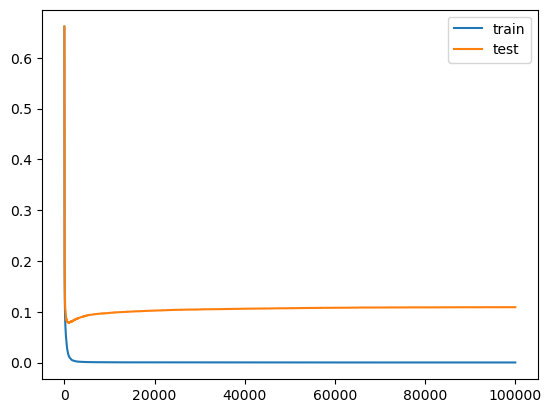

In [99]:
model = XGBClassifier(n_estimators=100000, eta=0.05 ,colsample_bytree = 0.9 ,gamma = 0 ,max_depth =5 ,
                      min_child_weight =1 ,subsample =0.8)
# define the datasets to evaluate each iteration
evalset = [(x_train, y_train), (x_test,y_test)]
# fit the model
model.fit(x_train, y_train, eval_metric='logloss', eval_set=evalset)
# evaluate performance
y_pred_te = model.predict(x_test)
score = accuracy_score(y_test, y_pred_te)
print('Accuracy: %.3f' % score)
# retrieve performance metrics
results = model.evals_result()
# plot learning curves
plt.plot(results['validation_0']['logloss'], label='train')
plt.plot(results['validation_1']['logloss'], label='test')
# show the legend
plt.legend()
# show the plot
plt.show()

    ### Accuracy: 0.971

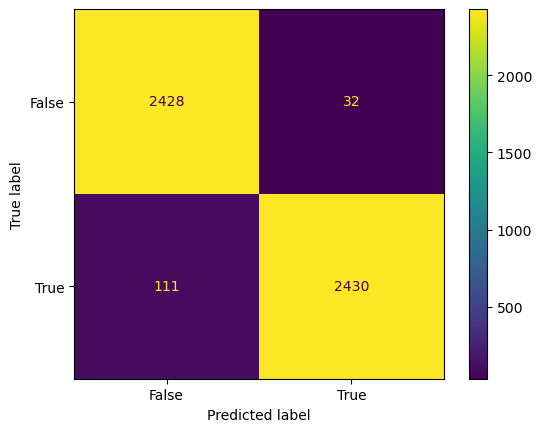

In [100]:
from sklearn.metrics import confusion_matrix
from sklearn import metrics
confusion_matrix = metrics.confusion_matrix(y_test,y_pred_te)
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, 
                                            display_labels = [False, True])
cm_display.plot()
plt.show()

In [101]:
print("classification_report")
print(classification_report(y_test,y_pred_te))
print("Precision :",precision_score(y_test,y_pred_te))
print("Recall :",recall_score(y_test,y_pred_te))
print("F1 :",f1_score(y_test ,y_pred_te))

classification_report
              precision    recall  f1-score   support

           0       0.96      0.99      0.97      2460
           1       0.99      0.96      0.97      2541

    accuracy                           0.97      5001
   macro avg       0.97      0.97      0.97      5001
weighted avg       0.97      0.97      0.97      5001

Precision : 0.9870024370430545
Recall : 0.9563164108618654
F1 : 0.9714171497101739


### Testing model of single input

In [102]:
x.columns

Index(['Ipv', 'Vpv', 'Vdc', 'ia', 'ib', 'ic', 'va', 'vb', 'vc', 'Iabc', 'If',
       'Vabc', 'Vf'],
      dtype='object')

In [103]:
Ipv = 2.6243286
Vpv = 87.06055
Vdc = 147.36328
ia = -0.061280273
ib = 0.5975342
ic = -0.56311524
va = -12.150879
vb = -125.86044
vc = 142.3027
Iabc = 0.68265504
If = 50.06943
Vabc = 155.76646
Vf = 50.01901



input_array = np.array([Ipv,Vpv,Vdc,ia,ib,ic,va,vb,vc,Iabc,If,Vabc,Vf])


In [104]:
df1 = pd.DataFrame(input_array ,index = x.columns)

In [105]:
df1 = df1.transpose()

In [106]:
prediction_out = model.predict(df1)

In [107]:
prediction_out[0]

1

In [109]:
with open("rf_model.pickle","wb") as f:
    pickle.dump(rf_model,f)